In [1]:
import pandas as pd
import numpy as np
import csv 

import os
import glob
from multiprocessing import freeze_support
from modwtpy.modwt import modwt, imodwt


from darts import TimeSeries
from darts.metrics import mape, mase, rmse,mae,smape

In [2]:
#Importing the testing models
from darts.models import (
    TransformerModel,
)
from darts.models import CatBoostModel as CB

Assign the target variable and path of the dataset below. To change the forecast horizon customize the nforecastList.

In [3]:
target = 'CO'

if __name__ == "__main__":
    freeze_support()
    nforecastList = [168,336]

    for nforecast in nforecastList:
        path = 'C:\jintu\W_Transformer_main\Dataset'
        csv_files = glob.glob(os.path.join(path, "*.csv"))
        filename = 'x.csv'
        # loop over the list of csv files
        for f in csv_files:
            with open(filename, 'a', encoding='UTF8') as r:
                writer = csv.writer(r)
                writer.writerow([f,nforecast])
            # read the csv file
            df = pd.read_csv(f)
            series = df[target]
            wt = modwt(series, 'haar', int(np.log(len(series))))
            seriesList = []
            train = []
            test = []
            val = []
            nb_time = len(series)
            nb_val = int(nb_time*0.2)
            
            for i in range(len(wt)):
                wt_df = TimeSeries.from_dataframe(pd.DataFrame(wt[i]))
                seriesList.append(wt_df)
                
                wt_df_train = wt_df[:nb_time-nforecast]
                train.append(wt_df_train)
                
                #wt_df_test = wt_df[nb_time-nforecast-nb_val:nb_time-nforecast]
                #test.append(wt_df_test)
                
                wt_df_val = wt_df[nb_time-nforecast:]
                val.append(wt_df_val)
                
            prediction = []
            models_transformers = []
            
            for i in range(len(train)):
                transformers = CB(lags=24,
                                 output_chunk_length=4)
                
                transformers.fit(series = train[i], verbose=True)
                print('seriesList = ',seriesList[i])
                print('nb-time-nforecast = ',nb_time-nforecast)
                pred_series = transformers.historical_forecasts(seriesList[i],
                                                                start = nb_time-nforecast,
                                                                retrain=False,
                                                                verbose=True,
                                                                )
                prediction.append(pred_series)
            
            
            prediction_tmp = prediction[0].pd_dataframe()

            for i in range(1,len(prediction)):
                prediction_tmp[i] = prediction[i].pd_dataframe()

            res = imodwt(prediction_tmp.transpose().to_numpy(),'haar')
            index_train = pd.RangeIndex(start=0, stop=nb_time-nforecast, step=1, name="time")
            index = pd.RangeIndex(start=nb_time-nforecast, stop=nb_time, step=1, name="time")
            
            train_reindex = pd.DataFrame(series[:nb_time-nforecast].reset_index(drop=True)).set_index(index_train)
            val_reindex = pd.DataFrame(series[nb_time-nforecast:].reset_index(drop=True)).set_index(index)
            res_pred = pd.DataFrame(res).set_index(index)

            res = TimeSeries.from_dataframe(res_pred)
            train_reindex = TimeSeries.from_dataframe(train_reindex)
            val_reindex = TimeSeries.from_dataframe(val_reindex)

            with open(filename, 'a', encoding='UTF8') as f:
                writer = csv.writer(f)
                writer.writerow(['WTransformer',rmse(val_reindex,res),
                                 #mape(val_reindex,res),
                                 mae(val_reindex,res),
                                 #smape(val_reindex,res),
                                 mase(val_reindex,res,
                                      train_reindex)])

Learning rate set to 0.057612
0:	learn: 29.3322298	total: 226ms	remaining: 3m 45s
1:	learn: 29.0580322	total: 234ms	remaining: 1m 56s
2:	learn: 28.8173724	total: 241ms	remaining: 1m 20s
3:	learn: 28.5683667	total: 251ms	remaining: 1m 2s
4:	learn: 28.3299902	total: 258ms	remaining: 51.4s
5:	learn: 28.1167564	total: 269ms	remaining: 44.5s
6:	learn: 27.9314529	total: 276ms	remaining: 39.1s
7:	learn: 27.7200522	total: 285ms	remaining: 35.3s
8:	learn: 27.5520745	total: 292ms	remaining: 32.2s
9:	learn: 27.4089610	total: 301ms	remaining: 29.8s
10:	learn: 27.2574234	total: 309ms	remaining: 27.8s
11:	learn: 27.0794476	total: 318ms	remaining: 26.2s
12:	learn: 26.9312809	total: 330ms	remaining: 25s
13:	learn: 26.7854210	total: 339ms	remaining: 23.9s
14:	learn: 26.6378361	total: 350ms	remaining: 23s
15:	learn: 26.5166680	total: 359ms	remaining: 22.1s
16:	learn: 26.3828592	total: 367ms	remaining: 21.2s
17:	learn: 26.2778076	total: 376ms	remaining: 20.5s
18:	learn: 26.1722461	total: 385ms	remaining:

170:	learn: 21.2579191	total: 1.53s	remaining: 7.42s
171:	learn: 21.2363836	total: 1.54s	remaining: 7.41s
172:	learn: 21.2246495	total: 1.55s	remaining: 7.4s
173:	learn: 21.1900543	total: 1.56s	remaining: 7.39s
174:	learn: 21.1678816	total: 1.57s	remaining: 7.39s
175:	learn: 21.1550211	total: 1.58s	remaining: 7.38s
176:	learn: 21.1504943	total: 1.58s	remaining: 7.37s
177:	learn: 21.0929890	total: 1.6s	remaining: 7.37s
178:	learn: 21.0757444	total: 1.6s	remaining: 7.36s
179:	learn: 21.0538656	total: 1.61s	remaining: 7.35s
180:	learn: 21.0470756	total: 1.62s	remaining: 7.33s
181:	learn: 21.0290427	total: 1.63s	remaining: 7.32s
182:	learn: 21.0077969	total: 1.64s	remaining: 7.31s
183:	learn: 20.9736107	total: 1.65s	remaining: 7.3s
184:	learn: 20.9588920	total: 1.65s	remaining: 7.29s
185:	learn: 20.9403550	total: 1.66s	remaining: 7.28s
186:	learn: 20.9234975	total: 1.67s	remaining: 7.27s
187:	learn: 20.9074512	total: 1.68s	remaining: 7.26s
188:	learn: 20.8974406	total: 1.69s	remaining: 7.2

336:	learn: 18.4711085	total: 2.89s	remaining: 5.68s
337:	learn: 18.4532684	total: 2.9s	remaining: 5.68s
338:	learn: 18.4365641	total: 2.91s	remaining: 5.67s
339:	learn: 18.4164718	total: 2.91s	remaining: 5.66s
340:	learn: 18.4119501	total: 2.92s	remaining: 5.64s
341:	learn: 18.3874028	total: 2.93s	remaining: 5.63s
342:	learn: 18.3830965	total: 2.93s	remaining: 5.62s
343:	learn: 18.3693182	total: 2.94s	remaining: 5.61s
344:	learn: 18.3512014	total: 2.95s	remaining: 5.6s
345:	learn: 18.3454379	total: 2.96s	remaining: 5.59s
346:	learn: 18.3351025	total: 2.96s	remaining: 5.57s
347:	learn: 18.3179595	total: 2.97s	remaining: 5.56s
348:	learn: 18.3102484	total: 2.98s	remaining: 5.55s
349:	learn: 18.2944087	total: 2.98s	remaining: 5.54s
350:	learn: 18.2832123	total: 2.99s	remaining: 5.53s
351:	learn: 18.2757479	total: 3s	remaining: 5.52s
352:	learn: 18.2702993	total: 3s	remaining: 5.51s
353:	learn: 18.2541685	total: 3.01s	remaining: 5.5s
354:	learn: 18.2396048	total: 3.02s	remaining: 5.49s
35

515:	learn: 16.5479129	total: 4.2s	remaining: 3.94s
516:	learn: 16.5434574	total: 4.21s	remaining: 3.93s
517:	learn: 16.5400337	total: 4.21s	remaining: 3.92s
518:	learn: 16.5294456	total: 4.22s	remaining: 3.91s
519:	learn: 16.5249505	total: 4.23s	remaining: 3.9s
520:	learn: 16.5218763	total: 4.24s	remaining: 3.9s
521:	learn: 16.5175997	total: 4.25s	remaining: 3.89s
522:	learn: 16.5120424	total: 4.26s	remaining: 3.88s
523:	learn: 16.4999583	total: 4.27s	remaining: 3.88s
524:	learn: 16.4913234	total: 4.27s	remaining: 3.87s
525:	learn: 16.4854123	total: 4.28s	remaining: 3.86s
526:	learn: 16.4758404	total: 4.29s	remaining: 3.85s
527:	learn: 16.4655206	total: 4.29s	remaining: 3.84s
528:	learn: 16.4459784	total: 4.3s	remaining: 3.83s
529:	learn: 16.4331407	total: 4.31s	remaining: 3.82s
530:	learn: 16.4198611	total: 4.32s	remaining: 3.81s
531:	learn: 16.4088606	total: 4.32s	remaining: 3.8s
532:	learn: 16.3972127	total: 4.33s	remaining: 3.79s
533:	learn: 16.3875581	total: 4.34s	remaining: 3.78

691:	learn: 14.9970561	total: 5.56s	remaining: 2.48s
692:	learn: 14.9921453	total: 5.58s	remaining: 2.47s
693:	learn: 14.9813705	total: 5.58s	remaining: 2.46s
694:	learn: 14.9762433	total: 5.59s	remaining: 2.45s
695:	learn: 14.9730089	total: 5.6s	remaining: 2.44s
696:	learn: 14.9685529	total: 5.6s	remaining: 2.44s
697:	learn: 14.9604947	total: 5.61s	remaining: 2.43s
698:	learn: 14.9522308	total: 5.62s	remaining: 2.42s
699:	learn: 14.9437973	total: 5.62s	remaining: 2.41s
700:	learn: 14.9391178	total: 5.63s	remaining: 2.4s
701:	learn: 14.9284794	total: 5.64s	remaining: 2.39s
702:	learn: 14.9253005	total: 5.64s	remaining: 2.38s
703:	learn: 14.9195857	total: 5.65s	remaining: 2.38s
704:	learn: 14.9144931	total: 5.66s	remaining: 2.37s
705:	learn: 14.9115250	total: 5.67s	remaining: 2.36s
706:	learn: 14.9091248	total: 5.67s	remaining: 2.35s
707:	learn: 14.8972108	total: 5.68s	remaining: 2.34s
708:	learn: 14.8878169	total: 5.69s	remaining: 2.33s
709:	learn: 14.8796871	total: 5.69s	remaining: 2.

863:	learn: 13.8122423	total: 6.91s	remaining: 1.09s
864:	learn: 13.8038956	total: 6.92s	remaining: 1.08s
865:	learn: 13.7951318	total: 6.93s	remaining: 1.07s
866:	learn: 13.7922648	total: 6.94s	remaining: 1.06s
867:	learn: 13.7857643	total: 6.95s	remaining: 1.06s
868:	learn: 13.7806388	total: 6.95s	remaining: 1.05s
869:	learn: 13.7772042	total: 6.96s	remaining: 1.04s
870:	learn: 13.7695470	total: 6.97s	remaining: 1.03s
871:	learn: 13.7595824	total: 6.98s	remaining: 1.02s
872:	learn: 13.7542272	total: 6.99s	remaining: 1.02s
873:	learn: 13.7465544	total: 7s	remaining: 1.01s
874:	learn: 13.7394582	total: 7s	remaining: 1s
875:	learn: 13.7358054	total: 7.01s	remaining: 993ms
876:	learn: 13.7311109	total: 7.02s	remaining: 985ms
877:	learn: 13.7239293	total: 7.03s	remaining: 977ms
878:	learn: 13.7132958	total: 7.04s	remaining: 969ms
879:	learn: 13.7109636	total: 7.05s	remaining: 961ms
880:	learn: 13.7036122	total: 7.05s	remaining: 953ms
881:	learn: 13.6933833	total: 7.06s	remaining: 945ms
88

25:	learn: 26.1927816	total: 207ms	remaining: 7.76s
26:	learn: 26.1097452	total: 218ms	remaining: 7.86s
27:	learn: 26.0467719	total: 225ms	remaining: 7.82s
28:	learn: 25.9808157	total: 232ms	remaining: 7.77s
29:	learn: 25.9170070	total: 239ms	remaining: 7.73s
30:	learn: 25.8624425	total: 246ms	remaining: 7.69s
31:	learn: 25.8115525	total: 253ms	remaining: 7.64s
32:	learn: 25.7506341	total: 260ms	remaining: 7.62s
33:	learn: 25.6867563	total: 267ms	remaining: 7.59s
34:	learn: 25.6315235	total: 274ms	remaining: 7.56s
35:	learn: 25.5929777	total: 281ms	remaining: 7.53s
36:	learn: 25.5087321	total: 288ms	remaining: 7.5s
37:	learn: 25.4323795	total: 295ms	remaining: 7.48s
38:	learn: 25.3857367	total: 302ms	remaining: 7.45s
39:	learn: 25.3338567	total: 309ms	remaining: 7.42s
40:	learn: 25.2791740	total: 316ms	remaining: 7.39s
41:	learn: 25.2479914	total: 323ms	remaining: 7.37s
42:	learn: 25.2005194	total: 331ms	remaining: 7.36s
43:	learn: 25.1523931	total: 338ms	remaining: 7.33s
44:	learn: 25

201:	learn: 22.0425831	total: 1.53s	remaining: 6.06s
202:	learn: 22.0322412	total: 1.54s	remaining: 6.05s
203:	learn: 22.0182424	total: 1.55s	remaining: 6.04s
204:	learn: 21.9903867	total: 1.55s	remaining: 6.03s
205:	learn: 21.9834589	total: 1.56s	remaining: 6.02s
206:	learn: 21.9773946	total: 1.57s	remaining: 6.01s
207:	learn: 21.9652292	total: 1.58s	remaining: 6s
208:	learn: 21.9478919	total: 1.58s	remaining: 5.99s
209:	learn: 21.9380856	total: 1.59s	remaining: 5.98s
210:	learn: 21.9194113	total: 1.6s	remaining: 5.98s
211:	learn: 21.9095276	total: 1.61s	remaining: 5.97s
212:	learn: 21.8965931	total: 1.61s	remaining: 5.97s
213:	learn: 21.8791149	total: 1.62s	remaining: 5.96s
214:	learn: 21.8523808	total: 1.63s	remaining: 5.96s
215:	learn: 21.8293468	total: 1.64s	remaining: 5.95s
216:	learn: 21.8059583	total: 1.65s	remaining: 5.94s
217:	learn: 21.7995021	total: 1.65s	remaining: 5.92s
218:	learn: 21.7867695	total: 1.66s	remaining: 5.92s
219:	learn: 21.7672698	total: 1.67s	remaining: 5.9

359:	learn: 19.9640430	total: 2.67s	remaining: 4.75s
360:	learn: 19.9229537	total: 2.68s	remaining: 4.74s
361:	learn: 19.9177644	total: 2.69s	remaining: 4.73s
362:	learn: 19.9087079	total: 2.69s	remaining: 4.72s
363:	learn: 19.8955478	total: 2.7s	remaining: 4.72s
364:	learn: 19.8806389	total: 2.71s	remaining: 4.71s
365:	learn: 19.8585784	total: 2.71s	remaining: 4.7s
366:	learn: 19.8438692	total: 2.72s	remaining: 4.69s
367:	learn: 19.8320323	total: 2.73s	remaining: 4.68s
368:	learn: 19.8188743	total: 2.73s	remaining: 4.67s
369:	learn: 19.8055489	total: 2.74s	remaining: 4.67s
370:	learn: 19.7913948	total: 2.75s	remaining: 4.66s
371:	learn: 19.7863039	total: 2.75s	remaining: 4.65s
372:	learn: 19.7804170	total: 2.76s	remaining: 4.64s
373:	learn: 19.7651679	total: 2.77s	remaining: 4.63s
374:	learn: 19.7492889	total: 2.77s	remaining: 4.63s
375:	learn: 19.7385132	total: 2.79s	remaining: 4.62s
376:	learn: 19.7300366	total: 2.79s	remaining: 4.62s
377:	learn: 19.7072537	total: 2.8s	remaining: 4.

519:	learn: 18.2042884	total: 3.85s	remaining: 3.55s
520:	learn: 18.1982851	total: 3.86s	remaining: 3.54s
521:	learn: 18.1917715	total: 3.86s	remaining: 3.54s
522:	learn: 18.1814705	total: 3.87s	remaining: 3.53s
523:	learn: 18.1801169	total: 3.88s	remaining: 3.52s
524:	learn: 18.1682266	total: 3.88s	remaining: 3.52s
525:	learn: 18.1591381	total: 3.89s	remaining: 3.51s
526:	learn: 18.1561406	total: 3.9s	remaining: 3.5s
527:	learn: 18.1480192	total: 3.9s	remaining: 3.49s
528:	learn: 18.1406060	total: 3.91s	remaining: 3.48s
529:	learn: 18.1325313	total: 3.92s	remaining: 3.48s
530:	learn: 18.1250081	total: 3.93s	remaining: 3.47s
531:	learn: 18.1186228	total: 3.93s	remaining: 3.46s
532:	learn: 18.1145061	total: 3.94s	remaining: 3.45s
533:	learn: 18.1078632	total: 3.95s	remaining: 3.44s
534:	learn: 18.0995815	total: 3.95s	remaining: 3.44s
535:	learn: 18.0904753	total: 3.96s	remaining: 3.43s
536:	learn: 18.0783704	total: 3.97s	remaining: 3.42s
537:	learn: 18.0700429	total: 3.98s	remaining: 3.

677:	learn: 16.8363636	total: 4.99s	remaining: 2.37s
678:	learn: 16.8257747	total: 5s	remaining: 2.36s
679:	learn: 16.8204538	total: 5s	remaining: 2.35s
680:	learn: 16.8139129	total: 5.01s	remaining: 2.35s
681:	learn: 16.8080809	total: 5.02s	remaining: 2.34s
682:	learn: 16.8023905	total: 5.02s	remaining: 2.33s
683:	learn: 16.7884707	total: 5.03s	remaining: 2.32s
684:	learn: 16.7783362	total: 5.04s	remaining: 2.32s
685:	learn: 16.7703669	total: 5.04s	remaining: 2.31s
686:	learn: 16.7620733	total: 5.05s	remaining: 2.3s
687:	learn: 16.7509886	total: 5.06s	remaining: 2.29s
688:	learn: 16.7428505	total: 5.07s	remaining: 2.29s
689:	learn: 16.7340171	total: 5.07s	remaining: 2.28s
690:	learn: 16.7166421	total: 5.08s	remaining: 2.27s
691:	learn: 16.7128771	total: 5.09s	remaining: 2.26s
692:	learn: 16.7084221	total: 5.09s	remaining: 2.26s
693:	learn: 16.7034989	total: 5.1s	remaining: 2.25s
694:	learn: 16.6965682	total: 5.11s	remaining: 2.24s
695:	learn: 16.6901769	total: 5.12s	remaining: 2.23s
6

855:	learn: 15.5690690	total: 6.36s	remaining: 1.07s
856:	learn: 15.5624274	total: 6.37s	remaining: 1.06s
857:	learn: 15.5580695	total: 6.38s	remaining: 1.06s
858:	learn: 15.5508376	total: 6.39s	remaining: 1.05s
859:	learn: 15.5432903	total: 6.39s	remaining: 1.04s
860:	learn: 15.5421270	total: 6.4s	remaining: 1.03s
861:	learn: 15.5352879	total: 6.41s	remaining: 1.03s
862:	learn: 15.5316204	total: 6.42s	remaining: 1.02s
863:	learn: 15.5267658	total: 6.42s	remaining: 1.01s
864:	learn: 15.5200054	total: 6.43s	remaining: 1s
865:	learn: 15.5067048	total: 6.44s	remaining: 996ms
866:	learn: 15.5013223	total: 6.45s	remaining: 989ms
867:	learn: 15.4962358	total: 6.45s	remaining: 981ms
868:	learn: 15.4889681	total: 6.46s	remaining: 974ms
869:	learn: 15.4843970	total: 6.46s	remaining: 966ms
870:	learn: 15.4746659	total: 6.47s	remaining: 959ms
871:	learn: 15.4698024	total: 6.48s	remaining: 951ms
872:	learn: 15.4631672	total: 6.49s	remaining: 944ms
873:	learn: 15.4543988	total: 6.5s	remaining: 936m

27:	learn: 26.6589106	total: 205ms	remaining: 7.13s
28:	learn: 26.5983804	total: 213ms	remaining: 7.13s
29:	learn: 26.5697833	total: 219ms	remaining: 7.09s
30:	learn: 26.5142313	total: 228ms	remaining: 7.13s
31:	learn: 26.4663627	total: 238ms	remaining: 7.18s
32:	learn: 26.4198837	total: 246ms	remaining: 7.22s
33:	learn: 26.3698281	total: 253ms	remaining: 7.19s
34:	learn: 26.3185836	total: 260ms	remaining: 7.18s
35:	learn: 26.2740202	total: 267ms	remaining: 7.15s
36:	learn: 26.2293838	total: 275ms	remaining: 7.15s
37:	learn: 26.1701970	total: 282ms	remaining: 7.13s
38:	learn: 26.1313200	total: 290ms	remaining: 7.14s
39:	learn: 26.0902514	total: 296ms	remaining: 7.1s
40:	learn: 26.0729418	total: 303ms	remaining: 7.08s
41:	learn: 26.0296620	total: 310ms	remaining: 7.07s
42:	learn: 25.9887321	total: 317ms	remaining: 7.05s
43:	learn: 25.9500056	total: 324ms	remaining: 7.04s
44:	learn: 25.9143950	total: 330ms	remaining: 7.01s
45:	learn: 25.8633296	total: 338ms	remaining: 7.01s
46:	learn: 25

184:	learn: 23.0778023	total: 1.34s	remaining: 5.9s
185:	learn: 23.0618554	total: 1.35s	remaining: 5.89s
186:	learn: 23.0414394	total: 1.35s	remaining: 5.89s
187:	learn: 23.0296519	total: 1.36s	remaining: 5.88s
188:	learn: 23.0204879	total: 1.37s	remaining: 5.88s
189:	learn: 23.0068937	total: 1.38s	remaining: 5.87s
190:	learn: 22.9917633	total: 1.38s	remaining: 5.86s
191:	learn: 22.9727240	total: 1.39s	remaining: 5.85s
192:	learn: 22.9639648	total: 1.4s	remaining: 5.84s
193:	learn: 22.9516922	total: 1.4s	remaining: 5.83s
194:	learn: 22.9399600	total: 1.41s	remaining: 5.82s
195:	learn: 22.9230407	total: 1.42s	remaining: 5.82s
196:	learn: 22.9165212	total: 1.42s	remaining: 5.81s
197:	learn: 22.9025373	total: 1.43s	remaining: 5.8s
198:	learn: 22.8933522	total: 1.44s	remaining: 5.79s
199:	learn: 22.8602659	total: 1.44s	remaining: 5.78s
200:	learn: 22.8449466	total: 1.45s	remaining: 5.77s
201:	learn: 22.8333702	total: 1.46s	remaining: 5.76s
202:	learn: 22.8195468	total: 1.47s	remaining: 5.7

358:	learn: 20.7556756	total: 2.65s	remaining: 4.73s
359:	learn: 20.7382552	total: 2.66s	remaining: 4.74s
360:	learn: 20.7222033	total: 2.67s	remaining: 4.73s
361:	learn: 20.7142109	total: 2.69s	remaining: 4.74s
362:	learn: 20.6998990	total: 2.7s	remaining: 4.73s
363:	learn: 20.6921890	total: 2.71s	remaining: 4.73s
364:	learn: 20.6780110	total: 2.71s	remaining: 4.72s
365:	learn: 20.6656004	total: 2.73s	remaining: 4.72s
366:	learn: 20.6585232	total: 2.73s	remaining: 4.71s
367:	learn: 20.6505109	total: 2.74s	remaining: 4.71s
368:	learn: 20.6362938	total: 2.75s	remaining: 4.71s
369:	learn: 20.6147093	total: 2.76s	remaining: 4.7s
370:	learn: 20.6055273	total: 2.77s	remaining: 4.69s
371:	learn: 20.5949116	total: 2.78s	remaining: 4.69s
372:	learn: 20.5878824	total: 2.79s	remaining: 4.69s
373:	learn: 20.5797586	total: 2.8s	remaining: 4.68s
374:	learn: 20.5756477	total: 2.81s	remaining: 4.68s
375:	learn: 20.5651164	total: 2.81s	remaining: 4.67s
376:	learn: 20.5482120	total: 2.82s	remaining: 4.

534:	learn: 18.9862892	total: 4.18s	remaining: 3.63s
535:	learn: 18.9755433	total: 4.19s	remaining: 3.63s
536:	learn: 18.9632460	total: 4.23s	remaining: 3.64s
537:	learn: 18.9532630	total: 4.23s	remaining: 3.64s
538:	learn: 18.9500022	total: 4.24s	remaining: 3.63s
539:	learn: 18.9397923	total: 4.25s	remaining: 3.62s
540:	learn: 18.9283602	total: 4.26s	remaining: 3.61s
541:	learn: 18.9207672	total: 4.26s	remaining: 3.6s
542:	learn: 18.9108731	total: 4.27s	remaining: 3.6s
543:	learn: 18.9033015	total: 4.28s	remaining: 3.59s
544:	learn: 18.8867719	total: 4.29s	remaining: 3.58s
545:	learn: 18.8787410	total: 4.29s	remaining: 3.57s
546:	learn: 18.8726093	total: 4.3s	remaining: 3.56s
547:	learn: 18.8671689	total: 4.31s	remaining: 3.55s
548:	learn: 18.8536379	total: 4.32s	remaining: 3.54s
549:	learn: 18.8436642	total: 4.32s	remaining: 3.54s
550:	learn: 18.8289720	total: 4.33s	remaining: 3.53s
551:	learn: 18.8151045	total: 4.34s	remaining: 3.52s
552:	learn: 18.8057778	total: 4.34s	remaining: 3.

701:	learn: 17.5319846	total: 5.5s	remaining: 2.33s
702:	learn: 17.5248005	total: 5.51s	remaining: 2.33s
703:	learn: 17.5205843	total: 5.52s	remaining: 2.32s
704:	learn: 17.5168537	total: 5.53s	remaining: 2.31s
705:	learn: 17.5071911	total: 5.54s	remaining: 2.31s
706:	learn: 17.5040911	total: 5.55s	remaining: 2.3s
707:	learn: 17.4996137	total: 5.56s	remaining: 2.29s
708:	learn: 17.4929601	total: 5.57s	remaining: 2.28s
709:	learn: 17.4871333	total: 5.57s	remaining: 2.28s
710:	learn: 17.4816118	total: 5.58s	remaining: 2.27s
711:	learn: 17.4709292	total: 5.59s	remaining: 2.26s
712:	learn: 17.4647540	total: 5.6s	remaining: 2.25s
713:	learn: 17.4584230	total: 5.61s	remaining: 2.25s
714:	learn: 17.4508304	total: 5.62s	remaining: 2.24s
715:	learn: 17.4472119	total: 5.62s	remaining: 2.23s
716:	learn: 17.4404796	total: 5.63s	remaining: 2.22s
717:	learn: 17.4355024	total: 5.64s	remaining: 2.22s
718:	learn: 17.4290955	total: 5.65s	remaining: 2.21s
719:	learn: 17.4172262	total: 5.66s	remaining: 2.

871:	learn: 16.2338433	total: 6.81s	remaining: 999ms
872:	learn: 16.2325284	total: 6.81s	remaining: 991ms
873:	learn: 16.2262034	total: 6.82s	remaining: 984ms
874:	learn: 16.2219620	total: 6.83s	remaining: 976ms
875:	learn: 16.2102166	total: 6.84s	remaining: 968ms
876:	learn: 16.2054866	total: 6.84s	remaining: 960ms
877:	learn: 16.2018945	total: 6.85s	remaining: 952ms
878:	learn: 16.1892320	total: 6.86s	remaining: 944ms
879:	learn: 16.1808432	total: 6.87s	remaining: 936ms
880:	learn: 16.1730332	total: 6.87s	remaining: 928ms
881:	learn: 16.1614053	total: 6.88s	remaining: 921ms
882:	learn: 16.1589067	total: 6.89s	remaining: 913ms
883:	learn: 16.1519252	total: 6.89s	remaining: 905ms
884:	learn: 16.1493663	total: 6.9s	remaining: 897ms
885:	learn: 16.1425540	total: 6.91s	remaining: 889ms
886:	learn: 16.1374838	total: 6.92s	remaining: 881ms
887:	learn: 16.1306810	total: 6.92s	remaining: 873ms
888:	learn: 16.1248477	total: 6.93s	remaining: 865ms
889:	learn: 16.1199822	total: 6.94s	remaining: 

39:	learn: 26.5456762	total: 301ms	remaining: 7.22s
40:	learn: 26.5315587	total: 308ms	remaining: 7.19s
41:	learn: 26.4947967	total: 316ms	remaining: 7.2s
42:	learn: 26.4636509	total: 323ms	remaining: 7.18s
43:	learn: 26.4394227	total: 330ms	remaining: 7.17s
44:	learn: 26.4040194	total: 337ms	remaining: 7.15s
45:	learn: 26.3707312	total: 344ms	remaining: 7.13s
46:	learn: 26.3318349	total: 351ms	remaining: 7.11s
47:	learn: 26.2931245	total: 358ms	remaining: 7.1s
48:	learn: 26.2737169	total: 365ms	remaining: 7.08s
49:	learn: 26.2444828	total: 372ms	remaining: 7.07s
50:	learn: 26.2136440	total: 379ms	remaining: 7.05s
51:	learn: 26.1781016	total: 386ms	remaining: 7.03s
52:	learn: 26.1459081	total: 393ms	remaining: 7.02s
53:	learn: 26.1082125	total: 399ms	remaining: 7s
54:	learn: 26.0801315	total: 407ms	remaining: 6.99s
55:	learn: 26.0373460	total: 414ms	remaining: 6.97s
56:	learn: 26.0138216	total: 421ms	remaining: 6.96s
57:	learn: 25.9879279	total: 428ms	remaining: 6.95s
58:	learn: 25.956

221:	learn: 23.2975856	total: 1.63s	remaining: 5.71s
222:	learn: 23.2916173	total: 1.64s	remaining: 5.71s
223:	learn: 23.2788378	total: 1.64s	remaining: 5.7s
224:	learn: 23.2631156	total: 1.65s	remaining: 5.69s
225:	learn: 23.2587732	total: 1.66s	remaining: 5.68s
226:	learn: 23.2402080	total: 1.67s	remaining: 5.67s
227:	learn: 23.2242875	total: 1.67s	remaining: 5.66s
228:	learn: 23.2120218	total: 1.68s	remaining: 5.65s
229:	learn: 23.2010301	total: 1.69s	remaining: 5.64s
230:	learn: 23.1827438	total: 1.69s	remaining: 5.63s
231:	learn: 23.1696621	total: 1.7s	remaining: 5.63s
232:	learn: 23.1527064	total: 1.71s	remaining: 5.62s
233:	learn: 23.1395311	total: 1.71s	remaining: 5.61s
234:	learn: 23.1310247	total: 1.72s	remaining: 5.6s
235:	learn: 23.1135622	total: 1.73s	remaining: 5.59s
236:	learn: 23.1084399	total: 1.73s	remaining: 5.58s
237:	learn: 23.1002948	total: 1.74s	remaining: 5.57s
238:	learn: 23.0908081	total: 1.75s	remaining: 5.57s
239:	learn: 23.0790939	total: 1.75s	remaining: 5.

380:	learn: 21.2777428	total: 2.79s	remaining: 4.54s
381:	learn: 21.2640766	total: 2.8s	remaining: 4.53s
382:	learn: 21.2615038	total: 2.81s	remaining: 4.52s
383:	learn: 21.2551386	total: 2.81s	remaining: 4.52s
384:	learn: 21.2395229	total: 2.82s	remaining: 4.51s
385:	learn: 21.2181888	total: 2.83s	remaining: 4.5s
386:	learn: 21.2139605	total: 2.84s	remaining: 4.5s
387:	learn: 21.2055589	total: 2.85s	remaining: 4.49s
388:	learn: 21.1952353	total: 2.85s	remaining: 4.48s
389:	learn: 21.1850647	total: 2.86s	remaining: 4.47s
390:	learn: 21.1733987	total: 2.87s	remaining: 4.46s
391:	learn: 21.1638674	total: 2.87s	remaining: 4.46s
392:	learn: 21.1546266	total: 2.88s	remaining: 4.45s
393:	learn: 21.1265867	total: 2.89s	remaining: 4.44s
394:	learn: 21.1144584	total: 2.89s	remaining: 4.43s
395:	learn: 21.1132757	total: 2.9s	remaining: 4.42s
396:	learn: 21.0996606	total: 2.91s	remaining: 4.42s
397:	learn: 21.0897154	total: 2.92s	remaining: 4.41s
398:	learn: 21.0836066	total: 2.92s	remaining: 4.4

540:	learn: 19.5186568	total: 3.96s	remaining: 3.36s
541:	learn: 19.5121204	total: 3.96s	remaining: 3.35s
542:	learn: 19.5012936	total: 3.97s	remaining: 3.34s
543:	learn: 19.4934805	total: 3.98s	remaining: 3.33s
544:	learn: 19.4761030	total: 3.98s	remaining: 3.33s
545:	learn: 19.4713528	total: 3.99s	remaining: 3.32s
546:	learn: 19.4651426	total: 4s	remaining: 3.31s
547:	learn: 19.4594987	total: 4s	remaining: 3.3s
548:	learn: 19.4471012	total: 4.01s	remaining: 3.3s
549:	learn: 19.4432669	total: 4.02s	remaining: 3.29s
550:	learn: 19.4390010	total: 4.03s	remaining: 3.28s
551:	learn: 19.4343573	total: 4.03s	remaining: 3.27s
552:	learn: 19.4254339	total: 4.04s	remaining: 3.27s
553:	learn: 19.4132111	total: 4.05s	remaining: 3.26s
554:	learn: 19.3970193	total: 4.06s	remaining: 3.25s
555:	learn: 19.3877091	total: 4.07s	remaining: 3.25s
556:	learn: 19.3721788	total: 4.08s	remaining: 3.24s
557:	learn: 19.3595175	total: 4.08s	remaining: 3.23s
558:	learn: 19.3477163	total: 4.09s	remaining: 3.23s
5

717:	learn: 17.9494830	total: 5.25s	remaining: 2.06s
718:	learn: 17.9433240	total: 5.27s	remaining: 2.06s
719:	learn: 17.9349539	total: 5.27s	remaining: 2.05s
720:	learn: 17.9252895	total: 5.28s	remaining: 2.04s
721:	learn: 17.9229566	total: 5.29s	remaining: 2.04s
722:	learn: 17.9148563	total: 5.3s	remaining: 2.03s
723:	learn: 17.9136743	total: 5.3s	remaining: 2.02s
724:	learn: 17.9089326	total: 5.31s	remaining: 2.01s
725:	learn: 17.8971498	total: 5.32s	remaining: 2.01s
726:	learn: 17.8915574	total: 5.32s	remaining: 2s
727:	learn: 17.8776320	total: 5.33s	remaining: 1.99s
728:	learn: 17.8682198	total: 5.34s	remaining: 1.98s
729:	learn: 17.8607281	total: 5.34s	remaining: 1.98s
730:	learn: 17.8486652	total: 5.35s	remaining: 1.97s
731:	learn: 17.8398869	total: 5.36s	remaining: 1.96s
732:	learn: 17.8334696	total: 5.37s	remaining: 1.95s
733:	learn: 17.8194620	total: 5.37s	remaining: 1.95s
734:	learn: 17.8178838	total: 5.38s	remaining: 1.94s
735:	learn: 17.8098604	total: 5.39s	remaining: 1.93

897:	learn: 16.5739116	total: 6.56s	remaining: 745ms
898:	learn: 16.5694064	total: 6.57s	remaining: 738ms
899:	learn: 16.5656119	total: 6.57s	remaining: 730ms
900:	learn: 16.5609614	total: 6.58s	remaining: 723ms
901:	learn: 16.5546457	total: 6.59s	remaining: 716ms
902:	learn: 16.5500157	total: 6.59s	remaining: 708ms
903:	learn: 16.5430698	total: 6.6s	remaining: 701ms
904:	learn: 16.5315285	total: 6.61s	remaining: 694ms
905:	learn: 16.5232648	total: 6.62s	remaining: 686ms
906:	learn: 16.5197038	total: 6.62s	remaining: 679ms
907:	learn: 16.5103186	total: 6.63s	remaining: 672ms
908:	learn: 16.5054911	total: 6.64s	remaining: 664ms
909:	learn: 16.4939442	total: 6.64s	remaining: 657ms
910:	learn: 16.4848124	total: 6.65s	remaining: 650ms
911:	learn: 16.4776337	total: 6.66s	remaining: 642ms
912:	learn: 16.4726836	total: 6.66s	remaining: 635ms
913:	learn: 16.4663180	total: 6.67s	remaining: 628ms
914:	learn: 16.4603195	total: 6.68s	remaining: 620ms
915:	learn: 16.4480368	total: 6.69s	remaining: 

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 39.8054399	total: 7.33ms	remaining: 7.32s
1:	learn: 38.8032592	total: 15ms	remaining: 7.5s
2:	learn: 37.8947971	total: 21.8ms	remaining: 7.26s
3:	learn: 37.0468024	total: 29.5ms	remaining: 7.36s
4:	learn: 36.1586305	total: 39.6ms	remaining: 7.88s
5:	learn: 35.3097043	total: 46.9ms	remaining: 7.76s
6:	learn: 34.5286835	total: 53.6ms	remaining: 7.6s
7:	learn: 33.8038336	total: 60.7ms	remaining: 7.53s
8:	learn: 33.2371311	total: 67.8ms	remaining: 7.47s
9:	learn: 32.6709046	total: 74.8ms	remaining: 7.41s
10:	learn: 32.0712544	total: 82ms	remaining: 7.37s
11:	learn: 31.4721790	total: 88.8ms	remaining: 7.31s
12:	learn: 30.9052067	total: 96ms	remaining: 7.29s
13:	learn: 30.4027704	total: 103ms	remaining: 7.24s
14:	learn: 29.9177137	total: 110ms	remaining: 7.22s
15:	learn: 29.4489443	total: 117ms	remaining: 7.2s
16:	learn: 29.0119395	total: 127ms	remaining: 7.34s
17:	learn: 28.6129312	total: 134ms	remaining: 7.31s
18:	learn: 28.3068188	total: 141ms	remai

179:	learn: 16.8767845	total: 1.35s	remaining: 6.14s
180:	learn: 16.8601635	total: 1.36s	remaining: 6.14s
181:	learn: 16.8449830	total: 1.36s	remaining: 6.13s
182:	learn: 16.8100360	total: 1.37s	remaining: 6.13s
183:	learn: 16.7733087	total: 1.38s	remaining: 6.11s
184:	learn: 16.7571391	total: 1.39s	remaining: 6.11s
185:	learn: 16.7314534	total: 1.39s	remaining: 6.1s
186:	learn: 16.7229501	total: 1.4s	remaining: 6.09s
187:	learn: 16.7032889	total: 1.41s	remaining: 6.08s
188:	learn: 16.6758583	total: 1.41s	remaining: 6.07s
189:	learn: 16.6577195	total: 1.42s	remaining: 6.06s
190:	learn: 16.6427864	total: 1.43s	remaining: 6.04s
191:	learn: 16.6121327	total: 1.43s	remaining: 6.04s
192:	learn: 16.5792031	total: 1.44s	remaining: 6.03s
193:	learn: 16.5560225	total: 1.45s	remaining: 6.02s
194:	learn: 16.5417751	total: 1.46s	remaining: 6.01s
195:	learn: 16.5283181	total: 1.46s	remaining: 6s
196:	learn: 16.5111698	total: 1.47s	remaining: 5.99s
197:	learn: 16.4869210	total: 1.48s	remaining: 5.98

340:	learn: 14.0822788	total: 2.51s	remaining: 4.86s
341:	learn: 14.0704119	total: 2.52s	remaining: 4.85s
342:	learn: 14.0562588	total: 2.53s	remaining: 4.84s
343:	learn: 14.0475016	total: 2.53s	remaining: 4.83s
344:	learn: 14.0343834	total: 2.54s	remaining: 4.82s
345:	learn: 14.0291454	total: 2.55s	remaining: 4.82s
346:	learn: 14.0142845	total: 2.56s	remaining: 4.81s
347:	learn: 13.9985175	total: 2.56s	remaining: 4.8s
348:	learn: 13.9925330	total: 2.57s	remaining: 4.79s
349:	learn: 13.9844914	total: 2.58s	remaining: 4.78s
350:	learn: 13.9760911	total: 2.58s	remaining: 4.78s
351:	learn: 13.9706175	total: 2.59s	remaining: 4.77s
352:	learn: 13.9581677	total: 2.6s	remaining: 4.76s
353:	learn: 13.9402264	total: 2.6s	remaining: 4.75s
354:	learn: 13.9269746	total: 2.61s	remaining: 4.74s
355:	learn: 13.9224650	total: 2.62s	remaining: 4.74s
356:	learn: 13.9114765	total: 2.62s	remaining: 4.73s
357:	learn: 13.9036714	total: 2.63s	remaining: 4.72s
358:	learn: 13.8875662	total: 2.64s	remaining: 4.

512:	learn: 12.2952109	total: 4.06s	remaining: 3.85s
513:	learn: 12.2860434	total: 4.07s	remaining: 3.85s
514:	learn: 12.2808165	total: 4.08s	remaining: 3.84s
515:	learn: 12.2662436	total: 4.09s	remaining: 3.84s
516:	learn: 12.2573015	total: 4.1s	remaining: 3.83s
517:	learn: 12.2490296	total: 4.11s	remaining: 3.82s
518:	learn: 12.2359695	total: 4.12s	remaining: 3.82s
519:	learn: 12.2313685	total: 4.13s	remaining: 3.81s
520:	learn: 12.2229958	total: 4.13s	remaining: 3.8s
521:	learn: 12.2160126	total: 4.14s	remaining: 3.79s
522:	learn: 12.2055295	total: 4.15s	remaining: 3.79s
523:	learn: 12.1997291	total: 4.16s	remaining: 3.78s
524:	learn: 12.1963225	total: 4.17s	remaining: 3.77s
525:	learn: 12.1877715	total: 4.18s	remaining: 3.76s
526:	learn: 12.1791838	total: 4.19s	remaining: 3.76s
527:	learn: 12.1730986	total: 4.19s	remaining: 3.75s
528:	learn: 12.1624208	total: 4.2s	remaining: 3.74s
529:	learn: 12.1516611	total: 4.21s	remaining: 3.73s
530:	learn: 12.1461277	total: 4.21s	remaining: 3.

687:	learn: 10.9442642	total: 5.9s	remaining: 2.68s
688:	learn: 10.9345420	total: 5.91s	remaining: 2.67s
689:	learn: 10.9288629	total: 5.92s	remaining: 2.66s
690:	learn: 10.9215436	total: 5.93s	remaining: 2.65s
691:	learn: 10.9148431	total: 5.94s	remaining: 2.64s
692:	learn: 10.9090293	total: 5.95s	remaining: 2.63s
693:	learn: 10.9036409	total: 5.99s	remaining: 2.64s
694:	learn: 10.8957711	total: 6.01s	remaining: 2.64s
695:	learn: 10.8910650	total: 6.03s	remaining: 2.63s
696:	learn: 10.8811607	total: 6.04s	remaining: 2.63s
697:	learn: 10.8747175	total: 6.06s	remaining: 2.62s
698:	learn: 10.8690788	total: 6.07s	remaining: 2.62s
699:	learn: 10.8633349	total: 6.09s	remaining: 2.61s
700:	learn: 10.8561881	total: 6.1s	remaining: 2.6s
701:	learn: 10.8499357	total: 6.12s	remaining: 2.6s
702:	learn: 10.8453579	total: 6.13s	remaining: 2.59s
703:	learn: 10.8415808	total: 6.15s	remaining: 2.59s
704:	learn: 10.8324304	total: 6.17s	remaining: 2.58s
705:	learn: 10.8281305	total: 6.17s	remaining: 2.5

864:	learn: 9.8071783	total: 7.75s	remaining: 1.21s
865:	learn: 9.8017720	total: 7.76s	remaining: 1.2s
866:	learn: 9.7955249	total: 7.79s	remaining: 1.2s
867:	learn: 9.7904295	total: 7.81s	remaining: 1.19s
868:	learn: 9.7862823	total: 7.87s	remaining: 1.19s
869:	learn: 9.7788568	total: 7.89s	remaining: 1.18s
870:	learn: 9.7745743	total: 7.95s	remaining: 1.18s
871:	learn: 9.7695958	total: 8.01s	remaining: 1.18s
872:	learn: 9.7627987	total: 8.03s	remaining: 1.17s
873:	learn: 9.7600071	total: 8.08s	remaining: 1.16s
874:	learn: 9.7531617	total: 8.1s	remaining: 1.16s
875:	learn: 9.7459246	total: 8.15s	remaining: 1.15s
876:	learn: 9.7380115	total: 8.16s	remaining: 1.15s
877:	learn: 9.7294246	total: 8.2s	remaining: 1.14s
878:	learn: 9.7242368	total: 8.23s	remaining: 1.13s
879:	learn: 9.7153256	total: 8.25s	remaining: 1.13s
880:	learn: 9.7079285	total: 8.27s	remaining: 1.12s
881:	learn: 9.6999989	total: 8.28s	remaining: 1.11s
882:	learn: 9.6948968	total: 8.29s	remaining: 1.1s
883:	learn: 9.686

24:	learn: 33.4154907	total: 216ms	remaining: 8.43s
25:	learn: 33.2759796	total: 223ms	remaining: 8.37s
26:	learn: 33.1516748	total: 230ms	remaining: 8.3s
27:	learn: 33.0178921	total: 238ms	remaining: 8.26s
28:	learn: 32.8897884	total: 246ms	remaining: 8.22s
29:	learn: 32.7854053	total: 253ms	remaining: 8.17s
30:	learn: 32.6768243	total: 259ms	remaining: 8.09s
31:	learn: 32.5616645	total: 266ms	remaining: 8.05s
32:	learn: 32.4449275	total: 273ms	remaining: 8s
33:	learn: 32.3719201	total: 280ms	remaining: 7.96s
34:	learn: 32.2790793	total: 287ms	remaining: 7.91s
35:	learn: 32.1997615	total: 294ms	remaining: 7.87s
36:	learn: 32.1215250	total: 301ms	remaining: 7.83s
37:	learn: 32.0244948	total: 308ms	remaining: 7.79s
38:	learn: 31.9469206	total: 315ms	remaining: 7.76s
39:	learn: 31.8636404	total: 322ms	remaining: 7.72s
40:	learn: 31.7793440	total: 329ms	remaining: 7.68s
41:	learn: 31.7110739	total: 336ms	remaining: 7.66s
42:	learn: 31.6276712	total: 360ms	remaining: 8s
43:	learn: 31.56519

196:	learn: 26.4949424	total: 1.59s	remaining: 6.5s
197:	learn: 26.4634247	total: 1.6s	remaining: 6.5s
198:	learn: 26.4411904	total: 1.61s	remaining: 6.48s
199:	learn: 26.3952679	total: 1.62s	remaining: 6.47s
200:	learn: 26.3621261	total: 1.63s	remaining: 6.46s
201:	learn: 26.3427214	total: 1.63s	remaining: 6.45s
202:	learn: 26.3205053	total: 1.64s	remaining: 6.44s
203:	learn: 26.3040638	total: 1.65s	remaining: 6.43s
204:	learn: 26.2874794	total: 1.65s	remaining: 6.42s
205:	learn: 26.2679933	total: 1.66s	remaining: 6.4s
206:	learn: 26.2401203	total: 1.67s	remaining: 6.4s
207:	learn: 26.2238509	total: 1.68s	remaining: 6.39s
208:	learn: 26.2002840	total: 1.69s	remaining: 6.38s
209:	learn: 26.1772383	total: 1.69s	remaining: 6.36s
210:	learn: 26.1272624	total: 1.7s	remaining: 6.35s
211:	learn: 26.1076853	total: 1.71s	remaining: 6.34s
212:	learn: 26.0860780	total: 1.71s	remaining: 6.33s
213:	learn: 26.0634004	total: 1.72s	remaining: 6.32s
214:	learn: 26.0350013	total: 1.73s	remaining: 6.3s


377:	learn: 22.9310678	total: 2.92s	remaining: 4.81s
378:	learn: 22.9167765	total: 2.93s	remaining: 4.8s
379:	learn: 22.8962697	total: 2.94s	remaining: 4.79s
380:	learn: 22.8852846	total: 2.95s	remaining: 4.79s
381:	learn: 22.8590180	total: 2.95s	remaining: 4.78s
382:	learn: 22.8325481	total: 2.96s	remaining: 4.77s
383:	learn: 22.8172263	total: 2.97s	remaining: 4.76s
384:	learn: 22.8000332	total: 2.97s	remaining: 4.75s
385:	learn: 22.7818824	total: 2.98s	remaining: 4.74s
386:	learn: 22.7696174	total: 2.99s	remaining: 4.73s
387:	learn: 22.7537179	total: 3s	remaining: 4.72s
388:	learn: 22.7293368	total: 3s	remaining: 4.71s
389:	learn: 22.7093629	total: 3.01s	remaining: 4.71s
390:	learn: 22.6987716	total: 3.02s	remaining: 4.7s
391:	learn: 22.6835720	total: 3.02s	remaining: 4.69s
392:	learn: 22.6602801	total: 3.03s	remaining: 4.68s
393:	learn: 22.6471122	total: 3.04s	remaining: 4.67s
394:	learn: 22.6294089	total: 3.04s	remaining: 4.66s
395:	learn: 22.6037783	total: 3.05s	remaining: 4.66s
3

557:	learn: 20.4094251	total: 4.26s	remaining: 3.38s
558:	learn: 20.3797151	total: 4.27s	remaining: 3.37s
559:	learn: 20.3692924	total: 4.28s	remaining: 3.36s
560:	learn: 20.3567074	total: 4.29s	remaining: 3.36s
561:	learn: 20.3436069	total: 4.3s	remaining: 3.35s
562:	learn: 20.3312306	total: 4.3s	remaining: 3.34s
563:	learn: 20.3216593	total: 4.31s	remaining: 3.33s
564:	learn: 20.3099463	total: 4.32s	remaining: 3.32s
565:	learn: 20.2974485	total: 4.32s	remaining: 3.32s
566:	learn: 20.2917533	total: 4.33s	remaining: 3.31s
567:	learn: 20.2853843	total: 4.34s	remaining: 3.3s
568:	learn: 20.2759957	total: 4.35s	remaining: 3.29s
569:	learn: 20.2643983	total: 4.35s	remaining: 3.28s
570:	learn: 20.2545695	total: 4.36s	remaining: 3.27s
571:	learn: 20.2449976	total: 4.37s	remaining: 3.27s
572:	learn: 20.2391684	total: 4.37s	remaining: 3.26s
573:	learn: 20.2309190	total: 4.38s	remaining: 3.25s
574:	learn: 20.2225548	total: 4.39s	remaining: 3.24s
575:	learn: 20.2157518	total: 4.39s	remaining: 3.

732:	learn: 18.4822113	total: 5.57s	remaining: 2.03s
733:	learn: 18.4783424	total: 5.58s	remaining: 2.02s
734:	learn: 18.4709177	total: 5.58s	remaining: 2.01s
735:	learn: 18.4568000	total: 5.59s	remaining: 2s
736:	learn: 18.4452801	total: 5.6s	remaining: 2s
737:	learn: 18.4409961	total: 5.6s	remaining: 1.99s
738:	learn: 18.4338627	total: 5.61s	remaining: 1.98s
739:	learn: 18.4261205	total: 5.62s	remaining: 1.97s
740:	learn: 18.4098670	total: 5.63s	remaining: 1.97s
741:	learn: 18.3869724	total: 5.63s	remaining: 1.96s
742:	learn: 18.3731976	total: 5.64s	remaining: 1.95s
743:	learn: 18.3624955	total: 5.65s	remaining: 1.94s
744:	learn: 18.3578180	total: 5.66s	remaining: 1.94s
745:	learn: 18.3415192	total: 5.67s	remaining: 1.93s
746:	learn: 18.3304352	total: 5.67s	remaining: 1.92s
747:	learn: 18.3220880	total: 5.68s	remaining: 1.91s
748:	learn: 18.3112848	total: 5.68s	remaining: 1.91s
749:	learn: 18.3033686	total: 5.69s	remaining: 1.9s
750:	learn: 18.2960373	total: 5.7s	remaining: 1.89s
751

901:	learn: 16.9202832	total: 6.95s	remaining: 755ms
902:	learn: 16.9106371	total: 6.96s	remaining: 747ms
903:	learn: 16.9015186	total: 6.97s	remaining: 740ms
904:	learn: 16.8920834	total: 6.97s	remaining: 732ms
905:	learn: 16.8827198	total: 6.98s	remaining: 724ms
906:	learn: 16.8763975	total: 6.99s	remaining: 716ms
907:	learn: 16.8665003	total: 6.99s	remaining: 709ms
908:	learn: 16.8585301	total: 7s	remaining: 701ms
909:	learn: 16.8480080	total: 7.02s	remaining: 694ms
910:	learn: 16.8411762	total: 7.03s	remaining: 687ms
911:	learn: 16.8353471	total: 7.04s	remaining: 680ms
912:	learn: 16.8276640	total: 7.05s	remaining: 672ms
913:	learn: 16.8233498	total: 7.06s	remaining: 664ms
914:	learn: 16.8133345	total: 7.06s	remaining: 656ms
915:	learn: 16.8051989	total: 7.07s	remaining: 648ms
916:	learn: 16.7936545	total: 7.08s	remaining: 641ms
917:	learn: 16.7862141	total: 7.08s	remaining: 633ms
918:	learn: 16.7817213	total: 7.09s	remaining: 625ms
919:	learn: 16.7730997	total: 7.1s	remaining: 617

71:	learn: 30.2706517	total: 581ms	remaining: 7.48s
72:	learn: 30.2354317	total: 590ms	remaining: 7.49s
73:	learn: 30.1891193	total: 597ms	remaining: 7.46s
74:	learn: 30.1454827	total: 605ms	remaining: 7.47s
75:	learn: 30.1046230	total: 613ms	remaining: 7.45s
76:	learn: 30.0623185	total: 621ms	remaining: 7.45s
77:	learn: 30.0097156	total: 628ms	remaining: 7.43s
78:	learn: 29.9672198	total: 637ms	remaining: 7.42s
79:	learn: 29.9446879	total: 644ms	remaining: 7.41s
80:	learn: 29.9022327	total: 653ms	remaining: 7.41s
81:	learn: 29.8736531	total: 669ms	remaining: 7.48s
82:	learn: 29.8386036	total: 678ms	remaining: 7.49s
83:	learn: 29.8082382	total: 686ms	remaining: 7.48s
84:	learn: 29.7679438	total: 694ms	remaining: 7.47s
85:	learn: 29.7415698	total: 704ms	remaining: 7.48s
86:	learn: 29.7170856	total: 712ms	remaining: 7.47s
87:	learn: 29.6967736	total: 720ms	remaining: 7.46s
88:	learn: 29.6581901	total: 728ms	remaining: 7.45s
89:	learn: 29.6320986	total: 736ms	remaining: 7.45s
90:	learn: 2

247:	learn: 26.3015221	total: 1.94s	remaining: 5.89s
248:	learn: 26.2801595	total: 1.95s	remaining: 5.88s
249:	learn: 26.2506593	total: 1.96s	remaining: 5.88s
250:	learn: 26.2281302	total: 1.97s	remaining: 5.88s
251:	learn: 26.2082846	total: 1.98s	remaining: 5.87s
252:	learn: 26.1941084	total: 1.99s	remaining: 5.87s
253:	learn: 26.1790371	total: 2s	remaining: 5.86s
254:	learn: 26.1611220	total: 2.01s	remaining: 5.86s
255:	learn: 26.1409634	total: 2.01s	remaining: 5.85s
256:	learn: 26.1227569	total: 2.02s	remaining: 5.85s
257:	learn: 26.1026839	total: 2.03s	remaining: 5.84s
258:	learn: 26.0796717	total: 2.04s	remaining: 5.84s
259:	learn: 26.0592471	total: 2.05s	remaining: 5.84s
260:	learn: 26.0375656	total: 2.06s	remaining: 5.83s
261:	learn: 26.0228642	total: 2.07s	remaining: 5.83s
262:	learn: 26.0096253	total: 2.08s	remaining: 5.83s
263:	learn: 25.9994214	total: 2.09s	remaining: 5.82s
264:	learn: 25.9732935	total: 2.1s	remaining: 5.82s
265:	learn: 25.9499244	total: 2.11s	remaining: 5.8

403:	learn: 23.6772708	total: 3.25s	remaining: 4.79s
404:	learn: 23.6713004	total: 3.25s	remaining: 4.78s
405:	learn: 23.6577542	total: 3.26s	remaining: 4.77s
406:	learn: 23.6359618	total: 3.27s	remaining: 4.76s
407:	learn: 23.6245713	total: 3.28s	remaining: 4.75s
408:	learn: 23.5996501	total: 3.28s	remaining: 4.74s
409:	learn: 23.5744102	total: 3.29s	remaining: 4.74s
410:	learn: 23.5661240	total: 3.3s	remaining: 4.72s
411:	learn: 23.5559833	total: 3.3s	remaining: 4.71s
412:	learn: 23.5429106	total: 3.31s	remaining: 4.71s
413:	learn: 23.5335392	total: 3.32s	remaining: 4.7s
414:	learn: 23.5185956	total: 3.33s	remaining: 4.69s
415:	learn: 23.5043089	total: 3.33s	remaining: 4.68s
416:	learn: 23.4971325	total: 3.34s	remaining: 4.67s
417:	learn: 23.4747620	total: 3.35s	remaining: 4.66s
418:	learn: 23.4602196	total: 3.35s	remaining: 4.65s
419:	learn: 23.4437334	total: 3.36s	remaining: 4.64s
420:	learn: 23.4228769	total: 3.37s	remaining: 4.63s
421:	learn: 23.4086039	total: 3.38s	remaining: 4.

580:	learn: 21.3413042	total: 4.62s	remaining: 3.33s
581:	learn: 21.3331343	total: 4.62s	remaining: 3.32s
582:	learn: 21.3229243	total: 4.63s	remaining: 3.31s
583:	learn: 21.3093539	total: 4.64s	remaining: 3.31s
584:	learn: 21.2983233	total: 4.65s	remaining: 3.3s
585:	learn: 21.2750733	total: 4.66s	remaining: 3.29s
586:	learn: 21.2642735	total: 4.67s	remaining: 3.28s
587:	learn: 21.2588820	total: 4.67s	remaining: 3.27s
588:	learn: 21.2452636	total: 4.68s	remaining: 3.27s
589:	learn: 21.2377901	total: 4.69s	remaining: 3.26s
590:	learn: 21.2245041	total: 4.7s	remaining: 3.25s
591:	learn: 21.2135793	total: 4.71s	remaining: 3.24s
592:	learn: 21.2064092	total: 4.71s	remaining: 3.23s
593:	learn: 21.1873851	total: 4.72s	remaining: 3.23s
594:	learn: 21.1815973	total: 4.73s	remaining: 3.22s
595:	learn: 21.1695116	total: 4.74s	remaining: 3.21s
596:	learn: 21.1560165	total: 4.75s	remaining: 3.2s
597:	learn: 21.1478850	total: 4.75s	remaining: 3.2s
598:	learn: 21.1343039	total: 4.76s	remaining: 3.1

741:	learn: 19.6303389	total: 5.96s	remaining: 2.07s
742:	learn: 19.6197162	total: 5.96s	remaining: 2.06s
743:	learn: 19.6128323	total: 5.97s	remaining: 2.05s
744:	learn: 19.6031076	total: 5.98s	remaining: 2.05s
745:	learn: 19.5990912	total: 5.99s	remaining: 2.04s
746:	learn: 19.5901400	total: 5.99s	remaining: 2.03s
747:	learn: 19.5837177	total: 6s	remaining: 2.02s
748:	learn: 19.5796143	total: 6.01s	remaining: 2.01s
749:	learn: 19.5724805	total: 6.01s	remaining: 2s
750:	learn: 19.5659511	total: 6.02s	remaining: 2s
751:	learn: 19.5465156	total: 6.03s	remaining: 1.99s
752:	learn: 19.5345731	total: 6.03s	remaining: 1.98s
753:	learn: 19.5305296	total: 6.04s	remaining: 1.97s
754:	learn: 19.5243716	total: 6.05s	remaining: 1.96s
755:	learn: 19.5109924	total: 6.05s	remaining: 1.95s
756:	learn: 19.5029909	total: 6.06s	remaining: 1.95s
757:	learn: 19.4973998	total: 6.07s	remaining: 1.94s
758:	learn: 19.4889730	total: 6.08s	remaining: 1.93s
759:	learn: 19.4722443	total: 6.09s	remaining: 1.92s
76

914:	learn: 18.0950133	total: 7.3s	remaining: 678ms
915:	learn: 18.0896676	total: 7.31s	remaining: 671ms
916:	learn: 18.0867700	total: 7.32s	remaining: 663ms
917:	learn: 18.0801601	total: 7.33s	remaining: 655ms
918:	learn: 18.0744132	total: 7.34s	remaining: 647ms
919:	learn: 18.0683393	total: 7.34s	remaining: 639ms
920:	learn: 18.0644196	total: 7.35s	remaining: 631ms
921:	learn: 18.0553199	total: 7.36s	remaining: 623ms
922:	learn: 18.0469751	total: 7.37s	remaining: 615ms
923:	learn: 18.0376511	total: 7.38s	remaining: 607ms
924:	learn: 18.0321818	total: 7.38s	remaining: 599ms
925:	learn: 18.0204166	total: 7.39s	remaining: 591ms
926:	learn: 18.0144950	total: 7.4s	remaining: 583ms
927:	learn: 18.0073092	total: 7.41s	remaining: 575ms
928:	learn: 17.9980352	total: 7.41s	remaining: 566ms
929:	learn: 17.9908445	total: 7.42s	remaining: 558ms
930:	learn: 17.9837475	total: 7.43s	remaining: 550ms
931:	learn: 17.9790365	total: 7.43s	remaining: 542ms
932:	learn: 17.9680055	total: 7.44s	remaining: 5

87:	learn: 31.4406425	total: 646ms	remaining: 6.7s
88:	learn: 31.3950460	total: 654ms	remaining: 6.7s
89:	learn: 31.3645008	total: 662ms	remaining: 6.69s
90:	learn: 31.3292057	total: 669ms	remaining: 6.68s
91:	learn: 31.2976594	total: 676ms	remaining: 6.67s
92:	learn: 31.2682506	total: 683ms	remaining: 6.66s
93:	learn: 31.2409746	total: 690ms	remaining: 6.65s
94:	learn: 31.2126132	total: 697ms	remaining: 6.64s
95:	learn: 31.1644641	total: 704ms	remaining: 6.63s
96:	learn: 31.1278579	total: 711ms	remaining: 6.62s
97:	learn: 31.1006491	total: 718ms	remaining: 6.61s
98:	learn: 31.0785224	total: 725ms	remaining: 6.6s
99:	learn: 31.0531305	total: 732ms	remaining: 6.58s
100:	learn: 31.0256391	total: 738ms	remaining: 6.57s
101:	learn: 31.0006469	total: 745ms	remaining: 6.56s
102:	learn: 30.9836970	total: 752ms	remaining: 6.55s
103:	learn: 30.9490574	total: 760ms	remaining: 6.54s
104:	learn: 30.9108921	total: 766ms	remaining: 6.53s
105:	learn: 30.8840757	total: 774ms	remaining: 6.53s
106:	lear

267:	learn: 27.5057668	total: 1.98s	remaining: 5.4s
268:	learn: 27.4950013	total: 1.99s	remaining: 5.4s
269:	learn: 27.4701138	total: 1.99s	remaining: 5.39s
270:	learn: 27.4581120	total: 2s	remaining: 5.38s
271:	learn: 27.4367586	total: 2.01s	remaining: 5.37s
272:	learn: 27.4162795	total: 2.01s	remaining: 5.37s
273:	learn: 27.3996478	total: 2.02s	remaining: 5.36s
274:	learn: 27.3860964	total: 2.03s	remaining: 5.35s
275:	learn: 27.3727494	total: 2.04s	remaining: 5.34s
276:	learn: 27.3587893	total: 2.04s	remaining: 5.33s
277:	learn: 27.3397326	total: 2.05s	remaining: 5.33s
278:	learn: 27.3204155	total: 2.06s	remaining: 5.32s
279:	learn: 27.3023149	total: 2.06s	remaining: 5.31s
280:	learn: 27.2782047	total: 2.07s	remaining: 5.3s
281:	learn: 27.2687457	total: 2.08s	remaining: 5.29s
282:	learn: 27.2546806	total: 2.08s	remaining: 5.28s
283:	learn: 27.2422784	total: 2.09s	remaining: 5.27s
284:	learn: 27.2263670	total: 2.1s	remaining: 5.26s
285:	learn: 27.2096331	total: 2.1s	remaining: 5.26s
2

443:	learn: 24.7549549	total: 3.34s	remaining: 4.18s
444:	learn: 24.7471103	total: 3.35s	remaining: 4.17s
445:	learn: 24.7305999	total: 3.35s	remaining: 4.16s
446:	learn: 24.7139732	total: 3.36s	remaining: 4.16s
447:	learn: 24.6896224	total: 3.37s	remaining: 4.15s
448:	learn: 24.6639482	total: 3.37s	remaining: 4.14s
449:	learn: 24.6437282	total: 3.38s	remaining: 4.13s
450:	learn: 24.6295396	total: 3.39s	remaining: 4.13s
451:	learn: 24.6154467	total: 3.4s	remaining: 4.12s
452:	learn: 24.6067189	total: 3.4s	remaining: 4.11s
453:	learn: 24.5972058	total: 3.41s	remaining: 4.1s
454:	learn: 24.5700848	total: 3.42s	remaining: 4.09s
455:	learn: 24.5588325	total: 3.42s	remaining: 4.08s
456:	learn: 24.5447264	total: 3.43s	remaining: 4.08s
457:	learn: 24.5263571	total: 3.44s	remaining: 4.07s
458:	learn: 24.5066248	total: 3.44s	remaining: 4.06s
459:	learn: 24.4938268	total: 3.45s	remaining: 4.05s
460:	learn: 24.4778723	total: 3.46s	remaining: 4.05s
461:	learn: 24.4707512	total: 3.47s	remaining: 4.

622:	learn: 22.4309105	total: 4.66s	remaining: 2.82s
623:	learn: 22.4260660	total: 4.67s	remaining: 2.81s
624:	learn: 22.4160525	total: 4.68s	remaining: 2.81s
625:	learn: 22.4044554	total: 4.69s	remaining: 2.8s
626:	learn: 22.3999738	total: 4.69s	remaining: 2.79s
627:	learn: 22.3906716	total: 4.7s	remaining: 2.79s
628:	learn: 22.3773772	total: 4.71s	remaining: 2.78s
629:	learn: 22.3702481	total: 4.72s	remaining: 2.77s
630:	learn: 22.3590855	total: 4.72s	remaining: 2.76s
631:	learn: 22.3486174	total: 4.73s	remaining: 2.76s
632:	learn: 22.3352083	total: 4.74s	remaining: 2.75s
633:	learn: 22.3206073	total: 4.75s	remaining: 2.74s
634:	learn: 22.3090867	total: 4.76s	remaining: 2.73s
635:	learn: 22.2886759	total: 4.77s	remaining: 2.73s
636:	learn: 22.2773499	total: 4.77s	remaining: 2.72s
637:	learn: 22.2646490	total: 4.78s	remaining: 2.71s
638:	learn: 22.2515561	total: 4.79s	remaining: 2.71s
639:	learn: 22.2388447	total: 4.8s	remaining: 2.7s
640:	learn: 22.2302787	total: 4.8s	remaining: 2.69

786:	learn: 20.7894222	total: 6.02s	remaining: 1.63s
787:	learn: 20.7660608	total: 6.02s	remaining: 1.62s
788:	learn: 20.7563623	total: 6.03s	remaining: 1.61s
789:	learn: 20.7448543	total: 6.04s	remaining: 1.6s
790:	learn: 20.7374476	total: 6.04s	remaining: 1.6s
791:	learn: 20.7274579	total: 6.05s	remaining: 1.59s
792:	learn: 20.7145935	total: 6.06s	remaining: 1.58s
793:	learn: 20.7092349	total: 6.07s	remaining: 1.57s
794:	learn: 20.6918054	total: 6.08s	remaining: 1.57s
795:	learn: 20.6833608	total: 6.08s	remaining: 1.56s
796:	learn: 20.6777035	total: 6.09s	remaining: 1.55s
797:	learn: 20.6724921	total: 6.1s	remaining: 1.54s
798:	learn: 20.6635786	total: 6.1s	remaining: 1.53s
799:	learn: 20.6545362	total: 6.11s	remaining: 1.53s
800:	learn: 20.6402290	total: 6.12s	remaining: 1.52s
801:	learn: 20.6294829	total: 6.12s	remaining: 1.51s
802:	learn: 20.6219010	total: 6.13s	remaining: 1.5s
803:	learn: 20.6147912	total: 6.14s	remaining: 1.5s
804:	learn: 20.6044404	total: 6.14s	remaining: 1.49s

951:	learn: 19.2632314	total: 7.61s	remaining: 384ms
952:	learn: 19.2596917	total: 7.62s	remaining: 376ms
953:	learn: 19.2547857	total: 7.63s	remaining: 368ms
954:	learn: 19.2473312	total: 7.64s	remaining: 360ms
955:	learn: 19.2324742	total: 7.66s	remaining: 352ms
956:	learn: 19.2277247	total: 7.67s	remaining: 345ms
957:	learn: 19.2187366	total: 7.68s	remaining: 337ms
958:	learn: 19.2133529	total: 7.69s	remaining: 329ms
959:	learn: 19.2086587	total: 7.7s	remaining: 321ms
960:	learn: 19.2002225	total: 7.72s	remaining: 313ms
961:	learn: 19.1919048	total: 7.73s	remaining: 305ms
962:	learn: 19.1828899	total: 7.74s	remaining: 298ms
963:	learn: 19.1730268	total: 7.76s	remaining: 290ms
964:	learn: 19.1671658	total: 7.77s	remaining: 282ms
965:	learn: 19.1545724	total: 7.79s	remaining: 274ms
966:	learn: 19.1478338	total: 7.81s	remaining: 266ms
967:	learn: 19.1365841	total: 7.82s	remaining: 259ms
968:	learn: 19.1259831	total: 7.84s	remaining: 251ms
969:	learn: 19.1201844	total: 7.85s	remaining: 

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 47.8029746	total: 10.1ms	remaining: 10.1s
1:	learn: 45.8310512	total: 19.6ms	remaining: 9.8s
2:	learn: 43.9833862	total: 28.2ms	remaining: 9.38s
3:	learn: 42.2091726	total: 37.7ms	remaining: 9.38s
4:	learn: 40.8119686	total: 46.8ms	remaining: 9.31s
5:	learn: 39.3013979	total: 57.5ms	remaining: 9.52s
6:	learn: 37.9409493	total: 64.9ms	remaining: 9.21s
7:	learn: 36.5914800	total: 74.3ms	remaining: 9.21s
8:	learn: 35.4038547	total: 83.7ms	remaining: 9.22s
9:	learn: 34.1856095	total: 92.2ms	remaining: 9.13s
10:	learn: 33.0289337	total: 103ms	remaining: 9.23s
11:	learn: 31.9435312	total: 111ms	remaining: 9.15s
12:	learn: 30.9375892	total: 119ms	remaining: 9.02s
13:	learn: 29.9641372	total: 127ms	remaining: 8.94s
14:	learn: 29.1199968	total: 135ms	remaining: 8.86s
15:	learn: 28.2615101	total: 143ms	remaining: 8.8s
16:	learn: 27.4439999	total: 151ms	remaining: 8.72s
17:	learn: 26.6691469	total: 159ms	remaining: 8.67s
18:	learn: 26.0498179	total: 168ms	r

159:	learn: 11.9274984	total: 1.57s	remaining: 8.25s
160:	learn: 11.9161938	total: 1.58s	remaining: 8.24s
161:	learn: 11.8917427	total: 1.59s	remaining: 8.23s
162:	learn: 11.8725889	total: 1.6s	remaining: 8.23s
163:	learn: 11.8444893	total: 1.61s	remaining: 8.23s
164:	learn: 11.8322954	total: 1.62s	remaining: 8.22s
165:	learn: 11.8134628	total: 1.64s	remaining: 8.22s
166:	learn: 11.7896691	total: 1.64s	remaining: 8.2s
167:	learn: 11.7592145	total: 1.66s	remaining: 8.2s
168:	learn: 11.7387693	total: 1.67s	remaining: 8.2s
169:	learn: 11.7227780	total: 1.68s	remaining: 8.18s
170:	learn: 11.7008969	total: 1.69s	remaining: 8.17s
171:	learn: 11.6798126	total: 1.7s	remaining: 8.17s
172:	learn: 11.6597248	total: 1.71s	remaining: 8.17s
173:	learn: 11.6454858	total: 1.72s	remaining: 8.16s
174:	learn: 11.6263766	total: 1.73s	remaining: 8.15s
175:	learn: 11.6043209	total: 1.74s	remaining: 8.14s
176:	learn: 11.5871851	total: 1.75s	remaining: 8.14s
177:	learn: 11.5757218	total: 1.77s	remaining: 8.17

333:	learn: 9.3877461	total: 3.38s	remaining: 6.74s
334:	learn: 9.3791399	total: 3.39s	remaining: 6.74s
335:	learn: 9.3676019	total: 3.4s	remaining: 6.73s
336:	learn: 9.3606571	total: 3.42s	remaining: 6.72s
337:	learn: 9.3520490	total: 3.43s	remaining: 6.71s
338:	learn: 9.3464719	total: 3.43s	remaining: 6.7s
339:	learn: 9.3358464	total: 3.44s	remaining: 6.69s
340:	learn: 9.3278203	total: 3.46s	remaining: 6.68s
341:	learn: 9.3221505	total: 3.46s	remaining: 6.66s
342:	learn: 9.3111352	total: 3.48s	remaining: 6.67s
343:	learn: 9.3019320	total: 3.49s	remaining: 6.66s
344:	learn: 9.2904847	total: 3.5s	remaining: 6.65s
345:	learn: 9.2821332	total: 3.52s	remaining: 6.64s
346:	learn: 9.2735591	total: 3.54s	remaining: 6.65s
347:	learn: 9.2622189	total: 3.55s	remaining: 6.64s
348:	learn: 9.2510356	total: 3.56s	remaining: 6.64s
349:	learn: 9.2384779	total: 3.57s	remaining: 6.63s
350:	learn: 9.2282298	total: 3.58s	remaining: 6.62s
351:	learn: 9.2243069	total: 3.59s	remaining: 6.6s
352:	learn: 9.21

495:	learn: 8.1406059	total: 4.95s	remaining: 5.03s
496:	learn: 8.1342501	total: 4.96s	remaining: 5.02s
497:	learn: 8.1291137	total: 4.97s	remaining: 5.01s
498:	learn: 8.1226840	total: 4.98s	remaining: 5s
499:	learn: 8.1157490	total: 4.99s	remaining: 4.99s
500:	learn: 8.1077710	total: 5s	remaining: 4.98s
501:	learn: 8.1024112	total: 5.01s	remaining: 4.97s
502:	learn: 8.0955495	total: 5.02s	remaining: 4.96s
503:	learn: 8.0914556	total: 5.04s	remaining: 4.96s
504:	learn: 8.0843125	total: 5.05s	remaining: 4.95s
505:	learn: 8.0771594	total: 5.06s	remaining: 4.94s
506:	learn: 8.0736083	total: 5.07s	remaining: 4.92s
507:	learn: 8.0692694	total: 5.08s	remaining: 4.92s
508:	learn: 8.0618698	total: 5.09s	remaining: 4.91s
509:	learn: 8.0547689	total: 5.1s	remaining: 4.9s
510:	learn: 8.0465526	total: 5.11s	remaining: 4.89s
511:	learn: 8.0380466	total: 5.12s	remaining: 4.88s
512:	learn: 8.0304176	total: 5.12s	remaining: 4.86s
513:	learn: 8.0262990	total: 5.13s	remaining: 4.85s
514:	learn: 8.021402

656:	learn: 7.2643740	total: 6.45s	remaining: 3.37s
657:	learn: 7.2583363	total: 6.49s	remaining: 3.37s
658:	learn: 7.2532506	total: 6.5s	remaining: 3.36s
659:	learn: 7.2495582	total: 6.51s	remaining: 3.35s
660:	learn: 7.2427039	total: 6.52s	remaining: 3.34s
661:	learn: 7.2395455	total: 6.53s	remaining: 3.33s
662:	learn: 7.2347261	total: 6.54s	remaining: 3.32s
663:	learn: 7.2299629	total: 6.54s	remaining: 3.31s
664:	learn: 7.2260025	total: 6.55s	remaining: 3.3s
665:	learn: 7.2214663	total: 6.56s	remaining: 3.29s
666:	learn: 7.2154899	total: 6.57s	remaining: 3.28s
667:	learn: 7.2098953	total: 6.58s	remaining: 3.27s
668:	learn: 7.2048519	total: 6.59s	remaining: 3.26s
669:	learn: 7.1993342	total: 6.6s	remaining: 3.25s
670:	learn: 7.1934625	total: 6.61s	remaining: 3.24s
671:	learn: 7.1894621	total: 6.62s	remaining: 3.23s
672:	learn: 7.1862846	total: 6.63s	remaining: 3.22s
673:	learn: 7.1805975	total: 6.64s	remaining: 3.21s
674:	learn: 7.1756552	total: 6.64s	remaining: 3.2s
675:	learn: 7.17

826:	learn: 6.5477527	total: 8.02s	remaining: 1.68s
827:	learn: 6.5457740	total: 8.03s	remaining: 1.67s
828:	learn: 6.5421399	total: 8.04s	remaining: 1.66s
829:	learn: 6.5397435	total: 8.05s	remaining: 1.65s
830:	learn: 6.5368169	total: 8.06s	remaining: 1.64s
831:	learn: 6.5331325	total: 8.07s	remaining: 1.63s
832:	learn: 6.5292140	total: 8.07s	remaining: 1.62s
833:	learn: 6.5264280	total: 8.08s	remaining: 1.61s
834:	learn: 6.5215983	total: 8.09s	remaining: 1.6s
835:	learn: 6.5172658	total: 8.1s	remaining: 1.59s
836:	learn: 6.5140714	total: 8.11s	remaining: 1.58s
837:	learn: 6.5095120	total: 8.12s	remaining: 1.57s
838:	learn: 6.5042668	total: 8.13s	remaining: 1.56s
839:	learn: 6.5002915	total: 8.14s	remaining: 1.55s
840:	learn: 6.4978964	total: 8.14s	remaining: 1.54s
841:	learn: 6.4942614	total: 8.15s	remaining: 1.53s
842:	learn: 6.4897902	total: 8.16s	remaining: 1.52s
843:	learn: 6.4861395	total: 8.17s	remaining: 1.51s
844:	learn: 6.4812931	total: 8.18s	remaining: 1.5s
845:	learn: 6.4

998:	learn: 5.9473036	total: 9.57s	remaining: 9.58ms
999:	learn: 5.9434836	total: 9.59s	remaining: 0us
Learning rate set to 0.057612
0:	learn: 48.3734552	total: 9.71ms	remaining: 9.7s
1:	learn: 47.1069214	total: 17.9ms	remaining: 8.93s
2:	learn: 45.9068310	total: 26.7ms	remaining: 8.87s
3:	learn: 44.6602016	total: 35.2ms	remaining: 8.76s
4:	learn: 43.5161477	total: 43.7ms	remaining: 8.69s
5:	learn: 42.4992574	total: 53ms	remaining: 8.77s
6:	learn: 41.6409846	total: 62.9ms	remaining: 8.92s
7:	learn: 40.7323858	total: 70.6ms	remaining: 8.76s
8:	learn: 39.9012677	total: 78.4ms	remaining: 8.63s
9:	learn: 39.1008389	total: 85.5ms	remaining: 8.46s
10:	learn: 38.3803166	total: 93.4ms	remaining: 8.4s
11:	learn: 37.6585016	total: 102ms	remaining: 8.39s
12:	learn: 36.9107969	total: 113ms	remaining: 8.55s
13:	learn: 36.2493799	total: 121ms	remaining: 8.55s
14:	learn: 35.6634183	total: 132ms	remaining: 8.65s
15:	learn: 35.1161550	total: 142ms	remaining: 8.71s
16:	learn: 34.5524495	total: 154ms	rem

174:	learn: 20.7281271	total: 1.86s	remaining: 8.79s
175:	learn: 20.7132026	total: 1.87s	remaining: 8.78s
176:	learn: 20.6821290	total: 1.88s	remaining: 8.76s
177:	learn: 20.6558949	total: 1.89s	remaining: 8.74s
178:	learn: 20.6299560	total: 1.9s	remaining: 8.71s
179:	learn: 20.6005234	total: 1.91s	remaining: 8.69s
180:	learn: 20.5807577	total: 1.92s	remaining: 8.67s
181:	learn: 20.5460058	total: 1.92s	remaining: 8.64s
182:	learn: 20.5222674	total: 1.93s	remaining: 8.62s
183:	learn: 20.4950592	total: 1.94s	remaining: 8.6s
184:	learn: 20.4718829	total: 1.95s	remaining: 8.57s
185:	learn: 20.4390731	total: 1.95s	remaining: 8.55s
186:	learn: 20.4129242	total: 1.96s	remaining: 8.53s
187:	learn: 20.3898429	total: 1.97s	remaining: 8.5s
188:	learn: 20.3511484	total: 1.98s	remaining: 8.48s
189:	learn: 20.3288824	total: 1.99s	remaining: 8.46s
190:	learn: 20.3068106	total: 2s	remaining: 8.45s
191:	learn: 20.2695740	total: 2s	remaining: 8.43s
192:	learn: 20.2333430	total: 2.01s	remaining: 8.41s
19

343:	learn: 17.2854543	total: 3.59s	remaining: 6.84s
344:	learn: 17.2689643	total: 3.6s	remaining: 6.83s
345:	learn: 17.2584494	total: 3.61s	remaining: 6.82s
346:	learn: 17.2399118	total: 3.62s	remaining: 6.8s
347:	learn: 17.2245275	total: 3.62s	remaining: 6.79s
348:	learn: 17.2098693	total: 3.63s	remaining: 6.78s
349:	learn: 17.1948136	total: 3.64s	remaining: 6.76s
350:	learn: 17.1822113	total: 3.65s	remaining: 6.75s
351:	learn: 17.1623455	total: 3.66s	remaining: 6.74s
352:	learn: 17.1453871	total: 3.67s	remaining: 6.72s
353:	learn: 17.1357539	total: 3.67s	remaining: 6.71s
354:	learn: 17.1201130	total: 3.69s	remaining: 6.7s
355:	learn: 17.1109704	total: 3.69s	remaining: 6.68s
356:	learn: 17.0923237	total: 3.7s	remaining: 6.67s
357:	learn: 17.0717832	total: 3.71s	remaining: 6.66s
358:	learn: 17.0620138	total: 3.72s	remaining: 6.65s
359:	learn: 17.0471329	total: 3.73s	remaining: 6.63s
360:	learn: 17.0309362	total: 3.74s	remaining: 6.62s
361:	learn: 17.0117669	total: 3.75s	remaining: 6.6

504:	learn: 15.2240498	total: 5.26s	remaining: 5.15s
505:	learn: 15.2163703	total: 5.27s	remaining: 5.14s
506:	learn: 15.2089778	total: 5.28s	remaining: 5.13s
507:	learn: 15.1940372	total: 5.29s	remaining: 5.12s
508:	learn: 15.1841632	total: 5.29s	remaining: 5.11s
509:	learn: 15.1706923	total: 5.3s	remaining: 5.1s
510:	learn: 15.1583436	total: 5.31s	remaining: 5.08s
511:	learn: 15.1459120	total: 5.32s	remaining: 5.07s
512:	learn: 15.1345248	total: 5.33s	remaining: 5.06s
513:	learn: 15.1199053	total: 5.34s	remaining: 5.05s
514:	learn: 15.1097846	total: 5.35s	remaining: 5.04s
515:	learn: 15.0975335	total: 5.36s	remaining: 5.03s
516:	learn: 15.0905251	total: 5.37s	remaining: 5.01s
517:	learn: 15.0828145	total: 5.38s	remaining: 5s
518:	learn: 15.0682793	total: 5.38s	remaining: 4.99s
519:	learn: 15.0530076	total: 5.39s	remaining: 4.98s
520:	learn: 15.0464070	total: 5.4s	remaining: 4.97s
521:	learn: 15.0351899	total: 5.41s	remaining: 4.96s
522:	learn: 15.0220114	total: 5.42s	remaining: 4.94s

670:	learn: 13.6573081	total: 6.8s	remaining: 3.33s
671:	learn: 13.6472827	total: 6.81s	remaining: 3.32s
672:	learn: 13.6368982	total: 6.82s	remaining: 3.31s
673:	learn: 13.6265386	total: 6.83s	remaining: 3.3s
674:	learn: 13.6166551	total: 6.84s	remaining: 3.29s
675:	learn: 13.6107601	total: 6.84s	remaining: 3.28s
676:	learn: 13.6047049	total: 6.85s	remaining: 3.27s
677:	learn: 13.5982176	total: 6.86s	remaining: 3.26s
678:	learn: 13.5878216	total: 6.87s	remaining: 3.25s
679:	learn: 13.5790791	total: 6.88s	remaining: 3.24s
680:	learn: 13.5739284	total: 6.89s	remaining: 3.23s
681:	learn: 13.5677449	total: 6.9s	remaining: 3.22s
682:	learn: 13.5583812	total: 6.91s	remaining: 3.21s
683:	learn: 13.5515728	total: 6.92s	remaining: 3.19s
684:	learn: 13.5432261	total: 6.92s	remaining: 3.18s
685:	learn: 13.5355843	total: 6.93s	remaining: 3.17s
686:	learn: 13.5293083	total: 6.94s	remaining: 3.16s
687:	learn: 13.5159272	total: 6.95s	remaining: 3.15s
688:	learn: 13.5082025	total: 6.96s	remaining: 3.

839:	learn: 12.4246949	total: 8.34s	remaining: 1.59s
840:	learn: 12.4155177	total: 8.35s	remaining: 1.58s
841:	learn: 12.4105070	total: 8.36s	remaining: 1.57s
842:	learn: 12.4041427	total: 8.37s	remaining: 1.56s
843:	learn: 12.3989185	total: 8.37s	remaining: 1.55s
844:	learn: 12.3894078	total: 8.38s	remaining: 1.54s
845:	learn: 12.3847121	total: 8.39s	remaining: 1.53s
846:	learn: 12.3789170	total: 8.4s	remaining: 1.52s
847:	learn: 12.3739678	total: 8.41s	remaining: 1.51s
848:	learn: 12.3680023	total: 8.42s	remaining: 1.5s
849:	learn: 12.3592188	total: 8.43s	remaining: 1.49s
850:	learn: 12.3531327	total: 8.44s	remaining: 1.48s
851:	learn: 12.3439985	total: 8.45s	remaining: 1.47s
852:	learn: 12.3370221	total: 8.46s	remaining: 1.46s
853:	learn: 12.3326509	total: 8.46s	remaining: 1.45s
854:	learn: 12.3260249	total: 8.47s	remaining: 1.44s
855:	learn: 12.3205565	total: 8.48s	remaining: 1.43s
856:	learn: 12.3144188	total: 8.49s	remaining: 1.42s
857:	learn: 12.3099952	total: 8.5s	remaining: 1.

6:	learn: 43.8798200	total: 62.1ms	remaining: 8.8s
7:	learn: 43.2351288	total: 71.5ms	remaining: 8.87s
8:	learn: 42.6168134	total: 80.4ms	remaining: 8.86s
9:	learn: 42.0470107	total: 88.6ms	remaining: 8.77s
10:	learn: 41.5206968	total: 98.3ms	remaining: 8.84s
11:	learn: 41.0053382	total: 108ms	remaining: 8.88s
12:	learn: 40.4539598	total: 116ms	remaining: 8.79s
13:	learn: 39.9453268	total: 125ms	remaining: 8.82s
14:	learn: 39.5351413	total: 134ms	remaining: 8.81s
15:	learn: 39.0735245	total: 143ms	remaining: 8.8s
16:	learn: 38.7702519	total: 152ms	remaining: 8.79s
17:	learn: 38.4149039	total: 162ms	remaining: 8.83s
18:	learn: 38.0492332	total: 171ms	remaining: 8.85s
19:	learn: 37.7180463	total: 181ms	remaining: 8.87s
20:	learn: 37.3828731	total: 191ms	remaining: 8.89s
21:	learn: 37.1294667	total: 201ms	remaining: 8.92s
22:	learn: 36.8374915	total: 209ms	remaining: 8.88s
23:	learn: 36.5717149	total: 217ms	remaining: 8.8s
24:	learn: 36.3309286	total: 224ms	remaining: 8.76s
25:	learn: 36.

175:	learn: 27.1541878	total: 1.61s	remaining: 7.53s
176:	learn: 27.1260380	total: 1.62s	remaining: 7.52s
177:	learn: 27.0755127	total: 1.63s	remaining: 7.51s
178:	learn: 27.0387700	total: 1.63s	remaining: 7.5s
179:	learn: 27.0132630	total: 1.64s	remaining: 7.48s
180:	learn: 26.9886845	total: 1.65s	remaining: 7.47s
181:	learn: 26.9628978	total: 1.66s	remaining: 7.46s
182:	learn: 26.9393985	total: 1.67s	remaining: 7.45s
183:	learn: 26.9024172	total: 1.68s	remaining: 7.43s
184:	learn: 26.8666750	total: 1.68s	remaining: 7.42s
185:	learn: 26.8435711	total: 1.7s	remaining: 7.42s
186:	learn: 26.8121606	total: 1.7s	remaining: 7.41s
187:	learn: 26.7792099	total: 1.71s	remaining: 7.4s
188:	learn: 26.7468339	total: 1.72s	remaining: 7.39s
189:	learn: 26.7197612	total: 1.73s	remaining: 7.38s
190:	learn: 26.6921664	total: 1.74s	remaining: 7.37s
191:	learn: 26.6495978	total: 1.75s	remaining: 7.36s
192:	learn: 26.6207756	total: 1.76s	remaining: 7.34s
193:	learn: 26.5980575	total: 1.76s	remaining: 7.3

339:	learn: 23.3147455	total: 3.35s	remaining: 6.5s
340:	learn: 23.2985317	total: 3.36s	remaining: 6.49s
341:	learn: 23.2792019	total: 3.37s	remaining: 6.48s
342:	learn: 23.2689438	total: 3.38s	remaining: 6.47s
343:	learn: 23.2547592	total: 3.39s	remaining: 6.46s
344:	learn: 23.2350570	total: 3.4s	remaining: 6.45s
345:	learn: 23.2125135	total: 3.4s	remaining: 6.43s
346:	learn: 23.1921679	total: 3.41s	remaining: 6.42s
347:	learn: 23.1811886	total: 3.42s	remaining: 6.41s
348:	learn: 23.1630523	total: 3.43s	remaining: 6.4s
349:	learn: 23.1466871	total: 3.44s	remaining: 6.39s
350:	learn: 23.1329479	total: 3.45s	remaining: 6.38s
351:	learn: 23.1193430	total: 3.46s	remaining: 6.37s
352:	learn: 23.1076531	total: 3.47s	remaining: 6.36s
353:	learn: 23.0986155	total: 3.48s	remaining: 6.34s
354:	learn: 23.0821967	total: 3.48s	remaining: 6.33s
355:	learn: 23.0589598	total: 3.49s	remaining: 6.32s
356:	learn: 23.0421680	total: 3.5s	remaining: 6.31s
357:	learn: 23.0236397	total: 3.51s	remaining: 6.3s

512:	learn: 20.7881608	total: 4.92s	remaining: 4.67s
513:	learn: 20.7774427	total: 4.93s	remaining: 4.66s
514:	learn: 20.7653682	total: 4.94s	remaining: 4.65s
515:	learn: 20.7502190	total: 4.95s	remaining: 4.64s
516:	learn: 20.7416234	total: 4.96s	remaining: 4.63s
517:	learn: 20.7339578	total: 4.96s	remaining: 4.62s
518:	learn: 20.7224931	total: 4.97s	remaining: 4.61s
519:	learn: 20.7151455	total: 4.98s	remaining: 4.6s
520:	learn: 20.7045125	total: 4.99s	remaining: 4.59s
521:	learn: 20.6900484	total: 5s	remaining: 4.58s
522:	learn: 20.6787413	total: 5.01s	remaining: 4.57s
523:	learn: 20.6687897	total: 5.02s	remaining: 4.56s
524:	learn: 20.6531764	total: 5.03s	remaining: 4.55s
525:	learn: 20.6379528	total: 5.04s	remaining: 4.54s
526:	learn: 20.6215308	total: 5.04s	remaining: 4.53s
527:	learn: 20.6095741	total: 5.05s	remaining: 4.52s
528:	learn: 20.6004531	total: 5.06s	remaining: 4.51s
529:	learn: 20.5901465	total: 5.07s	remaining: 4.5s
530:	learn: 20.5749387	total: 5.08s	remaining: 4.49

682:	learn: 18.8726575	total: 6.47s	remaining: 3s
683:	learn: 18.8654062	total: 6.48s	remaining: 2.99s
684:	learn: 18.8507892	total: 6.49s	remaining: 2.98s
685:	learn: 18.8432287	total: 6.51s	remaining: 2.98s
686:	learn: 18.8339244	total: 6.52s	remaining: 2.97s
687:	learn: 18.8255798	total: 6.53s	remaining: 2.96s
688:	learn: 18.8180156	total: 6.54s	remaining: 2.95s
689:	learn: 18.8090064	total: 6.54s	remaining: 2.94s
690:	learn: 18.8013460	total: 6.55s	remaining: 2.93s
691:	learn: 18.7938933	total: 6.56s	remaining: 2.92s
692:	learn: 18.7807467	total: 6.57s	remaining: 2.91s
693:	learn: 18.7670989	total: 6.58s	remaining: 2.9s
694:	learn: 18.7603015	total: 6.59s	remaining: 2.89s
695:	learn: 18.7552538	total: 6.6s	remaining: 2.88s
696:	learn: 18.7449144	total: 6.61s	remaining: 2.87s
697:	learn: 18.7355365	total: 6.62s	remaining: 2.86s
698:	learn: 18.7280636	total: 6.62s	remaining: 2.85s
699:	learn: 18.7230762	total: 6.63s	remaining: 2.84s
700:	learn: 18.7147029	total: 6.64s	remaining: 2.83

849:	learn: 17.3035949	total: 7.99s	remaining: 1.41s
850:	learn: 17.2972020	total: 8s	remaining: 1.4s
851:	learn: 17.2870376	total: 8.01s	remaining: 1.39s
852:	learn: 17.2766371	total: 8.02s	remaining: 1.38s
853:	learn: 17.2712265	total: 8.03s	remaining: 1.37s
854:	learn: 17.2647991	total: 8.04s	remaining: 1.36s
855:	learn: 17.2555345	total: 8.05s	remaining: 1.35s
856:	learn: 17.2486733	total: 8.06s	remaining: 1.34s
857:	learn: 17.2385954	total: 8.07s	remaining: 1.33s
858:	learn: 17.2313230	total: 8.08s	remaining: 1.33s
859:	learn: 17.2261637	total: 8.09s	remaining: 1.32s
860:	learn: 17.2184486	total: 8.1s	remaining: 1.31s
861:	learn: 17.2091815	total: 8.15s	remaining: 1.3s
862:	learn: 17.1985143	total: 8.17s	remaining: 1.3s
863:	learn: 17.1910382	total: 8.26s	remaining: 1.3s
864:	learn: 17.1813301	total: 8.28s	remaining: 1.29s
865:	learn: 17.1737307	total: 8.33s	remaining: 1.29s
866:	learn: 17.1628510	total: 8.35s	remaining: 1.28s
867:	learn: 17.1520928	total: 8.38s	remaining: 1.27s
8

6:	learn: 43.9179882	total: 67.1ms	remaining: 9.52s
7:	learn: 43.2754149	total: 76.7ms	remaining: 9.51s
8:	learn: 42.7353171	total: 86.8ms	remaining: 9.55s
9:	learn: 42.1488430	total: 95.1ms	remaining: 9.42s
10:	learn: 41.6598911	total: 104ms	remaining: 9.33s
11:	learn: 41.2072399	total: 112ms	remaining: 9.22s
12:	learn: 40.7372271	total: 121ms	remaining: 9.16s
13:	learn: 40.3459506	total: 130ms	remaining: 9.12s
14:	learn: 39.9546140	total: 139ms	remaining: 9.11s
15:	learn: 39.6161066	total: 148ms	remaining: 9.12s
16:	learn: 39.2714406	total: 158ms	remaining: 9.13s
17:	learn: 38.9407737	total: 168ms	remaining: 9.14s
18:	learn: 38.6522771	total: 177ms	remaining: 9.14s
19:	learn: 38.3586013	total: 186ms	remaining: 9.12s
20:	learn: 38.0716095	total: 196ms	remaining: 9.13s
21:	learn: 37.7943944	total: 205ms	remaining: 9.1s
22:	learn: 37.5410323	total: 214ms	remaining: 9.08s
23:	learn: 37.3175157	total: 224ms	remaining: 9.1s
24:	learn: 37.0973762	total: 234ms	remaining: 9.11s
25:	learn: 36.

170:	learn: 30.2661335	total: 2.07s	remaining: 10s
171:	learn: 30.2359173	total: 2.08s	remaining: 10s
172:	learn: 30.2177740	total: 2.09s	remaining: 9.98s
173:	learn: 30.2024289	total: 2.1s	remaining: 9.95s
174:	learn: 30.1688922	total: 2.11s	remaining: 9.93s
175:	learn: 30.1335998	total: 2.11s	remaining: 9.89s
176:	learn: 30.0988809	total: 2.12s	remaining: 9.86s
177:	learn: 30.0698865	total: 2.13s	remaining: 9.82s
178:	learn: 30.0306419	total: 2.13s	remaining: 9.79s
179:	learn: 30.0059169	total: 2.14s	remaining: 9.76s
180:	learn: 29.9910916	total: 2.15s	remaining: 9.74s
181:	learn: 29.9741447	total: 2.16s	remaining: 9.72s
182:	learn: 29.9593527	total: 2.17s	remaining: 9.7s
183:	learn: 29.9401222	total: 2.18s	remaining: 9.66s
184:	learn: 29.9064682	total: 2.19s	remaining: 9.65s
185:	learn: 29.8838891	total: 2.2s	remaining: 9.62s
186:	learn: 29.8634239	total: 2.21s	remaining: 9.6s
187:	learn: 29.8377434	total: 2.21s	remaining: 9.56s
188:	learn: 29.7970556	total: 2.23s	remaining: 9.55s
1

335:	learn: 26.8035120	total: 4.75s	remaining: 9.38s
336:	learn: 26.7889981	total: 4.76s	remaining: 9.36s
337:	learn: 26.7574546	total: 4.77s	remaining: 9.35s
338:	learn: 26.7444143	total: 4.78s	remaining: 9.33s
339:	learn: 26.7282082	total: 4.81s	remaining: 9.33s
340:	learn: 26.7118764	total: 4.83s	remaining: 9.33s
341:	learn: 26.6833539	total: 4.84s	remaining: 9.31s
342:	learn: 26.6673886	total: 4.85s	remaining: 9.29s
343:	learn: 26.6475908	total: 4.87s	remaining: 9.29s
344:	learn: 26.6341466	total: 4.88s	remaining: 9.27s
345:	learn: 26.6170565	total: 4.9s	remaining: 9.26s
346:	learn: 26.6001231	total: 4.91s	remaining: 9.23s
347:	learn: 26.5849844	total: 4.92s	remaining: 9.21s
348:	learn: 26.5630406	total: 4.93s	remaining: 9.19s
349:	learn: 26.5493467	total: 4.95s	remaining: 9.19s
350:	learn: 26.5298514	total: 4.96s	remaining: 9.17s
351:	learn: 26.5197909	total: 4.97s	remaining: 9.15s
352:	learn: 26.5071863	total: 4.97s	remaining: 9.12s
353:	learn: 26.4945736	total: 4.98s	remaining: 

505:	learn: 24.1956125	total: 6.95s	remaining: 6.79s
506:	learn: 24.1833993	total: 6.96s	remaining: 6.77s
507:	learn: 24.1725334	total: 6.97s	remaining: 6.75s
508:	learn: 24.1598660	total: 6.98s	remaining: 6.74s
509:	learn: 24.1505489	total: 6.99s	remaining: 6.72s
510:	learn: 24.1352836	total: 7s	remaining: 6.7s
511:	learn: 24.1257608	total: 7.01s	remaining: 6.69s
512:	learn: 24.1136554	total: 7.03s	remaining: 6.67s
513:	learn: 24.1032111	total: 7.04s	remaining: 6.65s
514:	learn: 24.0883838	total: 7.05s	remaining: 6.63s
515:	learn: 24.0750523	total: 7.05s	remaining: 6.62s
516:	learn: 24.0579816	total: 7.06s	remaining: 6.6s
517:	learn: 24.0465687	total: 7.07s	remaining: 6.58s
518:	learn: 24.0278667	total: 7.08s	remaining: 6.56s
519:	learn: 24.0151956	total: 7.09s	remaining: 6.55s
520:	learn: 24.0072283	total: 7.1s	remaining: 6.53s
521:	learn: 23.9885639	total: 7.11s	remaining: 6.51s
522:	learn: 23.9766005	total: 7.12s	remaining: 6.49s
523:	learn: 23.9670903	total: 7.13s	remaining: 6.47s

667:	learn: 22.3262418	total: 8.45s	remaining: 4.2s
668:	learn: 22.3142295	total: 8.46s	remaining: 4.18s
669:	learn: 22.3043191	total: 8.47s	remaining: 4.17s
670:	learn: 22.2986316	total: 8.48s	remaining: 4.16s
671:	learn: 22.2869102	total: 8.48s	remaining: 4.14s
672:	learn: 22.2748185	total: 8.49s	remaining: 4.13s
673:	learn: 22.2676192	total: 8.5s	remaining: 4.11s
674:	learn: 22.2599444	total: 8.51s	remaining: 4.1s
675:	learn: 22.2499953	total: 8.53s	remaining: 4.09s
676:	learn: 22.2422471	total: 8.53s	remaining: 4.07s
677:	learn: 22.2325885	total: 8.54s	remaining: 4.06s
678:	learn: 22.2227332	total: 8.55s	remaining: 4.04s
679:	learn: 22.2137733	total: 8.56s	remaining: 4.03s
680:	learn: 22.2043261	total: 8.57s	remaining: 4.01s
681:	learn: 22.1924917	total: 8.58s	remaining: 4s
682:	learn: 22.1710603	total: 8.59s	remaining: 3.99s
683:	learn: 22.1644369	total: 8.6s	remaining: 3.97s
684:	learn: 22.1502294	total: 8.61s	remaining: 3.96s
685:	learn: 22.1431432	total: 8.62s	remaining: 3.94s


830:	learn: 20.7298298	total: 9.96s	remaining: 2.02s
831:	learn: 20.7181023	total: 10s	remaining: 2.02s
832:	learn: 20.7092801	total: 10s	remaining: 2.01s
833:	learn: 20.7041976	total: 10s	remaining: 1.99s
834:	learn: 20.6994981	total: 10s	remaining: 1.98s
835:	learn: 20.6945860	total: 10s	remaining: 1.97s
836:	learn: 20.6878157	total: 10s	remaining: 1.96s
837:	learn: 20.6775795	total: 10.1s	remaining: 1.94s
838:	learn: 20.6701382	total: 10.1s	remaining: 1.93s
839:	learn: 20.6606903	total: 10.1s	remaining: 1.92s
840:	learn: 20.6503352	total: 10.1s	remaining: 1.91s
841:	learn: 20.6396211	total: 10.1s	remaining: 1.89s
842:	learn: 20.6313614	total: 10.1s	remaining: 1.88s
843:	learn: 20.6242953	total: 10.1s	remaining: 1.87s
844:	learn: 20.6157008	total: 10.1s	remaining: 1.85s
845:	learn: 20.6096270	total: 10.1s	remaining: 1.84s
846:	learn: 20.6034462	total: 10.1s	remaining: 1.83s
847:	learn: 20.5916506	total: 10.1s	remaining: 1.82s
848:	learn: 20.5826070	total: 10.1s	remaining: 1.8s
849:	l

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 48.1463394	total: 8.87ms	remaining: 8.86s
1:	learn: 45.8999539	total: 16.7ms	remaining: 8.34s
2:	learn: 43.8004293	total: 24.9ms	remaining: 8.29s
3:	learn: 41.8289012	total: 33.8ms	remaining: 8.43s
4:	learn: 39.8941435	total: 43.3ms	remaining: 8.62s
5:	learn: 38.0605332	total: 53.2ms	remaining: 8.82s
6:	learn: 36.4446827	total: 61.3ms	remaining: 8.69s
7:	learn: 34.8037612	total: 70.7ms	remaining: 8.77s
8:	learn: 33.3873669	total: 80.8ms	remaining: 8.9s
9:	learn: 31.9868433	total: 88.5ms	remaining: 8.76s
10:	learn: 30.6748693	total: 97.7ms	remaining: 8.78s
11:	learn: 29.3923026	total: 107ms	remaining: 8.82s
12:	learn: 28.2812970	total: 116ms	remaining: 8.77s
13:	learn: 27.1573974	total: 125ms	remaining: 8.82s
14:	learn: 26.1210705	total: 134ms	remaining: 8.79s
15:	learn: 25.1153304	total: 143ms	remaining: 8.78s
16:	learn: 24.2172221	total: 152ms	remaining: 8.78s
17:	learn: 23.3610787	total: 160ms	remaining: 8.74s
18:	learn: 22.5526963	total: 172ms

173:	learn: 7.7463474	total: 1.71s	remaining: 8.1s
174:	learn: 7.7278994	total: 1.72s	remaining: 8.09s
175:	learn: 7.7132185	total: 1.73s	remaining: 8.08s
176:	learn: 7.6979022	total: 1.73s	remaining: 8.06s
177:	learn: 7.6854298	total: 1.74s	remaining: 8.05s
178:	learn: 7.6733415	total: 1.75s	remaining: 8.05s
179:	learn: 7.6584455	total: 1.77s	remaining: 8.04s
180:	learn: 7.6461210	total: 1.78s	remaining: 8.04s
181:	learn: 7.6375836	total: 1.79s	remaining: 8.03s
182:	learn: 7.6228442	total: 1.8s	remaining: 8.02s
183:	learn: 7.6055727	total: 1.81s	remaining: 8.01s
184:	learn: 7.5889666	total: 1.82s	remaining: 8s
185:	learn: 7.5788364	total: 1.83s	remaining: 8s
186:	learn: 7.5653808	total: 1.84s	remaining: 7.99s
187:	learn: 7.5510867	total: 1.85s	remaining: 7.98s
188:	learn: 7.5387722	total: 1.86s	remaining: 7.97s
189:	learn: 7.5259580	total: 1.87s	remaining: 7.96s
190:	learn: 7.5139669	total: 1.88s	remaining: 7.95s
191:	learn: 7.5030943	total: 1.89s	remaining: 7.94s
192:	learn: 7.485847

343:	learn: 6.0715182	total: 3.25s	remaining: 6.2s
344:	learn: 6.0647593	total: 3.26s	remaining: 6.19s
345:	learn: 6.0578887	total: 3.27s	remaining: 6.19s
346:	learn: 6.0501353	total: 3.28s	remaining: 6.18s
347:	learn: 6.0436745	total: 3.29s	remaining: 6.16s
348:	learn: 6.0388988	total: 3.3s	remaining: 6.16s
349:	learn: 6.0315732	total: 3.31s	remaining: 6.14s
350:	learn: 6.0232891	total: 3.32s	remaining: 6.13s
351:	learn: 6.0194903	total: 3.32s	remaining: 6.12s
352:	learn: 6.0120763	total: 3.33s	remaining: 6.11s
353:	learn: 6.0038016	total: 3.34s	remaining: 6.09s
354:	learn: 5.9989945	total: 3.35s	remaining: 6.09s
355:	learn: 5.9929207	total: 3.36s	remaining: 6.07s
356:	learn: 5.9888442	total: 3.36s	remaining: 6.06s
357:	learn: 5.9846644	total: 3.37s	remaining: 6.05s
358:	learn: 5.9781753	total: 3.38s	remaining: 6.03s
359:	learn: 5.9724311	total: 3.38s	remaining: 6.02s
360:	learn: 5.9668562	total: 3.39s	remaining: 6s
361:	learn: 5.9638693	total: 3.4s	remaining: 5.99s
362:	learn: 5.9588

503:	learn: 5.2668186	total: 4.59s	remaining: 4.51s
504:	learn: 5.2609197	total: 4.59s	remaining: 4.5s
505:	learn: 5.2583151	total: 4.6s	remaining: 4.49s
506:	learn: 5.2535087	total: 4.61s	remaining: 4.48s
507:	learn: 5.2487521	total: 4.62s	remaining: 4.47s
508:	learn: 5.2465175	total: 4.63s	remaining: 4.46s
509:	learn: 5.2411529	total: 4.63s	remaining: 4.45s
510:	learn: 5.2387564	total: 4.64s	remaining: 4.44s
511:	learn: 5.2343243	total: 4.65s	remaining: 4.43s
512:	learn: 5.2298581	total: 4.65s	remaining: 4.42s
513:	learn: 5.2258693	total: 4.66s	remaining: 4.41s
514:	learn: 5.2210032	total: 4.67s	remaining: 4.4s
515:	learn: 5.2172537	total: 4.67s	remaining: 4.38s
516:	learn: 5.2141434	total: 4.68s	remaining: 4.37s
517:	learn: 5.2101316	total: 4.69s	remaining: 4.36s
518:	learn: 5.2057662	total: 4.7s	remaining: 4.35s
519:	learn: 5.2016125	total: 4.7s	remaining: 4.34s
520:	learn: 5.1977931	total: 4.71s	remaining: 4.33s
521:	learn: 5.1937880	total: 4.72s	remaining: 4.32s
522:	learn: 5.190

685:	learn: 4.6525117	total: 5.92s	remaining: 2.71s
686:	learn: 4.6501116	total: 5.93s	remaining: 2.7s
687:	learn: 4.6465569	total: 5.94s	remaining: 2.69s
688:	learn: 4.6433239	total: 5.95s	remaining: 2.68s
689:	learn: 4.6405194	total: 5.95s	remaining: 2.67s
690:	learn: 4.6369648	total: 5.96s	remaining: 2.67s
691:	learn: 4.6344878	total: 5.97s	remaining: 2.65s
692:	learn: 4.6319489	total: 5.97s	remaining: 2.65s
693:	learn: 4.6291570	total: 5.98s	remaining: 2.64s
694:	learn: 4.6267267	total: 5.99s	remaining: 2.63s
695:	learn: 4.6251186	total: 6s	remaining: 2.62s
696:	learn: 4.6231311	total: 6s	remaining: 2.61s
697:	learn: 4.6212871	total: 6.01s	remaining: 2.6s
698:	learn: 4.6194330	total: 6.01s	remaining: 2.59s
699:	learn: 4.6166042	total: 6.02s	remaining: 2.58s
700:	learn: 4.6138918	total: 6.03s	remaining: 2.57s
701:	learn: 4.6124747	total: 6.04s	remaining: 2.56s
702:	learn: 4.6099387	total: 6.04s	remaining: 2.55s
703:	learn: 4.6066215	total: 6.05s	remaining: 2.54s
704:	learn: 4.604623

864:	learn: 4.1941287	total: 7.26s	remaining: 1.13s
865:	learn: 4.1913358	total: 7.27s	remaining: 1.13s
866:	learn: 4.1885053	total: 7.28s	remaining: 1.12s
867:	learn: 4.1860624	total: 7.29s	remaining: 1.11s
868:	learn: 4.1836530	total: 7.29s	remaining: 1.1s
869:	learn: 4.1815592	total: 7.3s	remaining: 1.09s
870:	learn: 4.1795517	total: 7.31s	remaining: 1.08s
871:	learn: 4.1776310	total: 7.32s	remaining: 1.07s
872:	learn: 4.1745137	total: 7.32s	remaining: 1.06s
873:	learn: 4.1728683	total: 7.33s	remaining: 1.06s
874:	learn: 4.1708066	total: 7.34s	remaining: 1.05s
875:	learn: 4.1678980	total: 7.35s	remaining: 1.04s
876:	learn: 4.1665439	total: 7.35s	remaining: 1.03s
877:	learn: 4.1650951	total: 7.36s	remaining: 1.02s
878:	learn: 4.1632542	total: 7.37s	remaining: 1.01s
879:	learn: 4.1599863	total: 7.38s	remaining: 1s
880:	learn: 4.1582873	total: 7.38s	remaining: 997ms
881:	learn: 4.1556112	total: 7.39s	remaining: 989ms
882:	learn: 4.1540527	total: 7.4s	remaining: 980ms
883:	learn: 4.1525

37:	learn: 20.8113784	total: 277ms	remaining: 7.01s
38:	learn: 20.6064094	total: 286ms	remaining: 7.04s
39:	learn: 20.4414491	total: 293ms	remaining: 7.04s
40:	learn: 20.2676368	total: 301ms	remaining: 7.04s
41:	learn: 20.1183788	total: 308ms	remaining: 7.02s
42:	learn: 19.9630057	total: 315ms	remaining: 7s
43:	learn: 19.8128235	total: 322ms	remaining: 6.99s
44:	learn: 19.6580926	total: 329ms	remaining: 6.97s
45:	learn: 19.5304371	total: 336ms	remaining: 6.98s
46:	learn: 19.3888049	total: 344ms	remaining: 6.97s
47:	learn: 19.2768704	total: 351ms	remaining: 6.96s
48:	learn: 19.1479941	total: 358ms	remaining: 6.94s
49:	learn: 19.0250761	total: 365ms	remaining: 6.93s
50:	learn: 18.8993698	total: 372ms	remaining: 6.92s
51:	learn: 18.7833119	total: 380ms	remaining: 6.92s
52:	learn: 18.6926396	total: 387ms	remaining: 6.91s
53:	learn: 18.5908845	total: 393ms	remaining: 6.89s
54:	learn: 18.4930552	total: 400ms	remaining: 6.87s
55:	learn: 18.3852478	total: 407ms	remaining: 6.86s
56:	learn: 18.2

211:	learn: 13.0732607	total: 1.58s	remaining: 5.86s
212:	learn: 13.0500084	total: 1.58s	remaining: 5.86s
213:	learn: 13.0246568	total: 1.59s	remaining: 5.85s
214:	learn: 13.0045648	total: 1.6s	remaining: 5.84s
215:	learn: 12.9938035	total: 1.61s	remaining: 5.83s
216:	learn: 12.9720535	total: 1.61s	remaining: 5.83s
217:	learn: 12.9570948	total: 1.62s	remaining: 5.82s
218:	learn: 12.9312848	total: 1.63s	remaining: 5.81s
219:	learn: 12.9129282	total: 1.64s	remaining: 5.8s
220:	learn: 12.8860355	total: 1.64s	remaining: 5.79s
221:	learn: 12.8630064	total: 1.65s	remaining: 5.78s
222:	learn: 12.8398937	total: 1.66s	remaining: 5.77s
223:	learn: 12.8238914	total: 1.66s	remaining: 5.76s
224:	learn: 12.8032032	total: 1.67s	remaining: 5.75s
225:	learn: 12.7794947	total: 1.68s	remaining: 5.74s
226:	learn: 12.7664291	total: 1.68s	remaining: 5.73s
227:	learn: 12.7468195	total: 1.69s	remaining: 5.72s
228:	learn: 12.7305752	total: 1.7s	remaining: 5.71s
229:	learn: 12.7052781	total: 1.71s	remaining: 5.

368:	learn: 10.8583289	total: 2.9s	remaining: 4.96s
369:	learn: 10.8448572	total: 2.91s	remaining: 4.96s
370:	learn: 10.8360693	total: 2.92s	remaining: 4.96s
371:	learn: 10.8278423	total: 2.93s	remaining: 4.95s
372:	learn: 10.8176905	total: 2.94s	remaining: 4.95s
373:	learn: 10.8019877	total: 2.95s	remaining: 4.94s
374:	learn: 10.7896049	total: 2.96s	remaining: 4.93s
375:	learn: 10.7779516	total: 2.97s	remaining: 4.93s
376:	learn: 10.7687600	total: 2.98s	remaining: 4.92s
377:	learn: 10.7589614	total: 2.98s	remaining: 4.91s
378:	learn: 10.7487928	total: 2.99s	remaining: 4.91s
379:	learn: 10.7411724	total: 3s	remaining: 4.9s
380:	learn: 10.7298694	total: 3.01s	remaining: 4.89s
381:	learn: 10.7237615	total: 3.02s	remaining: 4.89s
382:	learn: 10.7132154	total: 3.03s	remaining: 4.88s
383:	learn: 10.7059863	total: 3.04s	remaining: 4.88s
384:	learn: 10.6974306	total: 3.05s	remaining: 4.87s
385:	learn: 10.6868406	total: 3.06s	remaining: 4.87s
386:	learn: 10.6787880	total: 3.07s	remaining: 4.86

540:	learn: 9.5167616	total: 4.46s	remaining: 3.78s
541:	learn: 9.5109750	total: 4.47s	remaining: 3.77s
542:	learn: 9.5062079	total: 4.48s	remaining: 3.77s
543:	learn: 9.5002754	total: 4.49s	remaining: 3.76s
544:	learn: 9.4933070	total: 4.5s	remaining: 3.75s
545:	learn: 9.4842481	total: 4.5s	remaining: 3.75s
546:	learn: 9.4791418	total: 4.51s	remaining: 3.74s
547:	learn: 9.4739513	total: 4.52s	remaining: 3.73s
548:	learn: 9.4703395	total: 4.53s	remaining: 3.72s
549:	learn: 9.4627456	total: 4.54s	remaining: 3.71s
550:	learn: 9.4533778	total: 4.55s	remaining: 3.71s
551:	learn: 9.4484712	total: 4.56s	remaining: 3.7s
552:	learn: 9.4437004	total: 4.57s	remaining: 3.69s
553:	learn: 9.4362857	total: 4.58s	remaining: 3.69s
554:	learn: 9.4297039	total: 4.59s	remaining: 3.68s
555:	learn: 9.4255021	total: 4.6s	remaining: 3.67s
556:	learn: 9.4171439	total: 4.61s	remaining: 3.66s
557:	learn: 9.4114872	total: 4.61s	remaining: 3.65s
558:	learn: 9.4063647	total: 4.62s	remaining: 3.65s
559:	learn: 9.40

710:	learn: 8.5608913	total: 5.96s	remaining: 2.42s
711:	learn: 8.5540414	total: 5.97s	remaining: 2.41s
712:	learn: 8.5477447	total: 5.98s	remaining: 2.41s
713:	learn: 8.5413749	total: 5.99s	remaining: 2.4s
714:	learn: 8.5369965	total: 5.99s	remaining: 2.39s
715:	learn: 8.5338701	total: 6s	remaining: 2.38s
716:	learn: 8.5280534	total: 6.01s	remaining: 2.37s
717:	learn: 8.5211665	total: 6.01s	remaining: 2.36s
718:	learn: 8.5164516	total: 6.02s	remaining: 2.35s
719:	learn: 8.5098123	total: 6.03s	remaining: 2.34s
720:	learn: 8.5060149	total: 6.04s	remaining: 2.33s
721:	learn: 8.5027349	total: 6.04s	remaining: 2.33s
722:	learn: 8.5007616	total: 6.05s	remaining: 2.32s
723:	learn: 8.4972749	total: 6.06s	remaining: 2.31s
724:	learn: 8.4931958	total: 6.06s	remaining: 2.3s
725:	learn: 8.4861320	total: 6.07s	remaining: 2.29s
726:	learn: 8.4796985	total: 6.08s	remaining: 2.28s
727:	learn: 8.4766569	total: 6.08s	remaining: 2.27s
728:	learn: 8.4717422	total: 6.09s	remaining: 2.26s
729:	learn: 8.469

887:	learn: 7.7754410	total: 7.27s	remaining: 917ms
888:	learn: 7.7722558	total: 7.28s	remaining: 909ms
889:	learn: 7.7688251	total: 7.29s	remaining: 901ms
890:	learn: 7.7648877	total: 7.29s	remaining: 892ms
891:	learn: 7.7622813	total: 7.3s	remaining: 884ms
892:	learn: 7.7599846	total: 7.31s	remaining: 876ms
893:	learn: 7.7569854	total: 7.32s	remaining: 867ms
894:	learn: 7.7517630	total: 7.32s	remaining: 859ms
895:	learn: 7.7485175	total: 7.33s	remaining: 851ms
896:	learn: 7.7452194	total: 7.33s	remaining: 842ms
897:	learn: 7.7422101	total: 7.34s	remaining: 834ms
898:	learn: 7.7401192	total: 7.35s	remaining: 826ms
899:	learn: 7.7370065	total: 7.36s	remaining: 817ms
900:	learn: 7.7322047	total: 7.36s	remaining: 809ms
901:	learn: 7.7270531	total: 7.37s	remaining: 801ms
902:	learn: 7.7244404	total: 7.38s	remaining: 793ms
903:	learn: 7.7195936	total: 7.38s	remaining: 784ms
904:	learn: 7.7150902	total: 7.39s	remaining: 776ms
905:	learn: 7.7103688	total: 7.4s	remaining: 768ms
906:	learn: 7.

63:	learn: 23.2816879	total: 514ms	remaining: 7.51s
64:	learn: 23.2085360	total: 522ms	remaining: 7.51s
65:	learn: 23.1414407	total: 529ms	remaining: 7.49s
66:	learn: 23.0640743	total: 536ms	remaining: 7.47s
67:	learn: 22.9759596	total: 544ms	remaining: 7.45s
68:	learn: 22.9183045	total: 551ms	remaining: 7.43s
69:	learn: 22.8421760	total: 557ms	remaining: 7.41s
70:	learn: 22.7655775	total: 565ms	remaining: 7.39s
71:	learn: 22.7011681	total: 572ms	remaining: 7.37s
72:	learn: 22.6428436	total: 579ms	remaining: 7.35s
73:	learn: 22.5702180	total: 587ms	remaining: 7.34s
74:	learn: 22.5045939	total: 594ms	remaining: 7.32s
75:	learn: 22.4529594	total: 601ms	remaining: 7.3s
76:	learn: 22.3785009	total: 607ms	remaining: 7.28s
77:	learn: 22.3245976	total: 615ms	remaining: 7.27s
78:	learn: 22.2765865	total: 621ms	remaining: 7.24s
79:	learn: 22.2224738	total: 629ms	remaining: 7.23s
80:	learn: 22.1701483	total: 635ms	remaining: 7.21s
81:	learn: 22.1190137	total: 643ms	remaining: 7.2s
82:	learn: 22.

237:	learn: 17.1392246	total: 1.79s	remaining: 5.74s
238:	learn: 17.1225437	total: 1.8s	remaining: 5.74s
239:	learn: 17.0991619	total: 1.81s	remaining: 5.73s
240:	learn: 17.0797402	total: 1.82s	remaining: 5.73s
241:	learn: 17.0583524	total: 1.82s	remaining: 5.72s
242:	learn: 17.0349935	total: 1.83s	remaining: 5.71s
243:	learn: 17.0182003	total: 1.84s	remaining: 5.7s
244:	learn: 16.9976412	total: 1.85s	remaining: 5.69s
245:	learn: 16.9808705	total: 1.85s	remaining: 5.68s
246:	learn: 16.9596699	total: 1.86s	remaining: 5.67s
247:	learn: 16.9389732	total: 1.87s	remaining: 5.66s
248:	learn: 16.9155933	total: 1.87s	remaining: 5.65s
249:	learn: 16.8980861	total: 1.88s	remaining: 5.64s
250:	learn: 16.8794735	total: 1.89s	remaining: 5.63s
251:	learn: 16.8543799	total: 1.9s	remaining: 5.63s
252:	learn: 16.8348711	total: 1.9s	remaining: 5.62s
253:	learn: 16.8136913	total: 1.91s	remaining: 5.61s
254:	learn: 16.8002796	total: 1.92s	remaining: 5.6s
255:	learn: 16.7833722	total: 1.92s	remaining: 5.59

419:	learn: 14.4392714	total: 3.14s	remaining: 4.34s
420:	learn: 14.4257584	total: 3.19s	remaining: 4.39s
421:	learn: 14.4168245	total: 3.2s	remaining: 4.38s
422:	learn: 14.4069468	total: 3.2s	remaining: 4.37s
423:	learn: 14.3911604	total: 3.21s	remaining: 4.37s
424:	learn: 14.3811857	total: 3.22s	remaining: 4.36s
425:	learn: 14.3733991	total: 3.23s	remaining: 4.35s
426:	learn: 14.3662639	total: 3.24s	remaining: 4.34s
427:	learn: 14.3577619	total: 3.24s	remaining: 4.34s
428:	learn: 14.3517551	total: 3.25s	remaining: 4.33s
429:	learn: 14.3385984	total: 3.26s	remaining: 4.32s
430:	learn: 14.3285703	total: 3.27s	remaining: 4.31s
431:	learn: 14.3191845	total: 3.27s	remaining: 4.3s
432:	learn: 14.3079427	total: 3.28s	remaining: 4.29s
433:	learn: 14.2990413	total: 3.29s	remaining: 4.29s
434:	learn: 14.2889033	total: 3.29s	remaining: 4.28s
435:	learn: 14.2757031	total: 3.3s	remaining: 4.27s
436:	learn: 14.2645546	total: 3.31s	remaining: 4.26s
437:	learn: 14.2540323	total: 3.31s	remaining: 4.2

596:	learn: 12.8620439	total: 4.5s	remaining: 3.04s
597:	learn: 12.8541215	total: 4.51s	remaining: 3.03s
598:	learn: 12.8428507	total: 4.52s	remaining: 3.02s
599:	learn: 12.8367452	total: 4.52s	remaining: 3.02s
600:	learn: 12.8314204	total: 4.53s	remaining: 3.01s
601:	learn: 12.8233785	total: 4.54s	remaining: 3s
602:	learn: 12.8151937	total: 4.54s	remaining: 2.99s
603:	learn: 12.8077983	total: 4.55s	remaining: 2.98s
604:	learn: 12.7997641	total: 4.56s	remaining: 2.98s
605:	learn: 12.7906773	total: 4.57s	remaining: 2.97s
606:	learn: 12.7833178	total: 4.57s	remaining: 2.96s
607:	learn: 12.7736471	total: 4.58s	remaining: 2.95s
608:	learn: 12.7664079	total: 4.59s	remaining: 2.94s
609:	learn: 12.7619654	total: 4.59s	remaining: 2.94s
610:	learn: 12.7537458	total: 4.6s	remaining: 2.93s
611:	learn: 12.7458980	total: 4.61s	remaining: 2.92s
612:	learn: 12.7371173	total: 4.62s	remaining: 2.91s
613:	learn: 12.7276027	total: 4.62s	remaining: 2.91s
614:	learn: 12.7205018	total: 4.63s	remaining: 2.9s

775:	learn: 11.6279826	total: 5.8s	remaining: 1.67s
776:	learn: 11.6234603	total: 5.81s	remaining: 1.67s
777:	learn: 11.6177086	total: 5.81s	remaining: 1.66s
778:	learn: 11.6111242	total: 5.82s	remaining: 1.65s
779:	learn: 11.6058131	total: 5.83s	remaining: 1.64s
780:	learn: 11.5994332	total: 5.83s	remaining: 1.64s
781:	learn: 11.5939067	total: 5.84s	remaining: 1.63s
782:	learn: 11.5873832	total: 5.85s	remaining: 1.62s
783:	learn: 11.5809764	total: 5.86s	remaining: 1.61s
784:	learn: 11.5735523	total: 5.86s	remaining: 1.61s
785:	learn: 11.5694423	total: 5.87s	remaining: 1.6s
786:	learn: 11.5641968	total: 5.88s	remaining: 1.59s
787:	learn: 11.5608136	total: 5.89s	remaining: 1.58s
788:	learn: 11.5560299	total: 5.89s	remaining: 1.58s
789:	learn: 11.5511508	total: 5.9s	remaining: 1.57s
790:	learn: 11.5461311	total: 5.91s	remaining: 1.56s
791:	learn: 11.5376278	total: 5.92s	remaining: 1.55s
792:	learn: 11.5317516	total: 5.92s	remaining: 1.55s
793:	learn: 11.5265152	total: 5.93s	remaining: 1.

953:	learn: 10.6778516	total: 7.14s	remaining: 344ms
954:	learn: 10.6727467	total: 7.15s	remaining: 337ms
955:	learn: 10.6691104	total: 7.16s	remaining: 330ms
956:	learn: 10.6653811	total: 7.17s	remaining: 322ms
957:	learn: 10.6592817	total: 7.17s	remaining: 315ms
958:	learn: 10.6545863	total: 7.18s	remaining: 307ms
959:	learn: 10.6487733	total: 7.19s	remaining: 300ms
960:	learn: 10.6406150	total: 7.2s	remaining: 292ms
961:	learn: 10.6379775	total: 7.2s	remaining: 285ms
962:	learn: 10.6308903	total: 7.21s	remaining: 277ms
963:	learn: 10.6277482	total: 7.22s	remaining: 269ms
964:	learn: 10.6226067	total: 7.22s	remaining: 262ms
965:	learn: 10.6178284	total: 7.23s	remaining: 254ms
966:	learn: 10.6136161	total: 7.24s	remaining: 247ms
967:	learn: 10.6094250	total: 7.24s	remaining: 239ms
968:	learn: 10.6041024	total: 7.25s	remaining: 232ms
969:	learn: 10.5981767	total: 7.26s	remaining: 224ms
970:	learn: 10.5946191	total: 7.26s	remaining: 217ms
971:	learn: 10.5851172	total: 7.27s	remaining: 2

125:	learn: 24.3443487	total: 955ms	remaining: 6.63s
126:	learn: 24.3128640	total: 963ms	remaining: 6.62s
127:	learn: 24.2707999	total: 973ms	remaining: 6.63s
128:	learn: 24.2340212	total: 1.01s	remaining: 6.84s
129:	learn: 24.2017284	total: 1.05s	remaining: 7.06s
130:	learn: 24.1566685	total: 1.07s	remaining: 7.11s
131:	learn: 24.1312782	total: 1.12s	remaining: 7.36s
132:	learn: 24.0847393	total: 1.14s	remaining: 7.41s
133:	learn: 24.0423115	total: 1.16s	remaining: 7.49s
134:	learn: 24.0123199	total: 1.23s	remaining: 7.86s
135:	learn: 23.9684624	total: 1.25s	remaining: 7.91s
136:	learn: 23.9383302	total: 1.29s	remaining: 8.14s
137:	learn: 23.8964717	total: 1.31s	remaining: 8.18s
138:	learn: 23.8550575	total: 1.33s	remaining: 8.23s
139:	learn: 23.8256211	total: 1.35s	remaining: 8.28s
140:	learn: 23.7882336	total: 1.37s	remaining: 8.35s
141:	learn: 23.7546771	total: 1.39s	remaining: 8.38s
142:	learn: 23.7131588	total: 1.41s	remaining: 8.42s
143:	learn: 23.6810260	total: 1.42s	remaining:

281:	learn: 20.0110353	total: 4.89s	remaining: 12.5s
282:	learn: 19.9958978	total: 4.91s	remaining: 12.4s
283:	learn: 19.9772306	total: 4.92s	remaining: 12.4s
284:	learn: 19.9601295	total: 4.92s	remaining: 12.4s
285:	learn: 19.9425293	total: 4.93s	remaining: 12.3s
286:	learn: 19.9221741	total: 4.94s	remaining: 12.3s
287:	learn: 19.9024394	total: 4.95s	remaining: 12.2s
288:	learn: 19.8895319	total: 4.95s	remaining: 12.2s
289:	learn: 19.8706590	total: 4.96s	remaining: 12.1s
290:	learn: 19.8424678	total: 4.97s	remaining: 12.1s
291:	learn: 19.8258627	total: 4.98s	remaining: 12.1s
292:	learn: 19.8016809	total: 4.98s	remaining: 12s
293:	learn: 19.7865907	total: 4.99s	remaining: 12s
294:	learn: 19.7708371	total: 5s	remaining: 11.9s
295:	learn: 19.7535800	total: 5.01s	remaining: 11.9s
296:	learn: 19.7354319	total: 5.01s	remaining: 11.9s
297:	learn: 19.7264925	total: 5.02s	remaining: 11.8s
298:	learn: 19.7060836	total: 5.03s	remaining: 11.8s
299:	learn: 19.6919318	total: 5.04s	remaining: 11.8s


458:	learn: 17.5106913	total: 6.23s	remaining: 7.34s
459:	learn: 17.5009073	total: 6.24s	remaining: 7.32s
460:	learn: 17.4853830	total: 6.24s	remaining: 7.3s
461:	learn: 17.4777615	total: 6.25s	remaining: 7.28s
462:	learn: 17.4664266	total: 6.26s	remaining: 7.26s
463:	learn: 17.4578613	total: 6.26s	remaining: 7.24s
464:	learn: 17.4472237	total: 6.27s	remaining: 7.22s
465:	learn: 17.4366156	total: 6.28s	remaining: 7.2s
466:	learn: 17.4258202	total: 6.29s	remaining: 7.18s
467:	learn: 17.4153259	total: 6.3s	remaining: 7.16s
468:	learn: 17.4009510	total: 6.31s	remaining: 7.14s
469:	learn: 17.3868304	total: 6.31s	remaining: 7.12s
470:	learn: 17.3797683	total: 6.32s	remaining: 7.1s
471:	learn: 17.3694898	total: 6.33s	remaining: 7.08s
472:	learn: 17.3565970	total: 6.33s	remaining: 7.06s
473:	learn: 17.3423295	total: 6.34s	remaining: 7.04s
474:	learn: 17.3294403	total: 6.35s	remaining: 7.02s
475:	learn: 17.3142854	total: 6.36s	remaining: 7s
476:	learn: 17.3033499	total: 6.36s	remaining: 6.98s


636:	learn: 15.8029823	total: 7.53s	remaining: 4.29s
637:	learn: 15.7915698	total: 7.54s	remaining: 4.28s
638:	learn: 15.7884818	total: 7.54s	remaining: 4.26s
639:	learn: 15.7835931	total: 7.55s	remaining: 4.25s
640:	learn: 15.7748690	total: 7.56s	remaining: 4.23s
641:	learn: 15.7679980	total: 7.57s	remaining: 4.22s
642:	learn: 15.7640280	total: 7.57s	remaining: 4.21s
643:	learn: 15.7593604	total: 7.58s	remaining: 4.19s
644:	learn: 15.7517268	total: 7.59s	remaining: 4.18s
645:	learn: 15.7420677	total: 7.6s	remaining: 4.16s
646:	learn: 15.7345550	total: 7.6s	remaining: 4.15s
647:	learn: 15.7262764	total: 7.61s	remaining: 4.13s
648:	learn: 15.7222258	total: 7.62s	remaining: 4.12s
649:	learn: 15.7140840	total: 7.62s	remaining: 4.11s
650:	learn: 15.7063115	total: 7.63s	remaining: 4.09s
651:	learn: 15.6970859	total: 7.64s	remaining: 4.08s
652:	learn: 15.6910333	total: 7.64s	remaining: 4.06s
653:	learn: 15.6819711	total: 7.65s	remaining: 4.05s
654:	learn: 15.6722590	total: 7.66s	remaining: 4

812:	learn: 14.4632868	total: 8.85s	remaining: 2.04s
813:	learn: 14.4553074	total: 8.86s	remaining: 2.02s
814:	learn: 14.4474184	total: 8.87s	remaining: 2.01s
815:	learn: 14.4385710	total: 8.88s	remaining: 2s
816:	learn: 14.4315453	total: 8.88s	remaining: 1.99s
817:	learn: 14.4251900	total: 8.89s	remaining: 1.98s
818:	learn: 14.4169088	total: 8.9s	remaining: 1.97s
819:	learn: 14.4114802	total: 8.91s	remaining: 1.96s
820:	learn: 14.4057813	total: 8.91s	remaining: 1.94s
821:	learn: 14.3991078	total: 8.92s	remaining: 1.93s
822:	learn: 14.3940832	total: 8.93s	remaining: 1.92s
823:	learn: 14.3874307	total: 8.93s	remaining: 1.91s
824:	learn: 14.3787986	total: 8.94s	remaining: 1.9s
825:	learn: 14.3728982	total: 8.95s	remaining: 1.89s
826:	learn: 14.3649694	total: 8.96s	remaining: 1.87s
827:	learn: 14.3609259	total: 8.96s	remaining: 1.86s
828:	learn: 14.3543557	total: 8.97s	remaining: 1.85s
829:	learn: 14.3442641	total: 8.98s	remaining: 1.84s
830:	learn: 14.3382901	total: 8.98s	remaining: 1.83

987:	learn: 13.3378721	total: 10.1s	remaining: 123ms
988:	learn: 13.3306060	total: 10.1s	remaining: 113ms
989:	learn: 13.3274962	total: 10.2s	remaining: 103ms
990:	learn: 13.3233649	total: 10.2s	remaining: 92.3ms
991:	learn: 13.3171068	total: 10.2s	remaining: 82ms
992:	learn: 13.3136567	total: 10.2s	remaining: 71.7ms
993:	learn: 13.3101210	total: 10.2s	remaining: 61.5ms
994:	learn: 13.3034635	total: 10.2s	remaining: 51.2ms
995:	learn: 13.2976820	total: 10.2s	remaining: 41ms
996:	learn: 13.2927663	total: 10.2s	remaining: 30.7ms
997:	learn: 13.2874623	total: 10.2s	remaining: 20.5ms
998:	learn: 13.2826117	total: 10.2s	remaining: 10.2ms
999:	learn: 13.2769627	total: 10.2s	remaining: 0us
seriesList =  <TimeSeries (DataArray) (time: 8881, component: 1, sample: 1)>
array([[[-11.82824759]],

       [[ -6.18062062]],

       [[ -2.47342736]],

       ...,

       [[-32.01715594]],

       [[-27.00436891]],

       [[-20.38652509]]])
Coordinates:
  * time       (time) int64 0 1 2 3 4 5 6 ... 887

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 34.0784362	total: 7.81ms	remaining: 7.8s
1:	learn: 32.5005656	total: 14.5ms	remaining: 7.26s
2:	learn: 30.9523260	total: 21.9ms	remaining: 7.28s
3:	learn: 29.4818624	total: 28.9ms	remaining: 7.19s
4:	learn: 28.1606809	total: 36.1ms	remaining: 7.18s
5:	learn: 26.8913943	total: 42.8ms	remaining: 7.1s
6:	learn: 25.6884845	total: 50.1ms	remaining: 7.11s
7:	learn: 24.5267717	total: 57.2ms	remaining: 7.09s
8:	learn: 23.5266636	total: 64.4ms	remaining: 7.09s
9:	learn: 22.5026785	total: 71.4ms	remaining: 7.07s
10:	learn: 21.5274586	total: 78.3ms	remaining: 7.04s
11:	learn: 20.6457120	total: 85.5ms	remaining: 7.04s
12:	learn: 19.7858644	total: 92.5ms	remaining: 7.02s
13:	learn: 18.9800795	total: 100ms	remaining: 7.05s
14:	learn: 18.2540976	total: 107ms	remaining: 7.03s
15:	learn: 17.5488030	total: 114ms	remaining: 7.03s
16:	learn: 16.9077849	total: 121ms	remaining: 7.01s
17:	learn: 16.2414253	total: 128ms	remaining: 6.99s
18:	learn: 15.6713562	total: 135m

178:	learn: 4.6870215	total: 1.34s	remaining: 6.13s
179:	learn: 4.6791564	total: 1.34s	remaining: 6.13s
180:	learn: 4.6728107	total: 1.35s	remaining: 6.12s
181:	learn: 4.6645064	total: 1.36s	remaining: 6.11s
182:	learn: 4.6536855	total: 1.37s	remaining: 6.1s
183:	learn: 4.6455044	total: 1.37s	remaining: 6.1s
184:	learn: 4.6331007	total: 1.38s	remaining: 6.09s
185:	learn: 4.6222520	total: 1.39s	remaining: 6.08s
186:	learn: 4.6130819	total: 1.4s	remaining: 6.07s
187:	learn: 4.6049527	total: 1.4s	remaining: 6.06s
188:	learn: 4.5967495	total: 1.41s	remaining: 6.05s
189:	learn: 4.5907799	total: 1.42s	remaining: 6.04s
190:	learn: 4.5806744	total: 1.42s	remaining: 6.03s
191:	learn: 4.5691056	total: 1.43s	remaining: 6.02s
192:	learn: 4.5591676	total: 1.44s	remaining: 6.01s
193:	learn: 4.5532123	total: 1.45s	remaining: 6s
194:	learn: 4.5426087	total: 1.45s	remaining: 6s
195:	learn: 4.5366584	total: 1.46s	remaining: 5.99s
196:	learn: 4.5286136	total: 1.47s	remaining: 5.98s
197:	learn: 4.5171077	

360:	learn: 3.6126947	total: 2.67s	remaining: 4.73s
361:	learn: 3.6087878	total: 2.68s	remaining: 4.73s
362:	learn: 3.6048416	total: 2.69s	remaining: 4.72s
363:	learn: 3.6014233	total: 2.7s	remaining: 4.71s
364:	learn: 3.5979690	total: 2.7s	remaining: 4.71s
365:	learn: 3.5933752	total: 2.71s	remaining: 4.7s
366:	learn: 3.5910975	total: 2.72s	remaining: 4.69s
367:	learn: 3.5874863	total: 2.73s	remaining: 4.68s
368:	learn: 3.5826601	total: 2.73s	remaining: 4.67s
369:	learn: 3.5789920	total: 2.74s	remaining: 4.67s
370:	learn: 3.5754547	total: 2.75s	remaining: 4.66s
371:	learn: 3.5712209	total: 2.75s	remaining: 4.65s
372:	learn: 3.5676468	total: 2.76s	remaining: 4.64s
373:	learn: 3.5645417	total: 2.77s	remaining: 4.63s
374:	learn: 3.5603477	total: 2.77s	remaining: 4.63s
375:	learn: 3.5575281	total: 2.78s	remaining: 4.62s
376:	learn: 3.5548521	total: 2.79s	remaining: 4.61s
377:	learn: 3.5516500	total: 2.8s	remaining: 4.6s
378:	learn: 3.5472030	total: 2.8s	remaining: 4.59s
379:	learn: 3.5448

538:	learn: 3.1003467	total: 3.99s	remaining: 3.41s
539:	learn: 3.0985878	total: 4.03s	remaining: 3.44s
540:	learn: 3.0959588	total: 4.04s	remaining: 3.43s
541:	learn: 3.0935066	total: 4.05s	remaining: 3.42s
542:	learn: 3.0911626	total: 4.06s	remaining: 3.41s
543:	learn: 3.0886623	total: 4.06s	remaining: 3.41s
544:	learn: 3.0858606	total: 4.07s	remaining: 3.4s
545:	learn: 3.0841360	total: 4.08s	remaining: 3.39s
546:	learn: 3.0810635	total: 4.08s	remaining: 3.38s
547:	learn: 3.0784078	total: 4.09s	remaining: 3.38s
548:	learn: 3.0759556	total: 4.1s	remaining: 3.37s
549:	learn: 3.0734654	total: 4.11s	remaining: 3.36s
550:	learn: 3.0717651	total: 4.11s	remaining: 3.35s
551:	learn: 3.0697147	total: 4.12s	remaining: 3.34s
552:	learn: 3.0671906	total: 4.13s	remaining: 3.34s
553:	learn: 3.0644582	total: 4.13s	remaining: 3.33s
554:	learn: 3.0617706	total: 4.14s	remaining: 3.32s
555:	learn: 3.0588150	total: 4.15s	remaining: 3.31s
556:	learn: 3.0573572	total: 4.16s	remaining: 3.31s
557:	learn: 3.

712:	learn: 2.7700052	total: 5.3s	remaining: 2.13s
713:	learn: 2.7678879	total: 5.31s	remaining: 2.13s
714:	learn: 2.7651354	total: 5.32s	remaining: 2.12s
715:	learn: 2.7637591	total: 5.32s	remaining: 2.11s
716:	learn: 2.7618660	total: 5.33s	remaining: 2.1s
717:	learn: 2.7601132	total: 5.34s	remaining: 2.1s
718:	learn: 2.7588354	total: 5.35s	remaining: 2.09s
719:	learn: 2.7568468	total: 5.35s	remaining: 2.08s
720:	learn: 2.7553368	total: 5.36s	remaining: 2.07s
721:	learn: 2.7541836	total: 5.37s	remaining: 2.07s
722:	learn: 2.7521673	total: 5.37s	remaining: 2.06s
723:	learn: 2.7500773	total: 5.38s	remaining: 2.05s
724:	learn: 2.7488289	total: 5.39s	remaining: 2.04s
725:	learn: 2.7473131	total: 5.39s	remaining: 2.04s
726:	learn: 2.7461697	total: 5.4s	remaining: 2.03s
727:	learn: 2.7452383	total: 5.41s	remaining: 2.02s
728:	learn: 2.7427443	total: 5.42s	remaining: 2.01s
729:	learn: 2.7407493	total: 5.42s	remaining: 2s
730:	learn: 2.7396077	total: 5.43s	remaining: 2s
731:	learn: 2.7374743	

890:	learn: 2.5129689	total: 6.61s	remaining: 808ms
891:	learn: 2.5119886	total: 6.61s	remaining: 801ms
892:	learn: 2.5108924	total: 6.62s	remaining: 793ms
893:	learn: 2.5094398	total: 6.63s	remaining: 786ms
894:	learn: 2.5086203	total: 6.63s	remaining: 778ms
895:	learn: 2.5071476	total: 6.64s	remaining: 771ms
896:	learn: 2.5058842	total: 6.65s	remaining: 764ms
897:	learn: 2.5045059	total: 6.66s	remaining: 756ms
898:	learn: 2.5026557	total: 6.66s	remaining: 749ms
899:	learn: 2.5013092	total: 6.67s	remaining: 741ms
900:	learn: 2.5002363	total: 6.68s	remaining: 734ms
901:	learn: 2.4991610	total: 6.68s	remaining: 726ms
902:	learn: 2.4976333	total: 6.69s	remaining: 719ms
903:	learn: 2.4968968	total: 6.7s	remaining: 711ms
904:	learn: 2.4961322	total: 6.71s	remaining: 704ms
905:	learn: 2.4952281	total: 6.71s	remaining: 697ms
906:	learn: 2.4937243	total: 6.72s	remaining: 689ms
907:	learn: 2.4921650	total: 6.73s	remaining: 682ms
908:	learn: 2.4904764	total: 6.73s	remaining: 674ms
909:	learn: 2

59:	learn: 11.6482977	total: 441ms	remaining: 6.91s
60:	learn: 11.5869058	total: 450ms	remaining: 6.92s
61:	learn: 11.5301017	total: 457ms	remaining: 6.91s
62:	learn: 11.4779715	total: 465ms	remaining: 6.91s
63:	learn: 11.4171179	total: 472ms	remaining: 6.9s
64:	learn: 11.3763146	total: 479ms	remaining: 6.89s
65:	learn: 11.3244277	total: 486ms	remaining: 6.87s
66:	learn: 11.2689133	total: 493ms	remaining: 6.86s
67:	learn: 11.2249025	total: 500ms	remaining: 6.85s
68:	learn: 11.1717016	total: 507ms	remaining: 6.84s
69:	learn: 11.1204215	total: 514ms	remaining: 6.83s
70:	learn: 11.0731831	total: 521ms	remaining: 6.81s
71:	learn: 11.0249119	total: 528ms	remaining: 6.8s
72:	learn: 10.9760204	total: 534ms	remaining: 6.79s
73:	learn: 10.9339381	total: 541ms	remaining: 6.77s
74:	learn: 10.8912689	total: 548ms	remaining: 6.76s
75:	learn: 10.8582967	total: 555ms	remaining: 6.75s
76:	learn: 10.8209049	total: 562ms	remaining: 6.74s
77:	learn: 10.7804686	total: 569ms	remaining: 6.72s
78:	learn: 10.

243:	learn: 7.6578776	total: 1.77s	remaining: 5.5s
244:	learn: 7.6494902	total: 1.78s	remaining: 5.49s
245:	learn: 7.6388712	total: 1.79s	remaining: 5.49s
246:	learn: 7.6294055	total: 1.8s	remaining: 5.48s
247:	learn: 7.6185803	total: 1.8s	remaining: 5.47s
248:	learn: 7.6070355	total: 1.81s	remaining: 5.46s
249:	learn: 7.6018832	total: 1.82s	remaining: 5.45s
250:	learn: 7.5968995	total: 1.82s	remaining: 5.44s
251:	learn: 7.5894714	total: 1.83s	remaining: 5.43s
252:	learn: 7.5813958	total: 1.84s	remaining: 5.43s
253:	learn: 7.5709959	total: 1.84s	remaining: 5.42s
254:	learn: 7.5637914	total: 1.85s	remaining: 5.41s
255:	learn: 7.5571491	total: 1.86s	remaining: 5.4s
256:	learn: 7.5458027	total: 1.87s	remaining: 5.4s
257:	learn: 7.5389008	total: 1.87s	remaining: 5.39s
258:	learn: 7.5322109	total: 1.88s	remaining: 5.39s
259:	learn: 7.5256235	total: 1.89s	remaining: 5.38s
260:	learn: 7.5151392	total: 1.9s	remaining: 5.37s
261:	learn: 7.5052665	total: 1.9s	remaining: 5.36s
262:	learn: 7.49575

424:	learn: 6.4250504	total: 3.1s	remaining: 4.2s
425:	learn: 6.4213209	total: 3.12s	remaining: 4.21s
426:	learn: 6.4165509	total: 3.15s	remaining: 4.23s
427:	learn: 6.4113225	total: 3.17s	remaining: 4.23s
428:	learn: 6.4077408	total: 3.17s	remaining: 4.23s
429:	learn: 6.4002921	total: 3.19s	remaining: 4.22s
430:	learn: 6.3945130	total: 3.19s	remaining: 4.22s
431:	learn: 6.3869776	total: 3.2s	remaining: 4.21s
432:	learn: 6.3832029	total: 3.21s	remaining: 4.2s
433:	learn: 6.3803925	total: 3.21s	remaining: 4.19s
434:	learn: 6.3738631	total: 3.22s	remaining: 4.18s
435:	learn: 6.3697642	total: 3.23s	remaining: 4.18s
436:	learn: 6.3653852	total: 3.24s	remaining: 4.17s
437:	learn: 6.3613434	total: 3.24s	remaining: 4.16s
438:	learn: 6.3584247	total: 3.25s	remaining: 4.15s
439:	learn: 6.3515973	total: 3.26s	remaining: 4.14s
440:	learn: 6.3455760	total: 3.26s	remaining: 4.14s
441:	learn: 6.3420317	total: 3.27s	remaining: 4.13s
442:	learn: 6.3388337	total: 3.28s	remaining: 4.12s
443:	learn: 6.33

598:	learn: 5.6891239	total: 4.42s	remaining: 2.96s
599:	learn: 5.6863698	total: 4.43s	remaining: 2.96s
600:	learn: 5.6823982	total: 4.44s	remaining: 2.95s
601:	learn: 5.6784208	total: 4.45s	remaining: 2.94s
602:	learn: 5.6763159	total: 4.45s	remaining: 2.93s
603:	learn: 5.6731158	total: 4.46s	remaining: 2.92s
604:	learn: 5.6705401	total: 4.47s	remaining: 2.92s
605:	learn: 5.6660273	total: 4.47s	remaining: 2.91s
606:	learn: 5.6620222	total: 4.48s	remaining: 2.9s
607:	learn: 5.6573787	total: 4.49s	remaining: 2.89s
608:	learn: 5.6548897	total: 4.5s	remaining: 2.89s
609:	learn: 5.6494047	total: 4.5s	remaining: 2.88s
610:	learn: 5.6468761	total: 4.51s	remaining: 2.87s
611:	learn: 5.6440757	total: 4.52s	remaining: 2.86s
612:	learn: 5.6399615	total: 4.53s	remaining: 2.86s
613:	learn: 5.6352258	total: 4.53s	remaining: 2.85s
614:	learn: 5.6331153	total: 4.54s	remaining: 2.84s
615:	learn: 5.6295910	total: 4.55s	remaining: 2.83s
616:	learn: 5.6249770	total: 4.55s	remaining: 2.83s
617:	learn: 5.6

778:	learn: 5.1181176	total: 5.74s	remaining: 1.63s
779:	learn: 5.1150952	total: 5.75s	remaining: 1.62s
780:	learn: 5.1100575	total: 5.76s	remaining: 1.61s
781:	learn: 5.1077128	total: 5.76s	remaining: 1.61s
782:	learn: 5.1051961	total: 5.77s	remaining: 1.6s
783:	learn: 5.1040977	total: 5.78s	remaining: 1.59s
784:	learn: 5.1021472	total: 5.78s	remaining: 1.58s
785:	learn: 5.1000104	total: 5.79s	remaining: 1.58s
786:	learn: 5.0968179	total: 5.8s	remaining: 1.57s
787:	learn: 5.0948571	total: 5.8s	remaining: 1.56s
788:	learn: 5.0924133	total: 5.81s	remaining: 1.55s
789:	learn: 5.0894200	total: 5.82s	remaining: 1.55s
790:	learn: 5.0870966	total: 5.83s	remaining: 1.54s
791:	learn: 5.0840967	total: 5.83s	remaining: 1.53s
792:	learn: 5.0805999	total: 5.84s	remaining: 1.52s
793:	learn: 5.0775739	total: 5.85s	remaining: 1.52s
794:	learn: 5.0743528	total: 5.85s	remaining: 1.51s
795:	learn: 5.0723851	total: 5.86s	remaining: 1.5s
796:	learn: 5.0693271	total: 5.87s	remaining: 1.49s
797:	learn: 5.06

937:	learn: 4.7143511	total: 6.9s	remaining: 456ms
938:	learn: 4.7120237	total: 6.91s	remaining: 449ms
939:	learn: 4.7103387	total: 6.91s	remaining: 441ms
940:	learn: 4.7079041	total: 6.92s	remaining: 434ms
941:	learn: 4.7043654	total: 6.93s	remaining: 426ms
942:	learn: 4.7025564	total: 6.93s	remaining: 419ms
943:	learn: 4.6994040	total: 6.94s	remaining: 412ms
944:	learn: 4.6975493	total: 6.95s	remaining: 404ms
945:	learn: 4.6954664	total: 6.96s	remaining: 397ms
946:	learn: 4.6925078	total: 6.96s	remaining: 390ms
947:	learn: 4.6908183	total: 6.97s	remaining: 382ms
948:	learn: 4.6883835	total: 6.98s	remaining: 375ms
949:	learn: 4.6863739	total: 6.99s	remaining: 368ms
950:	learn: 4.6855733	total: 6.99s	remaining: 360ms
951:	learn: 4.6827759	total: 7s	remaining: 353ms
952:	learn: 4.6817177	total: 7.01s	remaining: 346ms
953:	learn: 4.6791639	total: 7.01s	remaining: 338ms
954:	learn: 4.6776511	total: 7.02s	remaining: 331ms
955:	learn: 4.6754496	total: 7.03s	remaining: 323ms
956:	learn: 4.67

104:	learn: 13.3858192	total: 780ms	remaining: 6.65s
105:	learn: 13.3532552	total: 789ms	remaining: 6.65s
106:	learn: 13.3267491	total: 796ms	remaining: 6.64s
107:	learn: 13.2874176	total: 803ms	remaining: 6.63s
108:	learn: 13.2526616	total: 810ms	remaining: 6.62s
109:	learn: 13.2290361	total: 817ms	remaining: 6.61s
110:	learn: 13.1959645	total: 824ms	remaining: 6.6s
111:	learn: 13.1710289	total: 830ms	remaining: 6.58s
112:	learn: 13.1385658	total: 837ms	remaining: 6.57s
113:	learn: 13.1097353	total: 844ms	remaining: 6.56s
114:	learn: 13.0812103	total: 851ms	remaining: 6.55s
115:	learn: 13.0515410	total: 858ms	remaining: 6.54s
116:	learn: 13.0169578	total: 865ms	remaining: 6.53s
117:	learn: 12.9885155	total: 872ms	remaining: 6.52s
118:	learn: 12.9583784	total: 879ms	remaining: 6.51s
119:	learn: 12.9330927	total: 888ms	remaining: 6.51s
120:	learn: 12.9072662	total: 895ms	remaining: 6.5s
121:	learn: 12.8790682	total: 902ms	remaining: 6.49s
122:	learn: 12.8455038	total: 909ms	remaining: 6

284:	learn: 10.1912730	total: 2.08s	remaining: 5.22s
285:	learn: 10.1810700	total: 2.09s	remaining: 5.22s
286:	learn: 10.1666916	total: 2.1s	remaining: 5.21s
287:	learn: 10.1580607	total: 2.1s	remaining: 5.2s
288:	learn: 10.1499845	total: 2.11s	remaining: 5.19s
289:	learn: 10.1428828	total: 2.12s	remaining: 5.19s
290:	learn: 10.1303372	total: 2.13s	remaining: 5.18s
291:	learn: 10.1212342	total: 2.13s	remaining: 5.17s
292:	learn: 10.1138253	total: 2.14s	remaining: 5.16s
293:	learn: 10.1015703	total: 2.15s	remaining: 5.16s
294:	learn: 10.0916870	total: 2.15s	remaining: 5.15s
295:	learn: 10.0859163	total: 2.16s	remaining: 5.14s
296:	learn: 10.0758999	total: 2.17s	remaining: 5.13s
297:	learn: 10.0667801	total: 2.17s	remaining: 5.12s
298:	learn: 10.0580302	total: 2.18s	remaining: 5.12s
299:	learn: 10.0480732	total: 2.19s	remaining: 5.11s
300:	learn: 10.0367724	total: 2.2s	remaining: 5.1s
301:	learn: 10.0275576	total: 2.2s	remaining: 5.09s
302:	learn: 10.0168614	total: 2.21s	remaining: 5.08s

442:	learn: 8.9331004	total: 3.23s	remaining: 4.06s
443:	learn: 8.9293480	total: 3.23s	remaining: 4.05s
444:	learn: 8.9250014	total: 3.24s	remaining: 4.04s
445:	learn: 8.9201142	total: 3.25s	remaining: 4.04s
446:	learn: 8.9166516	total: 3.26s	remaining: 4.03s
447:	learn: 8.9083355	total: 3.26s	remaining: 4.02s
448:	learn: 8.9022751	total: 3.27s	remaining: 4.02s
449:	learn: 8.8964564	total: 3.28s	remaining: 4.01s
450:	learn: 8.8895528	total: 3.29s	remaining: 4s
451:	learn: 8.8842929	total: 3.29s	remaining: 3.99s
452:	learn: 8.8791434	total: 3.3s	remaining: 3.98s
453:	learn: 8.8724755	total: 3.31s	remaining: 3.98s
454:	learn: 8.8664018	total: 3.31s	remaining: 3.97s
455:	learn: 8.8610084	total: 3.32s	remaining: 3.96s
456:	learn: 8.8533779	total: 3.33s	remaining: 3.95s
457:	learn: 8.8491442	total: 3.34s	remaining: 3.95s
458:	learn: 8.8442253	total: 3.34s	remaining: 3.94s
459:	learn: 8.8378645	total: 3.35s	remaining: 3.93s
460:	learn: 8.8307936	total: 3.36s	remaining: 3.92s
461:	learn: 8.82

616:	learn: 8.0107140	total: 4.55s	remaining: 2.83s
617:	learn: 8.0049201	total: 4.56s	remaining: 2.82s
618:	learn: 7.9998747	total: 4.57s	remaining: 2.81s
619:	learn: 7.9972710	total: 4.58s	remaining: 2.81s
620:	learn: 7.9931774	total: 4.59s	remaining: 2.8s
621:	learn: 7.9890342	total: 4.59s	remaining: 2.79s
622:	learn: 7.9833103	total: 4.6s	remaining: 2.78s
623:	learn: 7.9780107	total: 4.61s	remaining: 2.77s
624:	learn: 7.9752109	total: 4.61s	remaining: 2.77s
625:	learn: 7.9719218	total: 4.62s	remaining: 2.76s
626:	learn: 7.9661654	total: 4.63s	remaining: 2.75s
627:	learn: 7.9605375	total: 4.63s	remaining: 2.75s
628:	learn: 7.9564505	total: 4.64s	remaining: 2.74s
629:	learn: 7.9507994	total: 4.65s	remaining: 2.73s
630:	learn: 7.9434540	total: 4.66s	remaining: 2.72s
631:	learn: 7.9416684	total: 4.66s	remaining: 2.71s
632:	learn: 7.9365679	total: 4.67s	remaining: 2.71s
633:	learn: 7.9334389	total: 4.68s	remaining: 2.7s
634:	learn: 7.9282616	total: 4.68s	remaining: 2.69s
635:	learn: 7.9

800:	learn: 7.2282989	total: 5.89s	remaining: 1.46s
801:	learn: 7.2243993	total: 5.9s	remaining: 1.46s
802:	learn: 7.2202248	total: 5.91s	remaining: 1.45s
803:	learn: 7.2156033	total: 5.91s	remaining: 1.44s
804:	learn: 7.2142140	total: 5.92s	remaining: 1.43s
805:	learn: 7.2112782	total: 5.93s	remaining: 1.43s
806:	learn: 7.2079442	total: 5.93s	remaining: 1.42s
807:	learn: 7.2025248	total: 5.94s	remaining: 1.41s
808:	learn: 7.1997999	total: 5.95s	remaining: 1.4s
809:	learn: 7.1961551	total: 5.96s	remaining: 1.4s
810:	learn: 7.1931811	total: 5.96s	remaining: 1.39s
811:	learn: 7.1886139	total: 5.97s	remaining: 1.38s
812:	learn: 7.1843561	total: 5.98s	remaining: 1.37s
813:	learn: 7.1811930	total: 5.98s	remaining: 1.37s
814:	learn: 7.1769987	total: 5.99s	remaining: 1.36s
815:	learn: 7.1737052	total: 6s	remaining: 1.35s
816:	learn: 7.1690951	total: 6s	remaining: 1.34s
817:	learn: 7.1648320	total: 6.01s	remaining: 1.34s
818:	learn: 7.1620181	total: 6.02s	remaining: 1.33s
819:	learn: 7.1578094

975:	learn: 6.6551597	total: 7.24s	remaining: 178ms
976:	learn: 6.6515726	total: 7.25s	remaining: 171ms
977:	learn: 6.6474423	total: 7.25s	remaining: 163ms
978:	learn: 6.6441157	total: 7.26s	remaining: 156ms
979:	learn: 6.6411799	total: 7.27s	remaining: 148ms
980:	learn: 6.6378190	total: 7.28s	remaining: 141ms
981:	learn: 6.6350288	total: 7.29s	remaining: 134ms
982:	learn: 6.6322411	total: 7.29s	remaining: 126ms
983:	learn: 6.6283193	total: 7.3s	remaining: 119ms
984:	learn: 6.6240133	total: 7.31s	remaining: 111ms
985:	learn: 6.6206124	total: 7.31s	remaining: 104ms
986:	learn: 6.6176018	total: 7.32s	remaining: 96.4ms
987:	learn: 6.6152298	total: 7.33s	remaining: 89ms
988:	learn: 6.6117408	total: 7.33s	remaining: 81.6ms
989:	learn: 6.6076667	total: 7.34s	remaining: 74.2ms
990:	learn: 6.6056595	total: 7.35s	remaining: 66.7ms
991:	learn: 6.6025521	total: 7.36s	remaining: 59.3ms
992:	learn: 6.5983479	total: 7.36s	remaining: 51.9ms
993:	learn: 6.5959241	total: 7.37s	remaining: 44.5ms
994:	le

150:	learn: 14.9652373	total: 1.09s	remaining: 6.16s
151:	learn: 14.9399776	total: 1.1s	remaining: 6.16s
152:	learn: 14.9155095	total: 1.11s	remaining: 6.15s
153:	learn: 14.8906578	total: 1.12s	remaining: 6.15s
154:	learn: 14.8700876	total: 1.13s	remaining: 6.14s
155:	learn: 14.8531167	total: 1.13s	remaining: 6.13s
156:	learn: 14.8279302	total: 1.14s	remaining: 6.12s
157:	learn: 14.8126107	total: 1.15s	remaining: 6.11s
158:	learn: 14.7922962	total: 1.15s	remaining: 6.1s
159:	learn: 14.7684484	total: 1.16s	remaining: 6.09s
160:	learn: 14.7460396	total: 1.17s	remaining: 6.08s
161:	learn: 14.7222168	total: 1.17s	remaining: 6.07s
162:	learn: 14.7053209	total: 1.18s	remaining: 6.06s
163:	learn: 14.6863356	total: 1.19s	remaining: 6.05s
164:	learn: 14.6698499	total: 1.19s	remaining: 6.04s
165:	learn: 14.6487014	total: 1.2s	remaining: 6.04s
166:	learn: 14.6331293	total: 1.21s	remaining: 6.03s
167:	learn: 14.6142135	total: 1.21s	remaining: 6.01s
168:	learn: 14.5903821	total: 1.22s	remaining: 6.

313:	learn: 12.4481197	total: 2.27s	remaining: 4.96s
314:	learn: 12.4361840	total: 2.28s	remaining: 4.96s
315:	learn: 12.4286036	total: 2.29s	remaining: 4.95s
316:	learn: 12.4151489	total: 2.29s	remaining: 4.94s
317:	learn: 12.4049113	total: 2.3s	remaining: 4.93s
318:	learn: 12.3917128	total: 2.31s	remaining: 4.92s
319:	learn: 12.3849830	total: 2.31s	remaining: 4.92s
320:	learn: 12.3742543	total: 2.32s	remaining: 4.91s
321:	learn: 12.3664515	total: 2.33s	remaining: 4.9s
322:	learn: 12.3561333	total: 2.33s	remaining: 4.89s
323:	learn: 12.3503868	total: 2.34s	remaining: 4.88s
324:	learn: 12.3418780	total: 2.35s	remaining: 4.88s
325:	learn: 12.3297231	total: 2.35s	remaining: 4.87s
326:	learn: 12.3195405	total: 2.36s	remaining: 4.86s
327:	learn: 12.3113721	total: 2.37s	remaining: 4.85s
328:	learn: 12.3005143	total: 2.38s	remaining: 4.85s
329:	learn: 12.2903006	total: 2.38s	remaining: 4.84s
330:	learn: 12.2767761	total: 2.39s	remaining: 4.83s
331:	learn: 12.2660664	total: 2.4s	remaining: 4.

487:	learn: 11.0470044	total: 3.59s	remaining: 3.76s
488:	learn: 11.0419562	total: 3.6s	remaining: 3.76s
489:	learn: 11.0364496	total: 3.6s	remaining: 3.75s
490:	learn: 11.0309647	total: 3.61s	remaining: 3.74s
491:	learn: 11.0248738	total: 3.62s	remaining: 3.73s
492:	learn: 11.0148971	total: 3.62s	remaining: 3.73s
493:	learn: 11.0080523	total: 3.63s	remaining: 3.72s
494:	learn: 10.9994131	total: 3.64s	remaining: 3.71s
495:	learn: 10.9921271	total: 3.65s	remaining: 3.7s
496:	learn: 10.9832985	total: 3.65s	remaining: 3.7s
497:	learn: 10.9762840	total: 3.66s	remaining: 3.69s
498:	learn: 10.9712387	total: 3.67s	remaining: 3.68s
499:	learn: 10.9651047	total: 3.67s	remaining: 3.67s
500:	learn: 10.9578057	total: 3.68s	remaining: 3.67s
501:	learn: 10.9475724	total: 3.69s	remaining: 3.66s
502:	learn: 10.9408623	total: 3.69s	remaining: 3.65s
503:	learn: 10.9361502	total: 3.7s	remaining: 3.64s
504:	learn: 10.9311952	total: 3.71s	remaining: 3.63s
505:	learn: 10.9224644	total: 3.71s	remaining: 3.63

643:	learn: 10.0879362	total: 4.72s	remaining: 2.61s
644:	learn: 10.0805332	total: 4.73s	remaining: 2.6s
645:	learn: 10.0764079	total: 4.74s	remaining: 2.6s
646:	learn: 10.0692058	total: 4.75s	remaining: 2.59s
647:	learn: 10.0656590	total: 4.75s	remaining: 2.58s
648:	learn: 10.0610225	total: 4.76s	remaining: 2.58s
649:	learn: 10.0572229	total: 4.77s	remaining: 2.57s
650:	learn: 10.0514714	total: 4.78s	remaining: 2.56s
651:	learn: 10.0477634	total: 4.78s	remaining: 2.55s
652:	learn: 10.0437577	total: 4.79s	remaining: 2.54s
653:	learn: 10.0386949	total: 4.8s	remaining: 2.54s
654:	learn: 10.0343929	total: 4.8s	remaining: 2.53s
655:	learn: 10.0273799	total: 4.81s	remaining: 2.52s
656:	learn: 10.0216560	total: 4.82s	remaining: 2.52s
657:	learn: 10.0166802	total: 4.83s	remaining: 2.51s
658:	learn: 10.0077740	total: 4.83s	remaining: 2.5s
659:	learn: 9.9993405	total: 4.84s	remaining: 2.49s
660:	learn: 9.9937984	total: 4.85s	remaining: 2.48s
661:	learn: 9.9895963	total: 4.85s	remaining: 2.48s
6

803:	learn: 9.2773656	total: 5.89s	remaining: 1.44s
804:	learn: 9.2728823	total: 5.9s	remaining: 1.43s
805:	learn: 9.2694118	total: 5.91s	remaining: 1.42s
806:	learn: 9.2667434	total: 5.91s	remaining: 1.41s
807:	learn: 9.2637954	total: 5.92s	remaining: 1.41s
808:	learn: 9.2605306	total: 5.93s	remaining: 1.4s
809:	learn: 9.2577337	total: 5.94s	remaining: 1.39s
810:	learn: 9.2505567	total: 5.94s	remaining: 1.39s
811:	learn: 9.2476817	total: 5.95s	remaining: 1.38s
812:	learn: 9.2432620	total: 5.96s	remaining: 1.37s
813:	learn: 9.2400715	total: 5.96s	remaining: 1.36s
814:	learn: 9.2362471	total: 5.97s	remaining: 1.35s
815:	learn: 9.2327643	total: 5.98s	remaining: 1.35s
816:	learn: 9.2284692	total: 5.99s	remaining: 1.34s
817:	learn: 9.2245212	total: 5.99s	remaining: 1.33s
818:	learn: 9.2195784	total: 6s	remaining: 1.33s
819:	learn: 9.2169706	total: 6.01s	remaining: 1.32s
820:	learn: 9.2101117	total: 6.01s	remaining: 1.31s
821:	learn: 9.2068186	total: 6.02s	remaining: 1.3s
822:	learn: 9.2042

962:	learn: 8.5922888	total: 7.05s	remaining: 271ms
963:	learn: 8.5893369	total: 7.06s	remaining: 264ms
964:	learn: 8.5855925	total: 7.06s	remaining: 256ms
965:	learn: 8.5811341	total: 7.07s	remaining: 249ms
966:	learn: 8.5775574	total: 7.08s	remaining: 242ms
967:	learn: 8.5760010	total: 7.08s	remaining: 234ms
968:	learn: 8.5714925	total: 7.09s	remaining: 227ms
969:	learn: 8.5678245	total: 7.1s	remaining: 220ms
970:	learn: 8.5647517	total: 7.11s	remaining: 212ms
971:	learn: 8.5600695	total: 7.11s	remaining: 205ms
972:	learn: 8.5551992	total: 7.12s	remaining: 198ms
973:	learn: 8.5526710	total: 7.13s	remaining: 190ms
974:	learn: 8.5496896	total: 7.13s	remaining: 183ms
975:	learn: 8.5459329	total: 7.14s	remaining: 176ms
976:	learn: 8.5425727	total: 7.15s	remaining: 168ms
977:	learn: 8.5411900	total: 7.16s	remaining: 161ms
978:	learn: 8.5365809	total: 7.16s	remaining: 154ms
979:	learn: 8.5323520	total: 7.17s	remaining: 146ms
980:	learn: 8.5310662	total: 7.18s	remaining: 139ms
981:	learn: 8

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 30.1480855	total: 9.46ms	remaining: 9.45s
1:	learn: 28.7255911	total: 17.3ms	remaining: 8.63s
2:	learn: 27.3577153	total: 24.4ms	remaining: 8.1s
3:	learn: 26.0289652	total: 31.8ms	remaining: 7.91s
4:	learn: 24.7870018	total: 38.6ms	remaining: 7.68s
5:	learn: 23.5840724	total: 45.6ms	remaining: 7.56s
6:	learn: 22.4402343	total: 52.5ms	remaining: 7.44s
7:	learn: 21.3557528	total: 59.3ms	remaining: 7.36s
8:	learn: 20.4375838	total: 66.7ms	remaining: 7.34s
9:	learn: 19.4974643	total: 73.5ms	remaining: 7.27s
10:	learn: 18.6170350	total: 80.6ms	remaining: 7.24s
11:	learn: 17.7911314	total: 87.5ms	remaining: 7.2s
12:	learn: 16.9731163	total: 94.2ms	remaining: 7.15s
13:	learn: 16.2159081	total: 102ms	remaining: 7.19s
14:	learn: 15.5719748	total: 109ms	remaining: 7.19s
15:	learn: 14.9179095	total: 117ms	remaining: 7.2s
16:	learn: 14.2995400	total: 125ms	remaining: 7.23s
17:	learn: 13.6714334	total: 134ms	remaining: 7.33s
18:	learn: 13.1225557	total: 146ms

166:	learn: 3.2099284	total: 1.52s	remaining: 7.59s
167:	learn: 3.2027558	total: 1.53s	remaining: 7.58s
168:	learn: 3.1932837	total: 1.54s	remaining: 7.57s
169:	learn: 3.1866710	total: 1.55s	remaining: 7.56s
170:	learn: 3.1784172	total: 1.56s	remaining: 7.55s
171:	learn: 3.1713576	total: 1.57s	remaining: 7.54s
172:	learn: 3.1652070	total: 1.57s	remaining: 7.53s
173:	learn: 3.1589875	total: 1.58s	remaining: 7.52s
174:	learn: 3.1523405	total: 1.59s	remaining: 7.52s
175:	learn: 3.1455652	total: 1.6s	remaining: 7.51s
176:	learn: 3.1398528	total: 1.61s	remaining: 7.5s
177:	learn: 3.1321047	total: 1.62s	remaining: 7.49s
178:	learn: 3.1234748	total: 1.63s	remaining: 7.48s
179:	learn: 3.1182501	total: 1.64s	remaining: 7.47s
180:	learn: 3.1085629	total: 1.65s	remaining: 7.46s
181:	learn: 3.1039585	total: 1.66s	remaining: 7.45s
182:	learn: 3.0972422	total: 1.67s	remaining: 7.44s
183:	learn: 3.0926691	total: 1.67s	remaining: 7.43s
184:	learn: 3.0841463	total: 1.68s	remaining: 7.42s
185:	learn: 3.

336:	learn: 2.4186185	total: 3.06s	remaining: 6.01s
337:	learn: 2.4164707	total: 3.11s	remaining: 6.09s
338:	learn: 2.4131850	total: 3.12s	remaining: 6.09s
339:	learn: 2.4096915	total: 3.13s	remaining: 6.08s
340:	learn: 2.4074907	total: 3.14s	remaining: 6.07s
341:	learn: 2.4031089	total: 3.15s	remaining: 6.06s
342:	learn: 2.3998570	total: 3.16s	remaining: 6.05s
343:	learn: 2.3971564	total: 3.17s	remaining: 6.04s
344:	learn: 2.3951418	total: 3.17s	remaining: 6.03s
345:	learn: 2.3917481	total: 3.18s	remaining: 6.02s
346:	learn: 2.3893702	total: 3.19s	remaining: 6.01s
347:	learn: 2.3855886	total: 3.2s	remaining: 6s
348:	learn: 2.3833923	total: 3.21s	remaining: 5.99s
349:	learn: 2.3794341	total: 3.22s	remaining: 5.98s
350:	learn: 2.3770960	total: 3.23s	remaining: 5.97s
351:	learn: 2.3736154	total: 3.24s	remaining: 5.96s
352:	learn: 2.3702600	total: 3.25s	remaining: 5.95s
353:	learn: 2.3669304	total: 3.26s	remaining: 5.95s
354:	learn: 2.3639825	total: 3.27s	remaining: 5.94s
355:	learn: 2.36

505:	learn: 2.0566817	total: 4.62s	remaining: 4.51s
506:	learn: 2.0553646	total: 4.63s	remaining: 4.5s
507:	learn: 2.0534094	total: 4.64s	remaining: 4.49s
508:	learn: 2.0525657	total: 4.64s	remaining: 4.48s
509:	learn: 2.0513888	total: 4.65s	remaining: 4.47s
510:	learn: 2.0498411	total: 4.66s	remaining: 4.46s
511:	learn: 2.0482532	total: 4.67s	remaining: 4.45s
512:	learn: 2.0469751	total: 4.67s	remaining: 4.44s
513:	learn: 2.0453452	total: 4.68s	remaining: 4.42s
514:	learn: 2.0430847	total: 4.69s	remaining: 4.41s
515:	learn: 2.0413263	total: 4.69s	remaining: 4.4s
516:	learn: 2.0405458	total: 4.7s	remaining: 4.39s
517:	learn: 2.0381954	total: 4.71s	remaining: 4.38s
518:	learn: 2.0364465	total: 4.71s	remaining: 4.37s
519:	learn: 2.0357494	total: 4.72s	remaining: 4.36s
520:	learn: 2.0342680	total: 4.73s	remaining: 4.35s
521:	learn: 2.0329204	total: 4.74s	remaining: 4.34s
522:	learn: 2.0311966	total: 4.74s	remaining: 4.33s
523:	learn: 2.0297721	total: 4.75s	remaining: 4.31s
524:	learn: 2.0

678:	learn: 1.8304977	total: 6.14s	remaining: 2.9s
679:	learn: 1.8298615	total: 6.19s	remaining: 2.91s
680:	learn: 1.8286193	total: 6.2s	remaining: 2.9s
681:	learn: 1.8274074	total: 6.21s	remaining: 2.89s
682:	learn: 1.8257054	total: 6.21s	remaining: 2.88s
683:	learn: 1.8243801	total: 6.22s	remaining: 2.87s
684:	learn: 1.8231455	total: 6.23s	remaining: 2.87s
685:	learn: 1.8216523	total: 6.24s	remaining: 2.86s
686:	learn: 1.8204046	total: 6.25s	remaining: 2.85s
687:	learn: 1.8190909	total: 6.26s	remaining: 2.84s
688:	learn: 1.8181225	total: 6.27s	remaining: 2.83s
689:	learn: 1.8165317	total: 6.28s	remaining: 2.82s
690:	learn: 1.8157198	total: 6.29s	remaining: 2.81s
691:	learn: 1.8147667	total: 6.3s	remaining: 2.8s
692:	learn: 1.8131338	total: 6.3s	remaining: 2.79s
693:	learn: 1.8117880	total: 6.31s	remaining: 2.78s
694:	learn: 1.8102523	total: 6.33s	remaining: 2.78s
695:	learn: 1.8093270	total: 6.33s	remaining: 2.77s
696:	learn: 1.8086309	total: 6.34s	remaining: 2.76s
697:	learn: 1.8072

853:	learn: 1.6536924	total: 7.87s	remaining: 1.35s
854:	learn: 1.6526401	total: 7.89s	remaining: 1.34s
855:	learn: 1.6515349	total: 7.9s	remaining: 1.33s
856:	learn: 1.6505063	total: 7.91s	remaining: 1.32s
857:	learn: 1.6500581	total: 7.92s	remaining: 1.31s
858:	learn: 1.6489214	total: 7.93s	remaining: 1.3s
859:	learn: 1.6481941	total: 7.94s	remaining: 1.29s
860:	learn: 1.6471928	total: 7.95s	remaining: 1.28s
861:	learn: 1.6466618	total: 7.96s	remaining: 1.27s
862:	learn: 1.6457190	total: 7.97s	remaining: 1.26s
863:	learn: 1.6451814	total: 7.98s	remaining: 1.25s
864:	learn: 1.6440869	total: 7.99s	remaining: 1.25s
865:	learn: 1.6430953	total: 8s	remaining: 1.24s
866:	learn: 1.6421273	total: 8.01s	remaining: 1.23s
867:	learn: 1.6413612	total: 8.02s	remaining: 1.22s
868:	learn: 1.6403211	total: 8.03s	remaining: 1.21s
869:	learn: 1.6394058	total: 8.04s	remaining: 1.2s
870:	learn: 1.6385116	total: 8.06s	remaining: 1.19s
871:	learn: 1.6378988	total: 8.07s	remaining: 1.18s
872:	learn: 1.6372

21:	learn: 13.2268519	total: 218ms	remaining: 9.71s
22:	learn: 12.8442678	total: 263ms	remaining: 11.2s
23:	learn: 12.4993009	total: 284ms	remaining: 11.5s
24:	learn: 12.1931762	total: 294ms	remaining: 11.5s
25:	learn: 11.8796262	total: 303ms	remaining: 11.4s
26:	learn: 11.6070766	total: 312ms	remaining: 11.2s
27:	learn: 11.3318639	total: 321ms	remaining: 11.1s
28:	learn: 11.0678858	total: 330ms	remaining: 11s
29:	learn: 10.8135790	total: 339ms	remaining: 11s
30:	learn: 10.5985053	total: 349ms	remaining: 10.9s
31:	learn: 10.4079825	total: 358ms	remaining: 10.8s
32:	learn: 10.2111024	total: 369ms	remaining: 10.8s
33:	learn: 10.0410724	total: 378ms	remaining: 10.7s
34:	learn: 9.8610004	total: 392ms	remaining: 10.8s
35:	learn: 9.6874469	total: 405ms	remaining: 10.9s
36:	learn: 9.5437013	total: 418ms	remaining: 10.9s
37:	learn: 9.4083350	total: 435ms	remaining: 11s
38:	learn: 9.2793121	total: 445ms	remaining: 11s
39:	learn: 9.1359514	total: 458ms	remaining: 11s
40:	learn: 9.0142730	total: 

195:	learn: 5.2898579	total: 1.96s	remaining: 8.04s
196:	learn: 5.2778003	total: 1.97s	remaining: 8.03s
197:	learn: 5.2650177	total: 1.98s	remaining: 8.02s
198:	learn: 5.2560684	total: 1.99s	remaining: 8s
199:	learn: 5.2459343	total: 2s	remaining: 7.99s
200:	learn: 5.2357821	total: 2.01s	remaining: 7.98s
201:	learn: 5.2300272	total: 2.02s	remaining: 7.97s
202:	learn: 5.2176474	total: 2.03s	remaining: 7.96s
203:	learn: 5.2095172	total: 2.03s	remaining: 7.94s
204:	learn: 5.2012464	total: 2.04s	remaining: 7.92s
205:	learn: 5.1936740	total: 2.05s	remaining: 7.91s
206:	learn: 5.1871039	total: 2.06s	remaining: 7.89s
207:	learn: 5.1772286	total: 2.07s	remaining: 7.88s
208:	learn: 5.1679561	total: 2.08s	remaining: 7.87s
209:	learn: 5.1599649	total: 2.09s	remaining: 7.85s
210:	learn: 5.1503029	total: 2.1s	remaining: 7.84s
211:	learn: 5.1405019	total: 2.1s	remaining: 7.83s
212:	learn: 5.1302016	total: 2.11s	remaining: 7.81s
213:	learn: 5.1189442	total: 2.12s	remaining: 7.8s
214:	learn: 5.1118194

362:	learn: 4.2759830	total: 3.5s	remaining: 6.14s
363:	learn: 4.2738860	total: 3.51s	remaining: 6.13s
364:	learn: 4.2720419	total: 3.52s	remaining: 6.12s
365:	learn: 4.2692164	total: 3.53s	remaining: 6.11s
366:	learn: 4.2649842	total: 3.54s	remaining: 6.1s
367:	learn: 4.2599523	total: 3.54s	remaining: 6.09s
368:	learn: 4.2552171	total: 3.56s	remaining: 6.08s
369:	learn: 4.2515885	total: 3.56s	remaining: 6.07s
370:	learn: 4.2467400	total: 3.58s	remaining: 6.06s
371:	learn: 4.2431932	total: 3.59s	remaining: 6.05s
372:	learn: 4.2375958	total: 3.6s	remaining: 6.04s
373:	learn: 4.2329964	total: 3.6s	remaining: 6.03s
374:	learn: 4.2284012	total: 3.61s	remaining: 6.02s
375:	learn: 4.2236240	total: 3.62s	remaining: 6.01s
376:	learn: 4.2199223	total: 3.63s	remaining: 6s
377:	learn: 4.2146401	total: 3.64s	remaining: 5.99s
378:	learn: 4.2111345	total: 3.65s	remaining: 5.98s
379:	learn: 4.2076152	total: 3.66s	remaining: 5.97s
380:	learn: 4.2060299	total: 3.67s	remaining: 5.96s
381:	learn: 4.20133

523:	learn: 3.7635365	total: 5.07s	remaining: 4.61s
524:	learn: 3.7610617	total: 5.08s	remaining: 4.59s
525:	learn: 3.7586156	total: 5.08s	remaining: 4.58s
526:	learn: 3.7548982	total: 5.09s	remaining: 4.57s
527:	learn: 3.7521849	total: 5.1s	remaining: 4.56s
528:	learn: 3.7490810	total: 5.11s	remaining: 4.55s
529:	learn: 3.7456106	total: 5.12s	remaining: 4.54s
530:	learn: 3.7432731	total: 5.13s	remaining: 4.53s
531:	learn: 3.7413203	total: 5.14s	remaining: 4.52s
532:	learn: 3.7395321	total: 5.15s	remaining: 4.51s
533:	learn: 3.7368759	total: 5.16s	remaining: 4.5s
534:	learn: 3.7342903	total: 5.17s	remaining: 4.49s
535:	learn: 3.7331550	total: 5.18s	remaining: 4.48s
536:	learn: 3.7308599	total: 5.19s	remaining: 4.47s
537:	learn: 3.7283418	total: 5.2s	remaining: 4.46s
538:	learn: 3.7253479	total: 5.21s	remaining: 4.45s
539:	learn: 3.7221282	total: 5.21s	remaining: 4.44s
540:	learn: 3.7214369	total: 5.22s	remaining: 4.43s
541:	learn: 3.7198816	total: 5.23s	remaining: 4.42s
542:	learn: 3.7

690:	learn: 3.4053904	total: 6.58s	remaining: 2.94s
691:	learn: 3.4042015	total: 6.59s	remaining: 2.94s
692:	learn: 3.4024694	total: 6.6s	remaining: 2.92s
693:	learn: 3.4016784	total: 6.61s	remaining: 2.92s
694:	learn: 3.3995147	total: 6.62s	remaining: 2.91s
695:	learn: 3.3969129	total: 6.63s	remaining: 2.9s
696:	learn: 3.3952790	total: 6.64s	remaining: 2.89s
697:	learn: 3.3931367	total: 6.65s	remaining: 2.88s
698:	learn: 3.3903206	total: 6.66s	remaining: 2.87s
699:	learn: 3.3885435	total: 6.67s	remaining: 2.86s
700:	learn: 3.3870411	total: 6.67s	remaining: 2.85s
701:	learn: 3.3848516	total: 6.68s	remaining: 2.84s
702:	learn: 3.3827671	total: 6.69s	remaining: 2.83s
703:	learn: 3.3809571	total: 6.7s	remaining: 2.82s
704:	learn: 3.3802863	total: 6.71s	remaining: 2.81s
705:	learn: 3.3795670	total: 6.72s	remaining: 2.8s
706:	learn: 3.3778248	total: 6.73s	remaining: 2.79s
707:	learn: 3.3747948	total: 6.74s	remaining: 2.78s
708:	learn: 3.3736262	total: 6.74s	remaining: 2.77s
709:	learn: 3.37

860:	learn: 3.1170252	total: 7.89s	remaining: 1.27s
861:	learn: 3.1152815	total: 7.9s	remaining: 1.26s
862:	learn: 3.1130172	total: 7.91s	remaining: 1.25s
863:	learn: 3.1122529	total: 7.92s	remaining: 1.25s
864:	learn: 3.1109117	total: 7.92s	remaining: 1.24s
865:	learn: 3.1087730	total: 7.93s	remaining: 1.23s
866:	learn: 3.1069202	total: 7.94s	remaining: 1.22s
867:	learn: 3.1057715	total: 7.95s	remaining: 1.21s
868:	learn: 3.1052350	total: 7.95s	remaining: 1.2s
869:	learn: 3.1032469	total: 7.96s	remaining: 1.19s
870:	learn: 3.1013434	total: 7.97s	remaining: 1.18s
871:	learn: 3.0999532	total: 7.97s	remaining: 1.17s
872:	learn: 3.0986057	total: 7.98s	remaining: 1.16s
873:	learn: 3.0977915	total: 7.99s	remaining: 1.15s
874:	learn: 3.0959548	total: 8s	remaining: 1.14s
875:	learn: 3.0944566	total: 8s	remaining: 1.13s
876:	learn: 3.0925417	total: 8.01s	remaining: 1.12s
877:	learn: 3.0911003	total: 8.02s	remaining: 1.11s
878:	learn: 3.0896513	total: 8.02s	remaining: 1.1s
879:	learn: 3.0879115

27:	learn: 13.5789637	total: 204ms	remaining: 7.07s
28:	learn: 13.3436945	total: 212ms	remaining: 7.11s
29:	learn: 13.1289016	total: 220ms	remaining: 7.1s
30:	learn: 12.9451051	total: 227ms	remaining: 7.1s
31:	learn: 12.7673146	total: 235ms	remaining: 7.11s
32:	learn: 12.6001473	total: 243ms	remaining: 7.11s
33:	learn: 12.4594914	total: 250ms	remaining: 7.09s
34:	learn: 12.3126135	total: 256ms	remaining: 7.07s
35:	learn: 12.1862498	total: 263ms	remaining: 7.05s
36:	learn: 12.0449059	total: 271ms	remaining: 7.06s
37:	learn: 11.9305222	total: 279ms	remaining: 7.06s
38:	learn: 11.8094831	total: 286ms	remaining: 7.04s
39:	learn: 11.6885898	total: 293ms	remaining: 7.02s
40:	learn: 11.5858171	total: 300ms	remaining: 7.02s
41:	learn: 11.4943216	total: 307ms	remaining: 7.01s
42:	learn: 11.4109734	total: 314ms	remaining: 6.99s
43:	learn: 11.3147033	total: 321ms	remaining: 6.97s
44:	learn: 11.2272993	total: 328ms	remaining: 6.96s
45:	learn: 11.1421407	total: 335ms	remaining: 6.94s
46:	learn: 11.

206:	learn: 7.1998579	total: 1.51s	remaining: 5.8s
207:	learn: 7.1891990	total: 1.52s	remaining: 5.8s
208:	learn: 7.1735115	total: 1.53s	remaining: 5.8s
209:	learn: 7.1621708	total: 1.54s	remaining: 5.79s
210:	learn: 7.1487630	total: 1.55s	remaining: 5.78s
211:	learn: 7.1368042	total: 1.55s	remaining: 5.77s
212:	learn: 7.1242352	total: 1.56s	remaining: 5.76s
213:	learn: 7.1148035	total: 1.57s	remaining: 5.75s
214:	learn: 7.1056097	total: 1.57s	remaining: 5.75s
215:	learn: 7.0909913	total: 1.58s	remaining: 5.74s
216:	learn: 7.0818375	total: 1.59s	remaining: 5.73s
217:	learn: 7.0689579	total: 1.59s	remaining: 5.72s
218:	learn: 7.0576026	total: 1.6s	remaining: 5.71s
219:	learn: 7.0474326	total: 1.61s	remaining: 5.71s
220:	learn: 7.0365807	total: 1.62s	remaining: 5.71s
221:	learn: 7.0241658	total: 1.63s	remaining: 5.7s
222:	learn: 7.0119625	total: 1.63s	remaining: 5.69s
223:	learn: 7.0034594	total: 1.64s	remaining: 5.68s
224:	learn: 6.9899227	total: 1.65s	remaining: 5.67s
225:	learn: 6.981

378:	learn: 5.9281276	total: 2.83s	remaining: 4.64s
379:	learn: 5.9228231	total: 2.84s	remaining: 4.63s
380:	learn: 5.9193162	total: 2.85s	remaining: 4.62s
381:	learn: 5.9155140	total: 2.85s	remaining: 4.62s
382:	learn: 5.9092374	total: 2.86s	remaining: 4.61s
383:	learn: 5.9068427	total: 2.87s	remaining: 4.6s
384:	learn: 5.8999834	total: 2.87s	remaining: 4.59s
385:	learn: 5.8971921	total: 2.88s	remaining: 4.58s
386:	learn: 5.8913707	total: 2.89s	remaining: 4.58s
387:	learn: 5.8858576	total: 2.9s	remaining: 4.57s
388:	learn: 5.8800700	total: 2.9s	remaining: 4.56s
389:	learn: 5.8751115	total: 2.91s	remaining: 4.55s
390:	learn: 5.8713172	total: 2.92s	remaining: 4.54s
391:	learn: 5.8691264	total: 2.92s	remaining: 4.53s
392:	learn: 5.8663246	total: 2.93s	remaining: 4.53s
393:	learn: 5.8605152	total: 2.94s	remaining: 4.52s
394:	learn: 5.8569008	total: 2.94s	remaining: 4.51s
395:	learn: 5.8510601	total: 2.95s	remaining: 4.5s
396:	learn: 5.8455570	total: 2.96s	remaining: 4.5s
397:	learn: 5.842

559:	learn: 5.2209343	total: 4.15s	remaining: 3.26s
560:	learn: 5.2168081	total: 4.16s	remaining: 3.25s
561:	learn: 5.2113267	total: 4.17s	remaining: 3.25s
562:	learn: 5.2080949	total: 4.17s	remaining: 3.24s
563:	learn: 5.2044438	total: 4.18s	remaining: 3.23s
564:	learn: 5.2027596	total: 4.19s	remaining: 3.22s
565:	learn: 5.1997802	total: 4.2s	remaining: 3.22s
566:	learn: 5.1943659	total: 4.2s	remaining: 3.21s
567:	learn: 5.1902388	total: 4.21s	remaining: 3.2s
568:	learn: 5.1865395	total: 4.22s	remaining: 3.19s
569:	learn: 5.1842110	total: 4.22s	remaining: 3.19s
570:	learn: 5.1806631	total: 4.23s	remaining: 3.18s
571:	learn: 5.1767009	total: 4.24s	remaining: 3.17s
572:	learn: 5.1723022	total: 4.24s	remaining: 3.16s
573:	learn: 5.1677838	total: 4.25s	remaining: 3.15s
574:	learn: 5.1628777	total: 4.26s	remaining: 3.15s
575:	learn: 5.1605557	total: 4.26s	remaining: 3.14s
576:	learn: 5.1563380	total: 4.27s	remaining: 3.13s
577:	learn: 5.1547105	total: 4.28s	remaining: 3.12s
578:	learn: 5.1

737:	learn: 4.7110499	total: 5.49s	remaining: 1.95s
738:	learn: 4.7081076	total: 5.5s	remaining: 1.94s
739:	learn: 4.7065234	total: 5.51s	remaining: 1.93s
740:	learn: 4.7038149	total: 5.51s	remaining: 1.93s
741:	learn: 4.7030265	total: 5.53s	remaining: 1.92s
742:	learn: 4.7025321	total: 5.53s	remaining: 1.91s
743:	learn: 4.7000859	total: 5.54s	remaining: 1.91s
744:	learn: 4.6963949	total: 5.55s	remaining: 1.9s
745:	learn: 4.6940878	total: 5.56s	remaining: 1.89s
746:	learn: 4.6923594	total: 5.57s	remaining: 1.89s
747:	learn: 4.6912632	total: 5.58s	remaining: 1.88s
748:	learn: 4.6890836	total: 5.59s	remaining: 1.87s
749:	learn: 4.6880511	total: 5.59s	remaining: 1.86s
750:	learn: 4.6855192	total: 5.6s	remaining: 1.86s
751:	learn: 4.6827537	total: 5.61s	remaining: 1.85s
752:	learn: 4.6796437	total: 5.62s	remaining: 1.84s
753:	learn: 4.6766177	total: 5.63s	remaining: 1.84s
754:	learn: 4.6737536	total: 5.64s	remaining: 1.83s
755:	learn: 4.6730825	total: 5.65s	remaining: 1.82s
756:	learn: 4.6

897:	learn: 4.3647130	total: 6.85s	remaining: 778ms
898:	learn: 4.3633458	total: 6.86s	remaining: 771ms
899:	learn: 4.3612537	total: 6.87s	remaining: 763ms
900:	learn: 4.3593742	total: 6.88s	remaining: 755ms
901:	learn: 4.3570124	total: 6.88s	remaining: 748ms
902:	learn: 4.3562821	total: 6.89s	remaining: 740ms
903:	learn: 4.3543271	total: 6.9s	remaining: 732ms
904:	learn: 4.3534814	total: 6.9s	remaining: 725ms
905:	learn: 4.3518518	total: 6.91s	remaining: 717ms
906:	learn: 4.3508010	total: 6.92s	remaining: 709ms
907:	learn: 4.3501154	total: 6.92s	remaining: 702ms
908:	learn: 4.3483230	total: 6.93s	remaining: 694ms
909:	learn: 4.3474601	total: 6.94s	remaining: 686ms
910:	learn: 4.3451871	total: 6.94s	remaining: 678ms
911:	learn: 4.3443660	total: 6.95s	remaining: 671ms
912:	learn: 4.3415020	total: 6.96s	remaining: 663ms
913:	learn: 4.3398622	total: 6.96s	remaining: 655ms
914:	learn: 4.3383993	total: 6.97s	remaining: 648ms
915:	learn: 4.3362710	total: 6.98s	remaining: 640ms
916:	learn: 4.

60:	learn: 12.2329968	total: 445ms	remaining: 6.84s
61:	learn: 12.1833686	total: 454ms	remaining: 6.87s
62:	learn: 12.1297629	total: 461ms	remaining: 6.86s
63:	learn: 12.0826102	total: 469ms	remaining: 6.85s
64:	learn: 12.0315917	total: 476ms	remaining: 6.84s
65:	learn: 11.9938604	total: 482ms	remaining: 6.83s
66:	learn: 11.9538986	total: 490ms	remaining: 6.82s
67:	learn: 11.9032792	total: 497ms	remaining: 6.81s
68:	learn: 11.8550230	total: 504ms	remaining: 6.8s
69:	learn: 11.8117698	total: 511ms	remaining: 6.78s
70:	learn: 11.7754360	total: 517ms	remaining: 6.77s
71:	learn: 11.7370513	total: 525ms	remaining: 6.76s
72:	learn: 11.6923861	total: 531ms	remaining: 6.75s
73:	learn: 11.6566514	total: 538ms	remaining: 6.74s
74:	learn: 11.6179843	total: 545ms	remaining: 6.72s
75:	learn: 11.5814051	total: 552ms	remaining: 6.71s
76:	learn: 11.5372576	total: 561ms	remaining: 6.72s
77:	learn: 11.5006127	total: 570ms	remaining: 6.74s
78:	learn: 11.4709437	total: 579ms	remaining: 6.75s
79:	learn: 11

238:	learn: 8.5419831	total: 1.74s	remaining: 5.54s
239:	learn: 8.5307232	total: 1.75s	remaining: 5.54s
240:	learn: 8.5235519	total: 1.76s	remaining: 5.53s
241:	learn: 8.5079033	total: 1.76s	remaining: 5.53s
242:	learn: 8.4978618	total: 1.77s	remaining: 5.52s
243:	learn: 8.4865411	total: 1.78s	remaining: 5.51s
244:	learn: 8.4752239	total: 1.78s	remaining: 5.5s
245:	learn: 8.4620784	total: 1.79s	remaining: 5.5s
246:	learn: 8.4491513	total: 1.8s	remaining: 5.49s
247:	learn: 8.4375352	total: 1.81s	remaining: 5.48s
248:	learn: 8.4252325	total: 1.81s	remaining: 5.47s
249:	learn: 8.4162444	total: 1.82s	remaining: 5.46s
250:	learn: 8.4067842	total: 1.83s	remaining: 5.45s
251:	learn: 8.3952943	total: 1.83s	remaining: 5.44s
252:	learn: 8.3847733	total: 1.84s	remaining: 5.44s
253:	learn: 8.3741269	total: 1.85s	remaining: 5.43s
254:	learn: 8.3593583	total: 1.85s	remaining: 5.42s
255:	learn: 8.3536513	total: 1.86s	remaining: 5.41s
256:	learn: 8.3458321	total: 1.87s	remaining: 5.4s
257:	learn: 8.33

421:	learn: 7.1683740	total: 3.07s	remaining: 4.21s
422:	learn: 7.1630656	total: 3.12s	remaining: 4.26s
423:	learn: 7.1567962	total: 3.14s	remaining: 4.26s
424:	learn: 7.1518308	total: 3.14s	remaining: 4.25s
425:	learn: 7.1433613	total: 3.15s	remaining: 4.24s
426:	learn: 7.1396039	total: 3.16s	remaining: 4.24s
427:	learn: 7.1348823	total: 3.16s	remaining: 4.23s
428:	learn: 7.1285160	total: 3.17s	remaining: 4.22s
429:	learn: 7.1237730	total: 3.18s	remaining: 4.21s
430:	learn: 7.1214462	total: 3.18s	remaining: 4.2s
431:	learn: 7.1128015	total: 3.19s	remaining: 4.2s
432:	learn: 7.1076764	total: 3.2s	remaining: 4.19s
433:	learn: 7.1053677	total: 3.21s	remaining: 4.18s
434:	learn: 7.0979131	total: 3.21s	remaining: 4.17s
435:	learn: 7.0948340	total: 3.22s	remaining: 4.17s
436:	learn: 7.0898950	total: 3.23s	remaining: 4.16s
437:	learn: 7.0867643	total: 3.23s	remaining: 4.15s
438:	learn: 7.0804939	total: 3.24s	remaining: 4.14s
439:	learn: 7.0784318	total: 3.25s	remaining: 4.13s
440:	learn: 7.0

590:	learn: 6.4646242	total: 4.36s	remaining: 3.01s
591:	learn: 6.4618520	total: 4.36s	remaining: 3.01s
592:	learn: 6.4593829	total: 4.37s	remaining: 3s
593:	learn: 6.4566941	total: 4.38s	remaining: 2.99s
594:	learn: 6.4524300	total: 4.39s	remaining: 2.98s
595:	learn: 6.4507626	total: 4.39s	remaining: 2.98s
596:	learn: 6.4468282	total: 4.4s	remaining: 2.97s
597:	learn: 6.4413147	total: 4.41s	remaining: 2.96s
598:	learn: 6.4401470	total: 4.41s	remaining: 2.95s
599:	learn: 6.4381610	total: 4.42s	remaining: 2.95s
600:	learn: 6.4346824	total: 4.43s	remaining: 2.94s
601:	learn: 6.4279830	total: 4.43s	remaining: 2.93s
602:	learn: 6.4233995	total: 4.44s	remaining: 2.92s
603:	learn: 6.4195615	total: 4.45s	remaining: 2.92s
604:	learn: 6.4178368	total: 4.46s	remaining: 2.91s
605:	learn: 6.4149886	total: 4.46s	remaining: 2.9s
606:	learn: 6.4122489	total: 4.47s	remaining: 2.9s
607:	learn: 6.4082841	total: 4.48s	remaining: 2.89s
608:	learn: 6.4060845	total: 4.49s	remaining: 2.88s
609:	learn: 6.4026

770:	learn: 5.9166857	total: 5.69s	remaining: 1.69s
771:	learn: 5.9133130	total: 5.7s	remaining: 1.68s
772:	learn: 5.9101244	total: 5.71s	remaining: 1.68s
773:	learn: 5.9083822	total: 5.71s	remaining: 1.67s
774:	learn: 5.9054608	total: 5.72s	remaining: 1.66s
775:	learn: 5.9013506	total: 5.73s	remaining: 1.65s
776:	learn: 5.9003394	total: 5.74s	remaining: 1.65s
777:	learn: 5.8975134	total: 5.74s	remaining: 1.64s
778:	learn: 5.8948178	total: 5.75s	remaining: 1.63s
779:	learn: 5.8904281	total: 5.76s	remaining: 1.62s
780:	learn: 5.8889589	total: 5.76s	remaining: 1.62s
781:	learn: 5.8845363	total: 5.77s	remaining: 1.61s
782:	learn: 5.8817935	total: 5.78s	remaining: 1.6s
783:	learn: 5.8781314	total: 5.79s	remaining: 1.59s
784:	learn: 5.8764340	total: 5.79s	remaining: 1.59s
785:	learn: 5.8735230	total: 5.8s	remaining: 1.58s
786:	learn: 5.8703175	total: 5.81s	remaining: 1.57s
787:	learn: 5.8670099	total: 5.81s	remaining: 1.56s
788:	learn: 5.8622206	total: 5.82s	remaining: 1.56s
789:	learn: 5.8

951:	learn: 5.4476125	total: 7.02s	remaining: 354ms
952:	learn: 5.4447989	total: 7.07s	remaining: 349ms
953:	learn: 5.4413593	total: 7.09s	remaining: 342ms
954:	learn: 5.4404884	total: 7.09s	remaining: 334ms
955:	learn: 5.4385757	total: 7.1s	remaining: 327ms
956:	learn: 5.4366766	total: 7.11s	remaining: 319ms
957:	learn: 5.4358445	total: 7.11s	remaining: 312ms
958:	learn: 5.4333307	total: 7.12s	remaining: 304ms
959:	learn: 5.4297738	total: 7.13s	remaining: 297ms
960:	learn: 5.4261169	total: 7.13s	remaining: 290ms
961:	learn: 5.4235799	total: 7.14s	remaining: 282ms
962:	learn: 5.4218393	total: 7.15s	remaining: 275ms
963:	learn: 5.4196419	total: 7.16s	remaining: 267ms
964:	learn: 5.4180820	total: 7.16s	remaining: 260ms
965:	learn: 5.4145013	total: 7.17s	remaining: 252ms
966:	learn: 5.4111629	total: 7.18s	remaining: 245ms
967:	learn: 5.4076321	total: 7.18s	remaining: 238ms
968:	learn: 5.4048875	total: 7.19s	remaining: 230ms
969:	learn: 5.4033825	total: 7.2s	remaining: 223ms
970:	learn: 5.

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 29.5881306	total: 7.59ms	remaining: 7.58s
1:	learn: 28.0908586	total: 14.6ms	remaining: 7.28s
2:	learn: 26.6617191	total: 22.5ms	remaining: 7.47s
3:	learn: 25.2588216	total: 29.6ms	remaining: 7.37s
4:	learn: 24.0044590	total: 37ms	remaining: 7.36s
5:	learn: 22.8400028	total: 43.9ms	remaining: 7.28s
6:	learn: 21.6994054	total: 51.4ms	remaining: 7.29s
7:	learn: 20.5859546	total: 58.2ms	remaining: 7.21s
8:	learn: 19.5732081	total: 65.1ms	remaining: 7.17s
9:	learn: 18.6081980	total: 72ms	remaining: 7.13s
10:	learn: 17.6782864	total: 79ms	remaining: 7.1s
11:	learn: 16.8236634	total: 86.2ms	remaining: 7.09s
12:	learn: 16.0000112	total: 92.9ms	remaining: 7.06s
13:	learn: 15.2253874	total: 100ms	remaining: 7.06s
14:	learn: 14.4947756	total: 108ms	remaining: 7.08s
15:	learn: 13.8135659	total: 115ms	remaining: 7.08s
16:	learn: 13.1746134	total: 122ms	remaining: 7.07s
17:	learn: 12.5595144	total: 129ms	remaining: 7.03s
18:	learn: 11.9779392	total: 136ms	rem

178:	learn: 2.3442582	total: 1.31s	remaining: 6s
179:	learn: 2.3367072	total: 1.32s	remaining: 6s
180:	learn: 2.3309375	total: 1.32s	remaining: 5.99s
181:	learn: 2.3232416	total: 1.33s	remaining: 5.98s
182:	learn: 2.3149058	total: 1.34s	remaining: 5.98s
183:	learn: 2.3121052	total: 1.34s	remaining: 5.97s
184:	learn: 2.3090347	total: 1.35s	remaining: 5.96s
185:	learn: 2.3062707	total: 1.36s	remaining: 5.95s
186:	learn: 2.3027130	total: 1.36s	remaining: 5.94s
187:	learn: 2.2970857	total: 1.37s	remaining: 5.93s
188:	learn: 2.2905159	total: 1.38s	remaining: 5.92s
189:	learn: 2.2850078	total: 1.39s	remaining: 5.91s
190:	learn: 2.2801675	total: 1.39s	remaining: 5.9s
191:	learn: 2.2772792	total: 1.4s	remaining: 5.89s
192:	learn: 2.2734027	total: 1.41s	remaining: 5.89s
193:	learn: 2.2664562	total: 1.41s	remaining: 5.88s
194:	learn: 2.2578902	total: 1.42s	remaining: 5.87s
195:	learn: 2.2558743	total: 1.43s	remaining: 5.86s
196:	learn: 2.2495786	total: 1.44s	remaining: 5.86s
197:	learn: 2.242807

359:	learn: 1.6951443	total: 2.65s	remaining: 4.71s
360:	learn: 1.6923810	total: 2.66s	remaining: 4.7s
361:	learn: 1.6896992	total: 2.67s	remaining: 4.7s
362:	learn: 1.6874656	total: 2.67s	remaining: 4.69s
363:	learn: 1.6850101	total: 2.68s	remaining: 4.68s
364:	learn: 1.6835577	total: 2.69s	remaining: 4.68s
365:	learn: 1.6811180	total: 2.69s	remaining: 4.67s
366:	learn: 1.6793003	total: 2.7s	remaining: 4.66s
367:	learn: 1.6769749	total: 2.71s	remaining: 4.65s
368:	learn: 1.6749930	total: 2.72s	remaining: 4.64s
369:	learn: 1.6733989	total: 2.72s	remaining: 4.63s
370:	learn: 1.6721781	total: 2.73s	remaining: 4.63s
371:	learn: 1.6694461	total: 2.74s	remaining: 4.62s
372:	learn: 1.6667359	total: 2.74s	remaining: 4.61s
373:	learn: 1.6649387	total: 2.75s	remaining: 4.6s
374:	learn: 1.6630761	total: 2.76s	remaining: 4.6s
375:	learn: 1.6616468	total: 2.76s	remaining: 4.59s
376:	learn: 1.6589379	total: 2.77s	remaining: 4.58s
377:	learn: 1.6577428	total: 2.78s	remaining: 4.57s
378:	learn: 1.655

539:	learn: 1.3972662	total: 3.97s	remaining: 3.38s
540:	learn: 1.3958298	total: 4.02s	remaining: 3.41s
541:	learn: 1.3945723	total: 4.04s	remaining: 3.41s
542:	learn: 1.3931416	total: 4.04s	remaining: 3.4s
543:	learn: 1.3928349	total: 4.05s	remaining: 3.4s
544:	learn: 1.3914447	total: 4.06s	remaining: 3.39s
545:	learn: 1.3901918	total: 4.06s	remaining: 3.38s
546:	learn: 1.3887987	total: 4.07s	remaining: 3.37s
547:	learn: 1.3871312	total: 4.08s	remaining: 3.36s
548:	learn: 1.3857493	total: 4.09s	remaining: 3.36s
549:	learn: 1.3852137	total: 4.09s	remaining: 3.35s
550:	learn: 1.3842178	total: 4.1s	remaining: 3.34s
551:	learn: 1.3828064	total: 4.11s	remaining: 3.33s
552:	learn: 1.3815826	total: 4.11s	remaining: 3.33s
553:	learn: 1.3803380	total: 4.12s	remaining: 3.32s
554:	learn: 1.3790117	total: 4.13s	remaining: 3.31s
555:	learn: 1.3783168	total: 4.13s	remaining: 3.3s
556:	learn: 1.3771694	total: 4.14s	remaining: 3.29s
557:	learn: 1.3760629	total: 4.15s	remaining: 3.29s
558:	learn: 1.37

714:	learn: 1.2268326	total: 5.3s	remaining: 2.11s
715:	learn: 1.2258512	total: 5.31s	remaining: 2.1s
716:	learn: 1.2248446	total: 5.32s	remaining: 2.1s
717:	learn: 1.2245285	total: 5.32s	remaining: 2.09s
718:	learn: 1.2237007	total: 5.33s	remaining: 2.08s
719:	learn: 1.2225660	total: 5.34s	remaining: 2.08s
720:	learn: 1.2218149	total: 5.35s	remaining: 2.07s
721:	learn: 1.2206987	total: 5.35s	remaining: 2.06s
722:	learn: 1.2197872	total: 5.36s	remaining: 2.05s
723:	learn: 1.2194701	total: 5.37s	remaining: 2.05s
724:	learn: 1.2184863	total: 5.38s	remaining: 2.04s
725:	learn: 1.2176804	total: 5.38s	remaining: 2.03s
726:	learn: 1.2173378	total: 5.39s	remaining: 2.02s
727:	learn: 1.2166394	total: 5.4s	remaining: 2.02s
728:	learn: 1.2157318	total: 5.4s	remaining: 2.01s
729:	learn: 1.2149322	total: 5.41s	remaining: 2s
730:	learn: 1.2139903	total: 5.42s	remaining: 1.99s
731:	learn: 1.2130195	total: 5.42s	remaining: 1.99s
732:	learn: 1.2122451	total: 5.43s	remaining: 1.98s
733:	learn: 1.211169

895:	learn: 1.1036112	total: 6.63s	remaining: 770ms
896:	learn: 1.1031322	total: 6.64s	remaining: 763ms
897:	learn: 1.1022931	total: 6.65s	remaining: 755ms
898:	learn: 1.1017382	total: 6.66s	remaining: 748ms
899:	learn: 1.1012607	total: 6.66s	remaining: 740ms
900:	learn: 1.1004170	total: 6.67s	remaining: 733ms
901:	learn: 1.0998841	total: 6.68s	remaining: 725ms
902:	learn: 1.0995853	total: 6.68s	remaining: 718ms
903:	learn: 1.0988127	total: 6.69s	remaining: 711ms
904:	learn: 1.0980394	total: 6.7s	remaining: 703ms
905:	learn: 1.0973880	total: 6.7s	remaining: 696ms
906:	learn: 1.0966612	total: 6.71s	remaining: 688ms
907:	learn: 1.0959560	total: 6.72s	remaining: 681ms
908:	learn: 1.0953185	total: 6.73s	remaining: 673ms
909:	learn: 1.0947826	total: 6.73s	remaining: 666ms
910:	learn: 1.0941604	total: 6.74s	remaining: 659ms
911:	learn: 1.0934933	total: 6.75s	remaining: 651ms
912:	learn: 1.0927852	total: 6.75s	remaining: 644ms
913:	learn: 1.0920543	total: 6.76s	remaining: 636ms
914:	learn: 1.

60:	learn: 5.1863991	total: 458ms	remaining: 7.05s
61:	learn: 5.1517691	total: 468ms	remaining: 7.07s
62:	learn: 5.1233368	total: 475ms	remaining: 7.07s
63:	learn: 5.0935300	total: 483ms	remaining: 7.06s
64:	learn: 5.0603803	total: 490ms	remaining: 7.04s
65:	learn: 5.0253167	total: 496ms	remaining: 7.02s
66:	learn: 4.9944906	total: 504ms	remaining: 7.01s
67:	learn: 4.9707254	total: 510ms	remaining: 6.99s
68:	learn: 4.9412370	total: 518ms	remaining: 6.98s
69:	learn: 4.9152695	total: 524ms	remaining: 6.97s
70:	learn: 4.8909424	total: 531ms	remaining: 6.95s
71:	learn: 4.8670397	total: 539ms	remaining: 6.94s
72:	learn: 4.8491766	total: 545ms	remaining: 6.93s
73:	learn: 4.8246207	total: 553ms	remaining: 6.92s
74:	learn: 4.8027962	total: 559ms	remaining: 6.9s
75:	learn: 4.7840760	total: 567ms	remaining: 6.89s
76:	learn: 4.7615391	total: 574ms	remaining: 6.88s
77:	learn: 4.7391414	total: 582ms	remaining: 6.87s
78:	learn: 4.7211530	total: 589ms	remaining: 6.86s
79:	learn: 4.7002206	total: 596m

230:	learn: 3.3724664	total: 1.79s	remaining: 5.97s
231:	learn: 3.3636401	total: 1.8s	remaining: 5.97s
232:	learn: 3.3573556	total: 1.81s	remaining: 5.96s
233:	learn: 3.3491225	total: 1.82s	remaining: 5.95s
234:	learn: 3.3412470	total: 1.82s	remaining: 5.94s
235:	learn: 3.3353100	total: 1.83s	remaining: 5.93s
236:	learn: 3.3286452	total: 1.84s	remaining: 5.92s
237:	learn: 3.3224197	total: 1.85s	remaining: 5.91s
238:	learn: 3.3194668	total: 1.85s	remaining: 5.9s
239:	learn: 3.3128029	total: 1.86s	remaining: 5.89s
240:	learn: 3.3095783	total: 1.87s	remaining: 5.88s
241:	learn: 3.3038231	total: 1.87s	remaining: 5.87s
242:	learn: 3.2962306	total: 1.88s	remaining: 5.86s
243:	learn: 3.2896148	total: 1.89s	remaining: 5.85s
244:	learn: 3.2830664	total: 1.89s	remaining: 5.84s
245:	learn: 3.2769304	total: 1.9s	remaining: 5.83s
246:	learn: 3.2731754	total: 1.91s	remaining: 5.82s
247:	learn: 3.2699851	total: 1.92s	remaining: 5.81s
248:	learn: 3.2662351	total: 1.92s	remaining: 5.8s
249:	learn: 3.25

407:	learn: 2.6848305	total: 3.31s	remaining: 4.81s
408:	learn: 2.6810309	total: 3.32s	remaining: 4.8s
409:	learn: 2.6788901	total: 3.33s	remaining: 4.79s
410:	learn: 2.6757498	total: 3.34s	remaining: 4.78s
411:	learn: 2.6734369	total: 3.35s	remaining: 4.77s
412:	learn: 2.6693992	total: 3.35s	remaining: 4.76s
413:	learn: 2.6659694	total: 3.36s	remaining: 4.75s
414:	learn: 2.6627838	total: 3.37s	remaining: 4.75s
415:	learn: 2.6611869	total: 3.37s	remaining: 4.74s
416:	learn: 2.6581347	total: 3.38s	remaining: 4.73s
417:	learn: 2.6545841	total: 3.39s	remaining: 4.72s
418:	learn: 2.6517224	total: 3.4s	remaining: 4.71s
419:	learn: 2.6501475	total: 3.4s	remaining: 4.7s
420:	learn: 2.6463185	total: 3.41s	remaining: 4.69s
421:	learn: 2.6440639	total: 3.42s	remaining: 4.68s
422:	learn: 2.6421130	total: 3.42s	remaining: 4.67s
423:	learn: 2.6395039	total: 3.43s	remaining: 4.66s
424:	learn: 2.6354093	total: 3.44s	remaining: 4.65s
425:	learn: 2.6320936	total: 3.44s	remaining: 4.64s
426:	learn: 2.63

580:	learn: 2.3219062	total: 4.65s	remaining: 3.35s
581:	learn: 2.3196570	total: 4.66s	remaining: 3.34s
582:	learn: 2.3180087	total: 4.66s	remaining: 3.33s
583:	learn: 2.3160983	total: 4.67s	remaining: 3.33s
584:	learn: 2.3145024	total: 4.68s	remaining: 3.32s
585:	learn: 2.3140396	total: 4.68s	remaining: 3.31s
586:	learn: 2.3116583	total: 4.69s	remaining: 3.3s
587:	learn: 2.3106126	total: 4.7s	remaining: 3.29s
588:	learn: 2.3086532	total: 4.71s	remaining: 3.28s
589:	learn: 2.3078796	total: 4.71s	remaining: 3.27s
590:	learn: 2.3060399	total: 4.72s	remaining: 3.27s
591:	learn: 2.3040226	total: 4.73s	remaining: 3.26s
592:	learn: 2.3028395	total: 4.73s	remaining: 3.25s
593:	learn: 2.3009853	total: 4.74s	remaining: 3.24s
594:	learn: 2.2992461	total: 4.75s	remaining: 3.23s
595:	learn: 2.2978485	total: 4.76s	remaining: 3.23s
596:	learn: 2.2959828	total: 4.77s	remaining: 3.22s
597:	learn: 2.2943374	total: 4.77s	remaining: 3.21s
598:	learn: 2.2924724	total: 4.78s	remaining: 3.2s
599:	learn: 2.2

760:	learn: 2.0783474	total: 5.97s	remaining: 1.88s
761:	learn: 2.0770740	total: 5.98s	remaining: 1.87s
762:	learn: 2.0762873	total: 5.99s	remaining: 1.86s
763:	learn: 2.0759292	total: 6s	remaining: 1.85s
764:	learn: 2.0750164	total: 6s	remaining: 1.84s
765:	learn: 2.0736193	total: 6.01s	remaining: 1.84s
766:	learn: 2.0732409	total: 6.02s	remaining: 1.83s
767:	learn: 2.0722449	total: 6.02s	remaining: 1.82s
768:	learn: 2.0706962	total: 6.03s	remaining: 1.81s
769:	learn: 2.0702413	total: 6.04s	remaining: 1.8s
770:	learn: 2.0689755	total: 6.04s	remaining: 1.79s
771:	learn: 2.0674152	total: 6.05s	remaining: 1.79s
772:	learn: 2.0669921	total: 6.06s	remaining: 1.78s
773:	learn: 2.0653423	total: 6.07s	remaining: 1.77s
774:	learn: 2.0644094	total: 6.07s	remaining: 1.76s
775:	learn: 2.0639699	total: 6.08s	remaining: 1.75s
776:	learn: 2.0635618	total: 6.08s	remaining: 1.75s
777:	learn: 2.0622947	total: 6.09s	remaining: 1.74s
778:	learn: 2.0611112	total: 6.1s	remaining: 1.73s
779:	learn: 2.059912

942:	learn: 1.8994031	total: 7.3s	remaining: 442ms
943:	learn: 1.8986939	total: 7.31s	remaining: 434ms
944:	learn: 1.8975002	total: 7.32s	remaining: 426ms
945:	learn: 1.8966368	total: 7.33s	remaining: 418ms
946:	learn: 1.8956904	total: 7.34s	remaining: 411ms
947:	learn: 1.8946294	total: 7.34s	remaining: 403ms
948:	learn: 1.8935979	total: 7.35s	remaining: 395ms
949:	learn: 1.8920960	total: 7.36s	remaining: 387ms
950:	learn: 1.8909427	total: 7.37s	remaining: 379ms
951:	learn: 1.8899342	total: 7.37s	remaining: 372ms
952:	learn: 1.8892101	total: 7.38s	remaining: 364ms
953:	learn: 1.8880452	total: 7.38s	remaining: 356ms
954:	learn: 1.8870885	total: 7.39s	remaining: 348ms
955:	learn: 1.8866903	total: 7.4s	remaining: 341ms
956:	learn: 1.8859885	total: 7.41s	remaining: 333ms
957:	learn: 1.8848987	total: 7.41s	remaining: 325ms
958:	learn: 1.8839082	total: 7.42s	remaining: 317ms
959:	learn: 1.8828407	total: 7.43s	remaining: 310ms
960:	learn: 1.8818044	total: 7.43s	remaining: 302ms
961:	learn: 1.

105:	learn: 5.5996973	total: 849ms	remaining: 7.16s
106:	learn: 5.5899743	total: 857ms	remaining: 7.16s
107:	learn: 5.5725442	total: 865ms	remaining: 7.15s
108:	learn: 5.5596351	total: 872ms	remaining: 7.13s
109:	learn: 5.5492301	total: 879ms	remaining: 7.11s
110:	learn: 5.5353117	total: 886ms	remaining: 7.1s
111:	learn: 5.5275243	total: 893ms	remaining: 7.08s
112:	learn: 5.5133616	total: 901ms	remaining: 7.07s
113:	learn: 5.5005280	total: 908ms	remaining: 7.06s
114:	learn: 5.4873463	total: 916ms	remaining: 7.05s
115:	learn: 5.4754913	total: 924ms	remaining: 7.04s
116:	learn: 5.4576834	total: 931ms	remaining: 7.02s
117:	learn: 5.4459118	total: 938ms	remaining: 7.01s
118:	learn: 5.4356433	total: 945ms	remaining: 7s
119:	learn: 5.4261619	total: 952ms	remaining: 6.98s
120:	learn: 5.4173187	total: 958ms	remaining: 6.96s
121:	learn: 5.4046247	total: 966ms	remaining: 6.95s
122:	learn: 5.3939568	total: 973ms	remaining: 6.94s
123:	learn: 5.3835085	total: 982ms	remaining: 6.94s
124:	learn: 5.37

264:	learn: 4.2362837	total: 2.01s	remaining: 5.58s
265:	learn: 4.2300601	total: 2.02s	remaining: 5.58s
266:	learn: 4.2220572	total: 2.03s	remaining: 5.57s
267:	learn: 4.2160743	total: 2.04s	remaining: 5.56s
268:	learn: 4.2125726	total: 2.04s	remaining: 5.55s
269:	learn: 4.2082440	total: 2.05s	remaining: 5.54s
270:	learn: 4.2014082	total: 2.06s	remaining: 5.53s
271:	learn: 4.1970385	total: 2.06s	remaining: 5.52s
272:	learn: 4.1941247	total: 2.07s	remaining: 5.51s
273:	learn: 4.1901953	total: 2.08s	remaining: 5.5s
274:	learn: 4.1842904	total: 2.08s	remaining: 5.5s
275:	learn: 4.1811310	total: 2.09s	remaining: 5.49s
276:	learn: 4.1746584	total: 2.1s	remaining: 5.49s
277:	learn: 4.1670665	total: 2.11s	remaining: 5.49s
278:	learn: 4.1610039	total: 2.12s	remaining: 5.48s
279:	learn: 4.1530754	total: 2.13s	remaining: 5.47s
280:	learn: 4.1470211	total: 2.13s	remaining: 5.46s
281:	learn: 4.1409683	total: 2.14s	remaining: 5.45s
282:	learn: 4.1338129	total: 2.15s	remaining: 5.44s
283:	learn: 4.1

445:	learn: 3.4938053	total: 3.34s	remaining: 4.14s
446:	learn: 3.4907604	total: 3.35s	remaining: 4.14s
447:	learn: 3.4892750	total: 3.35s	remaining: 4.13s
448:	learn: 3.4857719	total: 3.36s	remaining: 4.12s
449:	learn: 3.4839707	total: 3.37s	remaining: 4.12s
450:	learn: 3.4806059	total: 3.37s	remaining: 4.11s
451:	learn: 3.4782820	total: 3.38s	remaining: 4.1s
452:	learn: 3.4767842	total: 3.39s	remaining: 4.09s
453:	learn: 3.4731892	total: 3.39s	remaining: 4.08s
454:	learn: 3.4699289	total: 3.4s	remaining: 4.07s
455:	learn: 3.4678879	total: 3.41s	remaining: 4.07s
456:	learn: 3.4661162	total: 3.42s	remaining: 4.06s
457:	learn: 3.4644792	total: 3.42s	remaining: 4.05s
458:	learn: 3.4614304	total: 3.43s	remaining: 4.04s
459:	learn: 3.4574153	total: 3.44s	remaining: 4.03s
460:	learn: 3.4545675	total: 3.44s	remaining: 4.03s
461:	learn: 3.4512694	total: 3.45s	remaining: 4.02s
462:	learn: 3.4479787	total: 3.46s	remaining: 4.01s
463:	learn: 3.4463352	total: 3.46s	remaining: 4s
464:	learn: 3.444

627:	learn: 3.0968068	total: 4.66s	remaining: 2.76s
628:	learn: 3.0940683	total: 4.67s	remaining: 2.75s
629:	learn: 3.0934913	total: 4.67s	remaining: 2.74s
630:	learn: 3.0923706	total: 4.68s	remaining: 2.74s
631:	learn: 3.0901477	total: 4.69s	remaining: 2.73s
632:	learn: 3.0875145	total: 4.69s	remaining: 2.72s
633:	learn: 3.0862215	total: 4.7s	remaining: 2.71s
634:	learn: 3.0834516	total: 4.71s	remaining: 2.71s
635:	learn: 3.0826688	total: 4.71s	remaining: 2.7s
636:	learn: 3.0802550	total: 4.72s	remaining: 2.69s
637:	learn: 3.0781690	total: 4.73s	remaining: 2.68s
638:	learn: 3.0764680	total: 4.73s	remaining: 2.67s
639:	learn: 3.0738551	total: 4.74s	remaining: 2.67s
640:	learn: 3.0715375	total: 4.75s	remaining: 2.66s
641:	learn: 3.0690382	total: 4.76s	remaining: 2.65s
642:	learn: 3.0670273	total: 4.76s	remaining: 2.64s
643:	learn: 3.0655046	total: 4.77s	remaining: 2.64s
644:	learn: 3.0629585	total: 4.78s	remaining: 2.63s
645:	learn: 3.0614539	total: 4.78s	remaining: 2.62s
646:	learn: 3.

798:	learn: 2.8157433	total: 5.97s	remaining: 1.5s
799:	learn: 2.8139049	total: 5.98s	remaining: 1.49s
800:	learn: 2.8105971	total: 5.99s	remaining: 1.49s
801:	learn: 2.8087689	total: 5.99s	remaining: 1.48s
802:	learn: 2.8075012	total: 6s	remaining: 1.47s
803:	learn: 2.8060444	total: 6.01s	remaining: 1.47s
804:	learn: 2.8041742	total: 6.02s	remaining: 1.46s
805:	learn: 2.8014901	total: 6.03s	remaining: 1.45s
806:	learn: 2.7999463	total: 6.03s	remaining: 1.44s
807:	learn: 2.7985541	total: 6.04s	remaining: 1.44s
808:	learn: 2.7982452	total: 6.05s	remaining: 1.43s
809:	learn: 2.7965243	total: 6.05s	remaining: 1.42s
810:	learn: 2.7959356	total: 6.06s	remaining: 1.41s
811:	learn: 2.7948621	total: 6.07s	remaining: 1.41s
812:	learn: 2.7938950	total: 6.08s	remaining: 1.4s
813:	learn: 2.7924984	total: 6.08s	remaining: 1.39s
814:	learn: 2.7902896	total: 6.09s	remaining: 1.38s
815:	learn: 2.7883418	total: 6.1s	remaining: 1.38s
816:	learn: 2.7877929	total: 6.11s	remaining: 1.37s
817:	learn: 2.7864

977:	learn: 2.5962811	total: 7.29s	remaining: 164ms
978:	learn: 2.5959493	total: 7.3s	remaining: 157ms
979:	learn: 2.5955695	total: 7.3s	remaining: 149ms
980:	learn: 2.5946798	total: 7.31s	remaining: 142ms
981:	learn: 2.5935354	total: 7.32s	remaining: 134ms
982:	learn: 2.5917339	total: 7.33s	remaining: 127ms
983:	learn: 2.5901282	total: 7.33s	remaining: 119ms
984:	learn: 2.5889865	total: 7.34s	remaining: 112ms
985:	learn: 2.5878923	total: 7.35s	remaining: 104ms
986:	learn: 2.5871026	total: 7.35s	remaining: 96.9ms
987:	learn: 2.5857069	total: 7.36s	remaining: 89.4ms
988:	learn: 2.5845271	total: 7.37s	remaining: 81.9ms
989:	learn: 2.5834137	total: 7.37s	remaining: 74.5ms
990:	learn: 2.5821886	total: 7.38s	remaining: 67ms
991:	learn: 2.5811728	total: 7.39s	remaining: 59.6ms
992:	learn: 2.5801880	total: 7.4s	remaining: 52.1ms
993:	learn: 2.5790791	total: 7.4s	remaining: 44.7ms
994:	learn: 2.5773773	total: 7.41s	remaining: 37.2ms
995:	learn: 2.5763949	total: 7.42s	remaining: 29.8ms
996:	lea

151:	learn: 6.1979325	total: 1.12s	remaining: 6.25s
152:	learn: 6.1876592	total: 1.13s	remaining: 6.25s
153:	learn: 6.1790212	total: 1.14s	remaining: 6.24s
154:	learn: 6.1696483	total: 1.14s	remaining: 6.23s
155:	learn: 6.1561076	total: 1.15s	remaining: 6.22s
156:	learn: 6.1452116	total: 1.16s	remaining: 6.21s
157:	learn: 6.1385046	total: 1.16s	remaining: 6.2s
158:	learn: 6.1319127	total: 1.17s	remaining: 6.19s
159:	learn: 6.1186762	total: 1.18s	remaining: 6.18s
160:	learn: 6.1068803	total: 1.19s	remaining: 6.18s
161:	learn: 6.0949585	total: 1.19s	remaining: 6.17s
162:	learn: 6.0800332	total: 1.2s	remaining: 6.16s
163:	learn: 6.0765193	total: 1.21s	remaining: 6.15s
164:	learn: 6.0641642	total: 1.21s	remaining: 6.14s
165:	learn: 6.0522258	total: 1.22s	remaining: 6.13s
166:	learn: 6.0412611	total: 1.23s	remaining: 6.12s
167:	learn: 6.0274045	total: 1.23s	remaining: 6.11s
168:	learn: 6.0202156	total: 1.24s	remaining: 6.1s
169:	learn: 6.0125198	total: 1.25s	remaining: 6.09s
170:	learn: 6.0

327:	learn: 4.8199807	total: 2.46s	remaining: 5.03s
328:	learn: 4.8180802	total: 2.47s	remaining: 5.03s
329:	learn: 4.8142572	total: 2.48s	remaining: 5.03s
330:	learn: 4.8109858	total: 2.48s	remaining: 5.02s
331:	learn: 4.8073218	total: 2.49s	remaining: 5.01s
332:	learn: 4.8012628	total: 2.5s	remaining: 5s
333:	learn: 4.7990666	total: 2.5s	remaining: 4.99s
334:	learn: 4.7915982	total: 2.51s	remaining: 4.99s
335:	learn: 4.7880235	total: 2.52s	remaining: 4.97s
336:	learn: 4.7821856	total: 2.52s	remaining: 4.97s
337:	learn: 4.7790060	total: 2.53s	remaining: 4.96s
338:	learn: 4.7747855	total: 2.54s	remaining: 4.95s
339:	learn: 4.7717854	total: 2.54s	remaining: 4.94s
340:	learn: 4.7655781	total: 2.55s	remaining: 4.93s
341:	learn: 4.7598787	total: 2.56s	remaining: 4.92s
342:	learn: 4.7529514	total: 2.57s	remaining: 4.92s
343:	learn: 4.7475478	total: 2.57s	remaining: 4.91s
344:	learn: 4.7417152	total: 2.58s	remaining: 4.9s
345:	learn: 4.7353391	total: 2.59s	remaining: 4.89s
346:	learn: 4.7297

506:	learn: 4.1369128	total: 3.76s	remaining: 3.66s
507:	learn: 4.1354247	total: 3.77s	remaining: 3.65s
508:	learn: 4.1319629	total: 3.78s	remaining: 3.65s
509:	learn: 4.1278262	total: 3.79s	remaining: 3.64s
510:	learn: 4.1258162	total: 3.79s	remaining: 3.63s
511:	learn: 4.1237443	total: 3.8s	remaining: 3.62s
512:	learn: 4.1223462	total: 3.81s	remaining: 3.61s
513:	learn: 4.1182617	total: 3.81s	remaining: 3.61s
514:	learn: 4.1148268	total: 3.82s	remaining: 3.6s
515:	learn: 4.1114341	total: 3.83s	remaining: 3.59s
516:	learn: 4.1087071	total: 3.84s	remaining: 3.58s
517:	learn: 4.1066972	total: 3.84s	remaining: 3.58s
518:	learn: 4.1036490	total: 3.85s	remaining: 3.57s
519:	learn: 4.1020264	total: 3.86s	remaining: 3.56s
520:	learn: 4.0983579	total: 3.86s	remaining: 3.55s
521:	learn: 4.0949956	total: 3.87s	remaining: 3.54s
522:	learn: 4.0917476	total: 3.88s	remaining: 3.54s
523:	learn: 4.0885354	total: 3.88s	remaining: 3.53s
524:	learn: 4.0872309	total: 3.89s	remaining: 3.52s
525:	learn: 4.

687:	learn: 3.7070274	total: 5.08s	remaining: 2.3s
688:	learn: 3.7048340	total: 5.09s	remaining: 2.3s
689:	learn: 3.7024713	total: 5.1s	remaining: 2.29s
690:	learn: 3.6993724	total: 5.1s	remaining: 2.28s
691:	learn: 3.6972135	total: 5.11s	remaining: 2.27s
692:	learn: 3.6960823	total: 5.12s	remaining: 2.27s
693:	learn: 3.6951816	total: 5.13s	remaining: 2.26s
694:	learn: 3.6924082	total: 5.13s	remaining: 2.25s
695:	learn: 3.6907401	total: 5.14s	remaining: 2.24s
696:	learn: 3.6886039	total: 5.15s	remaining: 2.24s
697:	learn: 3.6874012	total: 5.15s	remaining: 2.23s
698:	learn: 3.6866317	total: 5.16s	remaining: 2.22s
699:	learn: 3.6843317	total: 5.17s	remaining: 2.21s
700:	learn: 3.6835924	total: 5.17s	remaining: 2.21s
701:	learn: 3.6811821	total: 5.18s	remaining: 2.2s
702:	learn: 3.6783175	total: 5.19s	remaining: 2.19s
703:	learn: 3.6760387	total: 5.2s	remaining: 2.19s
704:	learn: 3.6739771	total: 5.2s	remaining: 2.18s
705:	learn: 3.6716833	total: 5.21s	remaining: 2.17s
706:	learn: 3.66932

860:	learn: 3.4122330	total: 6.4s	remaining: 1.03s
861:	learn: 3.4102705	total: 6.46s	remaining: 1.03s
862:	learn: 3.4089627	total: 6.47s	remaining: 1.03s
863:	learn: 3.4074420	total: 6.48s	remaining: 1.02s
864:	learn: 3.4052550	total: 6.49s	remaining: 1.01s
865:	learn: 3.4042935	total: 6.49s	remaining: 1s
866:	learn: 3.4037971	total: 6.5s	remaining: 997ms
867:	learn: 3.4022551	total: 6.51s	remaining: 989ms
868:	learn: 3.4008859	total: 6.51s	remaining: 982ms
869:	learn: 3.3990691	total: 6.52s	remaining: 974ms
870:	learn: 3.3967893	total: 6.53s	remaining: 967ms
871:	learn: 3.3956620	total: 6.53s	remaining: 959ms
872:	learn: 3.3951805	total: 6.54s	remaining: 952ms
873:	learn: 3.3943726	total: 6.55s	remaining: 944ms
874:	learn: 3.3927156	total: 6.55s	remaining: 936ms
875:	learn: 3.3913997	total: 6.56s	remaining: 929ms
876:	learn: 3.3903794	total: 6.57s	remaining: 921ms
877:	learn: 3.3882950	total: 6.58s	remaining: 914ms
878:	learn: 3.3869111	total: 6.58s	remaining: 906ms
879:	learn: 3.385

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 27.1958508	total: 7.54ms	remaining: 7.53s
1:	learn: 25.7714272	total: 14.3ms	remaining: 7.15s
2:	learn: 24.4531401	total: 22.6ms	remaining: 7.51s
3:	learn: 23.1907834	total: 31.5ms	remaining: 7.84s
4:	learn: 21.9835578	total: 43.3ms	remaining: 8.61s
5:	learn: 20.8716043	total: 51.8ms	remaining: 8.58s
6:	learn: 19.7906729	total: 58.7ms	remaining: 8.33s
7:	learn: 18.7722623	total: 66ms	remaining: 8.18s
8:	learn: 17.8254379	total: 72.7ms	remaining: 8.01s
9:	learn: 16.9350219	total: 79.6ms	remaining: 7.88s
10:	learn: 16.1046667	total: 86.6ms	remaining: 7.79s
11:	learn: 15.3021148	total: 93.3ms	remaining: 7.68s
12:	learn: 14.5467530	total: 101ms	remaining: 7.68s
13:	learn: 13.8244820	total: 108ms	remaining: 7.6s
14:	learn: 13.1524100	total: 115ms	remaining: 7.57s
15:	learn: 12.5167665	total: 122ms	remaining: 7.51s
16:	learn: 11.9370601	total: 130ms	remaining: 7.51s
17:	learn: 11.3630422	total: 137ms	remaining: 7.49s
18:	learn: 10.8142363	total: 144ms	

177:	learn: 1.7427502	total: 1.31s	remaining: 6.05s
178:	learn: 1.7381887	total: 1.32s	remaining: 6.05s
179:	learn: 1.7343967	total: 1.33s	remaining: 6.05s
180:	learn: 1.7314622	total: 1.33s	remaining: 6.04s
181:	learn: 1.7294222	total: 1.34s	remaining: 6.03s
182:	learn: 1.7245812	total: 1.35s	remaining: 6.03s
183:	learn: 1.7212823	total: 1.36s	remaining: 6.02s
184:	learn: 1.7154491	total: 1.36s	remaining: 6.01s
185:	learn: 1.7116908	total: 1.37s	remaining: 6s
186:	learn: 1.7071346	total: 1.38s	remaining: 5.99s
187:	learn: 1.6999524	total: 1.38s	remaining: 5.98s
188:	learn: 1.6946603	total: 1.39s	remaining: 5.97s
189:	learn: 1.6914148	total: 1.4s	remaining: 5.96s
190:	learn: 1.6840054	total: 1.41s	remaining: 5.95s
191:	learn: 1.6822551	total: 1.41s	remaining: 5.94s
192:	learn: 1.6801483	total: 1.42s	remaining: 5.93s
193:	learn: 1.6746135	total: 1.43s	remaining: 5.93s
194:	learn: 1.6722228	total: 1.43s	remaining: 5.92s
195:	learn: 1.6705910	total: 1.44s	remaining: 5.91s
196:	learn: 1.66

359:	learn: 1.2235909	total: 2.65s	remaining: 4.72s
360:	learn: 1.2206291	total: 2.66s	remaining: 4.71s
361:	learn: 1.2187722	total: 2.67s	remaining: 4.71s
362:	learn: 1.2162088	total: 2.68s	remaining: 4.7s
363:	learn: 1.2140248	total: 2.68s	remaining: 4.69s
364:	learn: 1.2132874	total: 2.69s	remaining: 4.68s
365:	learn: 1.2107288	total: 2.7s	remaining: 4.68s
366:	learn: 1.2081146	total: 2.71s	remaining: 4.67s
367:	learn: 1.2056770	total: 2.71s	remaining: 4.66s
368:	learn: 1.2034620	total: 2.72s	remaining: 4.66s
369:	learn: 1.2015085	total: 2.73s	remaining: 4.65s
370:	learn: 1.1996173	total: 2.74s	remaining: 4.64s
371:	learn: 1.1976287	total: 2.75s	remaining: 4.63s
372:	learn: 1.1964659	total: 2.75s	remaining: 4.63s
373:	learn: 1.1957121	total: 2.76s	remaining: 4.62s
374:	learn: 1.1932443	total: 2.77s	remaining: 4.61s
375:	learn: 1.1914233	total: 2.77s	remaining: 4.6s
376:	learn: 1.1889912	total: 2.78s	remaining: 4.59s
377:	learn: 1.1870727	total: 2.79s	remaining: 4.58s
378:	learn: 1.1

529:	learn: 0.9915649	total: 3.97s	remaining: 3.52s
530:	learn: 0.9901398	total: 3.98s	remaining: 3.52s
531:	learn: 0.9890282	total: 3.99s	remaining: 3.51s
532:	learn: 0.9882301	total: 4s	remaining: 3.5s
533:	learn: 0.9869766	total: 4s	remaining: 3.49s
534:	learn: 0.9859264	total: 4.01s	remaining: 3.48s
535:	learn: 0.9848660	total: 4.02s	remaining: 3.48s
536:	learn: 0.9838739	total: 4.03s	remaining: 3.47s
537:	learn: 0.9828943	total: 4.03s	remaining: 3.46s
538:	learn: 0.9823973	total: 4.04s	remaining: 3.46s
539:	learn: 0.9814400	total: 4.05s	remaining: 3.45s
540:	learn: 0.9809100	total: 4.05s	remaining: 3.44s
541:	learn: 0.9798638	total: 4.06s	remaining: 3.43s
542:	learn: 0.9792583	total: 4.07s	remaining: 3.42s
543:	learn: 0.9780919	total: 4.08s	remaining: 3.42s
544:	learn: 0.9775190	total: 4.08s	remaining: 3.41s
545:	learn: 0.9767358	total: 4.09s	remaining: 3.4s
546:	learn: 0.9755152	total: 4.1s	remaining: 3.39s
547:	learn: 0.9741742	total: 4.1s	remaining: 3.38s
548:	learn: 0.9729437	

704:	learn: 0.8486339	total: 5.27s	remaining: 2.21s
705:	learn: 0.8479367	total: 5.29s	remaining: 2.2s
706:	learn: 0.8472982	total: 5.3s	remaining: 2.19s
707:	learn: 0.8467821	total: 5.3s	remaining: 2.19s
708:	learn: 0.8460915	total: 5.32s	remaining: 2.18s
709:	learn: 0.8456185	total: 5.32s	remaining: 2.17s
710:	learn: 0.8445742	total: 5.33s	remaining: 2.17s
711:	learn: 0.8438004	total: 5.34s	remaining: 2.16s
712:	learn: 0.8432184	total: 5.35s	remaining: 2.15s
713:	learn: 0.8424497	total: 5.36s	remaining: 2.15s
714:	learn: 0.8417255	total: 5.37s	remaining: 2.14s
715:	learn: 0.8412268	total: 5.37s	remaining: 2.13s
716:	learn: 0.8404158	total: 5.38s	remaining: 2.12s
717:	learn: 0.8395832	total: 5.39s	remaining: 2.12s
718:	learn: 0.8388329	total: 5.4s	remaining: 2.11s
719:	learn: 0.8380411	total: 5.41s	remaining: 2.1s
720:	learn: 0.8373095	total: 5.41s	remaining: 2.1s
721:	learn: 0.8365236	total: 5.42s	remaining: 2.09s
722:	learn: 0.8357678	total: 5.43s	remaining: 2.08s
723:	learn: 0.8352

873:	learn: 0.7563993	total: 6.6s	remaining: 952ms
874:	learn: 0.7562200	total: 6.61s	remaining: 944ms
875:	learn: 0.7556950	total: 6.62s	remaining: 937ms
876:	learn: 0.7555227	total: 6.62s	remaining: 929ms
877:	learn: 0.7549251	total: 6.63s	remaining: 921ms
878:	learn: 0.7544201	total: 6.64s	remaining: 914ms
879:	learn: 0.7541059	total: 6.64s	remaining: 906ms
880:	learn: 0.7534301	total: 6.65s	remaining: 899ms
881:	learn: 0.7531274	total: 6.66s	remaining: 891ms
882:	learn: 0.7529501	total: 6.67s	remaining: 883ms
883:	learn: 0.7523110	total: 6.67s	remaining: 876ms
884:	learn: 0.7519032	total: 6.68s	remaining: 868ms
885:	learn: 0.7511912	total: 6.69s	remaining: 861ms
886:	learn: 0.7508092	total: 6.7s	remaining: 853ms
887:	learn: 0.7502246	total: 6.71s	remaining: 846ms
888:	learn: 0.7496943	total: 6.71s	remaining: 838ms
889:	learn: 0.7492290	total: 6.72s	remaining: 831ms
890:	learn: 0.7487934	total: 6.73s	remaining: 823ms
891:	learn: 0.7486449	total: 6.74s	remaining: 816ms
892:	learn: 0.

34:	learn: 5.8439329	total: 263ms	remaining: 7.24s
35:	learn: 5.6703057	total: 272ms	remaining: 7.28s
36:	learn: 5.4988566	total: 280ms	remaining: 7.28s
37:	learn: 5.3410358	total: 287ms	remaining: 7.25s
38:	learn: 5.1985472	total: 294ms	remaining: 7.23s
39:	learn: 5.0619430	total: 301ms	remaining: 7.22s
40:	learn: 4.9305879	total: 308ms	remaining: 7.21s
41:	learn: 4.8179403	total: 315ms	remaining: 7.2s
42:	learn: 4.7113692	total: 322ms	remaining: 7.18s
43:	learn: 4.6137710	total: 330ms	remaining: 7.16s
44:	learn: 4.5318445	total: 336ms	remaining: 7.14s
45:	learn: 4.4421906	total: 343ms	remaining: 7.11s
46:	learn: 4.3608623	total: 350ms	remaining: 7.09s
47:	learn: 4.2895550	total: 357ms	remaining: 7.07s
48:	learn: 4.2213683	total: 364ms	remaining: 7.06s
49:	learn: 4.1559202	total: 371ms	remaining: 7.04s
50:	learn: 4.0891387	total: 378ms	remaining: 7.03s
51:	learn: 4.0299231	total: 385ms	remaining: 7.01s
52:	learn: 3.9812901	total: 391ms	remaining: 6.99s
53:	learn: 3.9286867	total: 399m

208:	learn: 2.3312428	total: 1.59s	remaining: 6.03s
209:	learn: 2.3284319	total: 1.6s	remaining: 6.03s
210:	learn: 2.3232503	total: 1.61s	remaining: 6.02s
211:	learn: 2.3219215	total: 1.62s	remaining: 6.01s
212:	learn: 2.3157737	total: 1.62s	remaining: 6s
213:	learn: 2.3116909	total: 1.63s	remaining: 5.99s
214:	learn: 2.3075573	total: 1.64s	remaining: 5.98s
215:	learn: 2.3010803	total: 1.65s	remaining: 5.97s
216:	learn: 2.2989184	total: 1.65s	remaining: 5.96s
217:	learn: 2.2929821	total: 1.66s	remaining: 5.95s
218:	learn: 2.2885331	total: 1.67s	remaining: 5.94s
219:	learn: 2.2821413	total: 1.67s	remaining: 5.93s
220:	learn: 2.2805588	total: 1.68s	remaining: 5.93s
221:	learn: 2.2750867	total: 1.69s	remaining: 5.92s
222:	learn: 2.2722223	total: 1.7s	remaining: 5.92s
223:	learn: 2.2706976	total: 1.71s	remaining: 5.91s
224:	learn: 2.2685148	total: 1.71s	remaining: 5.89s
225:	learn: 2.2651410	total: 1.72s	remaining: 5.88s
226:	learn: 2.2608003	total: 1.73s	remaining: 5.88s
227:	learn: 2.259

382:	learn: 1.8082277	total: 2.88s	remaining: 4.65s
383:	learn: 1.8054410	total: 2.9s	remaining: 4.64s
384:	learn: 1.8026381	total: 2.9s	remaining: 4.64s
385:	learn: 1.7999444	total: 2.91s	remaining: 4.63s
386:	learn: 1.7987492	total: 2.92s	remaining: 4.62s
387:	learn: 1.7980130	total: 2.92s	remaining: 4.61s
388:	learn: 1.7972384	total: 2.93s	remaining: 4.6s
389:	learn: 1.7951461	total: 2.94s	remaining: 4.59s
390:	learn: 1.7928391	total: 2.94s	remaining: 4.59s
391:	learn: 1.7900028	total: 2.95s	remaining: 4.58s
392:	learn: 1.7870737	total: 2.96s	remaining: 4.57s
393:	learn: 1.7862761	total: 2.96s	remaining: 4.56s
394:	learn: 1.7838121	total: 2.97s	remaining: 4.55s
395:	learn: 1.7806733	total: 2.98s	remaining: 4.54s
396:	learn: 1.7781307	total: 2.99s	remaining: 4.54s
397:	learn: 1.7758932	total: 2.99s	remaining: 4.53s
398:	learn: 1.7734971	total: 3s	remaining: 4.52s
399:	learn: 1.7711115	total: 3.01s	remaining: 4.51s
400:	learn: 1.7687279	total: 3.02s	remaining: 4.5s
401:	learn: 1.76693

547:	learn: 1.5232969	total: 4.19s	remaining: 3.46s
548:	learn: 1.5221117	total: 4.2s	remaining: 3.45s
549:	learn: 1.5210034	total: 4.21s	remaining: 3.44s
550:	learn: 1.5190706	total: 4.21s	remaining: 3.43s
551:	learn: 1.5171359	total: 4.22s	remaining: 3.42s
552:	learn: 1.5161209	total: 4.23s	remaining: 3.42s
553:	learn: 1.5157246	total: 4.24s	remaining: 3.41s
554:	learn: 1.5141567	total: 4.24s	remaining: 3.4s
555:	learn: 1.5126553	total: 4.25s	remaining: 3.39s
556:	learn: 1.5116457	total: 4.26s	remaining: 3.38s
557:	learn: 1.5102224	total: 4.26s	remaining: 3.38s
558:	learn: 1.5092168	total: 4.27s	remaining: 3.37s
559:	learn: 1.5077298	total: 4.28s	remaining: 3.36s
560:	learn: 1.5069913	total: 4.28s	remaining: 3.35s
561:	learn: 1.5059382	total: 4.29s	remaining: 3.34s
562:	learn: 1.5049124	total: 4.3s	remaining: 3.34s
563:	learn: 1.5043625	total: 4.3s	remaining: 3.33s
564:	learn: 1.5030815	total: 4.31s	remaining: 3.32s
565:	learn: 1.5025983	total: 4.32s	remaining: 3.31s
566:	learn: 1.50

726:	learn: 1.3312619	total: 5.71s	remaining: 2.14s
727:	learn: 1.3301822	total: 5.72s	remaining: 2.14s
728:	learn: 1.3298784	total: 5.72s	remaining: 2.13s
729:	learn: 1.3295530	total: 5.73s	remaining: 2.12s
730:	learn: 1.3287673	total: 5.74s	remaining: 2.11s
731:	learn: 1.3279071	total: 5.75s	remaining: 2.1s
732:	learn: 1.3266014	total: 5.75s	remaining: 2.1s
733:	learn: 1.3257092	total: 5.76s	remaining: 2.09s
734:	learn: 1.3245972	total: 5.77s	remaining: 2.08s
735:	learn: 1.3242043	total: 5.77s	remaining: 2.07s
736:	learn: 1.3235974	total: 5.78s	remaining: 2.06s
737:	learn: 1.3227017	total: 5.79s	remaining: 2.06s
738:	learn: 1.3220023	total: 5.8s	remaining: 2.05s
739:	learn: 1.3208358	total: 5.8s	remaining: 2.04s
740:	learn: 1.3201549	total: 5.81s	remaining: 2.03s
741:	learn: 1.3192142	total: 5.82s	remaining: 2.02s
742:	learn: 1.3182352	total: 5.82s	remaining: 2.01s
743:	learn: 1.3169593	total: 5.83s	remaining: 2.01s
744:	learn: 1.3161634	total: 5.84s	remaining: 2s
745:	learn: 1.31539

902:	learn: 1.2020981	total: 7s	remaining: 752ms
903:	learn: 1.2016548	total: 7.01s	remaining: 745ms
904:	learn: 1.2014422	total: 7.02s	remaining: 737ms
905:	learn: 1.2006884	total: 7.03s	remaining: 729ms
906:	learn: 1.2003482	total: 7.04s	remaining: 721ms
907:	learn: 1.2001249	total: 7.04s	remaining: 714ms
908:	learn: 1.1996503	total: 7.05s	remaining: 706ms
909:	learn: 1.1989252	total: 7.06s	remaining: 698ms
910:	learn: 1.1981385	total: 7.07s	remaining: 691ms
911:	learn: 1.1974458	total: 7.07s	remaining: 683ms
912:	learn: 1.1965931	total: 7.08s	remaining: 675ms
913:	learn: 1.1961831	total: 7.09s	remaining: 667ms
914:	learn: 1.1959580	total: 7.09s	remaining: 659ms
915:	learn: 1.1953303	total: 7.1s	remaining: 651ms
916:	learn: 1.1943753	total: 7.11s	remaining: 644ms
917:	learn: 1.1935866	total: 7.12s	remaining: 636ms
918:	learn: 1.1929244	total: 7.12s	remaining: 628ms
919:	learn: 1.1925970	total: 7.13s	remaining: 620ms
920:	learn: 1.1920237	total: 7.14s	remaining: 612ms
921:	learn: 1.19

78:	learn: 3.9529769	total: 583ms	remaining: 6.79s
79:	learn: 3.9384053	total: 593ms	remaining: 6.82s
80:	learn: 3.9224496	total: 600ms	remaining: 6.81s
81:	learn: 3.9101888	total: 608ms	remaining: 6.81s
82:	learn: 3.8955871	total: 616ms	remaining: 6.8s
83:	learn: 3.8800188	total: 625ms	remaining: 6.81s
84:	learn: 3.8645266	total: 632ms	remaining: 6.8s
85:	learn: 3.8507205	total: 639ms	remaining: 6.79s
86:	learn: 3.8401972	total: 647ms	remaining: 6.79s
87:	learn: 3.8271998	total: 654ms	remaining: 6.78s
88:	learn: 3.8145479	total: 662ms	remaining: 6.77s
89:	learn: 3.7981756	total: 669ms	remaining: 6.76s
90:	learn: 3.7874549	total: 676ms	remaining: 6.75s
91:	learn: 3.7763130	total: 682ms	remaining: 6.74s
92:	learn: 3.7639333	total: 689ms	remaining: 6.72s
93:	learn: 3.7570998	total: 696ms	remaining: 6.71s
94:	learn: 3.7447451	total: 703ms	remaining: 6.7s
95:	learn: 3.7347282	total: 710ms	remaining: 6.69s
96:	learn: 3.7242959	total: 718ms	remaining: 6.68s
97:	learn: 3.7135684	total: 725ms	

252:	learn: 2.8045290	total: 1.94s	remaining: 5.72s
253:	learn: 2.7994932	total: 1.95s	remaining: 5.72s
254:	learn: 2.7936653	total: 1.96s	remaining: 5.72s
255:	learn: 2.7921025	total: 1.96s	remaining: 5.71s
256:	learn: 2.7873933	total: 1.97s	remaining: 5.7s
257:	learn: 2.7855280	total: 1.98s	remaining: 5.69s
258:	learn: 2.7818833	total: 1.99s	remaining: 5.68s
259:	learn: 2.7805099	total: 1.99s	remaining: 5.67s
260:	learn: 2.7758459	total: 2s	remaining: 5.66s
261:	learn: 2.7717256	total: 2s	remaining: 5.65s
262:	learn: 2.7673343	total: 2.01s	remaining: 5.64s
263:	learn: 2.7641547	total: 2.02s	remaining: 5.63s
264:	learn: 2.7619573	total: 2.03s	remaining: 5.62s
265:	learn: 2.7569602	total: 2.03s	remaining: 5.61s
266:	learn: 2.7520402	total: 2.04s	remaining: 5.6s
267:	learn: 2.7505662	total: 2.05s	remaining: 5.59s
268:	learn: 2.7451717	total: 2.06s	remaining: 5.58s
269:	learn: 2.7433595	total: 2.06s	remaining: 5.58s
270:	learn: 2.7398135	total: 2.07s	remaining: 5.57s
271:	learn: 2.736078

430:	learn: 2.2596597	total: 3.25s	remaining: 4.29s
431:	learn: 2.2571754	total: 3.26s	remaining: 4.28s
432:	learn: 2.2565454	total: 3.26s	remaining: 4.27s
433:	learn: 2.2537574	total: 3.27s	remaining: 4.26s
434:	learn: 2.2501553	total: 3.28s	remaining: 4.26s
435:	learn: 2.2473322	total: 3.29s	remaining: 4.25s
436:	learn: 2.2464040	total: 3.29s	remaining: 4.25s
437:	learn: 2.2455219	total: 3.3s	remaining: 4.24s
438:	learn: 2.2429702	total: 3.31s	remaining: 4.23s
439:	learn: 2.2399615	total: 3.32s	remaining: 4.22s
440:	learn: 2.2384263	total: 3.33s	remaining: 4.21s
441:	learn: 2.2377108	total: 3.33s	remaining: 4.21s
442:	learn: 2.2354256	total: 3.34s	remaining: 4.2s
443:	learn: 2.2334108	total: 3.35s	remaining: 4.19s
444:	learn: 2.2310440	total: 3.35s	remaining: 4.18s
445:	learn: 2.2277868	total: 3.36s	remaining: 4.17s
446:	learn: 2.2247996	total: 3.37s	remaining: 4.17s
447:	learn: 2.2219464	total: 3.38s	remaining: 4.16s
448:	learn: 2.2211076	total: 3.38s	remaining: 4.15s
449:	learn: 2.

606:	learn: 1.9394985	total: 4.55s	remaining: 2.95s
607:	learn: 1.9379219	total: 4.56s	remaining: 2.94s
608:	learn: 1.9363076	total: 4.57s	remaining: 2.93s
609:	learn: 1.9356756	total: 4.57s	remaining: 2.92s
610:	learn: 1.9337739	total: 4.58s	remaining: 2.92s
611:	learn: 1.9323297	total: 4.59s	remaining: 2.91s
612:	learn: 1.9300947	total: 4.6s	remaining: 2.9s
613:	learn: 1.9282266	total: 4.6s	remaining: 2.89s
614:	learn: 1.9269046	total: 4.61s	remaining: 2.89s
615:	learn: 1.9257669	total: 4.62s	remaining: 2.88s
616:	learn: 1.9249777	total: 4.63s	remaining: 2.87s
617:	learn: 1.9241600	total: 4.63s	remaining: 2.86s
618:	learn: 1.9225436	total: 4.64s	remaining: 2.85s
619:	learn: 1.9212657	total: 4.64s	remaining: 2.85s
620:	learn: 1.9199199	total: 4.65s	remaining: 2.84s
621:	learn: 1.9186284	total: 4.66s	remaining: 2.83s
622:	learn: 1.9168489	total: 4.67s	remaining: 2.82s
623:	learn: 1.9155082	total: 4.67s	remaining: 2.82s
624:	learn: 1.9145886	total: 4.68s	remaining: 2.81s
625:	learn: 1.9

786:	learn: 1.7255171	total: 5.88s	remaining: 1.59s
787:	learn: 1.7245843	total: 5.88s	remaining: 1.58s
788:	learn: 1.7234731	total: 5.89s	remaining: 1.58s
789:	learn: 1.7230964	total: 5.9s	remaining: 1.57s
790:	learn: 1.7227381	total: 5.91s	remaining: 1.56s
791:	learn: 1.7225340	total: 5.91s	remaining: 1.55s
792:	learn: 1.7212642	total: 5.92s	remaining: 1.54s
793:	learn: 1.7202713	total: 5.93s	remaining: 1.54s
794:	learn: 1.7195087	total: 5.93s	remaining: 1.53s
795:	learn: 1.7185942	total: 5.94s	remaining: 1.52s
796:	learn: 1.7173436	total: 5.95s	remaining: 1.51s
797:	learn: 1.7159954	total: 5.96s	remaining: 1.51s
798:	learn: 1.7146226	total: 5.96s	remaining: 1.5s
799:	learn: 1.7143355	total: 5.97s	remaining: 1.49s
800:	learn: 1.7139416	total: 5.98s	remaining: 1.48s
801:	learn: 1.7127005	total: 5.98s	remaining: 1.48s
802:	learn: 1.7116684	total: 5.99s	remaining: 1.47s
803:	learn: 1.7109306	total: 6s	remaining: 1.46s
804:	learn: 1.7100324	total: 6s	remaining: 1.45s
805:	learn: 1.708723

964:	learn: 1.5716006	total: 7.24s	remaining: 263ms
965:	learn: 1.5707957	total: 7.25s	remaining: 255ms
966:	learn: 1.5697815	total: 7.26s	remaining: 248ms
967:	learn: 1.5691210	total: 7.26s	remaining: 240ms
968:	learn: 1.5681592	total: 7.28s	remaining: 233ms
969:	learn: 1.5669751	total: 7.28s	remaining: 225ms
970:	learn: 1.5659773	total: 7.29s	remaining: 218ms
971:	learn: 1.5648746	total: 7.3s	remaining: 210ms
972:	learn: 1.5642152	total: 7.3s	remaining: 203ms
973:	learn: 1.5636734	total: 7.31s	remaining: 195ms
974:	learn: 1.5626255	total: 7.32s	remaining: 188ms
975:	learn: 1.5615755	total: 7.33s	remaining: 180ms
976:	learn: 1.5605409	total: 7.33s	remaining: 173ms
977:	learn: 1.5596514	total: 7.34s	remaining: 165ms
978:	learn: 1.5594790	total: 7.35s	remaining: 158ms
979:	learn: 1.5592253	total: 7.35s	remaining: 150ms
980:	learn: 1.5589110	total: 7.36s	remaining: 143ms
981:	learn: 1.5577971	total: 7.37s	remaining: 135ms
982:	learn: 1.5573093	total: 7.37s	remaining: 128ms
983:	learn: 1.

143:	learn: 4.0186611	total: 1.06s	remaining: 6.32s
144:	learn: 4.0113312	total: 1.08s	remaining: 6.34s
145:	learn: 4.0037774	total: 1.08s	remaining: 6.34s
146:	learn: 3.9985939	total: 1.09s	remaining: 6.33s
147:	learn: 3.9917742	total: 1.1s	remaining: 6.32s
148:	learn: 3.9849805	total: 1.1s	remaining: 6.31s
149:	learn: 3.9799402	total: 1.11s	remaining: 6.31s
150:	learn: 3.9712515	total: 1.12s	remaining: 6.32s
151:	learn: 3.9677218	total: 1.13s	remaining: 6.31s
152:	learn: 3.9593576	total: 1.14s	remaining: 6.3s
153:	learn: 3.9561377	total: 1.15s	remaining: 6.29s
154:	learn: 3.9473582	total: 1.15s	remaining: 6.29s
155:	learn: 3.9401745	total: 1.16s	remaining: 6.28s
156:	learn: 3.9322591	total: 1.17s	remaining: 6.27s
157:	learn: 3.9263337	total: 1.17s	remaining: 6.26s
158:	learn: 3.9166485	total: 1.18s	remaining: 6.25s
159:	learn: 3.9087899	total: 1.19s	remaining: 6.24s
160:	learn: 3.9033457	total: 1.2s	remaining: 6.23s
161:	learn: 3.8944568	total: 1.2s	remaining: 6.22s
162:	learn: 3.887

318:	learn: 3.1330640	total: 2.36s	remaining: 5.04s
319:	learn: 3.1303560	total: 2.37s	remaining: 5.04s
320:	learn: 3.1250818	total: 2.38s	remaining: 5.03s
321:	learn: 3.1239685	total: 2.38s	remaining: 5.02s
322:	learn: 3.1214249	total: 2.39s	remaining: 5.01s
323:	learn: 3.1165918	total: 2.4s	remaining: 5.01s
324:	learn: 3.1148563	total: 2.41s	remaining: 5s
325:	learn: 3.1102052	total: 2.41s	remaining: 4.99s
326:	learn: 3.1078834	total: 2.42s	remaining: 4.98s
327:	learn: 3.1036758	total: 2.43s	remaining: 4.97s
328:	learn: 3.0990384	total: 2.43s	remaining: 4.96s
329:	learn: 3.0951835	total: 2.44s	remaining: 4.96s
330:	learn: 3.0935423	total: 2.45s	remaining: 4.95s
331:	learn: 3.0885088	total: 2.46s	remaining: 4.94s
332:	learn: 3.0849003	total: 2.46s	remaining: 4.94s
333:	learn: 3.0840408	total: 2.47s	remaining: 4.93s
334:	learn: 3.0796320	total: 2.48s	remaining: 4.92s
335:	learn: 3.0753785	total: 2.48s	remaining: 4.91s
336:	learn: 3.0714893	total: 2.49s	remaining: 4.9s
337:	learn: 3.068

497:	learn: 2.6121471	total: 3.68s	remaining: 3.71s
498:	learn: 2.6102961	total: 3.74s	remaining: 3.75s
499:	learn: 2.6087580	total: 3.75s	remaining: 3.75s
500:	learn: 2.6072089	total: 3.76s	remaining: 3.75s
501:	learn: 2.6040156	total: 3.77s	remaining: 3.74s
502:	learn: 2.6028756	total: 3.78s	remaining: 3.73s
503:	learn: 2.5999362	total: 3.78s	remaining: 3.72s
504:	learn: 2.5970947	total: 3.79s	remaining: 3.72s
505:	learn: 2.5946573	total: 3.8s	remaining: 3.71s
506:	learn: 2.5919522	total: 3.81s	remaining: 3.7s
507:	learn: 2.5893027	total: 3.81s	remaining: 3.69s
508:	learn: 2.5866016	total: 3.82s	remaining: 3.68s
509:	learn: 2.5837142	total: 3.83s	remaining: 3.68s
510:	learn: 2.5819669	total: 3.83s	remaining: 3.67s
511:	learn: 2.5799297	total: 3.84s	remaining: 3.66s
512:	learn: 2.5772959	total: 3.85s	remaining: 3.65s
513:	learn: 2.5748159	total: 3.86s	remaining: 3.65s
514:	learn: 2.5740270	total: 3.87s	remaining: 3.64s
515:	learn: 2.5715232	total: 3.88s	remaining: 3.64s
516:	learn: 2.

665:	learn: 2.3042688	total: 5.03s	remaining: 2.52s
666:	learn: 2.3023940	total: 5.04s	remaining: 2.52s
667:	learn: 2.3017926	total: 5.05s	remaining: 2.51s
668:	learn: 2.2999653	total: 5.06s	remaining: 2.5s
669:	learn: 2.2982830	total: 5.07s	remaining: 2.49s
670:	learn: 2.2977556	total: 5.07s	remaining: 2.49s
671:	learn: 2.2962512	total: 5.08s	remaining: 2.48s
672:	learn: 2.2953236	total: 5.09s	remaining: 2.47s
673:	learn: 2.2949904	total: 5.09s	remaining: 2.46s
674:	learn: 2.2944700	total: 5.1s	remaining: 2.46s
675:	learn: 2.2931595	total: 5.11s	remaining: 2.45s
676:	learn: 2.2908669	total: 5.11s	remaining: 2.44s
677:	learn: 2.2883819	total: 5.12s	remaining: 2.43s
678:	learn: 2.2867872	total: 5.13s	remaining: 2.42s
679:	learn: 2.2857276	total: 5.13s	remaining: 2.42s
680:	learn: 2.2852442	total: 5.14s	remaining: 2.41s
681:	learn: 2.2847271	total: 5.15s	remaining: 2.4s
682:	learn: 2.2827775	total: 5.16s	remaining: 2.39s
683:	learn: 2.2813649	total: 5.16s	remaining: 2.38s
684:	learn: 2.2

840:	learn: 2.0779269	total: 6.32s	remaining: 1.2s
841:	learn: 2.0765745	total: 6.33s	remaining: 1.19s
842:	learn: 2.0762383	total: 6.34s	remaining: 1.18s
843:	learn: 2.0750100	total: 6.35s	remaining: 1.17s
844:	learn: 2.0731639	total: 6.36s	remaining: 1.17s
845:	learn: 2.0721622	total: 6.36s	remaining: 1.16s
846:	learn: 2.0712619	total: 6.37s	remaining: 1.15s
847:	learn: 2.0700572	total: 6.38s	remaining: 1.14s
848:	learn: 2.0692771	total: 6.38s	remaining: 1.14s
849:	learn: 2.0681790	total: 6.39s	remaining: 1.13s
850:	learn: 2.0671592	total: 6.4s	remaining: 1.12s
851:	learn: 2.0657260	total: 6.41s	remaining: 1.11s
852:	learn: 2.0648288	total: 6.41s	remaining: 1.1s
853:	learn: 2.0644550	total: 6.42s	remaining: 1.1s
854:	learn: 2.0631000	total: 6.43s	remaining: 1.09s
855:	learn: 2.0618465	total: 6.43s	remaining: 1.08s
856:	learn: 2.0610310	total: 6.44s	remaining: 1.07s
857:	learn: 2.0595502	total: 6.45s	remaining: 1.07s
858:	learn: 2.0587938	total: 6.46s	remaining: 1.06s
859:	learn: 2.05

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 23.3074456	total: 7.65ms	remaining: 7.64s
1:	learn: 22.0857980	total: 14.5ms	remaining: 7.25s
2:	learn: 20.9185947	total: 21.5ms	remaining: 7.14s
3:	learn: 19.8215034	total: 28.7ms	remaining: 7.14s
4:	learn: 18.7855010	total: 35.6ms	remaining: 7.09s
5:	learn: 17.8327785	total: 42.7ms	remaining: 7.07s
6:	learn: 16.9139067	total: 49.4ms	remaining: 7.01s
7:	learn: 16.0359371	total: 56.4ms	remaining: 6.99s
8:	learn: 15.2285638	total: 63ms	remaining: 6.94s
9:	learn: 14.4535552	total: 70ms	remaining: 6.93s
10:	learn: 13.7357080	total: 77.4ms	remaining: 6.96s
11:	learn: 13.0499142	total: 84.5ms	remaining: 6.95s
12:	learn: 12.3814628	total: 91.5ms	remaining: 6.95s
13:	learn: 11.7617466	total: 98.2ms	remaining: 6.92s
14:	learn: 11.1904497	total: 105ms	remaining: 6.92s
15:	learn: 10.6378371	total: 112ms	remaining: 6.9s
16:	learn: 10.1205901	total: 119ms	remaining: 6.9s
17:	learn: 9.6244471	total: 126ms	remaining: 6.88s
18:	learn: 9.1573889	total: 133ms	rem

183:	learn: 1.3662535	total: 1.34s	remaining: 5.93s
184:	learn: 1.3621352	total: 1.4s	remaining: 6.16s
185:	learn: 1.3578345	total: 1.41s	remaining: 6.17s
186:	learn: 1.3528771	total: 1.42s	remaining: 6.16s
187:	learn: 1.3493919	total: 1.42s	remaining: 6.15s
188:	learn: 1.3443346	total: 1.43s	remaining: 6.14s
189:	learn: 1.3415722	total: 1.44s	remaining: 6.13s
190:	learn: 1.3360780	total: 1.45s	remaining: 6.12s
191:	learn: 1.3321808	total: 1.45s	remaining: 6.11s
192:	learn: 1.3277322	total: 1.46s	remaining: 6.1s
193:	learn: 1.3230328	total: 1.47s	remaining: 6.09s
194:	learn: 1.3171720	total: 1.47s	remaining: 6.08s
195:	learn: 1.3149305	total: 1.48s	remaining: 6.07s
196:	learn: 1.3126811	total: 1.49s	remaining: 6.06s
197:	learn: 1.3076191	total: 1.5s	remaining: 6.05s
198:	learn: 1.3031846	total: 1.5s	remaining: 6.04s
199:	learn: 1.3015095	total: 1.51s	remaining: 6.03s
200:	learn: 1.2975971	total: 1.52s	remaining: 6.04s
201:	learn: 1.2960606	total: 1.53s	remaining: 6.03s
202:	learn: 1.29

356:	learn: 0.9407795	total: 2.65s	remaining: 4.77s
357:	learn: 0.9394027	total: 2.66s	remaining: 4.77s
358:	learn: 0.9384398	total: 2.67s	remaining: 4.76s
359:	learn: 0.9370873	total: 2.67s	remaining: 4.76s
360:	learn: 0.9347194	total: 2.68s	remaining: 4.75s
361:	learn: 0.9337392	total: 2.69s	remaining: 4.74s
362:	learn: 0.9321674	total: 2.7s	remaining: 4.73s
363:	learn: 0.9310083	total: 2.7s	remaining: 4.72s
364:	learn: 0.9297150	total: 2.71s	remaining: 4.71s
365:	learn: 0.9292361	total: 2.72s	remaining: 4.71s
366:	learn: 0.9279451	total: 2.72s	remaining: 4.7s
367:	learn: 0.9256296	total: 2.73s	remaining: 4.69s
368:	learn: 0.9235692	total: 2.74s	remaining: 4.68s
369:	learn: 0.9224465	total: 2.74s	remaining: 4.67s
370:	learn: 0.9205097	total: 2.75s	remaining: 4.67s
371:	learn: 0.9190715	total: 2.76s	remaining: 4.66s
372:	learn: 0.9177136	total: 2.77s	remaining: 4.65s
373:	learn: 0.9167925	total: 2.77s	remaining: 4.64s
374:	learn: 0.9149868	total: 2.78s	remaining: 4.63s
375:	learn: 0.9

535:	learn: 0.7392695	total: 3.97s	remaining: 3.44s
536:	learn: 0.7383338	total: 3.98s	remaining: 3.43s
537:	learn: 0.7372253	total: 3.99s	remaining: 3.42s
538:	learn: 0.7359992	total: 3.99s	remaining: 3.42s
539:	learn: 0.7348126	total: 4s	remaining: 3.41s
540:	learn: 0.7341474	total: 4.01s	remaining: 3.4s
541:	learn: 0.7335439	total: 4.01s	remaining: 3.39s
542:	learn: 0.7326007	total: 4.02s	remaining: 3.38s
543:	learn: 0.7314100	total: 4.03s	remaining: 3.38s
544:	learn: 0.7305760	total: 4.04s	remaining: 3.37s
545:	learn: 0.7298699	total: 4.04s	remaining: 3.36s
546:	learn: 0.7285253	total: 4.05s	remaining: 3.35s
547:	learn: 0.7276120	total: 4.06s	remaining: 3.35s
548:	learn: 0.7268308	total: 4.06s	remaining: 3.34s
549:	learn: 0.7256925	total: 4.07s	remaining: 3.33s
550:	learn: 0.7245174	total: 4.08s	remaining: 3.32s
551:	learn: 0.7240130	total: 4.08s	remaining: 3.31s
552:	learn: 0.7236991	total: 4.09s	remaining: 3.31s
553:	learn: 0.7228202	total: 4.1s	remaining: 3.3s
554:	learn: 0.7219

717:	learn: 0.6154946	total: 5.31s	remaining: 2.08s
718:	learn: 0.6148916	total: 5.32s	remaining: 2.08s
719:	learn: 0.6141865	total: 5.33s	remaining: 2.07s
720:	learn: 0.6134630	total: 5.33s	remaining: 2.06s
721:	learn: 0.6131331	total: 5.34s	remaining: 2.06s
722:	learn: 0.6121970	total: 5.35s	remaining: 2.05s
723:	learn: 0.6116797	total: 5.36s	remaining: 2.04s
724:	learn: 0.6113999	total: 5.36s	remaining: 2.03s
725:	learn: 0.6109483	total: 5.37s	remaining: 2.03s
726:	learn: 0.6104635	total: 5.38s	remaining: 2.02s
727:	learn: 0.6096683	total: 5.38s	remaining: 2.01s
728:	learn: 0.6090362	total: 5.39s	remaining: 2s
729:	learn: 0.6082902	total: 5.4s	remaining: 2s
730:	learn: 0.6076108	total: 5.41s	remaining: 1.99s
731:	learn: 0.6069350	total: 5.41s	remaining: 1.98s
732:	learn: 0.6067099	total: 5.42s	remaining: 1.97s
733:	learn: 0.6065022	total: 5.43s	remaining: 1.97s
734:	learn: 0.6061705	total: 5.43s	remaining: 1.96s
735:	learn: 0.6057130	total: 5.44s	remaining: 1.95s
736:	learn: 0.60516

888:	learn: 0.5390000	total: 6.63s	remaining: 828ms
889:	learn: 0.5386558	total: 6.64s	remaining: 820ms
890:	learn: 0.5381398	total: 6.64s	remaining: 813ms
891:	learn: 0.5377912	total: 6.65s	remaining: 805ms
892:	learn: 0.5374568	total: 6.66s	remaining: 798ms
893:	learn: 0.5371491	total: 6.67s	remaining: 790ms
894:	learn: 0.5369952	total: 6.67s	remaining: 783ms
895:	learn: 0.5364562	total: 6.68s	remaining: 775ms
896:	learn: 0.5358538	total: 6.69s	remaining: 768ms
897:	learn: 0.5354692	total: 6.69s	remaining: 760ms
898:	learn: 0.5349806	total: 6.7s	remaining: 753ms
899:	learn: 0.5346294	total: 6.71s	remaining: 745ms
900:	learn: 0.5341872	total: 6.71s	remaining: 738ms
901:	learn: 0.5336716	total: 6.72s	remaining: 730ms
902:	learn: 0.5333851	total: 6.73s	remaining: 723ms
903:	learn: 0.5330098	total: 6.74s	remaining: 715ms
904:	learn: 0.5326988	total: 6.74s	remaining: 708ms
905:	learn: 0.5321655	total: 6.75s	remaining: 701ms
906:	learn: 0.5317232	total: 6.76s	remaining: 693ms
907:	learn: 0

59:	learn: 2.6803665	total: 442ms	remaining: 6.93s
60:	learn: 2.6550413	total: 454ms	remaining: 6.98s
61:	learn: 2.6282589	total: 462ms	remaining: 6.99s
62:	learn: 2.6051194	total: 470ms	remaining: 6.99s
63:	learn: 2.5830646	total: 476ms	remaining: 6.97s
64:	learn: 2.5609931	total: 484ms	remaining: 6.96s
65:	learn: 2.5382761	total: 491ms	remaining: 6.95s
66:	learn: 2.5210086	total: 498ms	remaining: 6.94s
67:	learn: 2.5012078	total: 505ms	remaining: 6.92s
68:	learn: 2.4857337	total: 512ms	remaining: 6.91s
69:	learn: 2.4644333	total: 520ms	remaining: 6.9s
70:	learn: 2.4479858	total: 530ms	remaining: 6.93s
71:	learn: 2.4312172	total: 536ms	remaining: 6.91s
72:	learn: 2.4170864	total: 544ms	remaining: 6.91s
73:	learn: 2.4036022	total: 551ms	remaining: 6.89s
74:	learn: 2.3865522	total: 558ms	remaining: 6.88s
75:	learn: 2.3718406	total: 565ms	remaining: 6.87s
76:	learn: 2.3563189	total: 572ms	remaining: 6.85s
77:	learn: 2.3390388	total: 580ms	remaining: 6.85s
78:	learn: 2.3266346	total: 586m

242:	learn: 1.4617191	total: 1.78s	remaining: 5.55s
243:	learn: 1.4582609	total: 1.79s	remaining: 5.55s
244:	learn: 1.4538641	total: 1.8s	remaining: 5.54s
245:	learn: 1.4508328	total: 1.81s	remaining: 5.54s
246:	learn: 1.4469485	total: 1.81s	remaining: 5.53s
247:	learn: 1.4459447	total: 1.82s	remaining: 5.52s
248:	learn: 1.4429507	total: 1.83s	remaining: 5.51s
249:	learn: 1.4405695	total: 1.83s	remaining: 5.5s
250:	learn: 1.4398076	total: 1.84s	remaining: 5.49s
251:	learn: 1.4388960	total: 1.85s	remaining: 5.49s
252:	learn: 1.4361172	total: 1.85s	remaining: 5.48s
253:	learn: 1.4337606	total: 1.86s	remaining: 5.47s
254:	learn: 1.4304503	total: 1.87s	remaining: 5.46s
255:	learn: 1.4264014	total: 1.88s	remaining: 5.45s
256:	learn: 1.4233681	total: 1.88s	remaining: 5.45s
257:	learn: 1.4225480	total: 1.89s	remaining: 5.44s
258:	learn: 1.4206167	total: 1.9s	remaining: 5.43s
259:	learn: 1.4186749	total: 1.91s	remaining: 5.42s
260:	learn: 1.4160547	total: 1.91s	remaining: 5.42s
261:	learn: 1.4

412:	learn: 1.1462341	total: 3.08s	remaining: 4.38s
413:	learn: 1.1455297	total: 3.09s	remaining: 4.38s
414:	learn: 1.1435269	total: 3.1s	remaining: 4.37s
415:	learn: 1.1417303	total: 3.11s	remaining: 4.36s
416:	learn: 1.1395164	total: 3.11s	remaining: 4.35s
417:	learn: 1.1378877	total: 3.12s	remaining: 4.34s
418:	learn: 1.1374355	total: 3.13s	remaining: 4.34s
419:	learn: 1.1365499	total: 3.13s	remaining: 4.33s
420:	learn: 1.1350892	total: 3.14s	remaining: 4.32s
421:	learn: 1.1340854	total: 3.15s	remaining: 4.31s
422:	learn: 1.1327858	total: 3.16s	remaining: 4.3s
423:	learn: 1.1308998	total: 3.16s	remaining: 4.3s
424:	learn: 1.1291583	total: 3.17s	remaining: 4.29s
425:	learn: 1.1274057	total: 3.18s	remaining: 4.28s
426:	learn: 1.1259906	total: 3.18s	remaining: 4.27s
427:	learn: 1.1249212	total: 3.19s	remaining: 4.26s
428:	learn: 1.1245606	total: 3.2s	remaining: 4.26s
429:	learn: 1.1230479	total: 3.2s	remaining: 4.25s
430:	learn: 1.1223712	total: 3.21s	remaining: 4.24s
431:	learn: 1.120

594:	learn: 0.9609096	total: 4.41s	remaining: 3s
595:	learn: 0.9598797	total: 4.42s	remaining: 3s
596:	learn: 0.9590506	total: 4.43s	remaining: 2.99s
597:	learn: 0.9583927	total: 4.44s	remaining: 2.99s
598:	learn: 0.9581322	total: 4.45s	remaining: 2.98s
599:	learn: 0.9573831	total: 4.46s	remaining: 2.97s
600:	learn: 0.9566330	total: 4.47s	remaining: 2.97s
601:	learn: 0.9560757	total: 4.47s	remaining: 2.96s
602:	learn: 0.9547939	total: 4.48s	remaining: 2.95s
603:	learn: 0.9541539	total: 4.49s	remaining: 2.94s
604:	learn: 0.9531216	total: 4.5s	remaining: 2.94s
605:	learn: 0.9525777	total: 4.5s	remaining: 2.93s
606:	learn: 0.9516282	total: 4.51s	remaining: 2.92s
607:	learn: 0.9507889	total: 4.52s	remaining: 2.91s
608:	learn: 0.9500285	total: 4.52s	remaining: 2.9s
609:	learn: 0.9495140	total: 4.53s	remaining: 2.9s
610:	learn: 0.9481993	total: 4.54s	remaining: 2.89s
611:	learn: 0.9470534	total: 4.55s	remaining: 2.88s
612:	learn: 0.9467761	total: 4.55s	remaining: 2.87s
613:	learn: 0.9461351	

774:	learn: 0.8374998	total: 5.75s	remaining: 1.67s
775:	learn: 0.8372063	total: 5.76s	remaining: 1.66s
776:	learn: 0.8363126	total: 5.76s	remaining: 1.65s
777:	learn: 0.8358409	total: 5.77s	remaining: 1.65s
778:	learn: 0.8353681	total: 5.78s	remaining: 1.64s
779:	learn: 0.8345604	total: 5.79s	remaining: 1.63s
780:	learn: 0.8338896	total: 5.79s	remaining: 1.62s
781:	learn: 0.8330152	total: 5.8s	remaining: 1.62s
782:	learn: 0.8326712	total: 5.81s	remaining: 1.61s
783:	learn: 0.8320751	total: 5.81s	remaining: 1.6s
784:	learn: 0.8316919	total: 5.82s	remaining: 1.59s
785:	learn: 0.8310525	total: 5.83s	remaining: 1.59s
786:	learn: 0.8303229	total: 5.84s	remaining: 1.58s
787:	learn: 0.8300669	total: 5.84s	remaining: 1.57s
788:	learn: 0.8296145	total: 5.85s	remaining: 1.56s
789:	learn: 0.8292737	total: 5.86s	remaining: 1.56s
790:	learn: 0.8290779	total: 5.86s	remaining: 1.55s
791:	learn: 0.8285438	total: 5.87s	remaining: 1.54s
792:	learn: 0.8282539	total: 5.88s	remaining: 1.53s
793:	learn: 0.

953:	learn: 0.7496481	total: 7.06s	remaining: 340ms
954:	learn: 0.7492193	total: 7.11s	remaining: 335ms
955:	learn: 0.7489808	total: 7.13s	remaining: 328ms
956:	learn: 0.7484237	total: 7.14s	remaining: 321ms
957:	learn: 0.7478427	total: 7.15s	remaining: 313ms
958:	learn: 0.7472353	total: 7.16s	remaining: 306ms
959:	learn: 0.7466196	total: 7.16s	remaining: 299ms
960:	learn: 0.7464610	total: 7.17s	remaining: 291ms
961:	learn: 0.7461376	total: 7.18s	remaining: 284ms
962:	learn: 0.7457060	total: 7.18s	remaining: 276ms
963:	learn: 0.7455299	total: 7.19s	remaining: 269ms
964:	learn: 0.7454759	total: 7.2s	remaining: 261ms
965:	learn: 0.7450664	total: 7.21s	remaining: 254ms
966:	learn: 0.7445108	total: 7.21s	remaining: 246ms
967:	learn: 0.7440992	total: 7.22s	remaining: 239ms
968:	learn: 0.7436504	total: 7.23s	remaining: 231ms
969:	learn: 0.7431548	total: 7.23s	remaining: 224ms
970:	learn: 0.7428146	total: 7.25s	remaining: 216ms
971:	learn: 0.7423784	total: 7.25s	remaining: 209ms
972:	learn: 0

119:	learn: 2.2893107	total: 870ms	remaining: 6.38s
120:	learn: 2.2847235	total: 880ms	remaining: 6.39s
121:	learn: 2.2779333	total: 888ms	remaining: 6.39s
122:	learn: 2.2716886	total: 895ms	remaining: 6.38s
123:	learn: 2.2649391	total: 903ms	remaining: 6.38s
124:	learn: 2.2594506	total: 910ms	remaining: 6.37s
125:	learn: 2.2540531	total: 919ms	remaining: 6.37s
126:	learn: 2.2480159	total: 927ms	remaining: 6.37s
127:	learn: 2.2406882	total: 934ms	remaining: 6.36s
128:	learn: 2.2343086	total: 941ms	remaining: 6.35s
129:	learn: 2.2304164	total: 948ms	remaining: 6.34s
130:	learn: 2.2275626	total: 954ms	remaining: 6.33s
131:	learn: 2.2210233	total: 962ms	remaining: 6.32s
132:	learn: 2.2173612	total: 968ms	remaining: 6.31s
133:	learn: 2.2143206	total: 975ms	remaining: 6.3s
134:	learn: 2.2092716	total: 982ms	remaining: 6.29s
135:	learn: 2.2022051	total: 989ms	remaining: 6.28s
136:	learn: 2.1970943	total: 996ms	remaining: 6.27s
137:	learn: 2.1918405	total: 1s	remaining: 6.26s
138:	learn: 2.18

298:	learn: 1.6328715	total: 2.17s	remaining: 5.09s
299:	learn: 1.6309025	total: 2.18s	remaining: 5.09s
300:	learn: 1.6275159	total: 2.19s	remaining: 5.09s
301:	learn: 1.6251618	total: 2.2s	remaining: 5.08s
302:	learn: 1.6234605	total: 2.2s	remaining: 5.07s
303:	learn: 1.6205576	total: 2.21s	remaining: 5.06s
304:	learn: 1.6173872	total: 2.22s	remaining: 5.06s
305:	learn: 1.6144275	total: 2.23s	remaining: 5.05s
306:	learn: 1.6123878	total: 2.23s	remaining: 5.04s
307:	learn: 1.6098545	total: 2.24s	remaining: 5.03s
308:	learn: 1.6070947	total: 2.25s	remaining: 5.03s
309:	learn: 1.6066198	total: 2.25s	remaining: 5.02s
310:	learn: 1.6037174	total: 2.26s	remaining: 5.01s
311:	learn: 1.6012199	total: 2.27s	remaining: 5s
312:	learn: 1.5983833	total: 2.28s	remaining: 5s
313:	learn: 1.5975802	total: 2.28s	remaining: 4.99s
314:	learn: 1.5961507	total: 2.29s	remaining: 4.98s
315:	learn: 1.5933680	total: 2.3s	remaining: 4.97s
316:	learn: 1.5908957	total: 2.3s	remaining: 4.96s
317:	learn: 1.5896439	

479:	learn: 1.3487309	total: 3.49s	remaining: 3.78s
480:	learn: 1.3469876	total: 3.5s	remaining: 3.77s
481:	learn: 1.3462910	total: 3.5s	remaining: 3.77s
482:	learn: 1.3457865	total: 3.51s	remaining: 3.76s
483:	learn: 1.3445060	total: 3.52s	remaining: 3.75s
484:	learn: 1.3434880	total: 3.53s	remaining: 3.75s
485:	learn: 1.3423592	total: 3.53s	remaining: 3.74s
486:	learn: 1.3401462	total: 3.54s	remaining: 3.73s
487:	learn: 1.3390778	total: 3.55s	remaining: 3.72s
488:	learn: 1.3382152	total: 3.56s	remaining: 3.71s
489:	learn: 1.3370508	total: 3.56s	remaining: 3.71s
490:	learn: 1.3353652	total: 3.57s	remaining: 3.7s
491:	learn: 1.3343484	total: 3.58s	remaining: 3.69s
492:	learn: 1.3332300	total: 3.58s	remaining: 3.69s
493:	learn: 1.3319739	total: 3.59s	remaining: 3.68s
494:	learn: 1.3309403	total: 3.6s	remaining: 3.67s
495:	learn: 1.3296363	total: 3.61s	remaining: 3.66s
496:	learn: 1.3278508	total: 3.61s	remaining: 3.66s
497:	learn: 1.3262568	total: 3.62s	remaining: 3.65s
498:	learn: 1.32

656:	learn: 1.1694946	total: 4.79s	remaining: 2.5s
657:	learn: 1.1692673	total: 4.85s	remaining: 2.52s
658:	learn: 1.1686372	total: 4.87s	remaining: 2.52s
659:	learn: 1.1673611	total: 4.88s	remaining: 2.51s
660:	learn: 1.1663362	total: 4.88s	remaining: 2.5s
661:	learn: 1.1650445	total: 4.89s	remaining: 2.5s
662:	learn: 1.1649065	total: 4.9s	remaining: 2.49s
663:	learn: 1.1638305	total: 4.91s	remaining: 2.48s
664:	learn: 1.1633853	total: 4.91s	remaining: 2.48s
665:	learn: 1.1629395	total: 4.92s	remaining: 2.47s
666:	learn: 1.1620090	total: 4.93s	remaining: 2.46s
667:	learn: 1.1616693	total: 4.93s	remaining: 2.45s
668:	learn: 1.1612974	total: 4.94s	remaining: 2.44s
669:	learn: 1.1599760	total: 4.95s	remaining: 2.44s
670:	learn: 1.1588939	total: 4.96s	remaining: 2.43s
671:	learn: 1.1581880	total: 4.96s	remaining: 2.42s
672:	learn: 1.1568191	total: 4.97s	remaining: 2.41s
673:	learn: 1.1560585	total: 4.98s	remaining: 2.41s
674:	learn: 1.1547719	total: 4.99s	remaining: 2.4s
675:	learn: 1.153

830:	learn: 1.0433004	total: 6.14s	remaining: 1.25s
831:	learn: 1.0427564	total: 6.15s	remaining: 1.24s
832:	learn: 1.0422967	total: 6.15s	remaining: 1.23s
833:	learn: 1.0418659	total: 6.16s	remaining: 1.23s
834:	learn: 1.0412787	total: 6.17s	remaining: 1.22s
835:	learn: 1.0406466	total: 6.17s	remaining: 1.21s
836:	learn: 1.0397688	total: 6.18s	remaining: 1.2s
837:	learn: 1.0394691	total: 6.19s	remaining: 1.2s
838:	learn: 1.0385492	total: 6.2s	remaining: 1.19s
839:	learn: 1.0384483	total: 6.2s	remaining: 1.18s
840:	learn: 1.0375904	total: 6.21s	remaining: 1.17s
841:	learn: 1.0364675	total: 6.22s	remaining: 1.17s
842:	learn: 1.0358738	total: 6.22s	remaining: 1.16s
843:	learn: 1.0356450	total: 6.23s	remaining: 1.15s
844:	learn: 1.0346770	total: 6.24s	remaining: 1.14s
845:	learn: 1.0338193	total: 6.25s	remaining: 1.14s
846:	learn: 1.0335968	total: 6.25s	remaining: 1.13s
847:	learn: 1.0333346	total: 6.26s	remaining: 1.12s
848:	learn: 1.0331123	total: 6.27s	remaining: 1.11s
849:	learn: 1.03

2:	learn: 20.9631352	total: 25.1ms	remaining: 8.34s
3:	learn: 19.8741210	total: 35.2ms	remaining: 8.77s
4:	learn: 18.8565579	total: 42.3ms	remaining: 8.41s
5:	learn: 17.8956926	total: 49.3ms	remaining: 8.17s
6:	learn: 16.9670703	total: 56.7ms	remaining: 8.04s
7:	learn: 16.1075295	total: 63.8ms	remaining: 7.91s
8:	learn: 15.3254145	total: 70.8ms	remaining: 7.79s
9:	learn: 14.5647987	total: 78.6ms	remaining: 7.78s
10:	learn: 13.8702698	total: 86.1ms	remaining: 7.74s
11:	learn: 13.1930499	total: 93.7ms	remaining: 7.71s
12:	learn: 12.5490631	total: 102ms	remaining: 7.71s
13:	learn: 11.9483252	total: 108ms	remaining: 7.63s
14:	learn: 11.3902437	total: 115ms	remaining: 7.56s
15:	learn: 10.8523157	total: 122ms	remaining: 7.53s
16:	learn: 10.3547579	total: 129ms	remaining: 7.47s
17:	learn: 9.8733661	total: 136ms	remaining: 7.42s
18:	learn: 9.4175979	total: 143ms	remaining: 7.39s
19:	learn: 8.9834614	total: 150ms	remaining: 7.35s
20:	learn: 8.5706784	total: 157ms	remaining: 7.31s
21:	learn: 8.1

173:	learn: 2.2955778	total: 1.34s	remaining: 6.34s
174:	learn: 2.2929479	total: 1.34s	remaining: 6.34s
175:	learn: 2.2893953	total: 1.35s	remaining: 6.33s
176:	learn: 2.2845588	total: 1.36s	remaining: 6.33s
177:	learn: 2.2817191	total: 1.37s	remaining: 6.31s
178:	learn: 2.2760999	total: 1.37s	remaining: 6.3s
179:	learn: 2.2724840	total: 1.38s	remaining: 6.29s
180:	learn: 2.2664642	total: 1.39s	remaining: 6.28s
181:	learn: 2.2615313	total: 1.4s	remaining: 6.27s
182:	learn: 2.2567779	total: 1.4s	remaining: 6.26s
183:	learn: 2.2532475	total: 1.41s	remaining: 6.25s
184:	learn: 2.2485516	total: 1.42s	remaining: 6.24s
185:	learn: 2.2444320	total: 1.42s	remaining: 6.23s
186:	learn: 2.2413485	total: 1.43s	remaining: 6.22s
187:	learn: 2.2392922	total: 1.44s	remaining: 6.2s
188:	learn: 2.2331605	total: 1.44s	remaining: 6.19s
189:	learn: 2.2303075	total: 1.45s	remaining: 6.18s
190:	learn: 2.2249586	total: 1.46s	remaining: 6.17s
191:	learn: 2.2212433	total: 1.46s	remaining: 6.16s
192:	learn: 2.21

352:	learn: 1.7952147	total: 2.64s	remaining: 4.83s
353:	learn: 1.7935292	total: 2.71s	remaining: 4.95s
354:	learn: 1.7909286	total: 2.72s	remaining: 4.94s
355:	learn: 1.7892266	total: 2.73s	remaining: 4.93s
356:	learn: 1.7876562	total: 2.73s	remaining: 4.92s
357:	learn: 1.7848129	total: 2.74s	remaining: 4.92s
358:	learn: 1.7823007	total: 2.75s	remaining: 4.91s
359:	learn: 1.7794983	total: 2.75s	remaining: 4.9s
360:	learn: 1.7776427	total: 2.76s	remaining: 4.89s
361:	learn: 1.7757889	total: 2.77s	remaining: 4.88s
362:	learn: 1.7752804	total: 2.78s	remaining: 4.87s
363:	learn: 1.7745308	total: 2.78s	remaining: 4.86s
364:	learn: 1.7729503	total: 2.79s	remaining: 4.85s
365:	learn: 1.7699154	total: 2.8s	remaining: 4.84s
366:	learn: 1.7669625	total: 2.8s	remaining: 4.84s
367:	learn: 1.7650311	total: 2.81s	remaining: 4.83s
368:	learn: 1.7623776	total: 2.82s	remaining: 4.83s
369:	learn: 1.7597694	total: 2.83s	remaining: 4.82s
370:	learn: 1.7592795	total: 2.84s	remaining: 4.81s
371:	learn: 1.7

526:	learn: 1.5305785	total: 3.97s	remaining: 3.56s
527:	learn: 1.5293071	total: 3.98s	remaining: 3.56s
528:	learn: 1.5284497	total: 3.99s	remaining: 3.55s
529:	learn: 1.5278996	total: 4s	remaining: 3.54s
530:	learn: 1.5273892	total: 4s	remaining: 3.54s
531:	learn: 1.5263620	total: 4.01s	remaining: 3.53s
532:	learn: 1.5248980	total: 4.02s	remaining: 3.52s
533:	learn: 1.5240892	total: 4.03s	remaining: 3.51s
534:	learn: 1.5222142	total: 4.03s	remaining: 3.5s
535:	learn: 1.5210455	total: 4.04s	remaining: 3.5s
536:	learn: 1.5197727	total: 4.05s	remaining: 3.49s
537:	learn: 1.5178335	total: 4.05s	remaining: 3.48s
538:	learn: 1.5171756	total: 4.06s	remaining: 3.47s
539:	learn: 1.5165567	total: 4.07s	remaining: 3.46s
540:	learn: 1.5154232	total: 4.08s	remaining: 3.46s
541:	learn: 1.5150306	total: 4.08s	remaining: 3.45s
542:	learn: 1.5145671	total: 4.09s	remaining: 3.44s
543:	learn: 1.5127789	total: 4.09s	remaining: 3.43s
544:	learn: 1.5116866	total: 4.1s	remaining: 3.42s
545:	learn: 1.5101024

700:	learn: 1.3527421	total: 5.27s	remaining: 2.25s
701:	learn: 1.3518282	total: 5.28s	remaining: 2.24s
702:	learn: 1.3515573	total: 5.29s	remaining: 2.23s
703:	learn: 1.3504026	total: 5.3s	remaining: 2.23s
704:	learn: 1.3491539	total: 5.3s	remaining: 2.22s
705:	learn: 1.3480912	total: 5.31s	remaining: 2.21s
706:	learn: 1.3471874	total: 5.32s	remaining: 2.2s
707:	learn: 1.3465343	total: 5.32s	remaining: 2.2s
708:	learn: 1.3453654	total: 5.33s	remaining: 2.19s
709:	learn: 1.3440559	total: 5.34s	remaining: 2.18s
710:	learn: 1.3436553	total: 5.34s	remaining: 2.17s
711:	learn: 1.3426143	total: 5.35s	remaining: 2.17s
712:	learn: 1.3422759	total: 5.36s	remaining: 2.16s
713:	learn: 1.3413423	total: 5.37s	remaining: 2.15s
714:	learn: 1.3410115	total: 5.37s	remaining: 2.14s
715:	learn: 1.3401991	total: 5.38s	remaining: 2.13s
716:	learn: 1.3399445	total: 5.39s	remaining: 2.13s
717:	learn: 1.3388362	total: 5.39s	remaining: 2.12s
718:	learn: 1.3376664	total: 5.4s	remaining: 2.11s
719:	learn: 1.336

881:	learn: 1.2117349	total: 6.6s	remaining: 884ms
882:	learn: 1.2109178	total: 6.61s	remaining: 876ms
883:	learn: 1.2102558	total: 6.62s	remaining: 869ms
884:	learn: 1.2091761	total: 6.63s	remaining: 861ms
885:	learn: 1.2086279	total: 6.64s	remaining: 854ms
886:	learn: 1.2078824	total: 6.64s	remaining: 846ms
887:	learn: 1.2070470	total: 6.65s	remaining: 839ms
888:	learn: 1.2064804	total: 6.66s	remaining: 831ms
889:	learn: 1.2056189	total: 6.67s	remaining: 824ms
890:	learn: 1.2053138	total: 6.67s	remaining: 816ms
891:	learn: 1.2044036	total: 6.68s	remaining: 809ms
892:	learn: 1.2037513	total: 6.69s	remaining: 801ms
893:	learn: 1.2027176	total: 6.69s	remaining: 794ms
894:	learn: 1.2025217	total: 6.7s	remaining: 786ms
895:	learn: 1.2022673	total: 6.71s	remaining: 779ms
896:	learn: 1.2015920	total: 6.71s	remaining: 771ms
897:	learn: 1.2005485	total: 6.72s	remaining: 763ms
898:	learn: 1.2003177	total: 6.73s	remaining: 756ms
899:	learn: 1.1998380	total: 6.73s	remaining: 748ms
900:	learn: 1.

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057612
0:	learn: 45.9318004	total: 7.42ms	remaining: 7.41s
1:	learn: 43.3996342	total: 14.5ms	remaining: 7.23s
2:	learn: 41.0280438	total: 21.2ms	remaining: 7.03s
3:	learn: 38.7852558	total: 28.8ms	remaining: 7.18s
4:	learn: 36.6710787	total: 35.7ms	remaining: 7.1s
5:	learn: 34.6952412	total: 42.4ms	remaining: 7.02s
6:	learn: 32.7983511	total: 49.6ms	remaining: 7.03s
7:	learn: 31.0205699	total: 56.1ms	remaining: 6.96s
8:	learn: 29.3766556	total: 63.4ms	remaining: 6.99s
9:	learn: 27.7761658	total: 70.2ms	remaining: 6.95s
10:	learn: 26.3097150	total: 77.5ms	remaining: 6.97s
11:	learn: 24.8713427	total: 84.3ms	remaining: 6.94s
12:	learn: 23.5515431	total: 91.2ms	remaining: 6.92s
13:	learn: 22.2788938	total: 98.4ms	remaining: 6.93s
14:	learn: 21.0734481	total: 105ms	remaining: 6.89s
15:	learn: 19.9339641	total: 113ms	remaining: 6.93s
16:	learn: 18.8561342	total: 120ms	remaining: 6.91s
17:	learn: 17.8497491	total: 127ms	remaining: 6.92s
18:	learn: 16.8940352	total: 13

172:	learn: 1.7178996	total: 1.33s	remaining: 6.37s
173:	learn: 1.7152083	total: 1.35s	remaining: 6.4s
174:	learn: 1.7109116	total: 1.36s	remaining: 6.39s
175:	learn: 1.7054138	total: 1.36s	remaining: 6.39s
176:	learn: 1.6986818	total: 1.37s	remaining: 6.38s
177:	learn: 1.6961540	total: 1.38s	remaining: 6.37s
178:	learn: 1.6899906	total: 1.39s	remaining: 6.37s
179:	learn: 1.6833012	total: 1.4s	remaining: 6.36s
180:	learn: 1.6805054	total: 1.4s	remaining: 6.34s
181:	learn: 1.6751789	total: 1.41s	remaining: 6.34s
182:	learn: 1.6706285	total: 1.42s	remaining: 6.33s
183:	learn: 1.6663341	total: 1.42s	remaining: 6.32s
184:	learn: 1.6647175	total: 1.43s	remaining: 6.31s
185:	learn: 1.6593977	total: 1.44s	remaining: 6.3s
186:	learn: 1.6572383	total: 1.45s	remaining: 6.3s
187:	learn: 1.6501095	total: 1.46s	remaining: 6.29s
188:	learn: 1.6479669	total: 1.46s	remaining: 6.28s
189:	learn: 1.6438424	total: 1.47s	remaining: 6.27s
190:	learn: 1.6386732	total: 1.48s	remaining: 6.26s
191:	learn: 1.632

347:	learn: 1.1250737	total: 2.66s	remaining: 4.98s
348:	learn: 1.1221975	total: 2.67s	remaining: 4.98s
349:	learn: 1.1202302	total: 2.68s	remaining: 4.97s
350:	learn: 1.1170432	total: 2.68s	remaining: 4.96s
351:	learn: 1.1147769	total: 2.69s	remaining: 4.96s
352:	learn: 1.1127406	total: 2.7s	remaining: 4.95s
353:	learn: 1.1102524	total: 2.71s	remaining: 4.94s
354:	learn: 1.1082004	total: 2.71s	remaining: 4.93s
355:	learn: 1.1072155	total: 2.72s	remaining: 4.92s
356:	learn: 1.1049213	total: 2.73s	remaining: 4.92s
357:	learn: 1.1032101	total: 2.74s	remaining: 4.92s
358:	learn: 1.1028981	total: 2.75s	remaining: 4.91s
359:	learn: 1.1013052	total: 2.76s	remaining: 4.9s
360:	learn: 1.0983703	total: 2.77s	remaining: 4.9s
361:	learn: 1.0941038	total: 2.77s	remaining: 4.89s
362:	learn: 1.0908531	total: 2.78s	remaining: 4.88s
363:	learn: 1.0893570	total: 2.79s	remaining: 4.87s
364:	learn: 1.0888325	total: 2.79s	remaining: 4.86s
365:	learn: 1.0867279	total: 2.8s	remaining: 4.85s
366:	learn: 1.08

527:	learn: 0.8380203	total: 3.99s	remaining: 3.57s
528:	learn: 0.8371299	total: 4s	remaining: 3.56s
529:	learn: 0.8368633	total: 4.01s	remaining: 3.55s
530:	learn: 0.8354378	total: 4.01s	remaining: 3.55s
531:	learn: 0.8338416	total: 4.02s	remaining: 3.54s
532:	learn: 0.8324640	total: 4.03s	remaining: 3.53s
533:	learn: 0.8310613	total: 4.04s	remaining: 3.52s
534:	learn: 0.8298441	total: 4.04s	remaining: 3.51s
535:	learn: 0.8287344	total: 4.05s	remaining: 3.51s
536:	learn: 0.8284049	total: 4.06s	remaining: 3.5s
537:	learn: 0.8273977	total: 4.07s	remaining: 3.49s
538:	learn: 0.8260632	total: 4.07s	remaining: 3.48s
539:	learn: 0.8256930	total: 4.08s	remaining: 3.48s
540:	learn: 0.8244670	total: 4.09s	remaining: 3.47s
541:	learn: 0.8228887	total: 4.09s	remaining: 3.46s
542:	learn: 0.8216892	total: 4.1s	remaining: 3.45s
543:	learn: 0.8205223	total: 4.11s	remaining: 3.44s
544:	learn: 0.8192665	total: 4.12s	remaining: 3.44s
545:	learn: 0.8191217	total: 4.12s	remaining: 3.43s
546:	learn: 0.817

699:	learn: 0.6849287	total: 5.33s	remaining: 2.28s
700:	learn: 0.6842852	total: 5.34s	remaining: 2.28s
701:	learn: 0.6832710	total: 5.35s	remaining: 2.27s
702:	learn: 0.6821303	total: 5.36s	remaining: 2.26s
703:	learn: 0.6813225	total: 5.36s	remaining: 2.25s
704:	learn: 0.6807257	total: 5.37s	remaining: 2.25s
705:	learn: 0.6800426	total: 5.38s	remaining: 2.24s
706:	learn: 0.6791623	total: 5.38s	remaining: 2.23s
707:	learn: 0.6787234	total: 5.39s	remaining: 2.22s
708:	learn: 0.6779679	total: 5.4s	remaining: 2.21s
709:	learn: 0.6771668	total: 5.41s	remaining: 2.21s
710:	learn: 0.6763452	total: 5.41s	remaining: 2.2s
711:	learn: 0.6757574	total: 5.42s	remaining: 2.19s
712:	learn: 0.6751268	total: 5.43s	remaining: 2.18s
713:	learn: 0.6748500	total: 5.43s	remaining: 2.18s
714:	learn: 0.6738150	total: 5.44s	remaining: 2.17s
715:	learn: 0.6730367	total: 5.45s	remaining: 2.16s
716:	learn: 0.6724857	total: 5.45s	remaining: 2.15s
717:	learn: 0.6716642	total: 5.46s	remaining: 2.14s
718:	learn: 0.

876:	learn: 0.5880060	total: 6.62s	remaining: 929ms
877:	learn: 0.5875912	total: 6.63s	remaining: 922ms
878:	learn: 0.5869767	total: 6.64s	remaining: 914ms
879:	learn: 0.5865088	total: 6.65s	remaining: 907ms
880:	learn: 0.5861030	total: 6.66s	remaining: 899ms
881:	learn: 0.5854592	total: 6.66s	remaining: 891ms
882:	learn: 0.5850349	total: 6.67s	remaining: 884ms
883:	learn: 0.5845816	total: 6.68s	remaining: 876ms
884:	learn: 0.5844892	total: 6.68s	remaining: 868ms
885:	learn: 0.5838330	total: 6.69s	remaining: 861ms
886:	learn: 0.5834545	total: 6.7s	remaining: 853ms
887:	learn: 0.5833559	total: 6.71s	remaining: 846ms
888:	learn: 0.5829445	total: 6.71s	remaining: 838ms
889:	learn: 0.5824872	total: 6.72s	remaining: 830ms
890:	learn: 0.5821966	total: 6.73s	remaining: 823ms
891:	learn: 0.5819943	total: 6.73s	remaining: 815ms
892:	learn: 0.5814065	total: 6.74s	remaining: 808ms
893:	learn: 0.5810948	total: 6.75s	remaining: 800ms
894:	learn: 0.5805869	total: 6.75s	remaining: 792ms
895:	learn: 0

51:	learn: 3.6875974	total: 410ms	remaining: 7.47s
52:	learn: 3.5839199	total: 421ms	remaining: 7.51s
53:	learn: 3.4878151	total: 431ms	remaining: 7.55s
54:	learn: 3.3956318	total: 441ms	remaining: 7.57s
55:	learn: 3.3143711	total: 449ms	remaining: 7.57s
56:	learn: 3.2376145	total: 458ms	remaining: 7.57s
57:	learn: 3.1665875	total: 466ms	remaining: 7.56s
58:	learn: 3.0983091	total: 475ms	remaining: 7.58s
59:	learn: 3.0388943	total: 484ms	remaining: 7.59s
60:	learn: 2.9840127	total: 493ms	remaining: 7.59s
61:	learn: 2.9343636	total: 503ms	remaining: 7.61s
62:	learn: 2.8895715	total: 511ms	remaining: 7.61s
63:	learn: 2.8481681	total: 519ms	remaining: 7.59s
64:	learn: 2.8096190	total: 527ms	remaining: 7.57s
65:	learn: 2.7767379	total: 534ms	remaining: 7.55s
66:	learn: 2.7432869	total: 543ms	remaining: 7.56s
67:	learn: 2.7136247	total: 552ms	remaining: 7.57s
68:	learn: 2.6828419	total: 561ms	remaining: 7.56s
69:	learn: 2.6564038	total: 570ms	remaining: 7.57s
70:	learn: 2.6296929	total: 579

224:	learn: 1.6371759	total: 1.97s	remaining: 6.79s
225:	learn: 1.6319990	total: 1.98s	remaining: 6.79s
226:	learn: 1.6286372	total: 1.99s	remaining: 6.78s
227:	learn: 1.6269393	total: 2s	remaining: 6.77s
228:	learn: 1.6217533	total: 2.01s	remaining: 6.76s
229:	learn: 1.6172441	total: 2.02s	remaining: 6.75s
230:	learn: 1.6161630	total: 2.03s	remaining: 6.75s
231:	learn: 1.6087003	total: 2.04s	remaining: 6.74s
232:	learn: 1.6043489	total: 2.05s	remaining: 6.74s
233:	learn: 1.5990277	total: 2.05s	remaining: 6.73s
234:	learn: 1.5957319	total: 2.06s	remaining: 6.72s
235:	learn: 1.5925862	total: 2.07s	remaining: 6.71s
236:	learn: 1.5864300	total: 2.08s	remaining: 6.7s
237:	learn: 1.5812553	total: 2.09s	remaining: 6.7s
238:	learn: 1.5795348	total: 2.1s	remaining: 6.69s
239:	learn: 1.5771230	total: 2.11s	remaining: 6.68s
240:	learn: 1.5758870	total: 2.12s	remaining: 6.67s
241:	learn: 1.5717132	total: 2.13s	remaining: 6.67s
242:	learn: 1.5679851	total: 2.14s	remaining: 6.66s
243:	learn: 1.5638

387:	learn: 1.1814849	total: 3.27s	remaining: 5.16s
388:	learn: 1.1795955	total: 3.28s	remaining: 5.15s
389:	learn: 1.1782606	total: 3.29s	remaining: 5.14s
390:	learn: 1.1775669	total: 3.29s	remaining: 5.13s
391:	learn: 1.1758774	total: 3.3s	remaining: 5.12s
392:	learn: 1.1737367	total: 3.31s	remaining: 5.11s
393:	learn: 1.1726411	total: 3.31s	remaining: 5.1s
394:	learn: 1.1705200	total: 3.32s	remaining: 5.09s
395:	learn: 1.1702025	total: 3.33s	remaining: 5.08s
396:	learn: 1.1671103	total: 3.33s	remaining: 5.07s
397:	learn: 1.1653955	total: 3.34s	remaining: 5.05s
398:	learn: 1.1616967	total: 3.35s	remaining: 5.04s
399:	learn: 1.1594965	total: 3.36s	remaining: 5.04s
400:	learn: 1.1589976	total: 3.36s	remaining: 5.03s
401:	learn: 1.1565177	total: 3.37s	remaining: 5.02s
402:	learn: 1.1542495	total: 3.38s	remaining: 5.01s
403:	learn: 1.1513262	total: 3.39s	remaining: 5s
404:	learn: 1.1496130	total: 3.4s	remaining: 4.99s
405:	learn: 1.1476345	total: 3.4s	remaining: 4.98s
406:	learn: 1.14738

570:	learn: 0.9355195	total: 4.61s	remaining: 3.47s
571:	learn: 0.9343640	total: 4.62s	remaining: 3.46s
572:	learn: 0.9334082	total: 4.63s	remaining: 3.45s
573:	learn: 0.9325136	total: 4.64s	remaining: 3.44s
574:	learn: 0.9314210	total: 4.64s	remaining: 3.43s
575:	learn: 0.9312716	total: 4.65s	remaining: 3.42s
576:	learn: 0.9298035	total: 4.66s	remaining: 3.42s
577:	learn: 0.9287582	total: 4.67s	remaining: 3.41s
578:	learn: 0.9274791	total: 4.67s	remaining: 3.4s
579:	learn: 0.9265581	total: 4.68s	remaining: 3.39s
580:	learn: 0.9257660	total: 4.69s	remaining: 3.38s
581:	learn: 0.9248593	total: 4.69s	remaining: 3.37s
582:	learn: 0.9231144	total: 4.7s	remaining: 3.36s
583:	learn: 0.9222512	total: 4.71s	remaining: 3.35s
584:	learn: 0.9213714	total: 4.71s	remaining: 3.34s
585:	learn: 0.9195853	total: 4.72s	remaining: 3.34s
586:	learn: 0.9194563	total: 4.73s	remaining: 3.33s
587:	learn: 0.9185305	total: 4.74s	remaining: 3.32s
588:	learn: 0.9170446	total: 4.74s	remaining: 3.31s
589:	learn: 0.

747:	learn: 0.7908576	total: 5.91s	remaining: 1.99s
748:	learn: 0.7904339	total: 5.92s	remaining: 1.98s
749:	learn: 0.7898862	total: 5.93s	remaining: 1.98s
750:	learn: 0.7892336	total: 5.94s	remaining: 1.97s
751:	learn: 0.7889410	total: 5.94s	remaining: 1.96s
752:	learn: 0.7883541	total: 5.95s	remaining: 1.95s
753:	learn: 0.7877148	total: 5.96s	remaining: 1.94s
754:	learn: 0.7870711	total: 5.96s	remaining: 1.94s
755:	learn: 0.7863545	total: 5.97s	remaining: 1.93s
756:	learn: 0.7855651	total: 5.98s	remaining: 1.92s
757:	learn: 0.7853917	total: 5.99s	remaining: 1.91s
758:	learn: 0.7848369	total: 5.99s	remaining: 1.9s
759:	learn: 0.7840819	total: 6s	remaining: 1.89s
760:	learn: 0.7836394	total: 6s	remaining: 1.89s
761:	learn: 0.7834943	total: 6.01s	remaining: 1.88s
762:	learn: 0.7825334	total: 6.02s	remaining: 1.87s
763:	learn: 0.7823672	total: 6.03s	remaining: 1.86s
764:	learn: 0.7810881	total: 6.03s	remaining: 1.85s
765:	learn: 0.7809416	total: 6.04s	remaining: 1.84s
766:	learn: 0.78040

928:	learn: 0.6980938	total: 7.24s	remaining: 554ms
929:	learn: 0.6974911	total: 7.25s	remaining: 546ms
930:	learn: 0.6968835	total: 7.26s	remaining: 538ms
931:	learn: 0.6965140	total: 7.27s	remaining: 530ms
932:	learn: 0.6960983	total: 7.28s	remaining: 523ms
933:	learn: 0.6960554	total: 7.28s	remaining: 515ms
934:	learn: 0.6958626	total: 7.29s	remaining: 507ms
935:	learn: 0.6954323	total: 7.3s	remaining: 499ms
936:	learn: 0.6949805	total: 7.3s	remaining: 491ms
937:	learn: 0.6945406	total: 7.31s	remaining: 483ms
938:	learn: 0.6937448	total: 7.32s	remaining: 475ms
939:	learn: 0.6931747	total: 7.33s	remaining: 468ms
940:	learn: 0.6930276	total: 7.33s	remaining: 460ms
941:	learn: 0.6929757	total: 7.34s	remaining: 452ms
942:	learn: 0.6925903	total: 7.34s	remaining: 444ms
943:	learn: 0.6921344	total: 7.35s	remaining: 436ms
944:	learn: 0.6917959	total: 7.36s	remaining: 428ms
945:	learn: 0.6911446	total: 7.37s	remaining: 421ms
946:	learn: 0.6904873	total: 7.37s	remaining: 413ms
947:	learn: 0.

92:	learn: 2.4238053	total: 762ms	remaining: 7.43s
93:	learn: 2.4161548	total: 771ms	remaining: 7.43s
94:	learn: 2.4099446	total: 779ms	remaining: 7.42s
95:	learn: 2.3994562	total: 786ms	remaining: 7.4s
96:	learn: 2.3935095	total: 793ms	remaining: 7.38s
97:	learn: 2.3859256	total: 801ms	remaining: 7.37s
98:	learn: 2.3794368	total: 808ms	remaining: 7.35s
99:	learn: 2.3739417	total: 815ms	remaining: 7.33s
100:	learn: 2.3662841	total: 822ms	remaining: 7.32s
101:	learn: 2.3588972	total: 829ms	remaining: 7.29s
102:	learn: 2.3516147	total: 836ms	remaining: 7.28s
103:	learn: 2.3450639	total: 843ms	remaining: 7.26s
104:	learn: 2.3381713	total: 850ms	remaining: 7.24s
105:	learn: 2.3319773	total: 857ms	remaining: 7.22s
106:	learn: 2.3268395	total: 863ms	remaining: 7.21s
107:	learn: 2.3179482	total: 871ms	remaining: 7.19s
108:	learn: 2.3100728	total: 878ms	remaining: 7.18s
109:	learn: 2.3042216	total: 885ms	remaining: 7.16s
110:	learn: 2.2983890	total: 892ms	remaining: 7.14s
111:	learn: 2.2932808

273:	learn: 1.5841192	total: 2.08s	remaining: 5.5s
274:	learn: 1.5825805	total: 2.09s	remaining: 5.5s
275:	learn: 1.5783757	total: 2.1s	remaining: 5.5s
276:	learn: 1.5777274	total: 2.1s	remaining: 5.49s
277:	learn: 1.5771511	total: 2.11s	remaining: 5.48s
278:	learn: 1.5730474	total: 2.12s	remaining: 5.47s
279:	learn: 1.5699055	total: 2.12s	remaining: 5.46s
280:	learn: 1.5657053	total: 2.13s	remaining: 5.45s
281:	learn: 1.5622225	total: 2.14s	remaining: 5.44s
282:	learn: 1.5585666	total: 2.14s	remaining: 5.43s
283:	learn: 1.5545844	total: 2.15s	remaining: 5.42s
284:	learn: 1.5533894	total: 2.16s	remaining: 5.41s
285:	learn: 1.5503564	total: 2.16s	remaining: 5.4s
286:	learn: 1.5470199	total: 2.17s	remaining: 5.4s
287:	learn: 1.5427907	total: 2.18s	remaining: 5.39s
288:	learn: 1.5396065	total: 2.19s	remaining: 5.38s
289:	learn: 1.5384253	total: 2.19s	remaining: 5.37s
290:	learn: 1.5332288	total: 2.2s	remaining: 5.36s
291:	learn: 1.5303298	total: 2.21s	remaining: 5.35s
292:	learn: 1.527186

451:	learn: 1.2033114	total: 3.37s	remaining: 4.09s
452:	learn: 1.2024821	total: 3.38s	remaining: 4.09s
453:	learn: 1.2022908	total: 3.39s	remaining: 4.08s
454:	learn: 1.2001202	total: 3.4s	remaining: 4.07s
455:	learn: 1.1986192	total: 3.41s	remaining: 4.07s
456:	learn: 1.1984505	total: 3.42s	remaining: 4.06s
457:	learn: 1.1970060	total: 3.42s	remaining: 4.05s
458:	learn: 1.1959848	total: 3.43s	remaining: 4.04s
459:	learn: 1.1943981	total: 3.44s	remaining: 4.03s
460:	learn: 1.1929734	total: 3.44s	remaining: 4.02s
461:	learn: 1.1916792	total: 3.45s	remaining: 4.02s
462:	learn: 1.1898852	total: 3.46s	remaining: 4.01s
463:	learn: 1.1884843	total: 3.46s	remaining: 4s
464:	learn: 1.1865110	total: 3.47s	remaining: 3.99s
465:	learn: 1.1841070	total: 3.48s	remaining: 3.98s
466:	learn: 1.1827677	total: 3.48s	remaining: 3.98s
467:	learn: 1.1812769	total: 3.49s	remaining: 3.97s
468:	learn: 1.1798960	total: 3.5s	remaining: 3.96s
469:	learn: 1.1782856	total: 3.5s	remaining: 3.95s
470:	learn: 1.1773

632:	learn: 0.9987807	total: 4.71s	remaining: 2.73s
633:	learn: 0.9978137	total: 4.72s	remaining: 2.73s
634:	learn: 0.9968974	total: 4.73s	remaining: 2.72s
635:	learn: 0.9965389	total: 4.73s	remaining: 2.71s
636:	learn: 0.9948861	total: 4.74s	remaining: 2.7s
637:	learn: 0.9935890	total: 4.75s	remaining: 2.69s
638:	learn: 0.9928746	total: 4.75s	remaining: 2.69s
639:	learn: 0.9927042	total: 4.76s	remaining: 2.68s
640:	learn: 0.9917954	total: 4.77s	remaining: 2.67s
641:	learn: 0.9901950	total: 4.78s	remaining: 2.66s
642:	learn: 0.9893740	total: 4.78s	remaining: 2.65s
643:	learn: 0.9884134	total: 4.79s	remaining: 2.65s
644:	learn: 0.9873399	total: 4.8s	remaining: 2.64s
645:	learn: 0.9867588	total: 4.8s	remaining: 2.63s
646:	learn: 0.9856701	total: 4.81s	remaining: 2.62s
647:	learn: 0.9853465	total: 4.82s	remaining: 2.62s
648:	learn: 0.9850079	total: 4.82s	remaining: 2.61s
649:	learn: 0.9846276	total: 4.83s	remaining: 2.6s
650:	learn: 0.9836871	total: 4.84s	remaining: 2.59s
651:	learn: 0.98

803:	learn: 0.8789017	total: 6.03s	remaining: 1.47s
804:	learn: 0.8782169	total: 6.04s	remaining: 1.46s
805:	learn: 0.8777374	total: 6.04s	remaining: 1.46s
806:	learn: 0.8770214	total: 6.05s	remaining: 1.45s
807:	learn: 0.8765386	total: 6.06s	remaining: 1.44s
808:	learn: 0.8759134	total: 6.07s	remaining: 1.43s
809:	learn: 0.8753238	total: 6.07s	remaining: 1.42s
810:	learn: 0.8748241	total: 6.08s	remaining: 1.42s
811:	learn: 0.8742333	total: 6.09s	remaining: 1.41s
812:	learn: 0.8740622	total: 6.09s	remaining: 1.4s
813:	learn: 0.8736187	total: 6.1s	remaining: 1.39s
814:	learn: 0.8725917	total: 6.11s	remaining: 1.39s
815:	learn: 0.8718891	total: 6.12s	remaining: 1.38s
816:	learn: 0.8710118	total: 6.12s	remaining: 1.37s
817:	learn: 0.8704880	total: 6.13s	remaining: 1.36s
818:	learn: 0.8695420	total: 6.14s	remaining: 1.36s
819:	learn: 0.8692081	total: 6.14s	remaining: 1.35s
820:	learn: 0.8686545	total: 6.15s	remaining: 1.34s
821:	learn: 0.8685382	total: 6.16s	remaining: 1.33s
822:	learn: 0.

984:	learn: 0.7862601	total: 7.35s	remaining: 112ms
985:	learn: 0.7861120	total: 7.36s	remaining: 105ms
986:	learn: 0.7855168	total: 7.37s	remaining: 97.1ms
987:	learn: 0.7853811	total: 7.38s	remaining: 89.6ms
988:	learn: 0.7847827	total: 7.39s	remaining: 82.2ms
989:	learn: 0.7841848	total: 7.39s	remaining: 74.7ms
990:	learn: 0.7838348	total: 7.4s	remaining: 67.2ms
991:	learn: 0.7833876	total: 7.41s	remaining: 59.8ms
992:	learn: 0.7832249	total: 7.42s	remaining: 52.3ms
993:	learn: 0.7827041	total: 7.42s	remaining: 44.8ms
994:	learn: 0.7826632	total: 7.43s	remaining: 37.3ms
995:	learn: 0.7821290	total: 7.44s	remaining: 29.9ms
996:	learn: 0.7817142	total: 7.44s	remaining: 22.4ms
997:	learn: 0.7810283	total: 7.45s	remaining: 14.9ms
998:	learn: 0.7806790	total: 7.46s	remaining: 7.46ms
999:	learn: 0.7801971	total: 7.46s	remaining: 0us
Learning rate set to 0.057612
0:	learn: 45.9351280	total: 7.42ms	remaining: 7.41s
1:	learn: 43.4056728	total: 17.1ms	remaining: 8.54s
2:	learn: 41.0195128	tot

155:	learn: 2.2186971	total: 1.14s	remaining: 6.17s
156:	learn: 2.2117176	total: 1.15s	remaining: 6.18s
157:	learn: 2.2069893	total: 1.16s	remaining: 6.17s
158:	learn: 2.2025755	total: 1.17s	remaining: 6.16s
159:	learn: 2.1958852	total: 1.17s	remaining: 6.15s
160:	learn: 2.1925445	total: 1.18s	remaining: 6.14s
161:	learn: 2.1865753	total: 1.19s	remaining: 6.13s
162:	learn: 2.1820453	total: 1.19s	remaining: 6.12s
163:	learn: 2.1758220	total: 1.2s	remaining: 6.11s
164:	learn: 2.1677612	total: 1.21s	remaining: 6.1s
165:	learn: 2.1626126	total: 1.21s	remaining: 6.09s
166:	learn: 2.1599753	total: 1.22s	remaining: 6.08s
167:	learn: 2.1588492	total: 1.23s	remaining: 6.07s
168:	learn: 2.1529342	total: 1.23s	remaining: 6.06s
169:	learn: 2.1470063	total: 1.24s	remaining: 6.05s
170:	learn: 2.1426881	total: 1.25s	remaining: 6.04s
171:	learn: 2.1389912	total: 1.25s	remaining: 6.03s
172:	learn: 2.1330874	total: 1.26s	remaining: 6.03s
173:	learn: 2.1275322	total: 1.27s	remaining: 6.01s
174:	learn: 2.

336:	learn: 1.5361656	total: 2.46s	remaining: 4.83s
337:	learn: 1.5336348	total: 2.47s	remaining: 4.83s
338:	learn: 1.5324762	total: 2.47s	remaining: 4.82s
339:	learn: 1.5314026	total: 2.48s	remaining: 4.81s
340:	learn: 1.5289662	total: 2.49s	remaining: 4.8s
341:	learn: 1.5267382	total: 2.49s	remaining: 4.8s
342:	learn: 1.5245537	total: 2.5s	remaining: 4.79s
343:	learn: 1.5223498	total: 2.51s	remaining: 4.78s
344:	learn: 1.5213744	total: 2.51s	remaining: 4.77s
345:	learn: 1.5185535	total: 2.52s	remaining: 4.77s
346:	learn: 1.5151739	total: 2.53s	remaining: 4.76s
347:	learn: 1.5133825	total: 2.54s	remaining: 4.75s
348:	learn: 1.5107974	total: 2.54s	remaining: 4.75s
349:	learn: 1.5076738	total: 2.55s	remaining: 4.74s
350:	learn: 1.5070549	total: 2.56s	remaining: 4.73s
351:	learn: 1.5046603	total: 2.56s	remaining: 4.72s
352:	learn: 1.5026467	total: 2.57s	remaining: 4.71s
353:	learn: 1.5007102	total: 2.58s	remaining: 4.71s
354:	learn: 1.5002389	total: 2.58s	remaining: 4.7s
355:	learn: 1.49

500:	learn: 1.2658428	total: 3.82s	remaining: 3.81s
501:	learn: 1.2644215	total: 3.86s	remaining: 3.83s
502:	learn: 1.2620779	total: 3.87s	remaining: 3.82s
503:	learn: 1.2617597	total: 3.87s	remaining: 3.81s
504:	learn: 1.2612612	total: 3.88s	remaining: 3.8s
505:	learn: 1.2609069	total: 3.88s	remaining: 3.79s
506:	learn: 1.2605814	total: 3.89s	remaining: 3.78s
507:	learn: 1.2602031	total: 3.9s	remaining: 3.77s
508:	learn: 1.2584067	total: 3.9s	remaining: 3.77s
509:	learn: 1.2567794	total: 3.91s	remaining: 3.76s
510:	learn: 1.2550730	total: 3.92s	remaining: 3.75s
511:	learn: 1.2538438	total: 3.93s	remaining: 3.74s
512:	learn: 1.2529841	total: 3.94s	remaining: 3.74s
513:	learn: 1.2523767	total: 3.95s	remaining: 3.73s
514:	learn: 1.2522129	total: 3.95s	remaining: 3.72s
515:	learn: 1.2497954	total: 3.96s	remaining: 3.72s
516:	learn: 1.2482287	total: 3.97s	remaining: 3.71s
517:	learn: 1.2474714	total: 3.98s	remaining: 3.7s
518:	learn: 1.2461158	total: 3.98s	remaining: 3.69s
519:	learn: 1.24

661:	learn: 1.1006565	total: 5.63s	remaining: 2.87s
662:	learn: 1.1000983	total: 5.71s	remaining: 2.9s
663:	learn: 1.0991159	total: 5.8s	remaining: 2.94s
664:	learn: 1.0976472	total: 5.84s	remaining: 2.94s
665:	learn: 1.0966456	total: 5.9s	remaining: 2.96s
666:	learn: 1.0955676	total: 5.92s	remaining: 2.96s
667:	learn: 1.0945124	total: 5.97s	remaining: 2.97s
668:	learn: 1.0936815	total: 5.99s	remaining: 2.96s
669:	learn: 1.0932837	total: 6.07s	remaining: 2.99s
670:	learn: 1.0924852	total: 6.08s	remaining: 2.98s
671:	learn: 1.0917314	total: 6.09s	remaining: 2.97s
672:	learn: 1.0905658	total: 6.1s	remaining: 2.96s
673:	learn: 1.0896280	total: 6.11s	remaining: 2.96s
674:	learn: 1.0891331	total: 6.12s	remaining: 2.95s
675:	learn: 1.0882344	total: 6.13s	remaining: 2.94s
676:	learn: 1.0872741	total: 6.14s	remaining: 2.93s
677:	learn: 1.0857927	total: 6.16s	remaining: 2.92s
678:	learn: 1.0846594	total: 6.16s	remaining: 2.91s
679:	learn: 1.0837986	total: 6.18s	remaining: 2.91s
680:	learn: 1.08

831:	learn: 0.9811561	total: 7.71s	remaining: 1.56s
832:	learn: 0.9810326	total: 7.72s	remaining: 1.55s
833:	learn: 0.9804721	total: 7.73s	remaining: 1.54s
834:	learn: 0.9794771	total: 7.74s	remaining: 1.53s
835:	learn: 0.9789524	total: 7.75s	remaining: 1.52s
836:	learn: 0.9779374	total: 7.76s	remaining: 1.51s
837:	learn: 0.9772555	total: 7.77s	remaining: 1.5s
838:	learn: 0.9765776	total: 7.78s	remaining: 1.49s
839:	learn: 0.9756610	total: 7.79s	remaining: 1.48s
840:	learn: 0.9749585	total: 7.8s	remaining: 1.47s
841:	learn: 0.9741888	total: 7.81s	remaining: 1.47s
842:	learn: 0.9734451	total: 7.82s	remaining: 1.46s
843:	learn: 0.9727898	total: 7.82s	remaining: 1.45s
844:	learn: 0.9718910	total: 7.83s	remaining: 1.44s
845:	learn: 0.9714577	total: 7.84s	remaining: 1.43s
846:	learn: 0.9707604	total: 7.85s	remaining: 1.42s
847:	learn: 0.9702339	total: 7.86s	remaining: 1.41s
848:	learn: 0.9693090	total: 7.87s	remaining: 1.4s
849:	learn: 0.9686070	total: 7.88s	remaining: 1.39s
850:	learn: 0.9

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 65.8477053	total: 90.7ms	remaining: 1m 30s
1:	learn: 65.3587454	total: 107ms	remaining: 53.4s
2:	learn: 64.8919538	total: 158ms	remaining: 52.4s
3:	learn: 64.4616789	total: 191ms	remaining: 47.6s
4:	learn: 64.0367696	total: 213ms	remaining: 42.5s
5:	learn: 63.7216874	total: 226ms	remaining: 37.4s
6:	learn: 63.4114428	total: 236ms	remaining: 33.5s
7:	learn: 63.0436111	total: 246ms	remaining: 30.5s
8:	learn: 62.7049675	total: 256ms	remaining: 28.2s
9:	learn: 62.3163103	total: 303ms	remaining: 30s
10:	learn: 62.0539611	total: 321ms	remaining: 28.9s
11:	learn: 61.7761125	total: 369ms	remaining: 30.4s
12:	learn: 61.4481742	total: 388ms	remaining: 29.5s
13:	learn: 61.1562148	total: 441ms	remaining: 31s
14:	learn: 60.9619754	total: 496ms	remaining: 32.6s
15:	learn: 60.7118440	total: 514ms	remaining: 31.6s
16:	learn: 60.4698197	total: 560ms	remaining: 32.4s
17:	learn: 60.2651940	total: 612ms	remaining: 33.4s
18:	learn: 60.0596580	total: 630ms	remaining: 

175:	learn: 48.4216285	total: 2.67s	remaining: 12.5s
176:	learn: 48.3837395	total: 2.69s	remaining: 12.5s
177:	learn: 48.3364781	total: 2.69s	remaining: 12.4s
178:	learn: 48.2331341	total: 2.71s	remaining: 12.4s
179:	learn: 48.1975841	total: 2.71s	remaining: 12.4s
180:	learn: 48.1499379	total: 2.72s	remaining: 12.3s
181:	learn: 48.1042130	total: 2.73s	remaining: 12.3s
182:	learn: 48.0646805	total: 2.74s	remaining: 12.3s
183:	learn: 48.0136578	total: 2.75s	remaining: 12.2s
184:	learn: 47.9581469	total: 2.76s	remaining: 12.2s
185:	learn: 47.9126202	total: 2.77s	remaining: 12.1s
186:	learn: 47.8462434	total: 2.78s	remaining: 12.1s
187:	learn: 47.7724830	total: 2.79s	remaining: 12.1s
188:	learn: 47.7505039	total: 2.8s	remaining: 12s
189:	learn: 47.6993201	total: 2.81s	remaining: 12s
190:	learn: 47.6710337	total: 2.82s	remaining: 12s
191:	learn: 47.6533075	total: 2.84s	remaining: 11.9s
192:	learn: 47.6262304	total: 2.85s	remaining: 11.9s
193:	learn: 47.5797457	total: 2.86s	remaining: 11.9s


343:	learn: 42.0240168	total: 4.44s	remaining: 8.47s
344:	learn: 41.9913391	total: 4.45s	remaining: 8.45s
345:	learn: 41.9783372	total: 4.46s	remaining: 8.43s
346:	learn: 41.9117595	total: 4.47s	remaining: 8.41s
347:	learn: 41.8839362	total: 4.48s	remaining: 8.39s
348:	learn: 41.8528671	total: 4.49s	remaining: 8.37s
349:	learn: 41.8376597	total: 4.5s	remaining: 8.35s
350:	learn: 41.8202202	total: 4.5s	remaining: 8.33s
351:	learn: 41.7973421	total: 4.51s	remaining: 8.31s
352:	learn: 41.7320693	total: 4.52s	remaining: 8.29s
353:	learn: 41.7023536	total: 4.53s	remaining: 8.27s
354:	learn: 41.6730102	total: 4.54s	remaining: 8.25s
355:	learn: 41.6506667	total: 4.55s	remaining: 8.23s
356:	learn: 41.6161472	total: 4.56s	remaining: 8.21s
357:	learn: 41.5795620	total: 4.57s	remaining: 8.19s
358:	learn: 41.5433757	total: 4.58s	remaining: 8.18s
359:	learn: 41.5339256	total: 4.59s	remaining: 8.16s
360:	learn: 41.5108652	total: 4.6s	remaining: 8.14s
361:	learn: 41.4908756	total: 4.61s	remaining: 8.

514:	learn: 37.8389207	total: 6.63s	remaining: 6.24s
515:	learn: 37.8256656	total: 6.64s	remaining: 6.23s
516:	learn: 37.7671638	total: 6.65s	remaining: 6.21s
517:	learn: 37.7550090	total: 6.66s	remaining: 6.19s
518:	learn: 37.7261988	total: 6.67s	remaining: 6.18s
519:	learn: 37.7095747	total: 6.67s	remaining: 6.16s
520:	learn: 37.6911826	total: 6.68s	remaining: 6.14s
521:	learn: 37.6665752	total: 6.69s	remaining: 6.13s
522:	learn: 37.6378668	total: 6.7s	remaining: 6.11s
523:	learn: 37.6256648	total: 6.71s	remaining: 6.1s
524:	learn: 37.6096599	total: 6.72s	remaining: 6.08s
525:	learn: 37.5784788	total: 6.73s	remaining: 6.06s
526:	learn: 37.5352497	total: 6.74s	remaining: 6.05s
527:	learn: 37.4782928	total: 6.75s	remaining: 6.03s
528:	learn: 37.4515135	total: 6.76s	remaining: 6.02s
529:	learn: 37.4303535	total: 6.77s	remaining: 6s
530:	learn: 37.4151293	total: 6.78s	remaining: 5.98s
531:	learn: 37.3759394	total: 6.78s	remaining: 5.97s
532:	learn: 37.3687478	total: 6.79s	remaining: 5.95

673:	learn: 34.6391996	total: 8.14s	remaining: 3.94s
674:	learn: 34.6163391	total: 8.15s	remaining: 3.92s
675:	learn: 34.5989259	total: 8.16s	remaining: 3.91s
676:	learn: 34.5855400	total: 8.17s	remaining: 3.9s
677:	learn: 34.5763050	total: 8.18s	remaining: 3.88s
678:	learn: 34.5590276	total: 8.19s	remaining: 3.87s
679:	learn: 34.5405026	total: 8.2s	remaining: 3.86s
680:	learn: 34.5235574	total: 8.2s	remaining: 3.84s
681:	learn: 34.5031365	total: 8.21s	remaining: 3.83s
682:	learn: 34.4892039	total: 8.22s	remaining: 3.82s
683:	learn: 34.4734078	total: 8.23s	remaining: 3.8s
684:	learn: 34.4634537	total: 8.24s	remaining: 3.79s
685:	learn: 34.4428606	total: 8.25s	remaining: 3.78s
686:	learn: 34.4262819	total: 8.26s	remaining: 3.76s
687:	learn: 34.4109562	total: 8.27s	remaining: 3.75s
688:	learn: 34.3597742	total: 8.28s	remaining: 3.73s
689:	learn: 34.3460203	total: 8.28s	remaining: 3.72s
690:	learn: 34.3247556	total: 8.29s	remaining: 3.71s
691:	learn: 34.3009897	total: 8.3s	remaining: 3.69

835:	learn: 32.0134966	total: 9.85s	remaining: 1.93s
836:	learn: 32.0037348	total: 9.86s	remaining: 1.92s
837:	learn: 31.9859348	total: 9.87s	remaining: 1.91s
838:	learn: 31.9721837	total: 9.88s	remaining: 1.9s
839:	learn: 31.9517588	total: 9.89s	remaining: 1.88s
840:	learn: 31.9356345	total: 9.9s	remaining: 1.87s
841:	learn: 31.9237569	total: 9.91s	remaining: 1.86s
842:	learn: 31.9059400	total: 9.92s	remaining: 1.85s
843:	learn: 31.8991359	total: 9.93s	remaining: 1.83s
844:	learn: 31.8507358	total: 9.94s	remaining: 1.82s
845:	learn: 31.8310339	total: 9.94s	remaining: 1.81s
846:	learn: 31.8163584	total: 9.95s	remaining: 1.8s
847:	learn: 31.8065295	total: 9.96s	remaining: 1.78s
848:	learn: 31.7890252	total: 9.97s	remaining: 1.77s
849:	learn: 31.7822312	total: 9.98s	remaining: 1.76s
850:	learn: 31.7697795	total: 9.98s	remaining: 1.75s
851:	learn: 31.7452794	total: 9.99s	remaining: 1.74s
852:	learn: 31.7328544	total: 10s	remaining: 1.72s
853:	learn: 31.7263666	total: 10s	remaining: 1.71s


Learning rate set to 0.058247
0:	learn: 65.8631209	total: 9.7ms	remaining: 9.7s
1:	learn: 65.5043023	total: 18.6ms	remaining: 9.31s
2:	learn: 65.1356741	total: 27.7ms	remaining: 9.2s
3:	learn: 64.7902254	total: 35.9ms	remaining: 8.93s
4:	learn: 64.4636169	total: 44ms	remaining: 8.75s
5:	learn: 64.1532650	total: 51.5ms	remaining: 8.53s
6:	learn: 63.8770810	total: 61.2ms	remaining: 8.68s
7:	learn: 63.6300212	total: 70.4ms	remaining: 8.72s
8:	learn: 63.4233946	total: 80.2ms	remaining: 8.83s
9:	learn: 63.1939902	total: 89.2ms	remaining: 8.83s
10:	learn: 62.9596903	total: 98.5ms	remaining: 8.86s
11:	learn: 62.7382322	total: 107ms	remaining: 8.83s
12:	learn: 62.5293773	total: 116ms	remaining: 8.82s
13:	learn: 62.3243121	total: 125ms	remaining: 8.84s
14:	learn: 62.1896409	total: 134ms	remaining: 8.82s
15:	learn: 62.0062655	total: 143ms	remaining: 8.8s
16:	learn: 61.9019257	total: 152ms	remaining: 8.78s
17:	learn: 61.7541556	total: 161ms	remaining: 8.78s
18:	learn: 61.6117076	total: 169ms	rema

173:	learn: 52.9975187	total: 1.56s	remaining: 7.43s
174:	learn: 52.9756372	total: 1.57s	remaining: 7.43s
175:	learn: 52.9285405	total: 1.58s	remaining: 7.42s
176:	learn: 52.8962835	total: 1.59s	remaining: 7.41s
177:	learn: 52.8597447	total: 1.6s	remaining: 7.39s
178:	learn: 52.8236219	total: 1.61s	remaining: 7.37s
179:	learn: 52.7767043	total: 1.62s	remaining: 7.36s
180:	learn: 52.7460837	total: 1.63s	remaining: 7.35s
181:	learn: 52.7363533	total: 1.63s	remaining: 7.34s
182:	learn: 52.7151825	total: 1.64s	remaining: 7.33s
183:	learn: 52.6766890	total: 1.65s	remaining: 7.33s
184:	learn: 52.6466773	total: 1.66s	remaining: 7.32s
185:	learn: 52.6330627	total: 1.67s	remaining: 7.31s
186:	learn: 52.5958883	total: 1.68s	remaining: 7.29s
187:	learn: 52.5680005	total: 1.69s	remaining: 7.29s
188:	learn: 52.5336045	total: 1.7s	remaining: 7.28s
189:	learn: 52.5001630	total: 1.71s	remaining: 7.27s
190:	learn: 52.4641100	total: 1.71s	remaining: 7.26s
191:	learn: 52.4562607	total: 1.72s	remaining: 7

337:	learn: 47.8669645	total: 3.09s	remaining: 6.05s
338:	learn: 47.8459816	total: 3.1s	remaining: 6.04s
339:	learn: 47.8193249	total: 3.11s	remaining: 6.03s
340:	learn: 47.7943320	total: 3.12s	remaining: 6.02s
341:	learn: 47.7837245	total: 3.13s	remaining: 6.01s
342:	learn: 47.7713030	total: 3.13s	remaining: 6s
343:	learn: 47.7425499	total: 3.14s	remaining: 6s
344:	learn: 47.7242298	total: 3.15s	remaining: 5.99s
345:	learn: 47.6927236	total: 3.16s	remaining: 5.98s
346:	learn: 47.6321964	total: 3.17s	remaining: 5.97s
347:	learn: 47.6159969	total: 3.18s	remaining: 5.96s
348:	learn: 47.5896399	total: 3.19s	remaining: 5.95s
349:	learn: 47.5717401	total: 3.2s	remaining: 5.94s
350:	learn: 47.5526419	total: 3.21s	remaining: 5.93s
351:	learn: 47.5229152	total: 3.22s	remaining: 5.92s
352:	learn: 47.4908296	total: 3.23s	remaining: 5.91s
353:	learn: 47.4319022	total: 3.23s	remaining: 5.9s
354:	learn: 47.3740431	total: 3.24s	remaining: 5.89s
355:	learn: 47.3357310	total: 3.25s	remaining: 5.88s
35

512:	learn: 43.2136334	total: 4.81s	remaining: 4.57s
513:	learn: 43.1992449	total: 4.87s	remaining: 4.6s
514:	learn: 43.1534366	total: 4.89s	remaining: 4.61s
515:	learn: 43.1298391	total: 4.91s	remaining: 4.61s
516:	learn: 43.0984040	total: 4.92s	remaining: 4.6s
517:	learn: 43.0350430	total: 4.93s	remaining: 4.59s
518:	learn: 43.0105539	total: 4.94s	remaining: 4.58s
519:	learn: 42.9659141	total: 4.95s	remaining: 4.57s
520:	learn: 42.9474946	total: 4.96s	remaining: 4.56s
521:	learn: 42.9356303	total: 4.97s	remaining: 4.55s
522:	learn: 42.9195163	total: 4.98s	remaining: 4.54s
523:	learn: 42.8416121	total: 4.99s	remaining: 4.53s
524:	learn: 42.8001858	total: 4.99s	remaining: 4.52s
525:	learn: 42.7155169	total: 5s	remaining: 4.51s
526:	learn: 42.6873573	total: 5.01s	remaining: 4.5s
527:	learn: 42.6678536	total: 5.02s	remaining: 4.49s
528:	learn: 42.6503950	total: 5.03s	remaining: 4.48s
529:	learn: 42.6387140	total: 5.04s	remaining: 4.47s
530:	learn: 42.6283367	total: 5.05s	remaining: 4.46s

682:	learn: 39.1986700	total: 6.33s	remaining: 2.94s
683:	learn: 39.1904264	total: 6.33s	remaining: 2.93s
684:	learn: 39.1723117	total: 6.34s	remaining: 2.92s
685:	learn: 39.1507968	total: 6.35s	remaining: 2.91s
686:	learn: 39.1288072	total: 6.36s	remaining: 2.9s
687:	learn: 39.1080415	total: 6.37s	remaining: 2.89s
688:	learn: 39.0673818	total: 6.37s	remaining: 2.88s
689:	learn: 39.0393761	total: 6.38s	remaining: 2.87s
690:	learn: 39.0272894	total: 6.39s	remaining: 2.85s
691:	learn: 38.9710526	total: 6.39s	remaining: 2.85s
692:	learn: 38.9382451	total: 6.4s	remaining: 2.83s
693:	learn: 38.9203405	total: 6.41s	remaining: 2.83s
694:	learn: 38.9013928	total: 6.42s	remaining: 2.81s
695:	learn: 38.8787898	total: 6.42s	remaining: 2.81s
696:	learn: 38.8685914	total: 6.43s	remaining: 2.79s
697:	learn: 38.8457605	total: 6.44s	remaining: 2.78s
698:	learn: 38.8334459	total: 6.44s	remaining: 2.77s
699:	learn: 38.8180968	total: 6.45s	remaining: 2.76s
700:	learn: 38.8062460	total: 6.46s	remaining: 2

856:	learn: 35.8361194	total: 7.65s	remaining: 1.28s
857:	learn: 35.8164894	total: 7.66s	remaining: 1.27s
858:	learn: 35.7994396	total: 7.67s	remaining: 1.26s
859:	learn: 35.7863683	total: 7.68s	remaining: 1.25s
860:	learn: 35.7727605	total: 7.68s	remaining: 1.24s
861:	learn: 35.7449826	total: 7.69s	remaining: 1.23s
862:	learn: 35.7313747	total: 7.7s	remaining: 1.22s
863:	learn: 35.6837132	total: 7.71s	remaining: 1.21s
864:	learn: 35.6725641	total: 7.71s	remaining: 1.2s
865:	learn: 35.6584480	total: 7.72s	remaining: 1.19s
866:	learn: 35.6437903	total: 7.73s	remaining: 1.19s
867:	learn: 35.6284755	total: 7.74s	remaining: 1.18s
868:	learn: 35.6120399	total: 7.74s	remaining: 1.17s
869:	learn: 35.6023066	total: 7.75s	remaining: 1.16s
870:	learn: 35.5890451	total: 7.76s	remaining: 1.15s
871:	learn: 35.5686396	total: 7.76s	remaining: 1.14s
872:	learn: 35.5572416	total: 7.77s	remaining: 1.13s
873:	learn: 35.5405248	total: 7.78s	remaining: 1.12s
874:	learn: 35.5305675	total: 7.79s	remaining: 1

27:	learn: 61.5381940	total: 228ms	remaining: 7.92s
28:	learn: 61.4515455	total: 242ms	remaining: 8.11s
29:	learn: 61.3890896	total: 250ms	remaining: 8.1s
30:	learn: 61.3090273	total: 258ms	remaining: 8.06s
31:	learn: 61.2265361	total: 265ms	remaining: 8.02s
32:	learn: 61.1547657	total: 273ms	remaining: 8.01s
33:	learn: 61.0834143	total: 280ms	remaining: 7.96s
34:	learn: 61.0022739	total: 288ms	remaining: 7.93s
35:	learn: 60.8568613	total: 296ms	remaining: 7.92s
36:	learn: 60.7663639	total: 303ms	remaining: 7.89s
37:	learn: 60.7151033	total: 310ms	remaining: 7.86s
38:	learn: 60.6119874	total: 318ms	remaining: 7.82s
39:	learn: 60.5517515	total: 325ms	remaining: 7.79s
40:	learn: 60.4518541	total: 332ms	remaining: 7.76s
41:	learn: 60.3824248	total: 339ms	remaining: 7.74s
42:	learn: 60.2776579	total: 346ms	remaining: 7.7s
43:	learn: 60.2199704	total: 353ms	remaining: 7.68s
44:	learn: 60.1583594	total: 361ms	remaining: 7.65s
45:	learn: 60.0530590	total: 368ms	remaining: 7.63s
46:	learn: 60.

201:	learn: 53.4333528	total: 1.55s	remaining: 6.14s
202:	learn: 53.4251996	total: 1.56s	remaining: 6.14s
203:	learn: 53.3962002	total: 1.57s	remaining: 6.13s
204:	learn: 53.3316308	total: 1.58s	remaining: 6.12s
205:	learn: 53.3132659	total: 1.58s	remaining: 6.11s
206:	learn: 53.2494282	total: 1.59s	remaining: 6.1s
207:	learn: 53.2250017	total: 1.6s	remaining: 6.09s
208:	learn: 53.1844126	total: 1.61s	remaining: 6.08s
209:	learn: 53.1566205	total: 1.61s	remaining: 6.08s
210:	learn: 53.1308004	total: 1.62s	remaining: 6.06s
211:	learn: 53.1041760	total: 1.63s	remaining: 6.05s
212:	learn: 53.0746999	total: 1.64s	remaining: 6.04s
213:	learn: 53.0415268	total: 1.64s	remaining: 6.04s
214:	learn: 53.0096297	total: 1.65s	remaining: 6.03s
215:	learn: 52.9769130	total: 1.66s	remaining: 6.01s
216:	learn: 52.9481543	total: 1.66s	remaining: 6s
217:	learn: 52.9331479	total: 1.67s	remaining: 6s
218:	learn: 52.8986658	total: 1.68s	remaining: 5.99s
219:	learn: 52.8770784	total: 1.69s	remaining: 5.98s
2

368:	learn: 48.2059914	total: 2.85s	remaining: 4.88s
369:	learn: 48.1813609	total: 2.92s	remaining: 4.96s
370:	learn: 48.1514939	total: 2.94s	remaining: 4.98s
371:	learn: 48.1224092	total: 2.95s	remaining: 4.99s
372:	learn: 48.1114863	total: 2.96s	remaining: 4.98s
373:	learn: 48.0912045	total: 2.97s	remaining: 4.97s
374:	learn: 48.0702310	total: 2.98s	remaining: 4.96s
375:	learn: 48.0431546	total: 2.99s	remaining: 4.96s
376:	learn: 47.9677444	total: 3s	remaining: 4.95s
377:	learn: 47.9430289	total: 3s	remaining: 4.94s
378:	learn: 47.9172254	total: 3.01s	remaining: 4.93s
379:	learn: 47.8907242	total: 3.02s	remaining: 4.92s
380:	learn: 47.8372592	total: 3.02s	remaining: 4.92s
381:	learn: 47.8142880	total: 3.03s	remaining: 4.91s
382:	learn: 47.7913593	total: 3.04s	remaining: 4.9s
383:	learn: 47.7149093	total: 3.05s	remaining: 4.89s
384:	learn: 47.6922448	total: 3.06s	remaining: 4.89s
385:	learn: 47.6718532	total: 3.07s	remaining: 4.88s
386:	learn: 47.6440498	total: 3.08s	remaining: 4.87s


531:	learn: 44.0889247	total: 4.18s	remaining: 3.68s
532:	learn: 44.0666970	total: 4.19s	remaining: 3.67s
533:	learn: 44.0444096	total: 4.2s	remaining: 3.67s
534:	learn: 44.0084380	total: 4.21s	remaining: 3.66s
535:	learn: 43.9954683	total: 4.22s	remaining: 3.65s
536:	learn: 43.9653086	total: 4.22s	remaining: 3.64s
537:	learn: 43.9400975	total: 4.23s	remaining: 3.63s
538:	learn: 43.9179906	total: 4.24s	remaining: 3.62s
539:	learn: 43.8979258	total: 4.25s	remaining: 3.62s
540:	learn: 43.8796053	total: 4.25s	remaining: 3.61s
541:	learn: 43.8699324	total: 4.26s	remaining: 3.6s
542:	learn: 43.8537401	total: 4.27s	remaining: 3.59s
543:	learn: 43.8396302	total: 4.27s	remaining: 3.58s
544:	learn: 43.8223962	total: 4.28s	remaining: 3.57s
545:	learn: 43.8058101	total: 4.29s	remaining: 3.56s
546:	learn: 43.7892420	total: 4.29s	remaining: 3.56s
547:	learn: 43.7564134	total: 4.3s	remaining: 3.55s
548:	learn: 43.7392555	total: 4.31s	remaining: 3.54s
549:	learn: 43.7250509	total: 4.32s	remaining: 3.

695:	learn: 40.7132700	total: 5.52s	remaining: 2.41s
696:	learn: 40.6947220	total: 5.54s	remaining: 2.41s
697:	learn: 40.6714984	total: 5.55s	remaining: 2.4s
698:	learn: 40.6472095	total: 5.57s	remaining: 2.4s
699:	learn: 40.6328882	total: 5.58s	remaining: 2.39s
700:	learn: 40.6178203	total: 5.59s	remaining: 2.38s
701:	learn: 40.6059890	total: 5.6s	remaining: 2.38s
702:	learn: 40.5917771	total: 5.61s	remaining: 2.37s
703:	learn: 40.5595838	total: 5.62s	remaining: 2.36s
704:	learn: 40.5515609	total: 5.63s	remaining: 2.35s
705:	learn: 40.5424641	total: 5.64s	remaining: 2.35s
706:	learn: 40.5296818	total: 5.64s	remaining: 2.34s
707:	learn: 40.5113508	total: 5.65s	remaining: 2.33s
708:	learn: 40.4922867	total: 5.66s	remaining: 2.32s
709:	learn: 40.4396783	total: 5.67s	remaining: 2.31s
710:	learn: 40.4247427	total: 5.67s	remaining: 2.31s
711:	learn: 40.3933340	total: 5.68s	remaining: 2.3s
712:	learn: 40.3776671	total: 5.69s	remaining: 2.29s
713:	learn: 40.3576456	total: 5.69s	remaining: 2.2

870:	learn: 37.4947380	total: 7.02s	remaining: 1.04s
871:	learn: 37.4776618	total: 7.03s	remaining: 1.03s
872:	learn: 37.4630929	total: 7.04s	remaining: 1.02s
873:	learn: 37.4500885	total: 7.05s	remaining: 1.01s
874:	learn: 37.4302896	total: 7.06s	remaining: 1.01s
875:	learn: 37.4143446	total: 7.06s	remaining: 1s
876:	learn: 37.4046541	total: 7.07s	remaining: 992ms
877:	learn: 37.3936921	total: 7.08s	remaining: 985ms
878:	learn: 37.3741931	total: 7.09s	remaining: 977ms
879:	learn: 37.3615799	total: 7.1s	remaining: 969ms
880:	learn: 37.3419713	total: 7.11s	remaining: 961ms
881:	learn: 37.3234667	total: 7.12s	remaining: 953ms
882:	learn: 37.3090580	total: 7.13s	remaining: 945ms
883:	learn: 37.2822614	total: 7.14s	remaining: 937ms
884:	learn: 37.2700604	total: 7.15s	remaining: 929ms
885:	learn: 37.2582896	total: 7.16s	remaining: 921ms
886:	learn: 37.2409186	total: 7.17s	remaining: 913ms
887:	learn: 37.2278680	total: 7.18s	remaining: 905ms
888:	learn: 37.2186981	total: 7.18s	remaining: 897

25:	learn: 62.2476593	total: 197ms	remaining: 7.36s
26:	learn: 62.1690734	total: 207ms	remaining: 7.45s
27:	learn: 62.0968491	total: 215ms	remaining: 7.46s
28:	learn: 62.0175884	total: 222ms	remaining: 7.42s
29:	learn: 61.9516809	total: 229ms	remaining: 7.42s
30:	learn: 61.8827687	total: 236ms	remaining: 7.39s
31:	learn: 61.8286289	total: 243ms	remaining: 7.36s
32:	learn: 61.7534245	total: 251ms	remaining: 7.34s
33:	learn: 61.6818565	total: 257ms	remaining: 7.31s
34:	learn: 61.6247186	total: 265ms	remaining: 7.3s
35:	learn: 61.5660465	total: 272ms	remaining: 7.28s
36:	learn: 61.4614495	total: 279ms	remaining: 7.26s
37:	learn: 61.3705018	total: 286ms	remaining: 7.24s
38:	learn: 61.3175454	total: 295ms	remaining: 7.26s
39:	learn: 61.2147093	total: 302ms	remaining: 7.24s
40:	learn: 61.1077174	total: 309ms	remaining: 7.23s
41:	learn: 61.0508169	total: 316ms	remaining: 7.21s
42:	learn: 61.0007816	total: 324ms	remaining: 7.2s
43:	learn: 60.9328291	total: 330ms	remaining: 7.18s
44:	learn: 60.

194:	learn: 54.4959632	total: 1.54s	remaining: 6.36s
195:	learn: 54.4614858	total: 1.55s	remaining: 6.37s
196:	learn: 54.4322055	total: 1.56s	remaining: 6.35s
197:	learn: 54.3915141	total: 1.57s	remaining: 6.34s
198:	learn: 54.3285929	total: 1.57s	remaining: 6.33s
199:	learn: 54.3203787	total: 1.58s	remaining: 6.32s
200:	learn: 54.2907430	total: 1.59s	remaining: 6.31s
201:	learn: 54.2405888	total: 1.59s	remaining: 6.3s
202:	learn: 54.2289195	total: 1.6s	remaining: 6.29s
203:	learn: 54.1865545	total: 1.61s	remaining: 6.27s
204:	learn: 54.1463475	total: 1.61s	remaining: 6.26s
205:	learn: 54.1202923	total: 1.62s	remaining: 6.25s
206:	learn: 54.0894482	total: 1.63s	remaining: 6.24s
207:	learn: 54.0569392	total: 1.64s	remaining: 6.23s
208:	learn: 53.9932749	total: 1.64s	remaining: 6.22s
209:	learn: 53.9312941	total: 1.65s	remaining: 6.21s
210:	learn: 53.8729335	total: 1.66s	remaining: 6.2s
211:	learn: 53.8281230	total: 1.67s	remaining: 6.19s
212:	learn: 53.7846443	total: 1.67s	remaining: 6.

370:	learn: 48.7094643	total: 2.86s	remaining: 4.85s
371:	learn: 48.6861831	total: 2.87s	remaining: 4.84s
372:	learn: 48.6583021	total: 2.88s	remaining: 4.84s
373:	learn: 48.6381524	total: 2.89s	remaining: 4.83s
374:	learn: 48.6085376	total: 2.89s	remaining: 4.82s
375:	learn: 48.5898933	total: 2.9s	remaining: 4.82s
376:	learn: 48.5562797	total: 2.91s	remaining: 4.81s
377:	learn: 48.5412160	total: 2.92s	remaining: 4.8s
378:	learn: 48.5146424	total: 2.92s	remaining: 4.79s
379:	learn: 48.4960134	total: 2.93s	remaining: 4.79s
380:	learn: 48.4665431	total: 2.94s	remaining: 4.78s
381:	learn: 48.4421782	total: 2.95s	remaining: 4.77s
382:	learn: 48.4222626	total: 2.95s	remaining: 4.76s
383:	learn: 48.3301304	total: 2.96s	remaining: 4.75s
384:	learn: 48.3016997	total: 2.97s	remaining: 4.74s
385:	learn: 48.2900182	total: 2.97s	remaining: 4.73s
386:	learn: 48.2821063	total: 2.98s	remaining: 4.72s
387:	learn: 48.2708104	total: 2.99s	remaining: 4.71s
388:	learn: 48.2560744	total: 3s	remaining: 4.7s

542:	learn: 44.6352373	total: 4.4s	remaining: 3.7s
543:	learn: 44.6044969	total: 4.41s	remaining: 3.7s
544:	learn: 44.5697709	total: 4.43s	remaining: 3.7s
545:	learn: 44.5435811	total: 4.44s	remaining: 3.69s
546:	learn: 44.5282215	total: 4.44s	remaining: 3.68s
547:	learn: 44.5113167	total: 4.45s	remaining: 3.67s
548:	learn: 44.4925039	total: 4.46s	remaining: 3.66s
549:	learn: 44.4826497	total: 4.47s	remaining: 3.65s
550:	learn: 44.4677642	total: 4.47s	remaining: 3.65s
551:	learn: 44.4514367	total: 4.48s	remaining: 3.64s
552:	learn: 44.4338003	total: 4.49s	remaining: 3.63s
553:	learn: 44.4075870	total: 4.49s	remaining: 3.62s
554:	learn: 44.3395925	total: 4.5s	remaining: 3.61s
555:	learn: 44.3245442	total: 4.51s	remaining: 3.6s
556:	learn: 44.3025872	total: 4.51s	remaining: 3.59s
557:	learn: 44.2825038	total: 4.52s	remaining: 3.58s
558:	learn: 44.2663495	total: 4.53s	remaining: 3.57s
559:	learn: 44.2468094	total: 4.54s	remaining: 3.56s
560:	learn: 44.2323679	total: 4.54s	remaining: 3.56s

712:	learn: 40.7624315	total: 5.73s	remaining: 2.31s
713:	learn: 40.7469049	total: 5.74s	remaining: 2.3s
714:	learn: 40.7257911	total: 5.75s	remaining: 2.29s
715:	learn: 40.6910211	total: 5.76s	remaining: 2.28s
716:	learn: 40.6646720	total: 5.77s	remaining: 2.28s
717:	learn: 40.6469416	total: 5.77s	remaining: 2.27s
718:	learn: 40.6305773	total: 5.78s	remaining: 2.26s
719:	learn: 40.5965204	total: 5.79s	remaining: 2.25s
720:	learn: 40.5817701	total: 5.8s	remaining: 2.25s
721:	learn: 40.5617241	total: 5.81s	remaining: 2.24s
722:	learn: 40.5503102	total: 5.82s	remaining: 2.23s
723:	learn: 40.5384386	total: 5.83s	remaining: 2.22s
724:	learn: 40.5187509	total: 5.83s	remaining: 2.21s
725:	learn: 40.4988562	total: 5.84s	remaining: 2.21s
726:	learn: 40.4773700	total: 5.85s	remaining: 2.2s
727:	learn: 40.4662376	total: 5.86s	remaining: 2.19s
728:	learn: 40.4571072	total: 5.87s	remaining: 2.18s
729:	learn: 40.4384713	total: 5.87s	remaining: 2.17s
730:	learn: 40.4225529	total: 5.88s	remaining: 2.

869:	learn: 38.0773995	total: 7.05s	remaining: 1.05s
870:	learn: 38.0638539	total: 7.06s	remaining: 1.04s
871:	learn: 38.0550075	total: 7.07s	remaining: 1.04s
872:	learn: 38.0420465	total: 7.08s	remaining: 1.03s
873:	learn: 38.0294057	total: 7.08s	remaining: 1.02s
874:	learn: 38.0102765	total: 7.09s	remaining: 1.01s
875:	learn: 37.9943071	total: 7.1s	remaining: 1s
876:	learn: 37.9885320	total: 7.11s	remaining: 997ms
877:	learn: 37.9433457	total: 7.11s	remaining: 988ms
878:	learn: 37.9343733	total: 7.12s	remaining: 980ms
879:	learn: 37.9195090	total: 7.13s	remaining: 972ms
880:	learn: 37.9047739	total: 7.13s	remaining: 964ms
881:	learn: 37.8490253	total: 7.14s	remaining: 955ms
882:	learn: 37.8421052	total: 7.15s	remaining: 947ms
883:	learn: 37.8202056	total: 7.16s	remaining: 939ms
884:	learn: 37.8038053	total: 7.16s	remaining: 931ms
885:	learn: 37.7842793	total: 7.17s	remaining: 923ms
886:	learn: 37.7720832	total: 7.18s	remaining: 914ms
887:	learn: 37.7558270	total: 7.18s	remaining: 906

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 76.6060523	total: 8.04ms	remaining: 8.03s
1:	learn: 74.8073441	total: 15.7ms	remaining: 7.82s
2:	learn: 73.2308755	total: 22.7ms	remaining: 7.55s
3:	learn: 71.5771390	total: 30.1ms	remaining: 7.51s
4:	learn: 70.2802685	total: 37ms	remaining: 7.37s
5:	learn: 68.7925457	total: 44.5ms	remaining: 7.38s
6:	learn: 67.4809277	total: 51.6ms	remaining: 7.32s
7:	learn: 66.2951528	total: 58.9ms	remaining: 7.3s
8:	learn: 65.2967985	total: 65.9ms	remaining: 7.26s
9:	learn: 64.2710993	total: 73.3ms	remaining: 7.26s
10:	learn: 63.3002685	total: 80.3ms	remaining: 7.22s
11:	learn: 62.3754575	total: 87.5ms	remaining: 7.2s
12:	learn: 61.6642984	total: 94.7ms	remaining: 7.19s
13:	learn: 60.6919403	total: 102ms	remaining: 7.15s
14:	learn: 59.9580790	total: 109ms	remaining: 7.16s
15:	learn: 59.1607080	total: 116ms	remaining: 7.13s
16:	learn: 58.4274914	total: 125ms	remaining: 7.2s
17:	learn: 57.7378564	total: 132ms	remaining: 7.19s
18:	learn: 57.1058429	total: 139ms	r

168:	learn: 35.6646632	total: 1.3s	remaining: 6.41s
169:	learn: 35.6059939	total: 1.31s	remaining: 6.41s
170:	learn: 35.5730187	total: 1.32s	remaining: 6.4s
171:	learn: 35.5061480	total: 1.33s	remaining: 6.39s
172:	learn: 35.4560492	total: 1.33s	remaining: 6.38s
173:	learn: 35.3963218	total: 1.34s	remaining: 6.38s
174:	learn: 35.3327366	total: 1.35s	remaining: 6.37s
175:	learn: 35.3067918	total: 1.36s	remaining: 6.38s
176:	learn: 35.2637888	total: 1.37s	remaining: 6.37s
177:	learn: 35.2059233	total: 1.38s	remaining: 6.37s
178:	learn: 35.1706006	total: 1.39s	remaining: 6.37s
179:	learn: 35.1196244	total: 1.4s	remaining: 6.36s
180:	learn: 35.0802257	total: 1.4s	remaining: 6.35s
181:	learn: 35.0506197	total: 1.41s	remaining: 6.34s
182:	learn: 35.0136095	total: 1.42s	remaining: 6.33s
183:	learn: 34.9758308	total: 1.42s	remaining: 6.32s
184:	learn: 34.9235280	total: 1.43s	remaining: 6.31s
185:	learn: 34.8889973	total: 1.44s	remaining: 6.29s
186:	learn: 34.8638446	total: 1.45s	remaining: 6.2

338:	learn: 29.5943687	total: 2.61s	remaining: 5.1s
339:	learn: 29.5662918	total: 2.63s	remaining: 5.1s
340:	learn: 29.5423246	total: 2.63s	remaining: 5.09s
341:	learn: 29.5141247	total: 2.64s	remaining: 5.08s
342:	learn: 29.4812429	total: 2.65s	remaining: 5.08s
343:	learn: 29.4397611	total: 2.66s	remaining: 5.07s
344:	learn: 29.4064761	total: 2.66s	remaining: 5.06s
345:	learn: 29.3864632	total: 2.67s	remaining: 5.05s
346:	learn: 29.3600333	total: 2.68s	remaining: 5.04s
347:	learn: 29.3145825	total: 2.69s	remaining: 5.03s
348:	learn: 29.3024117	total: 2.69s	remaining: 5.02s
349:	learn: 29.2766051	total: 2.7s	remaining: 5.01s
350:	learn: 29.2429474	total: 2.71s	remaining: 5s
351:	learn: 29.2226465	total: 2.71s	remaining: 5s
352:	learn: 29.1787175	total: 2.72s	remaining: 4.99s
353:	learn: 29.1577246	total: 2.73s	remaining: 4.98s
354:	learn: 29.1387771	total: 2.74s	remaining: 4.97s
355:	learn: 29.1184167	total: 2.74s	remaining: 4.96s
356:	learn: 29.0963045	total: 2.75s	remaining: 4.95s
35

509:	learn: 25.8716584	total: 3.93s	remaining: 3.77s
510:	learn: 25.8627082	total: 3.94s	remaining: 3.77s
511:	learn: 25.8406362	total: 3.95s	remaining: 3.76s
512:	learn: 25.8223708	total: 3.95s	remaining: 3.75s
513:	learn: 25.8069074	total: 3.96s	remaining: 3.75s
514:	learn: 25.7888937	total: 3.97s	remaining: 3.74s
515:	learn: 25.7533705	total: 3.98s	remaining: 3.73s
516:	learn: 25.7400336	total: 3.98s	remaining: 3.72s
517:	learn: 25.7225964	total: 3.99s	remaining: 3.71s
518:	learn: 25.7096725	total: 4s	remaining: 3.71s
519:	learn: 25.6916016	total: 4s	remaining: 3.7s
520:	learn: 25.6773680	total: 4.01s	remaining: 3.69s
521:	learn: 25.6507974	total: 4.02s	remaining: 3.68s
522:	learn: 25.6327270	total: 4.03s	remaining: 3.67s
523:	learn: 25.5980105	total: 4.03s	remaining: 3.67s
524:	learn: 25.5809207	total: 4.04s	remaining: 3.66s
525:	learn: 25.5608513	total: 4.05s	remaining: 3.65s
526:	learn: 25.5412253	total: 4.06s	remaining: 3.64s
527:	learn: 25.5260605	total: 4.06s	remaining: 3.63s


667:	learn: 23.5102862	total: 5.28s	remaining: 2.63s
668:	learn: 23.4970122	total: 5.37s	remaining: 2.65s
669:	learn: 23.4803353	total: 5.38s	remaining: 2.65s
670:	learn: 23.4639776	total: 5.39s	remaining: 2.64s
671:	learn: 23.4567976	total: 5.4s	remaining: 2.63s
672:	learn: 23.4453439	total: 5.4s	remaining: 2.63s
673:	learn: 23.4347731	total: 5.41s	remaining: 2.62s
674:	learn: 23.4234892	total: 5.42s	remaining: 2.61s
675:	learn: 23.4182253	total: 5.43s	remaining: 2.6s
676:	learn: 23.4033033	total: 5.43s	remaining: 2.59s
677:	learn: 23.3920672	total: 5.45s	remaining: 2.58s
678:	learn: 23.3805946	total: 5.45s	remaining: 2.58s
679:	learn: 23.3608988	total: 5.46s	remaining: 2.57s
680:	learn: 23.3476220	total: 5.48s	remaining: 2.57s
681:	learn: 23.3377405	total: 5.49s	remaining: 2.56s
682:	learn: 23.3234506	total: 5.5s	remaining: 2.55s
683:	learn: 23.3070290	total: 5.51s	remaining: 2.55s
684:	learn: 23.2930643	total: 5.52s	remaining: 2.54s
685:	learn: 23.2792071	total: 5.53s	remaining: 2.5

844:	learn: 21.5014446	total: 6.83s	remaining: 1.25s
845:	learn: 21.4864487	total: 6.84s	remaining: 1.24s
846:	learn: 21.4712023	total: 6.84s	remaining: 1.24s
847:	learn: 21.4642682	total: 6.85s	remaining: 1.23s
848:	learn: 21.4575414	total: 6.86s	remaining: 1.22s
849:	learn: 21.4492166	total: 6.87s	remaining: 1.21s
850:	learn: 21.4373402	total: 6.88s	remaining: 1.2s
851:	learn: 21.4285155	total: 6.88s	remaining: 1.2s
852:	learn: 21.4229590	total: 6.89s	remaining: 1.19s
853:	learn: 21.4150074	total: 6.9s	remaining: 1.18s
854:	learn: 21.4035667	total: 6.9s	remaining: 1.17s
855:	learn: 21.3699155	total: 6.91s	remaining: 1.16s
856:	learn: 21.3624000	total: 6.92s	remaining: 1.15s
857:	learn: 21.3517937	total: 6.92s	remaining: 1.15s
858:	learn: 21.3440479	total: 6.93s	remaining: 1.14s
859:	learn: 21.3361968	total: 6.94s	remaining: 1.13s
860:	learn: 21.3276079	total: 6.95s	remaining: 1.12s
861:	learn: 21.3195521	total: 6.95s	remaining: 1.11s
862:	learn: 21.3113105	total: 6.96s	remaining: 1.1

0:	learn: 77.3027103	total: 17.8ms	remaining: 17.8s
1:	learn: 76.2467124	total: 26ms	remaining: 13s
2:	learn: 75.2084179	total: 34.1ms	remaining: 11.3s
3:	learn: 74.2875185	total: 42.2ms	remaining: 10.5s
4:	learn: 73.4404396	total: 49.7ms	remaining: 9.89s
5:	learn: 72.5029121	total: 57.1ms	remaining: 9.45s
6:	learn: 71.6739345	total: 65ms	remaining: 9.22s
7:	learn: 70.9139794	total: 72.1ms	remaining: 8.94s
8:	learn: 70.2087200	total: 80.1ms	remaining: 8.82s
9:	learn: 69.5648572	total: 88.1ms	remaining: 8.72s
10:	learn: 68.9399105	total: 98.5ms	remaining: 8.85s
11:	learn: 68.3505179	total: 107ms	remaining: 8.77s
12:	learn: 67.7558161	total: 115ms	remaining: 8.71s
13:	learn: 67.2477626	total: 122ms	remaining: 8.6s
14:	learn: 66.7963397	total: 129ms	remaining: 8.49s
15:	learn: 66.3058409	total: 137ms	remaining: 8.41s
16:	learn: 65.9058422	total: 145ms	remaining: 8.36s
17:	learn: 65.5178560	total: 152ms	remaining: 8.29s
18:	learn: 65.1538542	total: 159ms	remaining: 8.22s
19:	learn: 64.7802

171:	learn: 51.4863163	total: 1.34s	remaining: 6.44s
172:	learn: 51.4704062	total: 1.35s	remaining: 6.44s
173:	learn: 51.4113030	total: 1.35s	remaining: 6.43s
174:	learn: 51.3743450	total: 1.36s	remaining: 6.42s
175:	learn: 51.3184934	total: 1.37s	remaining: 6.41s
176:	learn: 51.2729594	total: 1.38s	remaining: 6.4s
177:	learn: 51.2394671	total: 1.38s	remaining: 6.39s
178:	learn: 51.1592628	total: 1.39s	remaining: 6.38s
179:	learn: 51.1285197	total: 1.4s	remaining: 6.37s
180:	learn: 51.0743186	total: 1.4s	remaining: 6.36s
181:	learn: 51.0321565	total: 1.41s	remaining: 6.34s
182:	learn: 50.9878137	total: 1.42s	remaining: 6.33s
183:	learn: 50.9557604	total: 1.43s	remaining: 6.32s
184:	learn: 50.9272498	total: 1.43s	remaining: 6.31s
185:	learn: 50.8963908	total: 1.44s	remaining: 6.3s
186:	learn: 50.8699640	total: 1.45s	remaining: 6.29s
187:	learn: 50.8148247	total: 1.45s	remaining: 6.28s
188:	learn: 50.7441293	total: 1.46s	remaining: 6.27s
189:	learn: 50.6946042	total: 1.47s	remaining: 6.2

333:	learn: 45.5909647	total: 2.69s	remaining: 5.36s
334:	learn: 45.5608405	total: 2.7s	remaining: 5.36s
335:	learn: 45.5436613	total: 2.71s	remaining: 5.35s
336:	learn: 45.5123522	total: 2.71s	remaining: 5.34s
337:	learn: 45.4819526	total: 2.72s	remaining: 5.33s
338:	learn: 45.4647324	total: 2.73s	remaining: 5.32s
339:	learn: 45.4251155	total: 2.73s	remaining: 5.31s
340:	learn: 45.4072769	total: 2.74s	remaining: 5.3s
341:	learn: 45.3692625	total: 2.75s	remaining: 5.29s
342:	learn: 45.3392877	total: 2.76s	remaining: 5.28s
343:	learn: 45.3174697	total: 2.76s	remaining: 5.27s
344:	learn: 45.3016517	total: 2.77s	remaining: 5.26s
345:	learn: 45.2759310	total: 2.78s	remaining: 5.25s
346:	learn: 45.2362055	total: 2.79s	remaining: 5.24s
347:	learn: 45.2079538	total: 2.79s	remaining: 5.23s
348:	learn: 45.1783255	total: 2.8s	remaining: 5.22s
349:	learn: 45.1338545	total: 2.81s	remaining: 5.21s
350:	learn: 45.0974755	total: 2.81s	remaining: 5.2s
351:	learn: 45.0762873	total: 2.82s	remaining: 5.1

507:	learn: 40.9374147	total: 4.02s	remaining: 3.89s
508:	learn: 40.9159020	total: 4.09s	remaining: 3.95s
509:	learn: 40.8935381	total: 4.11s	remaining: 3.95s
510:	learn: 40.8726651	total: 4.12s	remaining: 3.94s
511:	learn: 40.8542365	total: 4.13s	remaining: 3.93s
512:	learn: 40.8361766	total: 4.13s	remaining: 3.93s
513:	learn: 40.8148744	total: 4.14s	remaining: 3.92s
514:	learn: 40.8004762	total: 4.15s	remaining: 3.91s
515:	learn: 40.7843134	total: 4.16s	remaining: 3.9s
516:	learn: 40.7449353	total: 4.16s	remaining: 3.89s
517:	learn: 40.7216409	total: 4.17s	remaining: 3.88s
518:	learn: 40.7125850	total: 4.18s	remaining: 3.87s
519:	learn: 40.6758641	total: 4.19s	remaining: 3.86s
520:	learn: 40.6457325	total: 4.19s	remaining: 3.85s
521:	learn: 40.6269763	total: 4.2s	remaining: 3.85s
522:	learn: 40.6104835	total: 4.21s	remaining: 3.84s
523:	learn: 40.5809216	total: 4.22s	remaining: 3.83s
524:	learn: 40.5649118	total: 4.23s	remaining: 3.83s
525:	learn: 40.5495528	total: 4.24s	remaining: 3

674:	learn: 37.6656776	total: 5.37s	remaining: 2.58s
675:	learn: 37.6422538	total: 5.38s	remaining: 2.58s
676:	learn: 37.6238360	total: 5.38s	remaining: 2.57s
677:	learn: 37.6116549	total: 5.39s	remaining: 2.56s
678:	learn: 37.5941934	total: 5.4s	remaining: 2.55s
679:	learn: 37.5705890	total: 5.41s	remaining: 2.54s
680:	learn: 37.5531402	total: 5.41s	remaining: 2.54s
681:	learn: 37.5314219	total: 5.42s	remaining: 2.53s
682:	learn: 37.5097109	total: 5.43s	remaining: 2.52s
683:	learn: 37.4907152	total: 5.43s	remaining: 2.51s
684:	learn: 37.4726166	total: 5.44s	remaining: 2.5s
685:	learn: 37.4639543	total: 5.45s	remaining: 2.49s
686:	learn: 37.4514503	total: 5.46s	remaining: 2.49s
687:	learn: 37.4168155	total: 5.46s	remaining: 2.48s
688:	learn: 37.3998550	total: 5.47s	remaining: 2.47s
689:	learn: 37.3846239	total: 5.48s	remaining: 2.46s
690:	learn: 37.3753169	total: 5.49s	remaining: 2.45s
691:	learn: 37.3553547	total: 5.5s	remaining: 2.45s
692:	learn: 37.3365933	total: 5.5s	remaining: 2.4

830:	learn: 35.0118924	total: 6.54s	remaining: 1.33s
831:	learn: 35.0030606	total: 6.55s	remaining: 1.32s
832:	learn: 34.9916823	total: 6.56s	remaining: 1.31s
833:	learn: 34.9783907	total: 6.57s	remaining: 1.31s
834:	learn: 34.9685668	total: 6.58s	remaining: 1.3s
835:	learn: 34.9519172	total: 6.58s	remaining: 1.29s
836:	learn: 34.9364089	total: 6.59s	remaining: 1.28s
837:	learn: 34.9164566	total: 6.6s	remaining: 1.27s
838:	learn: 34.9036853	total: 6.61s	remaining: 1.27s
839:	learn: 34.8853219	total: 6.61s	remaining: 1.26s
840:	learn: 34.8708770	total: 6.62s	remaining: 1.25s
841:	learn: 34.8367753	total: 6.63s	remaining: 1.24s
842:	learn: 34.8107983	total: 6.63s	remaining: 1.24s
843:	learn: 34.7987435	total: 6.64s	remaining: 1.23s
844:	learn: 34.7847224	total: 6.65s	remaining: 1.22s
845:	learn: 34.7594380	total: 6.66s	remaining: 1.21s
846:	learn: 34.7432330	total: 6.66s	remaining: 1.2s
847:	learn: 34.7331133	total: 6.67s	remaining: 1.2s
848:	learn: 34.7122303	total: 6.68s	remaining: 1.1

0:	learn: 77.2979715	total: 11.2ms	remaining: 11.2s
1:	learn: 76.1972074	total: 20.5ms	remaining: 10.2s
2:	learn: 75.1530374	total: 28.5ms	remaining: 9.47s
3:	learn: 74.1949869	total: 35.6ms	remaining: 8.86s
4:	learn: 73.2792962	total: 43.2ms	remaining: 8.59s
5:	learn: 72.4203171	total: 53ms	remaining: 8.79s
6:	learn: 71.6635937	total: 62.7ms	remaining: 8.89s
7:	learn: 70.8759017	total: 69.7ms	remaining: 8.64s
8:	learn: 70.1894469	total: 76.9ms	remaining: 8.47s
9:	learn: 69.5256600	total: 83.9ms	remaining: 8.31s
10:	learn: 68.9455316	total: 91.4ms	remaining: 8.22s
11:	learn: 68.3828610	total: 98.8ms	remaining: 8.13s
12:	learn: 67.8613337	total: 106ms	remaining: 8.05s
13:	learn: 67.4058384	total: 113ms	remaining: 7.97s
14:	learn: 66.9148274	total: 121ms	remaining: 7.95s
15:	learn: 66.4854415	total: 128ms	remaining: 7.87s
16:	learn: 66.0740272	total: 135ms	remaining: 7.82s
17:	learn: 65.6917913	total: 142ms	remaining: 7.76s
18:	learn: 65.3093116	total: 149ms	remaining: 7.69s
19:	learn: 6

177:	learn: 53.0314652	total: 1.36s	remaining: 6.28s
178:	learn: 52.9911337	total: 1.37s	remaining: 6.28s
179:	learn: 52.9602554	total: 1.38s	remaining: 6.28s
180:	learn: 52.9305480	total: 1.38s	remaining: 6.27s
181:	learn: 52.9095791	total: 1.39s	remaining: 6.25s
182:	learn: 52.8755177	total: 1.4s	remaining: 6.25s
183:	learn: 52.8256140	total: 1.41s	remaining: 6.24s
184:	learn: 52.7963757	total: 1.41s	remaining: 6.22s
185:	learn: 52.7675782	total: 1.42s	remaining: 6.21s
186:	learn: 52.7426236	total: 1.43s	remaining: 6.21s
187:	learn: 52.7111853	total: 1.43s	remaining: 6.2s
188:	learn: 52.6720094	total: 1.44s	remaining: 6.19s
189:	learn: 52.6393292	total: 1.45s	remaining: 6.18s
190:	learn: 52.6028569	total: 1.46s	remaining: 6.17s
191:	learn: 52.5594176	total: 1.46s	remaining: 6.16s
192:	learn: 52.5225554	total: 1.47s	remaining: 6.15s
193:	learn: 52.4876990	total: 1.48s	remaining: 6.14s
194:	learn: 52.4475506	total: 1.49s	remaining: 6.13s
195:	learn: 52.4160243	total: 1.49s	remaining: 6

334:	learn: 47.7543679	total: 2.69s	remaining: 5.35s
335:	learn: 47.6930976	total: 2.7s	remaining: 5.34s
336:	learn: 47.6576065	total: 2.71s	remaining: 5.33s
337:	learn: 47.6319955	total: 2.72s	remaining: 5.33s
338:	learn: 47.6139815	total: 2.73s	remaining: 5.32s
339:	learn: 47.5906502	total: 2.73s	remaining: 5.31s
340:	learn: 47.5611278	total: 2.74s	remaining: 5.3s
341:	learn: 47.5502827	total: 2.75s	remaining: 5.29s
342:	learn: 47.5208540	total: 2.76s	remaining: 5.28s
343:	learn: 47.5068081	total: 2.76s	remaining: 5.27s
344:	learn: 47.4792450	total: 2.77s	remaining: 5.26s
345:	learn: 47.4402131	total: 2.78s	remaining: 5.26s
346:	learn: 47.4145083	total: 2.79s	remaining: 5.25s
347:	learn: 47.3803069	total: 2.8s	remaining: 5.24s
348:	learn: 47.3476395	total: 2.8s	remaining: 5.23s
349:	learn: 47.3241154	total: 2.81s	remaining: 5.22s
350:	learn: 47.3059776	total: 2.82s	remaining: 5.21s
351:	learn: 47.2656889	total: 2.83s	remaining: 5.2s
352:	learn: 47.2462431	total: 2.83s	remaining: 5.19

509:	learn: 43.3510575	total: 4.2s	remaining: 4.03s
510:	learn: 43.3208528	total: 4.21s	remaining: 4.03s
511:	learn: 43.3036144	total: 4.22s	remaining: 4.02s
512:	learn: 43.2875092	total: 4.22s	remaining: 4.01s
513:	learn: 43.2654626	total: 4.23s	remaining: 4s
514:	learn: 43.2476971	total: 4.24s	remaining: 3.99s
515:	learn: 43.2185173	total: 4.24s	remaining: 3.98s
516:	learn: 43.1971230	total: 4.25s	remaining: 3.97s
517:	learn: 43.1772230	total: 4.26s	remaining: 3.96s
518:	learn: 43.1538407	total: 4.27s	remaining: 3.95s
519:	learn: 43.1438044	total: 4.27s	remaining: 3.94s
520:	learn: 43.1307059	total: 4.28s	remaining: 3.94s
521:	learn: 43.1136032	total: 4.29s	remaining: 3.93s
522:	learn: 43.1056502	total: 4.29s	remaining: 3.92s
523:	learn: 43.0800484	total: 4.3s	remaining: 3.91s
524:	learn: 43.0570461	total: 4.31s	remaining: 3.9s
525:	learn: 43.0430119	total: 4.32s	remaining: 3.89s
526:	learn: 43.0292471	total: 4.32s	remaining: 3.88s
527:	learn: 43.0087057	total: 4.33s	remaining: 3.87s

684:	learn: 39.7881033	total: 5.53s	remaining: 2.54s
685:	learn: 39.6970672	total: 5.54s	remaining: 2.54s
686:	learn: 39.6905184	total: 5.54s	remaining: 2.53s
687:	learn: 39.6550046	total: 5.55s	remaining: 2.52s
688:	learn: 39.6307131	total: 5.56s	remaining: 2.51s
689:	learn: 39.6209331	total: 5.57s	remaining: 2.5s
690:	learn: 39.6015986	total: 5.58s	remaining: 2.49s
691:	learn: 39.5839162	total: 5.59s	remaining: 2.49s
692:	learn: 39.5732386	total: 5.59s	remaining: 2.48s
693:	learn: 39.5625747	total: 5.6s	remaining: 2.47s
694:	learn: 39.5421988	total: 5.61s	remaining: 2.46s
695:	learn: 39.5175378	total: 5.61s	remaining: 2.45s
696:	learn: 39.4923626	total: 5.62s	remaining: 2.44s
697:	learn: 39.4693869	total: 5.63s	remaining: 2.44s
698:	learn: 39.4565110	total: 5.64s	remaining: 2.43s
699:	learn: 39.4277708	total: 5.64s	remaining: 2.42s
700:	learn: 39.4194574	total: 5.65s	remaining: 2.41s
701:	learn: 39.3922901	total: 5.66s	remaining: 2.4s
702:	learn: 39.3432153	total: 5.67s	remaining: 2.

853:	learn: 36.9117611	total: 6.82s	remaining: 1.17s
854:	learn: 36.8982332	total: 6.83s	remaining: 1.16s
855:	learn: 36.8895387	total: 6.84s	remaining: 1.15s
856:	learn: 36.8771101	total: 6.85s	remaining: 1.14s
857:	learn: 36.8710124	total: 6.86s	remaining: 1.13s
858:	learn: 36.8602907	total: 6.87s	remaining: 1.13s
859:	learn: 36.8443833	total: 6.88s	remaining: 1.12s
860:	learn: 36.8290606	total: 6.88s	remaining: 1.11s
861:	learn: 36.8181244	total: 6.89s	remaining: 1.1s
862:	learn: 36.8054989	total: 6.9s	remaining: 1.09s
863:	learn: 36.7973039	total: 6.91s	remaining: 1.09s
864:	learn: 36.7766248	total: 6.91s	remaining: 1.08s
865:	learn: 36.7614503	total: 6.92s	remaining: 1.07s
866:	learn: 36.7506795	total: 6.93s	remaining: 1.06s
867:	learn: 36.7399282	total: 6.93s	remaining: 1.05s
868:	learn: 36.7242234	total: 6.94s	remaining: 1.05s
869:	learn: 36.7143504	total: 6.95s	remaining: 1.04s
870:	learn: 36.6958864	total: 6.96s	remaining: 1.03s
871:	learn: 36.6871203	total: 6.96s	remaining: 1

26:	learn: 66.3055876	total: 204ms	remaining: 7.35s
27:	learn: 66.1412116	total: 215ms	remaining: 7.46s
28:	learn: 65.9830408	total: 222ms	remaining: 7.43s
29:	learn: 65.8597447	total: 230ms	remaining: 7.44s
30:	learn: 65.7292077	total: 237ms	remaining: 7.41s
31:	learn: 65.6076019	total: 244ms	remaining: 7.39s
32:	learn: 65.4734296	total: 252ms	remaining: 7.39s
33:	learn: 65.3562943	total: 259ms	remaining: 7.36s
34:	learn: 65.2297085	total: 267ms	remaining: 7.35s
35:	learn: 65.1184218	total: 274ms	remaining: 7.33s
36:	learn: 65.0213243	total: 281ms	remaining: 7.31s
37:	learn: 64.9111053	total: 289ms	remaining: 7.31s
38:	learn: 64.8197008	total: 296ms	remaining: 7.3s
39:	learn: 64.7278400	total: 303ms	remaining: 7.28s
40:	learn: 64.5991002	total: 310ms	remaining: 7.26s
41:	learn: 64.5012820	total: 318ms	remaining: 7.24s
42:	learn: 64.4021653	total: 325ms	remaining: 7.23s
43:	learn: 64.3214997	total: 332ms	remaining: 7.21s
44:	learn: 64.2219940	total: 339ms	remaining: 7.2s
45:	learn: 64.

198:	learn: 57.4279899	total: 1.53s	remaining: 6.14s
199:	learn: 57.4058131	total: 1.59s	remaining: 6.35s
200:	learn: 57.3703033	total: 1.61s	remaining: 6.41s
201:	learn: 57.2707637	total: 1.63s	remaining: 6.45s
202:	learn: 57.2328145	total: 1.64s	remaining: 6.44s
203:	learn: 57.2004711	total: 1.65s	remaining: 6.43s
204:	learn: 57.1683774	total: 1.66s	remaining: 6.42s
205:	learn: 57.1402152	total: 1.66s	remaining: 6.41s
206:	learn: 57.1163882	total: 1.67s	remaining: 6.4s
207:	learn: 57.0885235	total: 1.68s	remaining: 6.39s
208:	learn: 57.0423416	total: 1.69s	remaining: 6.39s
209:	learn: 56.9878091	total: 1.69s	remaining: 6.37s
210:	learn: 56.9544145	total: 1.7s	remaining: 6.36s
211:	learn: 56.9353202	total: 1.71s	remaining: 6.36s
212:	learn: 56.9105882	total: 1.72s	remaining: 6.36s
213:	learn: 56.8922622	total: 1.73s	remaining: 6.35s
214:	learn: 56.8591385	total: 1.74s	remaining: 6.34s
215:	learn: 56.7999943	total: 1.74s	remaining: 6.33s
216:	learn: 56.7696627	total: 1.75s	remaining: 6

363:	learn: 51.6476019	total: 2.86s	remaining: 5s
364:	learn: 51.6222280	total: 2.87s	remaining: 5s
365:	learn: 51.5934783	total: 2.88s	remaining: 4.99s
366:	learn: 51.5701543	total: 2.89s	remaining: 4.98s
367:	learn: 51.5302707	total: 2.9s	remaining: 4.97s
368:	learn: 51.4983600	total: 2.9s	remaining: 4.96s
369:	learn: 51.4764907	total: 2.91s	remaining: 4.96s
370:	learn: 51.4538340	total: 2.92s	remaining: 4.95s
371:	learn: 51.4349574	total: 2.92s	remaining: 4.94s
372:	learn: 51.4013739	total: 2.93s	remaining: 4.93s
373:	learn: 51.3729321	total: 2.94s	remaining: 4.92s
374:	learn: 51.3444288	total: 2.95s	remaining: 4.92s
375:	learn: 51.3204425	total: 2.96s	remaining: 4.91s
376:	learn: 51.2916224	total: 2.96s	remaining: 4.9s
377:	learn: 51.2608971	total: 2.97s	remaining: 4.89s
378:	learn: 51.2237421	total: 2.98s	remaining: 4.88s
379:	learn: 51.1967580	total: 2.98s	remaining: 4.87s
380:	learn: 51.1753706	total: 2.99s	remaining: 4.86s
381:	learn: 51.1555808	total: 3s	remaining: 4.85s
382:	

539:	learn: 47.1682532	total: 4.19s	remaining: 3.57s
540:	learn: 47.1558414	total: 4.2s	remaining: 3.56s
541:	learn: 47.1206209	total: 4.21s	remaining: 3.56s
542:	learn: 47.1039394	total: 4.21s	remaining: 3.55s
543:	learn: 47.0803142	total: 4.22s	remaining: 3.54s
544:	learn: 47.0569236	total: 4.23s	remaining: 3.53s
545:	learn: 47.0327295	total: 4.24s	remaining: 3.52s
546:	learn: 47.0141325	total: 4.24s	remaining: 3.52s
547:	learn: 46.9749750	total: 4.25s	remaining: 3.51s
548:	learn: 46.9554231	total: 4.26s	remaining: 3.5s
549:	learn: 46.9331007	total: 4.26s	remaining: 3.49s
550:	learn: 46.9020473	total: 4.27s	remaining: 3.48s
551:	learn: 46.8936650	total: 4.28s	remaining: 3.47s
552:	learn: 46.8675353	total: 4.29s	remaining: 3.46s
553:	learn: 46.8430418	total: 4.29s	remaining: 3.46s
554:	learn: 46.8108590	total: 4.3s	remaining: 3.45s
555:	learn: 46.8041669	total: 4.31s	remaining: 3.44s
556:	learn: 46.7810024	total: 4.32s	remaining: 3.43s
557:	learn: 46.7627813	total: 4.32s	remaining: 3.

706:	learn: 43.5790324	total: 5.51s	remaining: 2.28s
707:	learn: 43.5673800	total: 5.52s	remaining: 2.28s
708:	learn: 43.5498680	total: 5.53s	remaining: 2.27s
709:	learn: 43.5308240	total: 5.54s	remaining: 2.26s
710:	learn: 43.5206025	total: 5.55s	remaining: 2.25s
711:	learn: 43.4985752	total: 5.55s	remaining: 2.25s
712:	learn: 43.4853926	total: 5.56s	remaining: 2.24s
713:	learn: 43.4752075	total: 5.57s	remaining: 2.23s
714:	learn: 43.4528400	total: 5.58s	remaining: 2.22s
715:	learn: 43.4432722	total: 5.59s	remaining: 2.22s
716:	learn: 43.4283078	total: 5.6s	remaining: 2.21s
717:	learn: 43.4157080	total: 5.61s	remaining: 2.2s
718:	learn: 43.3979586	total: 5.62s	remaining: 2.2s
719:	learn: 43.3848115	total: 5.63s	remaining: 2.19s
720:	learn: 43.3759385	total: 5.64s	remaining: 2.18s
721:	learn: 43.3546524	total: 5.64s	remaining: 2.17s
722:	learn: 43.3304404	total: 5.65s	remaining: 2.17s
723:	learn: 43.3023228	total: 5.66s	remaining: 2.16s
724:	learn: 43.2857266	total: 5.67s	remaining: 2.

871:	learn: 40.8321063	total: 6.84s	remaining: 1s
872:	learn: 40.8236207	total: 6.85s	remaining: 996ms
873:	learn: 40.8159370	total: 6.86s	remaining: 989ms
874:	learn: 40.8046745	total: 6.86s	remaining: 981ms
875:	learn: 40.7933171	total: 6.87s	remaining: 973ms
876:	learn: 40.7736245	total: 6.88s	remaining: 965ms
877:	learn: 40.7566052	total: 6.89s	remaining: 957ms
878:	learn: 40.7384762	total: 6.9s	remaining: 949ms
879:	learn: 40.7255149	total: 6.9s	remaining: 941ms
880:	learn: 40.7081537	total: 6.91s	remaining: 934ms
881:	learn: 40.6934390	total: 6.92s	remaining: 926ms
882:	learn: 40.6695314	total: 6.92s	remaining: 918ms
883:	learn: 40.6497013	total: 6.93s	remaining: 910ms
884:	learn: 40.6290136	total: 6.94s	remaining: 902ms
885:	learn: 40.6014884	total: 6.95s	remaining: 894ms
886:	learn: 40.5926884	total: 6.95s	remaining: 886ms
887:	learn: 40.5695313	total: 6.96s	remaining: 878ms
888:	learn: 40.5497270	total: 6.97s	remaining: 870ms
889:	learn: 40.5275187	total: 6.97s	remaining: 862m

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 90.8490158	total: 9.63ms	remaining: 9.62s
1:	learn: 87.1763484	total: 18.4ms	remaining: 9.18s
2:	learn: 83.6420186	total: 27.3ms	remaining: 9.06s
3:	learn: 80.5247597	total: 35.8ms	remaining: 8.91s
4:	learn: 77.6871379	total: 46.4ms	remaining: 9.23s
5:	learn: 74.6143280	total: 54.9ms	remaining: 9.09s
6:	learn: 71.9564424	total: 64.4ms	remaining: 9.13s
7:	learn: 69.2884017	total: 74.5ms	remaining: 9.23s
8:	learn: 67.1371923	total: 84.2ms	remaining: 9.27s
9:	learn: 64.9537298	total: 94.2ms	remaining: 9.32s
10:	learn: 62.7077298	total: 102ms	remaining: 9.21s
11:	learn: 60.5744113	total: 111ms	remaining: 9.13s
12:	learn: 58.7609440	total: 120ms	remaining: 9.12s
13:	learn: 56.9034797	total: 130ms	remaining: 9.12s
14:	learn: 55.2658639	total: 138ms	remaining: 9.08s
15:	learn: 53.6062215	total: 147ms	remaining: 9.06s
16:	learn: 52.0949286	total: 157ms	remaining: 9.07s
17:	learn: 50.6809160	total: 166ms	remaining: 9.05s
18:	learn: 49.3011133	total: 175ms

157:	learn: 23.4041604	total: 1.55s	remaining: 8.27s
158:	learn: 23.3641547	total: 1.56s	remaining: 8.26s
159:	learn: 23.3206427	total: 1.57s	remaining: 8.25s
160:	learn: 23.2926502	total: 1.58s	remaining: 8.23s
161:	learn: 23.2609299	total: 1.59s	remaining: 8.22s
162:	learn: 23.2237656	total: 1.6s	remaining: 8.21s
163:	learn: 23.1910237	total: 1.61s	remaining: 8.2s
164:	learn: 23.1665420	total: 1.62s	remaining: 8.18s
165:	learn: 23.1139233	total: 1.62s	remaining: 8.16s
166:	learn: 23.0924867	total: 1.63s	remaining: 8.14s
167:	learn: 23.0533120	total: 1.64s	remaining: 8.13s
168:	learn: 23.0206147	total: 1.65s	remaining: 8.12s
169:	learn: 22.9929330	total: 1.66s	remaining: 8.11s
170:	learn: 22.9484830	total: 1.67s	remaining: 8.1s
171:	learn: 22.8992780	total: 1.68s	remaining: 8.07s
172:	learn: 22.8741510	total: 1.68s	remaining: 8.05s
173:	learn: 22.8264808	total: 1.69s	remaining: 8.03s
174:	learn: 22.7944804	total: 1.7s	remaining: 8.02s
175:	learn: 22.7599169	total: 1.71s	remaining: 8.0

325:	learn: 18.7340089	total: 2.86s	remaining: 5.92s
326:	learn: 18.7141089	total: 2.87s	remaining: 5.91s
327:	learn: 18.6919104	total: 2.88s	remaining: 5.9s
328:	learn: 18.6748695	total: 2.89s	remaining: 5.89s
329:	learn: 18.6597712	total: 2.89s	remaining: 5.88s
330:	learn: 18.6391371	total: 2.9s	remaining: 5.86s
331:	learn: 18.6271672	total: 2.91s	remaining: 5.85s
332:	learn: 18.6091656	total: 2.92s	remaining: 5.84s
333:	learn: 18.5890359	total: 2.92s	remaining: 5.83s
334:	learn: 18.5670854	total: 2.93s	remaining: 5.82s
335:	learn: 18.5430608	total: 2.94s	remaining: 5.8s
336:	learn: 18.5284020	total: 2.94s	remaining: 5.79s
337:	learn: 18.5063223	total: 2.95s	remaining: 5.78s
338:	learn: 18.4951957	total: 2.96s	remaining: 5.77s
339:	learn: 18.4787612	total: 2.97s	remaining: 5.76s
340:	learn: 18.4634854	total: 2.97s	remaining: 5.75s
341:	learn: 18.4449714	total: 2.98s	remaining: 5.73s
342:	learn: 18.4191655	total: 2.99s	remaining: 5.72s
343:	learn: 18.4065896	total: 3s	remaining: 5.71s

499:	learn: 16.2297561	total: 4.2s	remaining: 4.2s
500:	learn: 16.2194602	total: 4.21s	remaining: 4.19s
501:	learn: 16.2050556	total: 4.22s	remaining: 4.18s
502:	learn: 16.1929335	total: 4.22s	remaining: 4.17s
503:	learn: 16.1787192	total: 4.23s	remaining: 4.17s
504:	learn: 16.1694387	total: 4.24s	remaining: 4.16s
505:	learn: 16.1576160	total: 4.25s	remaining: 4.15s
506:	learn: 16.1447178	total: 4.25s	remaining: 4.14s
507:	learn: 16.1322280	total: 4.26s	remaining: 4.13s
508:	learn: 16.1198347	total: 4.27s	remaining: 4.12s
509:	learn: 16.1115872	total: 4.28s	remaining: 4.11s
510:	learn: 16.0993937	total: 4.28s	remaining: 4.1s
511:	learn: 16.0853205	total: 4.29s	remaining: 4.09s
512:	learn: 16.0717365	total: 4.3s	remaining: 4.08s
513:	learn: 16.0614440	total: 4.3s	remaining: 4.07s
514:	learn: 16.0509790	total: 4.31s	remaining: 4.06s
515:	learn: 16.0416415	total: 4.32s	remaining: 4.05s
516:	learn: 16.0311110	total: 4.33s	remaining: 4.04s
517:	learn: 16.0205924	total: 4.33s	remaining: 4.03

674:	learn: 14.5136158	total: 5.54s	remaining: 2.67s
675:	learn: 14.5089383	total: 5.55s	remaining: 2.66s
676:	learn: 14.5028279	total: 5.56s	remaining: 2.65s
677:	learn: 14.4932250	total: 5.57s	remaining: 2.64s
678:	learn: 14.4873232	total: 5.57s	remaining: 2.63s
679:	learn: 14.4805025	total: 5.58s	remaining: 2.63s
680:	learn: 14.4716539	total: 5.59s	remaining: 2.62s
681:	learn: 14.4660298	total: 5.6s	remaining: 2.61s
682:	learn: 14.4593589	total: 5.61s	remaining: 2.6s
683:	learn: 14.4534352	total: 5.61s	remaining: 2.59s
684:	learn: 14.4467041	total: 5.62s	remaining: 2.58s
685:	learn: 14.4395355	total: 5.63s	remaining: 2.58s
686:	learn: 14.4279705	total: 5.63s	remaining: 2.57s
687:	learn: 14.4193308	total: 5.64s	remaining: 2.56s
688:	learn: 14.4141429	total: 5.65s	remaining: 2.55s
689:	learn: 14.4086921	total: 5.66s	remaining: 2.54s
690:	learn: 14.4031692	total: 5.66s	remaining: 2.53s
691:	learn: 14.3931767	total: 5.67s	remaining: 2.52s
692:	learn: 14.3842770	total: 5.68s	remaining: 2

839:	learn: 13.3024085	total: 6.88s	remaining: 1.31s
840:	learn: 13.2951320	total: 6.9s	remaining: 1.3s
841:	learn: 13.2888110	total: 6.9s	remaining: 1.29s
842:	learn: 13.2844540	total: 6.91s	remaining: 1.29s
843:	learn: 13.2766075	total: 6.92s	remaining: 1.28s
844:	learn: 13.2682221	total: 6.93s	remaining: 1.27s
845:	learn: 13.2617687	total: 6.93s	remaining: 1.26s
846:	learn: 13.2571370	total: 6.94s	remaining: 1.25s
847:	learn: 13.2514139	total: 6.95s	remaining: 1.25s
848:	learn: 13.2442809	total: 6.96s	remaining: 1.24s
849:	learn: 13.2390257	total: 6.96s	remaining: 1.23s
850:	learn: 13.2307140	total: 6.97s	remaining: 1.22s
851:	learn: 13.2259867	total: 6.98s	remaining: 1.21s
852:	learn: 13.2193002	total: 6.98s	remaining: 1.2s
853:	learn: 13.2121870	total: 6.99s	remaining: 1.2s
854:	learn: 13.2047841	total: 7s	remaining: 1.19s
855:	learn: 13.2021276	total: 7s	remaining: 1.18s
856:	learn: 13.1966014	total: 7.01s	remaining: 1.17s
857:	learn: 13.1880919	total: 7.02s	remaining: 1.16s
858:

11:	learn: 68.9046188	total: 91ms	remaining: 7.49s
12:	learn: 67.3878191	total: 102ms	remaining: 7.76s
13:	learn: 65.9732172	total: 109ms	remaining: 7.69s
14:	learn: 64.7766132	total: 117ms	remaining: 7.69s
15:	learn: 63.6280238	total: 124ms	remaining: 7.63s
16:	learn: 62.4694573	total: 131ms	remaining: 7.59s
17:	learn: 61.5461611	total: 138ms	remaining: 7.55s
18:	learn: 60.5382984	total: 146ms	remaining: 7.54s
19:	learn: 59.6028506	total: 153ms	remaining: 7.51s
20:	learn: 58.6404326	total: 160ms	remaining: 7.48s
21:	learn: 57.9669890	total: 168ms	remaining: 7.47s
22:	learn: 57.1163752	total: 178ms	remaining: 7.57s
23:	learn: 56.3792007	total: 187ms	remaining: 7.59s
24:	learn: 55.7132562	total: 194ms	remaining: 7.56s
25:	learn: 55.0819932	total: 201ms	remaining: 7.54s
26:	learn: 54.4437662	total: 208ms	remaining: 7.51s
27:	learn: 53.7983199	total: 216ms	remaining: 7.48s
28:	learn: 53.1867644	total: 223ms	remaining: 7.47s
29:	learn: 52.7620807	total: 230ms	remaining: 7.45s
30:	learn: 52

184:	learn: 36.6124654	total: 1.41s	remaining: 6.2s
185:	learn: 36.5570768	total: 1.42s	remaining: 6.2s
186:	learn: 36.5149762	total: 1.43s	remaining: 6.2s
187:	learn: 36.4798338	total: 1.43s	remaining: 6.19s
188:	learn: 36.4457855	total: 1.44s	remaining: 6.18s
189:	learn: 36.4217343	total: 1.45s	remaining: 6.17s
190:	learn: 36.3500860	total: 1.45s	remaining: 6.16s
191:	learn: 36.3221995	total: 1.46s	remaining: 6.15s
192:	learn: 36.2651613	total: 1.47s	remaining: 6.14s
193:	learn: 36.2002947	total: 1.48s	remaining: 6.13s
194:	learn: 36.1725804	total: 1.48s	remaining: 6.12s
195:	learn: 36.1118004	total: 1.49s	remaining: 6.11s
196:	learn: 36.0415474	total: 1.5s	remaining: 6.11s
197:	learn: 35.9789815	total: 1.5s	remaining: 6.1s
198:	learn: 35.9189135	total: 1.51s	remaining: 6.09s
199:	learn: 35.8851246	total: 1.52s	remaining: 6.08s
200:	learn: 35.8353794	total: 1.53s	remaining: 6.07s
201:	learn: 35.8021329	total: 1.53s	remaining: 6.06s
202:	learn: 35.7509848	total: 1.54s	remaining: 6.05s

350:	learn: 30.8171420	total: 2.72s	remaining: 5.03s
351:	learn: 30.7836271	total: 2.73s	remaining: 5.03s
352:	learn: 30.7591550	total: 2.74s	remaining: 5.02s
353:	learn: 30.7264769	total: 2.75s	remaining: 5.01s
354:	learn: 30.6984155	total: 2.76s	remaining: 5.01s
355:	learn: 30.6752856	total: 2.76s	remaining: 5s
356:	learn: 30.6450692	total: 2.77s	remaining: 4.99s
357:	learn: 30.6186836	total: 2.78s	remaining: 4.98s
358:	learn: 30.6032143	total: 2.79s	remaining: 4.97s
359:	learn: 30.5666766	total: 2.79s	remaining: 4.96s
360:	learn: 30.5380387	total: 2.8s	remaining: 4.96s
361:	learn: 30.5033324	total: 2.81s	remaining: 4.95s
362:	learn: 30.4868720	total: 2.81s	remaining: 4.94s
363:	learn: 30.4583145	total: 2.82s	remaining: 4.93s
364:	learn: 30.4224217	total: 2.83s	remaining: 4.92s
365:	learn: 30.3920869	total: 2.84s	remaining: 4.91s
366:	learn: 30.3695805	total: 2.84s	remaining: 4.9s
367:	learn: 30.3564274	total: 2.85s	remaining: 4.89s
368:	learn: 30.3354968	total: 2.86s	remaining: 4.89

526:	learn: 27.1066623	total: 4.06s	remaining: 3.65s
527:	learn: 27.0905954	total: 4.07s	remaining: 3.64s
528:	learn: 27.0664594	total: 4.08s	remaining: 3.63s
529:	learn: 27.0429305	total: 4.09s	remaining: 3.63s
530:	learn: 27.0267128	total: 4.1s	remaining: 3.62s
531:	learn: 27.0196943	total: 4.11s	remaining: 3.61s
532:	learn: 27.0080541	total: 4.12s	remaining: 3.6s
533:	learn: 26.9935020	total: 4.12s	remaining: 3.6s
534:	learn: 26.9767961	total: 4.13s	remaining: 3.59s
535:	learn: 26.9546216	total: 4.14s	remaining: 3.58s
536:	learn: 26.9418811	total: 4.14s	remaining: 3.57s
537:	learn: 26.9283791	total: 4.15s	remaining: 3.57s
538:	learn: 26.9039233	total: 4.16s	remaining: 3.56s
539:	learn: 26.8891471	total: 4.17s	remaining: 3.55s
540:	learn: 26.8764176	total: 4.17s	remaining: 3.54s
541:	learn: 26.8578370	total: 4.18s	remaining: 3.53s
542:	learn: 26.8353495	total: 4.19s	remaining: 3.52s
543:	learn: 26.8143717	total: 4.2s	remaining: 3.52s
544:	learn: 26.7955180	total: 4.2s	remaining: 3.51

699:	learn: 24.5139177	total: 5.38s	remaining: 2.31s
700:	learn: 24.5027278	total: 5.44s	remaining: 2.32s
701:	learn: 24.4900720	total: 5.47s	remaining: 2.32s
702:	learn: 24.4747477	total: 5.48s	remaining: 2.32s
703:	learn: 24.4550289	total: 5.49s	remaining: 2.31s
704:	learn: 24.4407345	total: 5.5s	remaining: 2.3s
705:	learn: 24.4305403	total: 5.51s	remaining: 2.29s
706:	learn: 24.4198824	total: 5.51s	remaining: 2.29s
707:	learn: 24.4093900	total: 5.52s	remaining: 2.28s
708:	learn: 24.3919529	total: 5.53s	remaining: 2.27s
709:	learn: 24.3745987	total: 5.54s	remaining: 2.26s
710:	learn: 24.3643149	total: 5.54s	remaining: 2.25s
711:	learn: 24.3489061	total: 5.55s	remaining: 2.25s
712:	learn: 24.3374056	total: 5.56s	remaining: 2.24s
713:	learn: 24.3290175	total: 5.56s	remaining: 2.23s
714:	learn: 24.3155787	total: 5.57s	remaining: 2.22s
715:	learn: 24.2958462	total: 5.58s	remaining: 2.21s
716:	learn: 24.2861877	total: 5.59s	remaining: 2.21s
717:	learn: 24.2768536	total: 5.6s	remaining: 2.

870:	learn: 22.4651661	total: 6.76s	remaining: 1s
871:	learn: 22.4506981	total: 6.77s	remaining: 994ms
872:	learn: 22.4390353	total: 6.78s	remaining: 986ms
873:	learn: 22.4317507	total: 6.78s	remaining: 978ms
874:	learn: 22.4248395	total: 6.79s	remaining: 970ms
875:	learn: 22.4141924	total: 6.8s	remaining: 962ms
876:	learn: 22.4046082	total: 6.81s	remaining: 955ms
877:	learn: 22.3981699	total: 6.81s	remaining: 947ms
878:	learn: 22.3853599	total: 6.82s	remaining: 939ms
879:	learn: 22.3813657	total: 6.83s	remaining: 931ms
880:	learn: 22.3709309	total: 6.84s	remaining: 923ms
881:	learn: 22.3579258	total: 6.84s	remaining: 916ms
882:	learn: 22.3451597	total: 6.85s	remaining: 908ms
883:	learn: 22.3388419	total: 6.86s	remaining: 900ms
884:	learn: 22.3294774	total: 6.86s	remaining: 892ms
885:	learn: 22.3198650	total: 6.87s	remaining: 884ms
886:	learn: 22.3098557	total: 6.88s	remaining: 876ms
887:	learn: 22.3005290	total: 6.88s	remaining: 868ms
888:	learn: 22.2902077	total: 6.89s	remaining: 861

38:	learn: 57.5495349	total: 304ms	remaining: 7.49s
39:	learn: 57.3098427	total: 315ms	remaining: 7.55s
40:	learn: 57.1396466	total: 322ms	remaining: 7.54s
41:	learn: 56.8805504	total: 330ms	remaining: 7.52s
42:	learn: 56.6719682	total: 337ms	remaining: 7.5s
43:	learn: 56.5309435	total: 344ms	remaining: 7.48s
44:	learn: 56.3659371	total: 352ms	remaining: 7.46s
45:	learn: 56.1354359	total: 359ms	remaining: 7.44s
46:	learn: 55.9870677	total: 366ms	remaining: 7.42s
47:	learn: 55.7795016	total: 373ms	remaining: 7.4s
48:	learn: 55.5679680	total: 380ms	remaining: 7.37s
49:	learn: 55.4034054	total: 387ms	remaining: 7.35s
50:	learn: 55.2849922	total: 394ms	remaining: 7.33s
51:	learn: 55.0656556	total: 401ms	remaining: 7.32s
52:	learn: 54.9183451	total: 409ms	remaining: 7.3s
53:	learn: 54.7438378	total: 416ms	remaining: 7.28s
54:	learn: 54.6087855	total: 423ms	remaining: 7.27s
55:	learn: 54.4791106	total: 430ms	remaining: 7.24s
56:	learn: 54.3654981	total: 437ms	remaining: 7.23s
57:	learn: 54.2

197:	learn: 45.6465486	total: 1.64s	remaining: 6.64s
198:	learn: 45.6108306	total: 1.65s	remaining: 6.64s
199:	learn: 45.5533936	total: 1.66s	remaining: 6.63s
200:	learn: 45.5143664	total: 1.67s	remaining: 6.62s
201:	learn: 45.4927780	total: 1.67s	remaining: 6.61s
202:	learn: 45.4155118	total: 1.68s	remaining: 6.6s
203:	learn: 45.3821020	total: 1.69s	remaining: 6.58s
204:	learn: 45.3517555	total: 1.69s	remaining: 6.57s
205:	learn: 45.2867566	total: 1.7s	remaining: 6.56s
206:	learn: 45.2229084	total: 1.71s	remaining: 6.55s
207:	learn: 45.1840997	total: 1.72s	remaining: 6.53s
208:	learn: 45.1209142	total: 1.72s	remaining: 6.52s
209:	learn: 45.0801616	total: 1.73s	remaining: 6.51s
210:	learn: 45.0351835	total: 1.74s	remaining: 6.5s
211:	learn: 44.9724259	total: 1.74s	remaining: 6.48s
212:	learn: 44.9258480	total: 1.75s	remaining: 6.47s
213:	learn: 44.8756984	total: 1.76s	remaining: 6.46s
214:	learn: 44.8308606	total: 1.76s	remaining: 6.44s
215:	learn: 44.7690983	total: 1.77s	remaining: 6.

371:	learn: 39.0467198	total: 2.96s	remaining: 4.99s
372:	learn: 39.0254012	total: 2.97s	remaining: 4.99s
373:	learn: 39.0107701	total: 2.97s	remaining: 4.98s
374:	learn: 38.9806882	total: 2.98s	remaining: 4.97s
375:	learn: 38.9528301	total: 2.99s	remaining: 4.96s
376:	learn: 38.9140597	total: 3s	remaining: 4.95s
377:	learn: 38.8789298	total: 3s	remaining: 4.94s
378:	learn: 38.8386423	total: 3.01s	remaining: 4.93s
379:	learn: 38.8080627	total: 3.02s	remaining: 4.92s
380:	learn: 38.7742274	total: 3.02s	remaining: 4.92s
381:	learn: 38.7327172	total: 3.03s	remaining: 4.91s
382:	learn: 38.7095764	total: 3.04s	remaining: 4.9s
383:	learn: 38.6903706	total: 3.05s	remaining: 4.89s
384:	learn: 38.6625568	total: 3.05s	remaining: 4.88s
385:	learn: 38.6421314	total: 3.06s	remaining: 4.87s
386:	learn: 38.6091230	total: 3.07s	remaining: 4.86s
387:	learn: 38.5754907	total: 3.08s	remaining: 4.85s
388:	learn: 38.5518276	total: 3.08s	remaining: 4.84s
389:	learn: 38.5179450	total: 3.09s	remaining: 4.83s


548:	learn: 34.6985570	total: 4.3s	remaining: 3.53s
549:	learn: 34.6748121	total: 4.31s	remaining: 3.53s
550:	learn: 34.6499411	total: 4.32s	remaining: 3.52s
551:	learn: 34.6369071	total: 4.33s	remaining: 3.51s
552:	learn: 34.6210678	total: 4.33s	remaining: 3.5s
553:	learn: 34.6044159	total: 4.34s	remaining: 3.5s
554:	learn: 34.5835235	total: 4.35s	remaining: 3.49s
555:	learn: 34.5489667	total: 4.36s	remaining: 3.48s
556:	learn: 34.5299616	total: 4.36s	remaining: 3.47s
557:	learn: 34.4995673	total: 4.37s	remaining: 3.46s
558:	learn: 34.4905533	total: 4.38s	remaining: 3.45s
559:	learn: 34.4738753	total: 4.38s	remaining: 3.44s
560:	learn: 34.4610992	total: 4.39s	remaining: 3.44s
561:	learn: 34.4488825	total: 4.4s	remaining: 3.43s
562:	learn: 34.4223056	total: 4.4s	remaining: 3.42s
563:	learn: 34.4095007	total: 4.41s	remaining: 3.41s
564:	learn: 34.3952965	total: 4.42s	remaining: 3.4s
565:	learn: 34.3718819	total: 4.42s	remaining: 3.39s
566:	learn: 34.3494921	total: 4.43s	remaining: 3.38s

708:	learn: 31.8130776	total: 5.62s	remaining: 2.31s
709:	learn: 31.8011517	total: 5.63s	remaining: 2.3s
710:	learn: 31.7900943	total: 5.64s	remaining: 2.29s
711:	learn: 31.7769763	total: 5.65s	remaining: 2.28s
712:	learn: 31.7645687	total: 5.65s	remaining: 2.28s
713:	learn: 31.7489403	total: 5.66s	remaining: 2.27s
714:	learn: 31.7341205	total: 5.67s	remaining: 2.26s
715:	learn: 31.7164246	total: 5.68s	remaining: 2.25s
716:	learn: 31.6957238	total: 5.69s	remaining: 2.24s
717:	learn: 31.6743520	total: 5.69s	remaining: 2.24s
718:	learn: 31.6598641	total: 5.7s	remaining: 2.23s
719:	learn: 31.6418896	total: 5.71s	remaining: 2.22s
720:	learn: 31.6298714	total: 5.72s	remaining: 2.21s
721:	learn: 31.6221027	total: 5.72s	remaining: 2.2s
722:	learn: 31.6130686	total: 5.73s	remaining: 2.2s
723:	learn: 31.6085281	total: 5.74s	remaining: 2.19s
724:	learn: 31.5967967	total: 5.75s	remaining: 2.18s
725:	learn: 31.5835302	total: 5.76s	remaining: 2.17s
726:	learn: 31.5653134	total: 5.76s	remaining: 2.1

872:	learn: 29.3965705	total: 7s	remaining: 1.02s
873:	learn: 29.3837606	total: 7.01s	remaining: 1.01s
874:	learn: 29.3742336	total: 7.02s	remaining: 1s
875:	learn: 29.3578087	total: 7.03s	remaining: 994ms
876:	learn: 29.3357026	total: 7.03s	remaining: 986ms
877:	learn: 29.3180971	total: 7.04s	remaining: 978ms
878:	learn: 29.3071109	total: 7.05s	remaining: 970ms
879:	learn: 29.2950779	total: 7.05s	remaining: 962ms
880:	learn: 29.2865829	total: 7.06s	remaining: 954ms
881:	learn: 29.2740870	total: 7.07s	remaining: 946ms
882:	learn: 29.2558915	total: 7.08s	remaining: 938ms
883:	learn: 29.2453141	total: 7.09s	remaining: 930ms
884:	learn: 29.2297573	total: 7.1s	remaining: 922ms
885:	learn: 29.2200817	total: 7.1s	remaining: 914ms
886:	learn: 29.1991689	total: 7.11s	remaining: 906ms
887:	learn: 29.1799802	total: 7.12s	remaining: 898ms
888:	learn: 29.1708083	total: 7.13s	remaining: 890ms
889:	learn: 29.1617480	total: 7.13s	remaining: 882ms
890:	learn: 29.1423881	total: 7.14s	remaining: 874ms
8

36:	learn: 59.5707224	total: 288ms	remaining: 7.5s
37:	learn: 59.3692379	total: 299ms	remaining: 7.56s
38:	learn: 59.1897471	total: 307ms	remaining: 7.56s
39:	learn: 59.0343463	total: 313ms	remaining: 7.52s
40:	learn: 58.8572493	total: 321ms	remaining: 7.51s
41:	learn: 58.7144132	total: 328ms	remaining: 7.49s
42:	learn: 58.5530343	total: 336ms	remaining: 7.47s
43:	learn: 58.4134995	total: 343ms	remaining: 7.45s
44:	learn: 58.2212611	total: 350ms	remaining: 7.43s
45:	learn: 58.0811404	total: 357ms	remaining: 7.41s
46:	learn: 57.9700936	total: 364ms	remaining: 7.38s
47:	learn: 57.8321976	total: 371ms	remaining: 7.36s
48:	learn: 57.7032867	total: 378ms	remaining: 7.34s
49:	learn: 57.6099875	total: 385ms	remaining: 7.32s
50:	learn: 57.5068035	total: 392ms	remaining: 7.3s
51:	learn: 57.4025037	total: 400ms	remaining: 7.28s
52:	learn: 57.3076709	total: 407ms	remaining: 7.27s
53:	learn: 57.2483437	total: 414ms	remaining: 7.25s
54:	learn: 57.1507350	total: 421ms	remaining: 7.23s
55:	learn: 57.

213:	learn: 49.7943719	total: 1.62s	remaining: 5.95s
214:	learn: 49.7616271	total: 1.63s	remaining: 5.96s
215:	learn: 49.7165797	total: 1.64s	remaining: 5.95s
216:	learn: 49.6943216	total: 1.65s	remaining: 5.94s
217:	learn: 49.6654581	total: 1.65s	remaining: 5.93s
218:	learn: 49.6263794	total: 1.66s	remaining: 5.92s
219:	learn: 49.5608102	total: 1.67s	remaining: 5.91s
220:	learn: 49.5236166	total: 1.67s	remaining: 5.9s
221:	learn: 49.4838901	total: 1.68s	remaining: 5.89s
222:	learn: 49.4530151	total: 1.69s	remaining: 5.88s
223:	learn: 49.4108870	total: 1.7s	remaining: 5.87s
224:	learn: 49.3710242	total: 1.7s	remaining: 5.86s
225:	learn: 49.3384536	total: 1.71s	remaining: 5.86s
226:	learn: 49.2857048	total: 1.72s	remaining: 5.85s
227:	learn: 49.2626888	total: 1.72s	remaining: 5.84s
228:	learn: 49.2213629	total: 1.73s	remaining: 5.83s
229:	learn: 49.1701667	total: 1.74s	remaining: 5.82s
230:	learn: 49.1283216	total: 1.74s	remaining: 5.81s
231:	learn: 49.0824255	total: 1.75s	remaining: 5.

388:	learn: 43.9125903	total: 2.94s	remaining: 4.62s
389:	learn: 43.8904138	total: 2.95s	remaining: 4.61s
390:	learn: 43.8776817	total: 2.96s	remaining: 4.6s
391:	learn: 43.8572828	total: 2.96s	remaining: 4.6s
392:	learn: 43.8351247	total: 2.97s	remaining: 4.59s
393:	learn: 43.7892850	total: 2.98s	remaining: 4.58s
394:	learn: 43.7619288	total: 2.99s	remaining: 4.58s
395:	learn: 43.7406140	total: 3s	remaining: 4.57s
396:	learn: 43.7258633	total: 3.01s	remaining: 4.57s
397:	learn: 43.6975064	total: 3.01s	remaining: 4.56s
398:	learn: 43.6854956	total: 3.02s	remaining: 4.55s
399:	learn: 43.6678143	total: 3.03s	remaining: 4.54s
400:	learn: 43.6496350	total: 3.04s	remaining: 4.54s
401:	learn: 43.6159534	total: 3.04s	remaining: 4.53s
402:	learn: 43.6010235	total: 3.05s	remaining: 4.52s
403:	learn: 43.5750792	total: 3.06s	remaining: 4.51s
404:	learn: 43.5512235	total: 3.06s	remaining: 4.5s
405:	learn: 43.5335662	total: 3.07s	remaining: 4.5s
406:	learn: 43.4954780	total: 3.08s	remaining: 4.49s


550:	learn: 40.1968825	total: 4.25s	remaining: 3.46s
551:	learn: 40.1737022	total: 4.26s	remaining: 3.46s
552:	learn: 40.1541650	total: 4.27s	remaining: 3.45s
553:	learn: 40.1328829	total: 4.28s	remaining: 3.44s
554:	learn: 40.1070411	total: 4.28s	remaining: 3.43s
555:	learn: 40.0939504	total: 4.29s	remaining: 3.43s
556:	learn: 40.0753556	total: 4.3s	remaining: 3.42s
557:	learn: 40.0467731	total: 4.3s	remaining: 3.41s
558:	learn: 40.0186541	total: 4.31s	remaining: 3.4s
559:	learn: 40.0035349	total: 4.32s	remaining: 3.39s
560:	learn: 39.9906758	total: 4.33s	remaining: 3.38s
561:	learn: 39.9780423	total: 4.33s	remaining: 3.38s
562:	learn: 39.9636274	total: 4.34s	remaining: 3.37s
563:	learn: 39.9458725	total: 4.35s	remaining: 3.36s
564:	learn: 39.9188922	total: 4.35s	remaining: 3.35s
565:	learn: 39.8920334	total: 4.36s	remaining: 3.34s
566:	learn: 39.8757690	total: 4.37s	remaining: 3.34s
567:	learn: 39.8581273	total: 4.38s	remaining: 3.33s
568:	learn: 39.8371488	total: 4.38s	remaining: 3.

720:	learn: 37.0282916	total: 5.55s	remaining: 2.15s
721:	learn: 37.0094469	total: 5.56s	remaining: 2.14s
722:	learn: 36.9976712	total: 5.57s	remaining: 2.13s
723:	learn: 36.9688863	total: 5.58s	remaining: 2.13s
724:	learn: 36.9516622	total: 5.58s	remaining: 2.12s
725:	learn: 36.9415145	total: 5.59s	remaining: 2.11s
726:	learn: 36.9271593	total: 5.6s	remaining: 2.1s
727:	learn: 36.9128167	total: 5.61s	remaining: 2.09s
728:	learn: 36.9029298	total: 5.61s	remaining: 2.09s
729:	learn: 36.8881933	total: 5.62s	remaining: 2.08s
730:	learn: 36.8720350	total: 5.63s	remaining: 2.07s
731:	learn: 36.8608971	total: 5.64s	remaining: 2.06s
732:	learn: 36.8527153	total: 5.64s	remaining: 2.06s
733:	learn: 36.8356311	total: 5.65s	remaining: 2.05s
734:	learn: 36.8267717	total: 5.66s	remaining: 2.04s
735:	learn: 36.8179152	total: 5.67s	remaining: 2.03s
736:	learn: 36.8028863	total: 5.67s	remaining: 2.02s
737:	learn: 36.7856022	total: 5.68s	remaining: 2.02s
738:	learn: 36.7752701	total: 5.69s	remaining: 2

894:	learn: 34.3550338	total: 6.9s	remaining: 809ms
895:	learn: 34.3280382	total: 6.91s	remaining: 802ms
896:	learn: 34.3174025	total: 6.92s	remaining: 795ms
897:	learn: 34.2977488	total: 6.93s	remaining: 787ms
898:	learn: 34.2745951	total: 6.94s	remaining: 779ms
899:	learn: 34.2555981	total: 6.94s	remaining: 772ms
900:	learn: 34.2336578	total: 6.95s	remaining: 764ms
901:	learn: 34.2239267	total: 6.96s	remaining: 756ms
902:	learn: 34.2058283	total: 6.97s	remaining: 749ms
903:	learn: 34.1929940	total: 6.97s	remaining: 741ms
904:	learn: 34.1772327	total: 6.98s	remaining: 733ms
905:	learn: 34.1669439	total: 6.99s	remaining: 725ms
906:	learn: 34.1583738	total: 7s	remaining: 717ms
907:	learn: 34.1352221	total: 7s	remaining: 710ms
908:	learn: 34.1146627	total: 7.01s	remaining: 702ms
909:	learn: 34.1040651	total: 7.02s	remaining: 694ms
910:	learn: 34.0932672	total: 7.03s	remaining: 686ms
911:	learn: 34.0880722	total: 7.03s	remaining: 679ms
912:	learn: 34.0655890	total: 7.04s	remaining: 671ms


  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 95.9933125	total: 8.08ms	remaining: 8.07s
1:	learn: 91.3837609	total: 16.6ms	remaining: 8.27s
2:	learn: 87.0358775	total: 24.3ms	remaining: 8.09s
3:	learn: 82.8507287	total: 31.2ms	remaining: 7.78s
4:	learn: 79.0962599	total: 38.9ms	remaining: 7.74s
5:	learn: 75.5715110	total: 45.9ms	remaining: 7.6s
6:	learn: 72.0877426	total: 53.2ms	remaining: 7.55s
7:	learn: 68.7382916	total: 60.7ms	remaining: 7.53s
8:	learn: 65.7321178	total: 67.8ms	remaining: 7.46s
9:	learn: 62.8951818	total: 75.1ms	remaining: 7.44s
10:	learn: 60.2151920	total: 82.3ms	remaining: 7.4s
11:	learn: 57.7086932	total: 89.7ms	remaining: 7.39s
12:	learn: 55.2636399	total: 96.8ms	remaining: 7.35s
13:	learn: 52.8904897	total: 104ms	remaining: 7.3s
14:	learn: 50.8680888	total: 111ms	remaining: 7.29s
15:	learn: 48.8451130	total: 118ms	remaining: 7.28s
16:	learn: 47.0628915	total: 126ms	remaining: 7.26s
17:	learn: 45.1789739	total: 133ms	remaining: 7.24s
18:	learn: 43.5856352	total: 140ms

171:	learn: 14.6831286	total: 1.31s	remaining: 6.3s
172:	learn: 14.6597093	total: 1.32s	remaining: 6.31s
173:	learn: 14.6431133	total: 1.33s	remaining: 6.29s
174:	learn: 14.6109527	total: 1.33s	remaining: 6.29s
175:	learn: 14.5832107	total: 1.34s	remaining: 6.28s
176:	learn: 14.5608998	total: 1.35s	remaining: 6.27s
177:	learn: 14.5348917	total: 1.35s	remaining: 6.26s
178:	learn: 14.5050961	total: 1.36s	remaining: 6.25s
179:	learn: 14.4746081	total: 1.37s	remaining: 6.24s
180:	learn: 14.4473700	total: 1.38s	remaining: 6.23s
181:	learn: 14.4232070	total: 1.38s	remaining: 6.22s
182:	learn: 14.3951605	total: 1.39s	remaining: 6.21s
183:	learn: 14.3628027	total: 1.4s	remaining: 6.2s
184:	learn: 14.3369271	total: 1.41s	remaining: 6.19s
185:	learn: 14.3102316	total: 1.41s	remaining: 6.18s
186:	learn: 14.2862147	total: 1.42s	remaining: 6.17s
187:	learn: 14.2591352	total: 1.43s	remaining: 6.17s
188:	learn: 14.2396253	total: 1.43s	remaining: 6.16s
189:	learn: 14.2077717	total: 1.44s	remaining: 6.

345:	learn: 11.5612449	total: 2.64s	remaining: 4.99s
346:	learn: 11.5523561	total: 2.65s	remaining: 4.99s
347:	learn: 11.5380356	total: 2.66s	remaining: 4.98s
348:	learn: 11.5304132	total: 2.67s	remaining: 4.97s
349:	learn: 11.5175290	total: 2.67s	remaining: 4.97s
350:	learn: 11.5041860	total: 2.68s	remaining: 4.96s
351:	learn: 11.4906500	total: 2.69s	remaining: 4.95s
352:	learn: 11.4798411	total: 2.7s	remaining: 4.94s
353:	learn: 11.4699467	total: 2.7s	remaining: 4.93s
354:	learn: 11.4514452	total: 2.71s	remaining: 4.93s
355:	learn: 11.4368283	total: 2.72s	remaining: 4.92s
356:	learn: 11.4303107	total: 2.73s	remaining: 4.91s
357:	learn: 11.4210330	total: 2.73s	remaining: 4.9s
358:	learn: 11.4112358	total: 2.74s	remaining: 4.89s
359:	learn: 11.3977588	total: 2.75s	remaining: 4.88s
360:	learn: 11.3859387	total: 2.75s	remaining: 4.88s
361:	learn: 11.3732809	total: 2.76s	remaining: 4.87s
362:	learn: 11.3667765	total: 2.77s	remaining: 4.86s
363:	learn: 11.3530950	total: 2.78s	remaining: 4.

504:	learn: 10.1792313	total: 3.96s	remaining: 3.88s
505:	learn: 10.1723236	total: 3.97s	remaining: 3.87s
506:	learn: 10.1638426	total: 3.98s	remaining: 3.87s
507:	learn: 10.1569283	total: 3.98s	remaining: 3.86s
508:	learn: 10.1515719	total: 3.99s	remaining: 3.85s
509:	learn: 10.1443955	total: 4s	remaining: 3.84s
510:	learn: 10.1371982	total: 4s	remaining: 3.83s
511:	learn: 10.1299192	total: 4.01s	remaining: 3.82s
512:	learn: 10.1225843	total: 4.02s	remaining: 3.82s
513:	learn: 10.1176949	total: 4.03s	remaining: 3.81s
514:	learn: 10.1109351	total: 4.03s	remaining: 3.8s
515:	learn: 10.1028894	total: 4.04s	remaining: 3.79s
516:	learn: 10.0969954	total: 4.05s	remaining: 3.78s
517:	learn: 10.0927193	total: 4.05s	remaining: 3.77s
518:	learn: 10.0821659	total: 4.06s	remaining: 3.77s
519:	learn: 10.0739447	total: 4.07s	remaining: 3.76s
520:	learn: 10.0692097	total: 4.08s	remaining: 3.75s
521:	learn: 10.0627837	total: 4.08s	remaining: 3.74s
522:	learn: 10.0592522	total: 4.09s	remaining: 3.73s


678:	learn: 9.1638156	total: 5.3s	remaining: 2.51s
679:	learn: 9.1598404	total: 5.31s	remaining: 2.5s
680:	learn: 9.1554837	total: 5.32s	remaining: 2.49s
681:	learn: 9.1498277	total: 5.33s	remaining: 2.48s
682:	learn: 9.1444526	total: 5.34s	remaining: 2.48s
683:	learn: 9.1402241	total: 5.35s	remaining: 2.47s
684:	learn: 9.1355294	total: 5.36s	remaining: 2.46s
685:	learn: 9.1311208	total: 5.37s	remaining: 2.46s
686:	learn: 9.1267259	total: 5.38s	remaining: 2.45s
687:	learn: 9.1215256	total: 5.38s	remaining: 2.44s
688:	learn: 9.1182221	total: 5.39s	remaining: 2.44s
689:	learn: 9.1138093	total: 5.4s	remaining: 2.43s
690:	learn: 9.1101106	total: 5.41s	remaining: 2.42s
691:	learn: 9.1061453	total: 5.42s	remaining: 2.41s
692:	learn: 9.1001343	total: 5.43s	remaining: 2.4s
693:	learn: 9.0955425	total: 5.44s	remaining: 2.4s
694:	learn: 9.0905140	total: 5.45s	remaining: 2.39s
695:	learn: 9.0846767	total: 5.46s	remaining: 2.38s
696:	learn: 9.0784123	total: 5.47s	remaining: 2.38s
697:	learn: 9.073

841:	learn: 8.4506175	total: 6.6s	remaining: 1.24s
842:	learn: 8.4468899	total: 6.62s	remaining: 1.23s
843:	learn: 8.4412926	total: 6.62s	remaining: 1.22s
844:	learn: 8.4376049	total: 6.63s	remaining: 1.22s
845:	learn: 8.4316932	total: 6.64s	remaining: 1.21s
846:	learn: 8.4274332	total: 6.65s	remaining: 1.2s
847:	learn: 8.4252713	total: 6.65s	remaining: 1.19s
848:	learn: 8.4219076	total: 6.66s	remaining: 1.18s
849:	learn: 8.4169016	total: 6.67s	remaining: 1.18s
850:	learn: 8.4121900	total: 6.67s	remaining: 1.17s
851:	learn: 8.4085471	total: 6.68s	remaining: 1.16s
852:	learn: 8.4046839	total: 6.69s	remaining: 1.15s
853:	learn: 8.3990709	total: 6.7s	remaining: 1.14s
854:	learn: 8.3946374	total: 6.7s	remaining: 1.14s
855:	learn: 8.3915951	total: 6.71s	remaining: 1.13s
856:	learn: 8.3884993	total: 6.72s	remaining: 1.12s
857:	learn: 8.3851990	total: 6.73s	remaining: 1.11s
858:	learn: 8.3817761	total: 6.74s	remaining: 1.11s
859:	learn: 8.3790516	total: 6.75s	remaining: 1.1s
860:	learn: 8.375

8:	learn: 69.1967894	total: 69.8ms	remaining: 7.69s
9:	learn: 66.4940732	total: 80.6ms	remaining: 7.98s
10:	learn: 64.1101606	total: 89ms	remaining: 8s
11:	learn: 61.9548242	total: 96.3ms	remaining: 7.93s
12:	learn: 59.7919374	total: 104ms	remaining: 7.88s
13:	learn: 57.7880676	total: 111ms	remaining: 7.82s
14:	learn: 55.9390220	total: 119ms	remaining: 7.79s
15:	learn: 54.1067928	total: 126ms	remaining: 7.74s
16:	learn: 52.5164351	total: 133ms	remaining: 7.71s
17:	learn: 50.9896543	total: 141ms	remaining: 7.67s
18:	learn: 49.5899019	total: 148ms	remaining: 7.63s
19:	learn: 48.1505592	total: 155ms	remaining: 7.61s
20:	learn: 46.7716679	total: 162ms	remaining: 7.56s
21:	learn: 45.6036842	total: 169ms	remaining: 7.53s
22:	learn: 44.5105103	total: 177ms	remaining: 7.5s
23:	learn: 43.5120513	total: 184ms	remaining: 7.47s
24:	learn: 42.5511948	total: 191ms	remaining: 7.46s
25:	learn: 41.6355430	total: 198ms	remaining: 7.43s
26:	learn: 40.8076340	total: 206ms	remaining: 7.42s
27:	learn: 39.97

183:	learn: 23.2544434	total: 1.4s	remaining: 6.22s
184:	learn: 23.2212855	total: 1.41s	remaining: 6.23s
185:	learn: 23.1895044	total: 1.42s	remaining: 6.22s
186:	learn: 23.1623300	total: 1.43s	remaining: 6.21s
187:	learn: 23.1338433	total: 1.44s	remaining: 6.21s
188:	learn: 23.0856342	total: 1.44s	remaining: 6.2s
189:	learn: 23.0444234	total: 1.45s	remaining: 6.19s
190:	learn: 23.0269064	total: 1.46s	remaining: 6.18s
191:	learn: 22.9862239	total: 1.47s	remaining: 6.17s
192:	learn: 22.9534981	total: 1.47s	remaining: 6.16s
193:	learn: 22.9271932	total: 1.48s	remaining: 6.15s
194:	learn: 22.8841031	total: 1.49s	remaining: 6.14s
195:	learn: 22.8535688	total: 1.49s	remaining: 6.13s
196:	learn: 22.8275950	total: 1.5s	remaining: 6.12s
197:	learn: 22.7962665	total: 1.51s	remaining: 6.11s
198:	learn: 22.7660016	total: 1.51s	remaining: 6.1s
199:	learn: 22.7272253	total: 1.52s	remaining: 6.09s
200:	learn: 22.6908668	total: 1.53s	remaining: 6.08s
201:	learn: 22.6583007	total: 1.54s	remaining: 6.0

347:	learn: 19.3586170	total: 2.73s	remaining: 5.12s
348:	learn: 19.3384589	total: 2.75s	remaining: 5.12s
349:	learn: 19.3156695	total: 2.75s	remaining: 5.11s
350:	learn: 19.3009907	total: 2.76s	remaining: 5.1s
351:	learn: 19.2817534	total: 2.77s	remaining: 5.09s
352:	learn: 19.2657034	total: 2.78s	remaining: 5.09s
353:	learn: 19.2477562	total: 2.79s	remaining: 5.09s
354:	learn: 19.2272246	total: 2.8s	remaining: 5.08s
355:	learn: 19.2074056	total: 2.81s	remaining: 5.07s
356:	learn: 19.1796546	total: 2.81s	remaining: 5.07s
357:	learn: 19.1569716	total: 2.82s	remaining: 5.06s
358:	learn: 19.1401654	total: 2.83s	remaining: 5.05s
359:	learn: 19.1218537	total: 2.84s	remaining: 5.04s
360:	learn: 19.1087925	total: 2.85s	remaining: 5.04s
361:	learn: 19.0931436	total: 2.85s	remaining: 5.03s
362:	learn: 19.0766290	total: 2.86s	remaining: 5.02s
363:	learn: 19.0632022	total: 2.87s	remaining: 5.01s
364:	learn: 19.0465958	total: 2.87s	remaining: 5s
365:	learn: 19.0318463	total: 2.88s	remaining: 4.99

521:	learn: 17.0193822	total: 4.06s	remaining: 3.72s
522:	learn: 17.0126980	total: 4.07s	remaining: 3.71s
523:	learn: 17.0052305	total: 4.08s	remaining: 3.71s
524:	learn: 16.9948799	total: 4.09s	remaining: 3.7s
525:	learn: 16.9784132	total: 4.1s	remaining: 3.69s
526:	learn: 16.9703728	total: 4.1s	remaining: 3.68s
527:	learn: 16.9612019	total: 4.11s	remaining: 3.67s
528:	learn: 16.9475149	total: 4.12s	remaining: 3.67s
529:	learn: 16.9380367	total: 4.13s	remaining: 3.66s
530:	learn: 16.9274886	total: 4.13s	remaining: 3.65s
531:	learn: 16.9185915	total: 4.14s	remaining: 3.64s
532:	learn: 16.9074381	total: 4.15s	remaining: 3.63s
533:	learn: 16.8973544	total: 4.16s	remaining: 3.63s
534:	learn: 16.8901116	total: 4.16s	remaining: 3.62s
535:	learn: 16.8825306	total: 4.17s	remaining: 3.61s
536:	learn: 16.8712788	total: 4.18s	remaining: 3.6s
537:	learn: 16.8624363	total: 4.19s	remaining: 3.6s
538:	learn: 16.8494109	total: 4.19s	remaining: 3.59s
539:	learn: 16.8428557	total: 4.2s	remaining: 3.58s

694:	learn: 15.4366863	total: 5.38s	remaining: 2.36s
695:	learn: 15.4294262	total: 5.39s	remaining: 2.35s
696:	learn: 15.4255174	total: 5.4s	remaining: 2.35s
697:	learn: 15.4195270	total: 5.41s	remaining: 2.34s
698:	learn: 15.4115830	total: 5.41s	remaining: 2.33s
699:	learn: 15.4045650	total: 5.42s	remaining: 2.32s
700:	learn: 15.3969189	total: 5.43s	remaining: 2.31s
701:	learn: 15.3904425	total: 5.43s	remaining: 2.31s
702:	learn: 15.3810532	total: 5.44s	remaining: 2.3s
703:	learn: 15.3753590	total: 5.45s	remaining: 2.29s
704:	learn: 15.3681332	total: 5.46s	remaining: 2.28s
705:	learn: 15.3600701	total: 5.46s	remaining: 2.27s
706:	learn: 15.3499931	total: 5.47s	remaining: 2.27s
707:	learn: 15.3429038	total: 5.48s	remaining: 2.26s
708:	learn: 15.3366708	total: 5.48s	remaining: 2.25s
709:	learn: 15.3318658	total: 5.49s	remaining: 2.24s
710:	learn: 15.3248245	total: 5.5s	remaining: 2.23s
711:	learn: 15.3184090	total: 5.51s	remaining: 2.23s
712:	learn: 15.3093832	total: 5.51s	remaining: 2.

865:	learn: 14.2647748	total: 6.71s	remaining: 1.04s
866:	learn: 14.2557483	total: 6.72s	remaining: 1.03s
867:	learn: 14.2496810	total: 6.72s	remaining: 1.02s
868:	learn: 14.2449777	total: 6.73s	remaining: 1.01s
869:	learn: 14.2383422	total: 6.74s	remaining: 1.01s
870:	learn: 14.2359618	total: 6.75s	remaining: 999ms
871:	learn: 14.2286298	total: 6.75s	remaining: 992ms
872:	learn: 14.2218727	total: 6.76s	remaining: 984ms
873:	learn: 14.2127326	total: 6.77s	remaining: 976ms
874:	learn: 14.2062216	total: 6.78s	remaining: 968ms
875:	learn: 14.2014347	total: 6.78s	remaining: 960ms
876:	learn: 14.1944464	total: 6.79s	remaining: 952ms
877:	learn: 14.1902765	total: 6.8s	remaining: 945ms
878:	learn: 14.1814285	total: 6.8s	remaining: 937ms
879:	learn: 14.1760795	total: 6.81s	remaining: 929ms
880:	learn: 14.1698736	total: 6.82s	remaining: 921ms
881:	learn: 14.1619160	total: 6.83s	remaining: 913ms
882:	learn: 14.1554028	total: 6.83s	remaining: 905ms
883:	learn: 14.1477763	total: 6.84s	remaining: 8

31:	learn: 44.4518125	total: 246ms	remaining: 7.43s
32:	learn: 43.8735020	total: 257ms	remaining: 7.52s
33:	learn: 43.4281701	total: 264ms	remaining: 7.5s
34:	learn: 42.9803294	total: 272ms	remaining: 7.5s
35:	learn: 42.5650070	total: 279ms	remaining: 7.47s
36:	learn: 42.1797386	total: 287ms	remaining: 7.47s
37:	learn: 41.7953642	total: 294ms	remaining: 7.45s
38:	learn: 41.4323837	total: 301ms	remaining: 7.42s
39:	learn: 41.1126828	total: 308ms	remaining: 7.4s
40:	learn: 40.8153177	total: 318ms	remaining: 7.43s
41:	learn: 40.6187405	total: 326ms	remaining: 7.45s
42:	learn: 40.3645272	total: 334ms	remaining: 7.44s
43:	learn: 40.1152559	total: 341ms	remaining: 7.41s
44:	learn: 39.8592814	total: 348ms	remaining: 7.38s
45:	learn: 39.6276176	total: 355ms	remaining: 7.37s
46:	learn: 39.3980312	total: 362ms	remaining: 7.35s
47:	learn: 39.1842590	total: 370ms	remaining: 7.33s
48:	learn: 38.9410076	total: 378ms	remaining: 7.33s
49:	learn: 38.7665928	total: 385ms	remaining: 7.32s
50:	learn: 38.6

204:	learn: 29.7489736	total: 1.55s	remaining: 6.03s
205:	learn: 29.7116876	total: 1.57s	remaining: 6.04s
206:	learn: 29.6794458	total: 1.57s	remaining: 6.03s
207:	learn: 29.6570074	total: 1.58s	remaining: 6.02s
208:	learn: 29.6265734	total: 1.59s	remaining: 6.01s
209:	learn: 29.5833793	total: 1.6s	remaining: 6.01s
210:	learn: 29.5240215	total: 1.6s	remaining: 6s
211:	learn: 29.4840541	total: 1.61s	remaining: 5.99s
212:	learn: 29.4406004	total: 1.62s	remaining: 5.98s
213:	learn: 29.4010517	total: 1.63s	remaining: 5.97s
214:	learn: 29.3781298	total: 1.63s	remaining: 5.96s
215:	learn: 29.3541703	total: 1.64s	remaining: 5.96s
216:	learn: 29.3325991	total: 1.65s	remaining: 5.95s
217:	learn: 29.2843125	total: 1.66s	remaining: 5.94s
218:	learn: 29.2567776	total: 1.66s	remaining: 5.93s
219:	learn: 29.2253421	total: 1.67s	remaining: 5.92s
220:	learn: 29.2070689	total: 1.68s	remaining: 5.91s
221:	learn: 29.1580002	total: 1.69s	remaining: 5.91s
222:	learn: 29.1206250	total: 1.69s	remaining: 5.9s

363:	learn: 25.6488366	total: 2.86s	remaining: 5s
364:	learn: 25.6276850	total: 2.87s	remaining: 5s
365:	learn: 25.6022069	total: 2.88s	remaining: 4.99s
366:	learn: 25.5852838	total: 2.89s	remaining: 4.99s
367:	learn: 25.5704622	total: 2.9s	remaining: 4.98s
368:	learn: 25.5477543	total: 2.9s	remaining: 4.97s
369:	learn: 25.5253001	total: 2.91s	remaining: 4.96s
370:	learn: 25.5072188	total: 2.92s	remaining: 4.95s
371:	learn: 25.4942137	total: 2.93s	remaining: 4.94s
372:	learn: 25.4775324	total: 2.93s	remaining: 4.93s
373:	learn: 25.4396830	total: 2.94s	remaining: 4.92s
374:	learn: 25.4193542	total: 2.95s	remaining: 4.91s
375:	learn: 25.4042846	total: 2.96s	remaining: 4.9s
376:	learn: 25.3862619	total: 2.96s	remaining: 4.89s
377:	learn: 25.3715320	total: 2.97s	remaining: 4.89s
378:	learn: 25.3528900	total: 2.98s	remaining: 4.88s
379:	learn: 25.3300413	total: 2.98s	remaining: 4.87s
380:	learn: 25.3057760	total: 2.99s	remaining: 4.86s
381:	learn: 25.2895454	total: 3s	remaining: 4.85s
382:	

539:	learn: 22.7881546	total: 4.21s	remaining: 3.58s
540:	learn: 22.7757848	total: 4.22s	remaining: 3.58s
541:	learn: 22.7578611	total: 4.22s	remaining: 3.57s
542:	learn: 22.7431438	total: 4.23s	remaining: 3.56s
543:	learn: 22.7255570	total: 4.24s	remaining: 3.55s
544:	learn: 22.7064294	total: 4.25s	remaining: 3.55s
545:	learn: 22.6969297	total: 4.26s	remaining: 3.54s
546:	learn: 22.6800923	total: 4.27s	remaining: 3.53s
547:	learn: 22.6648304	total: 4.27s	remaining: 3.52s
548:	learn: 22.6556680	total: 4.28s	remaining: 3.52s
549:	learn: 22.6459452	total: 4.29s	remaining: 3.51s
550:	learn: 22.6391618	total: 4.29s	remaining: 3.5s
551:	learn: 22.6291962	total: 4.3s	remaining: 3.49s
552:	learn: 22.6208907	total: 4.31s	remaining: 3.48s
553:	learn: 22.6060993	total: 4.32s	remaining: 3.47s
554:	learn: 22.5873448	total: 4.32s	remaining: 3.47s
555:	learn: 22.5714998	total: 4.33s	remaining: 3.46s
556:	learn: 22.5610230	total: 4.34s	remaining: 3.45s
557:	learn: 22.5476506	total: 4.34s	remaining: 3

712:	learn: 20.8362601	total: 5.53s	remaining: 2.22s
713:	learn: 20.8189927	total: 5.54s	remaining: 2.22s
714:	learn: 20.8082646	total: 5.54s	remaining: 2.21s
715:	learn: 20.7988727	total: 5.55s	remaining: 2.2s
716:	learn: 20.7916829	total: 5.56s	remaining: 2.19s
717:	learn: 20.7807205	total: 5.57s	remaining: 2.19s
718:	learn: 20.7717040	total: 5.58s	remaining: 2.18s
719:	learn: 20.7658326	total: 5.58s	remaining: 2.17s
720:	learn: 20.7480242	total: 5.59s	remaining: 2.16s
721:	learn: 20.7394478	total: 5.6s	remaining: 2.15s
722:	learn: 20.7314566	total: 5.61s	remaining: 2.15s
723:	learn: 20.7246400	total: 5.61s	remaining: 2.14s
724:	learn: 20.7174712	total: 5.62s	remaining: 2.13s
725:	learn: 20.7089251	total: 5.63s	remaining: 2.12s
726:	learn: 20.6984926	total: 5.63s	remaining: 2.12s
727:	learn: 20.6874701	total: 5.64s	remaining: 2.11s
728:	learn: 20.6756479	total: 5.65s	remaining: 2.1s
729:	learn: 20.6646639	total: 5.66s	remaining: 2.09s
730:	learn: 20.6576490	total: 5.67s	remaining: 2.

881:	learn: 19.3423738	total: 6.85s	remaining: 917ms
882:	learn: 19.3368331	total: 6.86s	remaining: 910ms
883:	learn: 19.3314323	total: 6.87s	remaining: 902ms
884:	learn: 19.3210952	total: 6.88s	remaining: 894ms
885:	learn: 19.3175741	total: 6.89s	remaining: 886ms
886:	learn: 19.3094656	total: 6.89s	remaining: 878ms
887:	learn: 19.3036905	total: 6.9s	remaining: 871ms
888:	learn: 19.2981786	total: 6.91s	remaining: 863ms
889:	learn: 19.2891832	total: 6.92s	remaining: 855ms
890:	learn: 19.2838299	total: 6.92s	remaining: 847ms
891:	learn: 19.2751351	total: 6.93s	remaining: 839ms
892:	learn: 19.2601831	total: 6.94s	remaining: 831ms
893:	learn: 19.2512828	total: 6.95s	remaining: 824ms
894:	learn: 19.2408616	total: 6.95s	remaining: 816ms
895:	learn: 19.2343387	total: 6.96s	remaining: 808ms
896:	learn: 19.2305737	total: 6.97s	remaining: 800ms
897:	learn: 19.2239622	total: 6.97s	remaining: 792ms
898:	learn: 19.2119741	total: 6.98s	remaining: 784ms
899:	learn: 19.2072784	total: 6.99s	remaining: 

51:	learn: 43.5045456	total: 405ms	remaining: 7.38s
52:	learn: 43.4095349	total: 415ms	remaining: 7.42s
53:	learn: 43.2245986	total: 423ms	remaining: 7.4s
54:	learn: 43.0749593	total: 430ms	remaining: 7.39s
55:	learn: 42.9448958	total: 438ms	remaining: 7.38s
56:	learn: 42.8131718	total: 445ms	remaining: 7.37s
57:	learn: 42.7043917	total: 452ms	remaining: 7.35s
58:	learn: 42.5514799	total: 460ms	remaining: 7.34s
59:	learn: 42.4530108	total: 467ms	remaining: 7.32s
60:	learn: 42.3470016	total: 474ms	remaining: 7.3s
61:	learn: 42.2561674	total: 481ms	remaining: 7.28s
62:	learn: 42.1524105	total: 489ms	remaining: 7.27s
63:	learn: 42.0520023	total: 496ms	remaining: 7.25s
64:	learn: 41.9617202	total: 503ms	remaining: 7.24s
65:	learn: 41.8700192	total: 510ms	remaining: 7.22s
66:	learn: 41.7848473	total: 518ms	remaining: 7.21s
67:	learn: 41.7161688	total: 525ms	remaining: 7.19s
68:	learn: 41.6253270	total: 532ms	remaining: 7.18s
69:	learn: 41.5460157	total: 539ms	remaining: 7.16s
70:	learn: 41.

225:	learn: 34.3280899	total: 1.71s	remaining: 5.87s
226:	learn: 34.2787296	total: 1.73s	remaining: 5.88s
227:	learn: 34.2269037	total: 1.73s	remaining: 5.87s
228:	learn: 34.1894225	total: 1.74s	remaining: 5.86s
229:	learn: 34.1579893	total: 1.75s	remaining: 5.85s
230:	learn: 34.1358412	total: 1.75s	remaining: 5.84s
231:	learn: 34.1061782	total: 1.76s	remaining: 5.83s
232:	learn: 34.0714279	total: 1.77s	remaining: 5.83s
233:	learn: 34.0289253	total: 1.78s	remaining: 5.82s
234:	learn: 33.9880274	total: 1.78s	remaining: 5.81s
235:	learn: 33.9674830	total: 1.79s	remaining: 5.8s
236:	learn: 33.9386869	total: 1.8s	remaining: 5.79s
237:	learn: 33.9191987	total: 1.8s	remaining: 5.78s
238:	learn: 33.8788471	total: 1.81s	remaining: 5.77s
239:	learn: 33.8588172	total: 1.82s	remaining: 5.76s
240:	learn: 33.8195966	total: 1.83s	remaining: 5.75s
241:	learn: 33.7929438	total: 1.83s	remaining: 5.75s
242:	learn: 33.7675669	total: 1.84s	remaining: 5.74s
243:	learn: 33.7400715	total: 1.85s	remaining: 5.

392:	learn: 30.2905255	total: 3.47s	remaining: 5.35s
393:	learn: 30.2674653	total: 3.48s	remaining: 5.35s
394:	learn: 30.2309205	total: 3.49s	remaining: 5.34s
395:	learn: 30.2119381	total: 3.5s	remaining: 5.33s
396:	learn: 30.1885971	total: 3.51s	remaining: 5.33s
397:	learn: 30.1725827	total: 3.52s	remaining: 5.32s
398:	learn: 30.1480736	total: 3.52s	remaining: 5.31s
399:	learn: 30.1146497	total: 3.53s	remaining: 5.3s
400:	learn: 30.0909445	total: 3.54s	remaining: 5.29s
401:	learn: 30.0707185	total: 3.55s	remaining: 5.28s
402:	learn: 30.0537931	total: 3.56s	remaining: 5.27s
403:	learn: 30.0384776	total: 3.57s	remaining: 5.26s
404:	learn: 30.0120592	total: 3.58s	remaining: 5.25s
405:	learn: 29.9937703	total: 3.59s	remaining: 5.25s
406:	learn: 29.9828461	total: 3.6s	remaining: 5.24s
407:	learn: 29.9736052	total: 3.6s	remaining: 5.23s
408:	learn: 29.9392270	total: 3.61s	remaining: 5.22s
409:	learn: 29.9222747	total: 3.62s	remaining: 5.21s
410:	learn: 29.9081264	total: 3.63s	remaining: 5.2

562:	learn: 27.3647664	total: 5.05s	remaining: 3.92s
563:	learn: 27.3508486	total: 5.06s	remaining: 3.91s
564:	learn: 27.3392413	total: 5.07s	remaining: 3.9s
565:	learn: 27.3258096	total: 5.07s	remaining: 3.89s
566:	learn: 27.3191429	total: 5.08s	remaining: 3.88s
567:	learn: 27.3040618	total: 5.09s	remaining: 3.87s
568:	learn: 27.2905715	total: 5.1s	remaining: 3.86s
569:	learn: 27.2676874	total: 5.11s	remaining: 3.85s
570:	learn: 27.2520135	total: 5.12s	remaining: 3.85s
571:	learn: 27.2425820	total: 5.13s	remaining: 3.83s
572:	learn: 27.2277567	total: 5.13s	remaining: 3.83s
573:	learn: 27.2167644	total: 5.14s	remaining: 3.82s
574:	learn: 27.2047758	total: 5.15s	remaining: 3.81s
575:	learn: 27.1904482	total: 5.16s	remaining: 3.8s
576:	learn: 27.1814245	total: 5.17s	remaining: 3.79s
577:	learn: 27.1685181	total: 5.18s	remaining: 3.78s
578:	learn: 27.1563496	total: 5.19s	remaining: 3.77s
579:	learn: 27.1464436	total: 5.2s	remaining: 3.76s
580:	learn: 27.1309580	total: 5.2s	remaining: 3.75

733:	learn: 25.3020738	total: 6.61s	remaining: 2.4s
734:	learn: 25.2950440	total: 6.62s	remaining: 2.39s
735:	learn: 25.2862231	total: 6.63s	remaining: 2.38s
736:	learn: 25.2752861	total: 6.64s	remaining: 2.37s
737:	learn: 25.2587494	total: 6.65s	remaining: 2.36s
738:	learn: 25.2474745	total: 6.66s	remaining: 2.35s
739:	learn: 25.2410556	total: 6.67s	remaining: 2.34s
740:	learn: 25.2349026	total: 6.68s	remaining: 2.33s
741:	learn: 25.2243613	total: 6.68s	remaining: 2.32s
742:	learn: 25.2139779	total: 6.69s	remaining: 2.31s
743:	learn: 25.2055592	total: 6.7s	remaining: 2.31s
744:	learn: 25.1921961	total: 6.71s	remaining: 2.3s
745:	learn: 25.1830456	total: 6.72s	remaining: 2.29s
746:	learn: 25.1746334	total: 6.73s	remaining: 2.28s
747:	learn: 25.1634933	total: 6.74s	remaining: 2.27s
748:	learn: 25.1522616	total: 6.75s	remaining: 2.26s
749:	learn: 25.1384695	total: 6.76s	remaining: 2.25s
750:	learn: 25.1309150	total: 6.77s	remaining: 2.24s
751:	learn: 25.1114324	total: 6.78s	remaining: 2.

896:	learn: 23.6063646	total: 8.13s	remaining: 934ms
897:	learn: 23.5978334	total: 8.15s	remaining: 925ms
898:	learn: 23.5844570	total: 8.15s	remaining: 916ms
899:	learn: 23.5738653	total: 8.16s	remaining: 907ms
900:	learn: 23.5681535	total: 8.17s	remaining: 898ms
901:	learn: 23.5599228	total: 8.18s	remaining: 889ms
902:	learn: 23.5527102	total: 8.19s	remaining: 880ms
903:	learn: 23.5439509	total: 8.2s	remaining: 871ms
904:	learn: 23.5298314	total: 8.21s	remaining: 862ms
905:	learn: 23.5173455	total: 8.22s	remaining: 853ms
906:	learn: 23.5108869	total: 8.23s	remaining: 844ms
907:	learn: 23.5033367	total: 8.23s	remaining: 834ms
908:	learn: 23.4919283	total: 8.24s	remaining: 825ms
909:	learn: 23.4864414	total: 8.25s	remaining: 816ms
910:	learn: 23.4792151	total: 8.26s	remaining: 807ms
911:	learn: 23.4691013	total: 8.27s	remaining: 798ms
912:	learn: 23.4624911	total: 8.28s	remaining: 789ms
913:	learn: 23.4572451	total: 8.29s	remaining: 780ms
914:	learn: 23.4477130	total: 8.3s	remaining: 7

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 57.9918615	total: 10ms	remaining: 10s
1:	learn: 55.2934190	total: 20.3ms	remaining: 10.1s
2:	learn: 52.7734533	total: 29.8ms	remaining: 9.91s
3:	learn: 50.3424867	total: 39.5ms	remaining: 9.85s
4:	learn: 47.9919844	total: 49.5ms	remaining: 9.86s
5:	learn: 45.8345033	total: 57.8ms	remaining: 9.57s
6:	learn: 43.8440344	total: 69.6ms	remaining: 9.87s
7:	learn: 41.8124580	total: 77.1ms	remaining: 9.56s
8:	learn: 40.0535137	total: 84.4ms	remaining: 9.29s
9:	learn: 38.2264261	total: 92.5ms	remaining: 9.16s
10:	learn: 36.5989985	total: 102ms	remaining: 9.16s
11:	learn: 35.0690824	total: 110ms	remaining: 9.02s
12:	learn: 33.5850390	total: 119ms	remaining: 9.05s
13:	learn: 32.1324277	total: 128ms	remaining: 9.01s
14:	learn: 30.9097614	total: 136ms	remaining: 8.9s
15:	learn: 29.6531614	total: 146ms	remaining: 8.99s
16:	learn: 28.4914634	total: 156ms	remaining: 9s
17:	learn: 27.3355111	total: 164ms	remaining: 8.92s
18:	learn: 26.3257479	total: 174ms	remaini

171:	learn: 8.5879667	total: 1.57s	remaining: 7.54s
172:	learn: 8.5720567	total: 1.58s	remaining: 7.54s
173:	learn: 8.5552565	total: 1.59s	remaining: 7.54s
174:	learn: 8.5403152	total: 1.6s	remaining: 7.53s
175:	learn: 8.5215455	total: 1.61s	remaining: 7.53s
176:	learn: 8.5011842	total: 1.62s	remaining: 7.51s
177:	learn: 8.4913194	total: 1.62s	remaining: 7.5s
178:	learn: 8.4776000	total: 1.63s	remaining: 7.49s
179:	learn: 8.4659394	total: 1.64s	remaining: 7.48s
180:	learn: 8.4552657	total: 1.65s	remaining: 7.46s
181:	learn: 8.4372525	total: 1.66s	remaining: 7.45s
182:	learn: 8.4250317	total: 1.67s	remaining: 7.45s
183:	learn: 8.4072034	total: 1.68s	remaining: 7.44s
184:	learn: 8.3950408	total: 1.69s	remaining: 7.43s
185:	learn: 8.3835208	total: 1.7s	remaining: 7.43s
186:	learn: 8.3707546	total: 1.71s	remaining: 7.42s
187:	learn: 8.3586337	total: 1.72s	remaining: 7.41s
188:	learn: 8.3438495	total: 1.72s	remaining: 7.4s
189:	learn: 8.3252753	total: 1.73s	remaining: 7.39s
190:	learn: 8.30

343:	learn: 6.8600435	total: 3.08s	remaining: 5.88s
344:	learn: 6.8533396	total: 3.1s	remaining: 5.88s
345:	learn: 6.8477090	total: 3.1s	remaining: 5.87s
346:	learn: 6.8425829	total: 3.11s	remaining: 5.85s
347:	learn: 6.8316284	total: 3.12s	remaining: 5.84s
348:	learn: 6.8244613	total: 3.13s	remaining: 5.83s
349:	learn: 6.8184389	total: 3.14s	remaining: 5.83s
350:	learn: 6.8137986	total: 3.15s	remaining: 5.82s
351:	learn: 6.8092429	total: 3.15s	remaining: 5.81s
352:	learn: 6.7999920	total: 3.16s	remaining: 5.8s
353:	learn: 6.7951102	total: 3.17s	remaining: 5.79s
354:	learn: 6.7902898	total: 3.18s	remaining: 5.78s
355:	learn: 6.7837373	total: 3.19s	remaining: 5.76s
356:	learn: 6.7772942	total: 3.19s	remaining: 5.75s
357:	learn: 6.7721982	total: 3.2s	remaining: 5.74s
358:	learn: 6.7643780	total: 3.21s	remaining: 5.73s
359:	learn: 6.7593245	total: 3.21s	remaining: 5.72s
360:	learn: 6.7529322	total: 3.22s	remaining: 5.7s
361:	learn: 6.7455509	total: 3.23s	remaining: 5.69s
362:	learn: 6.740

512:	learn: 5.9812281	total: 4.39s	remaining: 4.17s
513:	learn: 5.9752761	total: 4.4s	remaining: 4.16s
514:	learn: 5.9719574	total: 4.41s	remaining: 4.15s
515:	learn: 5.9667159	total: 4.42s	remaining: 4.14s
516:	learn: 5.9639926	total: 4.42s	remaining: 4.13s
517:	learn: 5.9587393	total: 4.43s	remaining: 4.12s
518:	learn: 5.9553049	total: 4.44s	remaining: 4.11s
519:	learn: 5.9492693	total: 4.44s	remaining: 4.1s
520:	learn: 5.9468226	total: 4.45s	remaining: 4.09s
521:	learn: 5.9424538	total: 4.46s	remaining: 4.08s
522:	learn: 5.9391064	total: 4.46s	remaining: 4.07s
523:	learn: 5.9334852	total: 4.47s	remaining: 4.06s
524:	learn: 5.9302447	total: 4.48s	remaining: 4.05s
525:	learn: 5.9271817	total: 4.49s	remaining: 4.04s
526:	learn: 5.9235035	total: 4.49s	remaining: 4.03s
527:	learn: 5.9180991	total: 4.5s	remaining: 4.02s
528:	learn: 5.9139679	total: 4.51s	remaining: 4.02s
529:	learn: 5.9100767	total: 4.52s	remaining: 4.01s
530:	learn: 5.9077160	total: 4.52s	remaining: 4s
531:	learn: 5.9047

682:	learn: 5.3532069	total: 5.73s	remaining: 2.66s
683:	learn: 5.3506267	total: 5.74s	remaining: 2.65s
684:	learn: 5.3450786	total: 5.74s	remaining: 2.64s
685:	learn: 5.3415320	total: 5.75s	remaining: 2.63s
686:	learn: 5.3372830	total: 5.77s	remaining: 2.63s
687:	learn: 5.3340798	total: 5.78s	remaining: 2.62s
688:	learn: 5.3303773	total: 5.79s	remaining: 2.61s
689:	learn: 5.3267296	total: 5.8s	remaining: 2.61s
690:	learn: 5.3220812	total: 5.81s	remaining: 2.6s
691:	learn: 5.3174030	total: 5.82s	remaining: 2.59s
692:	learn: 5.3144733	total: 5.83s	remaining: 2.58s
693:	learn: 5.3106492	total: 5.84s	remaining: 2.57s
694:	learn: 5.3077128	total: 5.85s	remaining: 2.57s
695:	learn: 5.3055180	total: 5.86s	remaining: 2.56s
696:	learn: 5.3021158	total: 5.86s	remaining: 2.55s
697:	learn: 5.2987756	total: 5.87s	remaining: 2.54s
698:	learn: 5.2962229	total: 5.88s	remaining: 2.53s
699:	learn: 5.2920279	total: 5.89s	remaining: 2.52s
700:	learn: 5.2882653	total: 5.9s	remaining: 2.52s
701:	learn: 5.2

862:	learn: 4.8488509	total: 7.23s	remaining: 1.15s
863:	learn: 4.8474974	total: 7.24s	remaining: 1.14s
864:	learn: 4.8449712	total: 7.25s	remaining: 1.13s
865:	learn: 4.8414435	total: 7.26s	remaining: 1.12s
866:	learn: 4.8380464	total: 7.27s	remaining: 1.11s
867:	learn: 4.8356883	total: 7.27s	remaining: 1.11s
868:	learn: 4.8328709	total: 7.28s	remaining: 1.1s
869:	learn: 4.8305156	total: 7.29s	remaining: 1.09s
870:	learn: 4.8285059	total: 7.3s	remaining: 1.08s
871:	learn: 4.8263018	total: 7.3s	remaining: 1.07s
872:	learn: 4.8231280	total: 7.31s	remaining: 1.06s
873:	learn: 4.8212194	total: 7.32s	remaining: 1.05s
874:	learn: 4.8200638	total: 7.33s	remaining: 1.05s
875:	learn: 4.8178286	total: 7.33s	remaining: 1.04s
876:	learn: 4.8157569	total: 7.34s	remaining: 1.03s
877:	learn: 4.8139658	total: 7.35s	remaining: 1.02s
878:	learn: 4.8122601	total: 7.35s	remaining: 1.01s
879:	learn: 4.8099061	total: 7.36s	remaining: 1s
880:	learn: 4.8071613	total: 7.37s	remaining: 995ms
881:	learn: 4.8040

28:	learn: 25.0918322	total: 228ms	remaining: 7.63s
29:	learn: 24.6477746	total: 238ms	remaining: 7.7s
30:	learn: 24.2457666	total: 247ms	remaining: 7.71s
31:	learn: 23.9038114	total: 254ms	remaining: 7.68s
32:	learn: 23.5482839	total: 262ms	remaining: 7.67s
33:	learn: 23.2281455	total: 269ms	remaining: 7.64s
34:	learn: 22.9240647	total: 276ms	remaining: 7.62s
35:	learn: 22.6230452	total: 283ms	remaining: 7.59s
36:	learn: 22.3172405	total: 291ms	remaining: 7.56s
37:	learn: 22.0588197	total: 297ms	remaining: 7.53s
38:	learn: 21.8212020	total: 305ms	remaining: 7.51s
39:	learn: 21.5928916	total: 312ms	remaining: 7.48s
40:	learn: 21.3453906	total: 319ms	remaining: 7.46s
41:	learn: 21.1581059	total: 328ms	remaining: 7.48s
42:	learn: 20.9459836	total: 339ms	remaining: 7.54s
43:	learn: 20.7728155	total: 346ms	remaining: 7.52s
44:	learn: 20.5656843	total: 353ms	remaining: 7.49s
45:	learn: 20.3905969	total: 360ms	remaining: 7.47s
46:	learn: 20.2126441	total: 367ms	remaining: 7.45s
47:	learn: 20

202:	learn: 13.4161973	total: 1.56s	remaining: 6.12s
203:	learn: 13.3951591	total: 1.57s	remaining: 6.13s
204:	learn: 13.3756976	total: 1.58s	remaining: 6.12s
205:	learn: 13.3539288	total: 1.58s	remaining: 6.11s
206:	learn: 13.3394748	total: 1.59s	remaining: 6.1s
207:	learn: 13.3176818	total: 1.6s	remaining: 6.09s
208:	learn: 13.3051663	total: 1.61s	remaining: 6.08s
209:	learn: 13.2879205	total: 1.61s	remaining: 6.07s
210:	learn: 13.2673567	total: 1.62s	remaining: 6.06s
211:	learn: 13.2522466	total: 1.63s	remaining: 6.05s
212:	learn: 13.2413373	total: 1.64s	remaining: 6.05s
213:	learn: 13.2258558	total: 1.64s	remaining: 6.04s
214:	learn: 13.2067695	total: 1.65s	remaining: 6.03s
215:	learn: 13.1917797	total: 1.66s	remaining: 6.03s
216:	learn: 13.1708989	total: 1.67s	remaining: 6.03s
217:	learn: 13.1584166	total: 1.68s	remaining: 6.02s
218:	learn: 13.1457636	total: 1.69s	remaining: 6.01s
219:	learn: 13.1255186	total: 1.69s	remaining: 6s
220:	learn: 13.1066809	total: 1.7s	remaining: 6s
22

372:	learn: 11.2113769	total: 2.85s	remaining: 4.8s
373:	learn: 11.2008262	total: 2.86s	remaining: 4.79s
374:	learn: 11.1922632	total: 2.87s	remaining: 4.79s
375:	learn: 11.1792061	total: 2.88s	remaining: 4.78s
376:	learn: 11.1704843	total: 2.89s	remaining: 4.77s
377:	learn: 11.1598060	total: 2.9s	remaining: 4.76s
378:	learn: 11.1508218	total: 2.9s	remaining: 4.76s
379:	learn: 11.1443768	total: 2.91s	remaining: 4.75s
380:	learn: 11.1384626	total: 2.92s	remaining: 4.74s
381:	learn: 11.1254698	total: 2.92s	remaining: 4.73s
382:	learn: 11.1131818	total: 2.93s	remaining: 4.72s
383:	learn: 11.1021121	total: 2.94s	remaining: 4.71s
384:	learn: 11.0902976	total: 2.94s	remaining: 4.71s
385:	learn: 11.0802946	total: 2.95s	remaining: 4.7s
386:	learn: 11.0729756	total: 2.96s	remaining: 4.69s
387:	learn: 11.0656897	total: 2.97s	remaining: 4.68s
388:	learn: 11.0582920	total: 2.98s	remaining: 4.67s
389:	learn: 11.0517670	total: 2.98s	remaining: 4.67s
390:	learn: 11.0403670	total: 2.99s	remaining: 4.6

550:	learn: 9.8392589	total: 4.2s	remaining: 3.42s
551:	learn: 9.8308754	total: 4.21s	remaining: 3.42s
552:	learn: 9.8238972	total: 4.22s	remaining: 3.41s
553:	learn: 9.8177769	total: 4.23s	remaining: 3.4s
554:	learn: 9.8118276	total: 4.24s	remaining: 3.4s
555:	learn: 9.8027853	total: 4.24s	remaining: 3.39s
556:	learn: 9.7962867	total: 4.25s	remaining: 3.38s
557:	learn: 9.7897358	total: 4.26s	remaining: 3.37s
558:	learn: 9.7819524	total: 4.26s	remaining: 3.36s
559:	learn: 9.7795379	total: 4.27s	remaining: 3.35s
560:	learn: 9.7721027	total: 4.28s	remaining: 3.35s
561:	learn: 9.7680597	total: 4.28s	remaining: 3.34s
562:	learn: 9.7596725	total: 4.29s	remaining: 3.33s
563:	learn: 9.7534089	total: 4.3s	remaining: 3.32s
564:	learn: 9.7475203	total: 4.31s	remaining: 3.32s
565:	learn: 9.7420253	total: 4.31s	remaining: 3.31s
566:	learn: 9.7359740	total: 4.32s	remaining: 3.3s
567:	learn: 9.7303050	total: 4.33s	remaining: 3.29s
568:	learn: 9.7258654	total: 4.33s	remaining: 3.28s
569:	learn: 9.718

720:	learn: 8.9166248	total: 5.5s	remaining: 2.13s
721:	learn: 8.9117232	total: 5.51s	remaining: 2.12s
722:	learn: 8.9058419	total: 5.52s	remaining: 2.11s
723:	learn: 8.9003620	total: 5.53s	remaining: 2.11s
724:	learn: 8.8966728	total: 5.53s	remaining: 2.1s
725:	learn: 8.8900537	total: 5.54s	remaining: 2.09s
726:	learn: 8.8865078	total: 5.55s	remaining: 2.08s
727:	learn: 8.8828421	total: 5.55s	remaining: 2.08s
728:	learn: 8.8784473	total: 5.56s	remaining: 2.07s
729:	learn: 8.8718337	total: 5.57s	remaining: 2.06s
730:	learn: 8.8683832	total: 5.58s	remaining: 2.05s
731:	learn: 8.8659960	total: 5.59s	remaining: 2.05s
732:	learn: 8.8619839	total: 5.6s	remaining: 2.04s
733:	learn: 8.8573444	total: 5.61s	remaining: 2.03s
734:	learn: 8.8551720	total: 5.61s	remaining: 2.02s
735:	learn: 8.8476968	total: 5.62s	remaining: 2.02s
736:	learn: 8.8442679	total: 5.63s	remaining: 2.01s
737:	learn: 8.8386718	total: 5.63s	remaining: 2s
738:	learn: 8.8325562	total: 5.64s	remaining: 1.99s
739:	learn: 8.8290

902:	learn: 8.1616964	total: 6.98s	remaining: 750ms
903:	learn: 8.1560926	total: 6.99s	remaining: 743ms
904:	learn: 8.1536063	total: 7s	remaining: 735ms
905:	learn: 8.1490053	total: 7.01s	remaining: 727ms
906:	learn: 8.1454413	total: 7.02s	remaining: 720ms
907:	learn: 8.1407546	total: 7.03s	remaining: 712ms
908:	learn: 8.1378426	total: 7.03s	remaining: 704ms
909:	learn: 8.1333750	total: 7.04s	remaining: 696ms
910:	learn: 8.1293583	total: 7.05s	remaining: 688ms
911:	learn: 8.1258328	total: 7.05s	remaining: 681ms
912:	learn: 8.1222747	total: 7.06s	remaining: 673ms
913:	learn: 8.1201426	total: 7.07s	remaining: 665ms
914:	learn: 8.1184777	total: 7.08s	remaining: 657ms
915:	learn: 8.1146459	total: 7.08s	remaining: 649ms
916:	learn: 8.1106715	total: 7.09s	remaining: 642ms
917:	learn: 8.1091279	total: 7.1s	remaining: 634ms
918:	learn: 8.1045954	total: 7.1s	remaining: 626ms
919:	learn: 8.0997206	total: 7.11s	remaining: 618ms
920:	learn: 8.0966922	total: 7.12s	remaining: 611ms
921:	learn: 8.090

73:	learn: 22.5832433	total: 564ms	remaining: 7.06s
74:	learn: 22.5184735	total: 575ms	remaining: 7.09s
75:	learn: 22.4371932	total: 584ms	remaining: 7.1s
76:	learn: 22.3742179	total: 591ms	remaining: 7.09s
77:	learn: 22.3085360	total: 599ms	remaining: 7.08s
78:	learn: 22.2285180	total: 607ms	remaining: 7.07s
79:	learn: 22.1605935	total: 614ms	remaining: 7.06s
80:	learn: 22.0756835	total: 621ms	remaining: 7.05s
81:	learn: 22.0124613	total: 628ms	remaining: 7.03s
82:	learn: 21.9566252	total: 635ms	remaining: 7.02s
83:	learn: 21.9090207	total: 642ms	remaining: 7s
84:	learn: 21.8288249	total: 650ms	remaining: 6.99s
85:	learn: 21.7722076	total: 657ms	remaining: 6.98s
86:	learn: 21.7165215	total: 664ms	remaining: 6.96s
87:	learn: 21.6492099	total: 671ms	remaining: 6.95s
88:	learn: 21.5619187	total: 678ms	remaining: 6.94s
89:	learn: 21.5139977	total: 685ms	remaining: 6.93s
90:	learn: 21.4562763	total: 692ms	remaining: 6.91s
91:	learn: 21.4053366	total: 699ms	remaining: 6.9s
92:	learn: 21.353

247:	learn: 16.6552658	total: 1.89s	remaining: 5.74s
248:	learn: 16.6374438	total: 1.9s	remaining: 5.74s
249:	learn: 16.6201574	total: 1.91s	remaining: 5.73s
250:	learn: 16.6062200	total: 1.92s	remaining: 5.72s
251:	learn: 16.5899442	total: 1.92s	remaining: 5.71s
252:	learn: 16.5700544	total: 1.93s	remaining: 5.7s
253:	learn: 16.5516224	total: 1.94s	remaining: 5.7s
254:	learn: 16.5374965	total: 1.95s	remaining: 5.69s
255:	learn: 16.5219644	total: 1.95s	remaining: 5.68s
256:	learn: 16.5037532	total: 1.96s	remaining: 5.67s
257:	learn: 16.4859676	total: 1.97s	remaining: 5.66s
258:	learn: 16.4677837	total: 1.97s	remaining: 5.65s
259:	learn: 16.4489570	total: 1.98s	remaining: 5.64s
260:	learn: 16.4346877	total: 1.99s	remaining: 5.63s
261:	learn: 16.4066840	total: 2s	remaining: 5.62s
262:	learn: 16.3891114	total: 2s	remaining: 5.61s
263:	learn: 16.3727840	total: 2.01s	remaining: 5.6s
264:	learn: 16.3546341	total: 2.02s	remaining: 5.59s
265:	learn: 16.3403449	total: 2.02s	remaining: 5.58s
266

424:	learn: 14.3064319	total: 3.23s	remaining: 4.37s
425:	learn: 14.2987261	total: 3.24s	remaining: 4.36s
426:	learn: 14.2897208	total: 3.25s	remaining: 4.36s
427:	learn: 14.2769710	total: 3.25s	remaining: 4.35s
428:	learn: 14.2720264	total: 3.26s	remaining: 4.34s
429:	learn: 14.2618767	total: 3.27s	remaining: 4.33s
430:	learn: 14.2476867	total: 3.27s	remaining: 4.32s
431:	learn: 14.2404677	total: 3.28s	remaining: 4.32s
432:	learn: 14.2333699	total: 3.29s	remaining: 4.31s
433:	learn: 14.2252400	total: 3.3s	remaining: 4.3s
434:	learn: 14.2123463	total: 3.3s	remaining: 4.29s
435:	learn: 14.2041190	total: 3.31s	remaining: 4.28s
436:	learn: 14.1912923	total: 3.32s	remaining: 4.27s
437:	learn: 14.1799456	total: 3.33s	remaining: 4.27s
438:	learn: 14.1682627	total: 3.33s	remaining: 4.26s
439:	learn: 14.1569939	total: 3.34s	remaining: 4.25s
440:	learn: 14.1520027	total: 3.35s	remaining: 4.24s
441:	learn: 14.1382620	total: 3.35s	remaining: 4.23s
442:	learn: 14.1247984	total: 3.36s	remaining: 4.

605:	learn: 12.7798301	total: 4.59s	remaining: 2.98s
606:	learn: 12.7708443	total: 4.6s	remaining: 2.98s
607:	learn: 12.7664918	total: 4.61s	remaining: 2.97s
608:	learn: 12.7594856	total: 4.61s	remaining: 2.96s
609:	learn: 12.7509873	total: 4.62s	remaining: 2.96s
610:	learn: 12.7471707	total: 4.63s	remaining: 2.95s
611:	learn: 12.7423001	total: 4.64s	remaining: 2.94s
612:	learn: 12.7338460	total: 4.64s	remaining: 2.93s
613:	learn: 12.7273791	total: 4.65s	remaining: 2.92s
614:	learn: 12.7211504	total: 4.66s	remaining: 2.92s
615:	learn: 12.7160210	total: 4.66s	remaining: 2.91s
616:	learn: 12.7090971	total: 4.67s	remaining: 2.9s
617:	learn: 12.7014858	total: 4.68s	remaining: 2.89s
618:	learn: 12.6983251	total: 4.69s	remaining: 2.89s
619:	learn: 12.6894017	total: 4.7s	remaining: 2.88s
620:	learn: 12.6823514	total: 4.71s	remaining: 2.87s
621:	learn: 12.6751000	total: 4.72s	remaining: 2.87s
622:	learn: 12.6666108	total: 4.72s	remaining: 2.86s
623:	learn: 12.6609887	total: 4.73s	remaining: 2.

778:	learn: 11.7291738	total: 5.9s	remaining: 1.67s
779:	learn: 11.7197025	total: 5.91s	remaining: 1.67s
780:	learn: 11.7113009	total: 5.92s	remaining: 1.66s
781:	learn: 11.7060172	total: 5.93s	remaining: 1.65s
782:	learn: 11.7029062	total: 5.94s	remaining: 1.65s
783:	learn: 11.6962601	total: 5.94s	remaining: 1.64s
784:	learn: 11.6910154	total: 5.95s	remaining: 1.63s
785:	learn: 11.6831549	total: 5.96s	remaining: 1.62s
786:	learn: 11.6781735	total: 5.96s	remaining: 1.61s
787:	learn: 11.6743843	total: 5.97s	remaining: 1.61s
788:	learn: 11.6640406	total: 5.98s	remaining: 1.6s
789:	learn: 11.6610486	total: 5.99s	remaining: 1.59s
790:	learn: 11.6583743	total: 5.99s	remaining: 1.58s
791:	learn: 11.6547006	total: 6s	remaining: 1.57s
792:	learn: 11.6506232	total: 6.01s	remaining: 1.57s
793:	learn: 11.6456490	total: 6.01s	remaining: 1.56s
794:	learn: 11.6397786	total: 6.02s	remaining: 1.55s
795:	learn: 11.6366167	total: 6.03s	remaining: 1.54s
796:	learn: 11.6344779	total: 6.04s	remaining: 1.54

943:	learn: 10.9426696	total: 7.46s	remaining: 443ms
944:	learn: 10.9382255	total: 7.47s	remaining: 435ms
945:	learn: 10.9327488	total: 7.48s	remaining: 427ms
946:	learn: 10.9254550	total: 7.5s	remaining: 419ms
947:	learn: 10.9225568	total: 7.5s	remaining: 412ms
948:	learn: 10.9169693	total: 7.51s	remaining: 404ms
949:	learn: 10.9137213	total: 7.52s	remaining: 396ms
950:	learn: 10.9087781	total: 7.53s	remaining: 388ms
951:	learn: 10.9065349	total: 7.54s	remaining: 380ms
952:	learn: 10.9016037	total: 7.55s	remaining: 373ms
953:	learn: 10.8965127	total: 7.56s	remaining: 365ms
954:	learn: 10.8913629	total: 7.57s	remaining: 357ms
955:	learn: 10.8868580	total: 7.58s	remaining: 349ms
956:	learn: 10.8822402	total: 7.59s	remaining: 341ms
957:	learn: 10.8785990	total: 7.6s	remaining: 333ms
958:	learn: 10.8737768	total: 7.62s	remaining: 326ms
959:	learn: 10.8689613	total: 7.63s	remaining: 318ms
960:	learn: 10.8645972	total: 7.65s	remaining: 310ms
961:	learn: 10.8600362	total: 7.66s	remaining: 30

107:	learn: 24.2519020	total: 1.14s	remaining: 9.44s
108:	learn: 24.2087163	total: 1.16s	remaining: 9.44s
109:	learn: 24.1689376	total: 1.16s	remaining: 9.42s
110:	learn: 24.1162608	total: 1.17s	remaining: 9.41s
111:	learn: 24.0676838	total: 1.18s	remaining: 9.39s
112:	learn: 24.0269209	total: 1.19s	remaining: 9.37s
113:	learn: 23.9904022	total: 1.2s	remaining: 9.35s
114:	learn: 23.9308676	total: 1.21s	remaining: 9.34s
115:	learn: 23.8714060	total: 1.22s	remaining: 9.32s
116:	learn: 23.8330703	total: 1.23s	remaining: 9.31s
117:	learn: 23.7959661	total: 1.24s	remaining: 9.29s
118:	learn: 23.7671219	total: 1.25s	remaining: 9.28s
119:	learn: 23.7280656	total: 1.26s	remaining: 9.26s
120:	learn: 23.6971330	total: 1.27s	remaining: 9.24s
121:	learn: 23.6487802	total: 1.29s	remaining: 9.26s
122:	learn: 23.6095689	total: 1.3s	remaining: 9.25s
123:	learn: 23.5618418	total: 1.31s	remaining: 9.23s
124:	learn: 23.5246327	total: 1.32s	remaining: 9.21s
125:	learn: 23.4715018	total: 1.32s	remaining: 9

274:	learn: 19.4346911	total: 2.7s	remaining: 7.12s
275:	learn: 19.4198815	total: 2.71s	remaining: 7.11s
276:	learn: 19.3942652	total: 2.72s	remaining: 7.1s
277:	learn: 19.3814261	total: 2.73s	remaining: 7.08s
278:	learn: 19.3586631	total: 2.73s	remaining: 7.07s
279:	learn: 19.3441640	total: 2.74s	remaining: 7.05s
280:	learn: 19.3267649	total: 2.75s	remaining: 7.03s
281:	learn: 19.3059785	total: 2.75s	remaining: 7.02s
282:	learn: 19.2893232	total: 2.76s	remaining: 7s
283:	learn: 19.2771417	total: 2.77s	remaining: 6.99s
284:	learn: 19.2640536	total: 2.78s	remaining: 6.97s
285:	learn: 19.2511200	total: 2.78s	remaining: 6.95s
286:	learn: 19.2240244	total: 2.79s	remaining: 6.94s
287:	learn: 19.2134910	total: 2.8s	remaining: 6.92s
288:	learn: 19.1926319	total: 2.81s	remaining: 6.9s
289:	learn: 19.1821711	total: 2.81s	remaining: 6.89s
290:	learn: 19.1623945	total: 2.82s	remaining: 6.87s
291:	learn: 19.1438490	total: 2.83s	remaining: 6.86s
292:	learn: 19.1234433	total: 2.83s	remaining: 6.84s


448:	learn: 17.0461953	total: 4s	remaining: 4.91s
449:	learn: 17.0306724	total: 4.01s	remaining: 4.9s
450:	learn: 17.0250783	total: 4.02s	remaining: 4.89s
451:	learn: 17.0102032	total: 4.03s	remaining: 4.88s
452:	learn: 17.0029092	total: 4.03s	remaining: 4.87s
453:	learn: 16.9945105	total: 4.04s	remaining: 4.86s
454:	learn: 16.9822413	total: 4.05s	remaining: 4.85s
455:	learn: 16.9729373	total: 4.05s	remaining: 4.84s
456:	learn: 16.9621798	total: 4.06s	remaining: 4.83s
457:	learn: 16.9514835	total: 4.07s	remaining: 4.82s
458:	learn: 16.9386336	total: 4.08s	remaining: 4.8s
459:	learn: 16.9291425	total: 4.08s	remaining: 4.79s
460:	learn: 16.9233422	total: 4.09s	remaining: 4.78s
461:	learn: 16.9101572	total: 4.1s	remaining: 4.77s
462:	learn: 16.9056762	total: 4.1s	remaining: 4.76s
463:	learn: 16.8927820	total: 4.11s	remaining: 4.75s
464:	learn: 16.8822182	total: 4.12s	remaining: 4.74s
465:	learn: 16.8731192	total: 4.13s	remaining: 4.73s
466:	learn: 16.8585327	total: 4.13s	remaining: 4.72s


612:	learn: 15.5318731	total: 5.32s	remaining: 3.36s
613:	learn: 15.5238264	total: 5.33s	remaining: 3.35s
614:	learn: 15.5186218	total: 5.35s	remaining: 3.35s
615:	learn: 15.5119329	total: 5.36s	remaining: 3.34s
616:	learn: 15.5027926	total: 5.37s	remaining: 3.33s
617:	learn: 15.4943528	total: 5.37s	remaining: 3.32s
618:	learn: 15.4878282	total: 5.38s	remaining: 3.31s
619:	learn: 15.4752955	total: 5.39s	remaining: 3.3s
620:	learn: 15.4708539	total: 5.39s	remaining: 3.29s
621:	learn: 15.4643264	total: 5.4s	remaining: 3.28s
622:	learn: 15.4537382	total: 5.41s	remaining: 3.27s
623:	learn: 15.4470496	total: 5.42s	remaining: 3.27s
624:	learn: 15.4353743	total: 5.43s	remaining: 3.26s
625:	learn: 15.4322628	total: 5.43s	remaining: 3.25s
626:	learn: 15.4280583	total: 5.44s	remaining: 3.24s
627:	learn: 15.4177318	total: 5.45s	remaining: 3.23s
628:	learn: 15.4088243	total: 5.46s	remaining: 3.22s
629:	learn: 15.4044793	total: 5.46s	remaining: 3.21s
630:	learn: 15.3968024	total: 5.47s	remaining: 3

781:	learn: 14.3381437	total: 6.66s	remaining: 1.86s
782:	learn: 14.3294948	total: 6.67s	remaining: 1.85s
783:	learn: 14.3254992	total: 6.68s	remaining: 1.84s
784:	learn: 14.3165565	total: 6.69s	remaining: 1.83s
785:	learn: 14.3115312	total: 6.7s	remaining: 1.82s
786:	learn: 14.3054549	total: 6.71s	remaining: 1.81s
787:	learn: 14.3015976	total: 6.71s	remaining: 1.81s
788:	learn: 14.2947312	total: 6.72s	remaining: 1.8s
789:	learn: 14.2835260	total: 6.73s	remaining: 1.79s
790:	learn: 14.2797242	total: 6.73s	remaining: 1.78s
791:	learn: 14.2747680	total: 6.74s	remaining: 1.77s
792:	learn: 14.2680198	total: 6.75s	remaining: 1.76s
793:	learn: 14.2635544	total: 6.76s	remaining: 1.75s
794:	learn: 14.2575907	total: 6.76s	remaining: 1.74s
795:	learn: 14.2460574	total: 6.77s	remaining: 1.74s
796:	learn: 14.2395407	total: 6.78s	remaining: 1.73s
797:	learn: 14.2321763	total: 6.79s	remaining: 1.72s
798:	learn: 14.2250410	total: 6.79s	remaining: 1.71s
799:	learn: 14.2198362	total: 6.8s	remaining: 1.

951:	learn: 13.3804348	total: 7.96s	remaining: 402ms
952:	learn: 13.3721673	total: 7.98s	remaining: 393ms
953:	learn: 13.3674598	total: 7.98s	remaining: 385ms
954:	learn: 13.3630695	total: 7.99s	remaining: 377ms
955:	learn: 13.3576671	total: 8s	remaining: 368ms
956:	learn: 13.3546632	total: 8.01s	remaining: 360ms
957:	learn: 13.3489898	total: 8.01s	remaining: 351ms
958:	learn: 13.3415440	total: 8.02s	remaining: 343ms
959:	learn: 13.3360371	total: 8.03s	remaining: 334ms
960:	learn: 13.3315135	total: 8.03s	remaining: 326ms
961:	learn: 13.3293967	total: 8.04s	remaining: 318ms
962:	learn: 13.3243155	total: 8.05s	remaining: 309ms
963:	learn: 13.3206377	total: 8.05s	remaining: 301ms
964:	learn: 13.3152615	total: 8.06s	remaining: 292ms
965:	learn: 13.3121576	total: 8.07s	remaining: 284ms
966:	learn: 13.3064201	total: 8.08s	remaining: 276ms
967:	learn: 13.2990033	total: 8.09s	remaining: 267ms
968:	learn: 13.2925860	total: 8.09s	remaining: 259ms
969:	learn: 13.2885557	total: 8.1s	remaining: 250

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 38.8699056	total: 7.55ms	remaining: 7.54s
1:	learn: 36.9357628	total: 14.9ms	remaining: 7.45s
2:	learn: 35.1416981	total: 21.8ms	remaining: 7.25s
3:	learn: 33.4638603	total: 29.3ms	remaining: 7.29s
4:	learn: 31.8388915	total: 36.1ms	remaining: 7.18s
5:	learn: 30.3003461	total: 43.4ms	remaining: 7.2s
6:	learn: 28.9570812	total: 50.5ms	remaining: 7.17s
7:	learn: 27.6147520	total: 57.9ms	remaining: 7.18s
8:	learn: 26.4112128	total: 65ms	remaining: 7.16s
9:	learn: 25.2201170	total: 72.7ms	remaining: 7.2s
10:	learn: 24.1189092	total: 80ms	remaining: 7.19s
11:	learn: 23.0575640	total: 87ms	remaining: 7.16s
12:	learn: 22.0792500	total: 94.6ms	remaining: 7.18s
13:	learn: 21.1609370	total: 102ms	remaining: 7.16s
14:	learn: 20.3453851	total: 109ms	remaining: 7.16s
15:	learn: 19.5278471	total: 116ms	remaining: 7.14s
16:	learn: 18.7660571	total: 124ms	remaining: 7.15s
17:	learn: 18.0121720	total: 130ms	remaining: 7.12s
18:	learn: 17.3271148	total: 138ms	rema

173:	learn: 5.0903685	total: 1.32s	remaining: 6.26s
174:	learn: 5.0758370	total: 1.33s	remaining: 6.27s
175:	learn: 5.0637824	total: 1.34s	remaining: 6.27s
176:	learn: 5.0526179	total: 1.35s	remaining: 6.26s
177:	learn: 5.0466880	total: 1.35s	remaining: 6.25s
178:	learn: 5.0326027	total: 1.36s	remaining: 6.24s
179:	learn: 5.0226067	total: 1.37s	remaining: 6.24s
180:	learn: 5.0162698	total: 1.38s	remaining: 6.23s
181:	learn: 5.0082662	total: 1.38s	remaining: 6.22s
182:	learn: 5.0029602	total: 1.39s	remaining: 6.22s
183:	learn: 4.9953036	total: 1.4s	remaining: 6.22s
184:	learn: 4.9848851	total: 1.41s	remaining: 6.21s
185:	learn: 4.9734854	total: 1.42s	remaining: 6.21s
186:	learn: 4.9681427	total: 1.43s	remaining: 6.2s
187:	learn: 4.9581157	total: 1.43s	remaining: 6.19s
188:	learn: 4.9499215	total: 1.44s	remaining: 6.18s
189:	learn: 4.9452194	total: 1.45s	remaining: 6.17s
190:	learn: 4.9345128	total: 1.45s	remaining: 6.16s
191:	learn: 4.9219193	total: 1.46s	remaining: 6.15s
192:	learn: 4.

348:	learn: 4.0675992	total: 2.67s	remaining: 4.97s
349:	learn: 4.0654685	total: 2.68s	remaining: 4.97s
350:	learn: 4.0609845	total: 2.69s	remaining: 4.96s
351:	learn: 4.0568994	total: 2.69s	remaining: 4.96s
352:	learn: 4.0544726	total: 2.7s	remaining: 4.95s
353:	learn: 4.0513006	total: 2.71s	remaining: 4.94s
354:	learn: 4.0479802	total: 2.71s	remaining: 4.93s
355:	learn: 4.0445570	total: 2.72s	remaining: 4.92s
356:	learn: 4.0406551	total: 2.73s	remaining: 4.91s
357:	learn: 4.0372974	total: 2.74s	remaining: 4.91s
358:	learn: 4.0334752	total: 2.74s	remaining: 4.9s
359:	learn: 4.0320700	total: 2.75s	remaining: 4.89s
360:	learn: 4.0277118	total: 2.76s	remaining: 4.88s
361:	learn: 4.0240722	total: 2.76s	remaining: 4.87s
362:	learn: 4.0208359	total: 2.77s	remaining: 4.86s
363:	learn: 4.0174630	total: 2.78s	remaining: 4.86s
364:	learn: 4.0138845	total: 2.79s	remaining: 4.85s
365:	learn: 4.0100770	total: 2.79s	remaining: 4.84s
366:	learn: 4.0061156	total: 2.8s	remaining: 4.83s
367:	learn: 4.0

520:	learn: 3.6148977	total: 3.98s	remaining: 3.66s
521:	learn: 3.6127762	total: 3.99s	remaining: 3.66s
522:	learn: 3.6106342	total: 4s	remaining: 3.65s
523:	learn: 3.6082283	total: 4.01s	remaining: 3.64s
524:	learn: 3.6059141	total: 4.02s	remaining: 3.63s
525:	learn: 3.6037694	total: 4.02s	remaining: 3.63s
526:	learn: 3.6014097	total: 4.03s	remaining: 3.62s
527:	learn: 3.5995476	total: 4.04s	remaining: 3.61s
528:	learn: 3.5977276	total: 4.05s	remaining: 3.6s
529:	learn: 3.5966419	total: 4.05s	remaining: 3.59s
530:	learn: 3.5942298	total: 4.06s	remaining: 3.59s
531:	learn: 3.5917470	total: 4.07s	remaining: 3.58s
532:	learn: 3.5903383	total: 4.07s	remaining: 3.57s
533:	learn: 3.5889474	total: 4.08s	remaining: 3.56s
534:	learn: 3.5865732	total: 4.09s	remaining: 3.55s
535:	learn: 3.5848949	total: 4.09s	remaining: 3.54s
536:	learn: 3.5827745	total: 4.1s	remaining: 3.54s
537:	learn: 3.5809588	total: 4.11s	remaining: 3.53s
538:	learn: 3.5792150	total: 4.12s	remaining: 3.52s
539:	learn: 3.577

696:	learn: 3.3044900	total: 5.33s	remaining: 2.32s
697:	learn: 3.3032246	total: 5.34s	remaining: 2.31s
698:	learn: 3.3021829	total: 5.35s	remaining: 2.3s
699:	learn: 3.3006006	total: 5.35s	remaining: 2.29s
700:	learn: 3.2987105	total: 5.36s	remaining: 2.29s
701:	learn: 3.2970735	total: 5.37s	remaining: 2.28s
702:	learn: 3.2954236	total: 5.38s	remaining: 2.27s
703:	learn: 3.2934992	total: 5.38s	remaining: 2.26s
704:	learn: 3.2917807	total: 5.39s	remaining: 2.26s
705:	learn: 3.2906588	total: 5.4s	remaining: 2.25s
706:	learn: 3.2893442	total: 5.41s	remaining: 2.24s
707:	learn: 3.2876642	total: 5.41s	remaining: 2.23s
708:	learn: 3.2863043	total: 5.42s	remaining: 2.22s
709:	learn: 3.2847913	total: 5.43s	remaining: 2.22s
710:	learn: 3.2833732	total: 5.43s	remaining: 2.21s
711:	learn: 3.2815777	total: 5.44s	remaining: 2.2s
712:	learn: 3.2802502	total: 5.45s	remaining: 2.19s
713:	learn: 3.2785804	total: 5.46s	remaining: 2.19s
714:	learn: 3.2768678	total: 5.46s	remaining: 2.18s
715:	learn: 3.2

867:	learn: 3.0754086	total: 6.64s	remaining: 1.01s
868:	learn: 3.0743549	total: 6.65s	remaining: 1s
869:	learn: 3.0732915	total: 6.66s	remaining: 995ms
870:	learn: 3.0719621	total: 6.67s	remaining: 988ms
871:	learn: 3.0706340	total: 6.67s	remaining: 980ms
872:	learn: 3.0693111	total: 6.68s	remaining: 972ms
873:	learn: 3.0682605	total: 6.69s	remaining: 964ms
874:	learn: 3.0672712	total: 6.7s	remaining: 957ms
875:	learn: 3.0663088	total: 6.7s	remaining: 949ms
876:	learn: 3.0650406	total: 6.71s	remaining: 941ms
877:	learn: 3.0646790	total: 6.72s	remaining: 933ms
878:	learn: 3.0633195	total: 6.72s	remaining: 926ms
879:	learn: 3.0622149	total: 6.73s	remaining: 918ms
880:	learn: 3.0610688	total: 6.74s	remaining: 910ms
881:	learn: 3.0602025	total: 6.75s	remaining: 903ms
882:	learn: 3.0596599	total: 6.75s	remaining: 895ms
883:	learn: 3.0587006	total: 6.76s	remaining: 887ms
884:	learn: 3.0580199	total: 6.77s	remaining: 880ms
885:	learn: 3.0566222	total: 6.78s	remaining: 872ms
886:	learn: 3.056

34:	learn: 14.7656578	total: 265ms	remaining: 7.3s
35:	learn: 14.5806311	total: 275ms	remaining: 7.37s
36:	learn: 14.3803482	total: 284ms	remaining: 7.39s
37:	learn: 14.2118790	total: 292ms	remaining: 7.38s
38:	learn: 14.0552389	total: 298ms	remaining: 7.35s
39:	learn: 13.8868030	total: 306ms	remaining: 7.35s
40:	learn: 13.7266667	total: 313ms	remaining: 7.32s
41:	learn: 13.5871197	total: 321ms	remaining: 7.31s
42:	learn: 13.4540698	total: 328ms	remaining: 7.29s
43:	learn: 13.3489527	total: 334ms	remaining: 7.26s
44:	learn: 13.2220694	total: 342ms	remaining: 7.25s
45:	learn: 13.1143178	total: 348ms	remaining: 7.23s
46:	learn: 13.0037619	total: 355ms	remaining: 7.21s
47:	learn: 12.9059431	total: 362ms	remaining: 7.18s
48:	learn: 12.8106335	total: 370ms	remaining: 7.17s
49:	learn: 12.7036074	total: 377ms	remaining: 7.15s
50:	learn: 12.6063680	total: 384ms	remaining: 7.14s
51:	learn: 12.5180168	total: 391ms	remaining: 7.12s
52:	learn: 12.4325736	total: 398ms	remaining: 7.1s
53:	learn: 12.

197:	learn: 8.4591527	total: 1.6s	remaining: 6.49s
198:	learn: 8.4450752	total: 1.61s	remaining: 6.5s
199:	learn: 8.4366723	total: 1.62s	remaining: 6.49s
200:	learn: 8.4248598	total: 1.63s	remaining: 6.48s
201:	learn: 8.4098068	total: 1.64s	remaining: 6.46s
202:	learn: 8.4008257	total: 1.64s	remaining: 6.45s
203:	learn: 8.3899861	total: 1.65s	remaining: 6.44s
204:	learn: 8.3752877	total: 1.66s	remaining: 6.43s
205:	learn: 8.3642629	total: 1.67s	remaining: 6.42s
206:	learn: 8.3535403	total: 1.67s	remaining: 6.41s
207:	learn: 8.3445377	total: 1.68s	remaining: 6.4s
208:	learn: 8.3335142	total: 1.69s	remaining: 6.38s
209:	learn: 8.3244563	total: 1.69s	remaining: 6.37s
210:	learn: 8.3149017	total: 1.7s	remaining: 6.36s
211:	learn: 8.3055955	total: 1.71s	remaining: 6.35s
212:	learn: 8.2941064	total: 1.72s	remaining: 6.34s
213:	learn: 8.2846744	total: 1.72s	remaining: 6.33s
214:	learn: 8.2774125	total: 1.73s	remaining: 6.32s
215:	learn: 8.2656096	total: 1.74s	remaining: 6.31s
216:	learn: 8.25

368:	learn: 7.1762329	total: 2.95s	remaining: 5.04s
369:	learn: 7.1732166	total: 2.96s	remaining: 5.04s
370:	learn: 7.1687740	total: 2.97s	remaining: 5.03s
371:	learn: 7.1650093	total: 2.98s	remaining: 5.02s
372:	learn: 7.1603738	total: 2.98s	remaining: 5.01s
373:	learn: 7.1580058	total: 2.99s	remaining: 5s
374:	learn: 7.1507066	total: 3s	remaining: 5s
375:	learn: 7.1444564	total: 3s	remaining: 4.99s
376:	learn: 7.1409472	total: 3.01s	remaining: 4.98s
377:	learn: 7.1362269	total: 3.02s	remaining: 4.97s
378:	learn: 7.1302682	total: 3.03s	remaining: 4.96s
379:	learn: 7.1243486	total: 3.03s	remaining: 4.95s
380:	learn: 7.1184111	total: 3.04s	remaining: 4.94s
381:	learn: 7.1129930	total: 3.05s	remaining: 4.93s
382:	learn: 7.1090784	total: 3.06s	remaining: 4.92s
383:	learn: 7.1025551	total: 3.06s	remaining: 4.91s
384:	learn: 7.0969098	total: 3.07s	remaining: 4.9s
385:	learn: 7.0951838	total: 3.08s	remaining: 4.89s
386:	learn: 7.0912003	total: 3.08s	remaining: 4.88s
387:	learn: 7.0852031	tot

541:	learn: 6.4721235	total: 4.26s	remaining: 3.6s
542:	learn: 6.4683033	total: 4.27s	remaining: 3.59s
543:	learn: 6.4643973	total: 4.28s	remaining: 3.59s
544:	learn: 6.4610972	total: 4.29s	remaining: 3.58s
545:	learn: 6.4576585	total: 4.29s	remaining: 3.57s
546:	learn: 6.4543551	total: 4.3s	remaining: 3.56s
547:	learn: 6.4507392	total: 4.31s	remaining: 3.55s
548:	learn: 6.4488682	total: 4.32s	remaining: 3.54s
549:	learn: 6.4465223	total: 4.32s	remaining: 3.54s
550:	learn: 6.4432815	total: 4.33s	remaining: 3.53s
551:	learn: 6.4417619	total: 4.34s	remaining: 3.52s
552:	learn: 6.4387284	total: 4.34s	remaining: 3.51s
553:	learn: 6.4362835	total: 4.35s	remaining: 3.5s
554:	learn: 6.4316269	total: 4.36s	remaining: 3.49s
555:	learn: 6.4275642	total: 4.37s	remaining: 3.49s
556:	learn: 6.4241730	total: 4.37s	remaining: 3.48s
557:	learn: 6.4204616	total: 4.38s	remaining: 3.47s
558:	learn: 6.4172790	total: 4.39s	remaining: 3.46s
559:	learn: 6.4156687	total: 4.39s	remaining: 3.45s
560:	learn: 6.4

715:	learn: 5.9840134	total: 5.58s	remaining: 2.21s
716:	learn: 5.9820708	total: 5.58s	remaining: 2.2s
717:	learn: 5.9810674	total: 5.59s	remaining: 2.2s
718:	learn: 5.9770476	total: 5.6s	remaining: 2.19s
719:	learn: 5.9748123	total: 5.61s	remaining: 2.18s
720:	learn: 5.9720751	total: 5.62s	remaining: 2.17s
721:	learn: 5.9687222	total: 5.62s	remaining: 2.17s
722:	learn: 5.9669155	total: 5.63s	remaining: 2.16s
723:	learn: 5.9646351	total: 5.64s	remaining: 2.15s
724:	learn: 5.9635740	total: 5.64s	remaining: 2.14s
725:	learn: 5.9617063	total: 5.65s	remaining: 2.13s
726:	learn: 5.9583205	total: 5.66s	remaining: 2.13s
727:	learn: 5.9557348	total: 5.67s	remaining: 2.12s
728:	learn: 5.9524983	total: 5.68s	remaining: 2.11s
729:	learn: 5.9487546	total: 5.68s	remaining: 2.1s
730:	learn: 5.9457396	total: 5.69s	remaining: 2.09s
731:	learn: 5.9431331	total: 5.7s	remaining: 2.09s
732:	learn: 5.9410520	total: 5.71s	remaining: 2.08s
733:	learn: 5.9380178	total: 5.71s	remaining: 2.07s
734:	learn: 5.935

878:	learn: 5.5924233	total: 6.95s	remaining: 956ms
879:	learn: 5.5904278	total: 6.96s	remaining: 949ms
880:	learn: 5.5878582	total: 6.97s	remaining: 941ms
881:	learn: 5.5857378	total: 6.97s	remaining: 933ms
882:	learn: 5.5837024	total: 6.98s	remaining: 925ms
883:	learn: 5.5823831	total: 6.99s	remaining: 917ms
884:	learn: 5.5813193	total: 7s	remaining: 909ms
885:	learn: 5.5792986	total: 7s	remaining: 901ms
886:	learn: 5.5774181	total: 7.01s	remaining: 893ms
887:	learn: 5.5758297	total: 7.02s	remaining: 885ms
888:	learn: 5.5733660	total: 7.02s	remaining: 877ms
889:	learn: 5.5705640	total: 7.03s	remaining: 869ms
890:	learn: 5.5693631	total: 7.04s	remaining: 861ms
891:	learn: 5.5669207	total: 7.04s	remaining: 853ms
892:	learn: 5.5643959	total: 7.05s	remaining: 845ms
893:	learn: 5.5620923	total: 7.06s	remaining: 837ms
894:	learn: 5.5603104	total: 7.07s	remaining: 829ms
895:	learn: 5.5574515	total: 7.07s	remaining: 821ms
896:	learn: 5.5541329	total: 7.08s	remaining: 813ms
897:	learn: 5.5517

50:	learn: 16.5030130	total: 386ms	remaining: 7.17s
51:	learn: 16.3921522	total: 396ms	remaining: 7.22s
52:	learn: 16.2856930	total: 404ms	remaining: 7.22s
53:	learn: 16.1891962	total: 412ms	remaining: 7.22s
54:	learn: 16.0946495	total: 419ms	remaining: 7.19s
55:	learn: 16.0055411	total: 426ms	remaining: 7.18s
56:	learn: 15.9316165	total: 433ms	remaining: 7.17s
57:	learn: 15.8500862	total: 440ms	remaining: 7.15s
58:	learn: 15.7671302	total: 449ms	remaining: 7.15s
59:	learn: 15.6813103	total: 455ms	remaining: 7.13s
60:	learn: 15.5872081	total: 463ms	remaining: 7.12s
61:	learn: 15.5121194	total: 470ms	remaining: 7.11s
62:	learn: 15.4420498	total: 478ms	remaining: 7.1s
63:	learn: 15.3664125	total: 485ms	remaining: 7.1s
64:	learn: 15.2903115	total: 493ms	remaining: 7.09s
65:	learn: 15.2256288	total: 500ms	remaining: 7.08s
66:	learn: 15.1569538	total: 508ms	remaining: 7.07s
67:	learn: 15.0836690	total: 515ms	remaining: 7.05s
68:	learn: 15.0158683	total: 522ms	remaining: 7.04s
69:	learn: 14.

226:	learn: 11.0789778	total: 1.72s	remaining: 5.84s
227:	learn: 11.0676025	total: 1.73s	remaining: 5.84s
228:	learn: 11.0568496	total: 1.74s	remaining: 5.87s
229:	learn: 11.0403917	total: 1.79s	remaining: 6.01s
230:	learn: 11.0222626	total: 1.82s	remaining: 6.04s
231:	learn: 11.0084654	total: 1.83s	remaining: 6.07s
232:	learn: 10.9954423	total: 1.85s	remaining: 6.1s
233:	learn: 10.9898699	total: 1.86s	remaining: 6.09s
234:	learn: 10.9737727	total: 1.87s	remaining: 6.08s
235:	learn: 10.9644860	total: 1.88s	remaining: 6.07s
236:	learn: 10.9588858	total: 1.88s	remaining: 6.06s
237:	learn: 10.9467249	total: 1.89s	remaining: 6.05s
238:	learn: 10.9366978	total: 1.9s	remaining: 6.05s
239:	learn: 10.9237399	total: 1.91s	remaining: 6.06s
240:	learn: 10.9075190	total: 1.92s	remaining: 6.05s
241:	learn: 10.8954061	total: 1.93s	remaining: 6.04s
242:	learn: 10.8811343	total: 1.94s	remaining: 6.03s
243:	learn: 10.8664533	total: 1.94s	remaining: 6.02s
244:	learn: 10.8616495	total: 1.95s	remaining: 6

404:	learn: 9.6354794	total: 3.21s	remaining: 4.72s
405:	learn: 9.6294224	total: 3.22s	remaining: 4.72s
406:	learn: 9.6233355	total: 3.23s	remaining: 4.71s
407:	learn: 9.6158343	total: 3.24s	remaining: 4.7s
408:	learn: 9.6077008	total: 3.25s	remaining: 4.69s
409:	learn: 9.6009587	total: 3.25s	remaining: 4.68s
410:	learn: 9.5934784	total: 3.26s	remaining: 4.67s
411:	learn: 9.5858612	total: 3.27s	remaining: 4.67s
412:	learn: 9.5815939	total: 3.28s	remaining: 4.66s
413:	learn: 9.5777108	total: 3.28s	remaining: 4.65s
414:	learn: 9.5702364	total: 3.29s	remaining: 4.64s
415:	learn: 9.5668056	total: 3.3s	remaining: 4.63s
416:	learn: 9.5606872	total: 3.31s	remaining: 4.62s
417:	learn: 9.5553163	total: 3.31s	remaining: 4.61s
418:	learn: 9.5475164	total: 3.32s	remaining: 4.6s
419:	learn: 9.5410012	total: 3.33s	remaining: 4.59s
420:	learn: 9.5333833	total: 3.33s	remaining: 4.58s
421:	learn: 9.5257793	total: 3.34s	remaining: 4.58s
422:	learn: 9.5223803	total: 3.35s	remaining: 4.57s
423:	learn: 9.5

579:	learn: 8.7692711	total: 4.55s	remaining: 3.29s
580:	learn: 8.7635762	total: 4.56s	remaining: 3.29s
581:	learn: 8.7621026	total: 4.57s	remaining: 3.28s
582:	learn: 8.7569785	total: 4.57s	remaining: 3.27s
583:	learn: 8.7542325	total: 4.58s	remaining: 3.26s
584:	learn: 8.7495539	total: 4.59s	remaining: 3.25s
585:	learn: 8.7458014	total: 4.59s	remaining: 3.25s
586:	learn: 8.7419757	total: 4.6s	remaining: 3.24s
587:	learn: 8.7387792	total: 4.61s	remaining: 3.23s
588:	learn: 8.7350597	total: 4.62s	remaining: 3.22s
589:	learn: 8.7332413	total: 4.63s	remaining: 3.22s
590:	learn: 8.7279552	total: 4.64s	remaining: 3.21s
591:	learn: 8.7256563	total: 4.64s	remaining: 3.2s
592:	learn: 8.7206087	total: 4.65s	remaining: 3.19s
593:	learn: 8.7152452	total: 4.66s	remaining: 3.18s
594:	learn: 8.7116297	total: 4.67s	remaining: 3.18s
595:	learn: 8.7076252	total: 4.67s	remaining: 3.17s
596:	learn: 8.7042705	total: 4.68s	remaining: 3.16s
597:	learn: 8.7020483	total: 4.69s	remaining: 3.15s
598:	learn: 8.

756:	learn: 8.1270337	total: 5.89s	remaining: 1.89s
757:	learn: 8.1231263	total: 5.9s	remaining: 1.89s
758:	learn: 8.1195199	total: 5.91s	remaining: 1.88s
759:	learn: 8.1174471	total: 5.92s	remaining: 1.87s
760:	learn: 8.1132401	total: 5.93s	remaining: 1.86s
761:	learn: 8.1094639	total: 5.93s	remaining: 1.85s
762:	learn: 8.1059905	total: 5.94s	remaining: 1.84s
763:	learn: 8.1019812	total: 5.95s	remaining: 1.84s
764:	learn: 8.0995572	total: 5.96s	remaining: 1.83s
765:	learn: 8.0960605	total: 5.96s	remaining: 1.82s
766:	learn: 8.0919450	total: 5.97s	remaining: 1.81s
767:	learn: 8.0881330	total: 5.98s	remaining: 1.81s
768:	learn: 8.0855089	total: 5.99s	remaining: 1.8s
769:	learn: 8.0814518	total: 6s	remaining: 1.79s
770:	learn: 8.0774862	total: 6s	remaining: 1.78s
771:	learn: 8.0735042	total: 6.01s	remaining: 1.77s
772:	learn: 8.0712516	total: 6.02s	remaining: 1.77s
773:	learn: 8.0679935	total: 6.02s	remaining: 1.76s
774:	learn: 8.0659839	total: 6.03s	remaining: 1.75s
775:	learn: 8.062086

928:	learn: 7.6137616	total: 7.2s	remaining: 551ms
929:	learn: 7.6106373	total: 7.21s	remaining: 543ms
930:	learn: 7.6085909	total: 7.22s	remaining: 535ms
931:	learn: 7.6054873	total: 7.23s	remaining: 527ms
932:	learn: 7.6030791	total: 7.24s	remaining: 520ms
933:	learn: 7.6003841	total: 7.24s	remaining: 512ms
934:	learn: 7.5975625	total: 7.25s	remaining: 504ms
935:	learn: 7.5925104	total: 7.26s	remaining: 496ms
936:	learn: 7.5880821	total: 7.27s	remaining: 489ms
937:	learn: 7.5836502	total: 7.27s	remaining: 481ms
938:	learn: 7.5810511	total: 7.28s	remaining: 473ms
939:	learn: 7.5790591	total: 7.29s	remaining: 465ms
940:	learn: 7.5761646	total: 7.29s	remaining: 457ms
941:	learn: 7.5723541	total: 7.3s	remaining: 450ms
942:	learn: 7.5688255	total: 7.31s	remaining: 442ms
943:	learn: 7.5664319	total: 7.32s	remaining: 434ms
944:	learn: 7.5640283	total: 7.32s	remaining: 426ms
945:	learn: 7.5621038	total: 7.33s	remaining: 419ms
946:	learn: 7.5588814	total: 7.34s	remaining: 411ms
947:	learn: 7.

98:	learn: 16.3478950	total: 763ms	remaining: 6.94s
99:	learn: 16.3058619	total: 773ms	remaining: 6.96s
100:	learn: 16.2699814	total: 782ms	remaining: 6.96s
101:	learn: 16.2224579	total: 790ms	remaining: 6.95s
102:	learn: 16.1924156	total: 798ms	remaining: 6.95s
103:	learn: 16.1420064	total: 806ms	remaining: 6.94s
104:	learn: 16.1165584	total: 813ms	remaining: 6.93s
105:	learn: 16.0771684	total: 820ms	remaining: 6.92s
106:	learn: 16.0404501	total: 827ms	remaining: 6.9s
107:	learn: 15.9979481	total: 835ms	remaining: 6.89s
108:	learn: 15.9664520	total: 842ms	remaining: 6.88s
109:	learn: 15.9254741	total: 849ms	remaining: 6.87s
110:	learn: 15.8945882	total: 856ms	remaining: 6.86s
111:	learn: 15.8656312	total: 863ms	remaining: 6.84s
112:	learn: 15.8292630	total: 870ms	remaining: 6.83s
113:	learn: 15.8074884	total: 877ms	remaining: 6.82s
114:	learn: 15.7784074	total: 884ms	remaining: 6.8s
115:	learn: 15.7505921	total: 891ms	remaining: 6.79s
116:	learn: 15.7248232	total: 898ms	remaining: 6.7

271:	learn: 12.9021267	total: 2.06s	remaining: 5.53s
272:	learn: 12.8940029	total: 2.08s	remaining: 5.53s
273:	learn: 12.8845511	total: 2.08s	remaining: 5.52s
274:	learn: 12.8718642	total: 2.09s	remaining: 5.52s
275:	learn: 12.8637951	total: 2.1s	remaining: 5.51s
276:	learn: 12.8544639	total: 2.11s	remaining: 5.5s
277:	learn: 12.8419364	total: 2.11s	remaining: 5.49s
278:	learn: 12.8348459	total: 2.12s	remaining: 5.48s
279:	learn: 12.8263342	total: 2.13s	remaining: 5.47s
280:	learn: 12.8133820	total: 2.13s	remaining: 5.46s
281:	learn: 12.8027264	total: 2.14s	remaining: 5.46s
282:	learn: 12.7927058	total: 2.15s	remaining: 5.45s
283:	learn: 12.7835183	total: 2.16s	remaining: 5.44s
284:	learn: 12.7738267	total: 2.17s	remaining: 5.43s
285:	learn: 12.7656068	total: 2.17s	remaining: 5.42s
286:	learn: 12.7538872	total: 2.18s	remaining: 5.42s
287:	learn: 12.7470016	total: 2.19s	remaining: 5.41s
288:	learn: 12.7374385	total: 2.2s	remaining: 5.41s
289:	learn: 12.7305004	total: 2.2s	remaining: 5.3

446:	learn: 11.4933319	total: 3.39s	remaining: 4.2s
447:	learn: 11.4892900	total: 3.41s	remaining: 4.2s
448:	learn: 11.4834578	total: 3.42s	remaining: 4.2s
449:	learn: 11.4792322	total: 3.43s	remaining: 4.2s
450:	learn: 11.4718578	total: 3.44s	remaining: 4.19s
451:	learn: 11.4647470	total: 3.45s	remaining: 4.19s
452:	learn: 11.4579565	total: 3.46s	remaining: 4.18s
453:	learn: 11.4525945	total: 3.47s	remaining: 4.18s
454:	learn: 11.4475698	total: 3.48s	remaining: 4.17s
455:	learn: 11.4427906	total: 3.5s	remaining: 4.17s
456:	learn: 11.4390637	total: 3.5s	remaining: 4.17s
457:	learn: 11.4316946	total: 3.52s	remaining: 4.16s
458:	learn: 11.4238394	total: 3.52s	remaining: 4.16s
459:	learn: 11.4181765	total: 3.54s	remaining: 4.15s
460:	learn: 11.4130576	total: 3.54s	remaining: 4.14s
461:	learn: 11.4034240	total: 3.55s	remaining: 4.14s
462:	learn: 11.3968729	total: 3.56s	remaining: 4.13s
463:	learn: 11.3914016	total: 3.57s	remaining: 4.13s
464:	learn: 11.3883116	total: 3.59s	remaining: 4.13s

615:	learn: 10.6126260	total: 5.13s	remaining: 3.2s
616:	learn: 10.6100323	total: 5.14s	remaining: 3.19s
617:	learn: 10.6018998	total: 5.15s	remaining: 3.19s
618:	learn: 10.5940653	total: 5.16s	remaining: 3.18s
619:	learn: 10.5900179	total: 5.17s	remaining: 3.17s
620:	learn: 10.5830368	total: 5.18s	remaining: 3.16s
621:	learn: 10.5759035	total: 5.18s	remaining: 3.15s
622:	learn: 10.5732129	total: 5.19s	remaining: 3.14s
623:	learn: 10.5684151	total: 5.2s	remaining: 3.13s
624:	learn: 10.5657091	total: 5.21s	remaining: 3.13s
625:	learn: 10.5629409	total: 5.22s	remaining: 3.12s
626:	learn: 10.5590348	total: 5.22s	remaining: 3.11s
627:	learn: 10.5561691	total: 5.23s	remaining: 3.1s
628:	learn: 10.5537950	total: 5.24s	remaining: 3.09s
629:	learn: 10.5495111	total: 5.24s	remaining: 3.08s
630:	learn: 10.5447910	total: 5.25s	remaining: 3.07s
631:	learn: 10.5408000	total: 5.26s	remaining: 3.06s
632:	learn: 10.5364805	total: 5.27s	remaining: 3.05s
633:	learn: 10.5321641	total: 5.27s	remaining: 3.

788:	learn: 9.8924684	total: 6.46s	remaining: 1.73s
789:	learn: 9.8887765	total: 6.47s	remaining: 1.72s
790:	learn: 9.8847135	total: 6.48s	remaining: 1.71s
791:	learn: 9.8821392	total: 6.49s	remaining: 1.71s
792:	learn: 9.8750191	total: 6.5s	remaining: 1.7s
793:	learn: 9.8719782	total: 6.51s	remaining: 1.69s
794:	learn: 9.8674759	total: 6.51s	remaining: 1.68s
795:	learn: 9.8653483	total: 6.52s	remaining: 1.67s
796:	learn: 9.8621434	total: 6.53s	remaining: 1.66s
797:	learn: 9.8559884	total: 6.54s	remaining: 1.65s
798:	learn: 9.8522844	total: 6.54s	remaining: 1.65s
799:	learn: 9.8461615	total: 6.55s	remaining: 1.64s
800:	learn: 9.8421315	total: 6.56s	remaining: 1.63s
801:	learn: 9.8370715	total: 6.56s	remaining: 1.62s
802:	learn: 9.8329515	total: 6.57s	remaining: 1.61s
803:	learn: 9.8283228	total: 6.58s	remaining: 1.6s
804:	learn: 9.8254967	total: 6.58s	remaining: 1.59s
805:	learn: 9.8233041	total: 6.59s	remaining: 1.59s
806:	learn: 9.8176403	total: 6.6s	remaining: 1.58s
807:	learn: 9.81

950:	learn: 9.3088770	total: 9.35s	remaining: 482ms
951:	learn: 9.3047784	total: 9.37s	remaining: 473ms
952:	learn: 9.3010727	total: 9.39s	remaining: 463ms
953:	learn: 9.3002716	total: 9.44s	remaining: 455ms
954:	learn: 9.2981537	total: 9.46s	remaining: 446ms
955:	learn: 9.2948022	total: 9.5s	remaining: 437ms
956:	learn: 9.2918455	total: 9.52s	remaining: 428ms
957:	learn: 9.2892917	total: 9.57s	remaining: 420ms
958:	learn: 9.2856705	total: 9.59s	remaining: 410ms
959:	learn: 9.2828047	total: 9.61s	remaining: 401ms
960:	learn: 9.2784312	total: 9.65s	remaining: 392ms
961:	learn: 9.2756464	total: 9.68s	remaining: 382ms
962:	learn: 9.2716471	total: 9.7s	remaining: 373ms
963:	learn: 9.2696670	total: 9.73s	remaining: 363ms
964:	learn: 9.2649837	total: 9.74s	remaining: 353ms
965:	learn: 9.2592895	total: 9.78s	remaining: 344ms
966:	learn: 9.2579050	total: 9.8s	remaining: 334ms
967:	learn: 9.2550220	total: 9.83s	remaining: 325ms
968:	learn: 9.2496959	total: 9.86s	remaining: 315ms
969:	learn: 9.2

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 33.8654139	total: 8.12ms	remaining: 8.11s
1:	learn: 32.1745811	total: 15.2ms	remaining: 7.57s
2:	learn: 30.5579032	total: 22.1ms	remaining: 7.36s
3:	learn: 29.0236736	total: 29.6ms	remaining: 7.38s
4:	learn: 27.6296643	total: 37.2ms	remaining: 7.4s
5:	learn: 26.2762220	total: 44.5ms	remaining: 7.37s
6:	learn: 24.9909145	total: 52.1ms	remaining: 7.39s
7:	learn: 23.7570599	total: 59.3ms	remaining: 7.35s
8:	learn: 22.6886033	total: 66.2ms	remaining: 7.29s
9:	learn: 21.6352152	total: 76.9ms	remaining: 7.62s
10:	learn: 20.6673456	total: 84.7ms	remaining: 7.62s
11:	learn: 19.7187394	total: 92.1ms	remaining: 7.59s
12:	learn: 18.8060422	total: 99.4ms	remaining: 7.54s
13:	learn: 17.9649723	total: 107ms	remaining: 7.52s
14:	learn: 17.1862446	total: 115ms	remaining: 7.53s
15:	learn: 16.4361740	total: 123ms	remaining: 7.55s
16:	learn: 15.7122173	total: 130ms	remaining: 7.52s
17:	learn: 15.0107642	total: 138ms	remaining: 7.5s
18:	learn: 14.3707694	total: 145m

169:	learn: 3.4855201	total: 1.29s	remaining: 6.29s
170:	learn: 3.4792464	total: 1.3s	remaining: 6.29s
171:	learn: 3.4720082	total: 1.31s	remaining: 6.29s
172:	learn: 3.4628284	total: 1.32s	remaining: 6.3s
173:	learn: 3.4526939	total: 1.33s	remaining: 6.3s
174:	learn: 3.4433907	total: 1.33s	remaining: 6.29s
175:	learn: 3.4328438	total: 1.34s	remaining: 6.28s
176:	learn: 3.4280375	total: 1.35s	remaining: 6.27s
177:	learn: 3.4201985	total: 1.36s	remaining: 6.26s
178:	learn: 3.4113888	total: 1.36s	remaining: 6.25s
179:	learn: 3.4066475	total: 1.37s	remaining: 6.24s
180:	learn: 3.3957225	total: 1.38s	remaining: 6.23s
181:	learn: 3.3861062	total: 1.38s	remaining: 6.22s
182:	learn: 3.3764313	total: 1.39s	remaining: 6.21s
183:	learn: 3.3662641	total: 1.4s	remaining: 6.21s
184:	learn: 3.3604837	total: 1.41s	remaining: 6.19s
185:	learn: 3.3565482	total: 1.41s	remaining: 6.18s
186:	learn: 3.3468430	total: 1.42s	remaining: 6.17s
187:	learn: 3.3389616	total: 1.43s	remaining: 6.16s
188:	learn: 3.33

343:	learn: 2.5879306	total: 2.6s	remaining: 4.96s
344:	learn: 2.5845223	total: 2.61s	remaining: 4.96s
345:	learn: 2.5810369	total: 2.62s	remaining: 4.96s
346:	learn: 2.5770559	total: 2.63s	remaining: 4.95s
347:	learn: 2.5733602	total: 2.63s	remaining: 4.94s
348:	learn: 2.5710909	total: 2.64s	remaining: 4.93s
349:	learn: 2.5685530	total: 2.65s	remaining: 4.92s
350:	learn: 2.5643558	total: 2.66s	remaining: 4.91s
351:	learn: 2.5622422	total: 2.66s	remaining: 4.9s
352:	learn: 2.5591520	total: 2.67s	remaining: 4.9s
353:	learn: 2.5560787	total: 2.68s	remaining: 4.89s
354:	learn: 2.5539677	total: 2.69s	remaining: 4.88s
355:	learn: 2.5520431	total: 2.69s	remaining: 4.88s
356:	learn: 2.5492178	total: 2.7s	remaining: 4.87s
357:	learn: 2.5450611	total: 2.71s	remaining: 4.86s
358:	learn: 2.5429262	total: 2.71s	remaining: 4.85s
359:	learn: 2.5412226	total: 2.72s	remaining: 4.84s
360:	learn: 2.5387866	total: 2.73s	remaining: 4.83s
361:	learn: 2.5367631	total: 2.74s	remaining: 4.83s
362:	learn: 2.53

519:	learn: 2.2180837	total: 3.94s	remaining: 3.63s
520:	learn: 2.2159769	total: 3.95s	remaining: 3.63s
521:	learn: 2.2137367	total: 3.96s	remaining: 3.62s
522:	learn: 2.2117799	total: 3.96s	remaining: 3.62s
523:	learn: 2.2106287	total: 3.97s	remaining: 3.61s
524:	learn: 2.2086477	total: 3.98s	remaining: 3.6s
525:	learn: 2.2072341	total: 3.98s	remaining: 3.59s
526:	learn: 2.2067433	total: 3.99s	remaining: 3.58s
527:	learn: 2.2054216	total: 4s	remaining: 3.57s
528:	learn: 2.2038071	total: 4.01s	remaining: 3.57s
529:	learn: 2.2025246	total: 4.01s	remaining: 3.56s
530:	learn: 2.2006732	total: 4.02s	remaining: 3.55s
531:	learn: 2.1993889	total: 4.03s	remaining: 3.54s
532:	learn: 2.1976481	total: 4.04s	remaining: 3.54s
533:	learn: 2.1955984	total: 4.04s	remaining: 3.53s
534:	learn: 2.1948750	total: 4.05s	remaining: 3.52s
535:	learn: 2.1935804	total: 4.06s	remaining: 3.51s
536:	learn: 2.1918107	total: 4.07s	remaining: 3.51s
537:	learn: 2.1898213	total: 4.08s	remaining: 3.5s
538:	learn: 2.188

680:	learn: 2.0213495	total: 5.28s	remaining: 2.47s
681:	learn: 2.0202449	total: 5.29s	remaining: 2.46s
682:	learn: 2.0189600	total: 5.29s	remaining: 2.46s
683:	learn: 2.0173063	total: 5.3s	remaining: 2.45s
684:	learn: 2.0161450	total: 5.31s	remaining: 2.44s
685:	learn: 2.0153531	total: 5.32s	remaining: 2.43s
686:	learn: 2.0141832	total: 5.32s	remaining: 2.42s
687:	learn: 2.0129586	total: 5.33s	remaining: 2.42s
688:	learn: 2.0118540	total: 5.34s	remaining: 2.41s
689:	learn: 2.0109822	total: 5.34s	remaining: 2.4s
690:	learn: 2.0100422	total: 5.35s	remaining: 2.39s
691:	learn: 2.0086619	total: 5.36s	remaining: 2.38s
692:	learn: 2.0079104	total: 5.37s	remaining: 2.38s
693:	learn: 2.0075009	total: 5.37s	remaining: 2.37s
694:	learn: 2.0064544	total: 5.38s	remaining: 2.36s
695:	learn: 2.0059835	total: 5.39s	remaining: 2.35s
696:	learn: 2.0048119	total: 5.39s	remaining: 2.35s
697:	learn: 2.0045264	total: 5.4s	remaining: 2.34s
698:	learn: 2.0034196	total: 5.41s	remaining: 2.33s
699:	learn: 2.0

857:	learn: 1.8628551	total: 6.61s	remaining: 1.09s
858:	learn: 1.8616108	total: 6.62s	remaining: 1.09s
859:	learn: 1.8609645	total: 6.63s	remaining: 1.08s
860:	learn: 1.8598082	total: 6.64s	remaining: 1.07s
861:	learn: 1.8587284	total: 6.65s	remaining: 1.06s
862:	learn: 1.8579436	total: 6.65s	remaining: 1.06s
863:	learn: 1.8577780	total: 6.66s	remaining: 1.05s
864:	learn: 1.8567669	total: 6.67s	remaining: 1.04s
865:	learn: 1.8557400	total: 6.68s	remaining: 1.03s
866:	learn: 1.8548720	total: 6.68s	remaining: 1.02s
867:	learn: 1.8541464	total: 6.69s	remaining: 1.02s
868:	learn: 1.8531710	total: 6.7s	remaining: 1.01s
869:	learn: 1.8526120	total: 6.7s	remaining: 1s
870:	learn: 1.8516177	total: 6.71s	remaining: 994ms
871:	learn: 1.8507509	total: 6.72s	remaining: 986ms
872:	learn: 1.8504113	total: 6.72s	remaining: 978ms
873:	learn: 1.8498801	total: 6.73s	remaining: 971ms
874:	learn: 1.8490019	total: 6.74s	remaining: 963ms
875:	learn: 1.8481226	total: 6.75s	remaining: 955ms
876:	learn: 1.847

24:	learn: 12.8848034	total: 192ms	remaining: 7.5s
25:	learn: 12.5203221	total: 203ms	remaining: 7.62s
26:	learn: 12.1904318	total: 212ms	remaining: 7.65s
27:	learn: 11.8710885	total: 221ms	remaining: 7.66s
28:	learn: 11.5668078	total: 228ms	remaining: 7.63s
29:	learn: 11.3200581	total: 236ms	remaining: 7.63s
30:	learn: 11.0568458	total: 243ms	remaining: 7.6s
31:	learn: 10.8249380	total: 253ms	remaining: 7.65s
32:	learn: 10.5901412	total: 260ms	remaining: 7.63s
33:	learn: 10.3753241	total: 268ms	remaining: 7.62s
34:	learn: 10.1751430	total: 275ms	remaining: 7.58s
35:	learn: 9.9934856	total: 283ms	remaining: 7.57s
36:	learn: 9.8320647	total: 290ms	remaining: 7.54s
37:	learn: 9.6671276	total: 297ms	remaining: 7.52s
38:	learn: 9.5201657	total: 304ms	remaining: 7.49s
39:	learn: 9.3906883	total: 312ms	remaining: 7.48s
40:	learn: 9.2676451	total: 322ms	remaining: 7.52s
41:	learn: 9.1502333	total: 329ms	remaining: 7.5s
42:	learn: 9.0293642	total: 336ms	remaining: 7.47s
43:	learn: 8.9259512	to

192:	learn: 5.2944560	total: 1.49s	remaining: 6.25s
193:	learn: 5.2853293	total: 1.5s	remaining: 6.25s
194:	learn: 5.2746996	total: 1.51s	remaining: 6.25s
195:	learn: 5.2633802	total: 1.52s	remaining: 6.24s
196:	learn: 5.2539964	total: 1.53s	remaining: 6.23s
197:	learn: 5.2443721	total: 1.53s	remaining: 6.22s
198:	learn: 5.2324838	total: 1.54s	remaining: 6.21s
199:	learn: 5.2219290	total: 1.55s	remaining: 6.2s
200:	learn: 5.2101843	total: 1.56s	remaining: 6.19s
201:	learn: 5.2043896	total: 1.56s	remaining: 6.18s
202:	learn: 5.1929512	total: 1.57s	remaining: 6.17s
203:	learn: 5.1817147	total: 1.58s	remaining: 6.16s
204:	learn: 5.1733253	total: 1.58s	remaining: 6.15s
205:	learn: 5.1634598	total: 1.59s	remaining: 6.14s
206:	learn: 5.1523432	total: 1.6s	remaining: 6.13s
207:	learn: 5.1423370	total: 1.61s	remaining: 6.12s
208:	learn: 5.1321203	total: 1.61s	remaining: 6.11s
209:	learn: 5.1234113	total: 1.62s	remaining: 6.1s
210:	learn: 5.1160091	total: 1.63s	remaining: 6.09s
211:	learn: 5.10

365:	learn: 4.2502658	total: 2.81s	remaining: 4.86s
366:	learn: 4.2473281	total: 2.82s	remaining: 4.86s
367:	learn: 4.2444630	total: 2.83s	remaining: 4.85s
368:	learn: 4.2399631	total: 2.83s	remaining: 4.84s
369:	learn: 4.2359586	total: 2.84s	remaining: 4.84s
370:	learn: 4.2317656	total: 2.85s	remaining: 4.83s
371:	learn: 4.2267152	total: 2.85s	remaining: 4.82s
372:	learn: 4.2229097	total: 2.86s	remaining: 4.81s
373:	learn: 4.2185428	total: 2.87s	remaining: 4.8s
374:	learn: 4.2170763	total: 2.88s	remaining: 4.79s
375:	learn: 4.2129294	total: 2.88s	remaining: 4.79s
376:	learn: 4.2107468	total: 2.89s	remaining: 4.78s
377:	learn: 4.2083590	total: 2.9s	remaining: 4.77s
378:	learn: 4.2040115	total: 2.9s	remaining: 4.76s
379:	learn: 4.2003902	total: 2.91s	remaining: 4.75s
380:	learn: 4.1958486	total: 2.92s	remaining: 4.74s
381:	learn: 4.1925182	total: 2.93s	remaining: 4.73s
382:	learn: 4.1895655	total: 2.93s	remaining: 4.72s
383:	learn: 4.1861498	total: 2.94s	remaining: 4.72s
384:	learn: 4.1

526:	learn: 3.8033427	total: 4.13s	remaining: 3.71s
527:	learn: 3.8011174	total: 4.14s	remaining: 3.7s
528:	learn: 3.7985658	total: 4.15s	remaining: 3.69s
529:	learn: 3.7969146	total: 4.16s	remaining: 3.68s
530:	learn: 3.7942619	total: 4.16s	remaining: 3.68s
531:	learn: 3.7914705	total: 4.17s	remaining: 3.67s
532:	learn: 3.7884810	total: 4.18s	remaining: 3.66s
533:	learn: 3.7849886	total: 4.18s	remaining: 3.65s
534:	learn: 3.7821643	total: 4.19s	remaining: 3.64s
535:	learn: 3.7799213	total: 4.2s	remaining: 3.63s
536:	learn: 3.7775183	total: 4.21s	remaining: 3.63s
537:	learn: 3.7757367	total: 4.21s	remaining: 3.62s
538:	learn: 3.7731414	total: 4.22s	remaining: 3.61s
539:	learn: 3.7703097	total: 4.23s	remaining: 3.6s
540:	learn: 3.7676506	total: 4.23s	remaining: 3.59s
541:	learn: 3.7652515	total: 4.24s	remaining: 3.58s
542:	learn: 3.7628442	total: 4.25s	remaining: 3.58s
543:	learn: 3.7615877	total: 4.26s	remaining: 3.57s
544:	learn: 3.7603891	total: 4.26s	remaining: 3.56s
545:	learn: 3.7

699:	learn: 3.4711778	total: 5.46s	remaining: 2.34s
700:	learn: 3.4698935	total: 5.46s	remaining: 2.33s
701:	learn: 3.4692745	total: 5.47s	remaining: 2.32s
702:	learn: 3.4674829	total: 5.48s	remaining: 2.31s
703:	learn: 3.4656062	total: 5.49s	remaining: 2.31s
704:	learn: 3.4640494	total: 5.5s	remaining: 2.3s
705:	learn: 3.4634282	total: 5.5s	remaining: 2.29s
706:	learn: 3.4616169	total: 5.51s	remaining: 2.28s
707:	learn: 3.4600069	total: 5.52s	remaining: 2.28s
708:	learn: 3.4579077	total: 5.53s	remaining: 2.27s
709:	learn: 3.4558583	total: 5.53s	remaining: 2.26s
710:	learn: 3.4533568	total: 5.54s	remaining: 2.25s
711:	learn: 3.4529136	total: 5.55s	remaining: 2.24s
712:	learn: 3.4516546	total: 5.55s	remaining: 2.23s
713:	learn: 3.4508931	total: 5.56s	remaining: 2.23s
714:	learn: 3.4498810	total: 5.57s	remaining: 2.22s
715:	learn: 3.4479031	total: 5.58s	remaining: 2.21s
716:	learn: 3.4461781	total: 5.58s	remaining: 2.2s
717:	learn: 3.4440493	total: 5.59s	remaining: 2.19s
718:	learn: 3.44

872:	learn: 3.2309101	total: 6.77s	remaining: 985ms
873:	learn: 3.2296940	total: 6.78s	remaining: 978ms
874:	learn: 3.2285367	total: 6.79s	remaining: 970ms
875:	learn: 3.2277586	total: 6.8s	remaining: 962ms
876:	learn: 3.2255409	total: 6.8s	remaining: 954ms
877:	learn: 3.2235601	total: 6.81s	remaining: 947ms
878:	learn: 3.2225185	total: 6.82s	remaining: 939ms
879:	learn: 3.2214891	total: 6.83s	remaining: 931ms
880:	learn: 3.2204655	total: 6.83s	remaining: 923ms
881:	learn: 3.2189357	total: 6.84s	remaining: 915ms
882:	learn: 3.2176393	total: 6.85s	remaining: 908ms
883:	learn: 3.2156465	total: 6.86s	remaining: 900ms
884:	learn: 3.2147179	total: 6.86s	remaining: 892ms
885:	learn: 3.2129732	total: 6.87s	remaining: 884ms
886:	learn: 3.2115274	total: 6.88s	remaining: 876ms
887:	learn: 3.2104751	total: 6.89s	remaining: 869ms
888:	learn: 3.2091118	total: 6.89s	remaining: 861ms
889:	learn: 3.2080456	total: 6.9s	remaining: 853ms
890:	learn: 3.2065466	total: 6.91s	remaining: 845ms
891:	learn: 3.2

40:	learn: 11.5921573	total: 313ms	remaining: 7.33s
41:	learn: 11.4926499	total: 323ms	remaining: 7.38s
42:	learn: 11.3841614	total: 332ms	remaining: 7.4s
43:	learn: 11.2796671	total: 340ms	remaining: 7.38s
44:	learn: 11.1962158	total: 348ms	remaining: 7.38s
45:	learn: 11.0997658	total: 355ms	remaining: 7.35s
46:	learn: 11.0200284	total: 362ms	remaining: 7.34s
47:	learn: 10.9436503	total: 369ms	remaining: 7.32s
48:	learn: 10.8684399	total: 376ms	remaining: 7.3s
49:	learn: 10.7878467	total: 383ms	remaining: 7.28s
50:	learn: 10.7207029	total: 390ms	remaining: 7.26s
51:	learn: 10.6456212	total: 397ms	remaining: 7.25s
52:	learn: 10.5762185	total: 404ms	remaining: 7.22s
53:	learn: 10.5058914	total: 412ms	remaining: 7.21s
54:	learn: 10.4384301	total: 418ms	remaining: 7.19s
55:	learn: 10.3741271	total: 426ms	remaining: 7.18s
56:	learn: 10.3169841	total: 433ms	remaining: 7.17s
57:	learn: 10.2752599	total: 440ms	remaining: 7.15s
58:	learn: 10.2278107	total: 448ms	remaining: 7.14s
59:	learn: 10.

212:	learn: 6.8482379	total: 1.61s	remaining: 5.97s
213:	learn: 6.8389887	total: 1.63s	remaining: 5.97s
214:	learn: 6.8266873	total: 1.63s	remaining: 5.97s
215:	learn: 6.8142144	total: 1.64s	remaining: 5.96s
216:	learn: 6.8033601	total: 1.65s	remaining: 5.95s
217:	learn: 6.7906318	total: 1.66s	remaining: 5.94s
218:	learn: 6.7787400	total: 1.66s	remaining: 5.93s
219:	learn: 6.7707514	total: 1.67s	remaining: 5.92s
220:	learn: 6.7597117	total: 1.68s	remaining: 5.91s
221:	learn: 6.7477913	total: 1.69s	remaining: 5.91s
222:	learn: 6.7373348	total: 1.69s	remaining: 5.9s
223:	learn: 6.7264658	total: 1.7s	remaining: 5.89s
224:	learn: 6.7166567	total: 1.71s	remaining: 5.88s
225:	learn: 6.7080644	total: 1.71s	remaining: 5.87s
226:	learn: 6.6989637	total: 1.72s	remaining: 5.86s
227:	learn: 6.6934257	total: 1.73s	remaining: 5.85s
228:	learn: 6.6866517	total: 1.74s	remaining: 5.84s
229:	learn: 6.6770594	total: 1.74s	remaining: 5.83s
230:	learn: 6.6693335	total: 1.75s	remaining: 5.83s
231:	learn: 6.

384:	learn: 5.7356978	total: 2.92s	remaining: 4.66s
385:	learn: 5.7330450	total: 2.92s	remaining: 4.65s
386:	learn: 5.7268103	total: 2.93s	remaining: 4.65s
387:	learn: 5.7243018	total: 2.94s	remaining: 4.64s
388:	learn: 5.7189031	total: 2.95s	remaining: 4.63s
389:	learn: 5.7137252	total: 2.96s	remaining: 4.62s
390:	learn: 5.7093336	total: 2.96s	remaining: 4.62s
391:	learn: 5.7038406	total: 2.97s	remaining: 4.61s
392:	learn: 5.6986133	total: 2.98s	remaining: 4.6s
393:	learn: 5.6957512	total: 2.98s	remaining: 4.59s
394:	learn: 5.6907817	total: 2.99s	remaining: 4.58s
395:	learn: 5.6893085	total: 3s	remaining: 4.57s
396:	learn: 5.6847015	total: 3s	remaining: 4.57s
397:	learn: 5.6830271	total: 3.01s	remaining: 4.56s
398:	learn: 5.6782253	total: 3.02s	remaining: 4.55s
399:	learn: 5.6735401	total: 3.03s	remaining: 4.54s
400:	learn: 5.6694277	total: 3.03s	remaining: 4.53s
401:	learn: 5.6651234	total: 3.04s	remaining: 4.52s
402:	learn: 5.6614009	total: 3.05s	remaining: 4.51s
403:	learn: 5.65752

560:	learn: 5.1391325	total: 4.24s	remaining: 3.32s
561:	learn: 5.1357199	total: 4.25s	remaining: 3.31s
562:	learn: 5.1343629	total: 4.26s	remaining: 3.31s
563:	learn: 5.1318952	total: 4.27s	remaining: 3.3s
564:	learn: 5.1298107	total: 4.28s	remaining: 3.29s
565:	learn: 5.1273144	total: 4.29s	remaining: 3.29s
566:	learn: 5.1259658	total: 4.29s	remaining: 3.28s
567:	learn: 5.1221831	total: 4.3s	remaining: 3.27s
568:	learn: 5.1194576	total: 4.31s	remaining: 3.26s
569:	learn: 5.1174260	total: 4.31s	remaining: 3.25s
570:	learn: 5.1163382	total: 4.32s	remaining: 3.25s
571:	learn: 5.1134189	total: 4.33s	remaining: 3.24s
572:	learn: 5.1110311	total: 4.33s	remaining: 3.23s
573:	learn: 5.1084243	total: 4.34s	remaining: 3.22s
574:	learn: 5.1069175	total: 4.35s	remaining: 3.21s
575:	learn: 5.1036432	total: 4.36s	remaining: 3.21s
576:	learn: 5.0999086	total: 4.36s	remaining: 3.2s
577:	learn: 5.0968027	total: 4.37s	remaining: 3.19s
578:	learn: 5.0932009	total: 4.38s	remaining: 3.19s
579:	learn: 5.0

732:	learn: 4.7418047	total: 5.56s	remaining: 2.02s
733:	learn: 4.7397440	total: 5.57s	remaining: 2.02s
734:	learn: 4.7372941	total: 5.58s	remaining: 2.01s
735:	learn: 4.7343689	total: 5.58s	remaining: 2s
736:	learn: 4.7315535	total: 5.59s	remaining: 2s
737:	learn: 4.7290246	total: 5.6s	remaining: 1.99s
738:	learn: 4.7283629	total: 5.61s	remaining: 1.98s
739:	learn: 4.7255420	total: 5.61s	remaining: 1.97s
740:	learn: 4.7241366	total: 5.62s	remaining: 1.96s
741:	learn: 4.7215890	total: 5.63s	remaining: 1.96s
742:	learn: 4.7195501	total: 5.63s	remaining: 1.95s
743:	learn: 4.7172227	total: 5.64s	remaining: 1.94s
744:	learn: 4.7144567	total: 5.65s	remaining: 1.93s
745:	learn: 4.7105692	total: 5.66s	remaining: 1.93s
746:	learn: 4.7083883	total: 5.66s	remaining: 1.92s
747:	learn: 4.7055966	total: 5.67s	remaining: 1.91s
748:	learn: 4.7028043	total: 5.68s	remaining: 1.9s
749:	learn: 4.7003954	total: 5.68s	remaining: 1.9s
750:	learn: 4.6980443	total: 5.69s	remaining: 1.89s
751:	learn: 4.6966949

909:	learn: 4.4024578	total: 6.89s	remaining: 682ms
910:	learn: 4.3999942	total: 6.91s	remaining: 675ms
911:	learn: 4.3983727	total: 6.99s	remaining: 675ms
912:	learn: 4.3968054	total: 7.01s	remaining: 669ms
913:	learn: 4.3947837	total: 7.03s	remaining: 661ms
914:	learn: 4.3925955	total: 7.04s	remaining: 654ms
915:	learn: 4.3909994	total: 7.04s	remaining: 646ms
916:	learn: 4.3902303	total: 7.05s	remaining: 638ms
917:	learn: 4.3884941	total: 7.06s	remaining: 631ms
918:	learn: 4.3862721	total: 7.07s	remaining: 623ms
919:	learn: 4.3836558	total: 7.07s	remaining: 615ms
920:	learn: 4.3809197	total: 7.08s	remaining: 608ms
921:	learn: 4.3791829	total: 7.09s	remaining: 600ms
922:	learn: 4.3765265	total: 7.1s	remaining: 593ms
923:	learn: 4.3744447	total: 7.11s	remaining: 585ms
924:	learn: 4.3723193	total: 7.12s	remaining: 577ms
925:	learn: 4.3706301	total: 7.13s	remaining: 570ms
926:	learn: 4.3684068	total: 7.14s	remaining: 562ms
927:	learn: 4.3665929	total: 7.14s	remaining: 554ms
928:	learn: 4

89:	learn: 10.8002153	total: 695ms	remaining: 7.02s
90:	learn: 10.7664257	total: 705ms	remaining: 7.04s
91:	learn: 10.7275524	total: 714ms	remaining: 7.04s
92:	learn: 10.7006651	total: 724ms	remaining: 7.06s
93:	learn: 10.6692762	total: 730ms	remaining: 7.04s
94:	learn: 10.6365762	total: 738ms	remaining: 7.03s
95:	learn: 10.6103299	total: 745ms	remaining: 7.01s
96:	learn: 10.5786053	total: 754ms	remaining: 7.01s
97:	learn: 10.5561589	total: 762ms	remaining: 7.01s
98:	learn: 10.5299044	total: 770ms	remaining: 7s
99:	learn: 10.4938059	total: 777ms	remaining: 6.99s
100:	learn: 10.4754127	total: 784ms	remaining: 6.98s
101:	learn: 10.4432623	total: 791ms	remaining: 6.96s
102:	learn: 10.4131882	total: 798ms	remaining: 6.95s
103:	learn: 10.3847801	total: 805ms	remaining: 6.94s
104:	learn: 10.3661074	total: 812ms	remaining: 6.92s
105:	learn: 10.3363169	total: 819ms	remaining: 6.91s
106:	learn: 10.3126296	total: 826ms	remaining: 6.89s
107:	learn: 10.2885425	total: 833ms	remaining: 6.88s
108:	le

262:	learn: 7.8886423	total: 2s	remaining: 5.62s
263:	learn: 7.8795638	total: 2.01s	remaining: 5.62s
264:	learn: 7.8679009	total: 2.02s	remaining: 5.61s
265:	learn: 7.8601690	total: 2.03s	remaining: 5.6s
266:	learn: 7.8496408	total: 2.04s	remaining: 5.59s
267:	learn: 7.8457821	total: 2.04s	remaining: 5.58s
268:	learn: 7.8414767	total: 2.05s	remaining: 5.57s
269:	learn: 7.8311826	total: 2.06s	remaining: 5.57s
270:	learn: 7.8228777	total: 2.06s	remaining: 5.56s
271:	learn: 7.8193200	total: 2.07s	remaining: 5.55s
272:	learn: 7.8140839	total: 2.08s	remaining: 5.54s
273:	learn: 7.8029283	total: 2.09s	remaining: 5.53s
274:	learn: 7.7975316	total: 2.09s	remaining: 5.52s
275:	learn: 7.7902165	total: 2.1s	remaining: 5.51s
276:	learn: 7.7809137	total: 2.11s	remaining: 5.5s
277:	learn: 7.7736015	total: 2.11s	remaining: 5.49s
278:	learn: 7.7642225	total: 2.12s	remaining: 5.48s
279:	learn: 7.7559860	total: 2.13s	remaining: 5.47s
280:	learn: 7.7508000	total: 2.13s	remaining: 5.46s
281:	learn: 7.7441

440:	learn: 6.8884341	total: 3.34s	remaining: 4.23s
441:	learn: 6.8865032	total: 3.35s	remaining: 4.23s
442:	learn: 6.8821820	total: 3.36s	remaining: 4.22s
443:	learn: 6.8763646	total: 3.37s	remaining: 4.22s
444:	learn: 6.8723594	total: 3.37s	remaining: 4.21s
445:	learn: 6.8689565	total: 3.38s	remaining: 4.2s
446:	learn: 6.8640812	total: 3.39s	remaining: 4.19s
447:	learn: 6.8581389	total: 3.4s	remaining: 4.18s
448:	learn: 6.8546078	total: 3.4s	remaining: 4.18s
449:	learn: 6.8505410	total: 3.41s	remaining: 4.17s
450:	learn: 6.8467781	total: 3.42s	remaining: 4.16s
451:	learn: 6.8414974	total: 3.42s	remaining: 4.15s
452:	learn: 6.8368486	total: 3.43s	remaining: 4.14s
453:	learn: 6.8342628	total: 3.44s	remaining: 4.14s
454:	learn: 6.8275649	total: 3.45s	remaining: 4.13s
455:	learn: 6.8258224	total: 3.46s	remaining: 4.12s
456:	learn: 6.8218677	total: 3.46s	remaining: 4.12s
457:	learn: 6.8170788	total: 3.47s	remaining: 4.11s
458:	learn: 6.8157599	total: 3.48s	remaining: 4.1s
459:	learn: 6.81

605:	learn: 6.2765939	total: 4.7s	remaining: 3.06s
606:	learn: 6.2732448	total: 4.74s	remaining: 3.07s
607:	learn: 6.2705966	total: 4.75s	remaining: 3.06s
608:	learn: 6.2663125	total: 4.76s	remaining: 3.05s
609:	learn: 6.2628171	total: 4.76s	remaining: 3.05s
610:	learn: 6.2618841	total: 4.77s	remaining: 3.04s
611:	learn: 6.2582112	total: 4.78s	remaining: 3.03s
612:	learn: 6.2567257	total: 4.79s	remaining: 3.02s
613:	learn: 6.2532400	total: 4.79s	remaining: 3.01s
614:	learn: 6.2489794	total: 4.8s	remaining: 3s
615:	learn: 6.2448558	total: 4.81s	remaining: 3s
616:	learn: 6.2410110	total: 4.82s	remaining: 2.99s
617:	learn: 6.2385665	total: 4.82s	remaining: 2.98s
618:	learn: 6.2349607	total: 4.83s	remaining: 2.97s
619:	learn: 6.2321013	total: 4.84s	remaining: 2.96s
620:	learn: 6.2312716	total: 4.84s	remaining: 2.96s
621:	learn: 6.2288857	total: 4.85s	remaining: 2.95s
622:	learn: 6.2238269	total: 4.86s	remaining: 2.94s
623:	learn: 6.2212619	total: 4.86s	remaining: 2.93s
624:	learn: 6.218449

774:	learn: 5.8018567	total: 6.03s	remaining: 1.75s
775:	learn: 5.8009415	total: 6.04s	remaining: 1.74s
776:	learn: 5.7983040	total: 6.05s	remaining: 1.74s
777:	learn: 5.7955416	total: 6.06s	remaining: 1.73s
778:	learn: 5.7929612	total: 6.07s	remaining: 1.72s
779:	learn: 5.7900183	total: 6.08s	remaining: 1.71s
780:	learn: 5.7861179	total: 6.08s	remaining: 1.71s
781:	learn: 5.7827499	total: 6.09s	remaining: 1.7s
782:	learn: 5.7786970	total: 6.1s	remaining: 1.69s
783:	learn: 5.7758318	total: 6.11s	remaining: 1.68s
784:	learn: 5.7738175	total: 6.11s	remaining: 1.67s
785:	learn: 5.7714828	total: 6.12s	remaining: 1.67s
786:	learn: 5.7692823	total: 6.13s	remaining: 1.66s
787:	learn: 5.7667458	total: 6.13s	remaining: 1.65s
788:	learn: 5.7650020	total: 6.14s	remaining: 1.64s
789:	learn: 5.7620328	total: 6.15s	remaining: 1.63s
790:	learn: 5.7611124	total: 6.16s	remaining: 1.63s
791:	learn: 5.7581347	total: 6.16s	remaining: 1.62s
792:	learn: 5.7558476	total: 6.17s	remaining: 1.61s
793:	learn: 5.

947:	learn: 5.4175134	total: 7.36s	remaining: 403ms
948:	learn: 5.4152409	total: 7.37s	remaining: 396ms
949:	learn: 5.4125561	total: 7.38s	remaining: 388ms
950:	learn: 5.4099392	total: 7.39s	remaining: 381ms
951:	learn: 5.4080740	total: 7.39s	remaining: 373ms
952:	learn: 5.4062224	total: 7.4s	remaining: 365ms
953:	learn: 5.4055723	total: 7.41s	remaining: 357ms
954:	learn: 5.4030370	total: 7.42s	remaining: 350ms
955:	learn: 5.4022945	total: 7.43s	remaining: 342ms
956:	learn: 5.4003287	total: 7.43s	remaining: 334ms
957:	learn: 5.3984245	total: 7.44s	remaining: 326ms
958:	learn: 5.3970479	total: 7.45s	remaining: 319ms
959:	learn: 5.3958785	total: 7.46s	remaining: 311ms
960:	learn: 5.3934488	total: 7.46s	remaining: 303ms
961:	learn: 5.3926285	total: 7.47s	remaining: 295ms
962:	learn: 5.3910412	total: 7.48s	remaining: 287ms
963:	learn: 5.3881204	total: 7.49s	remaining: 280ms
964:	learn: 5.3853395	total: 7.49s	remaining: 272ms
965:	learn: 5.3819147	total: 7.5s	remaining: 264ms
966:	learn: 5.

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 30.8974627	total: 8.83ms	remaining: 8.82s
1:	learn: 29.3474079	total: 15.7ms	remaining: 7.84s
2:	learn: 27.8415658	total: 23.1ms	remaining: 7.69s
3:	learn: 26.3886059	total: 29.9ms	remaining: 7.44s
4:	learn: 25.0592959	total: 37.4ms	remaining: 7.45s
5:	learn: 23.8333798	total: 44.2ms	remaining: 7.33s
6:	learn: 22.6084123	total: 51.3ms	remaining: 7.27s
7:	learn: 21.4498798	total: 59ms	remaining: 7.31s
8:	learn: 20.3822286	total: 65.9ms	remaining: 7.26s
9:	learn: 19.3980822	total: 73.4ms	remaining: 7.26s
10:	learn: 18.4268056	total: 80.2ms	remaining: 7.21s
11:	learn: 17.5471183	total: 87.6ms	remaining: 7.21s
12:	learn: 16.7156918	total: 94.4ms	remaining: 7.16s
13:	learn: 15.8873337	total: 102ms	remaining: 7.22s
14:	learn: 15.1195446	total: 110ms	remaining: 7.23s
15:	learn: 14.4004565	total: 117ms	remaining: 7.21s
16:	learn: 13.6895558	total: 124ms	remaining: 7.2s
17:	learn: 13.0584315	total: 132ms	remaining: 7.19s
18:	learn: 12.4679795	total: 139ms

171:	learn: 2.4289363	total: 1.3s	remaining: 6.28s
172:	learn: 2.4213433	total: 1.32s	remaining: 6.29s
173:	learn: 2.4113996	total: 1.32s	remaining: 6.28s
174:	learn: 2.4045192	total: 1.33s	remaining: 6.28s
175:	learn: 2.3960314	total: 1.34s	remaining: 6.27s
176:	learn: 2.3914129	total: 1.35s	remaining: 6.26s
177:	learn: 2.3871787	total: 1.35s	remaining: 6.25s
178:	learn: 2.3802449	total: 1.36s	remaining: 6.24s
179:	learn: 2.3743200	total: 1.37s	remaining: 6.23s
180:	learn: 2.3694025	total: 1.37s	remaining: 6.22s
181:	learn: 2.3642285	total: 1.38s	remaining: 6.21s
182:	learn: 2.3603603	total: 1.39s	remaining: 6.2s
183:	learn: 2.3548420	total: 1.4s	remaining: 6.19s
184:	learn: 2.3494446	total: 1.4s	remaining: 6.18s
185:	learn: 2.3421095	total: 1.41s	remaining: 6.17s
186:	learn: 2.3369823	total: 1.42s	remaining: 6.16s
187:	learn: 2.3268883	total: 1.42s	remaining: 6.15s
188:	learn: 2.3182042	total: 1.43s	remaining: 6.14s
189:	learn: 2.3140853	total: 1.44s	remaining: 6.13s
190:	learn: 2.30

333:	learn: 1.7496357	total: 2.63s	remaining: 5.25s
334:	learn: 1.7478552	total: 2.64s	remaining: 5.25s
335:	learn: 1.7452544	total: 2.65s	remaining: 5.24s
336:	learn: 1.7433730	total: 2.66s	remaining: 5.23s
337:	learn: 1.7412764	total: 2.67s	remaining: 5.22s
338:	learn: 1.7381800	total: 2.67s	remaining: 5.22s
339:	learn: 1.7349461	total: 2.68s	remaining: 5.21s
340:	learn: 1.7312407	total: 2.69s	remaining: 5.2s
341:	learn: 1.7304986	total: 2.7s	remaining: 5.19s
342:	learn: 1.7277355	total: 2.71s	remaining: 5.18s
343:	learn: 1.7249323	total: 2.71s	remaining: 5.18s
344:	learn: 1.7229806	total: 2.72s	remaining: 5.17s
345:	learn: 1.7204830	total: 2.73s	remaining: 5.16s
346:	learn: 1.7181748	total: 2.73s	remaining: 5.15s
347:	learn: 1.7162714	total: 2.74s	remaining: 5.14s
348:	learn: 1.7136556	total: 2.75s	remaining: 5.13s
349:	learn: 1.7108820	total: 2.76s	remaining: 5.12s
350:	learn: 1.7084933	total: 2.76s	remaining: 5.11s
351:	learn: 1.7051472	total: 2.77s	remaining: 5.1s
352:	learn: 1.7

511:	learn: 1.4341308	total: 3.98s	remaining: 3.79s
512:	learn: 1.4322527	total: 3.99s	remaining: 3.79s
513:	learn: 1.4307461	total: 4s	remaining: 3.78s
514:	learn: 1.4297533	total: 4s	remaining: 3.77s
515:	learn: 1.4281187	total: 4.01s	remaining: 3.76s
516:	learn: 1.4259805	total: 4.02s	remaining: 3.76s
517:	learn: 1.4243394	total: 4.03s	remaining: 3.75s
518:	learn: 1.4228368	total: 4.04s	remaining: 3.74s
519:	learn: 1.4219669	total: 4.04s	remaining: 3.73s
520:	learn: 1.4208448	total: 4.05s	remaining: 3.72s
521:	learn: 1.4196055	total: 4.06s	remaining: 3.71s
522:	learn: 1.4181321	total: 4.07s	remaining: 3.71s
523:	learn: 1.4167245	total: 4.07s	remaining: 3.7s
524:	learn: 1.4154276	total: 4.08s	remaining: 3.69s
525:	learn: 1.4141521	total: 4.09s	remaining: 3.68s
526:	learn: 1.4125051	total: 4.09s	remaining: 3.67s
527:	learn: 1.4108735	total: 4.1s	remaining: 3.67s
528:	learn: 1.4099704	total: 4.11s	remaining: 3.66s
529:	learn: 1.4085704	total: 4.11s	remaining: 3.65s
530:	learn: 1.407778

685:	learn: 1.2683041	total: 5.3s	remaining: 2.42s
686:	learn: 1.2674096	total: 5.31s	remaining: 2.42s
687:	learn: 1.2667163	total: 5.32s	remaining: 2.41s
688:	learn: 1.2656363	total: 5.32s	remaining: 2.4s
689:	learn: 1.2648834	total: 5.33s	remaining: 2.4s
690:	learn: 1.2639546	total: 5.34s	remaining: 2.39s
691:	learn: 1.2637425	total: 5.34s	remaining: 2.38s
692:	learn: 1.2635075	total: 5.35s	remaining: 2.37s
693:	learn: 1.2628469	total: 5.36s	remaining: 2.36s
694:	learn: 1.2620661	total: 5.37s	remaining: 2.35s
695:	learn: 1.2609180	total: 5.37s	remaining: 2.35s
696:	learn: 1.2599795	total: 5.39s	remaining: 2.34s
697:	learn: 1.2590217	total: 5.39s	remaining: 2.33s
698:	learn: 1.2582115	total: 5.4s	remaining: 2.33s
699:	learn: 1.2576843	total: 5.41s	remaining: 2.32s
700:	learn: 1.2571277	total: 5.41s	remaining: 2.31s
701:	learn: 1.2564102	total: 5.42s	remaining: 2.3s
702:	learn: 1.2555921	total: 5.43s	remaining: 2.29s
703:	learn: 1.2549306	total: 5.43s	remaining: 2.29s
704:	learn: 1.254

860:	learn: 1.1533433	total: 6.62s	remaining: 1.07s
861:	learn: 1.1529858	total: 6.63s	remaining: 1.06s
862:	learn: 1.1522831	total: 6.64s	remaining: 1.05s
863:	learn: 1.1513405	total: 6.65s	remaining: 1.05s
864:	learn: 1.1506169	total: 6.66s	remaining: 1.04s
865:	learn: 1.1501721	total: 6.66s	remaining: 1.03s
866:	learn: 1.1494736	total: 6.67s	remaining: 1.02s
867:	learn: 1.1490648	total: 6.68s	remaining: 1.01s
868:	learn: 1.1483434	total: 6.68s	remaining: 1.01s
869:	learn: 1.1478523	total: 6.69s	remaining: 1000ms
870:	learn: 1.1473621	total: 6.7s	remaining: 992ms
871:	learn: 1.1466514	total: 6.71s	remaining: 985ms
872:	learn: 1.1460560	total: 6.72s	remaining: 977ms
873:	learn: 1.1454967	total: 6.72s	remaining: 969ms
874:	learn: 1.1447760	total: 6.73s	remaining: 962ms
875:	learn: 1.1438121	total: 6.74s	remaining: 954ms
876:	learn: 1.1431942	total: 6.75s	remaining: 946ms
877:	learn: 1.1424743	total: 6.75s	remaining: 938ms
878:	learn: 1.1417763	total: 6.76s	remaining: 931ms
879:	learn: 

30:	learn: 8.1096190	total: 236ms	remaining: 7.38s
31:	learn: 7.8655339	total: 246ms	remaining: 7.44s
32:	learn: 7.6308191	total: 256ms	remaining: 7.49s
33:	learn: 7.4244715	total: 263ms	remaining: 7.46s
34:	learn: 7.2184271	total: 270ms	remaining: 7.46s
35:	learn: 7.0400714	total: 278ms	remaining: 7.43s
36:	learn: 6.8738650	total: 285ms	remaining: 7.42s
37:	learn: 6.7146267	total: 292ms	remaining: 7.39s
38:	learn: 6.5688769	total: 299ms	remaining: 7.36s
39:	learn: 6.4240473	total: 306ms	remaining: 7.34s
40:	learn: 6.2989988	total: 313ms	remaining: 7.31s
41:	learn: 6.1783924	total: 320ms	remaining: 7.3s
42:	learn: 6.0631641	total: 327ms	remaining: 7.27s
43:	learn: 5.9729068	total: 334ms	remaining: 7.26s
44:	learn: 5.8868730	total: 341ms	remaining: 7.23s
45:	learn: 5.7988963	total: 348ms	remaining: 7.21s
46:	learn: 5.7198046	total: 355ms	remaining: 7.19s
47:	learn: 5.6515378	total: 362ms	remaining: 7.17s
48:	learn: 5.5791295	total: 369ms	remaining: 7.16s
49:	learn: 5.5142287	total: 376m

199:	learn: 3.3619527	total: 1.57s	remaining: 6.27s
200:	learn: 3.3526881	total: 1.58s	remaining: 6.28s
201:	learn: 3.3480372	total: 1.59s	remaining: 6.27s
202:	learn: 3.3435288	total: 1.59s	remaining: 6.26s
203:	learn: 3.3373776	total: 1.6s	remaining: 6.25s
204:	learn: 3.3279957	total: 1.61s	remaining: 6.24s
205:	learn: 3.3207861	total: 1.62s	remaining: 6.23s
206:	learn: 3.3109171	total: 1.62s	remaining: 6.22s
207:	learn: 3.3033054	total: 1.63s	remaining: 6.21s
208:	learn: 3.2948430	total: 1.64s	remaining: 6.2s
209:	learn: 3.2876080	total: 1.65s	remaining: 6.19s
210:	learn: 3.2820239	total: 1.65s	remaining: 6.18s
211:	learn: 3.2727562	total: 1.66s	remaining: 6.17s
212:	learn: 3.2674039	total: 1.67s	remaining: 6.16s
213:	learn: 3.2612356	total: 1.67s	remaining: 6.15s
214:	learn: 3.2554605	total: 1.68s	remaining: 6.14s
215:	learn: 3.2533154	total: 1.69s	remaining: 6.13s
216:	learn: 3.2468980	total: 1.69s	remaining: 6.12s
217:	learn: 3.2418150	total: 1.7s	remaining: 6.1s
218:	learn: 3.23

373:	learn: 2.5858347	total: 2.89s	remaining: 4.84s
374:	learn: 2.5828996	total: 2.9s	remaining: 4.84s
375:	learn: 2.5790780	total: 2.99s	remaining: 4.96s
376:	learn: 2.5752167	total: 3.01s	remaining: 4.97s
377:	learn: 2.5733415	total: 3.03s	remaining: 4.98s
378:	learn: 2.5700475	total: 3.04s	remaining: 4.98s
379:	learn: 2.5671359	total: 3.05s	remaining: 4.97s
380:	learn: 2.5637121	total: 3.06s	remaining: 4.96s
381:	learn: 2.5625316	total: 3.06s	remaining: 4.96s
382:	learn: 2.5598313	total: 3.07s	remaining: 4.95s
383:	learn: 2.5563526	total: 3.08s	remaining: 4.94s
384:	learn: 2.5535999	total: 3.09s	remaining: 4.94s
385:	learn: 2.5502229	total: 3.1s	remaining: 4.93s
386:	learn: 2.5469515	total: 3.11s	remaining: 4.92s
387:	learn: 2.5445141	total: 3.12s	remaining: 4.91s
388:	learn: 2.5424040	total: 3.12s	remaining: 4.9s
389:	learn: 2.5391681	total: 3.13s	remaining: 4.89s
390:	learn: 2.5362291	total: 3.13s	remaining: 4.88s
391:	learn: 2.5328508	total: 3.14s	remaining: 4.88s
392:	learn: 2.5

557:	learn: 2.1968124	total: 4.4s	remaining: 3.48s
558:	learn: 2.1954372	total: 4.41s	remaining: 3.48s
559:	learn: 2.1934011	total: 4.42s	remaining: 3.47s
560:	learn: 2.1926306	total: 4.42s	remaining: 3.46s
561:	learn: 2.1922279	total: 4.43s	remaining: 3.45s
562:	learn: 2.1902634	total: 4.44s	remaining: 3.44s
563:	learn: 2.1895754	total: 4.45s	remaining: 3.44s
564:	learn: 2.1892326	total: 4.45s	remaining: 3.43s
565:	learn: 2.1871050	total: 4.46s	remaining: 3.42s
566:	learn: 2.1860134	total: 4.47s	remaining: 3.41s
567:	learn: 2.1838370	total: 4.47s	remaining: 3.4s
568:	learn: 2.1823804	total: 4.48s	remaining: 3.39s
569:	learn: 2.1805363	total: 4.49s	remaining: 3.39s
570:	learn: 2.1785059	total: 4.5s	remaining: 3.38s
571:	learn: 2.1766873	total: 4.5s	remaining: 3.37s
572:	learn: 2.1751557	total: 4.51s	remaining: 3.36s
573:	learn: 2.1735690	total: 4.52s	remaining: 3.35s
574:	learn: 2.1720742	total: 4.52s	remaining: 3.34s
575:	learn: 2.1707702	total: 4.53s	remaining: 3.33s
576:	learn: 2.16

737:	learn: 1.9726681	total: 5.75s	remaining: 2.04s
738:	learn: 1.9714967	total: 5.76s	remaining: 2.04s
739:	learn: 1.9702439	total: 5.77s	remaining: 2.03s
740:	learn: 1.9693022	total: 5.78s	remaining: 2.02s
741:	learn: 1.9679040	total: 5.79s	remaining: 2.01s
742:	learn: 1.9667725	total: 5.79s	remaining: 2s
743:	learn: 1.9658451	total: 5.8s	remaining: 2s
744:	learn: 1.9656256	total: 5.81s	remaining: 1.99s
745:	learn: 1.9650887	total: 5.81s	remaining: 1.98s
746:	learn: 1.9640920	total: 5.82s	remaining: 1.97s
747:	learn: 1.9631493	total: 5.83s	remaining: 1.96s
748:	learn: 1.9618815	total: 5.84s	remaining: 1.96s
749:	learn: 1.9607821	total: 5.84s	remaining: 1.95s
750:	learn: 1.9598806	total: 5.85s	remaining: 1.94s
751:	learn: 1.9591790	total: 5.86s	remaining: 1.93s
752:	learn: 1.9584665	total: 5.86s	remaining: 1.92s
753:	learn: 1.9574805	total: 5.87s	remaining: 1.92s
754:	learn: 1.9560328	total: 5.88s	remaining: 1.91s
755:	learn: 1.9545086	total: 5.88s	remaining: 1.9s
756:	learn: 1.953556

908:	learn: 1.8210169	total: 7.05s	remaining: 706ms
909:	learn: 1.8206458	total: 7.06s	remaining: 698ms
910:	learn: 1.8204815	total: 7.07s	remaining: 691ms
911:	learn: 1.8199429	total: 7.08s	remaining: 683ms
912:	learn: 1.8190787	total: 7.08s	remaining: 675ms
913:	learn: 1.8180807	total: 7.09s	remaining: 667ms
914:	learn: 1.8174878	total: 7.1s	remaining: 660ms
915:	learn: 1.8161809	total: 7.11s	remaining: 652ms
916:	learn: 1.8153640	total: 7.12s	remaining: 644ms
917:	learn: 1.8145891	total: 7.12s	remaining: 636ms
918:	learn: 1.8135430	total: 7.13s	remaining: 629ms
919:	learn: 1.8125011	total: 7.14s	remaining: 621ms
920:	learn: 1.8116704	total: 7.14s	remaining: 613ms
921:	learn: 1.8114803	total: 7.15s	remaining: 605ms
922:	learn: 1.8113313	total: 7.16s	remaining: 597ms
923:	learn: 1.8109800	total: 7.17s	remaining: 589ms
924:	learn: 1.8101842	total: 7.17s	remaining: 582ms
925:	learn: 1.8097352	total: 7.18s	remaining: 574ms
926:	learn: 1.8093315	total: 7.19s	remaining: 566ms
927:	learn: 1

76:	learn: 5.8644605	total: 591ms	remaining: 7.09s
77:	learn: 5.8477676	total: 602ms	remaining: 7.11s
78:	learn: 5.8262986	total: 611ms	remaining: 7.12s
79:	learn: 5.8072843	total: 617ms	remaining: 7.1s
80:	learn: 5.7892182	total: 625ms	remaining: 7.09s
81:	learn: 5.7699992	total: 632ms	remaining: 7.07s
82:	learn: 5.7521324	total: 639ms	remaining: 7.06s
83:	learn: 5.7344417	total: 647ms	remaining: 7.05s
84:	learn: 5.7115040	total: 654ms	remaining: 7.04s
85:	learn: 5.6950170	total: 661ms	remaining: 7.02s
86:	learn: 5.6763841	total: 668ms	remaining: 7.01s
87:	learn: 5.6564813	total: 675ms	remaining: 6.99s
88:	learn: 5.6384906	total: 682ms	remaining: 6.98s
89:	learn: 5.6197551	total: 689ms	remaining: 6.97s
90:	learn: 5.6059759	total: 696ms	remaining: 6.95s
91:	learn: 5.5931586	total: 703ms	remaining: 6.93s
92:	learn: 5.5799939	total: 710ms	remaining: 6.92s
93:	learn: 5.5665789	total: 717ms	remaining: 6.91s
94:	learn: 5.5501107	total: 724ms	remaining: 6.89s
95:	learn: 5.5337130	total: 731m

248:	learn: 4.0349324	total: 1.87s	remaining: 5.65s
249:	learn: 4.0300252	total: 1.88s	remaining: 5.65s
250:	learn: 4.0239627	total: 1.89s	remaining: 5.65s
251:	learn: 4.0160113	total: 1.9s	remaining: 5.64s
252:	learn: 4.0085075	total: 1.91s	remaining: 5.63s
253:	learn: 4.0047170	total: 1.92s	remaining: 5.62s
254:	learn: 4.0010556	total: 1.92s	remaining: 5.61s
255:	learn: 3.9938634	total: 1.93s	remaining: 5.61s
256:	learn: 3.9864268	total: 1.94s	remaining: 5.6s
257:	learn: 3.9796358	total: 1.94s	remaining: 5.59s
258:	learn: 3.9713215	total: 1.95s	remaining: 5.58s
259:	learn: 3.9644562	total: 1.96s	remaining: 5.57s
260:	learn: 3.9565936	total: 1.96s	remaining: 5.56s
261:	learn: 3.9540544	total: 1.97s	remaining: 5.55s
262:	learn: 3.9472626	total: 1.98s	remaining: 5.54s
263:	learn: 3.9402399	total: 1.99s	remaining: 5.54s
264:	learn: 3.9330269	total: 1.99s	remaining: 5.53s
265:	learn: 3.9273442	total: 2s	remaining: 5.52s
266:	learn: 3.9198723	total: 2.01s	remaining: 5.51s
267:	learn: 3.915

414:	learn: 3.2729901	total: 3.21s	remaining: 4.53s
415:	learn: 3.2701360	total: 3.22s	remaining: 4.52s
416:	learn: 3.2691699	total: 3.23s	remaining: 4.52s
417:	learn: 3.2664807	total: 3.24s	remaining: 4.51s
418:	learn: 3.2628192	total: 3.25s	remaining: 4.5s
419:	learn: 3.2596415	total: 3.25s	remaining: 4.49s
420:	learn: 3.2560242	total: 3.26s	remaining: 4.48s
421:	learn: 3.2518769	total: 3.27s	remaining: 4.47s
422:	learn: 3.2480898	total: 3.27s	remaining: 4.46s
423:	learn: 3.2448851	total: 3.28s	remaining: 4.46s
424:	learn: 3.2420608	total: 3.29s	remaining: 4.45s
425:	learn: 3.2397315	total: 3.29s	remaining: 4.44s
426:	learn: 3.2377666	total: 3.3s	remaining: 4.43s
427:	learn: 3.2368043	total: 3.31s	remaining: 4.42s
428:	learn: 3.2335028	total: 3.32s	remaining: 4.41s
429:	learn: 3.2300391	total: 3.32s	remaining: 4.41s
430:	learn: 3.2277499	total: 3.33s	remaining: 4.4s
431:	learn: 3.2239431	total: 3.34s	remaining: 4.39s
432:	learn: 3.2212258	total: 3.34s	remaining: 4.38s
433:	learn: 3.2

592:	learn: 2.8699321	total: 4.55s	remaining: 3.13s
593:	learn: 2.8678696	total: 4.57s	remaining: 3.12s
594:	learn: 2.8655963	total: 4.58s	remaining: 3.11s
595:	learn: 2.8645563	total: 4.58s	remaining: 3.1s
596:	learn: 2.8640699	total: 4.59s	remaining: 3.1s
597:	learn: 2.8620740	total: 4.6s	remaining: 3.09s
598:	learn: 2.8596697	total: 4.6s	remaining: 3.08s
599:	learn: 2.8587029	total: 4.61s	remaining: 3.08s
600:	learn: 2.8575595	total: 4.62s	remaining: 3.07s
601:	learn: 2.8555040	total: 4.63s	remaining: 3.06s
602:	learn: 2.8531094	total: 4.64s	remaining: 3.05s
603:	learn: 2.8516053	total: 4.64s	remaining: 3.04s
604:	learn: 2.8500158	total: 4.65s	remaining: 3.04s
605:	learn: 2.8487926	total: 4.66s	remaining: 3.03s
606:	learn: 2.8476317	total: 4.67s	remaining: 3.02s
607:	learn: 2.8471696	total: 4.67s	remaining: 3.01s
608:	learn: 2.8454309	total: 4.68s	remaining: 3s
609:	learn: 2.8444453	total: 4.69s	remaining: 3s
610:	learn: 2.8426928	total: 4.69s	remaining: 2.99s
611:	learn: 2.8407292	

768:	learn: 2.6174401	total: 6.08s	remaining: 1.82s
769:	learn: 2.6165467	total: 6.08s	remaining: 1.82s
770:	learn: 2.6162634	total: 6.09s	remaining: 1.81s
771:	learn: 2.6149459	total: 6.1s	remaining: 1.8s
772:	learn: 2.6141251	total: 6.11s	remaining: 1.79s
773:	learn: 2.6131445	total: 6.11s	remaining: 1.78s
774:	learn: 2.6117821	total: 6.12s	remaining: 1.78s
775:	learn: 2.6103149	total: 6.13s	remaining: 1.77s
776:	learn: 2.6087978	total: 6.14s	remaining: 1.76s
777:	learn: 2.6069047	total: 6.16s	remaining: 1.76s
778:	learn: 2.6060567	total: 6.17s	remaining: 1.75s
779:	learn: 2.6051888	total: 6.18s	remaining: 1.74s
780:	learn: 2.6040992	total: 6.19s	remaining: 1.74s
781:	learn: 2.6026082	total: 6.2s	remaining: 1.73s
782:	learn: 2.6019543	total: 6.2s	remaining: 1.72s
783:	learn: 2.6006448	total: 6.21s	remaining: 1.71s
784:	learn: 2.5992221	total: 6.22s	remaining: 1.7s
785:	learn: 2.5974158	total: 6.23s	remaining: 1.7s
786:	learn: 2.5965188	total: 6.24s	remaining: 1.69s
787:	learn: 2.5953

933:	learn: 2.4386342	total: 7.38s	remaining: 521ms
934:	learn: 2.4378592	total: 7.39s	remaining: 514ms
935:	learn: 2.4368451	total: 7.4s	remaining: 506ms
936:	learn: 2.4356357	total: 7.41s	remaining: 498ms
937:	learn: 2.4344289	total: 7.42s	remaining: 490ms
938:	learn: 2.4335607	total: 7.42s	remaining: 482ms
939:	learn: 2.4324104	total: 7.43s	remaining: 474ms
940:	learn: 2.4310792	total: 7.44s	remaining: 466ms
941:	learn: 2.4299657	total: 7.44s	remaining: 458ms
942:	learn: 2.4290702	total: 7.45s	remaining: 450ms
943:	learn: 2.4281860	total: 7.46s	remaining: 442ms
944:	learn: 2.4276421	total: 7.47s	remaining: 435ms
945:	learn: 2.4267795	total: 7.47s	remaining: 427ms
946:	learn: 2.4258247	total: 7.48s	remaining: 419ms
947:	learn: 2.4248363	total: 7.49s	remaining: 411ms
948:	learn: 2.4243782	total: 7.49s	remaining: 403ms
949:	learn: 2.4230335	total: 7.5s	remaining: 395ms
950:	learn: 2.4224695	total: 7.51s	remaining: 387ms
951:	learn: 2.4212088	total: 7.52s	remaining: 379ms
952:	learn: 2.

98:	learn: 6.5513705	total: 768ms	remaining: 6.99s
99:	learn: 6.5411024	total: 778ms	remaining: 7s
100:	learn: 6.5258649	total: 787ms	remaining: 7.01s
101:	learn: 6.5111304	total: 795ms	remaining: 7s
102:	learn: 6.4944298	total: 801ms	remaining: 6.98s
103:	learn: 6.4767869	total: 810ms	remaining: 6.98s
104:	learn: 6.4614183	total: 817ms	remaining: 6.96s
105:	learn: 6.4404298	total: 824ms	remaining: 6.95s
106:	learn: 6.4259798	total: 831ms	remaining: 6.94s
107:	learn: 6.4120256	total: 838ms	remaining: 6.92s
108:	learn: 6.3973615	total: 845ms	remaining: 6.91s
109:	learn: 6.3885694	total: 852ms	remaining: 6.89s
110:	learn: 6.3711046	total: 859ms	remaining: 6.88s
111:	learn: 6.3550931	total: 866ms	remaining: 6.87s
112:	learn: 6.3415049	total: 873ms	remaining: 6.86s
113:	learn: 6.3319730	total: 880ms	remaining: 6.84s
114:	learn: 6.3222998	total: 887ms	remaining: 6.83s
115:	learn: 6.3066372	total: 894ms	remaining: 6.82s
116:	learn: 6.2913998	total: 901ms	remaining: 6.8s
117:	learn: 6.2770261

269:	learn: 4.7058534	total: 2.05s	remaining: 5.55s
270:	learn: 4.6973179	total: 2.06s	remaining: 5.56s
271:	learn: 4.6898898	total: 2.07s	remaining: 5.55s
272:	learn: 4.6855259	total: 2.08s	remaining: 5.54s
273:	learn: 4.6775416	total: 2.09s	remaining: 5.54s
274:	learn: 4.6738455	total: 2.1s	remaining: 5.53s
275:	learn: 4.6666252	total: 2.1s	remaining: 5.52s
276:	learn: 4.6599334	total: 2.11s	remaining: 5.51s
277:	learn: 4.6554230	total: 2.12s	remaining: 5.5s
278:	learn: 4.6476232	total: 2.13s	remaining: 5.5s
279:	learn: 4.6402392	total: 2.13s	remaining: 5.49s
280:	learn: 4.6331177	total: 2.14s	remaining: 5.48s
281:	learn: 4.6283130	total: 2.15s	remaining: 5.47s
282:	learn: 4.6225869	total: 2.15s	remaining: 5.46s
283:	learn: 4.6145462	total: 2.16s	remaining: 5.45s
284:	learn: 4.6077251	total: 2.17s	remaining: 5.44s
285:	learn: 4.6038778	total: 2.17s	remaining: 5.43s
286:	learn: 4.5963977	total: 2.18s	remaining: 5.42s
287:	learn: 4.5895472	total: 2.19s	remaining: 5.41s
288:	learn: 4.58

440:	learn: 3.9271272	total: 3.35s	remaining: 4.25s
441:	learn: 3.9228875	total: 3.36s	remaining: 4.25s
442:	learn: 3.9197302	total: 3.37s	remaining: 4.24s
443:	learn: 3.9151588	total: 3.38s	remaining: 4.24s
444:	learn: 3.9119977	total: 3.39s	remaining: 4.23s
445:	learn: 3.9088094	total: 3.4s	remaining: 4.22s
446:	learn: 3.9060284	total: 3.4s	remaining: 4.21s
447:	learn: 3.9051885	total: 3.41s	remaining: 4.2s
448:	learn: 3.9014661	total: 3.42s	remaining: 4.19s
449:	learn: 3.8969831	total: 3.42s	remaining: 4.19s
450:	learn: 3.8934401	total: 3.43s	remaining: 4.18s
451:	learn: 3.8891001	total: 3.44s	remaining: 4.17s
452:	learn: 3.8872360	total: 3.45s	remaining: 4.16s
453:	learn: 3.8836223	total: 3.45s	remaining: 4.15s
454:	learn: 3.8808411	total: 3.46s	remaining: 4.14s
455:	learn: 3.8770524	total: 3.47s	remaining: 4.14s
456:	learn: 3.8747395	total: 3.47s	remaining: 4.13s
457:	learn: 3.8712171	total: 3.48s	remaining: 4.12s
458:	learn: 3.8696840	total: 3.49s	remaining: 4.11s
459:	learn: 3.8

611:	learn: 3.5013640	total: 4.64s	remaining: 2.94s
612:	learn: 3.4991903	total: 4.65s	remaining: 2.94s
613:	learn: 3.4982932	total: 4.66s	remaining: 2.93s
614:	learn: 3.4959939	total: 4.67s	remaining: 2.92s
615:	learn: 3.4933004	total: 4.67s	remaining: 2.91s
616:	learn: 3.4924749	total: 4.68s	remaining: 2.91s
617:	learn: 3.4903689	total: 4.69s	remaining: 2.9s
618:	learn: 3.4877506	total: 4.7s	remaining: 2.89s
619:	learn: 3.4870446	total: 4.7s	remaining: 2.88s
620:	learn: 3.4858979	total: 4.71s	remaining: 2.87s
621:	learn: 3.4838392	total: 4.72s	remaining: 2.87s
622:	learn: 3.4827757	total: 4.72s	remaining: 2.86s
623:	learn: 3.4803326	total: 4.73s	remaining: 2.85s
624:	learn: 3.4796750	total: 4.74s	remaining: 2.84s
625:	learn: 3.4779893	total: 4.75s	remaining: 2.83s
626:	learn: 3.4760330	total: 4.75s	remaining: 2.83s
627:	learn: 3.4736525	total: 4.76s	remaining: 2.82s
628:	learn: 3.4718393	total: 4.77s	remaining: 2.81s
629:	learn: 3.4695012	total: 4.77s	remaining: 2.8s
630:	learn: 3.46

784:	learn: 3.2226052	total: 5.95s	remaining: 1.63s
785:	learn: 3.2209786	total: 5.96s	remaining: 1.62s
786:	learn: 3.2204850	total: 5.97s	remaining: 1.61s
787:	learn: 3.2197705	total: 5.98s	remaining: 1.61s
788:	learn: 3.2180618	total: 5.99s	remaining: 1.6s
789:	learn: 3.2174449	total: 5.99s	remaining: 1.59s
790:	learn: 3.2160199	total: 6s	remaining: 1.58s
791:	learn: 3.2143496	total: 6.01s	remaining: 1.58s
792:	learn: 3.2124873	total: 6.01s	remaining: 1.57s
793:	learn: 3.2109811	total: 6.02s	remaining: 1.56s
794:	learn: 3.2091127	total: 6.03s	remaining: 1.55s
795:	learn: 3.2068217	total: 6.04s	remaining: 1.55s
796:	learn: 3.2060282	total: 6.04s	remaining: 1.54s
797:	learn: 3.2045529	total: 6.05s	remaining: 1.53s
798:	learn: 3.2028421	total: 6.06s	remaining: 1.52s
799:	learn: 3.2005316	total: 6.07s	remaining: 1.52s
800:	learn: 3.1983974	total: 6.07s	remaining: 1.51s
801:	learn: 3.1979756	total: 6.08s	remaining: 1.5s
802:	learn: 3.1974788	total: 6.09s	remaining: 1.49s
803:	learn: 3.195

956:	learn: 3.0038459	total: 7.28s	remaining: 327ms
957:	learn: 3.0023754	total: 7.29s	remaining: 320ms
958:	learn: 3.0017954	total: 7.3s	remaining: 312ms
959:	learn: 3.0014633	total: 7.31s	remaining: 305ms
960:	learn: 2.9993094	total: 7.32s	remaining: 297ms
961:	learn: 2.9979439	total: 7.32s	remaining: 289ms
962:	learn: 2.9973374	total: 7.33s	remaining: 282ms
963:	learn: 2.9956196	total: 7.34s	remaining: 274ms
964:	learn: 2.9951673	total: 7.34s	remaining: 266ms
965:	learn: 2.9936508	total: 7.35s	remaining: 259ms
966:	learn: 2.9933038	total: 7.36s	remaining: 251ms
967:	learn: 2.9921644	total: 7.37s	remaining: 244ms
968:	learn: 2.9917316	total: 7.37s	remaining: 236ms
969:	learn: 2.9903964	total: 7.38s	remaining: 228ms
970:	learn: 2.9893927	total: 7.39s	remaining: 221ms
971:	learn: 2.9880896	total: 7.39s	remaining: 213ms
972:	learn: 2.9867565	total: 7.4s	remaining: 205ms
973:	learn: 2.9856517	total: 7.41s	remaining: 198ms
974:	learn: 2.9837282	total: 7.42s	remaining: 190ms
975:	learn: 2.

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 28.1493449	total: 8.27ms	remaining: 8.26s
1:	learn: 26.7089109	total: 15.8ms	remaining: 7.89s
2:	learn: 25.3076134	total: 22.8ms	remaining: 7.59s
3:	learn: 23.9839625	total: 30.4ms	remaining: 7.58s
4:	learn: 22.7400148	total: 37.4ms	remaining: 7.44s
5:	learn: 21.5419162	total: 45.1ms	remaining: 7.48s
6:	learn: 20.4110467	total: 53.3ms	remaining: 7.55s
7:	learn: 19.3475020	total: 61.1ms	remaining: 7.58s
8:	learn: 18.3695478	total: 68.3ms	remaining: 7.52s
9:	learn: 17.4347032	total: 75.3ms	remaining: 7.45s
10:	learn: 16.5544698	total: 82.6ms	remaining: 7.42s
11:	learn: 15.7165496	total: 89.6ms	remaining: 7.38s
12:	learn: 14.9126377	total: 97ms	remaining: 7.37s
13:	learn: 14.1678743	total: 104ms	remaining: 7.33s
14:	learn: 13.4627757	total: 111ms	remaining: 7.31s
15:	learn: 12.8018005	total: 118ms	remaining: 7.27s
16:	learn: 12.1950431	total: 125ms	remaining: 7.25s
17:	learn: 11.6015815	total: 132ms	remaining: 7.23s
18:	learn: 11.0478078	total: 140m

170:	learn: 1.9040903	total: 1.32s	remaining: 6.38s
171:	learn: 1.9009928	total: 1.37s	remaining: 6.62s
172:	learn: 1.8927838	total: 1.39s	remaining: 6.66s
173:	learn: 1.8858829	total: 1.43s	remaining: 6.77s
174:	learn: 1.8829248	total: 1.45s	remaining: 6.82s
175:	learn: 1.8764304	total: 1.46s	remaining: 6.86s
176:	learn: 1.8734864	total: 1.47s	remaining: 6.85s
177:	learn: 1.8709826	total: 1.48s	remaining: 6.84s
178:	learn: 1.8631719	total: 1.49s	remaining: 6.83s
179:	learn: 1.8584568	total: 1.5s	remaining: 6.81s
180:	learn: 1.8518389	total: 1.5s	remaining: 6.8s
181:	learn: 1.8485638	total: 1.51s	remaining: 6.8s
182:	learn: 1.8419426	total: 1.52s	remaining: 6.8s
183:	learn: 1.8396050	total: 1.53s	remaining: 6.79s
184:	learn: 1.8322814	total: 1.54s	remaining: 6.78s
185:	learn: 1.8256960	total: 1.55s	remaining: 6.77s
186:	learn: 1.8193085	total: 1.55s	remaining: 6.75s
187:	learn: 1.8135754	total: 1.56s	remaining: 6.74s
188:	learn: 1.8083506	total: 1.57s	remaining: 6.73s
189:	learn: 1.804

346:	learn: 1.3083352	total: 2.87s	remaining: 5.41s
347:	learn: 1.3077973	total: 2.88s	remaining: 5.4s
348:	learn: 1.3045943	total: 2.89s	remaining: 5.39s
349:	learn: 1.3040854	total: 2.9s	remaining: 5.38s
350:	learn: 1.3017714	total: 2.91s	remaining: 5.37s
351:	learn: 1.2994816	total: 2.92s	remaining: 5.37s
352:	learn: 1.2977780	total: 2.92s	remaining: 5.36s
353:	learn: 1.2968662	total: 2.93s	remaining: 5.35s
354:	learn: 1.2941559	total: 2.94s	remaining: 5.34s
355:	learn: 1.2933741	total: 2.94s	remaining: 5.33s
356:	learn: 1.2909308	total: 2.95s	remaining: 5.32s
357:	learn: 1.2889646	total: 2.96s	remaining: 5.31s
358:	learn: 1.2863796	total: 2.97s	remaining: 5.3s
359:	learn: 1.2836504	total: 2.98s	remaining: 5.29s
360:	learn: 1.2815268	total: 2.98s	remaining: 5.28s
361:	learn: 1.2793486	total: 2.99s	remaining: 5.27s
362:	learn: 1.2770154	total: 3s	remaining: 5.26s
363:	learn: 1.2738753	total: 3.01s	remaining: 5.25s
364:	learn: 1.2724799	total: 3.01s	remaining: 5.24s
365:	learn: 1.2707

515:	learn: 1.0518858	total: 4.2s	remaining: 3.94s
516:	learn: 1.0509724	total: 4.21s	remaining: 3.93s
517:	learn: 1.0498140	total: 4.22s	remaining: 3.92s
518:	learn: 1.0484039	total: 4.23s	remaining: 3.92s
519:	learn: 1.0466170	total: 4.23s	remaining: 3.91s
520:	learn: 1.0454792	total: 4.24s	remaining: 3.9s
521:	learn: 1.0441694	total: 4.25s	remaining: 3.89s
522:	learn: 1.0422078	total: 4.26s	remaining: 3.88s
523:	learn: 1.0409445	total: 4.26s	remaining: 3.87s
524:	learn: 1.0394951	total: 4.27s	remaining: 3.86s
525:	learn: 1.0386346	total: 4.28s	remaining: 3.85s
526:	learn: 1.0371071	total: 4.29s	remaining: 3.85s
527:	learn: 1.0358190	total: 4.29s	remaining: 3.84s
528:	learn: 1.0345845	total: 4.31s	remaining: 3.83s
529:	learn: 1.0334268	total: 4.31s	remaining: 3.83s
530:	learn: 1.0323973	total: 4.32s	remaining: 3.82s
531:	learn: 1.0310942	total: 4.33s	remaining: 3.81s
532:	learn: 1.0308601	total: 4.34s	remaining: 3.8s
533:	learn: 1.0293338	total: 4.34s	remaining: 3.79s
534:	learn: 1.0

690:	learn: 0.8903812	total: 5.75s	remaining: 2.57s
691:	learn: 0.8895533	total: 5.76s	remaining: 2.56s
692:	learn: 0.8891714	total: 5.77s	remaining: 2.56s
693:	learn: 0.8881924	total: 5.78s	remaining: 2.55s
694:	learn: 0.8873132	total: 5.79s	remaining: 2.54s
695:	learn: 0.8866690	total: 5.79s	remaining: 2.53s
696:	learn: 0.8859963	total: 5.8s	remaining: 2.52s
697:	learn: 0.8849846	total: 5.81s	remaining: 2.51s
698:	learn: 0.8842547	total: 5.81s	remaining: 2.5s
699:	learn: 0.8834315	total: 5.82s	remaining: 2.49s
700:	learn: 0.8829976	total: 5.83s	remaining: 2.49s
701:	learn: 0.8822612	total: 5.83s	remaining: 2.48s
702:	learn: 0.8817825	total: 5.84s	remaining: 2.47s
703:	learn: 0.8808953	total: 5.85s	remaining: 2.46s
704:	learn: 0.8806823	total: 5.86s	remaining: 2.45s
705:	learn: 0.8800543	total: 5.87s	remaining: 2.44s
706:	learn: 0.8798724	total: 5.88s	remaining: 2.44s
707:	learn: 0.8789452	total: 5.88s	remaining: 2.43s
708:	learn: 0.8783316	total: 5.89s	remaining: 2.42s
709:	learn: 0.

867:	learn: 0.7838593	total: 7.11s	remaining: 1.08s
868:	learn: 0.7832614	total: 7.13s	remaining: 1.07s
869:	learn: 0.7827969	total: 7.13s	remaining: 1.07s
870:	learn: 0.7821336	total: 7.14s	remaining: 1.06s
871:	learn: 0.7816983	total: 7.15s	remaining: 1.05s
872:	learn: 0.7812936	total: 7.16s	remaining: 1.04s
873:	learn: 0.7807420	total: 7.17s	remaining: 1.03s
874:	learn: 0.7800347	total: 7.17s	remaining: 1.02s
875:	learn: 0.7793968	total: 7.19s	remaining: 1.02s
876:	learn: 0.7791090	total: 7.2s	remaining: 1.01s
877:	learn: 0.7784368	total: 7.21s	remaining: 1s
878:	learn: 0.7778795	total: 7.21s	remaining: 993ms
879:	learn: 0.7775154	total: 7.22s	remaining: 985ms
880:	learn: 0.7770462	total: 7.23s	remaining: 977ms
881:	learn: 0.7765586	total: 7.24s	remaining: 969ms
882:	learn: 0.7762437	total: 7.25s	remaining: 961ms
883:	learn: 0.7760096	total: 7.26s	remaining: 953ms
884:	learn: 0.7755426	total: 7.27s	remaining: 944ms
885:	learn: 0.7751965	total: 7.28s	remaining: 936ms
886:	learn: 0.77

38:	learn: 5.1128501	total: 311ms	remaining: 7.66s
39:	learn: 4.9766567	total: 320ms	remaining: 7.67s
40:	learn: 4.8492909	total: 327ms	remaining: 7.64s
41:	learn: 4.7391980	total: 334ms	remaining: 7.63s
42:	learn: 4.6302722	total: 341ms	remaining: 7.6s
43:	learn: 4.5360382	total: 349ms	remaining: 7.58s
44:	learn: 4.4386802	total: 356ms	remaining: 7.55s
45:	learn: 4.3484356	total: 363ms	remaining: 7.52s
46:	learn: 4.2732690	total: 370ms	remaining: 7.5s
47:	learn: 4.2006658	total: 377ms	remaining: 7.48s
48:	learn: 4.1326982	total: 384ms	remaining: 7.46s
49:	learn: 4.0701411	total: 391ms	remaining: 7.43s
50:	learn: 4.0135878	total: 398ms	remaining: 7.42s
51:	learn: 3.9517534	total: 406ms	remaining: 7.39s
52:	learn: 3.9019176	total: 412ms	remaining: 7.37s
53:	learn: 3.8592732	total: 419ms	remaining: 7.34s
54:	learn: 3.8165332	total: 426ms	remaining: 7.32s
55:	learn: 3.7779134	total: 433ms	remaining: 7.3s
56:	learn: 3.7372123	total: 440ms	remaining: 7.29s
57:	learn: 3.6981629	total: 448ms	

211:	learn: 2.2997232	total: 1.61s	remaining: 6s
212:	learn: 2.2942428	total: 1.62s	remaining: 6s
213:	learn: 2.2910435	total: 1.63s	remaining: 6s
214:	learn: 2.2853525	total: 1.64s	remaining: 6s
215:	learn: 2.2806687	total: 1.65s	remaining: 6s
216:	learn: 2.2760983	total: 1.66s	remaining: 5.99s
217:	learn: 2.2708724	total: 1.67s	remaining: 5.98s
218:	learn: 2.2684338	total: 1.68s	remaining: 5.98s
219:	learn: 2.2619692	total: 1.69s	remaining: 5.97s
220:	learn: 2.2572655	total: 1.69s	remaining: 5.97s
221:	learn: 2.2523335	total: 1.7s	remaining: 5.97s
222:	learn: 2.2505480	total: 1.71s	remaining: 5.96s
223:	learn: 2.2450067	total: 1.72s	remaining: 5.96s
224:	learn: 2.2381576	total: 1.73s	remaining: 5.95s
225:	learn: 2.2362798	total: 1.74s	remaining: 5.95s
226:	learn: 2.2334512	total: 1.74s	remaining: 5.94s
227:	learn: 2.2272728	total: 1.75s	remaining: 5.93s
228:	learn: 2.2254168	total: 1.76s	remaining: 5.93s
229:	learn: 2.2202274	total: 1.77s	remaining: 5.92s
230:	learn: 2.2146050	total:

383:	learn: 1.7462865	total: 2.96s	remaining: 4.75s
384:	learn: 1.7435172	total: 2.97s	remaining: 4.75s
385:	learn: 1.7407582	total: 2.98s	remaining: 4.74s
386:	learn: 1.7393265	total: 2.99s	remaining: 4.73s
387:	learn: 1.7362675	total: 3s	remaining: 4.72s
388:	learn: 1.7337176	total: 3s	remaining: 4.72s
389:	learn: 1.7314573	total: 3.01s	remaining: 4.71s
390:	learn: 1.7290087	total: 3.02s	remaining: 4.7s
391:	learn: 1.7259333	total: 3.02s	remaining: 4.69s
392:	learn: 1.7250019	total: 3.03s	remaining: 4.68s
393:	learn: 1.7227648	total: 3.04s	remaining: 4.67s
394:	learn: 1.7199019	total: 3.04s	remaining: 4.66s
395:	learn: 1.7171859	total: 3.05s	remaining: 4.66s
396:	learn: 1.7154941	total: 3.06s	remaining: 4.65s
397:	learn: 1.7131043	total: 3.07s	remaining: 4.64s
398:	learn: 1.7120539	total: 3.07s	remaining: 4.63s
399:	learn: 1.7093409	total: 3.08s	remaining: 4.62s
400:	learn: 1.7065978	total: 3.09s	remaining: 4.61s
401:	learn: 1.7050513	total: 3.1s	remaining: 4.61s
402:	learn: 1.702446

565:	learn: 1.4434414	total: 4.46s	remaining: 3.42s
566:	learn: 1.4425406	total: 4.47s	remaining: 3.42s
567:	learn: 1.4411452	total: 4.48s	remaining: 3.41s
568:	learn: 1.4398796	total: 4.49s	remaining: 3.4s
569:	learn: 1.4383337	total: 4.5s	remaining: 3.39s
570:	learn: 1.4373511	total: 4.5s	remaining: 3.38s
571:	learn: 1.4359389	total: 4.51s	remaining: 3.38s
572:	learn: 1.4348848	total: 4.52s	remaining: 3.37s
573:	learn: 1.4341003	total: 4.53s	remaining: 3.36s
574:	learn: 1.4323570	total: 4.53s	remaining: 3.35s
575:	learn: 1.4311478	total: 4.54s	remaining: 3.34s
576:	learn: 1.4298385	total: 4.55s	remaining: 3.33s
577:	learn: 1.4286875	total: 4.55s	remaining: 3.33s
578:	learn: 1.4276142	total: 4.56s	remaining: 3.32s
579:	learn: 1.4267195	total: 4.57s	remaining: 3.31s
580:	learn: 1.4259434	total: 4.58s	remaining: 3.3s
581:	learn: 1.4245509	total: 4.58s	remaining: 3.29s
582:	learn: 1.4236189	total: 4.59s	remaining: 3.28s
583:	learn: 1.4233205	total: 4.6s	remaining: 3.27s
584:	learn: 1.421

747:	learn: 1.2656245	total: 5.84s	remaining: 1.97s
748:	learn: 1.2647073	total: 5.85s	remaining: 1.96s
749:	learn: 1.2643051	total: 5.86s	remaining: 1.95s
750:	learn: 1.2638904	total: 5.87s	remaining: 1.95s
751:	learn: 1.2626489	total: 5.88s	remaining: 1.94s
752:	learn: 1.2617753	total: 5.88s	remaining: 1.93s
753:	learn: 1.2610689	total: 5.89s	remaining: 1.92s
754:	learn: 1.2599509	total: 5.9s	remaining: 1.91s
755:	learn: 1.2595186	total: 5.91s	remaining: 1.91s
756:	learn: 1.2587892	total: 5.92s	remaining: 1.9s
757:	learn: 1.2580033	total: 5.92s	remaining: 1.89s
758:	learn: 1.2572041	total: 5.93s	remaining: 1.88s
759:	learn: 1.2565309	total: 5.94s	remaining: 1.88s
760:	learn: 1.2555175	total: 5.94s	remaining: 1.87s
761:	learn: 1.2546425	total: 5.95s	remaining: 1.86s
762:	learn: 1.2536642	total: 5.96s	remaining: 1.85s
763:	learn: 1.2529126	total: 5.97s	remaining: 1.84s
764:	learn: 1.2527581	total: 5.97s	remaining: 1.83s
765:	learn: 1.2516978	total: 5.98s	remaining: 1.83s
766:	learn: 1.

920:	learn: 1.1457806	total: 7.16s	remaining: 614ms
921:	learn: 1.1451012	total: 7.17s	remaining: 607ms
922:	learn: 1.1444059	total: 7.18s	remaining: 599ms
923:	learn: 1.1440535	total: 7.19s	remaining: 591ms
924:	learn: 1.1434876	total: 7.19s	remaining: 583ms
925:	learn: 1.1429916	total: 7.2s	remaining: 576ms
926:	learn: 1.1422683	total: 7.21s	remaining: 568ms
927:	learn: 1.1416494	total: 7.22s	remaining: 560ms
928:	learn: 1.1410849	total: 7.22s	remaining: 552ms
929:	learn: 1.1404121	total: 7.23s	remaining: 544ms
930:	learn: 1.1397120	total: 7.24s	remaining: 536ms
931:	learn: 1.1393092	total: 7.25s	remaining: 529ms
932:	learn: 1.1391566	total: 7.25s	remaining: 521ms
933:	learn: 1.1382653	total: 7.26s	remaining: 513ms
934:	learn: 1.1380579	total: 7.26s	remaining: 505ms
935:	learn: 1.1375251	total: 7.27s	remaining: 497ms
936:	learn: 1.1366422	total: 7.28s	remaining: 490ms
937:	learn: 1.1358814	total: 7.29s	remaining: 482ms
938:	learn: 1.1353849	total: 7.29s	remaining: 474ms
939:	learn: 1

91:	learn: 3.6591493	total: 688ms	remaining: 6.79s
92:	learn: 3.6500089	total: 699ms	remaining: 6.81s
93:	learn: 3.6382820	total: 708ms	remaining: 6.82s
94:	learn: 3.6304216	total: 715ms	remaining: 6.82s
95:	learn: 3.6211961	total: 723ms	remaining: 6.81s
96:	learn: 3.6113494	total: 730ms	remaining: 6.8s
97:	learn: 3.6027444	total: 740ms	remaining: 6.81s
98:	learn: 3.5945132	total: 750ms	remaining: 6.83s
99:	learn: 3.5883022	total: 759ms	remaining: 6.83s
100:	learn: 3.5805196	total: 767ms	remaining: 6.83s
101:	learn: 3.5720128	total: 774ms	remaining: 6.82s
102:	learn: 3.5627300	total: 781ms	remaining: 6.8s
103:	learn: 3.5529491	total: 789ms	remaining: 6.8s
104:	learn: 3.5433943	total: 797ms	remaining: 6.79s
105:	learn: 3.5366086	total: 804ms	remaining: 6.78s
106:	learn: 3.5303013	total: 811ms	remaining: 6.77s
107:	learn: 3.5184776	total: 818ms	remaining: 6.76s
108:	learn: 3.5080750	total: 825ms	remaining: 6.75s
109:	learn: 3.5011368	total: 832ms	remaining: 6.73s
110:	learn: 3.4947309	to

263:	learn: 2.5809558	total: 2s	remaining: 5.57s
264:	learn: 2.5776698	total: 2.01s	remaining: 5.57s
265:	learn: 2.5760254	total: 2.02s	remaining: 5.57s
266:	learn: 2.5699318	total: 2.02s	remaining: 5.56s
267:	learn: 2.5654336	total: 2.03s	remaining: 5.55s
268:	learn: 2.5601734	total: 2.04s	remaining: 5.54s
269:	learn: 2.5558246	total: 2.05s	remaining: 5.54s
270:	learn: 2.5509692	total: 2.05s	remaining: 5.53s
271:	learn: 2.5457622	total: 2.06s	remaining: 5.52s
272:	learn: 2.5418696	total: 2.07s	remaining: 5.51s
273:	learn: 2.5369158	total: 2.08s	remaining: 5.5s
274:	learn: 2.5314539	total: 2.08s	remaining: 5.49s
275:	learn: 2.5291632	total: 2.09s	remaining: 5.48s
276:	learn: 2.5246679	total: 2.1s	remaining: 5.48s
277:	learn: 2.5208993	total: 2.11s	remaining: 5.47s
278:	learn: 2.5162836	total: 2.12s	remaining: 5.47s
279:	learn: 2.5122167	total: 2.12s	remaining: 5.46s
280:	learn: 2.5110159	total: 2.13s	remaining: 5.45s
281:	learn: 2.5098448	total: 2.14s	remaining: 5.44s
282:	learn: 2.505

432:	learn: 2.0820244	total: 3.28s	remaining: 4.3s
433:	learn: 2.0796793	total: 3.29s	remaining: 4.29s
434:	learn: 2.0781395	total: 3.3s	remaining: 4.29s
435:	learn: 2.0763218	total: 3.31s	remaining: 4.28s
436:	learn: 2.0735558	total: 3.32s	remaining: 4.27s
437:	learn: 2.0713119	total: 3.33s	remaining: 4.27s
438:	learn: 2.0689694	total: 3.33s	remaining: 4.26s
439:	learn: 2.0668252	total: 3.34s	remaining: 4.25s
440:	learn: 2.0663487	total: 3.35s	remaining: 4.24s
441:	learn: 2.0651748	total: 3.35s	remaining: 4.23s
442:	learn: 2.0623918	total: 3.36s	remaining: 4.22s
443:	learn: 2.0614231	total: 3.37s	remaining: 4.21s
444:	learn: 2.0593833	total: 3.37s	remaining: 4.21s
445:	learn: 2.0585778	total: 3.38s	remaining: 4.2s
446:	learn: 2.0577059	total: 3.39s	remaining: 4.19s
447:	learn: 2.0554751	total: 3.39s	remaining: 4.18s
448:	learn: 2.0541183	total: 3.4s	remaining: 4.17s
449:	learn: 2.0516256	total: 3.41s	remaining: 4.17s
450:	learn: 2.0505508	total: 3.42s	remaining: 4.16s
451:	learn: 2.04

607:	learn: 1.7911148	total: 4.6s	remaining: 2.96s
608:	learn: 1.7898258	total: 4.61s	remaining: 2.96s
609:	learn: 1.7883273	total: 4.62s	remaining: 2.95s
610:	learn: 1.7867567	total: 4.62s	remaining: 2.94s
611:	learn: 1.7851265	total: 4.63s	remaining: 2.94s
612:	learn: 1.7837369	total: 4.64s	remaining: 2.93s
613:	learn: 1.7833357	total: 4.64s	remaining: 2.92s
614:	learn: 1.7820203	total: 4.66s	remaining: 2.91s
615:	learn: 1.7803984	total: 4.67s	remaining: 2.91s
616:	learn: 1.7792221	total: 4.67s	remaining: 2.9s
617:	learn: 1.7783839	total: 4.68s	remaining: 2.89s
618:	learn: 1.7769390	total: 4.69s	remaining: 2.88s
619:	learn: 1.7757594	total: 4.69s	remaining: 2.88s
620:	learn: 1.7748562	total: 4.7s	remaining: 2.87s
621:	learn: 1.7737980	total: 4.71s	remaining: 2.86s
622:	learn: 1.7722300	total: 4.72s	remaining: 2.85s
623:	learn: 1.7709865	total: 4.72s	remaining: 2.85s
624:	learn: 1.7693100	total: 4.73s	remaining: 2.84s
625:	learn: 1.7680926	total: 4.74s	remaining: 2.83s
626:	learn: 1.7

781:	learn: 1.5961507	total: 5.95s	remaining: 1.66s
782:	learn: 1.5948774	total: 5.96s	remaining: 1.65s
783:	learn: 1.5937916	total: 5.97s	remaining: 1.64s
784:	learn: 1.5933504	total: 5.98s	remaining: 1.64s
785:	learn: 1.5920755	total: 5.98s	remaining: 1.63s
786:	learn: 1.5910557	total: 5.99s	remaining: 1.62s
787:	learn: 1.5900800	total: 6s	remaining: 1.61s
788:	learn: 1.5898040	total: 6s	remaining: 1.6s
789:	learn: 1.5886329	total: 6.01s	remaining: 1.6s
790:	learn: 1.5877756	total: 6.02s	remaining: 1.59s
791:	learn: 1.5875482	total: 6.03s	remaining: 1.58s
792:	learn: 1.5863125	total: 6.03s	remaining: 1.57s
793:	learn: 1.5854337	total: 6.04s	remaining: 1.57s
794:	learn: 1.5844076	total: 6.05s	remaining: 1.56s
795:	learn: 1.5836297	total: 6.05s	remaining: 1.55s
796:	learn: 1.5824268	total: 6.06s	remaining: 1.54s
797:	learn: 1.5813635	total: 6.07s	remaining: 1.54s
798:	learn: 1.5802153	total: 6.08s	remaining: 1.53s
799:	learn: 1.5790340	total: 6.09s	remaining: 1.52s
800:	learn: 1.578151

957:	learn: 1.4573573	total: 7.29s	remaining: 320ms
958:	learn: 1.4565366	total: 7.3s	remaining: 312ms
959:	learn: 1.4558491	total: 7.31s	remaining: 305ms
960:	learn: 1.4553051	total: 7.32s	remaining: 297ms
961:	learn: 1.4545517	total: 7.33s	remaining: 289ms
962:	learn: 1.4536532	total: 7.33s	remaining: 282ms
963:	learn: 1.4529389	total: 7.34s	remaining: 274ms
964:	learn: 1.4521947	total: 7.35s	remaining: 267ms
965:	learn: 1.4514201	total: 7.36s	remaining: 259ms
966:	learn: 1.4510455	total: 7.36s	remaining: 251ms
967:	learn: 1.4504973	total: 7.37s	remaining: 244ms
968:	learn: 1.4501327	total: 7.38s	remaining: 236ms
969:	learn: 1.4499029	total: 7.38s	remaining: 228ms
970:	learn: 1.4488121	total: 7.39s	remaining: 221ms
971:	learn: 1.4477765	total: 7.4s	remaining: 213ms
972:	learn: 1.4471445	total: 7.41s	remaining: 206ms
973:	learn: 1.4468480	total: 7.41s	remaining: 198ms
974:	learn: 1.4463397	total: 7.42s	remaining: 190ms
975:	learn: 1.4454802	total: 7.43s	remaining: 183ms
976:	learn: 1.

138:	learn: 3.7952937	total: 1.17s	remaining: 7.28s
139:	learn: 3.7878918	total: 1.19s	remaining: 7.28s
140:	learn: 3.7794781	total: 1.2s	remaining: 7.28s
141:	learn: 3.7715157	total: 1.21s	remaining: 7.29s
142:	learn: 3.7646493	total: 1.21s	remaining: 7.27s
143:	learn: 3.7590448	total: 1.22s	remaining: 7.26s
144:	learn: 3.7501634	total: 1.23s	remaining: 7.24s
145:	learn: 3.7415063	total: 1.23s	remaining: 7.22s
146:	learn: 3.7323069	total: 1.24s	remaining: 7.21s
147:	learn: 3.7283390	total: 1.25s	remaining: 7.19s
148:	learn: 3.7255694	total: 1.25s	remaining: 7.17s
149:	learn: 3.7190525	total: 1.26s	remaining: 7.16s
150:	learn: 3.7132404	total: 1.27s	remaining: 7.14s
151:	learn: 3.7073855	total: 1.28s	remaining: 7.13s
152:	learn: 3.6982082	total: 1.28s	remaining: 7.12s
153:	learn: 3.6920304	total: 1.29s	remaining: 7.1s
154:	learn: 3.6827455	total: 1.3s	remaining: 7.09s
155:	learn: 3.6765506	total: 1.31s	remaining: 7.07s
156:	learn: 3.6687284	total: 1.31s	remaining: 7.06s
157:	learn: 3.6

311:	learn: 2.8454208	total: 2.49s	remaining: 5.48s
312:	learn: 2.8414199	total: 2.5s	remaining: 5.48s
313:	learn: 2.8359640	total: 2.51s	remaining: 5.48s
314:	learn: 2.8327918	total: 2.51s	remaining: 5.46s
315:	learn: 2.8274801	total: 2.52s	remaining: 5.46s
316:	learn: 2.8226199	total: 2.53s	remaining: 5.45s
317:	learn: 2.8179671	total: 2.54s	remaining: 5.44s
318:	learn: 2.8138841	total: 2.54s	remaining: 5.43s
319:	learn: 2.8098593	total: 2.55s	remaining: 5.42s
320:	learn: 2.8082432	total: 2.56s	remaining: 5.41s
321:	learn: 2.8053822	total: 2.56s	remaining: 5.4s
322:	learn: 2.8046593	total: 2.57s	remaining: 5.39s
323:	learn: 2.7999608	total: 2.58s	remaining: 5.38s
324:	learn: 2.7961590	total: 2.59s	remaining: 5.37s
325:	learn: 2.7917609	total: 2.59s	remaining: 5.36s
326:	learn: 2.7879422	total: 2.6s	remaining: 5.35s
327:	learn: 2.7848878	total: 2.61s	remaining: 5.34s
328:	learn: 2.7802087	total: 2.61s	remaining: 5.33s
329:	learn: 2.7772922	total: 2.62s	remaining: 5.32s
330:	learn: 2.7

482:	learn: 2.3720153	total: 3.8s	remaining: 4.07s
483:	learn: 2.3687431	total: 3.81s	remaining: 4.07s
484:	learn: 2.3664598	total: 3.82s	remaining: 4.06s
485:	learn: 2.3642662	total: 3.83s	remaining: 4.05s
486:	learn: 2.3617873	total: 3.84s	remaining: 4.04s
487:	learn: 2.3589073	total: 3.85s	remaining: 4.03s
488:	learn: 2.3574096	total: 3.85s	remaining: 4.03s
489:	learn: 2.3549376	total: 3.86s	remaining: 4.02s
490:	learn: 2.3532518	total: 3.87s	remaining: 4.01s
491:	learn: 2.3512602	total: 3.88s	remaining: 4s
492:	learn: 2.3494838	total: 3.89s	remaining: 4s
493:	learn: 2.3473402	total: 3.89s	remaining: 3.99s
494:	learn: 2.3467914	total: 3.9s	remaining: 3.98s
495:	learn: 2.3434831	total: 3.91s	remaining: 3.97s
496:	learn: 2.3424693	total: 3.92s	remaining: 3.96s
497:	learn: 2.3398377	total: 3.92s	remaining: 3.95s
498:	learn: 2.3387044	total: 3.93s	remaining: 3.94s
499:	learn: 2.3360318	total: 3.94s	remaining: 3.94s
500:	learn: 2.3353859	total: 3.94s	remaining: 3.93s
501:	learn: 2.333410

657:	learn: 2.0733501	total: 5.13s	remaining: 2.67s
658:	learn: 2.0715919	total: 5.15s	remaining: 2.66s
659:	learn: 2.0712220	total: 5.15s	remaining: 2.65s
660:	learn: 2.0698262	total: 5.16s	remaining: 2.65s
661:	learn: 2.0685080	total: 5.17s	remaining: 2.64s
662:	learn: 2.0679823	total: 5.18s	remaining: 2.63s
663:	learn: 2.0673371	total: 5.18s	remaining: 2.62s
664:	learn: 2.0658546	total: 5.19s	remaining: 2.61s
665:	learn: 2.0642712	total: 5.2s	remaining: 2.61s
666:	learn: 2.0624790	total: 5.2s	remaining: 2.6s
667:	learn: 2.0605719	total: 5.21s	remaining: 2.59s
668:	learn: 2.0598351	total: 5.22s	remaining: 2.58s
669:	learn: 2.0579990	total: 5.23s	remaining: 2.57s
670:	learn: 2.0561459	total: 5.23s	remaining: 2.56s
671:	learn: 2.0553254	total: 5.24s	remaining: 2.56s
672:	learn: 2.0537842	total: 5.25s	remaining: 2.55s
673:	learn: 2.0531911	total: 5.25s	remaining: 2.54s
674:	learn: 2.0516900	total: 5.26s	remaining: 2.53s
675:	learn: 2.0501166	total: 5.27s	remaining: 2.52s
676:	learn: 2.0

831:	learn: 1.8760230	total: 6.44s	remaining: 1.3s
832:	learn: 1.8750374	total: 6.46s	remaining: 1.29s
833:	learn: 1.8739373	total: 6.47s	remaining: 1.29s
834:	learn: 1.8727445	total: 6.47s	remaining: 1.28s
835:	learn: 1.8719320	total: 6.48s	remaining: 1.27s
836:	learn: 1.8708857	total: 6.49s	remaining: 1.26s
837:	learn: 1.8706813	total: 6.49s	remaining: 1.25s
838:	learn: 1.8695568	total: 6.5s	remaining: 1.25s
839:	learn: 1.8683477	total: 6.51s	remaining: 1.24s
840:	learn: 1.8672205	total: 6.52s	remaining: 1.23s
841:	learn: 1.8660724	total: 6.52s	remaining: 1.22s
842:	learn: 1.8650439	total: 6.53s	remaining: 1.22s
843:	learn: 1.8640407	total: 6.54s	remaining: 1.21s
844:	learn: 1.8630493	total: 6.55s	remaining: 1.2s
845:	learn: 1.8617215	total: 6.55s	remaining: 1.19s
846:	learn: 1.8608798	total: 6.56s	remaining: 1.19s
847:	learn: 1.8602155	total: 6.57s	remaining: 1.18s
848:	learn: 1.8591243	total: 6.58s	remaining: 1.17s
849:	learn: 1.8579796	total: 6.58s	remaining: 1.16s
850:	learn: 1.8

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.058247
0:	learn: 49.5865245	total: 10.6ms	remaining: 10.6s
1:	learn: 46.8512063	total: 21ms	remaining: 10.5s
2:	learn: 44.2658651	total: 27.9ms	remaining: 9.26s
3:	learn: 41.7887929	total: 35.4ms	remaining: 8.81s
4:	learn: 39.4662442	total: 42.3ms	remaining: 8.41s
5:	learn: 37.3031014	total: 50.2ms	remaining: 8.31s
6:	learn: 35.2698281	total: 60ms	remaining: 8.51s
7:	learn: 33.3214647	total: 67.1ms	remaining: 8.32s
8:	learn: 31.5139530	total: 74ms	remaining: 8.15s
9:	learn: 29.7798925	total: 81ms	remaining: 8.02s
10:	learn: 28.1514021	total: 87.8ms	remaining: 7.9s
11:	learn: 26.5993372	total: 96.1ms	remaining: 7.91s
12:	learn: 25.1479530	total: 103ms	remaining: 7.85s
13:	learn: 23.7727132	total: 110ms	remaining: 7.78s
14:	learn: 22.4768399	total: 118ms	remaining: 7.72s
15:	learn: 21.2610124	total: 124ms	remaining: 7.66s
16:	learn: 20.1369611	total: 131ms	remaining: 7.59s
17:	learn: 19.0512024	total: 138ms	remaining: 7.54s
18:	learn: 18.0141808	total: 146ms	remain

173:	learn: 2.0518857	total: 1.32s	remaining: 6.27s
174:	learn: 2.0501849	total: 1.33s	remaining: 6.27s
175:	learn: 2.0428366	total: 1.34s	remaining: 6.28s
176:	learn: 2.0376095	total: 1.35s	remaining: 6.27s
177:	learn: 2.0334016	total: 1.35s	remaining: 6.26s
178:	learn: 2.0254311	total: 1.36s	remaining: 6.25s
179:	learn: 2.0194007	total: 1.37s	remaining: 6.24s
180:	learn: 2.0179441	total: 1.38s	remaining: 6.23s
181:	learn: 2.0140145	total: 1.38s	remaining: 6.22s
182:	learn: 2.0088575	total: 1.39s	remaining: 6.21s
183:	learn: 2.0076992	total: 1.4s	remaining: 6.2s
184:	learn: 2.0064621	total: 1.4s	remaining: 6.18s
185:	learn: 2.0029885	total: 1.41s	remaining: 6.18s
186:	learn: 1.9978059	total: 1.42s	remaining: 6.18s
187:	learn: 1.9914426	total: 1.43s	remaining: 6.17s
188:	learn: 1.9866327	total: 1.44s	remaining: 6.16s
189:	learn: 1.9802091	total: 1.44s	remaining: 6.15s
190:	learn: 1.9766300	total: 1.45s	remaining: 6.14s
191:	learn: 1.9744330	total: 1.46s	remaining: 6.13s
192:	learn: 1.9

344:	learn: 1.4008307	total: 2.65s	remaining: 5.03s
345:	learn: 1.3961620	total: 2.67s	remaining: 5.04s
346:	learn: 1.3940351	total: 2.68s	remaining: 5.05s
347:	learn: 1.3927912	total: 2.69s	remaining: 5.05s
348:	learn: 1.3896654	total: 2.71s	remaining: 5.04s
349:	learn: 1.3856574	total: 2.71s	remaining: 5.04s
350:	learn: 1.3833916	total: 2.73s	remaining: 5.04s
351:	learn: 1.3817587	total: 2.73s	remaining: 5.04s
352:	learn: 1.3814241	total: 2.74s	remaining: 5.03s
353:	learn: 1.3807738	total: 2.75s	remaining: 5.02s
354:	learn: 1.3804903	total: 2.76s	remaining: 5.01s
355:	learn: 1.3782178	total: 2.77s	remaining: 5s
356:	learn: 1.3751550	total: 2.77s	remaining: 5s
357:	learn: 1.3717416	total: 2.78s	remaining: 4.99s
358:	learn: 1.3709206	total: 2.79s	remaining: 4.98s
359:	learn: 1.3690906	total: 2.79s	remaining: 4.97s
360:	learn: 1.3667712	total: 2.8s	remaining: 4.96s
361:	learn: 1.3646106	total: 2.81s	remaining: 4.95s
362:	learn: 1.3631972	total: 2.82s	remaining: 4.94s
363:	learn: 1.36050

516:	learn: 1.0675613	total: 3.98s	remaining: 3.72s
517:	learn: 1.0667691	total: 4s	remaining: 3.72s
518:	learn: 1.0644060	total: 4.01s	remaining: 3.71s
519:	learn: 1.0639062	total: 4.01s	remaining: 3.71s
520:	learn: 1.0618971	total: 4.02s	remaining: 3.7s
521:	learn: 1.0599502	total: 4.03s	remaining: 3.69s
522:	learn: 1.0587915	total: 4.04s	remaining: 3.68s
523:	learn: 1.0582152	total: 4.04s	remaining: 3.67s
524:	learn: 1.0559257	total: 4.05s	remaining: 3.66s
525:	learn: 1.0555875	total: 4.06s	remaining: 3.65s
526:	learn: 1.0544719	total: 4.06s	remaining: 3.65s
527:	learn: 1.0535435	total: 4.07s	remaining: 3.64s
528:	learn: 1.0532417	total: 4.08s	remaining: 3.63s
529:	learn: 1.0509220	total: 4.09s	remaining: 3.62s
530:	learn: 1.0493828	total: 4.09s	remaining: 3.62s
531:	learn: 1.0480256	total: 4.1s	remaining: 3.61s
532:	learn: 1.0474268	total: 4.11s	remaining: 3.6s
533:	learn: 1.0470489	total: 4.12s	remaining: 3.59s
534:	learn: 1.0447462	total: 4.12s	remaining: 3.58s
535:	learn: 1.0421

680:	learn: 0.8875296	total: 5.35s	remaining: 2.5s
681:	learn: 0.8868298	total: 5.36s	remaining: 2.5s
682:	learn: 0.8852549	total: 5.37s	remaining: 2.49s
683:	learn: 0.8844273	total: 5.37s	remaining: 2.48s
684:	learn: 0.8831097	total: 5.38s	remaining: 2.48s
685:	learn: 0.8823390	total: 5.39s	remaining: 2.47s
686:	learn: 0.8816803	total: 5.4s	remaining: 2.46s
687:	learn: 0.8801460	total: 5.4s	remaining: 2.45s
688:	learn: 0.8800141	total: 5.41s	remaining: 2.44s
689:	learn: 0.8793075	total: 5.42s	remaining: 2.44s
690:	learn: 0.8787329	total: 5.43s	remaining: 2.43s
691:	learn: 0.8785378	total: 5.43s	remaining: 2.42s
692:	learn: 0.8773617	total: 5.44s	remaining: 2.41s
693:	learn: 0.8767562	total: 5.45s	remaining: 2.4s
694:	learn: 0.8756697	total: 5.46s	remaining: 2.4s
695:	learn: 0.8741582	total: 5.46s	remaining: 2.39s
696:	learn: 0.8724435	total: 5.47s	remaining: 2.38s
697:	learn: 0.8719330	total: 5.48s	remaining: 2.37s
698:	learn: 0.8706722	total: 5.49s	remaining: 2.36s
699:	learn: 0.8694

850:	learn: 0.7651460	total: 6.66s	remaining: 1.17s
851:	learn: 0.7644892	total: 6.67s	remaining: 1.16s
852:	learn: 0.7640923	total: 6.68s	remaining: 1.15s
853:	learn: 0.7632200	total: 6.69s	remaining: 1.14s
854:	learn: 0.7628912	total: 6.69s	remaining: 1.14s
855:	learn: 0.7621758	total: 6.7s	remaining: 1.13s
856:	learn: 0.7615668	total: 6.71s	remaining: 1.12s
857:	learn: 0.7613144	total: 6.71s	remaining: 1.11s
858:	learn: 0.7608913	total: 6.72s	remaining: 1.1s
859:	learn: 0.7602229	total: 6.73s	remaining: 1.09s
860:	learn: 0.7594655	total: 6.74s	remaining: 1.09s
861:	learn: 0.7593586	total: 6.74s	remaining: 1.08s
862:	learn: 0.7591844	total: 6.75s	remaining: 1.07s
863:	learn: 0.7582897	total: 6.76s	remaining: 1.06s
864:	learn: 0.7575826	total: 6.77s	remaining: 1.06s
865:	learn: 0.7569565	total: 6.77s	remaining: 1.05s
866:	learn: 0.7565301	total: 6.78s	remaining: 1.04s
867:	learn: 0.7562195	total: 6.79s	remaining: 1.03s
868:	learn: 0.7550576	total: 6.79s	remaining: 1.02s
869:	learn: 0.

15:	learn: 21.2948471	total: 121ms	remaining: 7.45s
16:	learn: 20.1732979	total: 131ms	remaining: 7.57s
17:	learn: 19.0895071	total: 141ms	remaining: 7.69s
18:	learn: 18.0536491	total: 148ms	remaining: 7.63s
19:	learn: 17.0875812	total: 156ms	remaining: 7.63s
20:	learn: 16.1933953	total: 163ms	remaining: 7.62s
21:	learn: 15.3450376	total: 171ms	remaining: 7.59s
22:	learn: 14.5349826	total: 178ms	remaining: 7.55s
23:	learn: 13.7689583	total: 185ms	remaining: 7.52s
24:	learn: 13.0576329	total: 192ms	remaining: 7.48s
25:	learn: 12.3860933	total: 199ms	remaining: 7.45s
26:	learn: 11.7476249	total: 206ms	remaining: 7.41s
27:	learn: 11.1515436	total: 213ms	remaining: 7.38s
28:	learn: 10.5836319	total: 220ms	remaining: 7.36s
29:	learn: 10.0658034	total: 227ms	remaining: 7.33s
30:	learn: 9.5702056	total: 234ms	remaining: 7.32s
31:	learn: 9.1211500	total: 241ms	remaining: 7.28s
32:	learn: 8.6768193	total: 248ms	remaining: 7.27s
33:	learn: 8.2661298	total: 255ms	remaining: 7.24s
34:	learn: 7.881

193:	learn: 2.2309035	total: 1.45s	remaining: 6.03s
194:	learn: 2.2289484	total: 1.46s	remaining: 6.03s
195:	learn: 2.2225503	total: 1.47s	remaining: 6.04s
196:	learn: 2.2212617	total: 1.48s	remaining: 6.03s
197:	learn: 2.2180996	total: 1.49s	remaining: 6.02s
198:	learn: 2.2100453	total: 1.49s	remaining: 6.01s
199:	learn: 2.2045819	total: 1.5s	remaining: 6s
200:	learn: 2.1958328	total: 1.51s	remaining: 5.99s
201:	learn: 2.1934147	total: 1.51s	remaining: 5.98s
202:	learn: 2.1912059	total: 1.52s	remaining: 5.97s
203:	learn: 2.1864363	total: 1.53s	remaining: 5.96s
204:	learn: 2.1819482	total: 1.54s	remaining: 5.96s
205:	learn: 2.1743042	total: 1.54s	remaining: 5.95s
206:	learn: 2.1687983	total: 1.55s	remaining: 5.94s
207:	learn: 2.1620470	total: 1.56s	remaining: 5.93s
208:	learn: 2.1562650	total: 1.56s	remaining: 5.92s
209:	learn: 2.1551430	total: 1.57s	remaining: 5.91s
210:	learn: 2.1498815	total: 1.58s	remaining: 5.9s
211:	learn: 2.1487149	total: 1.58s	remaining: 5.89s
212:	learn: 2.147

366:	learn: 1.6207999	total: 2.77s	remaining: 4.78s
367:	learn: 1.6180940	total: 2.78s	remaining: 4.77s
368:	learn: 1.6176683	total: 2.79s	remaining: 4.77s
369:	learn: 1.6152563	total: 2.8s	remaining: 4.76s
370:	learn: 1.6144228	total: 2.8s	remaining: 4.75s
371:	learn: 1.6111387	total: 2.81s	remaining: 4.75s
372:	learn: 1.6073953	total: 2.82s	remaining: 4.74s
373:	learn: 1.6062234	total: 2.83s	remaining: 4.73s
374:	learn: 1.6040016	total: 2.83s	remaining: 4.72s
375:	learn: 1.6002104	total: 2.84s	remaining: 4.71s
376:	learn: 1.5976219	total: 2.85s	remaining: 4.7s
377:	learn: 1.5947923	total: 2.85s	remaining: 4.7s
378:	learn: 1.5918938	total: 2.86s	remaining: 4.69s
379:	learn: 1.5890785	total: 2.87s	remaining: 4.68s
380:	learn: 1.5860801	total: 2.88s	remaining: 4.67s
381:	learn: 1.5844702	total: 2.88s	remaining: 4.66s
382:	learn: 1.5825007	total: 2.89s	remaining: 4.66s
383:	learn: 1.5805964	total: 2.9s	remaining: 4.65s
384:	learn: 1.5787982	total: 2.9s	remaining: 4.64s
385:	learn: 1.5777

533:	learn: 1.3205899	total: 4.09s	remaining: 3.57s
534:	learn: 1.3198127	total: 4.11s	remaining: 3.57s
535:	learn: 1.3194790	total: 4.12s	remaining: 3.56s
536:	learn: 1.3182343	total: 4.12s	remaining: 3.55s
537:	learn: 1.3163361	total: 4.13s	remaining: 3.55s
538:	learn: 1.3150515	total: 4.14s	remaining: 3.54s
539:	learn: 1.3140641	total: 4.14s	remaining: 3.53s
540:	learn: 1.3111979	total: 4.15s	remaining: 3.52s
541:	learn: 1.3109812	total: 4.16s	remaining: 3.51s
542:	learn: 1.3086337	total: 4.17s	remaining: 3.5s
543:	learn: 1.3070997	total: 4.17s	remaining: 3.5s
544:	learn: 1.3049097	total: 4.18s	remaining: 3.49s
545:	learn: 1.3038586	total: 4.19s	remaining: 3.49s
546:	learn: 1.3016325	total: 4.2s	remaining: 3.48s
547:	learn: 1.3009509	total: 4.21s	remaining: 3.47s
548:	learn: 1.3003563	total: 4.22s	remaining: 3.46s
549:	learn: 1.2994493	total: 4.22s	remaining: 3.46s
550:	learn: 1.2990598	total: 4.23s	remaining: 3.45s
551:	learn: 1.2965238	total: 4.24s	remaining: 3.44s
552:	learn: 1.2

705:	learn: 1.1351858	total: 5.4s	remaining: 2.25s
706:	learn: 1.1331662	total: 5.41s	remaining: 2.24s
707:	learn: 1.1316739	total: 5.42s	remaining: 2.23s
708:	learn: 1.1314641	total: 5.43s	remaining: 2.23s
709:	learn: 1.1304776	total: 5.43s	remaining: 2.22s
710:	learn: 1.1293573	total: 5.44s	remaining: 2.21s
711:	learn: 1.1280330	total: 5.45s	remaining: 2.2s
712:	learn: 1.1271865	total: 5.46s	remaining: 2.2s
713:	learn: 1.1255217	total: 5.46s	remaining: 2.19s
714:	learn: 1.1249877	total: 5.47s	remaining: 2.18s
715:	learn: 1.1244206	total: 5.48s	remaining: 2.17s
716:	learn: 1.1230656	total: 5.49s	remaining: 2.16s
717:	learn: 1.1224287	total: 5.49s	remaining: 2.16s
718:	learn: 1.1208764	total: 5.5s	remaining: 2.15s
719:	learn: 1.1191423	total: 5.51s	remaining: 2.14s
720:	learn: 1.1187797	total: 5.51s	remaining: 2.13s
721:	learn: 1.1183703	total: 5.52s	remaining: 2.13s
722:	learn: 1.1176247	total: 5.53s	remaining: 2.12s
723:	learn: 1.1161548	total: 5.53s	remaining: 2.11s
724:	learn: 1.11

887:	learn: 0.9935465	total: 6.9s	remaining: 870ms
888:	learn: 0.9933890	total: 6.91s	remaining: 863ms
889:	learn: 0.9926857	total: 6.92s	remaining: 855ms
890:	learn: 0.9915605	total: 6.93s	remaining: 847ms
891:	learn: 0.9914256	total: 6.93s	remaining: 839ms
892:	learn: 0.9903232	total: 6.94s	remaining: 832ms
893:	learn: 0.9892321	total: 6.95s	remaining: 824ms
894:	learn: 0.9885987	total: 6.95s	remaining: 816ms
895:	learn: 0.9873595	total: 6.96s	remaining: 808ms
896:	learn: 0.9870819	total: 6.97s	remaining: 800ms
897:	learn: 0.9863072	total: 6.98s	remaining: 792ms
898:	learn: 0.9859797	total: 6.98s	remaining: 785ms
899:	learn: 0.9858061	total: 6.99s	remaining: 777ms
900:	learn: 0.9856001	total: 7s	remaining: 769ms
901:	learn: 0.9850145	total: 7s	remaining: 761ms
902:	learn: 0.9847520	total: 7.01s	remaining: 753ms
903:	learn: 0.9838727	total: 7.02s	remaining: 745ms
904:	learn: 0.9835318	total: 7.03s	remaining: 738ms
905:	learn: 0.9822088	total: 7.03s	remaining: 730ms
906:	learn: 0.98167

57:	learn: 3.8811955	total: 440ms	remaining: 7.14s
58:	learn: 3.8230350	total: 450ms	remaining: 7.18s
59:	learn: 3.7688568	total: 460ms	remaining: 7.2s
60:	learn: 3.7188711	total: 467ms	remaining: 7.19s
61:	learn: 3.6770780	total: 475ms	remaining: 7.18s
62:	learn: 3.6360682	total: 482ms	remaining: 7.17s
63:	learn: 3.5968626	total: 489ms	remaining: 7.16s
64:	learn: 3.5574408	total: 496ms	remaining: 7.14s
65:	learn: 3.5232960	total: 504ms	remaining: 7.14s
66:	learn: 3.4938871	total: 512ms	remaining: 7.12s
67:	learn: 3.4644866	total: 518ms	remaining: 7.1s
68:	learn: 3.4351702	total: 525ms	remaining: 7.09s
69:	learn: 3.4129456	total: 532ms	remaining: 7.07s
70:	learn: 3.3873777	total: 540ms	remaining: 7.07s
71:	learn: 3.3650508	total: 548ms	remaining: 7.06s
72:	learn: 3.3462029	total: 556ms	remaining: 7.05s
73:	learn: 3.3240263	total: 563ms	remaining: 7.04s
74:	learn: 3.3039098	total: 570ms	remaining: 7.03s
75:	learn: 3.2877989	total: 577ms	remaining: 7.01s
76:	learn: 3.2727483	total: 584ms

233:	learn: 2.3378284	total: 1.77s	remaining: 5.8s
234:	learn: 2.3328735	total: 1.78s	remaining: 5.81s
235:	learn: 2.3316709	total: 1.79s	remaining: 5.81s
236:	learn: 2.3290222	total: 1.8s	remaining: 5.8s
237:	learn: 2.3269910	total: 1.81s	remaining: 5.79s
238:	learn: 2.3223929	total: 1.81s	remaining: 5.78s
239:	learn: 2.3188338	total: 1.82s	remaining: 5.77s
240:	learn: 2.3116439	total: 1.83s	remaining: 5.76s
241:	learn: 2.3058403	total: 1.84s	remaining: 5.76s
242:	learn: 2.3050458	total: 1.84s	remaining: 5.75s
243:	learn: 2.2988097	total: 1.85s	remaining: 5.74s
244:	learn: 2.2959724	total: 1.86s	remaining: 5.73s
245:	learn: 2.2922927	total: 1.87s	remaining: 5.72s
246:	learn: 2.2884818	total: 1.87s	remaining: 5.71s
247:	learn: 2.2873699	total: 1.88s	remaining: 5.7s
248:	learn: 2.2856119	total: 1.89s	remaining: 5.69s
249:	learn: 2.2823147	total: 1.89s	remaining: 5.68s
250:	learn: 2.2768084	total: 1.9s	remaining: 5.67s
251:	learn: 2.2736542	total: 1.91s	remaining: 5.66s
252:	learn: 2.268

407:	learn: 1.8088183	total: 3.09s	remaining: 4.48s
408:	learn: 1.8053314	total: 3.1s	remaining: 4.48s
409:	learn: 1.8024787	total: 3.11s	remaining: 4.47s
410:	learn: 1.8011413	total: 3.12s	remaining: 4.47s
411:	learn: 1.7982259	total: 3.13s	remaining: 4.46s
412:	learn: 1.7953770	total: 3.13s	remaining: 4.45s
413:	learn: 1.7926843	total: 3.14s	remaining: 4.44s
414:	learn: 1.7906219	total: 3.15s	remaining: 4.44s
415:	learn: 1.7891342	total: 3.15s	remaining: 4.43s
416:	learn: 1.7866418	total: 3.16s	remaining: 4.42s
417:	learn: 1.7861028	total: 3.17s	remaining: 4.41s
418:	learn: 1.7850593	total: 3.18s	remaining: 4.4s
419:	learn: 1.7818725	total: 3.18s	remaining: 4.4s
420:	learn: 1.7789490	total: 3.19s	remaining: 4.39s
421:	learn: 1.7757318	total: 3.2s	remaining: 4.38s
422:	learn: 1.7737846	total: 3.21s	remaining: 4.37s
423:	learn: 1.7713421	total: 3.21s	remaining: 4.36s
424:	learn: 1.7697809	total: 3.22s	remaining: 4.36s
425:	learn: 1.7667558	total: 3.23s	remaining: 4.35s
426:	learn: 1.76

580:	learn: 1.5169383	total: 4.4s	remaining: 3.18s
581:	learn: 1.5145924	total: 4.42s	remaining: 3.17s
582:	learn: 1.5136639	total: 4.42s	remaining: 3.16s
583:	learn: 1.5128125	total: 4.43s	remaining: 3.16s
584:	learn: 1.5124149	total: 4.44s	remaining: 3.15s
585:	learn: 1.5108348	total: 4.45s	remaining: 3.14s
586:	learn: 1.5103684	total: 4.46s	remaining: 3.13s
587:	learn: 1.5083645	total: 4.46s	remaining: 3.13s
588:	learn: 1.5071127	total: 4.47s	remaining: 3.12s
589:	learn: 1.5043343	total: 4.48s	remaining: 3.11s
590:	learn: 1.5022441	total: 4.48s	remaining: 3.1s
591:	learn: 1.5007266	total: 4.49s	remaining: 3.1s
592:	learn: 1.4997217	total: 4.5s	remaining: 3.09s
593:	learn: 1.4986943	total: 4.51s	remaining: 3.08s
594:	learn: 1.4968781	total: 4.51s	remaining: 3.07s
595:	learn: 1.4960418	total: 4.52s	remaining: 3.06s
596:	learn: 1.4956650	total: 4.53s	remaining: 3.06s
597:	learn: 1.4955093	total: 4.53s	remaining: 3.05s
598:	learn: 1.4941055	total: 4.54s	remaining: 3.04s
599:	learn: 1.49

754:	learn: 1.3242346	total: 5.73s	remaining: 1.86s
755:	learn: 1.3240897	total: 5.74s	remaining: 1.85s
756:	learn: 1.3230313	total: 5.75s	remaining: 1.85s
757:	learn: 1.3215029	total: 5.76s	remaining: 1.84s
758:	learn: 1.3212539	total: 5.76s	remaining: 1.83s
759:	learn: 1.3201127	total: 5.77s	remaining: 1.82s
760:	learn: 1.3191672	total: 5.78s	remaining: 1.81s
761:	learn: 1.3173773	total: 5.79s	remaining: 1.81s
762:	learn: 1.3164776	total: 5.79s	remaining: 1.8s
763:	learn: 1.3148130	total: 5.8s	remaining: 1.79s
764:	learn: 1.3143282	total: 5.81s	remaining: 1.78s
765:	learn: 1.3135508	total: 5.82s	remaining: 1.78s
766:	learn: 1.3128891	total: 5.82s	remaining: 1.77s
767:	learn: 1.3126015	total: 5.83s	remaining: 1.76s
768:	learn: 1.3123405	total: 5.84s	remaining: 1.75s
769:	learn: 1.3119534	total: 5.84s	remaining: 1.75s
770:	learn: 1.3106997	total: 5.85s	remaining: 1.74s
771:	learn: 1.3104325	total: 5.86s	remaining: 1.73s
772:	learn: 1.3088354	total: 5.87s	remaining: 1.72s
773:	learn: 1.

927:	learn: 1.1870567	total: 7.06s	remaining: 548ms
928:	learn: 1.1864103	total: 7.07s	remaining: 540ms
929:	learn: 1.1859374	total: 7.13s	remaining: 536ms
930:	learn: 1.1854455	total: 7.14s	remaining: 529ms
931:	learn: 1.1839159	total: 7.21s	remaining: 526ms
932:	learn: 1.1828385	total: 7.22s	remaining: 519ms
933:	learn: 1.1818803	total: 7.23s	remaining: 511ms
934:	learn: 1.1812907	total: 7.24s	remaining: 503ms
935:	learn: 1.1806022	total: 7.25s	remaining: 496ms
936:	learn: 1.1800651	total: 7.26s	remaining: 488ms
937:	learn: 1.1796981	total: 7.27s	remaining: 480ms
938:	learn: 1.1787919	total: 7.27s	remaining: 473ms
939:	learn: 1.1775516	total: 7.28s	remaining: 465ms
940:	learn: 1.1769686	total: 7.29s	remaining: 457ms
941:	learn: 1.1761478	total: 7.3s	remaining: 449ms
942:	learn: 1.1758602	total: 7.3s	remaining: 441ms
943:	learn: 1.1752535	total: 7.31s	remaining: 434ms
944:	learn: 1.1746243	total: 7.32s	remaining: 426ms
945:	learn: 1.1734111	total: 7.33s	remaining: 418ms
946:	learn: 1.

103:	learn: 3.2157824	total: 788ms	remaining: 6.79s
104:	learn: 3.2116326	total: 797ms	remaining: 6.8s
105:	learn: 3.2049144	total: 809ms	remaining: 6.82s
106:	learn: 3.1978170	total: 818ms	remaining: 6.83s
107:	learn: 3.1891011	total: 828ms	remaining: 6.84s
108:	learn: 3.1831863	total: 835ms	remaining: 6.82s
109:	learn: 3.1779086	total: 842ms	remaining: 6.81s
110:	learn: 3.1729093	total: 849ms	remaining: 6.8s
111:	learn: 3.1674195	total: 856ms	remaining: 6.79s
112:	learn: 3.1622790	total: 863ms	remaining: 6.78s
113:	learn: 3.1569333	total: 871ms	remaining: 6.77s
114:	learn: 3.1487239	total: 878ms	remaining: 6.76s
115:	learn: 3.1414415	total: 886ms	remaining: 6.75s
116:	learn: 3.1340204	total: 893ms	remaining: 6.74s
117:	learn: 3.1293590	total: 900ms	remaining: 6.73s
118:	learn: 3.1241116	total: 907ms	remaining: 6.71s
119:	learn: 3.1176125	total: 914ms	remaining: 6.7s
120:	learn: 3.1135419	total: 921ms	remaining: 6.69s
121:	learn: 3.1091531	total: 927ms	remaining: 6.67s
122:	learn: 3.1

279:	learn: 2.4088475	total: 2.1s	remaining: 5.41s
280:	learn: 2.4027409	total: 2.11s	remaining: 5.41s
281:	learn: 2.3980101	total: 2.13s	remaining: 5.41s
282:	learn: 2.3932299	total: 2.13s	remaining: 5.4s
283:	learn: 2.3878982	total: 2.14s	remaining: 5.39s
284:	learn: 2.3843562	total: 2.15s	remaining: 5.38s
285:	learn: 2.3818459	total: 2.15s	remaining: 5.38s
286:	learn: 2.3758369	total: 2.16s	remaining: 5.37s
287:	learn: 2.3736374	total: 2.17s	remaining: 5.36s
288:	learn: 2.3702651	total: 2.17s	remaining: 5.35s
289:	learn: 2.3693199	total: 2.18s	remaining: 5.34s
290:	learn: 2.3662630	total: 2.19s	remaining: 5.33s
291:	learn: 2.3636437	total: 2.19s	remaining: 5.32s
292:	learn: 2.3611538	total: 2.2s	remaining: 5.31s
293:	learn: 2.3596989	total: 2.21s	remaining: 5.3s
294:	learn: 2.3552827	total: 2.21s	remaining: 5.29s
295:	learn: 2.3504666	total: 2.22s	remaining: 5.29s
296:	learn: 2.3446808	total: 2.23s	remaining: 5.28s
297:	learn: 2.3411042	total: 2.24s	remaining: 5.27s
298:	learn: 2.33

445:	learn: 1.9618671	total: 3.47s	remaining: 4.31s
446:	learn: 1.9599252	total: 3.48s	remaining: 4.3s
447:	learn: 1.9578313	total: 3.49s	remaining: 4.3s
448:	learn: 1.9553128	total: 3.49s	remaining: 4.29s
449:	learn: 1.9543277	total: 3.5s	remaining: 4.28s
450:	learn: 1.9534220	total: 3.51s	remaining: 4.27s
451:	learn: 1.9519545	total: 3.52s	remaining: 4.26s
452:	learn: 1.9505101	total: 3.52s	remaining: 4.25s
453:	learn: 1.9500445	total: 3.53s	remaining: 4.24s
454:	learn: 1.9476753	total: 3.54s	remaining: 4.24s
455:	learn: 1.9470857	total: 3.54s	remaining: 4.23s
456:	learn: 1.9443001	total: 3.55s	remaining: 4.22s
457:	learn: 1.9437931	total: 3.56s	remaining: 4.21s
458:	learn: 1.9429923	total: 3.56s	remaining: 4.2s
459:	learn: 1.9403919	total: 3.57s	remaining: 4.19s
460:	learn: 1.9367354	total: 3.58s	remaining: 4.18s
461:	learn: 1.9354679	total: 3.58s	remaining: 4.17s
462:	learn: 1.9324960	total: 3.59s	remaining: 4.17s
463:	learn: 1.9298490	total: 3.6s	remaining: 4.16s
464:	learn: 1.928

619:	learn: 1.6813926	total: 4.78s	remaining: 2.93s
620:	learn: 1.6802917	total: 4.79s	remaining: 2.92s
621:	learn: 1.6779817	total: 4.8s	remaining: 2.92s
622:	learn: 1.6773220	total: 4.81s	remaining: 2.91s
623:	learn: 1.6755969	total: 4.82s	remaining: 2.9s
624:	learn: 1.6747813	total: 4.83s	remaining: 2.9s
625:	learn: 1.6730521	total: 4.83s	remaining: 2.89s
626:	learn: 1.6712639	total: 4.84s	remaining: 2.88s
627:	learn: 1.6697779	total: 4.85s	remaining: 2.87s
628:	learn: 1.6678993	total: 4.85s	remaining: 2.86s
629:	learn: 1.6675140	total: 4.86s	remaining: 2.85s
630:	learn: 1.6652760	total: 4.87s	remaining: 2.85s
631:	learn: 1.6649391	total: 4.88s	remaining: 2.84s
632:	learn: 1.6638329	total: 4.88s	remaining: 2.83s
633:	learn: 1.6623172	total: 4.89s	remaining: 2.82s
634:	learn: 1.6609993	total: 4.9s	remaining: 2.81s
635:	learn: 1.6594300	total: 4.9s	remaining: 2.81s
636:	learn: 1.6580683	total: 4.91s	remaining: 2.8s
637:	learn: 1.6574089	total: 4.92s	remaining: 2.79s
638:	learn: 1.6569

794:	learn: 1.4834407	total: 6.1s	remaining: 1.57s
795:	learn: 1.4831629	total: 6.11s	remaining: 1.57s
796:	learn: 1.4826475	total: 6.12s	remaining: 1.56s
797:	learn: 1.4811828	total: 6.13s	remaining: 1.55s
798:	learn: 1.4790707	total: 6.13s	remaining: 1.54s
799:	learn: 1.4782570	total: 6.14s	remaining: 1.53s
800:	learn: 1.4776867	total: 6.15s	remaining: 1.53s
801:	learn: 1.4767618	total: 6.16s	remaining: 1.52s
802:	learn: 1.4758587	total: 6.16s	remaining: 1.51s
803:	learn: 1.4752145	total: 6.17s	remaining: 1.5s
804:	learn: 1.4737539	total: 6.18s	remaining: 1.5s
805:	learn: 1.4725242	total: 6.18s	remaining: 1.49s
806:	learn: 1.4717018	total: 6.19s	remaining: 1.48s
807:	learn: 1.4707964	total: 6.2s	remaining: 1.47s
808:	learn: 1.4691503	total: 6.21s	remaining: 1.47s
809:	learn: 1.4680198	total: 6.21s	remaining: 1.46s
810:	learn: 1.4669865	total: 6.22s	remaining: 1.45s
811:	learn: 1.4655827	total: 6.23s	remaining: 1.44s
812:	learn: 1.4642423	total: 6.24s	remaining: 1.43s
813:	learn: 1.46

962:	learn: 1.3392976	total: 7.39s	remaining: 284ms
963:	learn: 1.3379791	total: 7.4s	remaining: 276ms
964:	learn: 1.3375362	total: 7.41s	remaining: 269ms
965:	learn: 1.3372079	total: 7.42s	remaining: 261ms
966:	learn: 1.3363892	total: 7.43s	remaining: 254ms
967:	learn: 1.3362013	total: 7.43s	remaining: 246ms
968:	learn: 1.3350867	total: 7.44s	remaining: 238ms
969:	learn: 1.3342298	total: 7.45s	remaining: 230ms
970:	learn: 1.3340469	total: 7.46s	remaining: 223ms
971:	learn: 1.3335740	total: 7.46s	remaining: 215ms
972:	learn: 1.3325735	total: 7.47s	remaining: 207ms
973:	learn: 1.3321339	total: 7.48s	remaining: 200ms
974:	learn: 1.3319149	total: 7.48s	remaining: 192ms
975:	learn: 1.3309731	total: 7.49s	remaining: 184ms
976:	learn: 1.3303589	total: 7.5s	remaining: 177ms
977:	learn: 1.3302165	total: 7.5s	remaining: 169ms
978:	learn: 1.3287578	total: 7.51s	remaining: 161ms
979:	learn: 1.3276529	total: 7.52s	remaining: 153ms
980:	learn: 1.3268702	total: 7.53s	remaining: 146ms
981:	learn: 1.3

  0%|          | 0/168 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 29.6193185	total: 7.6ms	remaining: 7.59s
1:	learn: 29.3442451	total: 14.9ms	remaining: 7.44s
2:	learn: 29.1071988	total: 22.5ms	remaining: 7.47s
3:	learn: 28.8531271	total: 29.5ms	remaining: 7.35s
4:	learn: 28.6166870	total: 36.9ms	remaining: 7.34s
5:	learn: 28.3858935	total: 44.1ms	remaining: 7.31s
6:	learn: 28.1965961	total: 51.3ms	remaining: 7.27s
7:	learn: 27.9817057	total: 58.1ms	remaining: 7.2s
8:	learn: 27.8185020	total: 64.7ms	remaining: 7.12s
9:	learn: 27.6567642	total: 71.7ms	remaining: 7.1s
10:	learn: 27.4830002	total: 78.6ms	remaining: 7.06s
11:	learn: 27.3019320	total: 85.6ms	remaining: 7.05s
12:	learn: 27.1761873	total: 92.4ms	remaining: 7.02s
13:	learn: 27.0166062	total: 99.4ms	remaining: 7s
14:	learn: 26.9066442	total: 106ms	remaining: 6.97s
15:	learn: 26.7751549	total: 113ms	remaining: 6.94s
16:	learn: 26.6663001	total: 120ms	remaining: 6.95s
17:	learn: 26.5481588	total: 127ms	remaining: 6.92s
18:	learn: 26.4524213	total: 134ms	r

181:	learn: 21.1440849	total: 1.36s	remaining: 6.11s
182:	learn: 21.1269213	total: 1.37s	remaining: 6.11s
183:	learn: 21.1191767	total: 1.38s	remaining: 6.12s
184:	learn: 21.1047525	total: 1.39s	remaining: 6.11s
185:	learn: 21.0992740	total: 1.39s	remaining: 6.1s
186:	learn: 21.0862487	total: 1.4s	remaining: 6.09s
187:	learn: 21.0680555	total: 1.41s	remaining: 6.08s
188:	learn: 21.0635479	total: 1.41s	remaining: 6.07s
189:	learn: 21.0538184	total: 1.42s	remaining: 6.06s
190:	learn: 21.0185517	total: 1.43s	remaining: 6.05s
191:	learn: 20.9923004	total: 1.44s	remaining: 6.04s
192:	learn: 20.9801896	total: 1.44s	remaining: 6.03s
193:	learn: 20.9636950	total: 1.45s	remaining: 6.02s
194:	learn: 20.9532071	total: 1.46s	remaining: 6.01s
195:	learn: 20.9317927	total: 1.46s	remaining: 6s
196:	learn: 20.9047830	total: 1.47s	remaining: 5.99s
197:	learn: 20.8802369	total: 1.48s	remaining: 5.98s
198:	learn: 20.8706677	total: 1.48s	remaining: 5.97s
199:	learn: 20.8530261	total: 1.49s	remaining: 5.96

337:	learn: 18.6643293	total: 2.51s	remaining: 4.91s
338:	learn: 18.6505294	total: 2.52s	remaining: 4.91s
339:	learn: 18.6302977	total: 2.53s	remaining: 4.91s
340:	learn: 18.6180180	total: 2.54s	remaining: 4.91s
341:	learn: 18.6058901	total: 2.55s	remaining: 4.9s
342:	learn: 18.5876331	total: 2.56s	remaining: 4.89s
343:	learn: 18.5809376	total: 2.56s	remaining: 4.89s
344:	learn: 18.5646570	total: 2.57s	remaining: 4.88s
345:	learn: 18.5488664	total: 2.58s	remaining: 4.87s
346:	learn: 18.5376476	total: 2.58s	remaining: 4.86s
347:	learn: 18.5200329	total: 2.59s	remaining: 4.85s
348:	learn: 18.4970915	total: 2.6s	remaining: 4.85s
349:	learn: 18.4817935	total: 2.6s	remaining: 4.84s
350:	learn: 18.4752131	total: 2.61s	remaining: 4.83s
351:	learn: 18.4624722	total: 2.62s	remaining: 4.82s
352:	learn: 18.4501299	total: 2.63s	remaining: 4.81s
353:	learn: 18.4427520	total: 2.63s	remaining: 4.8s
354:	learn: 18.4287960	total: 2.64s	remaining: 4.8s
355:	learn: 18.4089464	total: 2.65s	remaining: 4.79

516:	learn: 16.6239058	total: 3.84s	remaining: 3.58s
517:	learn: 16.6122274	total: 3.85s	remaining: 3.58s
518:	learn: 16.6000595	total: 3.86s	remaining: 3.57s
519:	learn: 16.5898564	total: 3.86s	remaining: 3.57s
520:	learn: 16.5788915	total: 3.87s	remaining: 3.56s
521:	learn: 16.5655610	total: 3.88s	remaining: 3.55s
522:	learn: 16.5605329	total: 3.88s	remaining: 3.54s
523:	learn: 16.5522799	total: 3.89s	remaining: 3.54s
524:	learn: 16.5506126	total: 3.9s	remaining: 3.53s
525:	learn: 16.5410828	total: 3.9s	remaining: 3.52s
526:	learn: 16.5338686	total: 3.91s	remaining: 3.51s
527:	learn: 16.5271092	total: 3.92s	remaining: 3.5s
528:	learn: 16.5165580	total: 3.92s	remaining: 3.5s
529:	learn: 16.5053708	total: 3.93s	remaining: 3.49s
530:	learn: 16.4953264	total: 3.94s	remaining: 3.48s
531:	learn: 16.4804173	total: 3.95s	remaining: 3.47s
532:	learn: 16.4683157	total: 3.95s	remaining: 3.46s
533:	learn: 16.4604412	total: 3.96s	remaining: 3.46s
534:	learn: 16.4543119	total: 3.97s	remaining: 3.4

691:	learn: 15.1476802	total: 5.14s	remaining: 2.29s
692:	learn: 15.1435425	total: 5.15s	remaining: 2.28s
693:	learn: 15.1347250	total: 5.16s	remaining: 2.27s
694:	learn: 15.1301735	total: 5.17s	remaining: 2.27s
695:	learn: 15.1212350	total: 5.17s	remaining: 2.26s
696:	learn: 15.1127865	total: 5.18s	remaining: 2.25s
697:	learn: 15.0996405	total: 5.19s	remaining: 2.24s
698:	learn: 15.0908853	total: 5.19s	remaining: 2.24s
699:	learn: 15.0837646	total: 5.2s	remaining: 2.23s
700:	learn: 15.0753756	total: 5.21s	remaining: 2.22s
701:	learn: 15.0696005	total: 5.21s	remaining: 2.21s
702:	learn: 15.0634852	total: 5.22s	remaining: 2.21s
703:	learn: 15.0592435	total: 5.23s	remaining: 2.2s
704:	learn: 15.0526843	total: 5.24s	remaining: 2.19s
705:	learn: 15.0519742	total: 5.24s	remaining: 2.18s
706:	learn: 15.0490063	total: 5.25s	remaining: 2.17s
707:	learn: 15.0389548	total: 5.26s	remaining: 2.17s
708:	learn: 15.0360216	total: 5.26s	remaining: 2.16s
709:	learn: 15.0279902	total: 5.27s	remaining: 2

850:	learn: 14.0055666	total: 6.32s	remaining: 1.1s
851:	learn: 13.9976929	total: 6.33s	remaining: 1.1s
852:	learn: 13.9907097	total: 6.34s	remaining: 1.09s
853:	learn: 13.9831275	total: 6.34s	remaining: 1.08s
854:	learn: 13.9749058	total: 6.35s	remaining: 1.08s
855:	learn: 13.9686159	total: 6.36s	remaining: 1.07s
856:	learn: 13.9622051	total: 6.37s	remaining: 1.06s
857:	learn: 13.9571212	total: 6.37s	remaining: 1.05s
858:	learn: 13.9539992	total: 6.38s	remaining: 1.05s
859:	learn: 13.9496060	total: 6.39s	remaining: 1.04s
860:	learn: 13.9391415	total: 6.39s	remaining: 1.03s
861:	learn: 13.9331197	total: 6.4s	remaining: 1.02s
862:	learn: 13.9325354	total: 6.41s	remaining: 1.02s
863:	learn: 13.9235568	total: 6.41s	remaining: 1.01s
864:	learn: 13.9175076	total: 6.42s	remaining: 1s
865:	learn: 13.9088686	total: 6.43s	remaining: 995ms
866:	learn: 13.9005864	total: 6.43s	remaining: 987ms
867:	learn: 13.8912049	total: 6.44s	remaining: 980ms
868:	learn: 13.8878497	total: 6.45s	remaining: 973ms

27:	learn: 26.2895838	total: 214ms	remaining: 7.44s
28:	learn: 26.2260263	total: 225ms	remaining: 7.52s
29:	learn: 26.1562749	total: 234ms	remaining: 7.57s
30:	learn: 26.0830662	total: 242ms	remaining: 7.57s
31:	learn: 26.0237201	total: 252ms	remaining: 7.61s
32:	learn: 25.9521333	total: 259ms	remaining: 7.59s
33:	learn: 25.8865471	total: 266ms	remaining: 7.55s
34:	learn: 25.8266527	total: 273ms	remaining: 7.52s
35:	learn: 25.7752931	total: 280ms	remaining: 7.49s
36:	learn: 25.7042171	total: 287ms	remaining: 7.48s
37:	learn: 25.6478402	total: 294ms	remaining: 7.45s
38:	learn: 25.5919840	total: 301ms	remaining: 7.42s
39:	learn: 25.5617370	total: 308ms	remaining: 7.4s
40:	learn: 25.5129836	total: 315ms	remaining: 7.37s
41:	learn: 25.4632871	total: 322ms	remaining: 7.34s
42:	learn: 25.4088314	total: 329ms	remaining: 7.31s
43:	learn: 25.3651249	total: 336ms	remaining: 7.3s
44:	learn: 25.3217504	total: 342ms	remaining: 7.27s
45:	learn: 25.2754620	total: 349ms	remaining: 7.24s
46:	learn: 25.

206:	learn: 22.1138722	total: 1.55s	remaining: 5.95s
207:	learn: 22.0989330	total: 1.56s	remaining: 5.95s
208:	learn: 22.0892949	total: 1.57s	remaining: 5.94s
209:	learn: 22.0717182	total: 1.58s	remaining: 5.93s
210:	learn: 22.0538849	total: 1.58s	remaining: 5.93s
211:	learn: 22.0379511	total: 1.59s	remaining: 5.92s
212:	learn: 22.0172654	total: 1.6s	remaining: 5.91s
213:	learn: 22.0044530	total: 1.61s	remaining: 5.9s
214:	learn: 21.9920418	total: 1.61s	remaining: 5.89s
215:	learn: 21.9818720	total: 1.62s	remaining: 5.88s
216:	learn: 21.9729496	total: 1.63s	remaining: 5.87s
217:	learn: 21.9659142	total: 1.63s	remaining: 5.86s
218:	learn: 21.9466940	total: 1.64s	remaining: 5.85s
219:	learn: 21.9308009	total: 1.65s	remaining: 5.84s
220:	learn: 21.9208651	total: 1.65s	remaining: 5.83s
221:	learn: 21.9027011	total: 1.66s	remaining: 5.82s
222:	learn: 21.8882495	total: 1.67s	remaining: 5.81s
223:	learn: 21.8795757	total: 1.67s	remaining: 5.8s
224:	learn: 21.8682451	total: 1.68s	remaining: 5.

365:	learn: 20.0734085	total: 2.73s	remaining: 4.72s
366:	learn: 20.0549172	total: 2.74s	remaining: 4.72s
367:	learn: 20.0413267	total: 2.75s	remaining: 4.72s
368:	learn: 20.0347354	total: 2.75s	remaining: 4.71s
369:	learn: 20.0238329	total: 2.76s	remaining: 4.7s
370:	learn: 20.0128137	total: 2.77s	remaining: 4.69s
371:	learn: 20.0028523	total: 2.77s	remaining: 4.68s
372:	learn: 19.9898716	total: 2.78s	remaining: 4.67s
373:	learn: 19.9754616	total: 2.79s	remaining: 4.67s
374:	learn: 19.9599884	total: 2.8s	remaining: 4.66s
375:	learn: 19.9484023	total: 2.81s	remaining: 4.66s
376:	learn: 19.9387532	total: 2.81s	remaining: 4.65s
377:	learn: 19.9281328	total: 2.82s	remaining: 4.64s
378:	learn: 19.9185963	total: 2.83s	remaining: 4.63s
379:	learn: 19.9045443	total: 2.83s	remaining: 4.62s
380:	learn: 19.8910705	total: 2.84s	remaining: 4.62s
381:	learn: 19.8791613	total: 2.85s	remaining: 4.61s
382:	learn: 19.8745945	total: 2.85s	remaining: 4.6s
383:	learn: 19.8606953	total: 2.86s	remaining: 4.

540:	learn: 18.2673565	total: 4.03s	remaining: 3.42s
541:	learn: 18.2569881	total: 4.04s	remaining: 3.41s
542:	learn: 18.2507751	total: 4.04s	remaining: 3.4s
543:	learn: 18.2428694	total: 4.05s	remaining: 3.4s
544:	learn: 18.2230896	total: 4.06s	remaining: 3.39s
545:	learn: 18.2206380	total: 4.07s	remaining: 3.38s
546:	learn: 18.2049077	total: 4.07s	remaining: 3.37s
547:	learn: 18.1983883	total: 4.08s	remaining: 3.37s
548:	learn: 18.1869301	total: 4.09s	remaining: 3.36s
549:	learn: 18.1816236	total: 4.09s	remaining: 3.35s
550:	learn: 18.1715137	total: 4.1s	remaining: 3.34s
551:	learn: 18.1609828	total: 4.11s	remaining: 3.33s
552:	learn: 18.1517916	total: 4.12s	remaining: 3.33s
553:	learn: 18.1398889	total: 4.12s	remaining: 3.32s
554:	learn: 18.1314636	total: 4.13s	remaining: 3.31s
555:	learn: 18.1216426	total: 4.14s	remaining: 3.3s
556:	learn: 18.1126585	total: 4.14s	remaining: 3.3s
557:	learn: 18.1047241	total: 4.15s	remaining: 3.29s
558:	learn: 18.0918317	total: 4.16s	remaining: 3.28

697:	learn: 16.9055522	total: 5.19s	remaining: 2.24s
698:	learn: 16.9035303	total: 5.2s	remaining: 2.24s
699:	learn: 16.8840573	total: 5.21s	remaining: 2.23s
700:	learn: 16.8780111	total: 5.21s	remaining: 2.22s
701:	learn: 16.8702768	total: 5.22s	remaining: 2.22s
702:	learn: 16.8616628	total: 5.23s	remaining: 2.21s
703:	learn: 16.8511540	total: 5.24s	remaining: 2.2s
704:	learn: 16.8397228	total: 5.25s	remaining: 2.19s
705:	learn: 16.8313596	total: 5.25s	remaining: 2.19s
706:	learn: 16.8194537	total: 5.26s	remaining: 2.18s
707:	learn: 16.8151976	total: 5.27s	remaining: 2.17s
708:	learn: 16.8139316	total: 5.28s	remaining: 2.17s
709:	learn: 16.8021858	total: 5.28s	remaining: 2.16s
710:	learn: 16.7982100	total: 5.29s	remaining: 2.15s
711:	learn: 16.7840764	total: 5.3s	remaining: 2.14s
712:	learn: 16.7762759	total: 5.3s	remaining: 2.13s
713:	learn: 16.7742360	total: 5.31s	remaining: 2.13s
714:	learn: 16.7620414	total: 5.32s	remaining: 2.12s
715:	learn: 16.7572921	total: 5.33s	remaining: 2.1

872:	learn: 15.6590024	total: 6.49s	remaining: 944ms
873:	learn: 15.6564196	total: 6.5s	remaining: 937ms
874:	learn: 15.6436892	total: 6.51s	remaining: 930ms
875:	learn: 15.6407405	total: 6.52s	remaining: 922ms
876:	learn: 15.6375717	total: 6.52s	remaining: 915ms
877:	learn: 15.6346311	total: 6.53s	remaining: 907ms
878:	learn: 15.6335989	total: 6.54s	remaining: 900ms
879:	learn: 15.6321260	total: 6.54s	remaining: 892ms
880:	learn: 15.6309451	total: 6.55s	remaining: 885ms
881:	learn: 15.6290843	total: 6.56s	remaining: 877ms
882:	learn: 15.6218515	total: 6.56s	remaining: 870ms
883:	learn: 15.6176333	total: 6.57s	remaining: 862ms
884:	learn: 15.6129286	total: 6.58s	remaining: 855ms
885:	learn: 15.6119261	total: 6.58s	remaining: 847ms
886:	learn: 15.6016088	total: 6.59s	remaining: 840ms
887:	learn: 15.5973788	total: 6.6s	remaining: 832ms
888:	learn: 15.5912104	total: 6.61s	remaining: 825ms
889:	learn: 15.5880777	total: 6.61s	remaining: 817ms
890:	learn: 15.5822653	total: 6.62s	remaining: 8

46:	learn: 26.0487444	total: 350ms	remaining: 7.09s
47:	learn: 26.0157100	total: 360ms	remaining: 7.13s
48:	learn: 25.9839121	total: 370ms	remaining: 7.17s
49:	learn: 25.9266963	total: 377ms	remaining: 7.16s
50:	learn: 25.8840941	total: 384ms	remaining: 7.15s
51:	learn: 25.8552194	total: 391ms	remaining: 7.13s
52:	learn: 25.8277185	total: 398ms	remaining: 7.12s
53:	learn: 25.8056026	total: 405ms	remaining: 7.1s
54:	learn: 25.7741705	total: 412ms	remaining: 7.08s
55:	learn: 25.7477172	total: 419ms	remaining: 7.06s
56:	learn: 25.7068656	total: 426ms	remaining: 7.04s
57:	learn: 25.6737083	total: 433ms	remaining: 7.03s
58:	learn: 25.6458329	total: 440ms	remaining: 7.01s
59:	learn: 25.6038654	total: 447ms	remaining: 7s
60:	learn: 25.5817177	total: 454ms	remaining: 6.98s
61:	learn: 25.5478612	total: 461ms	remaining: 6.97s
62:	learn: 25.5176959	total: 468ms	remaining: 6.96s
63:	learn: 25.4912350	total: 476ms	remaining: 6.96s
64:	learn: 25.4642150	total: 483ms	remaining: 6.94s
65:	learn: 25.42

223:	learn: 22.7853698	total: 1.66s	remaining: 5.74s
224:	learn: 22.7783065	total: 1.67s	remaining: 5.74s
225:	learn: 22.7733543	total: 1.68s	remaining: 5.74s
226:	learn: 22.7636541	total: 1.68s	remaining: 5.74s
227:	learn: 22.7285633	total: 1.69s	remaining: 5.73s
228:	learn: 22.7185126	total: 1.7s	remaining: 5.72s
229:	learn: 22.7057171	total: 1.71s	remaining: 5.71s
230:	learn: 22.6840541	total: 1.71s	remaining: 5.7s
231:	learn: 22.6732379	total: 1.72s	remaining: 5.69s
232:	learn: 22.6577715	total: 1.73s	remaining: 5.69s
233:	learn: 22.6416503	total: 1.74s	remaining: 5.68s
234:	learn: 22.6273701	total: 1.74s	remaining: 5.68s
235:	learn: 22.6111664	total: 1.75s	remaining: 5.67s
236:	learn: 22.5965487	total: 1.76s	remaining: 5.67s
237:	learn: 22.5727108	total: 1.77s	remaining: 5.66s
238:	learn: 22.5578651	total: 1.77s	remaining: 5.65s
239:	learn: 22.5447520	total: 1.78s	remaining: 5.64s
240:	learn: 22.5296146	total: 1.79s	remaining: 5.63s
241:	learn: 22.5106307	total: 1.79s	remaining: 5

401:	learn: 20.4748290	total: 2.98s	remaining: 4.43s
402:	learn: 20.4688343	total: 2.99s	remaining: 4.43s
403:	learn: 20.4630260	total: 3s	remaining: 4.42s
404:	learn: 20.4528773	total: 3.01s	remaining: 4.42s
405:	learn: 20.4366696	total: 3.01s	remaining: 4.41s
406:	learn: 20.4216964	total: 3.02s	remaining: 4.4s
407:	learn: 20.4122873	total: 3.03s	remaining: 4.39s
408:	learn: 20.3966922	total: 3.04s	remaining: 4.39s
409:	learn: 20.3852181	total: 3.04s	remaining: 4.38s
410:	learn: 20.3813284	total: 3.05s	remaining: 4.37s
411:	learn: 20.3720161	total: 3.06s	remaining: 4.36s
412:	learn: 20.3580650	total: 3.06s	remaining: 4.35s
413:	learn: 20.3420540	total: 3.07s	remaining: 4.35s
414:	learn: 20.3289993	total: 3.08s	remaining: 4.34s
415:	learn: 20.3190154	total: 3.08s	remaining: 4.33s
416:	learn: 20.2862257	total: 3.09s	remaining: 4.32s
417:	learn: 20.2768775	total: 3.1s	remaining: 4.31s
418:	learn: 20.2578164	total: 3.1s	remaining: 4.31s
419:	learn: 20.2533738	total: 3.11s	remaining: 4.3s


561:	learn: 18.7385361	total: 4.32s	remaining: 3.37s
562:	learn: 18.7086447	total: 4.33s	remaining: 3.36s
563:	learn: 18.6952571	total: 4.34s	remaining: 3.35s
564:	learn: 18.6860196	total: 4.35s	remaining: 3.35s
565:	learn: 18.6789686	total: 4.35s	remaining: 3.34s
566:	learn: 18.6743001	total: 4.36s	remaining: 3.33s
567:	learn: 18.6457367	total: 4.37s	remaining: 3.32s
568:	learn: 18.6413850	total: 4.38s	remaining: 3.31s
569:	learn: 18.6296912	total: 4.38s	remaining: 3.31s
570:	learn: 18.6190146	total: 4.39s	remaining: 3.3s
571:	learn: 18.6144786	total: 4.4s	remaining: 3.29s
572:	learn: 18.6086829	total: 4.4s	remaining: 3.28s
573:	learn: 18.6035022	total: 4.41s	remaining: 3.27s
574:	learn: 18.5921649	total: 4.42s	remaining: 3.26s
575:	learn: 18.5825626	total: 4.42s	remaining: 3.26s
576:	learn: 18.5745566	total: 4.43s	remaining: 3.25s
577:	learn: 18.5685214	total: 4.44s	remaining: 3.24s
578:	learn: 18.5590948	total: 4.44s	remaining: 3.23s
579:	learn: 18.5510571	total: 4.45s	remaining: 3.

735:	learn: 17.2706794	total: 5.61s	remaining: 2.01s
736:	learn: 17.2630422	total: 5.62s	remaining: 2s
737:	learn: 17.2541649	total: 5.63s	remaining: 2s
738:	learn: 17.2382663	total: 5.63s	remaining: 1.99s
739:	learn: 17.2329513	total: 5.64s	remaining: 1.98s
740:	learn: 17.2265893	total: 5.65s	remaining: 1.97s
741:	learn: 17.2181345	total: 5.66s	remaining: 1.97s
742:	learn: 17.2085232	total: 5.67s	remaining: 1.96s
743:	learn: 17.2053899	total: 5.67s	remaining: 1.95s
744:	learn: 17.2018544	total: 5.68s	remaining: 1.94s
745:	learn: 17.1937702	total: 5.69s	remaining: 1.94s
746:	learn: 17.1876866	total: 5.69s	remaining: 1.93s
747:	learn: 17.1823738	total: 5.7s	remaining: 1.92s
748:	learn: 17.1679910	total: 5.71s	remaining: 1.91s
749:	learn: 17.1595960	total: 5.71s	remaining: 1.9s
750:	learn: 17.1554731	total: 5.72s	remaining: 1.9s
751:	learn: 17.1523234	total: 5.73s	remaining: 1.89s
752:	learn: 17.1475950	total: 5.73s	remaining: 1.88s
753:	learn: 17.1393753	total: 5.74s	remaining: 1.87s
75

908:	learn: 16.0479509	total: 6.89s	remaining: 690ms
909:	learn: 16.0434563	total: 6.9s	remaining: 683ms
910:	learn: 16.0343277	total: 6.91s	remaining: 675ms
911:	learn: 16.0259333	total: 6.92s	remaining: 668ms
912:	learn: 16.0147293	total: 6.93s	remaining: 660ms
913:	learn: 15.9908876	total: 6.93s	remaining: 653ms
914:	learn: 15.9868211	total: 6.94s	remaining: 645ms
915:	learn: 15.9848658	total: 6.95s	remaining: 637ms
916:	learn: 15.9738839	total: 6.96s	remaining: 630ms
917:	learn: 15.9594507	total: 6.96s	remaining: 622ms
918:	learn: 15.9513125	total: 6.97s	remaining: 614ms
919:	learn: 15.9485788	total: 6.98s	remaining: 607ms
920:	learn: 15.9401762	total: 6.99s	remaining: 599ms
921:	learn: 15.9353961	total: 6.99s	remaining: 592ms
922:	learn: 15.9256287	total: 7s	remaining: 584ms
923:	learn: 15.9171568	total: 7.01s	remaining: 576ms
924:	learn: 15.9112320	total: 7.01s	remaining: 569ms
925:	learn: 15.8979941	total: 7.02s	remaining: 561ms
926:	learn: 15.8908800	total: 7.03s	remaining: 553

78:	learn: 25.7898144	total: 603ms	remaining: 7.03s
79:	learn: 25.7734767	total: 614ms	remaining: 7.05s
80:	learn: 25.7398865	total: 623ms	remaining: 7.07s
81:	learn: 25.7246431	total: 631ms	remaining: 7.06s
82:	learn: 25.7034186	total: 637ms	remaining: 7.04s
83:	learn: 25.6800083	total: 645ms	remaining: 7.03s
84:	learn: 25.6628861	total: 651ms	remaining: 7.01s
85:	learn: 25.6429912	total: 659ms	remaining: 7s
86:	learn: 25.6233654	total: 665ms	remaining: 6.98s
87:	learn: 25.5865000	total: 672ms	remaining: 6.97s
88:	learn: 25.5677660	total: 679ms	remaining: 6.95s
89:	learn: 25.5481070	total: 686ms	remaining: 6.93s
90:	learn: 25.5297359	total: 693ms	remaining: 6.92s
91:	learn: 25.5097460	total: 700ms	remaining: 6.91s
92:	learn: 25.4907557	total: 706ms	remaining: 6.89s
93:	learn: 25.4713508	total: 713ms	remaining: 6.87s
94:	learn: 25.4477631	total: 720ms	remaining: 6.86s
95:	learn: 25.4263821	total: 727ms	remaining: 6.85s
96:	learn: 25.4072090	total: 734ms	remaining: 6.83s
97:	learn: 25.3

255:	learn: 23.0505208	total: 1.9s	remaining: 5.53s
256:	learn: 23.0320841	total: 1.91s	remaining: 5.53s
257:	learn: 23.0177656	total: 1.92s	remaining: 5.53s
258:	learn: 23.0049554	total: 1.93s	remaining: 5.52s
259:	learn: 22.9896624	total: 1.94s	remaining: 5.51s
260:	learn: 22.9789606	total: 1.94s	remaining: 5.5s
261:	learn: 22.9565927	total: 1.95s	remaining: 5.49s
262:	learn: 22.9426829	total: 1.96s	remaining: 5.48s
263:	learn: 22.9297955	total: 1.96s	remaining: 5.47s
264:	learn: 22.9210019	total: 1.97s	remaining: 5.46s
265:	learn: 22.9077636	total: 1.98s	remaining: 5.46s
266:	learn: 22.8963184	total: 1.98s	remaining: 5.45s
267:	learn: 22.8712507	total: 1.99s	remaining: 5.45s
268:	learn: 22.8461447	total: 2s	remaining: 5.44s
269:	learn: 22.8365493	total: 2.01s	remaining: 5.43s
270:	learn: 22.8249297	total: 2.02s	remaining: 5.42s
271:	learn: 22.8156660	total: 2.02s	remaining: 5.41s
272:	learn: 22.8021058	total: 2.03s	remaining: 5.4s
273:	learn: 22.7923334	total: 2.04s	remaining: 5.39s

433:	learn: 20.8987681	total: 3.22s	remaining: 4.19s
434:	learn: 20.8843183	total: 3.23s	remaining: 4.19s
435:	learn: 20.8704464	total: 3.24s	remaining: 4.19s
436:	learn: 20.8609490	total: 3.24s	remaining: 4.18s
437:	learn: 20.8483861	total: 3.25s	remaining: 4.17s
438:	learn: 20.8379673	total: 3.26s	remaining: 4.16s
439:	learn: 20.8313658	total: 3.27s	remaining: 4.16s
440:	learn: 20.8163537	total: 3.27s	remaining: 4.15s
441:	learn: 20.8052781	total: 3.28s	remaining: 4.14s
442:	learn: 20.7945724	total: 3.29s	remaining: 4.13s
443:	learn: 20.7836432	total: 3.29s	remaining: 4.12s
444:	learn: 20.7743677	total: 3.3s	remaining: 4.11s
445:	learn: 20.7654978	total: 3.31s	remaining: 4.11s
446:	learn: 20.7591035	total: 3.31s	remaining: 4.1s
447:	learn: 20.7516689	total: 3.32s	remaining: 4.09s
448:	learn: 20.7313935	total: 3.33s	remaining: 4.08s
449:	learn: 20.7107047	total: 3.33s	remaining: 4.07s
450:	learn: 20.6942488	total: 3.34s	remaining: 4.07s
451:	learn: 20.6811266	total: 3.35s	remaining: 4

606:	learn: 19.1780769	total: 4.55s	remaining: 2.95s
607:	learn: 19.1684032	total: 4.56s	remaining: 2.94s
608:	learn: 19.1609831	total: 4.57s	remaining: 2.93s
609:	learn: 19.1520661	total: 4.58s	remaining: 2.93s
610:	learn: 19.1425041	total: 4.58s	remaining: 2.92s
611:	learn: 19.1337272	total: 4.59s	remaining: 2.91s
612:	learn: 19.1260635	total: 4.6s	remaining: 2.9s
613:	learn: 19.1163598	total: 4.61s	remaining: 2.9s
614:	learn: 19.1085627	total: 4.61s	remaining: 2.89s
615:	learn: 19.0974426	total: 4.62s	remaining: 2.88s
616:	learn: 19.0944846	total: 4.63s	remaining: 2.87s
617:	learn: 19.0836193	total: 4.63s	remaining: 2.86s
618:	learn: 19.0812933	total: 4.64s	remaining: 2.86s
619:	learn: 19.0741718	total: 4.65s	remaining: 2.85s
620:	learn: 19.0674437	total: 4.65s	remaining: 2.84s
621:	learn: 19.0612010	total: 4.66s	remaining: 2.83s
622:	learn: 19.0495430	total: 4.67s	remaining: 2.82s
623:	learn: 19.0430700	total: 4.67s	remaining: 2.82s
624:	learn: 19.0353141	total: 4.68s	remaining: 2.

786:	learn: 17.6099782	total: 5.88s	remaining: 1.59s
787:	learn: 17.5976554	total: 5.89s	remaining: 1.58s
788:	learn: 17.5873931	total: 5.9s	remaining: 1.58s
789:	learn: 17.5820337	total: 5.91s	remaining: 1.57s
790:	learn: 17.5723442	total: 5.92s	remaining: 1.56s
791:	learn: 17.5543303	total: 5.92s	remaining: 1.56s
792:	learn: 17.5487298	total: 5.93s	remaining: 1.55s
793:	learn: 17.5416916	total: 5.94s	remaining: 1.54s
794:	learn: 17.5332335	total: 5.95s	remaining: 1.53s
795:	learn: 17.5231738	total: 5.95s	remaining: 1.53s
796:	learn: 17.5137328	total: 5.96s	remaining: 1.52s
797:	learn: 17.4912021	total: 5.97s	remaining: 1.51s
798:	learn: 17.4800147	total: 5.97s	remaining: 1.5s
799:	learn: 17.4735665	total: 5.98s	remaining: 1.5s
800:	learn: 17.4655596	total: 5.99s	remaining: 1.49s
801:	learn: 17.4580196	total: 6s	remaining: 1.48s
802:	learn: 17.4447954	total: 6s	remaining: 1.47s
803:	learn: 17.4378475	total: 6.01s	remaining: 1.46s
804:	learn: 17.4221276	total: 6.02s	remaining: 1.46s
80

962:	learn: 16.3401273	total: 7.19s	remaining: 276ms
963:	learn: 16.3324929	total: 7.2s	remaining: 269ms
964:	learn: 16.3299769	total: 7.21s	remaining: 262ms
965:	learn: 16.3232888	total: 7.22s	remaining: 254ms
966:	learn: 16.3169435	total: 7.23s	remaining: 247ms
967:	learn: 16.3118657	total: 7.24s	remaining: 239ms
968:	learn: 16.3020531	total: 7.24s	remaining: 232ms
969:	learn: 16.2968148	total: 7.25s	remaining: 224ms
970:	learn: 16.2790370	total: 7.26s	remaining: 217ms
971:	learn: 16.2745588	total: 7.26s	remaining: 209ms
972:	learn: 16.2704639	total: 7.27s	remaining: 202ms
973:	learn: 16.2474565	total: 7.28s	remaining: 194ms
974:	learn: 16.2336911	total: 7.29s	remaining: 187ms
975:	learn: 16.2249646	total: 7.29s	remaining: 179ms
976:	learn: 16.2081588	total: 7.3s	remaining: 172ms
977:	learn: 16.1968254	total: 7.31s	remaining: 165ms
978:	learn: 16.1908006	total: 7.32s	remaining: 157ms
979:	learn: 16.1823196	total: 7.33s	remaining: 150ms
980:	learn: 16.1774340	total: 7.33s	remaining: 1

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 40.2000214	total: 11.1ms	remaining: 11.1s
1:	learn: 39.1916044	total: 20.1ms	remaining: 10s
2:	learn: 38.2773211	total: 26.9ms	remaining: 8.93s
3:	learn: 37.3577113	total: 34.9ms	remaining: 8.7s
4:	learn: 36.4687258	total: 42ms	remaining: 8.36s
5:	learn: 35.6743506	total: 49.5ms	remaining: 8.19s
6:	learn: 34.9202552	total: 56.4ms	remaining: 8.01s
7:	learn: 34.1802872	total: 63.6ms	remaining: 7.89s
8:	learn: 33.4998918	total: 70.6ms	remaining: 7.77s
9:	learn: 32.9264544	total: 77.4ms	remaining: 7.66s
10:	learn: 32.2954986	total: 84.6ms	remaining: 7.61s
11:	learn: 31.7070116	total: 91.4ms	remaining: 7.52s
12:	learn: 31.1416250	total: 98.7ms	remaining: 7.49s
13:	learn: 30.6677095	total: 106ms	remaining: 7.44s
14:	learn: 30.1736716	total: 113ms	remaining: 7.42s
15:	learn: 29.7883433	total: 120ms	remaining: 7.37s
16:	learn: 29.3442398	total: 127ms	remaining: 7.32s
17:	learn: 28.9516186	total: 134ms	remaining: 7.29s
18:	learn: 28.6306598	total: 141ms	r

172:	learn: 17.4061581	total: 1.56s	remaining: 7.46s
173:	learn: 17.3724928	total: 1.57s	remaining: 7.45s
174:	learn: 17.3521470	total: 1.58s	remaining: 7.45s
175:	learn: 17.3278842	total: 1.59s	remaining: 7.43s
176:	learn: 17.3000204	total: 1.59s	remaining: 7.41s
177:	learn: 17.2744025	total: 1.6s	remaining: 7.4s
178:	learn: 17.2483019	total: 1.61s	remaining: 7.38s
179:	learn: 17.2389115	total: 1.61s	remaining: 7.36s
180:	learn: 17.2114526	total: 1.62s	remaining: 7.34s
181:	learn: 17.1988583	total: 1.63s	remaining: 7.32s
182:	learn: 17.1839788	total: 1.64s	remaining: 7.31s
183:	learn: 17.1643409	total: 1.64s	remaining: 7.29s
184:	learn: 17.1488728	total: 1.65s	remaining: 7.27s
185:	learn: 17.1270659	total: 1.66s	remaining: 7.25s
186:	learn: 17.0963596	total: 1.67s	remaining: 7.24s
187:	learn: 17.0669712	total: 1.67s	remaining: 7.22s
188:	learn: 17.0322352	total: 1.68s	remaining: 7.21s
189:	learn: 17.0149816	total: 1.69s	remaining: 7.19s
190:	learn: 16.9843812	total: 1.69s	remaining: 7

343:	learn: 14.3325279	total: 2.85s	remaining: 5.43s
344:	learn: 14.3205777	total: 2.85s	remaining: 5.42s
345:	learn: 14.3129539	total: 2.87s	remaining: 5.42s
346:	learn: 14.3013615	total: 2.87s	remaining: 5.41s
347:	learn: 14.2900228	total: 2.88s	remaining: 5.4s
348:	learn: 14.2750110	total: 2.89s	remaining: 5.38s
349:	learn: 14.2691912	total: 2.89s	remaining: 5.38s
350:	learn: 14.2610084	total: 2.9s	remaining: 5.36s
351:	learn: 14.2512440	total: 2.91s	remaining: 5.35s
352:	learn: 14.2452254	total: 2.92s	remaining: 5.34s
353:	learn: 14.2312568	total: 2.92s	remaining: 5.33s
354:	learn: 14.2158727	total: 2.93s	remaining: 5.32s
355:	learn: 14.2065893	total: 2.94s	remaining: 5.31s
356:	learn: 14.1889939	total: 2.94s	remaining: 5.3s
357:	learn: 14.1707874	total: 2.95s	remaining: 5.29s
358:	learn: 14.1536614	total: 2.96s	remaining: 5.28s
359:	learn: 14.1427174	total: 2.96s	remaining: 5.27s
360:	learn: 14.1338195	total: 2.97s	remaining: 5.26s
361:	learn: 14.1184928	total: 2.98s	remaining: 5.

511:	learn: 12.4952751	total: 4.17s	remaining: 3.98s
512:	learn: 12.4889558	total: 4.18s	remaining: 3.97s
513:	learn: 12.4786248	total: 4.19s	remaining: 3.96s
514:	learn: 12.4719149	total: 4.2s	remaining: 3.95s
515:	learn: 12.4686604	total: 4.21s	remaining: 3.94s
516:	learn: 12.4597403	total: 4.21s	remaining: 3.94s
517:	learn: 12.4462696	total: 4.22s	remaining: 3.93s
518:	learn: 12.4427618	total: 4.23s	remaining: 3.92s
519:	learn: 12.4336001	total: 4.23s	remaining: 3.91s
520:	learn: 12.4259789	total: 4.24s	remaining: 3.9s
521:	learn: 12.4183163	total: 4.25s	remaining: 3.89s
522:	learn: 12.4109395	total: 4.25s	remaining: 3.88s
523:	learn: 12.4003387	total: 4.26s	remaining: 3.87s
524:	learn: 12.3902987	total: 4.27s	remaining: 3.86s
525:	learn: 12.3813543	total: 4.28s	remaining: 3.85s
526:	learn: 12.3674578	total: 4.28s	remaining: 3.84s
527:	learn: 12.3568692	total: 4.29s	remaining: 3.83s
528:	learn: 12.3460068	total: 4.3s	remaining: 3.83s
529:	learn: 12.3377190	total: 4.3s	remaining: 3.8

685:	learn: 11.0603899	total: 5.47s	remaining: 2.5s
686:	learn: 11.0553985	total: 5.48s	remaining: 2.5s
687:	learn: 11.0503537	total: 5.49s	remaining: 2.49s
688:	learn: 11.0414833	total: 5.5s	remaining: 2.48s
689:	learn: 11.0301045	total: 5.51s	remaining: 2.47s
690:	learn: 11.0228989	total: 5.51s	remaining: 2.46s
691:	learn: 11.0141176	total: 5.52s	remaining: 2.46s
692:	learn: 11.0052873	total: 5.53s	remaining: 2.45s
693:	learn: 11.0023676	total: 5.53s	remaining: 2.44s
694:	learn: 10.9952789	total: 5.54s	remaining: 2.43s
695:	learn: 10.9834019	total: 5.55s	remaining: 2.42s
696:	learn: 10.9774538	total: 5.55s	remaining: 2.42s
697:	learn: 10.9685557	total: 5.56s	remaining: 2.41s
698:	learn: 10.9634626	total: 5.57s	remaining: 2.4s
699:	learn: 10.9565294	total: 5.58s	remaining: 2.39s
700:	learn: 10.9501437	total: 5.58s	remaining: 2.38s
701:	learn: 10.9443968	total: 5.59s	remaining: 2.37s
702:	learn: 10.9372055	total: 5.6s	remaining: 2.37s
703:	learn: 10.9319673	total: 5.61s	remaining: 2.36

848:	learn: 9.9818181	total: 6.77s	remaining: 1.2s
849:	learn: 9.9773071	total: 6.78s	remaining: 1.2s
850:	learn: 9.9732497	total: 6.79s	remaining: 1.19s
851:	learn: 9.9655199	total: 6.79s	remaining: 1.18s
852:	learn: 9.9611171	total: 6.8s	remaining: 1.17s
853:	learn: 9.9547992	total: 6.81s	remaining: 1.16s
854:	learn: 9.9506841	total: 6.82s	remaining: 1.16s
855:	learn: 9.9470232	total: 6.82s	remaining: 1.15s
856:	learn: 9.9422688	total: 6.83s	remaining: 1.14s
857:	learn: 9.9342500	total: 6.84s	remaining: 1.13s
858:	learn: 9.9315774	total: 6.84s	remaining: 1.12s
859:	learn: 9.9277591	total: 6.85s	remaining: 1.11s
860:	learn: 9.9204974	total: 6.86s	remaining: 1.11s
861:	learn: 9.9153867	total: 6.87s	remaining: 1.1s
862:	learn: 9.9114740	total: 6.88s	remaining: 1.09s
863:	learn: 9.9052410	total: 6.89s	remaining: 1.08s
864:	learn: 9.8983566	total: 6.9s	remaining: 1.08s
865:	learn: 9.8900888	total: 6.91s	remaining: 1.07s
866:	learn: 9.8821125	total: 6.92s	remaining: 1.06s
867:	learn: 9.875

14:	learn: 35.5481468	total: 116ms	remaining: 7.64s
15:	learn: 35.3153574	total: 127ms	remaining: 7.79s
16:	learn: 35.1263619	total: 136ms	remaining: 7.84s
17:	learn: 34.9364352	total: 143ms	remaining: 7.83s
18:	learn: 34.7341683	total: 150ms	remaining: 7.76s
19:	learn: 34.5614124	total: 158ms	remaining: 7.74s
20:	learn: 34.3798051	total: 165ms	remaining: 7.69s
21:	learn: 34.2094122	total: 174ms	remaining: 7.72s
22:	learn: 34.0502277	total: 182ms	remaining: 7.73s
23:	learn: 33.8870820	total: 189ms	remaining: 7.7s
24:	learn: 33.7623050	total: 196ms	remaining: 7.65s
25:	learn: 33.6188546	total: 203ms	remaining: 7.62s
26:	learn: 33.4614733	total: 212ms	remaining: 7.66s
27:	learn: 33.3405431	total: 220ms	remaining: 7.64s
28:	learn: 33.2256601	total: 228ms	remaining: 7.62s
29:	learn: 33.1246820	total: 234ms	remaining: 7.58s
30:	learn: 33.0117557	total: 241ms	remaining: 7.54s
31:	learn: 32.8943565	total: 248ms	remaining: 7.51s
32:	learn: 32.7882812	total: 255ms	remaining: 7.49s
33:	learn: 32

189:	learn: 26.9537470	total: 1.43s	remaining: 6.09s
190:	learn: 26.9326329	total: 1.44s	remaining: 6.09s
191:	learn: 26.9070098	total: 1.53s	remaining: 6.43s
192:	learn: 26.8864530	total: 1.55s	remaining: 6.47s
193:	learn: 26.8688767	total: 1.57s	remaining: 6.51s
194:	learn: 26.8342812	total: 1.59s	remaining: 6.55s
195:	learn: 26.8191539	total: 1.6s	remaining: 6.55s
196:	learn: 26.7988320	total: 1.6s	remaining: 6.54s
197:	learn: 26.7635586	total: 1.62s	remaining: 6.55s
198:	learn: 26.7478651	total: 1.63s	remaining: 6.54s
199:	learn: 26.7329045	total: 1.63s	remaining: 6.54s
200:	learn: 26.7168369	total: 1.64s	remaining: 6.53s
201:	learn: 26.6840722	total: 1.65s	remaining: 6.51s
202:	learn: 26.6509954	total: 1.66s	remaining: 6.5s
203:	learn: 26.6313707	total: 1.66s	remaining: 6.49s
204:	learn: 26.6112681	total: 1.67s	remaining: 6.47s
205:	learn: 26.5924707	total: 1.68s	remaining: 6.46s
206:	learn: 26.5763563	total: 1.68s	remaining: 6.45s
207:	learn: 26.5572616	total: 1.69s	remaining: 6.

349:	learn: 23.6276877	total: 2.75s	remaining: 5.1s
350:	learn: 23.6121655	total: 2.76s	remaining: 5.1s
351:	learn: 23.5876259	total: 2.77s	remaining: 5.1s
352:	learn: 23.5731251	total: 2.78s	remaining: 5.09s
353:	learn: 23.5496488	total: 2.78s	remaining: 5.08s
354:	learn: 23.5267027	total: 2.79s	remaining: 5.07s
355:	learn: 23.5047851	total: 2.8s	remaining: 5.06s
356:	learn: 23.4914536	total: 2.81s	remaining: 5.05s
357:	learn: 23.4709877	total: 2.81s	remaining: 5.04s
358:	learn: 23.4626877	total: 2.82s	remaining: 5.03s
359:	learn: 23.4480971	total: 2.83s	remaining: 5.02s
360:	learn: 23.4266824	total: 2.83s	remaining: 5.01s
361:	learn: 23.4096650	total: 2.84s	remaining: 5.01s
362:	learn: 23.3962076	total: 2.85s	remaining: 5s
363:	learn: 23.3705017	total: 2.85s	remaining: 4.99s
364:	learn: 23.3584582	total: 2.86s	remaining: 4.98s
365:	learn: 23.3419732	total: 2.87s	remaining: 4.97s
366:	learn: 23.3315036	total: 2.88s	remaining: 4.96s
367:	learn: 23.3085330	total: 2.88s	remaining: 4.95s


528:	learn: 21.0182226	total: 4.09s	remaining: 3.64s
529:	learn: 21.0099736	total: 4.1s	remaining: 3.64s
530:	learn: 20.9965096	total: 4.11s	remaining: 3.63s
531:	learn: 20.9819384	total: 4.12s	remaining: 3.62s
532:	learn: 20.9748280	total: 4.13s	remaining: 3.62s
533:	learn: 20.9619385	total: 4.13s	remaining: 3.61s
534:	learn: 20.9495826	total: 4.14s	remaining: 3.6s
535:	learn: 20.9407881	total: 4.15s	remaining: 3.59s
536:	learn: 20.9214654	total: 4.15s	remaining: 3.58s
537:	learn: 20.9029155	total: 4.16s	remaining: 3.57s
538:	learn: 20.8870147	total: 4.17s	remaining: 3.56s
539:	learn: 20.8722361	total: 4.18s	remaining: 3.56s
540:	learn: 20.8632952	total: 4.19s	remaining: 3.55s
541:	learn: 20.8442810	total: 4.19s	remaining: 3.54s
542:	learn: 20.8292125	total: 4.2s	remaining: 3.54s
543:	learn: 20.8108448	total: 4.21s	remaining: 3.53s
544:	learn: 20.8009232	total: 4.21s	remaining: 3.52s
545:	learn: 20.7930102	total: 4.22s	remaining: 3.51s
546:	learn: 20.7839493	total: 4.23s	remaining: 3.

707:	learn: 18.9865053	total: 5.42s	remaining: 2.24s
708:	learn: 18.9717963	total: 5.44s	remaining: 2.23s
709:	learn: 18.9503932	total: 5.45s	remaining: 2.22s
710:	learn: 18.9414067	total: 5.45s	remaining: 2.22s
711:	learn: 18.9293033	total: 5.46s	remaining: 2.21s
712:	learn: 18.9210467	total: 5.47s	remaining: 2.2s
713:	learn: 18.9112041	total: 5.47s	remaining: 2.19s
714:	learn: 18.8923889	total: 5.48s	remaining: 2.19s
715:	learn: 18.8836429	total: 5.49s	remaining: 2.18s
716:	learn: 18.8749598	total: 5.5s	remaining: 2.17s
717:	learn: 18.8648191	total: 5.5s	remaining: 2.16s
718:	learn: 18.8569834	total: 5.51s	remaining: 2.15s
719:	learn: 18.8452676	total: 5.52s	remaining: 2.15s
720:	learn: 18.8361350	total: 5.53s	remaining: 2.14s
721:	learn: 18.8287784	total: 5.53s	remaining: 2.13s
722:	learn: 18.8171002	total: 5.54s	remaining: 2.12s
723:	learn: 18.8081003	total: 5.54s	remaining: 2.11s
724:	learn: 18.7992254	total: 5.55s	remaining: 2.11s
725:	learn: 18.7916208	total: 5.56s	remaining: 2.

888:	learn: 17.3004424	total: 6.79s	remaining: 847ms
889:	learn: 17.2904038	total: 6.8s	remaining: 840ms
890:	learn: 17.2847784	total: 6.81s	remaining: 833ms
891:	learn: 17.2770691	total: 6.81s	remaining: 825ms
892:	learn: 17.2694896	total: 6.82s	remaining: 817ms
893:	learn: 17.2594279	total: 6.83s	remaining: 810ms
894:	learn: 17.2509643	total: 6.83s	remaining: 802ms
895:	learn: 17.2397946	total: 6.84s	remaining: 794ms
896:	learn: 17.2344641	total: 6.85s	remaining: 786ms
897:	learn: 17.2288350	total: 6.86s	remaining: 779ms
898:	learn: 17.2150371	total: 6.86s	remaining: 771ms
899:	learn: 17.2099650	total: 6.87s	remaining: 763ms
900:	learn: 17.2042368	total: 6.88s	remaining: 756ms
901:	learn: 17.1987294	total: 6.88s	remaining: 748ms
902:	learn: 17.1923014	total: 6.89s	remaining: 740ms
903:	learn: 17.1859031	total: 6.9s	remaining: 733ms
904:	learn: 17.1782806	total: 6.91s	remaining: 725ms
905:	learn: 17.1717598	total: 6.91s	remaining: 717ms
906:	learn: 17.1647488	total: 6.92s	remaining: 7

60:	learn: 31.0170181	total: 469ms	remaining: 7.22s
61:	learn: 30.9674096	total: 480ms	remaining: 7.25s
62:	learn: 30.9085954	total: 490ms	remaining: 7.28s
63:	learn: 30.8727352	total: 497ms	remaining: 7.27s
64:	learn: 30.8344731	total: 504ms	remaining: 7.25s
65:	learn: 30.7852397	total: 512ms	remaining: 7.25s
66:	learn: 30.7410868	total: 521ms	remaining: 7.26s
67:	learn: 30.6966303	total: 529ms	remaining: 7.25s
68:	learn: 30.6597677	total: 536ms	remaining: 7.23s
69:	learn: 30.6334784	total: 543ms	remaining: 7.21s
70:	learn: 30.5914859	total: 550ms	remaining: 7.19s
71:	learn: 30.5513888	total: 556ms	remaining: 7.17s
72:	learn: 30.5129476	total: 563ms	remaining: 7.15s
73:	learn: 30.4850816	total: 570ms	remaining: 7.13s
74:	learn: 30.4413203	total: 577ms	remaining: 7.12s
75:	learn: 30.4035023	total: 584ms	remaining: 7.1s
76:	learn: 30.3707162	total: 591ms	remaining: 7.08s
77:	learn: 30.3427869	total: 598ms	remaining: 7.07s
78:	learn: 30.3076355	total: 605ms	remaining: 7.05s
79:	learn: 30

236:	learn: 26.8465727	total: 1.78s	remaining: 5.73s
237:	learn: 26.8281583	total: 1.79s	remaining: 5.74s
238:	learn: 26.8079622	total: 1.8s	remaining: 5.74s
239:	learn: 26.7826482	total: 1.81s	remaining: 5.73s
240:	learn: 26.7636469	total: 1.81s	remaining: 5.72s
241:	learn: 26.7462262	total: 1.82s	remaining: 5.71s
242:	learn: 26.7220138	total: 1.83s	remaining: 5.7s
243:	learn: 26.6992107	total: 1.84s	remaining: 5.69s
244:	learn: 26.6724913	total: 1.84s	remaining: 5.68s
245:	learn: 26.6599491	total: 1.85s	remaining: 5.67s
246:	learn: 26.6329864	total: 1.86s	remaining: 5.67s
247:	learn: 26.6012391	total: 1.86s	remaining: 5.66s
248:	learn: 26.5915569	total: 1.87s	remaining: 5.65s
249:	learn: 26.5740578	total: 1.88s	remaining: 5.64s
250:	learn: 26.5548903	total: 1.89s	remaining: 5.63s
251:	learn: 26.5443331	total: 1.89s	remaining: 5.62s
252:	learn: 26.5275627	total: 1.9s	remaining: 5.61s
253:	learn: 26.5163920	total: 1.91s	remaining: 5.6s
254:	learn: 26.5011021	total: 1.91s	remaining: 5.5

415:	learn: 23.7608320	total: 3.12s	remaining: 4.37s
416:	learn: 23.7493589	total: 3.13s	remaining: 4.37s
417:	learn: 23.7354970	total: 3.13s	remaining: 4.37s
418:	learn: 23.7230161	total: 3.14s	remaining: 4.36s
419:	learn: 23.6949814	total: 3.15s	remaining: 4.35s
420:	learn: 23.6875309	total: 3.16s	remaining: 4.34s
421:	learn: 23.6583472	total: 3.16s	remaining: 4.33s
422:	learn: 23.6437979	total: 3.17s	remaining: 4.33s
423:	learn: 23.6308444	total: 3.18s	remaining: 4.32s
424:	learn: 23.6170416	total: 3.19s	remaining: 4.31s
425:	learn: 23.6060539	total: 3.19s	remaining: 4.3s
426:	learn: 23.5859028	total: 3.2s	remaining: 4.29s
427:	learn: 23.5530152	total: 3.21s	remaining: 4.29s
428:	learn: 23.5371436	total: 3.21s	remaining: 4.28s
429:	learn: 23.5240684	total: 3.22s	remaining: 4.27s
430:	learn: 23.5098079	total: 3.23s	remaining: 4.26s
431:	learn: 23.4981515	total: 3.24s	remaining: 4.26s
432:	learn: 23.4902981	total: 3.25s	remaining: 4.25s
433:	learn: 23.4725649	total: 3.25s	remaining: 4

590:	learn: 21.4884131	total: 4.43s	remaining: 3.07s
591:	learn: 21.4775969	total: 4.44s	remaining: 3.06s
592:	learn: 21.4664244	total: 4.45s	remaining: 3.06s
593:	learn: 21.4561327	total: 4.46s	remaining: 3.05s
594:	learn: 21.4464001	total: 4.47s	remaining: 3.04s
595:	learn: 21.4316812	total: 4.47s	remaining: 3.03s
596:	learn: 21.4179082	total: 4.48s	remaining: 3.02s
597:	learn: 21.4085085	total: 4.49s	remaining: 3.02s
598:	learn: 21.3993070	total: 4.5s	remaining: 3.01s
599:	learn: 21.3868406	total: 4.5s	remaining: 3s
600:	learn: 21.3796932	total: 4.51s	remaining: 3s
601:	learn: 21.3712821	total: 4.52s	remaining: 2.99s
602:	learn: 21.3596731	total: 4.53s	remaining: 2.98s
603:	learn: 21.3337874	total: 4.53s	remaining: 2.97s
604:	learn: 21.3286502	total: 4.54s	remaining: 2.96s
605:	learn: 21.3191843	total: 4.55s	remaining: 2.96s
606:	learn: 21.3125180	total: 4.55s	remaining: 2.95s
607:	learn: 21.3049074	total: 4.56s	remaining: 2.94s
608:	learn: 21.2961820	total: 4.57s	remaining: 2.93s
6

770:	learn: 19.7466994	total: 5.79s	remaining: 1.72s
771:	learn: 19.7400040	total: 5.8s	remaining: 1.71s
772:	learn: 19.7309954	total: 5.81s	remaining: 1.71s
773:	learn: 19.7174537	total: 5.82s	remaining: 1.7s
774:	learn: 19.7070436	total: 5.83s	remaining: 1.69s
775:	learn: 19.7013447	total: 5.83s	remaining: 1.68s
776:	learn: 19.6843768	total: 5.84s	remaining: 1.68s
777:	learn: 19.6750251	total: 5.85s	remaining: 1.67s
778:	learn: 19.6678123	total: 5.85s	remaining: 1.66s
779:	learn: 19.6637325	total: 5.86s	remaining: 1.65s
780:	learn: 19.6586735	total: 5.87s	remaining: 1.65s
781:	learn: 19.6415264	total: 5.88s	remaining: 1.64s
782:	learn: 19.6291514	total: 5.88s	remaining: 1.63s
783:	learn: 19.6240682	total: 5.89s	remaining: 1.62s
784:	learn: 19.6136727	total: 5.9s	remaining: 1.61s
785:	learn: 19.6093572	total: 5.9s	remaining: 1.61s
786:	learn: 19.6013962	total: 5.91s	remaining: 1.6s
787:	learn: 19.5872453	total: 5.92s	remaining: 1.59s
788:	learn: 19.5771943	total: 5.92s	remaining: 1.58

949:	learn: 18.2134941	total: 7.13s	remaining: 375ms
950:	learn: 18.2080346	total: 7.15s	remaining: 368ms
951:	learn: 18.1973934	total: 7.16s	remaining: 361ms
952:	learn: 18.1903552	total: 7.17s	remaining: 354ms
953:	learn: 18.1831486	total: 7.17s	remaining: 346ms
954:	learn: 18.1771041	total: 7.18s	remaining: 338ms
955:	learn: 18.1706831	total: 7.19s	remaining: 331ms
956:	learn: 18.1655487	total: 7.2s	remaining: 323ms
957:	learn: 18.1518961	total: 7.2s	remaining: 316ms
958:	learn: 18.1396301	total: 7.21s	remaining: 308ms
959:	learn: 18.1310996	total: 7.22s	remaining: 301ms
960:	learn: 18.1220934	total: 7.22s	remaining: 293ms
961:	learn: 18.1085101	total: 7.23s	remaining: 286ms
962:	learn: 18.0948545	total: 7.24s	remaining: 278ms
963:	learn: 18.0870737	total: 7.25s	remaining: 271ms
964:	learn: 18.0815422	total: 7.25s	remaining: 263ms
965:	learn: 18.0750407	total: 7.26s	remaining: 256ms
966:	learn: 18.0716631	total: 7.26s	remaining: 248ms
967:	learn: 18.0595204	total: 7.27s	remaining: 2

127:	learn: 30.7994449	total: 1.1s	remaining: 7.47s
128:	learn: 30.7741764	total: 1.11s	remaining: 7.48s
129:	learn: 30.7577602	total: 1.12s	remaining: 7.48s
130:	learn: 30.7373736	total: 1.13s	remaining: 7.46s
131:	learn: 30.7155233	total: 1.13s	remaining: 7.44s
132:	learn: 30.6942835	total: 1.14s	remaining: 7.42s
133:	learn: 30.6764717	total: 1.15s	remaining: 7.4s
134:	learn: 30.6576768	total: 1.15s	remaining: 7.39s
135:	learn: 30.6259569	total: 1.16s	remaining: 7.37s
136:	learn: 30.6116736	total: 1.17s	remaining: 7.35s
137:	learn: 30.5862171	total: 1.17s	remaining: 7.33s
138:	learn: 30.5749259	total: 1.18s	remaining: 7.32s
139:	learn: 30.5513113	total: 1.19s	remaining: 7.3s
140:	learn: 30.5301522	total: 1.2s	remaining: 7.28s
141:	learn: 30.5068732	total: 1.2s	remaining: 7.26s
142:	learn: 30.4838940	total: 1.21s	remaining: 7.24s
143:	learn: 30.4541042	total: 1.22s	remaining: 7.22s
144:	learn: 30.4352889	total: 1.22s	remaining: 7.21s
145:	learn: 30.4158395	total: 1.23s	remaining: 7.19

284:	learn: 27.6292087	total: 2.25s	remaining: 5.66s
285:	learn: 27.6162558	total: 2.27s	remaining: 5.66s
286:	learn: 27.5986462	total: 2.28s	remaining: 5.66s
287:	learn: 27.5888896	total: 2.28s	remaining: 5.65s
288:	learn: 27.5736058	total: 2.29s	remaining: 5.64s
289:	learn: 27.5530419	total: 2.3s	remaining: 5.63s
290:	learn: 27.5402010	total: 2.31s	remaining: 5.62s
291:	learn: 27.5266392	total: 2.31s	remaining: 5.61s
292:	learn: 27.5175469	total: 2.32s	remaining: 5.6s
293:	learn: 27.4975965	total: 2.33s	remaining: 5.59s
294:	learn: 27.4824760	total: 2.33s	remaining: 5.58s
295:	learn: 27.4539620	total: 2.34s	remaining: 5.57s
296:	learn: 27.4371348	total: 2.35s	remaining: 5.56s
297:	learn: 27.4267424	total: 2.35s	remaining: 5.55s
298:	learn: 27.4139090	total: 2.36s	remaining: 5.54s
299:	learn: 27.3986618	total: 2.37s	remaining: 5.53s
300:	learn: 27.3818035	total: 2.38s	remaining: 5.52s
301:	learn: 27.3615836	total: 2.38s	remaining: 5.51s
302:	learn: 27.3486577	total: 2.39s	remaining: 5

458:	learn: 24.9354963	total: 3.56s	remaining: 4.2s
459:	learn: 24.9304951	total: 3.57s	remaining: 4.19s
460:	learn: 24.8986066	total: 3.58s	remaining: 4.19s
461:	learn: 24.8909449	total: 3.59s	remaining: 4.18s
462:	learn: 24.8776595	total: 3.6s	remaining: 4.17s
463:	learn: 24.8528715	total: 3.6s	remaining: 4.16s
464:	learn: 24.8361611	total: 3.61s	remaining: 4.15s
465:	learn: 24.8095178	total: 3.62s	remaining: 4.14s
466:	learn: 24.8003440	total: 3.62s	remaining: 4.14s
467:	learn: 24.7870046	total: 3.63s	remaining: 4.13s
468:	learn: 24.7746698	total: 3.64s	remaining: 4.12s
469:	learn: 24.7514906	total: 3.65s	remaining: 4.11s
470:	learn: 24.7391750	total: 3.65s	remaining: 4.1s
471:	learn: 24.7223790	total: 3.66s	remaining: 4.09s
472:	learn: 24.7091459	total: 3.67s	remaining: 4.08s
473:	learn: 24.6985717	total: 3.67s	remaining: 4.08s
474:	learn: 24.6866261	total: 3.68s	remaining: 4.07s
475:	learn: 24.6749721	total: 3.69s	remaining: 4.06s
476:	learn: 24.6631254	total: 3.69s	remaining: 4.0

636:	learn: 22.7401893	total: 4.89s	remaining: 2.79s
637:	learn: 22.7322496	total: 4.9s	remaining: 2.78s
638:	learn: 22.7179755	total: 4.91s	remaining: 2.77s
639:	learn: 22.7048649	total: 4.92s	remaining: 2.77s
640:	learn: 22.6926369	total: 4.93s	remaining: 2.76s
641:	learn: 22.6847875	total: 4.94s	remaining: 2.75s
642:	learn: 22.6810511	total: 4.94s	remaining: 2.75s
643:	learn: 22.6674732	total: 4.95s	remaining: 2.74s
644:	learn: 22.6574722	total: 4.96s	remaining: 2.73s
645:	learn: 22.6511243	total: 4.96s	remaining: 2.72s
646:	learn: 22.6430227	total: 4.97s	remaining: 2.71s
647:	learn: 22.6288924	total: 4.98s	remaining: 2.7s
648:	learn: 22.6157759	total: 4.99s	remaining: 2.7s
649:	learn: 22.6075783	total: 4.99s	remaining: 2.69s
650:	learn: 22.5909822	total: 5s	remaining: 2.68s
651:	learn: 22.5842077	total: 5.01s	remaining: 2.67s
652:	learn: 22.5794988	total: 5.01s	remaining: 2.66s
653:	learn: 22.5723280	total: 5.02s	remaining: 2.65s
654:	learn: 22.5582026	total: 5.03s	remaining: 2.65s

809:	learn: 20.9422339	total: 6.2s	remaining: 1.46s
810:	learn: 20.9332664	total: 6.21s	remaining: 1.45s
811:	learn: 20.9258697	total: 6.22s	remaining: 1.44s
812:	learn: 20.9140103	total: 6.23s	remaining: 1.43s
813:	learn: 20.9070712	total: 6.24s	remaining: 1.43s
814:	learn: 20.9003294	total: 6.25s	remaining: 1.42s
815:	learn: 20.8917262	total: 6.25s	remaining: 1.41s
816:	learn: 20.8819945	total: 6.26s	remaining: 1.4s
817:	learn: 20.8718795	total: 6.27s	remaining: 1.39s
818:	learn: 20.8568040	total: 6.28s	remaining: 1.39s
819:	learn: 20.8471612	total: 6.28s	remaining: 1.38s
820:	learn: 20.8360138	total: 6.29s	remaining: 1.37s
821:	learn: 20.8310172	total: 6.3s	remaining: 1.36s
822:	learn: 20.8222452	total: 6.3s	remaining: 1.35s
823:	learn: 20.8141921	total: 6.31s	remaining: 1.35s
824:	learn: 20.8041845	total: 6.32s	remaining: 1.34s
825:	learn: 20.7936582	total: 6.32s	remaining: 1.33s
826:	learn: 20.7847367	total: 6.33s	remaining: 1.32s
827:	learn: 20.7719440	total: 6.34s	remaining: 1.3

983:	learn: 19.3122095	total: 7.52s	remaining: 122ms
984:	learn: 19.3029396	total: 7.53s	remaining: 115ms
985:	learn: 19.2964437	total: 7.54s	remaining: 107ms
986:	learn: 19.2885443	total: 7.55s	remaining: 99.4ms
987:	learn: 19.2759112	total: 7.55s	remaining: 91.7ms
988:	learn: 19.2655517	total: 7.56s	remaining: 84.1ms
989:	learn: 19.2575880	total: 7.57s	remaining: 76.4ms
990:	learn: 19.2496974	total: 7.57s	remaining: 68.8ms
991:	learn: 19.2385995	total: 7.58s	remaining: 61.1ms
992:	learn: 19.2272415	total: 7.59s	remaining: 53.5ms
993:	learn: 19.2175730	total: 7.59s	remaining: 45.8ms
994:	learn: 19.2118308	total: 7.6s	remaining: 38.2ms
995:	learn: 19.1982372	total: 7.61s	remaining: 30.6ms
996:	learn: 19.1912626	total: 7.62s	remaining: 22.9ms
997:	learn: 19.1868338	total: 7.63s	remaining: 15.3ms
998:	learn: 19.1792679	total: 7.64s	remaining: 7.65ms
999:	learn: 19.1745245	total: 7.65s	remaining: 0us
seriesList =  <TimeSeries (DataArray) (time: 8881, component: 1, sample: 1)>
array([[[-13

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 48.2759198	total: 13.5ms	remaining: 13.5s
1:	learn: 46.2964912	total: 22.9ms	remaining: 11.4s
2:	learn: 44.4735240	total: 32.3ms	remaining: 10.7s
3:	learn: 42.6877447	total: 40.3ms	remaining: 10s
4:	learn: 41.2968794	total: 49.6ms	remaining: 9.88s
5:	learn: 39.7471533	total: 59.9ms	remaining: 9.93s
6:	learn: 38.3378971	total: 70.6ms	remaining: 10s
7:	learn: 36.9685537	total: 80.9ms	remaining: 10s
8:	learn: 35.7153435	total: 93.5ms	remaining: 10.3s
9:	learn: 34.4840728	total: 104ms	remaining: 10.3s
10:	learn: 33.3154754	total: 113ms	remaining: 10.1s
11:	learn: 32.2084595	total: 121ms	remaining: 9.98s
12:	learn: 31.2700850	total: 132ms	remaining: 10s
13:	learn: 30.2667187	total: 142ms	remaining: 10s
14:	learn: 29.4879863	total: 159ms	remaining: 10.4s
15:	learn: 28.6479372	total: 171ms	remaining: 10.5s
16:	learn: 27.9021552	total: 181ms	remaining: 10.4s
17:	learn: 27.1021562	total: 192ms	remaining: 10.5s
18:	learn: 26.3903309	total: 203ms	remaining:

157:	learn: 12.1224558	total: 3.14s	remaining: 16.7s
158:	learn: 12.1030635	total: 3.17s	remaining: 16.8s
159:	learn: 12.0824872	total: 3.19s	remaining: 16.8s
160:	learn: 12.0516029	total: 3.21s	remaining: 16.7s
161:	learn: 12.0327374	total: 3.23s	remaining: 16.7s
162:	learn: 12.0149446	total: 3.25s	remaining: 16.7s
163:	learn: 11.9917903	total: 3.27s	remaining: 16.7s
164:	learn: 11.9709180	total: 3.29s	remaining: 16.6s
165:	learn: 11.9526823	total: 3.31s	remaining: 16.6s
166:	learn: 11.9331344	total: 3.35s	remaining: 16.7s
167:	learn: 11.9138835	total: 3.42s	remaining: 16.9s
168:	learn: 11.8847419	total: 3.44s	remaining: 16.9s
169:	learn: 11.8693587	total: 3.46s	remaining: 16.9s
170:	learn: 11.8571102	total: 3.47s	remaining: 16.8s
171:	learn: 11.8325919	total: 3.49s	remaining: 16.8s
172:	learn: 11.8052208	total: 3.55s	remaining: 17s
173:	learn: 11.7870067	total: 3.57s	remaining: 16.9s
174:	learn: 11.7666970	total: 3.6s	remaining: 17s
175:	learn: 11.7466338	total: 3.62s	remaining: 16.9

315:	learn: 9.7249651	total: 5.56s	remaining: 12s
316:	learn: 9.7164694	total: 5.57s	remaining: 12s
317:	learn: 9.7069667	total: 5.58s	remaining: 12s
318:	learn: 9.6929191	total: 5.58s	remaining: 11.9s
319:	learn: 9.6824798	total: 5.59s	remaining: 11.9s
320:	learn: 9.6737919	total: 5.6s	remaining: 11.8s
321:	learn: 9.6592616	total: 5.61s	remaining: 11.8s
322:	learn: 9.6478887	total: 5.62s	remaining: 11.8s
323:	learn: 9.6387386	total: 5.62s	remaining: 11.7s
324:	learn: 9.6321528	total: 5.63s	remaining: 11.7s
325:	learn: 9.6185850	total: 5.64s	remaining: 11.7s
326:	learn: 9.6100444	total: 5.64s	remaining: 11.6s
327:	learn: 9.5972260	total: 5.65s	remaining: 11.6s
328:	learn: 9.5830052	total: 5.66s	remaining: 11.5s
329:	learn: 9.5726338	total: 5.67s	remaining: 11.5s
330:	learn: 9.5671260	total: 5.68s	remaining: 11.5s
331:	learn: 9.5556785	total: 5.69s	remaining: 11.4s
332:	learn: 9.5505190	total: 5.7s	remaining: 11.4s
333:	learn: 9.5399451	total: 5.71s	remaining: 11.4s
334:	learn: 9.528137

486:	learn: 8.3071028	total: 6.88s	remaining: 7.25s
487:	learn: 8.3017035	total: 6.89s	remaining: 7.23s
488:	learn: 8.2964304	total: 6.91s	remaining: 7.22s
489:	learn: 8.2910456	total: 6.91s	remaining: 7.2s
490:	learn: 8.2846899	total: 6.92s	remaining: 7.17s
491:	learn: 8.2795304	total: 6.93s	remaining: 7.15s
492:	learn: 8.2720073	total: 6.93s	remaining: 7.13s
493:	learn: 8.2668325	total: 6.94s	remaining: 7.11s
494:	learn: 8.2608115	total: 6.95s	remaining: 7.09s
495:	learn: 8.2530231	total: 6.96s	remaining: 7.07s
496:	learn: 8.2448717	total: 6.96s	remaining: 7.05s
497:	learn: 8.2392141	total: 6.97s	remaining: 7.03s
498:	learn: 8.2333408	total: 6.98s	remaining: 7s
499:	learn: 8.2278224	total: 6.98s	remaining: 6.98s
500:	learn: 8.2226996	total: 6.99s	remaining: 6.96s
501:	learn: 8.2172583	total: 7s	remaining: 6.94s
502:	learn: 8.2089344	total: 7.01s	remaining: 6.92s
503:	learn: 8.1990028	total: 7.01s	remaining: 6.9s
504:	learn: 8.1918822	total: 7.02s	remaining: 6.88s
505:	learn: 8.184884

668:	learn: 7.3091561	total: 8.4s	remaining: 4.16s
669:	learn: 7.3038453	total: 8.41s	remaining: 4.14s
670:	learn: 7.2992290	total: 8.42s	remaining: 4.13s
671:	learn: 7.2954221	total: 8.43s	remaining: 4.11s
672:	learn: 7.2911120	total: 8.44s	remaining: 4.1s
673:	learn: 7.2853978	total: 8.44s	remaining: 4.08s
674:	learn: 7.2793610	total: 8.45s	remaining: 4.07s
675:	learn: 7.2748036	total: 8.46s	remaining: 4.05s
676:	learn: 7.2703919	total: 8.46s	remaining: 4.04s
677:	learn: 7.2648572	total: 8.47s	remaining: 4.02s
678:	learn: 7.2612981	total: 8.48s	remaining: 4.01s
679:	learn: 7.2560233	total: 8.48s	remaining: 3.99s
680:	learn: 7.2515817	total: 8.49s	remaining: 3.98s
681:	learn: 7.2450394	total: 8.5s	remaining: 3.96s
682:	learn: 7.2406695	total: 8.51s	remaining: 3.95s
683:	learn: 7.2360724	total: 8.51s	remaining: 3.93s
684:	learn: 7.2322778	total: 8.52s	remaining: 3.92s
685:	learn: 7.2291230	total: 8.53s	remaining: 3.9s
686:	learn: 7.2241171	total: 8.53s	remaining: 3.89s
687:	learn: 7.21

845:	learn: 6.5569394	total: 9.72s	remaining: 1.77s
846:	learn: 6.5523472	total: 9.73s	remaining: 1.76s
847:	learn: 6.5478630	total: 9.74s	remaining: 1.75s
848:	learn: 6.5432268	total: 9.75s	remaining: 1.73s
849:	learn: 6.5396258	total: 9.76s	remaining: 1.72s
850:	learn: 6.5354292	total: 9.77s	remaining: 1.71s
851:	learn: 6.5327296	total: 9.77s	remaining: 1.7s
852:	learn: 6.5301731	total: 9.78s	remaining: 1.69s
853:	learn: 6.5279793	total: 9.79s	remaining: 1.67s
854:	learn: 6.5241163	total: 9.8s	remaining: 1.66s
855:	learn: 6.5209192	total: 9.8s	remaining: 1.65s
856:	learn: 6.5179372	total: 9.81s	remaining: 1.64s
857:	learn: 6.5133971	total: 9.82s	remaining: 1.63s
858:	learn: 6.5091647	total: 9.83s	remaining: 1.61s
859:	learn: 6.5064716	total: 9.83s	remaining: 1.6s
860:	learn: 6.5035665	total: 9.84s	remaining: 1.59s
861:	learn: 6.4986429	total: 9.85s	remaining: 1.58s
862:	learn: 6.4947657	total: 9.86s	remaining: 1.56s
863:	learn: 6.4914592	total: 9.86s	remaining: 1.55s
864:	learn: 6.48

15:	learn: 35.4344689	total: 124ms	remaining: 7.64s
16:	learn: 34.8863404	total: 134ms	remaining: 7.76s
17:	learn: 34.3377952	total: 145ms	remaining: 7.89s
18:	learn: 33.8870148	total: 152ms	remaining: 7.84s
19:	learn: 33.4153791	total: 160ms	remaining: 7.83s
20:	learn: 32.9612952	total: 167ms	remaining: 7.76s
21:	learn: 32.5736958	total: 174ms	remaining: 7.73s
22:	learn: 32.1480477	total: 181ms	remaining: 7.69s
23:	learn: 31.7881901	total: 188ms	remaining: 7.66s
24:	learn: 31.4445884	total: 195ms	remaining: 7.61s
25:	learn: 31.1516738	total: 203ms	remaining: 7.61s
26:	learn: 30.8168676	total: 210ms	remaining: 7.58s
27:	learn: 30.5274955	total: 218ms	remaining: 7.56s
28:	learn: 30.2203625	total: 225ms	remaining: 7.53s
29:	learn: 30.0315512	total: 232ms	remaining: 7.49s
30:	learn: 29.7815207	total: 239ms	remaining: 7.47s
31:	learn: 29.5311287	total: 246ms	remaining: 7.44s
32:	learn: 29.2846328	total: 253ms	remaining: 7.41s
33:	learn: 29.0919571	total: 260ms	remaining: 7.38s
34:	learn: 2

172:	learn: 21.0388686	total: 1.39s	remaining: 6.65s
173:	learn: 21.0188635	total: 1.4s	remaining: 6.65s
174:	learn: 20.9745160	total: 1.41s	remaining: 6.66s
175:	learn: 20.9514151	total: 1.42s	remaining: 6.64s
176:	learn: 20.9289908	total: 1.43s	remaining: 6.63s
177:	learn: 20.8961273	total: 1.43s	remaining: 6.62s
178:	learn: 20.8583975	total: 1.44s	remaining: 6.6s
179:	learn: 20.8352786	total: 1.45s	remaining: 6.59s
180:	learn: 20.7986263	total: 1.45s	remaining: 6.58s
181:	learn: 20.7596055	total: 1.46s	remaining: 6.57s
182:	learn: 20.7313158	total: 1.47s	remaining: 6.55s
183:	learn: 20.7028780	total: 1.48s	remaining: 6.54s
184:	learn: 20.6673880	total: 1.48s	remaining: 6.53s
185:	learn: 20.6375199	total: 1.49s	remaining: 6.52s
186:	learn: 20.6135231	total: 1.5s	remaining: 6.5s
187:	learn: 20.5852768	total: 1.5s	remaining: 6.49s
188:	learn: 20.5656910	total: 1.51s	remaining: 6.48s
189:	learn: 20.5411768	total: 1.52s	remaining: 6.47s
190:	learn: 20.4988351	total: 1.52s	remaining: 6.45

328:	learn: 17.7084376	total: 2.55s	remaining: 5.21s
329:	learn: 17.6887678	total: 2.56s	remaining: 5.21s
330:	learn: 17.6784363	total: 2.57s	remaining: 5.2s
331:	learn: 17.6564461	total: 2.58s	remaining: 5.19s
332:	learn: 17.6437416	total: 2.59s	remaining: 5.18s
333:	learn: 17.6323257	total: 2.6s	remaining: 5.17s
334:	learn: 17.6135577	total: 2.6s	remaining: 5.17s
335:	learn: 17.5963156	total: 2.61s	remaining: 5.16s
336:	learn: 17.5846549	total: 2.62s	remaining: 5.15s
337:	learn: 17.5727984	total: 2.62s	remaining: 5.14s
338:	learn: 17.5645381	total: 2.63s	remaining: 5.13s
339:	learn: 17.5453905	total: 2.64s	remaining: 5.12s
340:	learn: 17.5322542	total: 2.64s	remaining: 5.11s
341:	learn: 17.5135959	total: 2.65s	remaining: 5.1s
342:	learn: 17.5025875	total: 2.66s	remaining: 5.09s
343:	learn: 17.4809305	total: 2.66s	remaining: 5.08s
344:	learn: 17.4627426	total: 2.67s	remaining: 5.07s
345:	learn: 17.4546480	total: 2.68s	remaining: 5.06s
346:	learn: 17.4432006	total: 2.69s	remaining: 5.0

500:	learn: 15.5043627	total: 3.86s	remaining: 3.84s
501:	learn: 15.4991274	total: 3.87s	remaining: 3.84s
502:	learn: 15.4835138	total: 3.88s	remaining: 3.83s
503:	learn: 15.4785519	total: 3.88s	remaining: 3.82s
504:	learn: 15.4708397	total: 3.89s	remaining: 3.82s
505:	learn: 15.4615651	total: 3.9s	remaining: 3.81s
506:	learn: 15.4552050	total: 3.91s	remaining: 3.8s
507:	learn: 15.4483840	total: 3.92s	remaining: 3.8s
508:	learn: 15.4395367	total: 3.93s	remaining: 3.79s
509:	learn: 15.4282456	total: 3.94s	remaining: 3.78s
510:	learn: 15.4187958	total: 3.94s	remaining: 3.77s
511:	learn: 15.4052468	total: 3.95s	remaining: 3.77s
512:	learn: 15.4007127	total: 3.96s	remaining: 3.76s
513:	learn: 15.3930292	total: 3.97s	remaining: 3.75s
514:	learn: 15.3820159	total: 3.98s	remaining: 3.74s
515:	learn: 15.3729103	total: 3.98s	remaining: 3.74s
516:	learn: 15.3616398	total: 3.99s	remaining: 3.73s
517:	learn: 15.3494547	total: 4s	remaining: 3.72s
518:	learn: 15.3411378	total: 4s	remaining: 3.71s
51

676:	learn: 13.8667847	total: 5.43s	remaining: 2.59s
677:	learn: 13.8559080	total: 5.44s	remaining: 2.58s
678:	learn: 13.8448753	total: 5.45s	remaining: 2.57s
679:	learn: 13.8393281	total: 5.45s	remaining: 2.57s
680:	learn: 13.8292246	total: 5.46s	remaining: 2.56s
681:	learn: 13.8205826	total: 5.48s	remaining: 2.55s
682:	learn: 13.8153348	total: 5.49s	remaining: 2.55s
683:	learn: 13.8048250	total: 5.5s	remaining: 2.54s
684:	learn: 13.7969046	total: 5.5s	remaining: 2.53s
685:	learn: 13.7865293	total: 5.51s	remaining: 2.52s
686:	learn: 13.7790100	total: 5.52s	remaining: 2.52s
687:	learn: 13.7719113	total: 5.53s	remaining: 2.51s
688:	learn: 13.7652176	total: 5.54s	remaining: 2.5s
689:	learn: 13.7573369	total: 5.55s	remaining: 2.49s
690:	learn: 13.7520559	total: 5.56s	remaining: 2.49s
691:	learn: 13.7468006	total: 5.57s	remaining: 2.48s
692:	learn: 13.7380616	total: 5.58s	remaining: 2.47s
693:	learn: 13.7320742	total: 5.59s	remaining: 2.46s
694:	learn: 13.7269441	total: 5.6s	remaining: 2.4

845:	learn: 12.6002027	total: 6.99s	remaining: 1.27s
846:	learn: 12.5934483	total: 7s	remaining: 1.26s
847:	learn: 12.5868336	total: 7.01s	remaining: 1.26s
848:	learn: 12.5803806	total: 7.02s	remaining: 1.25s
849:	learn: 12.5762987	total: 7.03s	remaining: 1.24s
850:	learn: 12.5676475	total: 7.04s	remaining: 1.23s
851:	learn: 12.5573389	total: 7.05s	remaining: 1.22s
852:	learn: 12.5490038	total: 7.05s	remaining: 1.22s
853:	learn: 12.5426497	total: 7.06s	remaining: 1.21s
854:	learn: 12.5323106	total: 7.07s	remaining: 1.2s
855:	learn: 12.5293092	total: 7.08s	remaining: 1.19s
856:	learn: 12.5249021	total: 7.09s	remaining: 1.18s
857:	learn: 12.5162319	total: 7.1s	remaining: 1.17s
858:	learn: 12.5119964	total: 7.11s	remaining: 1.17s
859:	learn: 12.5082767	total: 7.12s	remaining: 1.16s
860:	learn: 12.5025193	total: 7.12s	remaining: 1.15s
861:	learn: 12.4961091	total: 7.13s	remaining: 1.14s
862:	learn: 12.4885234	total: 7.14s	remaining: 1.13s
863:	learn: 12.4818027	total: 7.15s	remaining: 1.13

5:	learn: 45.0758418	total: 58.6ms	remaining: 9.7s
6:	learn: 44.3974510	total: 68.9ms	remaining: 9.77s
7:	learn: 43.7355131	total: 79.1ms	remaining: 9.8s
8:	learn: 43.0815130	total: 87.8ms	remaining: 9.66s
9:	learn: 42.5168076	total: 97.1ms	remaining: 9.61s
10:	learn: 42.0172890	total: 106ms	remaining: 9.54s
11:	learn: 41.4540244	total: 115ms	remaining: 9.45s
12:	learn: 40.8956907	total: 123ms	remaining: 9.34s
13:	learn: 40.3877042	total: 132ms	remaining: 9.32s
14:	learn: 39.9704015	total: 141ms	remaining: 9.26s
15:	learn: 39.5316013	total: 149ms	remaining: 9.14s
16:	learn: 39.2238771	total: 158ms	remaining: 9.15s
17:	learn: 38.8681223	total: 166ms	remaining: 9.07s
18:	learn: 38.5033595	total: 174ms	remaining: 8.96s
19:	learn: 38.1691895	total: 182ms	remaining: 8.93s
20:	learn: 37.8340080	total: 190ms	remaining: 8.84s
21:	learn: 37.5686837	total: 197ms	remaining: 8.74s
22:	learn: 37.2612641	total: 204ms	remaining: 8.65s
23:	learn: 36.9895954	total: 211ms	remaining: 8.58s
24:	learn: 36.

166:	learn: 27.8381281	total: 1.6s	remaining: 7.96s
167:	learn: 27.8182360	total: 1.61s	remaining: 7.96s
168:	learn: 27.7687357	total: 1.62s	remaining: 7.95s
169:	learn: 27.7307363	total: 1.63s	remaining: 7.94s
170:	learn: 27.6865747	total: 1.64s	remaining: 7.93s
171:	learn: 27.6437081	total: 1.65s	remaining: 7.92s
172:	learn: 27.6240031	total: 1.65s	remaining: 7.91s
173:	learn: 27.5987627	total: 1.66s	remaining: 7.9s
174:	learn: 27.5781903	total: 1.67s	remaining: 7.89s
175:	learn: 27.5402659	total: 1.68s	remaining: 7.88s
176:	learn: 27.5173153	total: 1.69s	remaining: 7.87s
177:	learn: 27.4738900	total: 1.7s	remaining: 7.86s
178:	learn: 27.4413995	total: 1.71s	remaining: 7.84s
179:	learn: 27.4071012	total: 1.72s	remaining: 7.83s
180:	learn: 27.3783594	total: 1.73s	remaining: 7.82s
181:	learn: 27.3484887	total: 1.74s	remaining: 7.8s
182:	learn: 27.3211396	total: 1.75s	remaining: 7.79s
183:	learn: 27.2938982	total: 1.75s	remaining: 7.78s
184:	learn: 27.2658448	total: 1.76s	remaining: 7.7

328:	learn: 23.7947169	total: 3.19s	remaining: 6.51s
329:	learn: 23.7768931	total: 3.2s	remaining: 6.51s
330:	learn: 23.7582880	total: 3.21s	remaining: 6.5s
331:	learn: 23.7368561	total: 3.22s	remaining: 6.49s
332:	learn: 23.7250344	total: 3.23s	remaining: 6.47s
333:	learn: 23.7089544	total: 3.24s	remaining: 6.46s
334:	learn: 23.6912165	total: 3.25s	remaining: 6.45s
335:	learn: 23.6804699	total: 3.26s	remaining: 6.44s
336:	learn: 23.6544272	total: 3.27s	remaining: 6.43s
337:	learn: 23.6333858	total: 3.27s	remaining: 6.42s
338:	learn: 23.6191747	total: 3.28s	remaining: 6.4s
339:	learn: 23.5983313	total: 3.29s	remaining: 6.39s
340:	learn: 23.5824955	total: 3.3s	remaining: 6.38s
341:	learn: 23.5678659	total: 3.31s	remaining: 6.37s
342:	learn: 23.5429935	total: 3.32s	remaining: 6.36s
343:	learn: 23.5295434	total: 3.33s	remaining: 6.35s
344:	learn: 23.5102614	total: 3.34s	remaining: 6.34s
345:	learn: 23.4930612	total: 3.35s	remaining: 6.33s
346:	learn: 23.4736777	total: 3.36s	remaining: 6.3

501:	learn: 21.1471688	total: 4.78s	remaining: 4.74s
502:	learn: 21.1372974	total: 4.79s	remaining: 4.73s
503:	learn: 21.1219674	total: 4.8s	remaining: 4.72s
504:	learn: 21.1069266	total: 4.8s	remaining: 4.71s
505:	learn: 21.0873262	total: 4.82s	remaining: 4.7s
506:	learn: 21.0728017	total: 4.83s	remaining: 4.69s
507:	learn: 21.0632934	total: 4.83s	remaining: 4.68s
508:	learn: 21.0518898	total: 4.84s	remaining: 4.67s
509:	learn: 21.0350346	total: 4.85s	remaining: 4.66s
510:	learn: 21.0230529	total: 4.86s	remaining: 4.65s
511:	learn: 21.0122369	total: 4.87s	remaining: 4.64s
512:	learn: 21.0025754	total: 4.88s	remaining: 4.63s
513:	learn: 20.9887092	total: 4.88s	remaining: 4.62s
514:	learn: 20.9782037	total: 4.89s	remaining: 4.61s
515:	learn: 20.9654018	total: 4.9s	remaining: 4.6s
516:	learn: 20.9572745	total: 4.91s	remaining: 4.59s
517:	learn: 20.9440548	total: 4.92s	remaining: 4.58s
518:	learn: 20.9364389	total: 4.93s	remaining: 4.57s
519:	learn: 20.9225112	total: 4.94s	remaining: 4.56

665:	learn: 19.2919588	total: 6.12s	remaining: 3.07s
666:	learn: 19.2845789	total: 6.13s	remaining: 3.06s
667:	learn: 19.2757549	total: 6.14s	remaining: 3.05s
668:	learn: 19.2646084	total: 6.15s	remaining: 3.04s
669:	learn: 19.2491320	total: 6.16s	remaining: 3.03s
670:	learn: 19.2414575	total: 6.16s	remaining: 3.02s
671:	learn: 19.2285684	total: 6.17s	remaining: 3.01s
672:	learn: 19.2239283	total: 6.18s	remaining: 3s
673:	learn: 19.2041914	total: 6.18s	remaining: 2.99s
674:	learn: 19.1927806	total: 6.19s	remaining: 2.98s
675:	learn: 19.1828589	total: 6.2s	remaining: 2.97s
676:	learn: 19.1721051	total: 6.21s	remaining: 2.96s
677:	learn: 19.1608109	total: 6.21s	remaining: 2.95s
678:	learn: 19.1513266	total: 6.22s	remaining: 2.94s
679:	learn: 19.1363872	total: 6.23s	remaining: 2.93s
680:	learn: 19.1309073	total: 6.24s	remaining: 2.92s
681:	learn: 19.1169790	total: 6.24s	remaining: 2.91s
682:	learn: 19.1068494	total: 6.25s	remaining: 2.9s
683:	learn: 19.0957038	total: 6.26s	remaining: 2.89

839:	learn: 17.6159271	total: 7.45s	remaining: 1.42s
840:	learn: 17.6107129	total: 7.46s	remaining: 1.41s
841:	learn: 17.5977373	total: 7.47s	remaining: 1.4s
842:	learn: 17.5838040	total: 7.48s	remaining: 1.39s
843:	learn: 17.5763654	total: 7.49s	remaining: 1.38s
844:	learn: 17.5717476	total: 7.5s	remaining: 1.37s
845:	learn: 17.5614127	total: 7.5s	remaining: 1.36s
846:	learn: 17.5528642	total: 7.51s	remaining: 1.36s
847:	learn: 17.5436850	total: 7.51s	remaining: 1.35s
848:	learn: 17.5381535	total: 7.52s	remaining: 1.34s
849:	learn: 17.5288953	total: 7.53s	remaining: 1.33s
850:	learn: 17.5218391	total: 7.54s	remaining: 1.32s
851:	learn: 17.5172586	total: 7.54s	remaining: 1.31s
852:	learn: 17.5117109	total: 7.55s	remaining: 1.3s
853:	learn: 17.5004577	total: 7.56s	remaining: 1.29s
854:	learn: 17.4889730	total: 7.56s	remaining: 1.28s
855:	learn: 17.4824382	total: 7.57s	remaining: 1.27s
856:	learn: 17.4705396	total: 7.58s	remaining: 1.26s
857:	learn: 17.4661122	total: 7.58s	remaining: 1.2

10:	learn: 42.1247814	total: 81.8ms	remaining: 7.36s
11:	learn: 41.6746921	total: 92.3ms	remaining: 7.6s
12:	learn: 41.2191313	total: 103ms	remaining: 7.81s
13:	learn: 40.7924789	total: 111ms	remaining: 7.79s
14:	learn: 40.4300156	total: 118ms	remaining: 7.72s
15:	learn: 40.0863925	total: 125ms	remaining: 7.68s
16:	learn: 39.7624330	total: 132ms	remaining: 7.62s
17:	learn: 39.4231987	total: 139ms	remaining: 7.58s
18:	learn: 39.1169063	total: 146ms	remaining: 7.54s
19:	learn: 38.8158898	total: 153ms	remaining: 7.5s
20:	learn: 38.5497993	total: 160ms	remaining: 7.46s
21:	learn: 38.2907038	total: 167ms	remaining: 7.43s
22:	learn: 38.0132320	total: 174ms	remaining: 7.4s
23:	learn: 37.7765310	total: 181ms	remaining: 7.37s
24:	learn: 37.5945289	total: 188ms	remaining: 7.32s
25:	learn: 37.3760292	total: 195ms	remaining: 7.31s
26:	learn: 37.1803106	total: 202ms	remaining: 7.28s
27:	learn: 36.9953083	total: 209ms	remaining: 7.26s
28:	learn: 36.8208236	total: 216ms	remaining: 7.24s
29:	learn: 36

182:	learn: 30.3263130	total: 1.43s	remaining: 6.37s
183:	learn: 30.3110809	total: 1.44s	remaining: 6.37s
184:	learn: 30.2779911	total: 1.45s	remaining: 6.38s
185:	learn: 30.2644881	total: 1.45s	remaining: 6.36s
186:	learn: 30.2467769	total: 1.46s	remaining: 6.35s
187:	learn: 30.2269395	total: 1.47s	remaining: 6.34s
188:	learn: 30.2044762	total: 1.48s	remaining: 6.34s
189:	learn: 30.1909497	total: 1.49s	remaining: 6.34s
190:	learn: 30.1669590	total: 1.5s	remaining: 6.33s
191:	learn: 30.1276682	total: 1.5s	remaining: 6.33s
192:	learn: 30.1017067	total: 1.51s	remaining: 6.31s
193:	learn: 30.0809155	total: 1.52s	remaining: 6.3s
194:	learn: 30.0622865	total: 1.52s	remaining: 6.29s
195:	learn: 30.0448077	total: 1.53s	remaining: 6.28s
196:	learn: 30.0252575	total: 1.54s	remaining: 6.28s
197:	learn: 30.0092320	total: 1.55s	remaining: 6.28s
198:	learn: 29.9887689	total: 1.56s	remaining: 6.27s
199:	learn: 29.9673230	total: 1.57s	remaining: 6.27s
200:	learn: 29.9463746	total: 1.57s	remaining: 6.

352:	learn: 26.8063794	total: 2.98s	remaining: 5.45s
353:	learn: 26.7989300	total: 2.98s	remaining: 5.45s
354:	learn: 26.7859132	total: 3s	remaining: 5.45s
355:	learn: 26.7651329	total: 3.01s	remaining: 5.44s
356:	learn: 26.7564496	total: 3.02s	remaining: 5.43s
357:	learn: 26.7344714	total: 3.02s	remaining: 5.42s
358:	learn: 26.7120607	total: 3.03s	remaining: 5.42s
359:	learn: 26.6959773	total: 3.04s	remaining: 5.41s
360:	learn: 26.6777994	total: 3.05s	remaining: 5.4s
361:	learn: 26.6648350	total: 3.06s	remaining: 5.39s
362:	learn: 26.6533204	total: 3.07s	remaining: 5.38s
363:	learn: 26.6392708	total: 3.08s	remaining: 5.38s
364:	learn: 26.6247731	total: 3.09s	remaining: 5.37s
365:	learn: 26.6094724	total: 3.1s	remaining: 5.36s
366:	learn: 26.5797750	total: 3.1s	remaining: 5.36s
367:	learn: 26.5645588	total: 3.11s	remaining: 5.35s
368:	learn: 26.5433460	total: 3.12s	remaining: 5.34s
369:	learn: 26.5180899	total: 3.13s	remaining: 5.33s
370:	learn: 26.5000424	total: 3.14s	remaining: 5.33s

515:	learn: 24.3399479	total: 4.48s	remaining: 4.2s
516:	learn: 24.3264375	total: 4.49s	remaining: 4.19s
517:	learn: 24.3087094	total: 4.5s	remaining: 4.19s
518:	learn: 24.2999774	total: 4.51s	remaining: 4.18s
519:	learn: 24.2879847	total: 4.52s	remaining: 4.17s
520:	learn: 24.2768933	total: 4.53s	remaining: 4.16s
521:	learn: 24.2613263	total: 4.54s	remaining: 4.15s
522:	learn: 24.2462547	total: 4.54s	remaining: 4.14s
523:	learn: 24.2379459	total: 4.55s	remaining: 4.14s
524:	learn: 24.2296249	total: 4.56s	remaining: 4.13s
525:	learn: 24.2227627	total: 4.57s	remaining: 4.12s
526:	learn: 24.2081567	total: 4.58s	remaining: 4.11s
527:	learn: 24.1956204	total: 4.59s	remaining: 4.1s
528:	learn: 24.1796124	total: 4.6s	remaining: 4.09s
529:	learn: 24.1652013	total: 4.61s	remaining: 4.09s
530:	learn: 24.1511750	total: 4.62s	remaining: 4.08s
531:	learn: 24.1382153	total: 4.63s	remaining: 4.07s
532:	learn: 24.1233097	total: 4.64s	remaining: 4.06s
533:	learn: 24.1071862	total: 4.64s	remaining: 4.0

677:	learn: 22.4512464	total: 5.97s	remaining: 2.84s
678:	learn: 22.4458042	total: 5.98s	remaining: 2.83s
679:	learn: 22.4398923	total: 6s	remaining: 2.82s
680:	learn: 22.4274027	total: 6s	remaining: 2.81s
681:	learn: 22.4222892	total: 6.01s	remaining: 2.8s
682:	learn: 22.4152514	total: 6.02s	remaining: 2.79s
683:	learn: 22.4110367	total: 6.03s	remaining: 2.79s
684:	learn: 22.4012466	total: 6.04s	remaining: 2.78s
685:	learn: 22.3928498	total: 6.05s	remaining: 2.77s
686:	learn: 22.3876964	total: 6.06s	remaining: 2.76s
687:	learn: 22.3761518	total: 6.07s	remaining: 2.75s
688:	learn: 22.3610591	total: 6.08s	remaining: 2.74s
689:	learn: 22.3468867	total: 6.08s	remaining: 2.73s
690:	learn: 22.3344286	total: 6.09s	remaining: 2.72s
691:	learn: 22.3250007	total: 6.1s	remaining: 2.71s
692:	learn: 22.3141715	total: 6.11s	remaining: 2.71s
693:	learn: 22.3057933	total: 6.12s	remaining: 2.7s
694:	learn: 22.2981928	total: 6.13s	remaining: 2.69s
695:	learn: 22.2947026	total: 6.13s	remaining: 2.68s
69

847:	learn: 20.8067918	total: 7.52s	remaining: 1.35s
848:	learn: 20.8008517	total: 7.53s	remaining: 1.34s
849:	learn: 20.7924785	total: 7.54s	remaining: 1.33s
850:	learn: 20.7833095	total: 7.55s	remaining: 1.32s
851:	learn: 20.7779600	total: 7.55s	remaining: 1.31s
852:	learn: 20.7699529	total: 7.56s	remaining: 1.3s
853:	learn: 20.7601696	total: 7.57s	remaining: 1.29s
854:	learn: 20.7548037	total: 7.57s	remaining: 1.28s
855:	learn: 20.7444889	total: 7.58s	remaining: 1.27s
856:	learn: 20.7377215	total: 7.59s	remaining: 1.27s
857:	learn: 20.7228227	total: 7.59s	remaining: 1.26s
858:	learn: 20.7147117	total: 7.6s	remaining: 1.25s
859:	learn: 20.7040606	total: 7.61s	remaining: 1.24s
860:	learn: 20.6927482	total: 7.62s	remaining: 1.23s
861:	learn: 20.6829354	total: 7.62s	remaining: 1.22s
862:	learn: 20.6765440	total: 7.63s	remaining: 1.21s
863:	learn: 20.6708498	total: 7.64s	remaining: 1.2s
864:	learn: 20.6647730	total: 7.64s	remaining: 1.19s
865:	learn: 20.6546666	total: 7.65s	remaining: 1.

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 48.6333148	total: 10.1ms	remaining: 10.1s
1:	learn: 46.3719785	total: 18.1ms	remaining: 9.03s
2:	learn: 44.2597335	total: 28.5ms	remaining: 9.46s
3:	learn: 42.2751373	total: 39.5ms	remaining: 9.83s
4:	learn: 40.4019959	total: 46.7ms	remaining: 9.3s
5:	learn: 38.5523716	total: 55.3ms	remaining: 9.15s
6:	learn: 36.8357229	total: 62.3ms	remaining: 8.84s
7:	learn: 35.1889827	total: 69.8ms	remaining: 8.65s
8:	learn: 33.7511285	total: 77ms	remaining: 8.48s
9:	learn: 32.3312462	total: 84ms	remaining: 8.32s
10:	learn: 31.0141969	total: 92.2ms	remaining: 8.29s
11:	learn: 29.7595771	total: 99.3ms	remaining: 8.17s
12:	learn: 28.6125336	total: 107ms	remaining: 8.09s
13:	learn: 27.4626221	total: 113ms	remaining: 7.99s
14:	learn: 26.4310901	total: 121ms	remaining: 7.93s
15:	learn: 25.4599915	total: 129ms	remaining: 7.92s
16:	learn: 24.5546405	total: 136ms	remaining: 7.89s
17:	learn: 23.6730297	total: 143ms	remaining: 7.81s
18:	learn: 22.8592993	total: 151ms	re

168:	learn: 7.9517612	total: 1.31s	remaining: 6.43s
169:	learn: 7.9355936	total: 1.32s	remaining: 6.44s
170:	learn: 7.9254442	total: 1.33s	remaining: 6.44s
171:	learn: 7.9103549	total: 1.33s	remaining: 6.43s
172:	learn: 7.8950153	total: 1.34s	remaining: 6.42s
173:	learn: 7.8829946	total: 1.35s	remaining: 6.41s
174:	learn: 7.8637375	total: 1.36s	remaining: 6.4s
175:	learn: 7.8468675	total: 1.36s	remaining: 6.39s
176:	learn: 7.8339236	total: 1.37s	remaining: 6.37s
177:	learn: 7.8186480	total: 1.38s	remaining: 6.36s
178:	learn: 7.8040076	total: 1.38s	remaining: 6.35s
179:	learn: 7.7926270	total: 1.39s	remaining: 6.34s
180:	learn: 7.7769878	total: 1.4s	remaining: 6.33s
181:	learn: 7.7580824	total: 1.41s	remaining: 6.32s
182:	learn: 7.7390776	total: 1.41s	remaining: 6.31s
183:	learn: 7.7268790	total: 1.42s	remaining: 6.29s
184:	learn: 7.7188877	total: 1.43s	remaining: 6.29s
185:	learn: 7.7072931	total: 1.43s	remaining: 6.27s
186:	learn: 7.6892004	total: 1.44s	remaining: 6.26s
187:	learn: 7.

343:	learn: 6.1366138	total: 2.63s	remaining: 5.01s
344:	learn: 6.1283761	total: 2.64s	remaining: 5s
345:	learn: 6.1226864	total: 2.65s	remaining: 5s
346:	learn: 6.1132994	total: 2.65s	remaining: 5s
347:	learn: 6.1057547	total: 2.66s	remaining: 4.99s
348:	learn: 6.0982977	total: 2.67s	remaining: 4.98s
349:	learn: 6.0915020	total: 2.68s	remaining: 4.97s
350:	learn: 6.0854985	total: 2.68s	remaining: 4.96s
351:	learn: 6.0789476	total: 2.69s	remaining: 4.95s
352:	learn: 6.0726877	total: 2.7s	remaining: 4.94s
353:	learn: 6.0654018	total: 2.7s	remaining: 4.93s
354:	learn: 6.0577983	total: 2.71s	remaining: 4.92s
355:	learn: 6.0521160	total: 2.72s	remaining: 4.92s
356:	learn: 6.0466850	total: 2.72s	remaining: 4.91s
357:	learn: 6.0389925	total: 2.73s	remaining: 4.9s
358:	learn: 6.0305067	total: 2.74s	remaining: 4.89s
359:	learn: 6.0237283	total: 2.75s	remaining: 4.88s
360:	learn: 6.0153888	total: 2.75s	remaining: 4.87s
361:	learn: 6.0091249	total: 2.76s	remaining: 4.86s
362:	learn: 6.0058342	to

516:	learn: 5.2552377	total: 3.93s	remaining: 3.67s
517:	learn: 5.2513707	total: 3.94s	remaining: 3.66s
518:	learn: 5.2472779	total: 3.95s	remaining: 3.66s
519:	learn: 5.2428296	total: 3.95s	remaining: 3.65s
520:	learn: 5.2386110	total: 3.96s	remaining: 3.64s
521:	learn: 5.2352342	total: 3.97s	remaining: 3.63s
522:	learn: 5.2300479	total: 3.98s	remaining: 3.63s
523:	learn: 5.2260618	total: 3.98s	remaining: 3.62s
524:	learn: 5.2207080	total: 3.99s	remaining: 3.61s
525:	learn: 5.2168735	total: 4s	remaining: 3.6s
526:	learn: 5.2132964	total: 4s	remaining: 3.59s
527:	learn: 5.2091593	total: 4.01s	remaining: 3.58s
528:	learn: 5.2056412	total: 4.02s	remaining: 3.58s
529:	learn: 5.2030518	total: 4.02s	remaining: 3.57s
530:	learn: 5.1991462	total: 4.03s	remaining: 3.56s
531:	learn: 5.1944867	total: 4.04s	remaining: 3.55s
532:	learn: 5.1906609	total: 4.04s	remaining: 3.54s
533:	learn: 5.1871238	total: 4.05s	remaining: 3.54s
534:	learn: 5.1836056	total: 4.06s	remaining: 3.53s
535:	learn: 5.18053

698:	learn: 4.6416038	total: 5.29s	remaining: 2.28s
699:	learn: 4.6386715	total: 5.3s	remaining: 2.27s
700:	learn: 4.6354253	total: 5.32s	remaining: 2.27s
701:	learn: 4.6334508	total: 5.32s	remaining: 2.26s
702:	learn: 4.6304128	total: 5.33s	remaining: 2.25s
703:	learn: 4.6278587	total: 5.34s	remaining: 2.24s
704:	learn: 4.6253630	total: 5.34s	remaining: 2.23s
705:	learn: 4.6228933	total: 5.35s	remaining: 2.23s
706:	learn: 4.6199860	total: 5.36s	remaining: 2.22s
707:	learn: 4.6161111	total: 5.37s	remaining: 2.21s
708:	learn: 4.6130651	total: 5.37s	remaining: 2.2s
709:	learn: 4.6099674	total: 5.38s	remaining: 2.2s
710:	learn: 4.6058531	total: 5.39s	remaining: 2.19s
711:	learn: 4.6024135	total: 5.39s	remaining: 2.18s
712:	learn: 4.6004113	total: 5.4s	remaining: 2.17s
713:	learn: 4.5976043	total: 5.41s	remaining: 2.17s
714:	learn: 4.5952354	total: 5.41s	remaining: 2.16s
715:	learn: 4.5923207	total: 5.42s	remaining: 2.15s
716:	learn: 4.5894936	total: 5.43s	remaining: 2.14s
717:	learn: 4.58

875:	learn: 4.2164567	total: 6.62s	remaining: 937ms
876:	learn: 4.2151416	total: 6.63s	remaining: 930ms
877:	learn: 4.2134590	total: 6.64s	remaining: 923ms
878:	learn: 4.2105638	total: 6.65s	remaining: 915ms
879:	learn: 4.2078430	total: 6.66s	remaining: 908ms
880:	learn: 4.2057980	total: 6.66s	remaining: 900ms
881:	learn: 4.2030559	total: 6.67s	remaining: 892ms
882:	learn: 4.2007433	total: 6.67s	remaining: 885ms
883:	learn: 4.1982407	total: 6.68s	remaining: 877ms
884:	learn: 4.1962240	total: 6.69s	remaining: 869ms
885:	learn: 4.1944527	total: 6.7s	remaining: 862ms
886:	learn: 4.1926778	total: 6.71s	remaining: 854ms
887:	learn: 4.1902554	total: 6.72s	remaining: 847ms
888:	learn: 4.1880809	total: 6.72s	remaining: 840ms
889:	learn: 4.1852945	total: 6.73s	remaining: 832ms
890:	learn: 4.1839416	total: 6.74s	remaining: 825ms
891:	learn: 4.1825821	total: 6.75s	remaining: 817ms
892:	learn: 4.1810718	total: 6.75s	remaining: 809ms
893:	learn: 4.1795770	total: 6.76s	remaining: 802ms
894:	learn: 4

50:	learn: 19.0724770	total: 386ms	remaining: 7.18s
51:	learn: 18.9789396	total: 396ms	remaining: 7.22s
52:	learn: 18.8907535	total: 406ms	remaining: 7.26s
53:	learn: 18.7914058	total: 414ms	remaining: 7.26s
54:	learn: 18.6934312	total: 421ms	remaining: 7.23s
55:	learn: 18.6066864	total: 428ms	remaining: 7.22s
56:	learn: 18.5196723	total: 435ms	remaining: 7.19s
57:	learn: 18.4276276	total: 442ms	remaining: 7.17s
58:	learn: 18.3385643	total: 449ms	remaining: 7.16s
59:	learn: 18.2543753	total: 455ms	remaining: 7.13s
60:	learn: 18.1757320	total: 462ms	remaining: 7.12s
61:	learn: 18.1159146	total: 469ms	remaining: 7.1s
62:	learn: 18.0450899	total: 476ms	remaining: 7.08s
63:	learn: 17.9680601	total: 483ms	remaining: 7.06s
64:	learn: 17.8877209	total: 490ms	remaining: 7.05s
65:	learn: 17.8194854	total: 497ms	remaining: 7.04s
66:	learn: 17.7432152	total: 504ms	remaining: 7.02s
67:	learn: 17.6722952	total: 511ms	remaining: 7.01s
68:	learn: 17.6148034	total: 519ms	remaining: 7s
69:	learn: 17.54

226:	learn: 12.8882732	total: 1.7s	remaining: 5.79s
227:	learn: 12.8657840	total: 1.71s	remaining: 5.79s
228:	learn: 12.8409151	total: 1.72s	remaining: 5.79s
229:	learn: 12.8188805	total: 1.73s	remaining: 5.78s
230:	learn: 12.8023990	total: 1.73s	remaining: 5.77s
231:	learn: 12.7889924	total: 1.74s	remaining: 5.76s
232:	learn: 12.7731420	total: 1.75s	remaining: 5.75s
233:	learn: 12.7529693	total: 1.76s	remaining: 5.75s
234:	learn: 12.7357173	total: 1.76s	remaining: 5.74s
235:	learn: 12.7144810	total: 1.77s	remaining: 5.73s
236:	learn: 12.6940770	total: 1.78s	remaining: 5.72s
237:	learn: 12.6734046	total: 1.78s	remaining: 5.71s
238:	learn: 12.6522539	total: 1.79s	remaining: 5.7s
239:	learn: 12.6324801	total: 1.8s	remaining: 5.7s
240:	learn: 12.6159418	total: 1.8s	remaining: 5.68s
241:	learn: 12.5954713	total: 1.81s	remaining: 5.67s
242:	learn: 12.5849664	total: 1.82s	remaining: 5.67s
243:	learn: 12.5706610	total: 1.82s	remaining: 5.66s
244:	learn: 12.5509674	total: 1.83s	remaining: 5.65

385:	learn: 10.8268710	total: 3.04s	remaining: 4.84s
386:	learn: 10.8197278	total: 3.05s	remaining: 4.83s
387:	learn: 10.8098310	total: 3.06s	remaining: 4.83s
388:	learn: 10.8025090	total: 3.07s	remaining: 4.83s
389:	learn: 10.7945436	total: 3.08s	remaining: 4.82s
390:	learn: 10.7813960	total: 3.09s	remaining: 4.81s
391:	learn: 10.7701307	total: 3.1s	remaining: 4.8s
392:	learn: 10.7647587	total: 3.1s	remaining: 4.79s
393:	learn: 10.7583964	total: 3.11s	remaining: 4.78s
394:	learn: 10.7494689	total: 3.12s	remaining: 4.77s
395:	learn: 10.7403578	total: 3.12s	remaining: 4.76s
396:	learn: 10.7330147	total: 3.13s	remaining: 4.75s
397:	learn: 10.7209415	total: 3.14s	remaining: 4.75s
398:	learn: 10.7145500	total: 3.14s	remaining: 4.74s
399:	learn: 10.7045608	total: 3.15s	remaining: 4.73s
400:	learn: 10.6932890	total: 3.16s	remaining: 4.72s
401:	learn: 10.6838276	total: 3.17s	remaining: 4.71s
402:	learn: 10.6767715	total: 3.17s	remaining: 4.7s
403:	learn: 10.6677778	total: 3.18s	remaining: 4.6

557:	learn: 9.5181432	total: 4.33s	remaining: 3.43s
558:	learn: 9.5106796	total: 4.34s	remaining: 3.43s
559:	learn: 9.5071135	total: 4.35s	remaining: 3.42s
560:	learn: 9.5004242	total: 4.36s	remaining: 3.41s
561:	learn: 9.4939590	total: 4.37s	remaining: 3.4s
562:	learn: 9.4849930	total: 4.38s	remaining: 3.4s
563:	learn: 9.4778211	total: 4.38s	remaining: 3.39s
564:	learn: 9.4732547	total: 4.39s	remaining: 3.38s
565:	learn: 9.4642722	total: 4.4s	remaining: 3.37s
566:	learn: 9.4589821	total: 4.4s	remaining: 3.36s
567:	learn: 9.4518781	total: 4.41s	remaining: 3.35s
568:	learn: 9.4443508	total: 4.42s	remaining: 3.35s
569:	learn: 9.4378870	total: 4.42s	remaining: 3.34s
570:	learn: 9.4300745	total: 4.43s	remaining: 3.33s
571:	learn: 9.4266062	total: 4.44s	remaining: 3.32s
572:	learn: 9.4217810	total: 4.44s	remaining: 3.31s
573:	learn: 9.4174961	total: 4.45s	remaining: 3.3s
574:	learn: 9.4143221	total: 4.46s	remaining: 3.29s
575:	learn: 9.4080137	total: 4.46s	remaining: 3.29s
576:	learn: 9.404

736:	learn: 8.5668387	total: 5.67s	remaining: 2.02s
737:	learn: 8.5617040	total: 5.68s	remaining: 2.02s
738:	learn: 8.5584063	total: 5.69s	remaining: 2.01s
739:	learn: 8.5538145	total: 5.7s	remaining: 2s
740:	learn: 8.5503654	total: 5.71s	remaining: 2s
741:	learn: 8.5443192	total: 5.71s	remaining: 1.99s
742:	learn: 8.5383662	total: 5.72s	remaining: 1.98s
743:	learn: 8.5324233	total: 5.73s	remaining: 1.97s
744:	learn: 8.5279412	total: 5.74s	remaining: 1.96s
745:	learn: 8.5216664	total: 5.74s	remaining: 1.96s
746:	learn: 8.5158326	total: 5.75s	remaining: 1.95s
747:	learn: 8.5125312	total: 5.76s	remaining: 1.94s
748:	learn: 8.5081951	total: 5.76s	remaining: 1.93s
749:	learn: 8.5024732	total: 5.77s	remaining: 1.92s
750:	learn: 8.4970070	total: 5.78s	remaining: 1.92s
751:	learn: 8.4925678	total: 5.79s	remaining: 1.91s
752:	learn: 8.4882244	total: 5.79s	remaining: 1.9s
753:	learn: 8.4828549	total: 5.8s	remaining: 1.89s
754:	learn: 8.4789703	total: 5.81s	remaining: 1.88s
755:	learn: 8.4739614

908:	learn: 7.8420995	total: 6.96s	remaining: 697ms
909:	learn: 7.8387722	total: 6.97s	remaining: 690ms
910:	learn: 7.8320478	total: 6.99s	remaining: 683ms
911:	learn: 7.8283043	total: 7s	remaining: 675ms
912:	learn: 7.8240697	total: 7s	remaining: 667ms
913:	learn: 7.8195010	total: 7.01s	remaining: 660ms
914:	learn: 7.8140112	total: 7.02s	remaining: 652ms
915:	learn: 7.8088418	total: 7.03s	remaining: 644ms
916:	learn: 7.8053887	total: 7.03s	remaining: 637ms
917:	learn: 7.8016657	total: 7.04s	remaining: 629ms
918:	learn: 7.7988694	total: 7.05s	remaining: 621ms
919:	learn: 7.7931071	total: 7.05s	remaining: 613ms
920:	learn: 7.7901796	total: 7.06s	remaining: 606ms
921:	learn: 7.7859215	total: 7.07s	remaining: 598ms
922:	learn: 7.7814316	total: 7.07s	remaining: 590ms
923:	learn: 7.7751859	total: 7.08s	remaining: 582ms
924:	learn: 7.7717543	total: 7.09s	remaining: 575ms
925:	learn: 7.7670652	total: 7.09s	remaining: 567ms
926:	learn: 7.7636564	total: 7.1s	remaining: 559ms
927:	learn: 7.76014

80:	learn: 22.4865320	total: 615ms	remaining: 6.98s
81:	learn: 22.4365878	total: 626ms	remaining: 7s
82:	learn: 22.3735936	total: 636ms	remaining: 7.03s
83:	learn: 22.3230338	total: 644ms	remaining: 7.03s
84:	learn: 22.2637286	total: 651ms	remaining: 7.01s
85:	learn: 22.2112207	total: 658ms	remaining: 6.99s
86:	learn: 22.1771983	total: 665ms	remaining: 6.98s
87:	learn: 22.1360395	total: 672ms	remaining: 6.97s
88:	learn: 22.0781209	total: 679ms	remaining: 6.95s
89:	learn: 22.0221234	total: 686ms	remaining: 6.94s
90:	learn: 21.9753201	total: 693ms	remaining: 6.92s
91:	learn: 21.9334117	total: 699ms	remaining: 6.9s
92:	learn: 21.8851653	total: 707ms	remaining: 6.89s
93:	learn: 21.8401942	total: 714ms	remaining: 6.88s
94:	learn: 21.7977226	total: 721ms	remaining: 6.87s
95:	learn: 21.7455649	total: 728ms	remaining: 6.85s
96:	learn: 21.6960582	total: 735ms	remaining: 6.84s
97:	learn: 21.6550815	total: 742ms	remaining: 6.82s
98:	learn: 21.6079513	total: 749ms	remaining: 6.82s
99:	learn: 21.57

256:	learn: 16.9875004	total: 1.95s	remaining: 5.63s
257:	learn: 16.9721892	total: 1.96s	remaining: 5.63s
258:	learn: 16.9594585	total: 1.97s	remaining: 5.63s
259:	learn: 16.9384133	total: 1.98s	remaining: 5.63s
260:	learn: 16.9167623	total: 1.99s	remaining: 5.62s
261:	learn: 16.8975330	total: 1.99s	remaining: 5.61s
262:	learn: 16.8756474	total: 2s	remaining: 5.6s
263:	learn: 16.8636982	total: 2.01s	remaining: 5.59s
264:	learn: 16.8447919	total: 2.01s	remaining: 5.58s
265:	learn: 16.8274085	total: 2.02s	remaining: 5.57s
266:	learn: 16.8088714	total: 2.03s	remaining: 5.57s
267:	learn: 16.7832078	total: 2.03s	remaining: 5.56s
268:	learn: 16.7654562	total: 2.04s	remaining: 5.55s
269:	learn: 16.7467430	total: 2.05s	remaining: 5.54s
270:	learn: 16.7299478	total: 2.05s	remaining: 5.53s
271:	learn: 16.7014300	total: 2.06s	remaining: 5.52s
272:	learn: 16.6842313	total: 2.07s	remaining: 5.51s
273:	learn: 16.6610372	total: 2.08s	remaining: 5.5s
274:	learn: 16.6375748	total: 2.08s	remaining: 5.49

425:	learn: 14.6234746	total: 3.25s	remaining: 4.37s
426:	learn: 14.6105027	total: 3.25s	remaining: 4.37s
427:	learn: 14.6017582	total: 3.27s	remaining: 4.36s
428:	learn: 14.5927681	total: 3.27s	remaining: 4.36s
429:	learn: 14.5735461	total: 3.28s	remaining: 4.35s
430:	learn: 14.5614357	total: 3.29s	remaining: 4.34s
431:	learn: 14.5505951	total: 3.29s	remaining: 4.33s
432:	learn: 14.5355700	total: 3.3s	remaining: 4.32s
433:	learn: 14.5249521	total: 3.31s	remaining: 4.32s
434:	learn: 14.5169998	total: 3.31s	remaining: 4.31s
435:	learn: 14.5073171	total: 3.32s	remaining: 4.3s
436:	learn: 14.4968086	total: 3.33s	remaining: 4.29s
437:	learn: 14.4883787	total: 3.34s	remaining: 4.28s
438:	learn: 14.4736008	total: 3.34s	remaining: 4.27s
439:	learn: 14.4604633	total: 3.35s	remaining: 4.26s
440:	learn: 14.4497778	total: 3.36s	remaining: 4.26s
441:	learn: 14.4401091	total: 3.36s	remaining: 4.25s
442:	learn: 14.4287465	total: 3.37s	remaining: 4.24s
443:	learn: 14.4216545	total: 3.38s	remaining: 4

599:	learn: 13.0534113	total: 4.55s	remaining: 3.03s
600:	learn: 13.0417037	total: 4.56s	remaining: 3.03s
601:	learn: 13.0360405	total: 4.57s	remaining: 3.02s
602:	learn: 13.0283738	total: 4.58s	remaining: 3.01s
603:	learn: 13.0224648	total: 4.58s	remaining: 3s
604:	learn: 13.0170461	total: 4.59s	remaining: 3s
605:	learn: 13.0084314	total: 4.6s	remaining: 2.99s
606:	learn: 13.0022569	total: 4.61s	remaining: 2.98s
607:	learn: 12.9973228	total: 4.61s	remaining: 2.97s
608:	learn: 12.9878988	total: 4.62s	remaining: 2.97s
609:	learn: 12.9792308	total: 4.63s	remaining: 2.96s
610:	learn: 12.9730706	total: 4.64s	remaining: 2.95s
611:	learn: 12.9640213	total: 4.64s	remaining: 2.94s
612:	learn: 12.9578652	total: 4.65s	remaining: 2.94s
613:	learn: 12.9520923	total: 4.66s	remaining: 2.93s
614:	learn: 12.9411640	total: 4.67s	remaining: 2.92s
615:	learn: 12.9330084	total: 4.68s	remaining: 2.91s
616:	learn: 12.9253219	total: 4.68s	remaining: 2.91s
617:	learn: 12.9198459	total: 4.69s	remaining: 2.9s
6

771:	learn: 11.8931052	total: 5.85s	remaining: 1.73s
772:	learn: 11.8861814	total: 5.86s	remaining: 1.72s
773:	learn: 11.8787456	total: 5.87s	remaining: 1.71s
774:	learn: 11.8734332	total: 5.88s	remaining: 1.71s
775:	learn: 11.8663720	total: 5.89s	remaining: 1.7s
776:	learn: 11.8614943	total: 5.9s	remaining: 1.69s
777:	learn: 11.8534656	total: 5.9s	remaining: 1.68s
778:	learn: 11.8485413	total: 5.91s	remaining: 1.68s
779:	learn: 11.8426707	total: 5.92s	remaining: 1.67s
780:	learn: 11.8347622	total: 5.92s	remaining: 1.66s
781:	learn: 11.8285337	total: 5.93s	remaining: 1.65s
782:	learn: 11.8255914	total: 5.94s	remaining: 1.65s
783:	learn: 11.8221209	total: 5.95s	remaining: 1.64s
784:	learn: 11.8132616	total: 5.95s	remaining: 1.63s
785:	learn: 11.8046233	total: 5.96s	remaining: 1.62s
786:	learn: 11.7991734	total: 5.97s	remaining: 1.61s
787:	learn: 11.7925818	total: 5.98s	remaining: 1.61s
788:	learn: 11.7885593	total: 5.98s	remaining: 1.6s
789:	learn: 11.7839050	total: 5.99s	remaining: 1.5

945:	learn: 10.9538030	total: 7.18s	remaining: 410ms
946:	learn: 10.9507602	total: 7.19s	remaining: 403ms
947:	learn: 10.9440050	total: 7.21s	remaining: 395ms
948:	learn: 10.9399868	total: 7.21s	remaining: 388ms
949:	learn: 10.9363979	total: 7.22s	remaining: 380ms
950:	learn: 10.9318748	total: 7.23s	remaining: 372ms
951:	learn: 10.9291898	total: 7.23s	remaining: 365ms
952:	learn: 10.9238461	total: 7.24s	remaining: 357ms
953:	learn: 10.9195784	total: 7.25s	remaining: 349ms
954:	learn: 10.9158482	total: 7.25s	remaining: 342ms
955:	learn: 10.9093393	total: 7.26s	remaining: 334ms
956:	learn: 10.9048906	total: 7.27s	remaining: 327ms
957:	learn: 10.9022167	total: 7.28s	remaining: 319ms
958:	learn: 10.8956134	total: 7.28s	remaining: 311ms
959:	learn: 10.8887208	total: 7.29s	remaining: 304ms
960:	learn: 10.8829015	total: 7.3s	remaining: 296ms
961:	learn: 10.8792124	total: 7.31s	remaining: 289ms
962:	learn: 10.8730459	total: 7.31s	remaining: 281ms
963:	learn: 10.8682264	total: 7.32s	remaining: 

117:	learn: 24.9098677	total: 891ms	remaining: 6.66s
118:	learn: 24.8691942	total: 901ms	remaining: 6.67s
119:	learn: 24.8279585	total: 911ms	remaining: 6.68s
120:	learn: 24.7890965	total: 918ms	remaining: 6.67s
121:	learn: 24.7494895	total: 925ms	remaining: 6.66s
122:	learn: 24.7118936	total: 933ms	remaining: 6.65s
123:	learn: 24.6815380	total: 940ms	remaining: 6.64s
124:	learn: 24.6471446	total: 947ms	remaining: 6.63s
125:	learn: 24.6059463	total: 953ms	remaining: 6.61s
126:	learn: 24.5701821	total: 961ms	remaining: 6.6s
127:	learn: 24.5323818	total: 967ms	remaining: 6.59s
128:	learn: 24.4869810	total: 974ms	remaining: 6.58s
129:	learn: 24.4566297	total: 981ms	remaining: 6.56s
130:	learn: 24.4246087	total: 988ms	remaining: 6.55s
131:	learn: 24.3962963	total: 995ms	remaining: 6.54s
132:	learn: 24.3484761	total: 1s	remaining: 6.53s
133:	learn: 24.3051070	total: 1.01s	remaining: 6.52s
134:	learn: 24.2718826	total: 1.01s	remaining: 6.51s
135:	learn: 24.2466472	total: 1.02s	remaining: 6.4

290:	learn: 20.1495482	total: 2.18s	remaining: 5.32s
291:	learn: 20.1353879	total: 2.19s	remaining: 5.32s
292:	learn: 20.1236689	total: 2.2s	remaining: 5.32s
293:	learn: 20.0986164	total: 2.21s	remaining: 5.31s
294:	learn: 20.0838969	total: 2.22s	remaining: 5.3s
295:	learn: 20.0686401	total: 2.23s	remaining: 5.29s
296:	learn: 20.0585147	total: 2.23s	remaining: 5.29s
297:	learn: 20.0439950	total: 2.24s	remaining: 5.28s
298:	learn: 20.0197322	total: 2.25s	remaining: 5.27s
299:	learn: 19.9979766	total: 2.25s	remaining: 5.26s
300:	learn: 19.9781691	total: 2.26s	remaining: 5.25s
301:	learn: 19.9615753	total: 2.27s	remaining: 5.24s
302:	learn: 19.9432617	total: 2.27s	remaining: 5.23s
303:	learn: 19.9166733	total: 2.28s	remaining: 5.22s
304:	learn: 19.9030616	total: 2.29s	remaining: 5.21s
305:	learn: 19.8860420	total: 2.29s	remaining: 5.21s
306:	learn: 19.8664900	total: 2.3s	remaining: 5.2s
307:	learn: 19.8478352	total: 2.31s	remaining: 5.19s
308:	learn: 19.8277983	total: 2.32s	remaining: 5.1

464:	learn: 17.7104270	total: 3.49s	remaining: 4.02s
465:	learn: 17.7009462	total: 3.5s	remaining: 4.02s
466:	learn: 17.6875088	total: 3.57s	remaining: 4.07s
467:	learn: 17.6779424	total: 3.58s	remaining: 4.08s
468:	learn: 17.6657167	total: 3.65s	remaining: 4.13s
469:	learn: 17.6569194	total: 3.67s	remaining: 4.14s
470:	learn: 17.6448124	total: 3.69s	remaining: 4.14s
471:	learn: 17.6374818	total: 3.7s	remaining: 4.13s
472:	learn: 17.6251668	total: 3.71s	remaining: 4.13s
473:	learn: 17.6079268	total: 3.72s	remaining: 4.13s
474:	learn: 17.5986232	total: 3.73s	remaining: 4.12s
475:	learn: 17.5869773	total: 3.73s	remaining: 4.11s
476:	learn: 17.5794212	total: 3.74s	remaining: 4.11s
477:	learn: 17.5665416	total: 3.75s	remaining: 4.1s
478:	learn: 17.5570481	total: 3.76s	remaining: 4.09s
479:	learn: 17.5480414	total: 3.77s	remaining: 4.08s
480:	learn: 17.5382502	total: 3.78s	remaining: 4.08s
481:	learn: 17.5287136	total: 3.78s	remaining: 4.07s
482:	learn: 17.5218446	total: 3.79s	remaining: 4.

621:	learn: 16.1502635	total: 4.83s	remaining: 2.94s
622:	learn: 16.1453238	total: 4.84s	remaining: 2.93s
623:	learn: 16.1346656	total: 4.85s	remaining: 2.92s
624:	learn: 16.1258611	total: 4.86s	remaining: 2.92s
625:	learn: 16.1189150	total: 4.87s	remaining: 2.91s
626:	learn: 16.1126340	total: 4.88s	remaining: 2.9s
627:	learn: 16.1051467	total: 4.88s	remaining: 2.89s
628:	learn: 16.1006167	total: 4.89s	remaining: 2.88s
629:	learn: 16.0894930	total: 4.9s	remaining: 2.88s
630:	learn: 16.0824521	total: 4.9s	remaining: 2.87s
631:	learn: 16.0760360	total: 4.91s	remaining: 2.86s
632:	learn: 16.0650278	total: 4.92s	remaining: 2.85s
633:	learn: 16.0570990	total: 4.92s	remaining: 2.84s
634:	learn: 16.0485969	total: 4.93s	remaining: 2.83s
635:	learn: 16.0433362	total: 4.94s	remaining: 2.83s
636:	learn: 16.0362678	total: 4.95s	remaining: 2.82s
637:	learn: 16.0261334	total: 4.95s	remaining: 2.81s
638:	learn: 16.0174216	total: 4.96s	remaining: 2.8s
639:	learn: 16.0074711	total: 4.97s	remaining: 2.7

793:	learn: 14.8368522	total: 6.13s	remaining: 1.59s
794:	learn: 14.8295349	total: 6.14s	remaining: 1.58s
795:	learn: 14.8222866	total: 6.15s	remaining: 1.58s
796:	learn: 14.8156296	total: 6.16s	remaining: 1.57s
797:	learn: 14.8090853	total: 6.17s	remaining: 1.56s
798:	learn: 14.8020085	total: 6.18s	remaining: 1.55s
799:	learn: 14.7946147	total: 6.18s	remaining: 1.55s
800:	learn: 14.7878487	total: 6.19s	remaining: 1.54s
801:	learn: 14.7801230	total: 6.2s	remaining: 1.53s
802:	learn: 14.7745106	total: 6.2s	remaining: 1.52s
803:	learn: 14.7670827	total: 6.21s	remaining: 1.51s
804:	learn: 14.7587807	total: 6.22s	remaining: 1.51s
805:	learn: 14.7501039	total: 6.23s	remaining: 1.5s
806:	learn: 14.7420902	total: 6.23s	remaining: 1.49s
807:	learn: 14.7339348	total: 6.24s	remaining: 1.48s
808:	learn: 14.7224422	total: 6.25s	remaining: 1.47s
809:	learn: 14.7171460	total: 6.25s	remaining: 1.47s
810:	learn: 14.7068529	total: 6.26s	remaining: 1.46s
811:	learn: 14.6958676	total: 6.27s	remaining: 1.

972:	learn: 13.6389828	total: 7.49s	remaining: 208ms
973:	learn: 13.6328645	total: 7.5s	remaining: 200ms
974:	learn: 13.6276566	total: 7.51s	remaining: 193ms
975:	learn: 13.6211293	total: 7.52s	remaining: 185ms
976:	learn: 13.6136325	total: 7.53s	remaining: 177ms
977:	learn: 13.6057500	total: 7.54s	remaining: 170ms
978:	learn: 13.5988475	total: 7.54s	remaining: 162ms
979:	learn: 13.5939679	total: 7.55s	remaining: 154ms
980:	learn: 13.5902774	total: 7.56s	remaining: 146ms
981:	learn: 13.5851413	total: 7.56s	remaining: 139ms
982:	learn: 13.5778074	total: 7.57s	remaining: 131ms
983:	learn: 13.5706365	total: 7.58s	remaining: 123ms
984:	learn: 13.5663149	total: 7.58s	remaining: 116ms
985:	learn: 13.5594632	total: 7.59s	remaining: 108ms
986:	learn: 13.5558558	total: 7.6s	remaining: 100ms
987:	learn: 13.5511992	total: 7.61s	remaining: 92.4ms
988:	learn: 13.5464962	total: 7.61s	remaining: 84.7ms
989:	learn: 13.5381863	total: 7.62s	remaining: 77ms
990:	learn: 13.5324782	total: 7.63s	remaining: 

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 34.4135901	total: 11ms	remaining: 11s
1:	learn: 32.8266221	total: 19.4ms	remaining: 9.67s
2:	learn: 31.2707836	total: 27ms	remaining: 8.96s
3:	learn: 29.7878680	total: 33.9ms	remaining: 8.44s
4:	learn: 28.4468835	total: 41.1ms	remaining: 8.18s
5:	learn: 27.1704459	total: 48.1ms	remaining: 7.97s
6:	learn: 25.9360685	total: 54.9ms	remaining: 7.79s
7:	learn: 24.7674721	total: 62.3ms	remaining: 7.73s
8:	learn: 23.7479449	total: 72.1ms	remaining: 7.93s
9:	learn: 22.7181837	total: 79.4ms	remaining: 7.86s
10:	learn: 21.7750828	total: 86.3ms	remaining: 7.76s
11:	learn: 20.8887639	total: 93.7ms	remaining: 7.71s
12:	learn: 20.0382784	total: 101ms	remaining: 7.64s
13:	learn: 19.2171775	total: 108ms	remaining: 7.59s
14:	learn: 18.4812167	total: 118ms	remaining: 7.73s
15:	learn: 17.7907691	total: 126ms	remaining: 7.76s
16:	learn: 17.1381427	total: 133ms	remaining: 7.68s
17:	learn: 16.4776359	total: 140ms	remaining: 7.63s
18:	learn: 15.9009667	total: 147ms	rem

172:	learn: 4.7544191	total: 1.3s	remaining: 6.2s
173:	learn: 4.7465061	total: 1.31s	remaining: 6.21s
174:	learn: 4.7337522	total: 1.32s	remaining: 6.22s
175:	learn: 4.7226497	total: 1.32s	remaining: 6.21s
176:	learn: 4.7115556	total: 1.33s	remaining: 6.21s
177:	learn: 4.7019410	total: 1.34s	remaining: 6.2s
178:	learn: 4.6935472	total: 1.35s	remaining: 6.19s
179:	learn: 4.6820678	total: 1.35s	remaining: 6.18s
180:	learn: 4.6762633	total: 1.36s	remaining: 6.17s
181:	learn: 4.6661090	total: 1.37s	remaining: 6.16s
182:	learn: 4.6553366	total: 1.38s	remaining: 6.15s
183:	learn: 4.6470019	total: 1.38s	remaining: 6.14s
184:	learn: 4.6370810	total: 1.39s	remaining: 6.13s
185:	learn: 4.6268618	total: 1.4s	remaining: 6.12s
186:	learn: 4.6168193	total: 1.41s	remaining: 6.11s
187:	learn: 4.6046900	total: 1.41s	remaining: 6.1s
188:	learn: 4.5968495	total: 1.42s	remaining: 6.09s
189:	learn: 4.5903639	total: 1.43s	remaining: 6.08s
190:	learn: 4.5815139	total: 1.43s	remaining: 6.07s
191:	learn: 4.574

341:	learn: 3.6776278	total: 2.85s	remaining: 5.48s
342:	learn: 3.6745353	total: 2.86s	remaining: 5.48s
343:	learn: 3.6692492	total: 2.88s	remaining: 5.48s
344:	learn: 3.6657781	total: 2.88s	remaining: 5.47s
345:	learn: 3.6601116	total: 2.89s	remaining: 5.47s
346:	learn: 3.6566482	total: 2.9s	remaining: 5.46s
347:	learn: 3.6526462	total: 2.91s	remaining: 5.45s
348:	learn: 3.6471012	total: 2.92s	remaining: 5.45s
349:	learn: 3.6416120	total: 2.93s	remaining: 5.45s
350:	learn: 3.6375664	total: 2.94s	remaining: 5.44s
351:	learn: 3.6326447	total: 2.95s	remaining: 5.43s
352:	learn: 3.6301796	total: 2.96s	remaining: 5.42s
353:	learn: 3.6255481	total: 2.96s	remaining: 5.41s
354:	learn: 3.6208809	total: 2.97s	remaining: 5.4s
355:	learn: 3.6175391	total: 2.98s	remaining: 5.39s
356:	learn: 3.6143966	total: 2.99s	remaining: 5.38s
357:	learn: 3.6119265	total: 2.99s	remaining: 5.37s
358:	learn: 3.6100015	total: 3s	remaining: 5.36s
359:	learn: 3.6045918	total: 3.01s	remaining: 5.35s
360:	learn: 3.601

509:	learn: 3.1620279	total: 4.59s	remaining: 4.42s
510:	learn: 3.1602749	total: 4.62s	remaining: 4.42s
511:	learn: 3.1587465	total: 4.64s	remaining: 4.43s
512:	learn: 3.1558069	total: 4.67s	remaining: 4.43s
513:	learn: 3.1529160	total: 4.68s	remaining: 4.42s
514:	learn: 3.1511345	total: 4.69s	remaining: 4.42s
515:	learn: 3.1478230	total: 4.7s	remaining: 4.41s
516:	learn: 3.1449648	total: 4.71s	remaining: 4.4s
517:	learn: 3.1431168	total: 4.72s	remaining: 4.39s
518:	learn: 3.1411409	total: 4.73s	remaining: 4.39s
519:	learn: 3.1389620	total: 4.75s	remaining: 4.38s
520:	learn: 3.1359077	total: 4.76s	remaining: 4.38s
521:	learn: 3.1335307	total: 4.78s	remaining: 4.38s
522:	learn: 3.1310068	total: 4.81s	remaining: 4.38s
523:	learn: 3.1294739	total: 4.82s	remaining: 4.38s
524:	learn: 3.1263781	total: 4.83s	remaining: 4.37s
525:	learn: 3.1236422	total: 4.83s	remaining: 4.36s
526:	learn: 3.1205114	total: 4.84s	remaining: 4.34s
527:	learn: 3.1167722	total: 4.85s	remaining: 4.33s
528:	learn: 3.

685:	learn: 2.8132983	total: 6.31s	remaining: 2.89s
686:	learn: 2.8117513	total: 6.32s	remaining: 2.88s
687:	learn: 2.8101197	total: 6.33s	remaining: 2.87s
688:	learn: 2.8089536	total: 6.33s	remaining: 2.86s
689:	learn: 2.8079864	total: 6.34s	remaining: 2.85s
690:	learn: 2.8069080	total: 6.34s	remaining: 2.84s
691:	learn: 2.8046754	total: 6.35s	remaining: 2.83s
692:	learn: 2.8021198	total: 6.36s	remaining: 2.82s
693:	learn: 2.8011273	total: 6.37s	remaining: 2.81s
694:	learn: 2.7986970	total: 6.37s	remaining: 2.8s
695:	learn: 2.7976208	total: 6.38s	remaining: 2.79s
696:	learn: 2.7952060	total: 6.39s	remaining: 2.78s
697:	learn: 2.7931235	total: 6.4s	remaining: 2.77s
698:	learn: 2.7910591	total: 6.4s	remaining: 2.76s
699:	learn: 2.7894548	total: 6.41s	remaining: 2.75s
700:	learn: 2.7874865	total: 6.42s	remaining: 2.74s
701:	learn: 2.7857545	total: 6.43s	remaining: 2.73s
702:	learn: 2.7843204	total: 6.43s	remaining: 2.72s
703:	learn: 2.7830091	total: 6.44s	remaining: 2.71s
704:	learn: 2.7

846:	learn: 2.5699458	total: 7.63s	remaining: 1.38s
847:	learn: 2.5687439	total: 7.63s	remaining: 1.37s
848:	learn: 2.5680396	total: 7.64s	remaining: 1.36s
849:	learn: 2.5670476	total: 7.65s	remaining: 1.35s
850:	learn: 2.5661917	total: 7.66s	remaining: 1.34s
851:	learn: 2.5648696	total: 7.67s	remaining: 1.33s
852:	learn: 2.5628717	total: 7.68s	remaining: 1.32s
853:	learn: 2.5617799	total: 7.69s	remaining: 1.31s
854:	learn: 2.5605900	total: 7.7s	remaining: 1.3s
855:	learn: 2.5600375	total: 7.7s	remaining: 1.3s
856:	learn: 2.5581648	total: 7.71s	remaining: 1.29s
857:	learn: 2.5565410	total: 7.72s	remaining: 1.28s
858:	learn: 2.5547716	total: 7.73s	remaining: 1.27s
859:	learn: 2.5537328	total: 7.74s	remaining: 1.26s
860:	learn: 2.5522367	total: 7.74s	remaining: 1.25s
861:	learn: 2.5506828	total: 7.75s	remaining: 1.24s
862:	learn: 2.5488703	total: 7.76s	remaining: 1.23s
863:	learn: 2.5484308	total: 7.77s	remaining: 1.22s
864:	learn: 2.5466806	total: 7.78s	remaining: 1.21s
865:	learn: 2.54

13:	learn: 21.6104826	total: 189ms	remaining: 13.3s
14:	learn: 20.9928684	total: 205ms	remaining: 13.5s
15:	learn: 20.4241503	total: 221ms	remaining: 13.6s
16:	learn: 19.9277772	total: 233ms	remaining: 13.5s
17:	learn: 19.3851993	total: 246ms	remaining: 13.4s
18:	learn: 18.9022600	total: 255ms	remaining: 13.2s
19:	learn: 18.4487667	total: 263ms	remaining: 12.9s
20:	learn: 18.0160834	total: 271ms	remaining: 12.6s
21:	learn: 17.6203919	total: 278ms	remaining: 12.4s
22:	learn: 17.2482253	total: 285ms	remaining: 12.1s
23:	learn: 16.9018801	total: 297ms	remaining: 12.1s
24:	learn: 16.5956908	total: 305ms	remaining: 11.9s
25:	learn: 16.2869840	total: 314ms	remaining: 11.8s
26:	learn: 15.9806281	total: 326ms	remaining: 11.7s
27:	learn: 15.7066381	total: 336ms	remaining: 11.7s
28:	learn: 15.4581932	total: 348ms	remaining: 11.7s
29:	learn: 15.1997853	total: 359ms	remaining: 11.6s
30:	learn: 14.9733232	total: 371ms	remaining: 11.6s
31:	learn: 14.7833581	total: 383ms	remaining: 11.6s
32:	learn: 1

182:	learn: 8.4781227	total: 1.68s	remaining: 7.49s
183:	learn: 8.4633016	total: 1.68s	remaining: 7.47s
184:	learn: 8.4442271	total: 1.69s	remaining: 7.45s
185:	learn: 8.4339886	total: 1.7s	remaining: 7.43s
186:	learn: 8.4206172	total: 1.71s	remaining: 7.41s
187:	learn: 8.4078292	total: 1.71s	remaining: 7.39s
188:	learn: 8.3954878	total: 1.72s	remaining: 7.37s
189:	learn: 8.3831551	total: 1.73s	remaining: 7.36s
190:	learn: 8.3669313	total: 1.73s	remaining: 7.34s
191:	learn: 8.3487699	total: 1.74s	remaining: 7.32s
192:	learn: 8.3344286	total: 1.75s	remaining: 7.3s
193:	learn: 8.3228521	total: 1.75s	remaining: 7.29s
194:	learn: 8.3090449	total: 1.76s	remaining: 7.27s
195:	learn: 8.2934959	total: 1.77s	remaining: 7.25s
196:	learn: 8.2816789	total: 1.77s	remaining: 7.23s
197:	learn: 8.2664829	total: 1.78s	remaining: 7.22s
198:	learn: 8.2564636	total: 1.79s	remaining: 7.22s
199:	learn: 8.2445386	total: 1.8s	remaining: 7.21s
200:	learn: 8.2336864	total: 1.81s	remaining: 7.19s
201:	learn: 8.2

350:	learn: 6.8877251	total: 2.98s	remaining: 5.51s
351:	learn: 6.8812609	total: 2.99s	remaining: 5.51s
352:	learn: 6.8761007	total: 3s	remaining: 5.51s
353:	learn: 6.8684875	total: 3.01s	remaining: 5.5s
354:	learn: 6.8635305	total: 3.03s	remaining: 5.5s
355:	learn: 6.8543229	total: 3.04s	remaining: 5.5s
356:	learn: 6.8488633	total: 3.05s	remaining: 5.49s
357:	learn: 6.8425232	total: 3.06s	remaining: 5.49s
358:	learn: 6.8368242	total: 3.07s	remaining: 5.48s
359:	learn: 6.8317917	total: 3.08s	remaining: 5.48s
360:	learn: 6.8257524	total: 3.09s	remaining: 5.47s
361:	learn: 6.8176994	total: 3.1s	remaining: 5.47s
362:	learn: 6.8141875	total: 3.11s	remaining: 5.46s
363:	learn: 6.8103525	total: 3.13s	remaining: 5.46s
364:	learn: 6.8028423	total: 3.14s	remaining: 5.46s
365:	learn: 6.7962287	total: 3.15s	remaining: 5.45s
366:	learn: 6.7924712	total: 3.16s	remaining: 5.45s
367:	learn: 6.7875344	total: 3.17s	remaining: 5.44s
368:	learn: 6.7804079	total: 3.18s	remaining: 5.44s
369:	learn: 6.77376

523:	learn: 6.0157959	total: 4.45s	remaining: 4.04s
524:	learn: 6.0101261	total: 4.46s	remaining: 4.03s
525:	learn: 6.0081772	total: 4.46s	remaining: 4.02s
526:	learn: 6.0041931	total: 4.47s	remaining: 4.01s
527:	learn: 5.9999549	total: 4.48s	remaining: 4s
528:	learn: 5.9969397	total: 4.49s	remaining: 4s
529:	learn: 5.9952692	total: 4.49s	remaining: 3.98s
530:	learn: 5.9893929	total: 4.5s	remaining: 3.98s
531:	learn: 5.9860433	total: 4.51s	remaining: 3.97s
532:	learn: 5.9789642	total: 4.52s	remaining: 3.96s
533:	learn: 5.9734199	total: 4.53s	remaining: 3.95s
534:	learn: 5.9694671	total: 4.53s	remaining: 3.94s
535:	learn: 5.9635759	total: 4.54s	remaining: 3.93s
536:	learn: 5.9595285	total: 4.55s	remaining: 3.92s
537:	learn: 5.9554222	total: 4.55s	remaining: 3.91s
538:	learn: 5.9493139	total: 4.56s	remaining: 3.9s
539:	learn: 5.9454078	total: 4.57s	remaining: 3.89s
540:	learn: 5.9422872	total: 4.58s	remaining: 3.88s
541:	learn: 5.9368716	total: 4.58s	remaining: 3.87s
542:	learn: 5.932211

697:	learn: 5.3808717	total: 6.54s	remaining: 2.83s
698:	learn: 5.3794994	total: 6.56s	remaining: 2.82s
699:	learn: 5.3747180	total: 6.57s	remaining: 2.81s
700:	learn: 5.3724820	total: 6.58s	remaining: 2.81s
701:	learn: 5.3695882	total: 6.59s	remaining: 2.8s
702:	learn: 5.3661481	total: 6.61s	remaining: 2.79s
703:	learn: 5.3638801	total: 6.62s	remaining: 2.78s
704:	learn: 5.3599814	total: 6.64s	remaining: 2.78s
705:	learn: 5.3572238	total: 6.65s	remaining: 2.77s
706:	learn: 5.3541146	total: 6.66s	remaining: 2.76s
707:	learn: 5.3500559	total: 6.67s	remaining: 2.75s
708:	learn: 5.3462547	total: 6.69s	remaining: 2.75s
709:	learn: 5.3422990	total: 6.7s	remaining: 2.74s
710:	learn: 5.3392542	total: 6.71s	remaining: 2.73s
711:	learn: 5.3367872	total: 6.73s	remaining: 2.72s
712:	learn: 5.3353409	total: 6.75s	remaining: 2.71s
713:	learn: 5.3330286	total: 6.75s	remaining: 2.71s
714:	learn: 5.3313780	total: 6.77s	remaining: 2.7s
715:	learn: 5.3285717	total: 6.79s	remaining: 2.69s
716:	learn: 5.3

856:	learn: 4.9414945	total: 8.24s	remaining: 1.37s
857:	learn: 4.9391768	total: 8.24s	remaining: 1.36s
858:	learn: 4.9352357	total: 8.25s	remaining: 1.35s
859:	learn: 4.9312358	total: 8.26s	remaining: 1.34s
860:	learn: 4.9284374	total: 8.27s	remaining: 1.33s
861:	learn: 4.9254005	total: 8.28s	remaining: 1.32s
862:	learn: 4.9231236	total: 8.29s	remaining: 1.31s
863:	learn: 4.9213291	total: 8.29s	remaining: 1.3s
864:	learn: 4.9178462	total: 8.3s	remaining: 1.29s
865:	learn: 4.9147296	total: 8.31s	remaining: 1.29s
866:	learn: 4.9129001	total: 8.32s	remaining: 1.28s
867:	learn: 4.9111063	total: 8.33s	remaining: 1.27s
868:	learn: 4.9080397	total: 8.34s	remaining: 1.26s
869:	learn: 4.9048660	total: 8.34s	remaining: 1.25s
870:	learn: 4.9027333	total: 8.35s	remaining: 1.24s
871:	learn: 4.9003638	total: 8.36s	remaining: 1.23s
872:	learn: 4.8982091	total: 8.37s	remaining: 1.22s
873:	learn: 4.8965499	total: 8.38s	remaining: 1.21s
874:	learn: 4.8952621	total: 8.38s	remaining: 1.2s
875:	learn: 4.8

15:	learn: 23.3479197	total: 148ms	remaining: 9.12s
16:	learn: 22.9327878	total: 158ms	remaining: 9.11s
17:	learn: 22.5007060	total: 167ms	remaining: 9.13s
18:	learn: 22.1570592	total: 176ms	remaining: 9.09s
19:	learn: 21.8135438	total: 186ms	remaining: 9.09s
20:	learn: 21.4750618	total: 195ms	remaining: 9.07s
21:	learn: 21.1834490	total: 210ms	remaining: 9.31s
22:	learn: 20.8793954	total: 229ms	remaining: 9.74s
23:	learn: 20.5911232	total: 247ms	remaining: 10s
24:	learn: 20.3473459	total: 266ms	remaining: 10.4s
25:	learn: 20.1076035	total: 284ms	remaining: 10.7s
26:	learn: 19.8855455	total: 295ms	remaining: 10.6s
27:	learn: 19.6426797	total: 305ms	remaining: 10.6s
28:	learn: 19.4370889	total: 315ms	remaining: 10.5s
29:	learn: 19.2533201	total: 325ms	remaining: 10.5s
30:	learn: 19.0444601	total: 338ms	remaining: 10.6s
31:	learn: 18.8928358	total: 350ms	remaining: 10.6s
32:	learn: 18.7208990	total: 359ms	remaining: 10.5s
33:	learn: 18.5457933	total: 369ms	remaining: 10.5s
34:	learn: 18.

186:	learn: 11.6282024	total: 1.64s	remaining: 7.11s
187:	learn: 11.6122585	total: 1.64s	remaining: 7.1s
188:	learn: 11.5982732	total: 1.65s	remaining: 7.09s
189:	learn: 11.5824688	total: 1.66s	remaining: 7.08s
190:	learn: 11.5600747	total: 1.67s	remaining: 7.07s
191:	learn: 11.5446356	total: 1.68s	remaining: 7.05s
192:	learn: 11.5284790	total: 1.68s	remaining: 7.04s
193:	learn: 11.5106631	total: 1.69s	remaining: 7.03s
194:	learn: 11.4962550	total: 1.7s	remaining: 7.02s
195:	learn: 11.4823778	total: 1.71s	remaining: 7.01s
196:	learn: 11.4654449	total: 1.72s	remaining: 7.01s
197:	learn: 11.4528474	total: 1.73s	remaining: 6.99s
198:	learn: 11.4356603	total: 1.74s	remaining: 6.99s
199:	learn: 11.4209624	total: 1.74s	remaining: 6.98s
200:	learn: 11.4012075	total: 1.75s	remaining: 6.96s
201:	learn: 11.3876688	total: 1.76s	remaining: 6.95s
202:	learn: 11.3711700	total: 1.77s	remaining: 6.94s
203:	learn: 11.3577795	total: 1.77s	remaining: 6.93s
204:	learn: 11.3435612	total: 1.79s	remaining: 6

354:	learn: 9.7141930	total: 2.93s	remaining: 5.33s
355:	learn: 9.7032380	total: 2.94s	remaining: 5.32s
356:	learn: 9.6952629	total: 2.95s	remaining: 5.32s
357:	learn: 9.6841834	total: 2.96s	remaining: 5.31s
358:	learn: 9.6755446	total: 2.97s	remaining: 5.31s
359:	learn: 9.6699718	total: 2.99s	remaining: 5.31s
360:	learn: 9.6583793	total: 3s	remaining: 5.32s
361:	learn: 9.6494287	total: 3.02s	remaining: 5.32s
362:	learn: 9.6458195	total: 3.04s	remaining: 5.34s
363:	learn: 9.6352152	total: 3.05s	remaining: 5.33s
364:	learn: 9.6283735	total: 3.06s	remaining: 5.33s
365:	learn: 9.6207930	total: 3.07s	remaining: 5.32s
366:	learn: 9.6142085	total: 3.09s	remaining: 5.33s
367:	learn: 9.6065642	total: 3.1s	remaining: 5.32s
368:	learn: 9.6023410	total: 3.11s	remaining: 5.32s
369:	learn: 9.5933539	total: 3.12s	remaining: 5.32s
370:	learn: 9.5812620	total: 3.14s	remaining: 5.32s
371:	learn: 9.5760153	total: 3.15s	remaining: 5.31s
372:	learn: 9.5704321	total: 3.15s	remaining: 5.3s
373:	learn: 9.562

522:	learn: 8.5981665	total: 4.87s	remaining: 4.44s
523:	learn: 8.5922787	total: 4.9s	remaining: 4.45s
524:	learn: 8.5867576	total: 4.96s	remaining: 4.48s
525:	learn: 8.5811736	total: 4.98s	remaining: 4.49s
526:	learn: 8.5753273	total: 5.01s	remaining: 4.49s
527:	learn: 8.5708436	total: 5.03s	remaining: 4.49s
528:	learn: 8.5643895	total: 5.05s	remaining: 4.49s
529:	learn: 8.5614057	total: 5.07s	remaining: 4.49s
530:	learn: 8.5573920	total: 5.08s	remaining: 4.49s
531:	learn: 8.5518794	total: 5.1s	remaining: 4.49s
532:	learn: 8.5465021	total: 5.12s	remaining: 4.49s
533:	learn: 8.5423794	total: 5.14s	remaining: 4.49s
534:	learn: 8.5381568	total: 5.16s	remaining: 4.49s
535:	learn: 8.5327681	total: 5.18s	remaining: 4.48s
536:	learn: 8.5248715	total: 5.2s	remaining: 4.48s
537:	learn: 8.5204507	total: 5.22s	remaining: 4.48s
538:	learn: 8.5166439	total: 5.25s	remaining: 4.49s
539:	learn: 8.5117669	total: 5.27s	remaining: 4.49s
540:	learn: 8.5069107	total: 5.28s	remaining: 4.48s
541:	learn: 8.5

697:	learn: 7.7467985	total: 8.43s	remaining: 3.65s
698:	learn: 7.7436758	total: 8.44s	remaining: 3.63s
699:	learn: 7.7414232	total: 8.45s	remaining: 3.62s
700:	learn: 7.7388067	total: 8.46s	remaining: 3.61s
701:	learn: 7.7319831	total: 8.47s	remaining: 3.6s
702:	learn: 7.7281204	total: 8.48s	remaining: 3.58s
703:	learn: 7.7217859	total: 8.49s	remaining: 3.57s
704:	learn: 7.7165393	total: 8.5s	remaining: 3.56s
705:	learn: 7.7130590	total: 8.51s	remaining: 3.54s
706:	learn: 7.7093661	total: 8.52s	remaining: 3.53s
707:	learn: 7.7043524	total: 8.53s	remaining: 3.52s
708:	learn: 7.7005695	total: 8.53s	remaining: 3.5s
709:	learn: 7.6979826	total: 8.54s	remaining: 3.49s
710:	learn: 7.6931275	total: 8.55s	remaining: 3.48s
711:	learn: 7.6876732	total: 8.56s	remaining: 3.46s
712:	learn: 7.6840830	total: 8.57s	remaining: 3.45s
713:	learn: 7.6811147	total: 8.58s	remaining: 3.44s
714:	learn: 7.6786447	total: 8.59s	remaining: 3.42s
715:	learn: 7.6763268	total: 8.6s	remaining: 3.41s
716:	learn: 7.67

872:	learn: 7.0977601	total: 10.1s	remaining: 1.48s
873:	learn: 7.0930566	total: 10.2s	remaining: 1.46s
874:	learn: 7.0884409	total: 10.2s	remaining: 1.45s
875:	learn: 7.0851012	total: 10.2s	remaining: 1.44s
876:	learn: 7.0816462	total: 10.2s	remaining: 1.43s
877:	learn: 7.0798720	total: 10.2s	remaining: 1.42s
878:	learn: 7.0768154	total: 10.2s	remaining: 1.4s
879:	learn: 7.0709021	total: 10.2s	remaining: 1.39s
880:	learn: 7.0682206	total: 10.2s	remaining: 1.38s
881:	learn: 7.0638081	total: 10.2s	remaining: 1.37s
882:	learn: 7.0596689	total: 10.2s	remaining: 1.36s
883:	learn: 7.0545680	total: 10.2s	remaining: 1.34s
884:	learn: 7.0516762	total: 10.3s	remaining: 1.33s
885:	learn: 7.0463658	total: 10.3s	remaining: 1.32s
886:	learn: 7.0439868	total: 10.3s	remaining: 1.31s
887:	learn: 7.0397735	total: 10.3s	remaining: 1.3s
888:	learn: 7.0370623	total: 10.3s	remaining: 1.28s
889:	learn: 7.0329237	total: 10.3s	remaining: 1.27s
890:	learn: 7.0285847	total: 10.3s	remaining: 1.26s
891:	learn: 7.

44:	learn: 20.4858176	total: 437ms	remaining: 9.28s
45:	learn: 20.3436587	total: 446ms	remaining: 9.25s
46:	learn: 20.2440005	total: 456ms	remaining: 9.24s
47:	learn: 20.1331717	total: 466ms	remaining: 9.24s
48:	learn: 20.0152258	total: 475ms	remaining: 9.21s
49:	learn: 19.8977468	total: 484ms	remaining: 9.19s
50:	learn: 19.7825456	total: 492ms	remaining: 9.16s
51:	learn: 19.6749281	total: 501ms	remaining: 9.14s
52:	learn: 19.5879501	total: 511ms	remaining: 9.13s
53:	learn: 19.5002151	total: 519ms	remaining: 9.1s
54:	learn: 19.4269207	total: 529ms	remaining: 9.09s
55:	learn: 19.3295516	total: 538ms	remaining: 9.07s
56:	learn: 19.2448094	total: 547ms	remaining: 9.05s
57:	learn: 19.1513733	total: 556ms	remaining: 9.04s
58:	learn: 19.0651232	total: 565ms	remaining: 9.02s
59:	learn: 18.9781963	total: 575ms	remaining: 9s
60:	learn: 18.9066617	total: 584ms	remaining: 8.99s
61:	learn: 18.8288119	total: 593ms	remaining: 8.97s
62:	learn: 18.7700312	total: 604ms	remaining: 8.98s
63:	learn: 18.69

209:	learn: 13.9772773	total: 1.95s	remaining: 7.34s
210:	learn: 13.9542487	total: 1.96s	remaining: 7.35s
211:	learn: 13.9354910	total: 1.97s	remaining: 7.33s
212:	learn: 13.9206593	total: 1.98s	remaining: 7.33s
213:	learn: 13.8985536	total: 1.99s	remaining: 7.32s
214:	learn: 13.8830644	total: 2s	remaining: 7.31s
215:	learn: 13.8718638	total: 2.01s	remaining: 7.31s
216:	learn: 13.8554130	total: 2.02s	remaining: 7.3s
217:	learn: 13.8397686	total: 2.03s	remaining: 7.3s
218:	learn: 13.8291072	total: 2.04s	remaining: 7.29s
219:	learn: 13.8060218	total: 2.05s	remaining: 7.28s
220:	learn: 13.7911106	total: 2.06s	remaining: 7.28s
221:	learn: 13.7719565	total: 2.07s	remaining: 7.27s
222:	learn: 13.7581624	total: 2.08s	remaining: 7.26s
223:	learn: 13.7450403	total: 2.09s	remaining: 7.25s
224:	learn: 13.7327373	total: 2.1s	remaining: 7.25s
225:	learn: 13.7211695	total: 2.11s	remaining: 7.24s
226:	learn: 13.7069269	total: 2.12s	remaining: 7.23s
227:	learn: 13.6913193	total: 2.13s	remaining: 7.22s

374:	learn: 11.9887116	total: 3.46s	remaining: 5.77s
375:	learn: 11.9787034	total: 3.47s	remaining: 5.76s
376:	learn: 11.9684684	total: 3.48s	remaining: 5.75s
377:	learn: 11.9619100	total: 3.49s	remaining: 5.74s
378:	learn: 11.9532054	total: 3.5s	remaining: 5.73s
379:	learn: 11.9490740	total: 3.5s	remaining: 5.72s
380:	learn: 11.9322970	total: 3.52s	remaining: 5.71s
381:	learn: 11.9273490	total: 3.52s	remaining: 5.7s
382:	learn: 11.9196291	total: 3.53s	remaining: 5.69s
383:	learn: 11.9121100	total: 3.54s	remaining: 5.68s
384:	learn: 11.9042002	total: 3.55s	remaining: 5.67s
385:	learn: 11.8923311	total: 3.56s	remaining: 5.66s
386:	learn: 11.8833462	total: 3.57s	remaining: 5.65s
387:	learn: 11.8763157	total: 3.58s	remaining: 5.64s
388:	learn: 11.8675966	total: 3.59s	remaining: 5.63s
389:	learn: 11.8596997	total: 3.6s	remaining: 5.63s
390:	learn: 11.8466369	total: 3.61s	remaining: 5.62s
391:	learn: 11.8361469	total: 3.62s	remaining: 5.61s
392:	learn: 11.8308674	total: 3.62s	remaining: 5.6

543:	learn: 10.7227952	total: 4.99s	remaining: 4.18s
544:	learn: 10.7152366	total: 4.99s	remaining: 4.17s
545:	learn: 10.7078899	total: 5s	remaining: 4.16s
546:	learn: 10.6992786	total: 5.01s	remaining: 4.15s
547:	learn: 10.6912377	total: 5.02s	remaining: 4.14s
548:	learn: 10.6849994	total: 5.03s	remaining: 4.13s
549:	learn: 10.6804446	total: 5.04s	remaining: 4.12s
550:	learn: 10.6706307	total: 5.05s	remaining: 4.12s
551:	learn: 10.6653439	total: 5.06s	remaining: 4.11s
552:	learn: 10.6572570	total: 5.07s	remaining: 4.1s
553:	learn: 10.6530653	total: 5.08s	remaining: 4.09s
554:	learn: 10.6459132	total: 5.08s	remaining: 4.08s
555:	learn: 10.6392774	total: 5.09s	remaining: 4.07s
556:	learn: 10.6329788	total: 5.1s	remaining: 4.06s
557:	learn: 10.6283284	total: 5.11s	remaining: 4.05s
558:	learn: 10.6208419	total: 5.12s	remaining: 4.04s
559:	learn: 10.6153922	total: 5.13s	remaining: 4.03s
560:	learn: 10.6104425	total: 5.14s	remaining: 4.02s
561:	learn: 10.6023947	total: 5.14s	remaining: 4.01

717:	learn: 9.7428817	total: 6.5s	remaining: 2.55s
718:	learn: 9.7377780	total: 6.51s	remaining: 2.54s
719:	learn: 9.7347870	total: 6.52s	remaining: 2.54s
720:	learn: 9.7329340	total: 6.53s	remaining: 2.53s
721:	learn: 9.7279808	total: 6.54s	remaining: 2.52s
722:	learn: 9.7242405	total: 6.56s	remaining: 2.51s
723:	learn: 9.7151847	total: 6.59s	remaining: 2.51s
724:	learn: 9.7090292	total: 6.61s	remaining: 2.51s
725:	learn: 9.7049233	total: 6.63s	remaining: 2.5s
726:	learn: 9.6989251	total: 6.65s	remaining: 2.5s
727:	learn: 9.6912700	total: 6.67s	remaining: 2.49s
728:	learn: 9.6861613	total: 6.68s	remaining: 2.48s
729:	learn: 9.6797467	total: 6.7s	remaining: 2.48s
730:	learn: 9.6746051	total: 6.71s	remaining: 2.47s
731:	learn: 9.6701482	total: 6.72s	remaining: 2.46s
732:	learn: 9.6672359	total: 6.75s	remaining: 2.46s
733:	learn: 9.6610714	total: 6.78s	remaining: 2.46s
734:	learn: 9.6542230	total: 6.8s	remaining: 2.45s
735:	learn: 9.6499852	total: 6.82s	remaining: 2.44s
736:	learn: 9.644

893:	learn: 8.8876277	total: 8.44s	remaining: 1s
894:	learn: 8.8835125	total: 8.45s	remaining: 991ms
895:	learn: 8.8800302	total: 8.46s	remaining: 982ms
896:	learn: 8.8771972	total: 8.47s	remaining: 973ms
897:	learn: 8.8704694	total: 8.48s	remaining: 964ms
898:	learn: 8.8641603	total: 8.49s	remaining: 954ms
899:	learn: 8.8584145	total: 8.51s	remaining: 945ms
900:	learn: 8.8554313	total: 8.51s	remaining: 935ms
901:	learn: 8.8504576	total: 8.52s	remaining: 926ms
902:	learn: 8.8456393	total: 8.53s	remaining: 916ms
903:	learn: 8.8419049	total: 8.54s	remaining: 907ms
904:	learn: 8.8375839	total: 8.55s	remaining: 897ms
905:	learn: 8.8332723	total: 8.56s	remaining: 888ms
906:	learn: 8.8291070	total: 8.57s	remaining: 879ms
907:	learn: 8.8250055	total: 8.58s	remaining: 869ms
908:	learn: 8.8200793	total: 8.59s	remaining: 860ms
909:	learn: 8.8130712	total: 8.6s	remaining: 851ms
910:	learn: 8.8080881	total: 8.61s	remaining: 841ms
911:	learn: 8.8015219	total: 8.62s	remaining: 832ms
912:	learn: 8.79

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 30.4854528	total: 10.2ms	remaining: 10.2s
1:	learn: 29.0157862	total: 16.9ms	remaining: 8.41s
2:	learn: 27.6296300	total: 25.9ms	remaining: 8.59s
3:	learn: 26.2923281	total: 33.2ms	remaining: 8.26s
4:	learn: 25.0241985	total: 40.4ms	remaining: 8.03s
5:	learn: 23.8145533	total: 47.6ms	remaining: 7.89s
6:	learn: 22.6627836	total: 55.5ms	remaining: 7.87s
7:	learn: 21.5668787	total: 62.3ms	remaining: 7.72s
8:	learn: 20.6155420	total: 69.5ms	remaining: 7.66s
9:	learn: 19.6723228	total: 76.4ms	remaining: 7.57s
10:	learn: 18.7971811	total: 84.6ms	remaining: 7.61s
11:	learn: 17.9658461	total: 91.7ms	remaining: 7.55s
12:	learn: 17.1427009	total: 98.5ms	remaining: 7.48s
13:	learn: 16.3963323	total: 106ms	remaining: 7.47s
14:	learn: 15.7439665	total: 114ms	remaining: 7.48s
15:	learn: 15.0893045	total: 121ms	remaining: 7.45s
16:	learn: 14.4559083	total: 128ms	remaining: 7.43s
17:	learn: 13.8261077	total: 136ms	remaining: 7.43s
18:	learn: 13.2703931	total: 14

161:	learn: 3.2904273	total: 1.31s	remaining: 6.76s
162:	learn: 3.2844203	total: 1.31s	remaining: 6.75s
163:	learn: 3.2772678	total: 1.32s	remaining: 6.74s
164:	learn: 3.2706607	total: 1.33s	remaining: 6.72s
165:	learn: 3.2628566	total: 1.34s	remaining: 6.71s
166:	learn: 3.2558999	total: 1.34s	remaining: 6.7s
167:	learn: 3.2503047	total: 1.35s	remaining: 6.69s
168:	learn: 3.2406335	total: 1.36s	remaining: 6.67s
169:	learn: 3.2299155	total: 1.37s	remaining: 6.67s
170:	learn: 3.2208980	total: 1.37s	remaining: 6.65s
171:	learn: 3.2108284	total: 1.38s	remaining: 6.64s
172:	learn: 3.2030689	total: 1.39s	remaining: 6.63s
173:	learn: 3.1966254	total: 1.39s	remaining: 6.61s
174:	learn: 3.1886164	total: 1.4s	remaining: 6.61s
175:	learn: 3.1806589	total: 1.41s	remaining: 6.59s
176:	learn: 3.1736052	total: 1.42s	remaining: 6.58s
177:	learn: 3.1659744	total: 1.42s	remaining: 6.57s
178:	learn: 3.1601035	total: 1.43s	remaining: 6.57s
179:	learn: 3.1533103	total: 1.44s	remaining: 6.56s
180:	learn: 3.

336:	learn: 2.4357801	total: 2.61s	remaining: 5.13s
337:	learn: 2.4323424	total: 2.62s	remaining: 5.13s
338:	learn: 2.4290201	total: 2.63s	remaining: 5.12s
339:	learn: 2.4254023	total: 2.64s	remaining: 5.12s
340:	learn: 2.4217967	total: 2.64s	remaining: 5.11s
341:	learn: 2.4185553	total: 2.65s	remaining: 5.1s
342:	learn: 2.4147732	total: 2.66s	remaining: 5.09s
343:	learn: 2.4124223	total: 2.67s	remaining: 5.09s
344:	learn: 2.4096735	total: 2.67s	remaining: 5.08s
345:	learn: 2.4064939	total: 2.68s	remaining: 5.07s
346:	learn: 2.4033671	total: 2.69s	remaining: 5.06s
347:	learn: 2.4011789	total: 2.7s	remaining: 5.05s
348:	learn: 2.3984168	total: 2.7s	remaining: 5.04s
349:	learn: 2.3953693	total: 2.71s	remaining: 5.03s
350:	learn: 2.3930516	total: 2.72s	remaining: 5.03s
351:	learn: 2.3898312	total: 2.73s	remaining: 5.02s
352:	learn: 2.3873299	total: 2.73s	remaining: 5.01s
353:	learn: 2.3840434	total: 2.74s	remaining: 5s
354:	learn: 2.3812488	total: 2.75s	remaining: 4.99s
355:	learn: 2.3797

508:	learn: 2.0585716	total: 3.89s	remaining: 3.75s
509:	learn: 2.0565735	total: 3.9s	remaining: 3.75s
510:	learn: 2.0555435	total: 3.91s	remaining: 3.74s
511:	learn: 2.0544799	total: 3.92s	remaining: 3.73s
512:	learn: 2.0534592	total: 3.92s	remaining: 3.72s
513:	learn: 2.0516533	total: 3.93s	remaining: 3.72s
514:	learn: 2.0501474	total: 3.94s	remaining: 3.71s
515:	learn: 2.0489030	total: 3.95s	remaining: 3.71s
516:	learn: 2.0469856	total: 3.96s	remaining: 3.7s
517:	learn: 2.0453758	total: 3.96s	remaining: 3.69s
518:	learn: 2.0436351	total: 3.97s	remaining: 3.68s
519:	learn: 2.0420486	total: 3.98s	remaining: 3.67s
520:	learn: 2.0405157	total: 3.99s	remaining: 3.67s
521:	learn: 2.0387482	total: 4s	remaining: 3.66s
522:	learn: 2.0371421	total: 4s	remaining: 3.65s
523:	learn: 2.0350642	total: 4.01s	remaining: 3.64s
524:	learn: 2.0337477	total: 4.02s	remaining: 3.64s
525:	learn: 2.0318172	total: 4.03s	remaining: 3.63s
526:	learn: 2.0299153	total: 4.03s	remaining: 3.62s
527:	learn: 2.028150

682:	learn: 1.8280221	total: 5.19s	remaining: 2.41s
683:	learn: 1.8271358	total: 5.2s	remaining: 2.4s
684:	learn: 1.8258807	total: 5.21s	remaining: 2.4s
685:	learn: 1.8250709	total: 5.22s	remaining: 2.39s
686:	learn: 1.8243475	total: 5.23s	remaining: 2.38s
687:	learn: 1.8231592	total: 5.24s	remaining: 2.37s
688:	learn: 1.8223389	total: 5.24s	remaining: 2.37s
689:	learn: 1.8211456	total: 5.25s	remaining: 2.36s
690:	learn: 1.8199473	total: 5.26s	remaining: 2.35s
691:	learn: 1.8187316	total: 5.26s	remaining: 2.34s
692:	learn: 1.8174576	total: 5.27s	remaining: 2.33s
693:	learn: 1.8168682	total: 5.28s	remaining: 2.33s
694:	learn: 1.8157271	total: 5.29s	remaining: 2.32s
695:	learn: 1.8149258	total: 5.29s	remaining: 2.31s
696:	learn: 1.8136956	total: 5.3s	remaining: 2.31s
697:	learn: 1.8128810	total: 5.31s	remaining: 2.3s
698:	learn: 1.8121183	total: 5.32s	remaining: 2.29s
699:	learn: 1.8105892	total: 5.32s	remaining: 2.28s
700:	learn: 1.8092817	total: 5.33s	remaining: 2.27s
701:	learn: 1.808

852:	learn: 1.6637557	total: 6.51s	remaining: 1.12s
853:	learn: 1.6632377	total: 6.51s	remaining: 1.11s
854:	learn: 1.6623827	total: 6.52s	remaining: 1.11s
855:	learn: 1.6616310	total: 6.53s	remaining: 1.1s
856:	learn: 1.6608909	total: 6.54s	remaining: 1.09s
857:	learn: 1.6600784	total: 6.54s	remaining: 1.08s
858:	learn: 1.6590506	total: 6.55s	remaining: 1.07s
859:	learn: 1.6580739	total: 6.56s	remaining: 1.07s
860:	learn: 1.6570244	total: 6.57s	remaining: 1.06s
861:	learn: 1.6564871	total: 6.57s	remaining: 1.05s
862:	learn: 1.6554724	total: 6.58s	remaining: 1.04s
863:	learn: 1.6548344	total: 6.59s	remaining: 1.04s
864:	learn: 1.6539637	total: 6.6s	remaining: 1.03s
865:	learn: 1.6531854	total: 6.6s	remaining: 1.02s
866:	learn: 1.6524285	total: 6.61s	remaining: 1.01s
867:	learn: 1.6513840	total: 6.62s	remaining: 1.01s
868:	learn: 1.6504737	total: 6.63s	remaining: 999ms
869:	learn: 1.6499088	total: 6.63s	remaining: 991ms
870:	learn: 1.6484039	total: 6.64s	remaining: 984ms
871:	learn: 1.6

25:	learn: 12.1137422	total: 189ms	remaining: 7.07s
26:	learn: 11.8089750	total: 197ms	remaining: 7.08s
27:	learn: 11.5428850	total: 203ms	remaining: 7.06s
28:	learn: 11.2738606	total: 211ms	remaining: 7.06s
29:	learn: 11.0389595	total: 218ms	remaining: 7.04s
30:	learn: 10.8161179	total: 226ms	remaining: 7.07s
31:	learn: 10.6137102	total: 233ms	remaining: 7.04s
32:	learn: 10.4138281	total: 240ms	remaining: 7.03s
33:	learn: 10.2292173	total: 247ms	remaining: 7.02s
34:	learn: 10.0543112	total: 255ms	remaining: 7.04s
35:	learn: 9.8885237	total: 262ms	remaining: 7.03s
36:	learn: 9.7298723	total: 271ms	remaining: 7.04s
37:	learn: 9.5921772	total: 278ms	remaining: 7.05s
38:	learn: 9.4576337	total: 286ms	remaining: 7.06s
39:	learn: 9.3377807	total: 294ms	remaining: 7.04s
40:	learn: 9.2168979	total: 300ms	remaining: 7.03s
41:	learn: 9.1191905	total: 308ms	remaining: 7.02s
42:	learn: 9.0097689	total: 315ms	remaining: 7.01s
43:	learn: 8.9152748	total: 321ms	remaining: 6.98s
44:	learn: 8.8333228	

199:	learn: 5.3759492	total: 1.47s	remaining: 5.9s
200:	learn: 5.3653123	total: 1.49s	remaining: 5.9s
201:	learn: 5.3564339	total: 1.49s	remaining: 5.9s
202:	learn: 5.3489123	total: 1.5s	remaining: 5.89s
203:	learn: 5.3364546	total: 1.51s	remaining: 5.88s
204:	learn: 5.3251829	total: 1.51s	remaining: 5.87s
205:	learn: 5.3163178	total: 1.52s	remaining: 5.87s
206:	learn: 5.3046706	total: 1.53s	remaining: 5.87s
207:	learn: 5.2940843	total: 1.54s	remaining: 5.86s
208:	learn: 5.2845834	total: 1.54s	remaining: 5.85s
209:	learn: 5.2779735	total: 1.55s	remaining: 5.84s
210:	learn: 5.2651145	total: 1.56s	remaining: 5.83s
211:	learn: 5.2568889	total: 1.57s	remaining: 5.82s
212:	learn: 5.2486482	total: 1.57s	remaining: 5.81s
213:	learn: 5.2377360	total: 1.58s	remaining: 5.81s
214:	learn: 5.2261633	total: 1.59s	remaining: 5.8s
215:	learn: 5.2170457	total: 1.6s	remaining: 5.8s
216:	learn: 5.2054851	total: 1.6s	remaining: 5.79s
217:	learn: 5.1991786	total: 1.61s	remaining: 5.78s
218:	learn: 5.193605

381:	learn: 4.2614015	total: 2.94s	remaining: 4.76s
382:	learn: 4.2565771	total: 2.95s	remaining: 4.75s
383:	learn: 4.2540113	total: 2.95s	remaining: 4.74s
384:	learn: 4.2509461	total: 2.96s	remaining: 4.73s
385:	learn: 4.2464497	total: 2.97s	remaining: 4.72s
386:	learn: 4.2419324	total: 2.98s	remaining: 4.71s
387:	learn: 4.2389558	total: 2.98s	remaining: 4.7s
388:	learn: 4.2353256	total: 2.99s	remaining: 4.7s
389:	learn: 4.2324819	total: 3s	remaining: 4.69s
390:	learn: 4.2281099	total: 3s	remaining: 4.68s
391:	learn: 4.2237339	total: 3.01s	remaining: 4.67s
392:	learn: 4.2189124	total: 3.02s	remaining: 4.67s
393:	learn: 4.2156452	total: 3.03s	remaining: 4.66s
394:	learn: 4.2109339	total: 3.04s	remaining: 4.65s
395:	learn: 4.2060285	total: 3.04s	remaining: 4.64s
396:	learn: 4.2023705	total: 3.05s	remaining: 4.63s
397:	learn: 4.1979299	total: 3.06s	remaining: 4.62s
398:	learn: 4.1940826	total: 3.06s	remaining: 4.61s
399:	learn: 4.1896605	total: 3.07s	remaining: 4.61s
400:	learn: 4.185384

556:	learn: 3.7290470	total: 4.23s	remaining: 3.36s
557:	learn: 3.7269609	total: 4.24s	remaining: 3.35s
558:	learn: 3.7249357	total: 4.24s	remaining: 3.35s
559:	learn: 3.7228671	total: 4.25s	remaining: 3.34s
560:	learn: 3.7206167	total: 4.26s	remaining: 3.33s
561:	learn: 3.7181657	total: 4.26s	remaining: 3.32s
562:	learn: 3.7155498	total: 4.27s	remaining: 3.32s
563:	learn: 3.7135227	total: 4.28s	remaining: 3.31s
564:	learn: 3.7110841	total: 4.29s	remaining: 3.3s
565:	learn: 3.7099820	total: 4.29s	remaining: 3.29s
566:	learn: 3.7064137	total: 4.3s	remaining: 3.29s
567:	learn: 3.7046446	total: 4.31s	remaining: 3.28s
568:	learn: 3.7018890	total: 4.32s	remaining: 3.27s
569:	learn: 3.7004325	total: 4.33s	remaining: 3.27s
570:	learn: 3.6987366	total: 4.35s	remaining: 3.27s
571:	learn: 3.6972413	total: 4.36s	remaining: 3.26s
572:	learn: 3.6956622	total: 4.37s	remaining: 3.25s
573:	learn: 3.6929438	total: 4.37s	remaining: 3.24s
574:	learn: 3.6913458	total: 4.38s	remaining: 3.24s
575:	learn: 3.

727:	learn: 3.3616996	total: 5.57s	remaining: 2.08s
728:	learn: 3.3605009	total: 5.59s	remaining: 2.08s
729:	learn: 3.3598720	total: 5.6s	remaining: 2.07s
730:	learn: 3.3574908	total: 5.61s	remaining: 2.06s
731:	learn: 3.3554581	total: 5.61s	remaining: 2.06s
732:	learn: 3.3534879	total: 5.62s	remaining: 2.05s
733:	learn: 3.3520750	total: 5.63s	remaining: 2.04s
734:	learn: 3.3514239	total: 5.63s	remaining: 2.03s
735:	learn: 3.3499950	total: 5.64s	remaining: 2.02s
736:	learn: 3.3486409	total: 5.65s	remaining: 2.02s
737:	learn: 3.3454387	total: 5.66s	remaining: 2.01s
738:	learn: 3.3425975	total: 5.67s	remaining: 2s
739:	learn: 3.3402164	total: 5.67s	remaining: 1.99s
740:	learn: 3.3392418	total: 5.68s	remaining: 1.99s
741:	learn: 3.3374695	total: 5.69s	remaining: 1.98s
742:	learn: 3.3355611	total: 5.7s	remaining: 1.97s
743:	learn: 3.3339506	total: 5.7s	remaining: 1.96s
744:	learn: 3.3333900	total: 5.71s	remaining: 1.95s
745:	learn: 3.3322134	total: 5.72s	remaining: 1.95s
746:	learn: 3.3304

893:	learn: 3.0987200	total: 6.86s	remaining: 814ms
894:	learn: 3.0967510	total: 6.87s	remaining: 806ms
895:	learn: 3.0951412	total: 6.88s	remaining: 798ms
896:	learn: 3.0939704	total: 6.88s	remaining: 791ms
897:	learn: 3.0918180	total: 6.89s	remaining: 783ms
898:	learn: 3.0900950	total: 6.9s	remaining: 775ms
899:	learn: 3.0885570	total: 6.91s	remaining: 768ms
900:	learn: 3.0873908	total: 6.91s	remaining: 760ms
901:	learn: 3.0855815	total: 6.92s	remaining: 752ms
902:	learn: 3.0834143	total: 6.93s	remaining: 744ms
903:	learn: 3.0809545	total: 6.94s	remaining: 737ms
904:	learn: 3.0793214	total: 6.94s	remaining: 729ms
905:	learn: 3.0786368	total: 6.95s	remaining: 721ms
906:	learn: 3.0774235	total: 6.96s	remaining: 714ms
907:	learn: 3.0755874	total: 6.97s	remaining: 706ms
908:	learn: 3.0739233	total: 6.97s	remaining: 698ms
909:	learn: 3.0718240	total: 6.98s	remaining: 690ms
910:	learn: 3.0700950	total: 6.99s	remaining: 683ms
911:	learn: 3.0686131	total: 7s	remaining: 675ms
912:	learn: 3.06

63:	learn: 10.1260012	total: 471ms	remaining: 6.89s
64:	learn: 10.0744542	total: 478ms	remaining: 6.88s
65:	learn: 10.0304719	total: 485ms	remaining: 6.87s
66:	learn: 9.9971136	total: 493ms	remaining: 6.86s
67:	learn: 9.9576275	total: 499ms	remaining: 6.84s
68:	learn: 9.9228660	total: 507ms	remaining: 6.84s
69:	learn: 9.8857730	total: 514ms	remaining: 6.83s
70:	learn: 9.8461412	total: 521ms	remaining: 6.82s
71:	learn: 9.8114753	total: 528ms	remaining: 6.8s
72:	learn: 9.7718286	total: 536ms	remaining: 6.8s
73:	learn: 9.7356462	total: 543ms	remaining: 6.8s
74:	learn: 9.7025640	total: 550ms	remaining: 6.79s
75:	learn: 9.6740696	total: 558ms	remaining: 6.78s
76:	learn: 9.6280621	total: 566ms	remaining: 6.78s
77:	learn: 9.5974491	total: 573ms	remaining: 6.78s
78:	learn: 9.5696907	total: 580ms	remaining: 6.76s
79:	learn: 9.5413281	total: 588ms	remaining: 6.76s
80:	learn: 9.5094601	total: 595ms	remaining: 6.75s
81:	learn: 9.4814603	total: 603ms	remaining: 6.75s
82:	learn: 9.4455537	total: 610

236:	learn: 6.9861906	total: 1.75s	remaining: 5.63s
237:	learn: 6.9733919	total: 1.76s	remaining: 5.62s
238:	learn: 6.9602396	total: 1.76s	remaining: 5.62s
239:	learn: 6.9539766	total: 1.77s	remaining: 5.61s
240:	learn: 6.9464627	total: 1.78s	remaining: 5.6s
241:	learn: 6.9358205	total: 1.78s	remaining: 5.59s
242:	learn: 6.9283120	total: 1.79s	remaining: 5.58s
243:	learn: 6.9200967	total: 1.8s	remaining: 5.57s
244:	learn: 6.9090590	total: 1.81s	remaining: 5.57s
245:	learn: 6.9014066	total: 1.81s	remaining: 5.56s
246:	learn: 6.8880587	total: 1.82s	remaining: 5.55s
247:	learn: 6.8807001	total: 1.83s	remaining: 5.54s
248:	learn: 6.8705934	total: 1.83s	remaining: 5.53s
249:	learn: 6.8582347	total: 1.84s	remaining: 5.53s
250:	learn: 6.8488800	total: 1.85s	remaining: 5.52s
251:	learn: 6.8399579	total: 1.86s	remaining: 5.51s
252:	learn: 6.8294157	total: 1.86s	remaining: 5.5s
253:	learn: 6.8180333	total: 1.87s	remaining: 5.49s
254:	learn: 6.8065611	total: 1.88s	remaining: 5.49s
255:	learn: 6.7

410:	learn: 5.8495566	total: 3.04s	remaining: 4.36s
411:	learn: 5.8458569	total: 3.05s	remaining: 4.35s
412:	learn: 5.8408683	total: 3.05s	remaining: 4.34s
413:	learn: 5.8345525	total: 3.06s	remaining: 4.33s
414:	learn: 5.8283176	total: 3.07s	remaining: 4.33s
415:	learn: 5.8225460	total: 3.08s	remaining: 4.32s
416:	learn: 5.8174965	total: 3.09s	remaining: 4.32s
417:	learn: 5.8136252	total: 3.1s	remaining: 4.31s
418:	learn: 5.8084197	total: 3.1s	remaining: 4.3s
419:	learn: 5.8023192	total: 3.11s	remaining: 4.29s
420:	learn: 5.7990914	total: 3.12s	remaining: 4.29s
421:	learn: 5.7939895	total: 3.13s	remaining: 4.28s
422:	learn: 5.7893021	total: 3.13s	remaining: 4.27s
423:	learn: 5.7841733	total: 3.14s	remaining: 4.26s
424:	learn: 5.7821166	total: 3.15s	remaining: 4.26s
425:	learn: 5.7796192	total: 3.15s	remaining: 4.25s
426:	learn: 5.7778050	total: 3.16s	remaining: 4.24s
427:	learn: 5.7719956	total: 3.17s	remaining: 4.23s
428:	learn: 5.7683063	total: 3.17s	remaining: 4.22s
429:	learn: 5.7

571:	learn: 5.2376681	total: 4.34s	remaining: 3.24s
572:	learn: 5.2325577	total: 4.34s	remaining: 3.24s
573:	learn: 5.2293070	total: 4.36s	remaining: 3.23s
574:	learn: 5.2263055	total: 4.37s	remaining: 3.23s
575:	learn: 5.2228569	total: 4.38s	remaining: 3.22s
576:	learn: 5.2182511	total: 4.39s	remaining: 3.22s
577:	learn: 5.2153836	total: 4.4s	remaining: 3.21s
578:	learn: 5.2125197	total: 4.42s	remaining: 3.21s
579:	learn: 5.2098136	total: 4.43s	remaining: 3.21s
580:	learn: 5.2053616	total: 4.44s	remaining: 3.2s
581:	learn: 5.2021466	total: 4.45s	remaining: 3.19s
582:	learn: 5.1992272	total: 4.46s	remaining: 3.19s
583:	learn: 5.1963320	total: 4.46s	remaining: 3.18s
584:	learn: 5.1930086	total: 4.47s	remaining: 3.17s
585:	learn: 5.1896218	total: 4.48s	remaining: 3.16s
586:	learn: 5.1867528	total: 4.49s	remaining: 3.16s
587:	learn: 5.1846628	total: 4.5s	remaining: 3.15s
588:	learn: 5.1807516	total: 4.51s	remaining: 3.15s
589:	learn: 5.1770705	total: 4.52s	remaining: 3.14s
590:	learn: 5.1

746:	learn: 4.7688074	total: 5.83s	remaining: 1.98s
747:	learn: 4.7673139	total: 5.84s	remaining: 1.97s
748:	learn: 4.7662743	total: 5.85s	remaining: 1.96s
749:	learn: 4.7648673	total: 5.86s	remaining: 1.95s
750:	learn: 4.7636832	total: 5.87s	remaining: 1.95s
751:	learn: 4.7614648	total: 5.88s	remaining: 1.94s
752:	learn: 4.7595298	total: 5.89s	remaining: 1.93s
753:	learn: 4.7567074	total: 5.89s	remaining: 1.92s
754:	learn: 4.7561706	total: 5.9s	remaining: 1.92s
755:	learn: 4.7529642	total: 5.91s	remaining: 1.91s
756:	learn: 4.7519077	total: 5.92s	remaining: 1.9s
757:	learn: 4.7499197	total: 5.93s	remaining: 1.89s
758:	learn: 4.7487127	total: 5.94s	remaining: 1.89s
759:	learn: 4.7461110	total: 5.95s	remaining: 1.88s
760:	learn: 4.7446398	total: 5.96s	remaining: 1.87s
761:	learn: 4.7421256	total: 5.96s	remaining: 1.86s
762:	learn: 4.7395242	total: 5.97s	remaining: 1.85s
763:	learn: 4.7370470	total: 5.98s	remaining: 1.85s
764:	learn: 4.7341441	total: 5.99s	remaining: 1.84s
765:	learn: 4.

925:	learn: 4.3835518	total: 7.33s	remaining: 586ms
926:	learn: 4.3823896	total: 7.34s	remaining: 578ms
927:	learn: 4.3814441	total: 7.35s	remaining: 570ms
928:	learn: 4.3790224	total: 7.36s	remaining: 562ms
929:	learn: 4.3770179	total: 7.37s	remaining: 555ms
930:	learn: 4.3750329	total: 7.38s	remaining: 547ms
931:	learn: 4.3737084	total: 7.38s	remaining: 539ms
932:	learn: 4.3715890	total: 7.39s	remaining: 531ms
933:	learn: 4.3709910	total: 7.4s	remaining: 523ms
934:	learn: 4.3694743	total: 7.41s	remaining: 515ms
935:	learn: 4.3665037	total: 7.41s	remaining: 507ms
936:	learn: 4.3648895	total: 7.42s	remaining: 499ms
937:	learn: 4.3626859	total: 7.43s	remaining: 491ms
938:	learn: 4.3599510	total: 7.44s	remaining: 483ms
939:	learn: 4.3571425	total: 7.45s	remaining: 475ms
940:	learn: 4.3551640	total: 7.45s	remaining: 467ms
941:	learn: 4.3537063	total: 7.46s	remaining: 459ms
942:	learn: 4.3530071	total: 7.47s	remaining: 451ms
943:	learn: 4.3524733	total: 7.47s	remaining: 443ms
944:	learn: 4

90:	learn: 11.2342774	total: 696ms	remaining: 6.96s
91:	learn: 11.2022265	total: 703ms	remaining: 6.94s
92:	learn: 11.1696183	total: 712ms	remaining: 6.94s
93:	learn: 11.1452159	total: 719ms	remaining: 6.93s
94:	learn: 11.1221578	total: 727ms	remaining: 6.92s
95:	learn: 11.0894563	total: 735ms	remaining: 6.92s
96:	learn: 11.0566613	total: 744ms	remaining: 6.92s
97:	learn: 11.0352970	total: 751ms	remaining: 6.91s
98:	learn: 11.0149342	total: 759ms	remaining: 6.91s
99:	learn: 10.9865702	total: 768ms	remaining: 6.91s
100:	learn: 10.9558626	total: 776ms	remaining: 6.91s
101:	learn: 10.9293933	total: 783ms	remaining: 6.89s
102:	learn: 10.9061757	total: 791ms	remaining: 6.89s
103:	learn: 10.8781654	total: 799ms	remaining: 6.88s
104:	learn: 10.8568282	total: 806ms	remaining: 6.87s
105:	learn: 10.8318017	total: 813ms	remaining: 6.86s
106:	learn: 10.8083686	total: 820ms	remaining: 6.84s
107:	learn: 10.7800037	total: 828ms	remaining: 6.84s
108:	learn: 10.7482341	total: 836ms	remaining: 6.83s
109

251:	learn: 8.5621785	total: 2.02s	remaining: 6s
252:	learn: 8.5528629	total: 2.03s	remaining: 5.99s
253:	learn: 8.5390755	total: 2.04s	remaining: 5.98s
254:	learn: 8.5314185	total: 2.04s	remaining: 5.97s
255:	learn: 8.5202492	total: 2.05s	remaining: 5.96s
256:	learn: 8.5133459	total: 2.06s	remaining: 5.95s
257:	learn: 8.5037493	total: 2.07s	remaining: 5.95s
258:	learn: 8.4930090	total: 2.08s	remaining: 5.94s
259:	learn: 8.4865084	total: 2.08s	remaining: 5.93s
260:	learn: 8.4723277	total: 2.09s	remaining: 5.92s
261:	learn: 8.4672984	total: 2.1s	remaining: 5.91s
262:	learn: 8.4599905	total: 2.11s	remaining: 5.91s
263:	learn: 8.4467175	total: 2.12s	remaining: 5.9s
264:	learn: 8.4337058	total: 2.12s	remaining: 5.89s
265:	learn: 8.4235719	total: 2.14s	remaining: 5.89s
266:	learn: 8.4161508	total: 2.14s	remaining: 5.89s
267:	learn: 8.4024004	total: 2.15s	remaining: 5.88s
268:	learn: 8.3957879	total: 2.16s	remaining: 5.88s
269:	learn: 8.3873723	total: 2.17s	remaining: 5.87s
270:	learn: 8.375

417:	learn: 7.3389937	total: 3.34s	remaining: 4.65s
418:	learn: 7.3347909	total: 3.35s	remaining: 4.64s
419:	learn: 7.3289957	total: 3.35s	remaining: 4.63s
420:	learn: 7.3203912	total: 3.36s	remaining: 4.63s
421:	learn: 7.3154983	total: 3.37s	remaining: 4.62s
422:	learn: 7.3112736	total: 3.38s	remaining: 4.61s
423:	learn: 7.3055881	total: 3.38s	remaining: 4.6s
424:	learn: 7.2970093	total: 3.39s	remaining: 4.59s
425:	learn: 7.2911377	total: 3.4s	remaining: 4.58s
426:	learn: 7.2857157	total: 3.41s	remaining: 4.58s
427:	learn: 7.2796280	total: 3.42s	remaining: 4.57s
428:	learn: 7.2749719	total: 3.43s	remaining: 4.56s
429:	learn: 7.2683807	total: 3.43s	remaining: 4.55s
430:	learn: 7.2643845	total: 3.44s	remaining: 4.54s
431:	learn: 7.2563860	total: 3.45s	remaining: 4.54s
432:	learn: 7.2517945	total: 3.46s	remaining: 4.53s
433:	learn: 7.2454997	total: 3.47s	remaining: 4.53s
434:	learn: 7.2417513	total: 3.48s	remaining: 4.52s
435:	learn: 7.2396618	total: 3.49s	remaining: 4.51s
436:	learn: 7.

598:	learn: 6.5450162	total: 4.84s	remaining: 3.24s
599:	learn: 6.5417719	total: 4.85s	remaining: 3.23s
600:	learn: 6.5383888	total: 4.86s	remaining: 3.23s
601:	learn: 6.5355277	total: 4.87s	remaining: 3.22s
602:	learn: 6.5305020	total: 4.88s	remaining: 3.21s
603:	learn: 6.5274228	total: 4.88s	remaining: 3.2s
604:	learn: 6.5240167	total: 4.89s	remaining: 3.19s
605:	learn: 6.5186344	total: 4.9s	remaining: 3.19s
606:	learn: 6.5161815	total: 4.91s	remaining: 3.18s
607:	learn: 6.5115662	total: 4.92s	remaining: 3.17s
608:	learn: 6.5058915	total: 4.93s	remaining: 3.16s
609:	learn: 6.5026313	total: 4.94s	remaining: 3.16s
610:	learn: 6.5004383	total: 4.95s	remaining: 3.15s
611:	learn: 6.4951659	total: 4.95s	remaining: 3.14s
612:	learn: 6.4888015	total: 4.96s	remaining: 3.13s
613:	learn: 6.4873644	total: 4.97s	remaining: 3.12s
614:	learn: 6.4830979	total: 4.98s	remaining: 3.12s
615:	learn: 6.4792808	total: 4.99s	remaining: 3.11s
616:	learn: 6.4760872	total: 5s	remaining: 3.1s
617:	learn: 6.4713

779:	learn: 5.9826567	total: 6.36s	remaining: 1.79s
780:	learn: 5.9815445	total: 6.36s	remaining: 1.78s
781:	learn: 5.9783236	total: 6.37s	remaining: 1.78s
782:	learn: 5.9749932	total: 6.38s	remaining: 1.77s
783:	learn: 5.9722456	total: 6.39s	remaining: 1.76s
784:	learn: 5.9695423	total: 6.4s	remaining: 1.75s
785:	learn: 5.9656612	total: 6.41s	remaining: 1.74s
786:	learn: 5.9618153	total: 6.42s	remaining: 1.74s
787:	learn: 5.9593846	total: 6.42s	remaining: 1.73s
788:	learn: 5.9563851	total: 6.43s	remaining: 1.72s
789:	learn: 5.9538526	total: 6.44s	remaining: 1.71s
790:	learn: 5.9505284	total: 6.45s	remaining: 1.7s
791:	learn: 5.9467673	total: 6.46s	remaining: 1.7s
792:	learn: 5.9426345	total: 6.46s	remaining: 1.69s
793:	learn: 5.9392675	total: 6.47s	remaining: 1.68s
794:	learn: 5.9350988	total: 6.48s	remaining: 1.67s
795:	learn: 5.9319842	total: 6.49s	remaining: 1.66s
796:	learn: 5.9300432	total: 6.5s	remaining: 1.65s
797:	learn: 5.9290262	total: 6.5s	remaining: 1.65s
798:	learn: 5.925

938:	learn: 5.5602094	total: 7.64s	remaining: 496ms
939:	learn: 5.5584915	total: 7.65s	remaining: 488ms
940:	learn: 5.5566659	total: 7.66s	remaining: 480ms
941:	learn: 5.5525189	total: 7.67s	remaining: 472ms
942:	learn: 5.5494916	total: 7.68s	remaining: 464ms
943:	learn: 5.5466179	total: 7.68s	remaining: 456ms
944:	learn: 5.5464133	total: 7.69s	remaining: 448ms
945:	learn: 5.5443774	total: 7.7s	remaining: 440ms
946:	learn: 5.5412217	total: 7.71s	remaining: 432ms
947:	learn: 5.5390925	total: 7.72s	remaining: 423ms
948:	learn: 5.5375528	total: 7.73s	remaining: 415ms
949:	learn: 5.5364103	total: 7.74s	remaining: 407ms
950:	learn: 5.5335279	total: 7.75s	remaining: 399ms
951:	learn: 5.5301044	total: 7.75s	remaining: 391ms
952:	learn: 5.5278627	total: 7.76s	remaining: 383ms
953:	learn: 5.5249571	total: 7.77s	remaining: 375ms
954:	learn: 5.5224614	total: 7.78s	remaining: 366ms
955:	learn: 5.5200129	total: 7.78s	remaining: 358ms
956:	learn: 5.5168369	total: 7.79s	remaining: 350ms
957:	learn: 5

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 29.8873662	total: 7.54ms	remaining: 7.53s
1:	learn: 28.3775980	total: 15.2ms	remaining: 7.56s
2:	learn: 26.9403498	total: 22ms	remaining: 7.31s
3:	learn: 25.5691229	total: 31ms	remaining: 7.72s
4:	learn: 24.2887574	total: 38ms	remaining: 7.57s
5:	learn: 23.0914901	total: 45.8ms	remaining: 7.58s
6:	learn: 21.9548747	total: 52.6ms	remaining: 7.46s
7:	learn: 20.8329364	total: 59.9ms	remaining: 7.42s
8:	learn: 19.8010106	total: 67.6ms	remaining: 7.44s
9:	learn: 18.8533709	total: 74.4ms	remaining: 7.36s
10:	learn: 17.9414132	total: 81.9ms	remaining: 7.36s
11:	learn: 17.0763598	total: 88.7ms	remaining: 7.3s
12:	learn: 16.2433795	total: 96.4ms	remaining: 7.32s
13:	learn: 15.4505830	total: 103ms	remaining: 7.28s
14:	learn: 14.7468307	total: 112ms	remaining: 7.35s
15:	learn: 14.0751884	total: 119ms	remaining: 7.31s
16:	learn: 13.4091628	total: 126ms	remaining: 7.3s
17:	learn: 12.7671290	total: 133ms	remaining: 7.27s
18:	learn: 12.1816786	total: 142ms	rema

176:	learn: 2.3987132	total: 1.32s	remaining: 6.14s
177:	learn: 2.3947798	total: 1.33s	remaining: 6.13s
178:	learn: 2.3892129	total: 1.33s	remaining: 6.13s
179:	learn: 2.3805058	total: 1.34s	remaining: 6.12s
180:	learn: 2.3762922	total: 1.35s	remaining: 6.11s
181:	learn: 2.3738677	total: 1.36s	remaining: 6.1s
182:	learn: 2.3671756	total: 1.36s	remaining: 6.09s
183:	learn: 2.3628613	total: 1.37s	remaining: 6.08s
184:	learn: 2.3602370	total: 1.38s	remaining: 6.07s
185:	learn: 2.3522520	total: 1.39s	remaining: 6.07s
186:	learn: 2.3503712	total: 1.39s	remaining: 6.05s
187:	learn: 2.3476425	total: 1.4s	remaining: 6.04s
188:	learn: 2.3393691	total: 1.41s	remaining: 6.04s
189:	learn: 2.3322484	total: 1.41s	remaining: 6.03s
190:	learn: 2.3249940	total: 1.42s	remaining: 6.03s
191:	learn: 2.3177854	total: 1.43s	remaining: 6.03s
192:	learn: 2.3133171	total: 1.44s	remaining: 6.03s
193:	learn: 2.3107071	total: 1.45s	remaining: 6.02s
194:	learn: 2.3046081	total: 1.46s	remaining: 6.01s
195:	learn: 2.

353:	learn: 1.7391348	total: 2.64s	remaining: 4.82s
354:	learn: 1.7363688	total: 2.65s	remaining: 4.81s
355:	learn: 1.7336306	total: 2.65s	remaining: 4.8s
356:	learn: 1.7321058	total: 2.66s	remaining: 4.79s
357:	learn: 1.7296046	total: 2.67s	remaining: 4.79s
358:	learn: 1.7269171	total: 2.68s	remaining: 4.78s
359:	learn: 1.7257322	total: 2.68s	remaining: 4.77s
360:	learn: 1.7228587	total: 2.69s	remaining: 4.76s
361:	learn: 1.7204343	total: 2.7s	remaining: 4.75s
362:	learn: 1.7187741	total: 2.7s	remaining: 4.75s
363:	learn: 1.7178120	total: 2.71s	remaining: 4.74s
364:	learn: 1.7153409	total: 2.72s	remaining: 4.73s
365:	learn: 1.7134004	total: 2.73s	remaining: 4.72s
366:	learn: 1.7110114	total: 2.73s	remaining: 4.72s
367:	learn: 1.7093482	total: 2.74s	remaining: 4.71s
368:	learn: 1.7076300	total: 2.75s	remaining: 4.7s
369:	learn: 1.7055895	total: 2.75s	remaining: 4.69s
370:	learn: 1.7025825	total: 2.76s	remaining: 4.68s
371:	learn: 1.7006222	total: 2.77s	remaining: 4.67s
372:	learn: 1.69

528:	learn: 1.4331495	total: 3.92s	remaining: 3.49s
529:	learn: 1.4319331	total: 3.93s	remaining: 3.49s
530:	learn: 1.4299936	total: 3.94s	remaining: 3.48s
531:	learn: 1.4285578	total: 3.95s	remaining: 3.47s
532:	learn: 1.4273252	total: 3.96s	remaining: 3.46s
533:	learn: 1.4265921	total: 3.96s	remaining: 3.46s
534:	learn: 1.4254214	total: 3.97s	remaining: 3.45s
535:	learn: 1.4237988	total: 3.98s	remaining: 3.44s
536:	learn: 1.4222526	total: 3.98s	remaining: 3.44s
537:	learn: 1.4204599	total: 3.99s	remaining: 3.43s
538:	learn: 1.4193796	total: 4s	remaining: 3.42s
539:	learn: 1.4179900	total: 4s	remaining: 3.41s
540:	learn: 1.4163825	total: 4.01s	remaining: 3.4s
541:	learn: 1.4150846	total: 4.02s	remaining: 3.4s
542:	learn: 1.4146211	total: 4.03s	remaining: 3.39s
543:	learn: 1.4131545	total: 4.03s	remaining: 3.38s
544:	learn: 1.4117216	total: 4.04s	remaining: 3.37s
545:	learn: 1.4110224	total: 4.05s	remaining: 3.37s
546:	learn: 1.4103484	total: 4.06s	remaining: 3.36s
547:	learn: 1.408549

704:	learn: 1.2534724	total: 5.24s	remaining: 2.19s
705:	learn: 1.2522543	total: 5.25s	remaining: 2.19s
706:	learn: 1.2518220	total: 5.26s	remaining: 2.18s
707:	learn: 1.2507940	total: 5.27s	remaining: 2.17s
708:	learn: 1.2499686	total: 5.28s	remaining: 2.17s
709:	learn: 1.2491139	total: 5.29s	remaining: 2.16s
710:	learn: 1.2478482	total: 5.3s	remaining: 2.15s
711:	learn: 1.2474920	total: 5.31s	remaining: 2.15s
712:	learn: 1.2471850	total: 5.32s	remaining: 2.14s
713:	learn: 1.2462109	total: 5.33s	remaining: 2.13s
714:	learn: 1.2453167	total: 5.34s	remaining: 2.13s
715:	learn: 1.2444276	total: 5.34s	remaining: 2.12s
716:	learn: 1.2433341	total: 5.36s	remaining: 2.11s
717:	learn: 1.2423076	total: 5.37s	remaining: 2.11s
718:	learn: 1.2410977	total: 5.38s	remaining: 2.1s
719:	learn: 1.2401313	total: 5.38s	remaining: 2.09s
720:	learn: 1.2390574	total: 5.39s	remaining: 2.09s
721:	learn: 1.2386030	total: 5.4s	remaining: 2.08s
722:	learn: 1.2376879	total: 5.41s	remaining: 2.07s
723:	learn: 1.2

866:	learn: 1.1382264	total: 6.56s	remaining: 1s
867:	learn: 1.1378470	total: 6.57s	remaining: 998ms
868:	learn: 1.1372595	total: 6.57s	remaining: 991ms
869:	learn: 1.1365893	total: 6.58s	remaining: 984ms
870:	learn: 1.1359667	total: 6.59s	remaining: 976ms
871:	learn: 1.1352957	total: 6.6s	remaining: 969ms
872:	learn: 1.1344827	total: 6.61s	remaining: 961ms
873:	learn: 1.1336942	total: 6.62s	remaining: 954ms
874:	learn: 1.1327605	total: 6.62s	remaining: 946ms
875:	learn: 1.1321361	total: 6.63s	remaining: 939ms
876:	learn: 1.1314590	total: 6.64s	remaining: 931ms
877:	learn: 1.1306400	total: 6.65s	remaining: 924ms
878:	learn: 1.1299794	total: 6.66s	remaining: 917ms
879:	learn: 1.1292649	total: 6.67s	remaining: 909ms
880:	learn: 1.1284867	total: 6.67s	remaining: 902ms
881:	learn: 1.1283325	total: 6.68s	remaining: 894ms
882:	learn: 1.1276391	total: 6.69s	remaining: 887ms
883:	learn: 1.1271924	total: 6.7s	remaining: 879ms
884:	learn: 1.1268258	total: 6.71s	remaining: 871ms
885:	learn: 1.126

46:	learn: 5.9557557	total: 367ms	remaining: 7.44s
47:	learn: 5.8885295	total: 374ms	remaining: 7.42s
48:	learn: 5.8179225	total: 382ms	remaining: 7.41s
49:	learn: 5.7465646	total: 389ms	remaining: 7.38s
50:	learn: 5.6847263	total: 397ms	remaining: 7.4s
51:	learn: 5.6222298	total: 405ms	remaining: 7.38s
52:	learn: 5.5641930	total: 413ms	remaining: 7.37s
53:	learn: 5.5161568	total: 420ms	remaining: 7.35s
54:	learn: 5.4734317	total: 429ms	remaining: 7.37s
55:	learn: 5.4264746	total: 436ms	remaining: 7.35s
56:	learn: 5.3797749	total: 445ms	remaining: 7.36s
57:	learn: 5.3420976	total: 452ms	remaining: 7.34s
58:	learn: 5.3082861	total: 462ms	remaining: 7.37s
59:	learn: 5.2657857	total: 470ms	remaining: 7.36s
60:	learn: 5.2281644	total: 479ms	remaining: 7.37s
61:	learn: 5.1958301	total: 486ms	remaining: 7.36s
62:	learn: 5.1622712	total: 495ms	remaining: 7.37s
63:	learn: 5.1288091	total: 504ms	remaining: 7.36s
64:	learn: 5.0968511	total: 511ms	remaining: 7.35s
65:	learn: 5.0647048	total: 519m

206:	learn: 3.5345886	total: 1.66s	remaining: 6.36s
207:	learn: 3.5304100	total: 1.67s	remaining: 6.35s
208:	learn: 3.5264955	total: 1.68s	remaining: 6.34s
209:	learn: 3.5212151	total: 1.68s	remaining: 6.33s
210:	learn: 3.5178702	total: 1.69s	remaining: 6.33s
211:	learn: 3.5100624	total: 1.71s	remaining: 6.34s
212:	learn: 3.5038133	total: 1.72s	remaining: 6.34s
213:	learn: 3.4941184	total: 1.72s	remaining: 6.33s
214:	learn: 3.4873083	total: 1.73s	remaining: 6.32s
215:	learn: 3.4789262	total: 1.74s	remaining: 6.32s
216:	learn: 3.4706886	total: 1.75s	remaining: 6.31s
217:	learn: 3.4645889	total: 1.76s	remaining: 6.3s
218:	learn: 3.4611067	total: 1.76s	remaining: 6.29s
219:	learn: 3.4534836	total: 1.77s	remaining: 6.29s
220:	learn: 3.4449791	total: 1.78s	remaining: 6.28s
221:	learn: 3.4392182	total: 1.79s	remaining: 6.26s
222:	learn: 3.4336140	total: 1.79s	remaining: 6.25s
223:	learn: 3.4300336	total: 1.8s	remaining: 6.25s
224:	learn: 3.4218771	total: 1.81s	remaining: 6.23s
225:	learn: 3.

377:	learn: 2.7666146	total: 2.96s	remaining: 4.88s
378:	learn: 2.7638022	total: 2.97s	remaining: 4.87s
379:	learn: 2.7595697	total: 2.98s	remaining: 4.86s
380:	learn: 2.7564430	total: 2.99s	remaining: 4.86s
381:	learn: 2.7531096	total: 3s	remaining: 4.85s
382:	learn: 2.7501875	total: 3.01s	remaining: 4.84s
383:	learn: 2.7483219	total: 3.01s	remaining: 4.84s
384:	learn: 2.7444139	total: 3.02s	remaining: 4.83s
385:	learn: 2.7429344	total: 3.03s	remaining: 4.82s
386:	learn: 2.7396627	total: 3.04s	remaining: 4.81s
387:	learn: 2.7363231	total: 3.05s	remaining: 4.8s
388:	learn: 2.7330031	total: 3.05s	remaining: 4.8s
389:	learn: 2.7308328	total: 3.06s	remaining: 4.79s
390:	learn: 2.7289023	total: 3.07s	remaining: 4.78s
391:	learn: 2.7271902	total: 3.08s	remaining: 4.77s
392:	learn: 2.7242387	total: 3.08s	remaining: 4.76s
393:	learn: 2.7224871	total: 3.09s	remaining: 4.76s
394:	learn: 2.7206449	total: 3.1s	remaining: 4.75s
395:	learn: 2.7176218	total: 3.11s	remaining: 4.74s
396:	learn: 2.7134

548:	learn: 2.3813004	total: 4.25s	remaining: 3.49s
549:	learn: 2.3789091	total: 4.26s	remaining: 3.48s
550:	learn: 2.3772547	total: 4.26s	remaining: 3.47s
551:	learn: 2.3754760	total: 4.27s	remaining: 3.47s
552:	learn: 2.3735722	total: 4.28s	remaining: 3.46s
553:	learn: 2.3718976	total: 4.29s	remaining: 3.45s
554:	learn: 2.3699836	total: 4.29s	remaining: 3.44s
555:	learn: 2.3683275	total: 4.3s	remaining: 3.43s
556:	learn: 2.3673508	total: 4.31s	remaining: 3.43s
557:	learn: 2.3657494	total: 4.32s	remaining: 3.42s
558:	learn: 2.3640598	total: 4.32s	remaining: 3.41s
559:	learn: 2.3615431	total: 4.33s	remaining: 3.4s
560:	learn: 2.3600026	total: 4.34s	remaining: 3.39s
561:	learn: 2.3581284	total: 4.34s	remaining: 3.39s
562:	learn: 2.3571747	total: 4.35s	remaining: 3.38s
563:	learn: 2.3558579	total: 4.36s	remaining: 3.37s
564:	learn: 2.3541545	total: 4.37s	remaining: 3.36s
565:	learn: 2.3525646	total: 4.37s	remaining: 3.35s
566:	learn: 2.3504857	total: 4.38s	remaining: 3.35s
567:	learn: 2.

718:	learn: 2.1312619	total: 5.56s	remaining: 2.17s
719:	learn: 2.1301986	total: 5.57s	remaining: 2.17s
720:	learn: 2.1287494	total: 5.58s	remaining: 2.16s
721:	learn: 2.1272947	total: 5.58s	remaining: 2.15s
722:	learn: 2.1254154	total: 5.59s	remaining: 2.14s
723:	learn: 2.1235776	total: 5.6s	remaining: 2.13s
724:	learn: 2.1228384	total: 5.61s	remaining: 2.13s
725:	learn: 2.1214218	total: 5.62s	remaining: 2.12s
726:	learn: 2.1206261	total: 5.63s	remaining: 2.11s
727:	learn: 2.1197478	total: 5.64s	remaining: 2.1s
728:	learn: 2.1192534	total: 5.64s	remaining: 2.1s
729:	learn: 2.1178227	total: 5.65s	remaining: 2.09s
730:	learn: 2.1170063	total: 5.66s	remaining: 2.08s
731:	learn: 2.1161936	total: 5.67s	remaining: 2.08s
732:	learn: 2.1147171	total: 5.68s	remaining: 2.07s
733:	learn: 2.1133649	total: 5.68s	remaining: 2.06s
734:	learn: 2.1123615	total: 5.69s	remaining: 2.05s
735:	learn: 2.1109215	total: 5.7s	remaining: 2.04s
736:	learn: 2.1091927	total: 5.71s	remaining: 2.04s
737:	learn: 2.10

889:	learn: 1.9469878	total: 6.89s	remaining: 852ms
890:	learn: 1.9459093	total: 6.9s	remaining: 844ms
891:	learn: 1.9445195	total: 6.91s	remaining: 836ms
892:	learn: 1.9435512	total: 6.91s	remaining: 828ms
893:	learn: 1.9423643	total: 6.92s	remaining: 821ms
894:	learn: 1.9408116	total: 6.93s	remaining: 813ms
895:	learn: 1.9400309	total: 6.93s	remaining: 805ms
896:	learn: 1.9390075	total: 6.94s	remaining: 797ms
897:	learn: 1.9379138	total: 6.95s	remaining: 789ms
898:	learn: 1.9373473	total: 6.96s	remaining: 782ms
899:	learn: 1.9365986	total: 6.96s	remaining: 774ms
900:	learn: 1.9360941	total: 6.97s	remaining: 766ms
901:	learn: 1.9352847	total: 6.98s	remaining: 758ms
902:	learn: 1.9343813	total: 6.99s	remaining: 751ms
903:	learn: 1.9334676	total: 6.99s	remaining: 743ms
904:	learn: 1.9326053	total: 7s	remaining: 735ms
905:	learn: 1.9318528	total: 7.01s	remaining: 727ms
906:	learn: 1.9305277	total: 7.02s	remaining: 719ms
907:	learn: 1.9294368	total: 7.02s	remaining: 712ms
908:	learn: 1.92

55:	learn: 6.8271090	total: 422ms	remaining: 7.12s
56:	learn: 6.7811805	total: 429ms	remaining: 7.1s
57:	learn: 6.7444424	total: 436ms	remaining: 7.08s
58:	learn: 6.7109492	total: 444ms	remaining: 7.08s
59:	learn: 6.6664973	total: 451ms	remaining: 7.07s
60:	learn: 6.6312088	total: 459ms	remaining: 7.06s
61:	learn: 6.5999533	total: 466ms	remaining: 7.05s
62:	learn: 6.5683190	total: 473ms	remaining: 7.04s
63:	learn: 6.5365750	total: 481ms	remaining: 7.04s
64:	learn: 6.5094307	total: 488ms	remaining: 7.02s
65:	learn: 6.4791420	total: 495ms	remaining: 7.01s
66:	learn: 6.4493443	total: 502ms	remaining: 7s
67:	learn: 6.4278923	total: 510ms	remaining: 6.99s
68:	learn: 6.3985618	total: 517ms	remaining: 6.98s
69:	learn: 6.3712034	total: 525ms	remaining: 6.97s
70:	learn: 6.3463737	total: 532ms	remaining: 6.96s
71:	learn: 6.3263805	total: 540ms	remaining: 6.96s
72:	learn: 6.3014459	total: 547ms	remaining: 6.95s
73:	learn: 6.2812286	total: 554ms	remaining: 6.94s
74:	learn: 6.2588914	total: 561ms	r

221:	learn: 4.6049375	total: 1.72s	remaining: 6.03s
222:	learn: 4.5994916	total: 1.73s	remaining: 6.03s
223:	learn: 4.5898892	total: 1.74s	remaining: 6.02s
224:	learn: 4.5795647	total: 1.75s	remaining: 6.01s
225:	learn: 4.5751599	total: 1.75s	remaining: 6.01s
226:	learn: 4.5656630	total: 1.77s	remaining: 6.02s
227:	learn: 4.5557370	total: 1.78s	remaining: 6.01s
228:	learn: 4.5521907	total: 1.78s	remaining: 6.01s
229:	learn: 4.5443021	total: 1.79s	remaining: 6s
230:	learn: 4.5350019	total: 1.8s	remaining: 6s
231:	learn: 4.5264662	total: 1.81s	remaining: 6s
232:	learn: 4.5154815	total: 1.82s	remaining: 6s
233:	learn: 4.5064414	total: 1.83s	remaining: 6s
234:	learn: 4.5012834	total: 1.84s	remaining: 5.99s
235:	learn: 4.4967633	total: 1.85s	remaining: 6s
236:	learn: 4.4890896	total: 1.86s	remaining: 5.99s
237:	learn: 4.4826440	total: 1.87s	remaining: 5.99s
238:	learn: 4.4776268	total: 1.88s	remaining: 5.98s
239:	learn: 4.4697109	total: 1.89s	remaining: 5.97s
240:	learn: 4.4600636	total: 1.

401:	learn: 3.6800439	total: 3.25s	remaining: 4.84s
402:	learn: 3.6783595	total: 3.26s	remaining: 4.83s
403:	learn: 3.6764065	total: 3.27s	remaining: 4.82s
404:	learn: 3.6738399	total: 3.28s	remaining: 4.81s
405:	learn: 3.6712363	total: 3.28s	remaining: 4.8s
406:	learn: 3.6683548	total: 3.29s	remaining: 4.79s
407:	learn: 3.6632223	total: 3.3s	remaining: 4.79s
408:	learn: 3.6615687	total: 3.31s	remaining: 4.78s
409:	learn: 3.6580369	total: 3.31s	remaining: 4.77s
410:	learn: 3.6543149	total: 3.32s	remaining: 4.76s
411:	learn: 3.6504561	total: 3.33s	remaining: 4.75s
412:	learn: 3.6476120	total: 3.33s	remaining: 4.74s
413:	learn: 3.6432262	total: 3.34s	remaining: 4.73s
414:	learn: 3.6392701	total: 3.35s	remaining: 4.72s
415:	learn: 3.6359920	total: 3.36s	remaining: 4.71s
416:	learn: 3.6334133	total: 3.37s	remaining: 4.7s
417:	learn: 3.6299645	total: 3.37s	remaining: 4.7s
418:	learn: 3.6261977	total: 3.38s	remaining: 4.69s
419:	learn: 3.6234844	total: 3.39s	remaining: 4.68s
420:	learn: 3.61

562:	learn: 3.2377052	total: 4.55s	remaining: 3.53s
563:	learn: 3.2344281	total: 4.56s	remaining: 3.52s
564:	learn: 3.2331048	total: 4.56s	remaining: 3.51s
565:	learn: 3.2306560	total: 4.57s	remaining: 3.5s
566:	learn: 3.2278058	total: 4.58s	remaining: 3.5s
567:	learn: 3.2266841	total: 4.59s	remaining: 3.49s
568:	learn: 3.2257007	total: 4.59s	remaining: 3.48s
569:	learn: 3.2234188	total: 4.6s	remaining: 3.47s
570:	learn: 3.2218564	total: 4.61s	remaining: 3.46s
571:	learn: 3.2192507	total: 4.62s	remaining: 3.46s
572:	learn: 3.2182616	total: 4.63s	remaining: 3.45s
573:	learn: 3.2172204	total: 4.63s	remaining: 3.44s
574:	learn: 3.2149873	total: 4.64s	remaining: 3.43s
575:	learn: 3.2124590	total: 4.65s	remaining: 3.42s
576:	learn: 3.2097605	total: 4.66s	remaining: 3.42s
577:	learn: 3.2082145	total: 4.67s	remaining: 3.41s
578:	learn: 3.2055870	total: 4.67s	remaining: 3.4s
579:	learn: 3.2033610	total: 4.68s	remaining: 3.39s
580:	learn: 3.2016998	total: 4.69s	remaining: 3.38s
581:	learn: 3.19

725:	learn: 2.9337066	total: 5.85s	remaining: 2.21s
726:	learn: 2.9321003	total: 5.86s	remaining: 2.2s
727:	learn: 2.9304696	total: 5.87s	remaining: 2.19s
728:	learn: 2.9285187	total: 5.87s	remaining: 2.18s
729:	learn: 2.9270181	total: 5.88s	remaining: 2.17s
730:	learn: 2.9261343	total: 5.89s	remaining: 2.17s
731:	learn: 2.9238336	total: 5.89s	remaining: 2.16s
732:	learn: 2.9212214	total: 5.9s	remaining: 2.15s
733:	learn: 2.9193840	total: 5.91s	remaining: 2.14s
734:	learn: 2.9170720	total: 5.92s	remaining: 2.13s
735:	learn: 2.9162818	total: 5.92s	remaining: 2.12s
736:	learn: 2.9157739	total: 5.93s	remaining: 2.12s
737:	learn: 2.9135206	total: 5.94s	remaining: 2.11s
738:	learn: 2.9116093	total: 5.95s	remaining: 2.1s
739:	learn: 2.9104727	total: 5.96s	remaining: 2.09s
740:	learn: 2.9089706	total: 5.96s	remaining: 2.08s
741:	learn: 2.9070769	total: 5.97s	remaining: 2.08s
742:	learn: 2.9050107	total: 5.98s	remaining: 2.07s
743:	learn: 2.9044536	total: 5.99s	remaining: 2.06s
744:	learn: 2.9

896:	learn: 2.6959674	total: 7.13s	remaining: 819ms
897:	learn: 2.6949591	total: 7.14s	remaining: 811ms
898:	learn: 2.6936751	total: 7.14s	remaining: 803ms
899:	learn: 2.6922607	total: 7.15s	remaining: 795ms
900:	learn: 2.6905818	total: 7.16s	remaining: 787ms
901:	learn: 2.6897966	total: 7.17s	remaining: 779ms
902:	learn: 2.6877211	total: 7.17s	remaining: 771ms
903:	learn: 2.6867322	total: 7.18s	remaining: 763ms
904:	learn: 2.6854545	total: 7.19s	remaining: 755ms
905:	learn: 2.6849895	total: 7.2s	remaining: 747ms
906:	learn: 2.6844068	total: 7.2s	remaining: 739ms
907:	learn: 2.6828455	total: 7.21s	remaining: 731ms
908:	learn: 2.6814748	total: 7.22s	remaining: 723ms
909:	learn: 2.6803561	total: 7.22s	remaining: 715ms
910:	learn: 2.6788819	total: 7.23s	remaining: 707ms
911:	learn: 2.6783814	total: 7.24s	remaining: 699ms
912:	learn: 2.6764074	total: 7.25s	remaining: 691ms
913:	learn: 2.6750098	total: 7.25s	remaining: 683ms
914:	learn: 2.6737430	total: 7.26s	remaining: 675ms
915:	learn: 2.

66:	learn: 7.6791685	total: 492ms	remaining: 6.86s
67:	learn: 7.6513269	total: 500ms	remaining: 6.85s
68:	learn: 7.6228118	total: 508ms	remaining: 6.85s
69:	learn: 7.5874371	total: 515ms	remaining: 6.84s
70:	learn: 7.5623464	total: 522ms	remaining: 6.83s
71:	learn: 7.5329692	total: 529ms	remaining: 6.81s
72:	learn: 7.5058265	total: 537ms	remaining: 6.82s
73:	learn: 7.4803430	total: 544ms	remaining: 6.81s
74:	learn: 7.4511927	total: 552ms	remaining: 6.8s
75:	learn: 7.4274862	total: 558ms	remaining: 6.79s
76:	learn: 7.4013818	total: 567ms	remaining: 6.8s
77:	learn: 7.3824218	total: 574ms	remaining: 6.78s
78:	learn: 7.3580446	total: 581ms	remaining: 6.78s
79:	learn: 7.3386571	total: 588ms	remaining: 6.76s
80:	learn: 7.3148180	total: 595ms	remaining: 6.75s
81:	learn: 7.2989312	total: 603ms	remaining: 6.75s
82:	learn: 7.2840788	total: 609ms	remaining: 6.73s
83:	learn: 7.2609875	total: 616ms	remaining: 6.72s
84:	learn: 7.2434503	total: 623ms	remaining: 6.71s
85:	learn: 7.2280541	total: 631ms

240:	learn: 5.4177662	total: 1.98s	remaining: 6.22s
241:	learn: 5.4136559	total: 1.99s	remaining: 6.22s
242:	learn: 5.4033525	total: 2s	remaining: 6.22s
243:	learn: 5.3934969	total: 2s	remaining: 6.21s
244:	learn: 5.3865942	total: 2.01s	remaining: 6.21s
245:	learn: 5.3763206	total: 2.02s	remaining: 6.2s
246:	learn: 5.3659416	total: 2.03s	remaining: 6.2s
247:	learn: 5.3567130	total: 2.04s	remaining: 6.19s
248:	learn: 5.3511271	total: 2.05s	remaining: 6.19s
249:	learn: 5.3415101	total: 2.06s	remaining: 6.18s
250:	learn: 5.3358484	total: 2.07s	remaining: 6.18s
251:	learn: 5.3280771	total: 2.08s	remaining: 6.17s
252:	learn: 5.3187286	total: 2.09s	remaining: 6.17s
253:	learn: 5.3132379	total: 2.1s	remaining: 6.17s
254:	learn: 5.3082358	total: 2.11s	remaining: 6.16s
255:	learn: 5.3045149	total: 2.12s	remaining: 6.15s
256:	learn: 5.3001333	total: 2.13s	remaining: 6.14s
257:	learn: 5.2915655	total: 2.13s	remaining: 6.14s
258:	learn: 5.2822667	total: 2.14s	remaining: 6.13s
259:	learn: 5.2738837

411:	learn: 4.4819912	total: 3.51s	remaining: 5.01s
412:	learn: 4.4779423	total: 3.52s	remaining: 5s
413:	learn: 4.4746486	total: 3.52s	remaining: 4.99s
414:	learn: 4.4705471	total: 3.53s	remaining: 4.98s
415:	learn: 4.4674505	total: 3.54s	remaining: 4.97s
416:	learn: 4.4621523	total: 3.55s	remaining: 4.96s
417:	learn: 4.4570693	total: 3.55s	remaining: 4.95s
418:	learn: 4.4527736	total: 3.56s	remaining: 4.94s
419:	learn: 4.4494064	total: 3.57s	remaining: 4.93s
420:	learn: 4.4450409	total: 3.58s	remaining: 4.92s
421:	learn: 4.4416712	total: 3.58s	remaining: 4.91s
422:	learn: 4.4371043	total: 3.59s	remaining: 4.9s
423:	learn: 4.4355213	total: 3.6s	remaining: 4.89s
424:	learn: 4.4303780	total: 3.6s	remaining: 4.88s
425:	learn: 4.4270178	total: 3.61s	remaining: 4.87s
426:	learn: 4.4244436	total: 3.62s	remaining: 4.86s
427:	learn: 4.4200483	total: 3.63s	remaining: 4.86s
428:	learn: 4.4174405	total: 3.64s	remaining: 4.84s
429:	learn: 4.4131937	total: 3.65s	remaining: 4.84s
430:	learn: 4.4110

585:	learn: 3.9556814	total: 4.8s	remaining: 3.39s
586:	learn: 3.9535758	total: 4.8s	remaining: 3.38s
587:	learn: 3.9500583	total: 4.81s	remaining: 3.37s
588:	learn: 3.9487687	total: 4.82s	remaining: 3.36s
589:	learn: 3.9455544	total: 4.83s	remaining: 3.35s
590:	learn: 3.9436797	total: 4.83s	remaining: 3.35s
591:	learn: 3.9411555	total: 4.84s	remaining: 3.34s
592:	learn: 3.9396278	total: 4.85s	remaining: 3.33s
593:	learn: 3.9377054	total: 4.86s	remaining: 3.32s
594:	learn: 3.9347529	total: 4.86s	remaining: 3.31s
595:	learn: 3.9334264	total: 4.87s	remaining: 3.3s
596:	learn: 3.9314243	total: 4.88s	remaining: 3.29s
597:	learn: 3.9287522	total: 4.88s	remaining: 3.28s
598:	learn: 3.9253386	total: 4.89s	remaining: 3.27s
599:	learn: 3.9239515	total: 4.9s	remaining: 3.27s
600:	learn: 3.9227806	total: 4.91s	remaining: 3.26s
601:	learn: 3.9205168	total: 4.91s	remaining: 3.25s
602:	learn: 3.9178433	total: 4.92s	remaining: 3.24s
603:	learn: 3.9141045	total: 4.93s	remaining: 3.23s
604:	learn: 3.91

759:	learn: 3.6003179	total: 6.09s	remaining: 1.92s
760:	learn: 3.5991373	total: 6.09s	remaining: 1.91s
761:	learn: 3.5975918	total: 6.1s	remaining: 1.91s
762:	learn: 3.5962536	total: 6.11s	remaining: 1.9s
763:	learn: 3.5946577	total: 6.12s	remaining: 1.89s
764:	learn: 3.5923547	total: 6.12s	remaining: 1.88s
765:	learn: 3.5904825	total: 6.13s	remaining: 1.87s
766:	learn: 3.5893832	total: 6.14s	remaining: 1.86s
767:	learn: 3.5877810	total: 6.15s	remaining: 1.86s
768:	learn: 3.5865358	total: 6.15s	remaining: 1.85s
769:	learn: 3.5850391	total: 6.16s	remaining: 1.84s
770:	learn: 3.5835678	total: 6.17s	remaining: 1.83s
771:	learn: 3.5815958	total: 6.17s	remaining: 1.82s
772:	learn: 3.5793049	total: 6.18s	remaining: 1.81s
773:	learn: 3.5785091	total: 6.19s	remaining: 1.81s
774:	learn: 3.5753972	total: 6.2s	remaining: 1.8s
775:	learn: 3.5728406	total: 6.2s	remaining: 1.79s
776:	learn: 3.5709765	total: 6.21s	remaining: 1.78s
777:	learn: 3.5699228	total: 6.22s	remaining: 1.77s
778:	learn: 3.567

924:	learn: 3.3454660	total: 7.4s	remaining: 600ms
925:	learn: 3.3429372	total: 7.41s	remaining: 592ms
926:	learn: 3.3420535	total: 7.42s	remaining: 584ms
927:	learn: 3.3399066	total: 7.43s	remaining: 576ms
928:	learn: 3.3381841	total: 7.44s	remaining: 568ms
929:	learn: 3.3368892	total: 7.45s	remaining: 560ms
930:	learn: 3.3356123	total: 7.45s	remaining: 552ms
931:	learn: 3.3341681	total: 7.46s	remaining: 545ms
932:	learn: 3.3324618	total: 7.47s	remaining: 537ms
933:	learn: 3.3307418	total: 7.48s	remaining: 529ms
934:	learn: 3.3284557	total: 7.49s	remaining: 521ms
935:	learn: 3.3280142	total: 7.5s	remaining: 513ms
936:	learn: 3.3260783	total: 7.51s	remaining: 505ms
937:	learn: 3.3244335	total: 7.52s	remaining: 497ms
938:	learn: 3.3225381	total: 7.53s	remaining: 489ms
939:	learn: 3.3212292	total: 7.54s	remaining: 481ms
940:	learn: 3.3196542	total: 7.55s	remaining: 473ms
941:	learn: 3.3185300	total: 7.56s	remaining: 466ms
942:	learn: 3.3173713	total: 7.57s	remaining: 458ms
943:	learn: 3.

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 27.4655542	total: 8.78ms	remaining: 8.77s
1:	learn: 26.0285209	total: 17.8ms	remaining: 8.86s
2:	learn: 24.6962608	total: 25.8ms	remaining: 8.59s
3:	learn: 23.4004489	total: 34.6ms	remaining: 8.61s
4:	learn: 22.1813075	total: 41.8ms	remaining: 8.31s
5:	learn: 21.0625032	total: 49.3ms	remaining: 8.17s
6:	learn: 19.9908777	total: 58.1ms	remaining: 8.24s
7:	learn: 18.9634179	total: 65.5ms	remaining: 8.12s
8:	learn: 18.0169481	total: 72.6ms	remaining: 7.99s
9:	learn: 17.1193018	total: 79.4ms	remaining: 7.86s
10:	learn: 16.2627670	total: 87.7ms	remaining: 7.88s
11:	learn: 15.4536523	total: 94.4ms	remaining: 7.78s
12:	learn: 14.6932926	total: 102ms	remaining: 7.74s
13:	learn: 13.9685521	total: 109ms	remaining: 7.67s
14:	learn: 13.2975633	total: 116ms	remaining: 7.65s
15:	learn: 12.6660414	total: 124ms	remaining: 7.65s
16:	learn: 12.0732915	total: 132ms	remaining: 7.62s
17:	learn: 11.4756253	total: 139ms	remaining: 7.6s
18:	learn: 10.9211230	total: 146m

171:	learn: 1.7974833	total: 1.28s	remaining: 6.18s
172:	learn: 1.7939249	total: 1.29s	remaining: 6.18s
173:	learn: 1.7875300	total: 1.3s	remaining: 6.17s
174:	learn: 1.7850253	total: 1.31s	remaining: 6.16s
175:	learn: 1.7771476	total: 1.31s	remaining: 6.15s
176:	learn: 1.7710208	total: 1.32s	remaining: 6.14s
177:	learn: 1.7644110	total: 1.33s	remaining: 6.13s
178:	learn: 1.7586956	total: 1.34s	remaining: 6.13s
179:	learn: 1.7533084	total: 1.34s	remaining: 6.12s
180:	learn: 1.7507786	total: 1.35s	remaining: 6.11s
181:	learn: 1.7480358	total: 1.36s	remaining: 6.1s
182:	learn: 1.7425787	total: 1.36s	remaining: 6.09s
183:	learn: 1.7361042	total: 1.37s	remaining: 6.08s
184:	learn: 1.7329630	total: 1.38s	remaining: 6.07s
185:	learn: 1.7303376	total: 1.39s	remaining: 6.07s
186:	learn: 1.7238099	total: 1.39s	remaining: 6.05s
187:	learn: 1.7212081	total: 1.4s	remaining: 6.04s
188:	learn: 1.7158091	total: 1.41s	remaining: 6.04s
189:	learn: 1.7129282	total: 1.42s	remaining: 6.04s
190:	learn: 1.7

346:	learn: 1.2549454	total: 2.58s	remaining: 4.86s
347:	learn: 1.2526796	total: 2.59s	remaining: 4.85s
348:	learn: 1.2500914	total: 2.6s	remaining: 4.84s
349:	learn: 1.2473330	total: 2.6s	remaining: 4.84s
350:	learn: 1.2456585	total: 2.61s	remaining: 4.83s
351:	learn: 1.2447380	total: 2.62s	remaining: 4.82s
352:	learn: 1.2438413	total: 2.62s	remaining: 4.81s
353:	learn: 1.2411694	total: 2.63s	remaining: 4.81s
354:	learn: 1.2391940	total: 2.64s	remaining: 4.8s
355:	learn: 1.2368785	total: 2.65s	remaining: 4.79s
356:	learn: 1.2361958	total: 2.65s	remaining: 4.78s
357:	learn: 1.2339158	total: 2.66s	remaining: 4.78s
358:	learn: 1.2320949	total: 2.67s	remaining: 4.77s
359:	learn: 1.2293809	total: 2.68s	remaining: 4.76s
360:	learn: 1.2273692	total: 2.69s	remaining: 4.75s
361:	learn: 1.2256459	total: 2.69s	remaining: 4.74s
362:	learn: 1.2239362	total: 2.7s	remaining: 4.74s
363:	learn: 1.2226851	total: 2.71s	remaining: 4.73s
364:	learn: 1.2208320	total: 2.71s	remaining: 4.72s
365:	learn: 1.22

519:	learn: 1.0109859	total: 3.88s	remaining: 3.58s
520:	learn: 1.0094773	total: 3.89s	remaining: 3.58s
521:	learn: 1.0086898	total: 3.9s	remaining: 3.57s
522:	learn: 1.0078042	total: 3.9s	remaining: 3.56s
523:	learn: 1.0065133	total: 3.91s	remaining: 3.55s
524:	learn: 1.0060368	total: 3.92s	remaining: 3.54s
525:	learn: 1.0048262	total: 3.93s	remaining: 3.54s
526:	learn: 1.0037250	total: 3.93s	remaining: 3.53s
527:	learn: 1.0026254	total: 3.94s	remaining: 3.52s
528:	learn: 1.0017202	total: 3.95s	remaining: 3.52s
529:	learn: 1.0003284	total: 3.96s	remaining: 3.51s
530:	learn: 0.9991539	total: 3.96s	remaining: 3.5s
531:	learn: 0.9983591	total: 3.97s	remaining: 3.49s
532:	learn: 0.9969265	total: 3.98s	remaining: 3.48s
533:	learn: 0.9964695	total: 3.98s	remaining: 3.48s
534:	learn: 0.9954649	total: 3.99s	remaining: 3.47s
535:	learn: 0.9946469	total: 4s	remaining: 3.46s
536:	learn: 0.9935668	total: 4.01s	remaining: 3.45s
537:	learn: 0.9922379	total: 4.01s	remaining: 3.45s
538:	learn: 0.9908

694:	learn: 0.8647770	total: 5.18s	remaining: 2.27s
695:	learn: 0.8643729	total: 5.19s	remaining: 2.27s
696:	learn: 0.8634513	total: 5.2s	remaining: 2.26s
697:	learn: 0.8630156	total: 5.2s	remaining: 2.25s
698:	learn: 0.8622846	total: 5.21s	remaining: 2.24s
699:	learn: 0.8618614	total: 5.22s	remaining: 2.24s
700:	learn: 0.8614643	total: 5.22s	remaining: 2.23s
701:	learn: 0.8609826	total: 5.23s	remaining: 2.22s
702:	learn: 0.8605324	total: 5.24s	remaining: 2.21s
703:	learn: 0.8596818	total: 5.25s	remaining: 2.21s
704:	learn: 0.8590560	total: 5.25s	remaining: 2.2s
705:	learn: 0.8584097	total: 5.26s	remaining: 2.19s
706:	learn: 0.8579811	total: 5.27s	remaining: 2.18s
707:	learn: 0.8577193	total: 5.27s	remaining: 2.17s
708:	learn: 0.8570726	total: 5.28s	remaining: 2.17s
709:	learn: 0.8563204	total: 5.29s	remaining: 2.16s
710:	learn: 0.8556694	total: 5.29s	remaining: 2.15s
711:	learn: 0.8554238	total: 5.3s	remaining: 2.14s
712:	learn: 0.8544771	total: 5.31s	remaining: 2.14s
713:	learn: 0.85

866:	learn: 0.7697452	total: 6.47s	remaining: 992ms
867:	learn: 0.7690650	total: 6.47s	remaining: 985ms
868:	learn: 0.7688609	total: 6.48s	remaining: 977ms
869:	learn: 0.7682878	total: 6.49s	remaining: 970ms
870:	learn: 0.7677705	total: 6.5s	remaining: 962ms
871:	learn: 0.7675417	total: 6.5s	remaining: 955ms
872:	learn: 0.7670754	total: 6.51s	remaining: 947ms
873:	learn: 0.7668602	total: 6.52s	remaining: 940ms
874:	learn: 0.7663634	total: 6.52s	remaining: 932ms
875:	learn: 0.7658941	total: 6.53s	remaining: 925ms
876:	learn: 0.7655537	total: 6.54s	remaining: 917ms
877:	learn: 0.7649365	total: 6.55s	remaining: 910ms
878:	learn: 0.7643977	total: 6.55s	remaining: 902ms
879:	learn: 0.7641967	total: 6.56s	remaining: 895ms
880:	learn: 0.7638726	total: 6.57s	remaining: 887ms
881:	learn: 0.7632745	total: 6.58s	remaining: 880ms
882:	learn: 0.7630162	total: 6.58s	remaining: 872ms
883:	learn: 0.7624754	total: 6.59s	remaining: 865ms
884:	learn: 0.7622283	total: 6.6s	remaining: 857ms
885:	learn: 0.7

35:	learn: 5.7358957	total: 271ms	remaining: 7.26s
36:	learn: 5.5625871	total: 279ms	remaining: 7.26s
37:	learn: 5.4206928	total: 285ms	remaining: 7.23s
38:	learn: 5.2688952	total: 294ms	remaining: 7.25s
39:	learn: 5.1305624	total: 301ms	remaining: 7.23s
40:	learn: 5.0019186	total: 309ms	remaining: 7.22s
41:	learn: 4.8845851	total: 315ms	remaining: 7.19s
42:	learn: 4.7745179	total: 324ms	remaining: 7.21s
43:	learn: 4.6759441	total: 331ms	remaining: 7.18s
44:	learn: 4.5886996	total: 338ms	remaining: 7.16s
45:	learn: 4.4993377	total: 345ms	remaining: 7.16s
46:	learn: 4.4170641	total: 353ms	remaining: 7.16s
47:	learn: 4.3471576	total: 360ms	remaining: 7.14s
48:	learn: 4.2759477	total: 367ms	remaining: 7.12s
49:	learn: 4.2074584	total: 375ms	remaining: 7.12s
50:	learn: 4.1484112	total: 382ms	remaining: 7.1s
51:	learn: 4.0882424	total: 388ms	remaining: 7.08s
52:	learn: 4.0361936	total: 396ms	remaining: 7.07s
53:	learn: 3.9892078	total: 403ms	remaining: 7.07s
54:	learn: 3.9440568	total: 411m

209:	learn: 2.3207954	total: 1.57s	remaining: 5.91s
210:	learn: 2.3180372	total: 1.58s	remaining: 5.9s
211:	learn: 2.3160525	total: 1.59s	remaining: 5.9s
212:	learn: 2.3129083	total: 1.59s	remaining: 5.88s
213:	learn: 2.3095469	total: 1.6s	remaining: 5.88s
214:	learn: 2.3049338	total: 1.61s	remaining: 5.87s
215:	learn: 2.2995714	total: 1.61s	remaining: 5.86s
216:	learn: 2.2971536	total: 1.62s	remaining: 5.85s
217:	learn: 2.2907604	total: 1.63s	remaining: 5.84s
218:	learn: 2.2848551	total: 1.64s	remaining: 5.84s
219:	learn: 2.2807816	total: 1.65s	remaining: 5.83s
220:	learn: 2.2776309	total: 1.65s	remaining: 5.82s
221:	learn: 2.2742480	total: 1.66s	remaining: 5.82s
222:	learn: 2.2688803	total: 1.67s	remaining: 5.81s
223:	learn: 2.2641337	total: 1.68s	remaining: 5.8s
224:	learn: 2.2597393	total: 1.68s	remaining: 5.8s
225:	learn: 2.2536763	total: 1.69s	remaining: 5.8s
226:	learn: 2.2517464	total: 1.7s	remaining: 5.79s
227:	learn: 2.2498454	total: 1.71s	remaining: 5.78s
228:	learn: 2.24790

376:	learn: 1.8252613	total: 2.85s	remaining: 4.72s
377:	learn: 1.8224138	total: 2.86s	remaining: 4.71s
378:	learn: 1.8201605	total: 2.87s	remaining: 4.7s
379:	learn: 1.8169371	total: 2.88s	remaining: 4.7s
380:	learn: 1.8148366	total: 2.88s	remaining: 4.69s
381:	learn: 1.8138853	total: 2.89s	remaining: 4.68s
382:	learn: 1.8124669	total: 2.9s	remaining: 4.67s
383:	learn: 1.8097398	total: 2.9s	remaining: 4.66s
384:	learn: 1.8072709	total: 2.92s	remaining: 4.66s
385:	learn: 1.8045869	total: 2.92s	remaining: 4.65s
386:	learn: 1.8030054	total: 2.93s	remaining: 4.64s
387:	learn: 1.8002190	total: 2.94s	remaining: 4.64s
388:	learn: 1.7993014	total: 2.95s	remaining: 4.63s
389:	learn: 1.7965586	total: 2.95s	remaining: 4.62s
390:	learn: 1.7943204	total: 2.96s	remaining: 4.61s
391:	learn: 1.7912083	total: 2.97s	remaining: 4.6s
392:	learn: 1.7904634	total: 2.98s	remaining: 4.6s
393:	learn: 1.7891962	total: 2.98s	remaining: 4.59s
394:	learn: 1.7879923	total: 2.99s	remaining: 4.58s
395:	learn: 1.7857

549:	learn: 1.5392724	total: 4.17s	remaining: 3.41s
550:	learn: 1.5380266	total: 4.17s	remaining: 3.4s
551:	learn: 1.5367240	total: 4.18s	remaining: 3.39s
552:	learn: 1.5359223	total: 4.19s	remaining: 3.39s
553:	learn: 1.5343985	total: 4.2s	remaining: 3.38s
554:	learn: 1.5325882	total: 4.2s	remaining: 3.37s
555:	learn: 1.5306633	total: 4.21s	remaining: 3.36s
556:	learn: 1.5288850	total: 4.22s	remaining: 3.36s
557:	learn: 1.5279082	total: 4.23s	remaining: 3.35s
558:	learn: 1.5266333	total: 4.24s	remaining: 3.34s
559:	learn: 1.5261009	total: 4.24s	remaining: 3.33s
560:	learn: 1.5243717	total: 4.25s	remaining: 3.33s
561:	learn: 1.5227084	total: 4.26s	remaining: 3.32s
562:	learn: 1.5217156	total: 4.26s	remaining: 3.31s
563:	learn: 1.5212039	total: 4.27s	remaining: 3.3s
564:	learn: 1.5197851	total: 4.28s	remaining: 3.29s
565:	learn: 1.5181667	total: 4.28s	remaining: 3.29s
566:	learn: 1.5162020	total: 4.29s	remaining: 3.28s
567:	learn: 1.5142728	total: 4.3s	remaining: 3.27s
568:	learn: 1.512

721:	learn: 1.3505456	total: 5.51s	remaining: 2.12s
722:	learn: 1.3497669	total: 5.51s	remaining: 2.11s
723:	learn: 1.3490495	total: 5.52s	remaining: 2.1s
724:	learn: 1.3482566	total: 5.53s	remaining: 2.1s
725:	learn: 1.3472665	total: 5.53s	remaining: 2.09s
726:	learn: 1.3462007	total: 5.54s	remaining: 2.08s
727:	learn: 1.3448951	total: 5.55s	remaining: 2.07s
728:	learn: 1.3438211	total: 5.56s	remaining: 2.06s
729:	learn: 1.3433731	total: 5.56s	remaining: 2.06s
730:	learn: 1.3423217	total: 5.57s	remaining: 2.05s
731:	learn: 1.3412786	total: 5.58s	remaining: 2.04s
732:	learn: 1.3402960	total: 5.58s	remaining: 2.03s
733:	learn: 1.3394945	total: 5.59s	remaining: 2.03s
734:	learn: 1.3382025	total: 5.6s	remaining: 2.02s
735:	learn: 1.3373744	total: 5.61s	remaining: 2.01s
736:	learn: 1.3367250	total: 5.61s	remaining: 2s
737:	learn: 1.3357184	total: 5.62s	remaining: 2s
738:	learn: 1.3346725	total: 5.63s	remaining: 1.99s
739:	learn: 1.3336506	total: 5.64s	remaining: 1.98s
740:	learn: 1.3330956

893:	learn: 1.2173904	total: 6.79s	remaining: 805ms
894:	learn: 1.2165038	total: 6.79s	remaining: 797ms
895:	learn: 1.2158457	total: 6.8s	remaining: 789ms
896:	learn: 1.2148582	total: 6.81s	remaining: 782ms
897:	learn: 1.2142905	total: 6.81s	remaining: 774ms
898:	learn: 1.2140229	total: 6.82s	remaining: 766ms
899:	learn: 1.2132655	total: 6.83s	remaining: 759ms
900:	learn: 1.2122964	total: 6.84s	remaining: 751ms
901:	learn: 1.2116863	total: 6.84s	remaining: 744ms
902:	learn: 1.2111259	total: 6.85s	remaining: 736ms
903:	learn: 1.2106701	total: 6.86s	remaining: 728ms
904:	learn: 1.2101968	total: 6.87s	remaining: 721ms
905:	learn: 1.2095284	total: 6.87s	remaining: 713ms
906:	learn: 1.2092510	total: 6.88s	remaining: 705ms
907:	learn: 1.2082814	total: 6.89s	remaining: 698ms
908:	learn: 1.2079699	total: 6.89s	remaining: 690ms
909:	learn: 1.2074169	total: 6.9s	remaining: 683ms
910:	learn: 1.2069105	total: 6.91s	remaining: 675ms
911:	learn: 1.2065092	total: 6.92s	remaining: 668ms
912:	learn: 1.

59:	learn: 4.3756746	total: 459ms	remaining: 7.19s
60:	learn: 4.3385046	total: 467ms	remaining: 7.2s
61:	learn: 4.3149768	total: 476ms	remaining: 7.2s
62:	learn: 4.2881277	total: 484ms	remaining: 7.2s
63:	learn: 4.2613236	total: 491ms	remaining: 7.17s
64:	learn: 4.2360589	total: 498ms	remaining: 7.17s
65:	learn: 4.2054095	total: 507ms	remaining: 7.17s
66:	learn: 4.1820077	total: 515ms	remaining: 7.17s
67:	learn: 4.1606263	total: 522ms	remaining: 7.15s
68:	learn: 4.1410574	total: 528ms	remaining: 7.13s
69:	learn: 4.1192509	total: 537ms	remaining: 7.14s
70:	learn: 4.0970697	total: 544ms	remaining: 7.12s
71:	learn: 4.0791679	total: 552ms	remaining: 7.11s
72:	learn: 4.0595173	total: 558ms	remaining: 7.09s
73:	learn: 4.0435489	total: 576ms	remaining: 7.21s
74:	learn: 4.0260401	total: 586ms	remaining: 7.23s
75:	learn: 4.0095430	total: 594ms	remaining: 7.22s
76:	learn: 3.9949592	total: 602ms	remaining: 7.22s
77:	learn: 3.9772975	total: 610ms	remaining: 7.21s
78:	learn: 3.9625652	total: 618ms	

239:	learn: 2.8959763	total: 1.96s	remaining: 6.2s
240:	learn: 2.8901800	total: 1.96s	remaining: 6.18s
241:	learn: 2.8853246	total: 1.97s	remaining: 6.17s
242:	learn: 2.8794499	total: 1.98s	remaining: 6.16s
243:	learn: 2.8776038	total: 1.99s	remaining: 6.15s
244:	learn: 2.8740024	total: 1.99s	remaining: 6.14s
245:	learn: 2.8689786	total: 2s	remaining: 6.13s
246:	learn: 2.8640198	total: 2.01s	remaining: 6.12s
247:	learn: 2.8618741	total: 2.01s	remaining: 6.1s
248:	learn: 2.8603020	total: 2.02s	remaining: 6.1s
249:	learn: 2.8590903	total: 2.03s	remaining: 6.09s
250:	learn: 2.8526545	total: 2.04s	remaining: 6.08s
251:	learn: 2.8500326	total: 2.04s	remaining: 6.07s
252:	learn: 2.8451420	total: 2.06s	remaining: 6.07s
253:	learn: 2.8407168	total: 2.07s	remaining: 6.08s
254:	learn: 2.8387711	total: 2.08s	remaining: 6.07s
255:	learn: 2.8374304	total: 2.09s	remaining: 6.06s
256:	learn: 2.8312202	total: 2.09s	remaining: 6.05s
257:	learn: 2.8258057	total: 2.1s	remaining: 6.05s
258:	learn: 2.82233

416:	learn: 2.3295262	total: 3.28s	remaining: 4.59s
417:	learn: 2.3280416	total: 3.29s	remaining: 4.58s
418:	learn: 2.3247883	total: 3.3s	remaining: 4.58s
419:	learn: 2.3239748	total: 3.31s	remaining: 4.57s
420:	learn: 2.3203860	total: 3.32s	remaining: 4.56s
421:	learn: 2.3187364	total: 3.32s	remaining: 4.55s
422:	learn: 2.3162664	total: 3.33s	remaining: 4.54s
423:	learn: 2.3130841	total: 3.34s	remaining: 4.54s
424:	learn: 2.3124374	total: 3.35s	remaining: 4.53s
425:	learn: 2.3116027	total: 3.35s	remaining: 4.52s
426:	learn: 2.3082849	total: 3.36s	remaining: 4.51s
427:	learn: 2.3062296	total: 3.37s	remaining: 4.5s
428:	learn: 2.3028477	total: 3.38s	remaining: 4.49s
429:	learn: 2.3008919	total: 3.38s	remaining: 4.48s
430:	learn: 2.2994369	total: 3.39s	remaining: 4.48s
431:	learn: 2.2972481	total: 3.4s	remaining: 4.47s
432:	learn: 2.2946691	total: 3.41s	remaining: 4.46s
433:	learn: 2.2934670	total: 3.42s	remaining: 4.46s
434:	learn: 2.2902376	total: 3.42s	remaining: 4.45s
435:	learn: 2.2

585:	learn: 2.0077411	total: 4.58s	remaining: 3.23s
586:	learn: 2.0062473	total: 4.58s	remaining: 3.23s
587:	learn: 2.0049114	total: 4.59s	remaining: 3.22s
588:	learn: 2.0034220	total: 4.6s	remaining: 3.21s
589:	learn: 2.0015305	total: 4.61s	remaining: 3.2s
590:	learn: 2.0007227	total: 4.62s	remaining: 3.19s
591:	learn: 1.9986470	total: 4.62s	remaining: 3.19s
592:	learn: 1.9967741	total: 4.63s	remaining: 3.18s
593:	learn: 1.9959475	total: 4.64s	remaining: 3.17s
594:	learn: 1.9943090	total: 4.64s	remaining: 3.16s
595:	learn: 1.9925432	total: 4.65s	remaining: 3.15s
596:	learn: 1.9909097	total: 4.66s	remaining: 3.15s
597:	learn: 1.9888771	total: 4.67s	remaining: 3.14s
598:	learn: 1.9882715	total: 4.67s	remaining: 3.13s
599:	learn: 1.9862951	total: 4.68s	remaining: 3.12s
600:	learn: 1.9840994	total: 4.69s	remaining: 3.11s
601:	learn: 1.9836808	total: 4.7s	remaining: 3.1s
602:	learn: 1.9818728	total: 4.7s	remaining: 3.1s
603:	learn: 1.9797686	total: 4.71s	remaining: 3.09s
604:	learn: 1.9791

751:	learn: 1.7967654	total: 5.87s	remaining: 1.94s
752:	learn: 1.7951923	total: 5.88s	remaining: 1.93s
753:	learn: 1.7940773	total: 5.89s	remaining: 1.92s
754:	learn: 1.7930902	total: 5.9s	remaining: 1.91s
755:	learn: 1.7917721	total: 5.9s	remaining: 1.91s
756:	learn: 1.7903076	total: 5.91s	remaining: 1.9s
757:	learn: 1.7887850	total: 5.92s	remaining: 1.89s
758:	learn: 1.7872966	total: 5.93s	remaining: 1.88s
759:	learn: 1.7859634	total: 5.94s	remaining: 1.87s
760:	learn: 1.7854810	total: 5.94s	remaining: 1.87s
761:	learn: 1.7841979	total: 5.95s	remaining: 1.86s
762:	learn: 1.7828396	total: 5.96s	remaining: 1.85s
763:	learn: 1.7817572	total: 5.96s	remaining: 1.84s
764:	learn: 1.7813872	total: 5.97s	remaining: 1.83s
765:	learn: 1.7802544	total: 5.98s	remaining: 1.83s
766:	learn: 1.7788613	total: 5.99s	remaining: 1.82s
767:	learn: 1.7780388	total: 6s	remaining: 1.81s
768:	learn: 1.7768163	total: 6s	remaining: 1.8s
769:	learn: 1.7754338	total: 6.01s	remaining: 1.79s
770:	learn: 1.7745060	

911:	learn: 1.6385906	total: 7.18s	remaining: 692ms
912:	learn: 1.6377171	total: 7.18s	remaining: 685ms
913:	learn: 1.6370509	total: 7.19s	remaining: 677ms
914:	learn: 1.6359513	total: 7.2s	remaining: 669ms
915:	learn: 1.6350866	total: 7.21s	remaining: 661ms
916:	learn: 1.6342400	total: 7.21s	remaining: 653ms
917:	learn: 1.6339004	total: 7.22s	remaining: 645ms
918:	learn: 1.6336096	total: 7.23s	remaining: 637ms
919:	learn: 1.6325537	total: 7.24s	remaining: 629ms
920:	learn: 1.6313736	total: 7.24s	remaining: 621ms
921:	learn: 1.6308711	total: 7.25s	remaining: 613ms
922:	learn: 1.6298917	total: 7.26s	remaining: 605ms
923:	learn: 1.6291652	total: 7.26s	remaining: 598ms
924:	learn: 1.6285066	total: 7.27s	remaining: 590ms
925:	learn: 1.6281641	total: 7.28s	remaining: 582ms
926:	learn: 1.6278131	total: 7.29s	remaining: 574ms
927:	learn: 1.6276139	total: 7.29s	remaining: 566ms
928:	learn: 1.6270119	total: 7.3s	remaining: 558ms
929:	learn: 1.6258810	total: 7.32s	remaining: 551ms
930:	learn: 1.

71:	learn: 4.7634482	total: 603ms	remaining: 7.77s
72:	learn: 4.7435089	total: 636ms	remaining: 8.08s
73:	learn: 4.7263816	total: 672ms	remaining: 8.4s
74:	learn: 4.7075046	total: 688ms	remaining: 8.48s
75:	learn: 4.6935715	total: 724ms	remaining: 8.8s
76:	learn: 4.6782690	total: 741ms	remaining: 8.88s
77:	learn: 4.6633694	total: 760ms	remaining: 8.99s
78:	learn: 4.6458768	total: 797ms	remaining: 9.3s
79:	learn: 4.6355845	total: 815ms	remaining: 9.37s
80:	learn: 4.6218419	total: 847ms	remaining: 9.61s
81:	learn: 4.6094882	total: 864ms	remaining: 9.68s
82:	learn: 4.5964133	total: 890ms	remaining: 9.83s
83:	learn: 4.5779315	total: 907ms	remaining: 9.89s
84:	learn: 4.5681606	total: 938ms	remaining: 10.1s
85:	learn: 4.5576800	total: 956ms	remaining: 10.2s
86:	learn: 4.5494407	total: 1s	remaining: 10.5s
87:	learn: 4.5392318	total: 1.02s	remaining: 10.6s
88:	learn: 4.5272022	total: 1.06s	remaining: 10.8s
89:	learn: 4.5173177	total: 1.07s	remaining: 10.9s
90:	learn: 4.5063648	total: 1.1s	rema

243:	learn: 3.4773540	total: 4.67s	remaining: 14.5s
244:	learn: 3.4731235	total: 4.68s	remaining: 14.4s
245:	learn: 3.4673862	total: 4.69s	remaining: 14.4s
246:	learn: 3.4635381	total: 4.71s	remaining: 14.4s
247:	learn: 3.4569691	total: 4.73s	remaining: 14.3s
248:	learn: 3.4552805	total: 4.74s	remaining: 14.3s
249:	learn: 3.4496302	total: 4.75s	remaining: 14.3s
250:	learn: 3.4446045	total: 4.77s	remaining: 14.2s
251:	learn: 3.4369848	total: 4.78s	remaining: 14.2s
252:	learn: 3.4336532	total: 4.79s	remaining: 14.1s
253:	learn: 3.4312689	total: 4.8s	remaining: 14.1s
254:	learn: 3.4279288	total: 4.81s	remaining: 14.1s
255:	learn: 3.4252532	total: 4.82s	remaining: 14s
256:	learn: 3.4224477	total: 4.83s	remaining: 14s
257:	learn: 3.4166788	total: 4.84s	remaining: 13.9s
258:	learn: 3.4106371	total: 4.86s	remaining: 13.9s
259:	learn: 3.4051591	total: 4.87s	remaining: 13.9s
260:	learn: 3.4027098	total: 4.88s	remaining: 13.8s
261:	learn: 3.4000343	total: 4.89s	remaining: 13.8s
262:	learn: 3.395

409:	learn: 2.8544984	total: 6.2s	remaining: 8.92s
410:	learn: 2.8512207	total: 6.21s	remaining: 8.9s
411:	learn: 2.8490244	total: 6.22s	remaining: 8.88s
412:	learn: 2.8457922	total: 6.23s	remaining: 8.85s
413:	learn: 2.8418513	total: 6.24s	remaining: 8.83s
414:	learn: 2.8411484	total: 6.25s	remaining: 8.8s
415:	learn: 2.8383346	total: 6.26s	remaining: 8.78s
416:	learn: 2.8347774	total: 6.27s	remaining: 8.76s
417:	learn: 2.8328028	total: 6.28s	remaining: 8.74s
418:	learn: 2.8301245	total: 6.29s	remaining: 8.72s
419:	learn: 2.8267737	total: 6.3s	remaining: 8.7s
420:	learn: 2.8236675	total: 6.3s	remaining: 8.67s
421:	learn: 2.8209525	total: 6.31s	remaining: 8.65s
422:	learn: 2.8173653	total: 6.32s	remaining: 8.63s
423:	learn: 2.8146177	total: 6.33s	remaining: 8.6s
424:	learn: 2.8110850	total: 6.34s	remaining: 8.58s
425:	learn: 2.8077453	total: 6.35s	remaining: 8.56s
426:	learn: 2.8066113	total: 6.36s	remaining: 8.54s
427:	learn: 2.8053695	total: 6.37s	remaining: 8.51s
428:	learn: 2.80219

573:	learn: 2.4842611	total: 7.73s	remaining: 5.74s
574:	learn: 2.4822726	total: 7.74s	remaining: 5.72s
575:	learn: 2.4795886	total: 7.75s	remaining: 5.71s
576:	learn: 2.4771932	total: 7.76s	remaining: 5.69s
577:	learn: 2.4741823	total: 7.77s	remaining: 5.67s
578:	learn: 2.4717845	total: 7.78s	remaining: 5.66s
579:	learn: 2.4697229	total: 7.79s	remaining: 5.64s
580:	learn: 2.4686330	total: 7.8s	remaining: 5.62s
581:	learn: 2.4672227	total: 7.8s	remaining: 5.61s
582:	learn: 2.4659930	total: 7.82s	remaining: 5.59s
583:	learn: 2.4640419	total: 7.83s	remaining: 5.57s
584:	learn: 2.4619729	total: 7.83s	remaining: 5.56s
585:	learn: 2.4599104	total: 7.84s	remaining: 5.54s
586:	learn: 2.4583024	total: 7.85s	remaining: 5.53s
587:	learn: 2.4560511	total: 7.86s	remaining: 5.51s
588:	learn: 2.4541659	total: 7.87s	remaining: 5.49s
589:	learn: 2.4524382	total: 7.88s	remaining: 5.48s
590:	learn: 2.4514734	total: 7.89s	remaining: 5.46s
591:	learn: 2.4486386	total: 7.9s	remaining: 5.44s
592:	learn: 2.4

736:	learn: 2.2291000	total: 9.23s	remaining: 3.29s
737:	learn: 2.2277989	total: 9.24s	remaining: 3.28s
738:	learn: 2.2263020	total: 9.25s	remaining: 3.27s
739:	learn: 2.2248104	total: 9.26s	remaining: 3.25s
740:	learn: 2.2232182	total: 9.27s	remaining: 3.24s
741:	learn: 2.2222398	total: 9.28s	remaining: 3.23s
742:	learn: 2.2203195	total: 9.29s	remaining: 3.21s
743:	learn: 2.2186622	total: 9.3s	remaining: 3.2s
744:	learn: 2.2175230	total: 9.31s	remaining: 3.19s
745:	learn: 2.2162695	total: 9.32s	remaining: 3.17s
746:	learn: 2.2150677	total: 9.32s	remaining: 3.16s
747:	learn: 2.2146615	total: 9.34s	remaining: 3.14s
748:	learn: 2.2133834	total: 9.34s	remaining: 3.13s
749:	learn: 2.2130304	total: 9.35s	remaining: 3.12s
750:	learn: 2.2114485	total: 9.36s	remaining: 3.1s
751:	learn: 2.2098434	total: 9.37s	remaining: 3.09s
752:	learn: 2.2085749	total: 9.38s	remaining: 3.08s
753:	learn: 2.2068457	total: 9.39s	remaining: 3.06s
754:	learn: 2.2052335	total: 9.4s	remaining: 3.05s
755:	learn: 2.20

897:	learn: 2.0419036	total: 10.5s	remaining: 1.19s
898:	learn: 2.0408633	total: 10.5s	remaining: 1.18s
899:	learn: 2.0393995	total: 10.5s	remaining: 1.17s
900:	learn: 2.0383114	total: 10.5s	remaining: 1.16s
901:	learn: 2.0375732	total: 10.6s	remaining: 1.15s
902:	learn: 2.0369414	total: 10.6s	remaining: 1.13s
903:	learn: 2.0366352	total: 10.6s	remaining: 1.12s
904:	learn: 2.0355839	total: 10.6s	remaining: 1.11s
905:	learn: 2.0344258	total: 10.6s	remaining: 1.1s
906:	learn: 2.0330680	total: 10.6s	remaining: 1.08s
907:	learn: 2.0317139	total: 10.6s	remaining: 1.07s
908:	learn: 2.0303937	total: 10.6s	remaining: 1.06s
909:	learn: 2.0289682	total: 10.6s	remaining: 1.05s
910:	learn: 2.0277994	total: 10.6s	remaining: 1.04s
911:	learn: 2.0269726	total: 10.6s	remaining: 1.02s
912:	learn: 2.0256718	total: 10.6s	remaining: 1.01s
913:	learn: 2.0243768	total: 10.6s	remaining: 1s
914:	learn: 2.0230499	total: 10.6s	remaining: 989ms
915:	learn: 2.0217872	total: 10.7s	remaining: 977ms
916:	learn: 2.02

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 23.5147850	total: 7.79ms	remaining: 7.78s
1:	learn: 22.3054052	total: 15.1ms	remaining: 7.54s
2:	learn: 21.1405417	total: 21.8ms	remaining: 7.23s
3:	learn: 20.0526558	total: 30.1ms	remaining: 7.5s
4:	learn: 19.0268715	total: 36.8ms	remaining: 7.32s
5:	learn: 18.0662039	total: 44.4ms	remaining: 7.36s
6:	learn: 17.1309796	total: 51.2ms	remaining: 7.26s
7:	learn: 16.2478428	total: 59.7ms	remaining: 7.4s
8:	learn: 15.4304212	total: 66.4ms	remaining: 7.31s
9:	learn: 14.6472985	total: 73.5ms	remaining: 7.28s
10:	learn: 13.9071463	total: 80.3ms	remaining: 7.22s
11:	learn: 13.2039911	total: 87.4ms	remaining: 7.2s
12:	learn: 12.5446762	total: 95.3ms	remaining: 7.24s
13:	learn: 11.9219459	total: 102ms	remaining: 7.19s
14:	learn: 11.3435756	total: 110ms	remaining: 7.19s
15:	learn: 10.7922373	total: 116ms	remaining: 7.16s
16:	learn: 10.2698946	total: 124ms	remaining: 7.15s
17:	learn: 9.7688425	total: 130ms	remaining: 7.11s
18:	learn: 9.2916681	total: 138ms	r

170:	learn: 1.4779070	total: 1.33s	remaining: 6.45s
171:	learn: 1.4756918	total: 1.34s	remaining: 6.45s
172:	learn: 1.4711083	total: 1.35s	remaining: 6.44s
173:	learn: 1.4670525	total: 1.36s	remaining: 6.44s
174:	learn: 1.4635368	total: 1.36s	remaining: 6.44s
175:	learn: 1.4597540	total: 1.37s	remaining: 6.43s
176:	learn: 1.4558526	total: 1.38s	remaining: 6.42s
177:	learn: 1.4535940	total: 1.39s	remaining: 6.41s
178:	learn: 1.4472884	total: 1.39s	remaining: 6.4s
179:	learn: 1.4403819	total: 1.4s	remaining: 6.39s
180:	learn: 1.4350250	total: 1.41s	remaining: 6.38s
181:	learn: 1.4314146	total: 1.42s	remaining: 6.38s
182:	learn: 1.4290098	total: 1.43s	remaining: 6.36s
183:	learn: 1.4253786	total: 1.43s	remaining: 6.36s
184:	learn: 1.4225659	total: 1.44s	remaining: 6.35s
185:	learn: 1.4175301	total: 1.45s	remaining: 6.34s
186:	learn: 1.4143137	total: 1.45s	remaining: 6.32s
187:	learn: 1.4096821	total: 1.46s	remaining: 6.31s
188:	learn: 1.4032908	total: 1.47s	remaining: 6.31s
189:	learn: 1.

346:	learn: 0.9852629	total: 2.63s	remaining: 4.95s
347:	learn: 0.9824870	total: 2.63s	remaining: 4.94s
348:	learn: 0.9800202	total: 2.64s	remaining: 4.93s
349:	learn: 0.9784861	total: 2.65s	remaining: 4.92s
350:	learn: 0.9772118	total: 2.66s	remaining: 4.91s
351:	learn: 0.9749591	total: 2.66s	remaining: 4.91s
352:	learn: 0.9736893	total: 2.67s	remaining: 4.9s
353:	learn: 0.9720863	total: 2.68s	remaining: 4.89s
354:	learn: 0.9695440	total: 2.69s	remaining: 4.88s
355:	learn: 0.9681889	total: 2.69s	remaining: 4.87s
356:	learn: 0.9673927	total: 2.7s	remaining: 4.87s
357:	learn: 0.9653717	total: 2.71s	remaining: 4.86s
358:	learn: 0.9639794	total: 2.72s	remaining: 4.85s
359:	learn: 0.9618109	total: 2.72s	remaining: 4.84s
360:	learn: 0.9610886	total: 2.73s	remaining: 4.83s
361:	learn: 0.9585315	total: 2.74s	remaining: 4.83s
362:	learn: 0.9557698	total: 2.75s	remaining: 4.82s
363:	learn: 0.9539384	total: 2.76s	remaining: 4.82s
364:	learn: 0.9527059	total: 2.76s	remaining: 4.81s
365:	learn: 0.

507:	learn: 0.7775947	total: 3.95s	remaining: 3.82s
508:	learn: 0.7763793	total: 3.96s	remaining: 3.82s
509:	learn: 0.7756600	total: 3.97s	remaining: 3.81s
510:	learn: 0.7744614	total: 3.98s	remaining: 3.81s
511:	learn: 0.7735656	total: 3.99s	remaining: 3.8s
512:	learn: 0.7731082	total: 3.99s	remaining: 3.79s
513:	learn: 0.7725844	total: 4s	remaining: 3.79s
514:	learn: 0.7721723	total: 4.01s	remaining: 3.78s
515:	learn: 0.7714941	total: 4.02s	remaining: 3.77s
516:	learn: 0.7705328	total: 4.03s	remaining: 3.77s
517:	learn: 0.7693809	total: 4.04s	remaining: 3.76s
518:	learn: 0.7686726	total: 4.05s	remaining: 3.75s
519:	learn: 0.7671661	total: 4.06s	remaining: 3.75s
520:	learn: 0.7660189	total: 4.07s	remaining: 3.74s
521:	learn: 0.7655623	total: 4.08s	remaining: 3.73s
522:	learn: 0.7646902	total: 4.09s	remaining: 3.73s
523:	learn: 0.7633148	total: 4.1s	remaining: 3.72s
524:	learn: 0.7622810	total: 4.11s	remaining: 3.71s
525:	learn: 0.7611564	total: 4.12s	remaining: 3.71s
526:	learn: 0.760

677:	learn: 0.6570497	total: 5.43s	remaining: 2.58s
678:	learn: 0.6563500	total: 5.44s	remaining: 2.57s
679:	learn: 0.6558383	total: 5.45s	remaining: 2.56s
680:	learn: 0.6552300	total: 5.46s	remaining: 2.56s
681:	learn: 0.6545495	total: 5.46s	remaining: 2.55s
682:	learn: 0.6539297	total: 5.47s	remaining: 2.54s
683:	learn: 0.6536800	total: 5.48s	remaining: 2.53s
684:	learn: 0.6529653	total: 5.48s	remaining: 2.52s
685:	learn: 0.6528534	total: 5.49s	remaining: 2.51s
686:	learn: 0.6517949	total: 5.5s	remaining: 2.5s
687:	learn: 0.6512816	total: 5.5s	remaining: 2.5s
688:	learn: 0.6505716	total: 5.51s	remaining: 2.49s
689:	learn: 0.6498250	total: 5.52s	remaining: 2.48s
690:	learn: 0.6489884	total: 5.53s	remaining: 2.47s
691:	learn: 0.6488262	total: 5.53s	remaining: 2.46s
692:	learn: 0.6486170	total: 5.54s	remaining: 2.45s
693:	learn: 0.6478846	total: 5.55s	remaining: 2.45s
694:	learn: 0.6473049	total: 5.56s	remaining: 2.44s
695:	learn: 0.6469586	total: 5.56s	remaining: 2.43s
696:	learn: 0.64

849:	learn: 0.5703725	total: 6.71s	remaining: 1.19s
850:	learn: 0.5698259	total: 6.72s	remaining: 1.18s
851:	learn: 0.5695372	total: 6.73s	remaining: 1.17s
852:	learn: 0.5690786	total: 6.74s	remaining: 1.16s
853:	learn: 0.5687125	total: 6.74s	remaining: 1.15s
854:	learn: 0.5683922	total: 6.75s	remaining: 1.15s
855:	learn: 0.5683169	total: 6.76s	remaining: 1.14s
856:	learn: 0.5678621	total: 6.77s	remaining: 1.13s
857:	learn: 0.5675026	total: 6.78s	remaining: 1.12s
858:	learn: 0.5672352	total: 6.78s	remaining: 1.11s
859:	learn: 0.5671599	total: 6.79s	remaining: 1.1s
860:	learn: 0.5667143	total: 6.8s	remaining: 1.1s
861:	learn: 0.5663374	total: 6.8s	remaining: 1.09s
862:	learn: 0.5660232	total: 6.81s	remaining: 1.08s
863:	learn: 0.5655010	total: 6.82s	remaining: 1.07s
864:	learn: 0.5651035	total: 6.83s	remaining: 1.06s
865:	learn: 0.5644812	total: 6.83s	remaining: 1.06s
866:	learn: 0.5643108	total: 6.84s	remaining: 1.05s
867:	learn: 0.5639719	total: 6.85s	remaining: 1.04s
868:	learn: 0.56

18:	learn: 9.3461450	total: 141ms	remaining: 7.3s
19:	learn: 8.8914041	total: 149ms	remaining: 7.31s
20:	learn: 8.4781189	total: 156ms	remaining: 7.29s
21:	learn: 8.0884708	total: 163ms	remaining: 7.26s
22:	learn: 7.7061688	total: 170ms	remaining: 7.22s
23:	learn: 7.3482320	total: 178ms	remaining: 7.22s
24:	learn: 7.0310005	total: 185ms	remaining: 7.2s
25:	learn: 6.7185660	total: 192ms	remaining: 7.19s
26:	learn: 6.4262584	total: 199ms	remaining: 7.16s
27:	learn: 6.1571638	total: 206ms	remaining: 7.16s
28:	learn: 5.8992468	total: 214ms	remaining: 7.17s
29:	learn: 5.6690515	total: 221ms	remaining: 7.15s
30:	learn: 5.4429804	total: 228ms	remaining: 7.13s
31:	learn: 5.2248100	total: 235ms	remaining: 7.11s
32:	learn: 5.0182736	total: 243ms	remaining: 7.13s
33:	learn: 4.8409401	total: 250ms	remaining: 7.1s
34:	learn: 4.6546935	total: 257ms	remaining: 7.09s
35:	learn: 4.4931944	total: 264ms	remaining: 7.07s
36:	learn: 4.3332254	total: 272ms	remaining: 7.07s
37:	learn: 4.1903532	total: 279ms	

190:	learn: 1.6623765	total: 1.42s	remaining: 6.02s
191:	learn: 1.6596994	total: 1.43s	remaining: 6.01s
192:	learn: 1.6545377	total: 1.43s	remaining: 6s
193:	learn: 1.6524839	total: 1.44s	remaining: 5.99s
194:	learn: 1.6456644	total: 1.45s	remaining: 5.98s
195:	learn: 1.6420608	total: 1.46s	remaining: 5.97s
196:	learn: 1.6384928	total: 1.46s	remaining: 5.96s
197:	learn: 1.6335771	total: 1.47s	remaining: 5.96s
198:	learn: 1.6296850	total: 1.48s	remaining: 5.95s
199:	learn: 1.6241415	total: 1.48s	remaining: 5.94s
200:	learn: 1.6208040	total: 1.49s	remaining: 5.93s
201:	learn: 1.6154446	total: 1.5s	remaining: 5.93s
202:	learn: 1.6132774	total: 1.51s	remaining: 5.92s
203:	learn: 1.6085434	total: 1.51s	remaining: 5.91s
204:	learn: 1.6048173	total: 1.52s	remaining: 5.9s
205:	learn: 1.5997933	total: 1.53s	remaining: 5.9s
206:	learn: 1.5955864	total: 1.54s	remaining: 5.89s
207:	learn: 1.5931052	total: 1.54s	remaining: 5.88s
208:	learn: 1.5886690	total: 1.55s	remaining: 5.87s
209:	learn: 1.5865

368:	learn: 1.2306312	total: 2.74s	remaining: 4.69s
369:	learn: 1.2287118	total: 2.75s	remaining: 4.68s
370:	learn: 1.2279452	total: 2.76s	remaining: 4.67s
371:	learn: 1.2259796	total: 2.76s	remaining: 4.66s
372:	learn: 1.2239167	total: 2.77s	remaining: 4.66s
373:	learn: 1.2217049	total: 2.78s	remaining: 4.65s
374:	learn: 1.2210035	total: 2.79s	remaining: 4.64s
375:	learn: 1.2192904	total: 2.79s	remaining: 4.63s
376:	learn: 1.2186672	total: 2.8s	remaining: 4.63s
377:	learn: 1.2171811	total: 2.81s	remaining: 4.62s
378:	learn: 1.2149860	total: 2.81s	remaining: 4.61s
379:	learn: 1.2135884	total: 2.82s	remaining: 4.6s
380:	learn: 1.2129424	total: 2.83s	remaining: 4.59s
381:	learn: 1.2115741	total: 2.83s	remaining: 4.59s
382:	learn: 1.2098939	total: 2.84s	remaining: 4.58s
383:	learn: 1.2086463	total: 2.85s	remaining: 4.57s
384:	learn: 1.2064211	total: 2.86s	remaining: 4.57s
385:	learn: 1.2041626	total: 2.87s	remaining: 4.56s
386:	learn: 1.2026373	total: 2.87s	remaining: 4.55s
387:	learn: 1.

546:	learn: 1.0221004	total: 4.05s	remaining: 3.36s
547:	learn: 1.0216478	total: 4.06s	remaining: 3.35s
548:	learn: 1.0208482	total: 4.07s	remaining: 3.34s
549:	learn: 1.0201410	total: 4.08s	remaining: 3.34s
550:	learn: 1.0199249	total: 4.08s	remaining: 3.33s
551:	learn: 1.0185812	total: 4.09s	remaining: 3.32s
552:	learn: 1.0178062	total: 4.1s	remaining: 3.31s
553:	learn: 1.0165281	total: 4.11s	remaining: 3.31s
554:	learn: 1.0156085	total: 4.11s	remaining: 3.3s
555:	learn: 1.0148041	total: 4.12s	remaining: 3.29s
556:	learn: 1.0139307	total: 4.13s	remaining: 3.28s
557:	learn: 1.0128728	total: 4.13s	remaining: 3.27s
558:	learn: 1.0122517	total: 4.14s	remaining: 3.27s
559:	learn: 1.0117940	total: 4.15s	remaining: 3.26s
560:	learn: 1.0104835	total: 4.16s	remaining: 3.25s
561:	learn: 1.0099134	total: 4.16s	remaining: 3.25s
562:	learn: 1.0088448	total: 4.17s	remaining: 3.24s
563:	learn: 1.0086402	total: 4.18s	remaining: 3.23s
564:	learn: 1.0075684	total: 4.18s	remaining: 3.22s
565:	learn: 1.

720:	learn: 0.8856778	total: 5.34s	remaining: 2.07s
721:	learn: 0.8847472	total: 5.35s	remaining: 2.06s
722:	learn: 0.8841713	total: 5.36s	remaining: 2.05s
723:	learn: 0.8833717	total: 5.37s	remaining: 2.04s
724:	learn: 0.8824328	total: 5.37s	remaining: 2.04s
725:	learn: 0.8816342	total: 5.38s	remaining: 2.03s
726:	learn: 0.8806458	total: 5.39s	remaining: 2.02s
727:	learn: 0.8800744	total: 5.39s	remaining: 2.02s
728:	learn: 0.8793520	total: 5.4s	remaining: 2.01s
729:	learn: 0.8786422	total: 5.41s	remaining: 2s
730:	learn: 0.8781557	total: 5.42s	remaining: 1.99s
731:	learn: 0.8776883	total: 5.42s	remaining: 1.99s
732:	learn: 0.8770364	total: 5.43s	remaining: 1.98s
733:	learn: 0.8760894	total: 5.44s	remaining: 1.97s
734:	learn: 0.8758909	total: 5.45s	remaining: 1.96s
735:	learn: 0.8756480	total: 5.45s	remaining: 1.96s
736:	learn: 0.8747200	total: 5.46s	remaining: 1.95s
737:	learn: 0.8737330	total: 5.47s	remaining: 1.94s
738:	learn: 0.8733930	total: 5.47s	remaining: 1.93s
739:	learn: 0.87

894:	learn: 0.7889605	total: 6.63s	remaining: 778ms
895:	learn: 0.7887286	total: 6.63s	remaining: 770ms
896:	learn: 0.7882583	total: 6.64s	remaining: 763ms
897:	learn: 0.7874754	total: 6.65s	remaining: 755ms
898:	learn: 0.7869764	total: 6.66s	remaining: 748ms
899:	learn: 0.7866988	total: 6.66s	remaining: 740ms
900:	learn: 0.7864419	total: 6.67s	remaining: 733ms
901:	learn: 0.7860732	total: 6.68s	remaining: 725ms
902:	learn: 0.7854796	total: 6.68s	remaining: 718ms
903:	learn: 0.7851572	total: 6.69s	remaining: 711ms
904:	learn: 0.7849648	total: 6.7s	remaining: 703ms
905:	learn: 0.7840742	total: 6.71s	remaining: 696ms
906:	learn: 0.7835962	total: 6.71s	remaining: 688ms
907:	learn: 0.7831925	total: 6.72s	remaining: 681ms
908:	learn: 0.7824797	total: 6.73s	remaining: 674ms
909:	learn: 0.7818641	total: 6.74s	remaining: 666ms
910:	learn: 0.7811923	total: 6.74s	remaining: 659ms
911:	learn: 0.7810599	total: 6.75s	remaining: 651ms
912:	learn: 0.7808327	total: 6.76s	remaining: 644ms
913:	learn: 0

52:	learn: 3.2378110	total: 428ms	remaining: 7.65s
53:	learn: 3.1952130	total: 436ms	remaining: 7.64s
54:	learn: 3.1587556	total: 443ms	remaining: 7.62s
55:	learn: 3.1241073	total: 453ms	remaining: 7.64s
56:	learn: 3.0914702	total: 460ms	remaining: 7.61s
57:	learn: 3.0628188	total: 468ms	remaining: 7.6s
58:	learn: 3.0340948	total: 475ms	remaining: 7.58s
59:	learn: 3.0076001	total: 482ms	remaining: 7.56s
60:	learn: 2.9795055	total: 489ms	remaining: 7.53s
61:	learn: 2.9542650	total: 497ms	remaining: 7.52s
62:	learn: 2.9342076	total: 504ms	remaining: 7.5s
63:	learn: 2.9118994	total: 511ms	remaining: 7.47s
64:	learn: 2.8885482	total: 519ms	remaining: 7.46s
65:	learn: 2.8643536	total: 526ms	remaining: 7.44s
66:	learn: 2.8456705	total: 533ms	remaining: 7.42s
67:	learn: 2.8264799	total: 539ms	remaining: 7.39s
68:	learn: 2.8082570	total: 547ms	remaining: 7.38s
69:	learn: 2.7922181	total: 554ms	remaining: 7.36s
70:	learn: 2.7774343	total: 561ms	remaining: 7.35s
71:	learn: 2.7610173	total: 569ms

223:	learn: 1.8179935	total: 1.73s	remaining: 5.98s
224:	learn: 1.8138922	total: 1.73s	remaining: 5.97s
225:	learn: 1.8130464	total: 1.74s	remaining: 5.96s
226:	learn: 1.8094972	total: 1.75s	remaining: 5.95s
227:	learn: 1.8073663	total: 1.75s	remaining: 5.94s
228:	learn: 1.8047676	total: 1.76s	remaining: 5.93s
229:	learn: 1.8009467	total: 1.77s	remaining: 5.92s
230:	learn: 1.7989329	total: 1.78s	remaining: 5.92s
231:	learn: 1.7959984	total: 1.78s	remaining: 5.9s
232:	learn: 1.7914545	total: 1.79s	remaining: 5.9s
233:	learn: 1.7898094	total: 1.8s	remaining: 5.89s
234:	learn: 1.7868772	total: 1.81s	remaining: 5.88s
235:	learn: 1.7837799	total: 1.81s	remaining: 5.87s
236:	learn: 1.7812835	total: 1.82s	remaining: 5.87s
237:	learn: 1.7784462	total: 1.83s	remaining: 5.86s
238:	learn: 1.7749716	total: 1.84s	remaining: 5.85s
239:	learn: 1.7722923	total: 1.84s	remaining: 5.84s
240:	learn: 1.7681192	total: 1.85s	remaining: 5.83s
241:	learn: 1.7655106	total: 1.86s	remaining: 5.82s
242:	learn: 1.7

394:	learn: 1.4568890	total: 3.03s	remaining: 4.64s
395:	learn: 1.4547896	total: 3.04s	remaining: 4.63s
396:	learn: 1.4531492	total: 3.04s	remaining: 4.62s
397:	learn: 1.4526947	total: 3.05s	remaining: 4.62s
398:	learn: 1.4504076	total: 3.06s	remaining: 4.61s
399:	learn: 1.4485219	total: 3.07s	remaining: 4.6s
400:	learn: 1.4461558	total: 3.08s	remaining: 4.59s
401:	learn: 1.4453311	total: 3.08s	remaining: 4.58s
402:	learn: 1.4436317	total: 3.09s	remaining: 4.58s
403:	learn: 1.4428187	total: 3.1s	remaining: 4.57s
404:	learn: 1.4420448	total: 3.1s	remaining: 4.56s
405:	learn: 1.4399284	total: 3.11s	remaining: 4.55s
406:	learn: 1.4386847	total: 3.12s	remaining: 4.55s
407:	learn: 1.4380219	total: 3.13s	remaining: 4.54s
408:	learn: 1.4374400	total: 3.13s	remaining: 4.53s
409:	learn: 1.4355255	total: 3.14s	remaining: 4.52s
410:	learn: 1.4346418	total: 3.15s	remaining: 4.51s
411:	learn: 1.4333007	total: 3.16s	remaining: 4.51s
412:	learn: 1.4313023	total: 3.17s	remaining: 4.5s
413:	learn: 1.42

567:	learn: 1.2451740	total: 4.35s	remaining: 3.31s
568:	learn: 1.2437797	total: 4.36s	remaining: 3.3s
569:	learn: 1.2428019	total: 4.37s	remaining: 3.29s
570:	learn: 1.2413273	total: 4.38s	remaining: 3.29s
571:	learn: 1.2405787	total: 4.38s	remaining: 3.28s
572:	learn: 1.2395393	total: 4.39s	remaining: 3.27s
573:	learn: 1.2382147	total: 4.4s	remaining: 3.27s
574:	learn: 1.2373249	total: 4.41s	remaining: 3.26s
575:	learn: 1.2363843	total: 4.42s	remaining: 3.25s
576:	learn: 1.2351913	total: 4.42s	remaining: 3.24s
577:	learn: 1.2336597	total: 4.43s	remaining: 3.24s
578:	learn: 1.2328454	total: 4.44s	remaining: 3.23s
579:	learn: 1.2315535	total: 4.45s	remaining: 3.22s
580:	learn: 1.2304658	total: 4.46s	remaining: 3.21s
581:	learn: 1.2294815	total: 4.46s	remaining: 3.21s
582:	learn: 1.2278061	total: 4.47s	remaining: 3.2s
583:	learn: 1.2268996	total: 4.48s	remaining: 3.19s
584:	learn: 1.2264233	total: 4.49s	remaining: 3.18s
585:	learn: 1.2251362	total: 4.49s	remaining: 3.17s
586:	learn: 1.2

729:	learn: 1.1046480	total: 5.63s	remaining: 2.08s
730:	learn: 1.1041681	total: 5.64s	remaining: 2.08s
731:	learn: 1.1038409	total: 5.65s	remaining: 2.07s
732:	learn: 1.1032703	total: 5.66s	remaining: 2.06s
733:	learn: 1.1026324	total: 5.67s	remaining: 2.05s
734:	learn: 1.1016459	total: 5.67s	remaining: 2.05s
735:	learn: 1.1009219	total: 5.68s	remaining: 2.04s
736:	learn: 1.1005567	total: 5.69s	remaining: 2.03s
737:	learn: 1.0997154	total: 5.7s	remaining: 2.02s
738:	learn: 1.0989220	total: 5.71s	remaining: 2.02s
739:	learn: 1.0984994	total: 5.72s	remaining: 2.01s
740:	learn: 1.0974258	total: 5.72s	remaining: 2s
741:	learn: 1.0966622	total: 5.73s	remaining: 1.99s
742:	learn: 1.0960082	total: 5.74s	remaining: 1.99s
743:	learn: 1.0953568	total: 5.75s	remaining: 1.98s
744:	learn: 1.0950617	total: 5.76s	remaining: 1.97s
745:	learn: 1.0948112	total: 5.77s	remaining: 1.96s
746:	learn: 1.0939290	total: 5.78s	remaining: 1.96s
747:	learn: 1.0932081	total: 5.79s	remaining: 1.95s
748:	learn: 1.09

908:	learn: 0.9933555	total: 7.15s	remaining: 716ms
909:	learn: 0.9929072	total: 7.16s	remaining: 708ms
910:	learn: 0.9920674	total: 7.16s	remaining: 700ms
911:	learn: 0.9915303	total: 7.17s	remaining: 692ms
912:	learn: 0.9911028	total: 7.18s	remaining: 684ms
913:	learn: 0.9905561	total: 7.19s	remaining: 676ms
914:	learn: 0.9898270	total: 7.19s	remaining: 668ms
915:	learn: 0.9893334	total: 7.2s	remaining: 660ms
916:	learn: 0.9891202	total: 7.21s	remaining: 652ms
917:	learn: 0.9881909	total: 7.22s	remaining: 645ms
918:	learn: 0.9875163	total: 7.22s	remaining: 637ms
919:	learn: 0.9868218	total: 7.23s	remaining: 629ms
920:	learn: 0.9863026	total: 7.24s	remaining: 621ms
921:	learn: 0.9853691	total: 7.25s	remaining: 613ms
922:	learn: 0.9847536	total: 7.25s	remaining: 605ms
923:	learn: 0.9843347	total: 7.26s	remaining: 598ms
924:	learn: 0.9838788	total: 7.28s	remaining: 590ms
925:	learn: 0.9833695	total: 7.29s	remaining: 582ms
926:	learn: 0.9828329	total: 7.29s	remaining: 574ms
927:	learn: 0

76:	learn: 2.9440284	total: 565ms	remaining: 6.77s
77:	learn: 2.9329135	total: 572ms	remaining: 6.76s
78:	learn: 2.9162725	total: 579ms	remaining: 6.75s
79:	learn: 2.9070047	total: 586ms	remaining: 6.74s
80:	learn: 2.8952401	total: 594ms	remaining: 6.74s
81:	learn: 2.8805759	total: 601ms	remaining: 6.72s
82:	learn: 2.8707340	total: 608ms	remaining: 6.72s
83:	learn: 2.8612104	total: 616ms	remaining: 6.72s
84:	learn: 2.8488215	total: 628ms	remaining: 6.76s
85:	learn: 2.8405661	total: 636ms	remaining: 6.76s
86:	learn: 2.8304445	total: 643ms	remaining: 6.74s
87:	learn: 2.8196152	total: 649ms	remaining: 6.73s
88:	learn: 2.8092105	total: 658ms	remaining: 6.73s
89:	learn: 2.7939980	total: 665ms	remaining: 6.72s
90:	learn: 2.7818545	total: 672ms	remaining: 6.71s
91:	learn: 2.7728241	total: 679ms	remaining: 6.7s
92:	learn: 2.7656860	total: 686ms	remaining: 6.69s
93:	learn: 2.7592562	total: 694ms	remaining: 6.68s
94:	learn: 2.7543624	total: 701ms	remaining: 6.67s
95:	learn: 2.7461970	total: 707m

251:	learn: 2.0160370	total: 1.85s	remaining: 5.49s
252:	learn: 2.0128736	total: 1.86s	remaining: 5.48s
253:	learn: 2.0096556	total: 1.86s	remaining: 5.48s
254:	learn: 2.0063459	total: 1.87s	remaining: 5.47s
255:	learn: 2.0031330	total: 1.88s	remaining: 5.46s
256:	learn: 2.0003631	total: 1.89s	remaining: 5.45s
257:	learn: 1.9975998	total: 1.9s	remaining: 5.45s
258:	learn: 1.9956410	total: 1.9s	remaining: 5.44s
259:	learn: 1.9943579	total: 1.91s	remaining: 5.43s
260:	learn: 1.9904760	total: 1.92s	remaining: 5.42s
261:	learn: 1.9873823	total: 1.92s	remaining: 5.42s
262:	learn: 1.9862807	total: 1.93s	remaining: 5.41s
263:	learn: 1.9836763	total: 1.94s	remaining: 5.4s
264:	learn: 1.9819483	total: 1.94s	remaining: 5.39s
265:	learn: 1.9808180	total: 1.95s	remaining: 5.38s
266:	learn: 1.9773854	total: 1.96s	remaining: 5.38s
267:	learn: 1.9743264	total: 1.97s	remaining: 5.37s
268:	learn: 1.9701584	total: 1.97s	remaining: 5.36s
269:	learn: 1.9677166	total: 1.98s	remaining: 5.36s
270:	learn: 1.9

427:	learn: 1.6682770	total: 3.15s	remaining: 4.21s
428:	learn: 1.6663235	total: 3.16s	remaining: 4.2s
429:	learn: 1.6643997	total: 3.17s	remaining: 4.2s
430:	learn: 1.6638971	total: 3.17s	remaining: 4.19s
431:	learn: 1.6619127	total: 3.18s	remaining: 4.18s
432:	learn: 1.6614293	total: 3.19s	remaining: 4.17s
433:	learn: 1.6593793	total: 3.19s	remaining: 4.17s
434:	learn: 1.6572880	total: 3.2s	remaining: 4.16s
435:	learn: 1.6568349	total: 3.21s	remaining: 4.15s
436:	learn: 1.6557662	total: 3.22s	remaining: 4.14s
437:	learn: 1.6545976	total: 3.22s	remaining: 4.14s
438:	learn: 1.6531861	total: 3.23s	remaining: 4.13s
439:	learn: 1.6526461	total: 3.24s	remaining: 4.12s
440:	learn: 1.6504813	total: 3.25s	remaining: 4.12s
441:	learn: 1.6498753	total: 3.25s	remaining: 4.11s
442:	learn: 1.6485917	total: 3.26s	remaining: 4.1s
443:	learn: 1.6461247	total: 3.27s	remaining: 4.09s
444:	learn: 1.6445102	total: 3.27s	remaining: 4.08s
445:	learn: 1.6430551	total: 3.28s	remaining: 4.08s
446:	learn: 1.64

601:	learn: 1.4477736	total: 4.45s	remaining: 2.94s
602:	learn: 1.4471639	total: 4.45s	remaining: 2.93s
603:	learn: 1.4459330	total: 4.46s	remaining: 2.92s
604:	learn: 1.4456550	total: 4.47s	remaining: 2.92s
605:	learn: 1.4454682	total: 4.47s	remaining: 2.91s
606:	learn: 1.4444217	total: 4.48s	remaining: 2.9s
607:	learn: 1.4430967	total: 4.49s	remaining: 2.89s
608:	learn: 1.4422721	total: 4.5s	remaining: 2.89s
609:	learn: 1.4415757	total: 4.51s	remaining: 2.88s
610:	learn: 1.4414104	total: 4.51s	remaining: 2.87s
611:	learn: 1.4407741	total: 4.52s	remaining: 2.87s
612:	learn: 1.4404907	total: 4.53s	remaining: 2.86s
613:	learn: 1.4388935	total: 4.54s	remaining: 2.85s
614:	learn: 1.4374003	total: 4.55s	remaining: 2.85s
615:	learn: 1.4359776	total: 4.56s	remaining: 2.84s
616:	learn: 1.4344576	total: 4.57s	remaining: 2.83s
617:	learn: 1.4336731	total: 4.57s	remaining: 2.83s
618:	learn: 1.4333947	total: 4.58s	remaining: 2.82s
619:	learn: 1.4320820	total: 4.59s	remaining: 2.81s
620:	learn: 1.

774:	learn: 1.2973322	total: 5.75s	remaining: 1.67s
775:	learn: 1.2964854	total: 5.75s	remaining: 1.66s
776:	learn: 1.2959786	total: 5.76s	remaining: 1.65s
777:	learn: 1.2949420	total: 5.77s	remaining: 1.65s
778:	learn: 1.2938632	total: 5.78s	remaining: 1.64s
779:	learn: 1.2929120	total: 5.78s	remaining: 1.63s
780:	learn: 1.2922026	total: 5.79s	remaining: 1.62s
781:	learn: 1.2915828	total: 5.8s	remaining: 1.62s
782:	learn: 1.2909913	total: 5.8s	remaining: 1.61s
783:	learn: 1.2901980	total: 5.81s	remaining: 1.6s
784:	learn: 1.2890830	total: 5.82s	remaining: 1.59s
785:	learn: 1.2884992	total: 5.83s	remaining: 1.59s
786:	learn: 1.2882582	total: 5.83s	remaining: 1.58s
787:	learn: 1.2877627	total: 5.84s	remaining: 1.57s
788:	learn: 1.2874575	total: 5.85s	remaining: 1.56s
789:	learn: 1.2867824	total: 5.85s	remaining: 1.56s
790:	learn: 1.2855849	total: 5.86s	remaining: 1.55s
791:	learn: 1.2850077	total: 5.87s	remaining: 1.54s
792:	learn: 1.2839230	total: 5.88s	remaining: 1.53s
793:	learn: 1.2

947:	learn: 1.1710284	total: 7.03s	remaining: 386ms
948:	learn: 1.1704694	total: 7.04s	remaining: 378ms
949:	learn: 1.1696138	total: 7.04s	remaining: 371ms
950:	learn: 1.1694561	total: 7.05s	remaining: 363ms
951:	learn: 1.1684586	total: 7.06s	remaining: 356ms
952:	learn: 1.1677180	total: 7.07s	remaining: 349ms
953:	learn: 1.1674489	total: 7.08s	remaining: 341ms
954:	learn: 1.1669846	total: 7.08s	remaining: 334ms
955:	learn: 1.1660556	total: 7.09s	remaining: 326ms
956:	learn: 1.1655821	total: 7.1s	remaining: 319ms
957:	learn: 1.1646511	total: 7.11s	remaining: 312ms
958:	learn: 1.1645522	total: 7.11s	remaining: 304ms
959:	learn: 1.1638449	total: 7.12s	remaining: 297ms
960:	learn: 1.1630680	total: 7.13s	remaining: 289ms
961:	learn: 1.1629020	total: 7.13s	remaining: 282ms
962:	learn: 1.1621615	total: 7.14s	remaining: 274ms
963:	learn: 1.1613037	total: 7.15s	remaining: 267ms
964:	learn: 1.1602985	total: 7.16s	remaining: 260ms
965:	learn: 1.1594697	total: 7.16s	remaining: 252ms
966:	learn: 1

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.057435
0:	learn: 46.3738772	total: 7.74ms	remaining: 7.73s
1:	learn: 43.8198034	total: 14.5ms	remaining: 7.23s
2:	learn: 41.4294904	total: 22.9ms	remaining: 7.59s
3:	learn: 39.1675561	total: 29.6ms	remaining: 7.37s
4:	learn: 37.0323197	total: 37.6ms	remaining: 7.49s
5:	learn: 35.0350435	total: 44.6ms	remaining: 7.38s
6:	learn: 33.1289094	total: 52.7ms	remaining: 7.47s
7:	learn: 31.3206567	total: 59.6ms	remaining: 7.39s
8:	learn: 29.6600797	total: 66.8ms	remaining: 7.36s
9:	learn: 28.0531787	total: 74.3ms	remaining: 7.36s
10:	learn: 26.5698251	total: 82.7ms	remaining: 7.43s
11:	learn: 25.1188628	total: 89.8ms	remaining: 7.39s
12:	learn: 23.7795155	total: 96.7ms	remaining: 7.34s
13:	learn: 22.4853135	total: 104ms	remaining: 7.33s
14:	learn: 21.2737190	total: 112ms	remaining: 7.36s
15:	learn: 20.1261359	total: 119ms	remaining: 7.34s
16:	learn: 19.0422015	total: 127ms	remaining: 7.33s
17:	learn: 18.0268127	total: 134ms	remaining: 7.33s
18:	learn: 17.0676929	total: 14

174:	learn: 1.7025408	total: 1.28s	remaining: 6.05s
175:	learn: 1.6969100	total: 1.29s	remaining: 6.04s
176:	learn: 1.6917850	total: 1.3s	remaining: 6.04s
177:	learn: 1.6864998	total: 1.3s	remaining: 6.03s
178:	learn: 1.6786190	total: 1.31s	remaining: 6.02s
179:	learn: 1.6747221	total: 1.32s	remaining: 6.01s
180:	learn: 1.6710142	total: 1.33s	remaining: 6s
181:	learn: 1.6654045	total: 1.33s	remaining: 6s
182:	learn: 1.6602878	total: 1.34s	remaining: 5.99s
183:	learn: 1.6583019	total: 1.35s	remaining: 6.01s
184:	learn: 1.6537856	total: 1.37s	remaining: 6.02s
185:	learn: 1.6491803	total: 1.38s	remaining: 6.03s
186:	learn: 1.6482426	total: 1.39s	remaining: 6.03s
187:	learn: 1.6441020	total: 1.4s	remaining: 6.04s
188:	learn: 1.6393780	total: 1.41s	remaining: 6.05s
189:	learn: 1.6372071	total: 1.42s	remaining: 6.05s
190:	learn: 1.6290775	total: 1.43s	remaining: 6.05s
191:	learn: 1.6218034	total: 1.44s	remaining: 6.06s
192:	learn: 1.6152501	total: 1.45s	remaining: 6.07s
193:	learn: 1.6103056

340:	learn: 1.1327851	total: 2.58s	remaining: 4.99s
341:	learn: 1.1304731	total: 2.59s	remaining: 4.99s
342:	learn: 1.1264960	total: 2.6s	remaining: 4.98s
343:	learn: 1.1241251	total: 2.61s	remaining: 4.97s
344:	learn: 1.1238461	total: 2.62s	remaining: 4.97s
345:	learn: 1.1213806	total: 2.62s	remaining: 4.96s
346:	learn: 1.1184101	total: 2.63s	remaining: 4.95s
347:	learn: 1.1159746	total: 2.64s	remaining: 4.95s
348:	learn: 1.1156045	total: 2.65s	remaining: 4.94s
349:	learn: 1.1128870	total: 2.65s	remaining: 4.93s
350:	learn: 1.1107234	total: 2.66s	remaining: 4.92s
351:	learn: 1.1082285	total: 2.67s	remaining: 4.92s
352:	learn: 1.1058819	total: 2.68s	remaining: 4.91s
353:	learn: 1.1036440	total: 2.69s	remaining: 4.9s
354:	learn: 1.1027402	total: 2.69s	remaining: 4.89s
355:	learn: 1.1017518	total: 2.7s	remaining: 4.89s
356:	learn: 1.0982510	total: 2.71s	remaining: 4.88s
357:	learn: 1.0964078	total: 2.72s	remaining: 4.87s
358:	learn: 1.0938046	total: 2.73s	remaining: 4.87s
359:	learn: 1.0

502:	learn: 0.8685394	total: 3.9s	remaining: 3.85s
503:	learn: 0.8672198	total: 3.9s	remaining: 3.84s
504:	learn: 0.8661582	total: 3.91s	remaining: 3.83s
505:	learn: 0.8646765	total: 3.92s	remaining: 3.83s
506:	learn: 0.8638630	total: 3.93s	remaining: 3.83s
507:	learn: 0.8624734	total: 3.95s	remaining: 3.83s
508:	learn: 0.8614975	total: 3.96s	remaining: 3.82s
509:	learn: 0.8603265	total: 3.96s	remaining: 3.81s
510:	learn: 0.8592842	total: 3.97s	remaining: 3.8s
511:	learn: 0.8585680	total: 3.98s	remaining: 3.79s
512:	learn: 0.8573053	total: 3.99s	remaining: 3.79s
513:	learn: 0.8569111	total: 4s	remaining: 3.78s
514:	learn: 0.8556521	total: 4s	remaining: 3.77s
515:	learn: 0.8547030	total: 4.01s	remaining: 3.76s
516:	learn: 0.8534839	total: 4.02s	remaining: 3.75s
517:	learn: 0.8525235	total: 4.02s	remaining: 3.74s
518:	learn: 0.8502454	total: 4.03s	remaining: 3.73s
519:	learn: 0.8489980	total: 4.04s	remaining: 3.73s
520:	learn: 0.8478321	total: 4.05s	remaining: 3.72s
521:	learn: 0.8472355

667:	learn: 0.7145148	total: 5.55s	remaining: 2.76s
668:	learn: 0.7143698	total: 5.56s	remaining: 2.75s
669:	learn: 0.7137266	total: 5.57s	remaining: 2.74s
670:	learn: 0.7133409	total: 5.57s	remaining: 2.73s
671:	learn: 0.7127946	total: 5.58s	remaining: 2.72s
672:	learn: 0.7121017	total: 5.59s	remaining: 2.71s
673:	learn: 0.7120007	total: 5.59s	remaining: 2.71s
674:	learn: 0.7109642	total: 5.6s	remaining: 2.7s
675:	learn: 0.7100818	total: 5.61s	remaining: 2.69s
676:	learn: 0.7091541	total: 5.62s	remaining: 2.68s
677:	learn: 0.7086513	total: 5.62s	remaining: 2.67s
678:	learn: 0.7084093	total: 5.63s	remaining: 2.66s
679:	learn: 0.7082366	total: 5.64s	remaining: 2.65s
680:	learn: 0.7080749	total: 5.64s	remaining: 2.64s
681:	learn: 0.7073819	total: 5.65s	remaining: 2.63s
682:	learn: 0.7071698	total: 5.66s	remaining: 2.63s
683:	learn: 0.7064065	total: 5.67s	remaining: 2.62s
684:	learn: 0.7054065	total: 5.67s	remaining: 2.61s
685:	learn: 0.7045850	total: 5.68s	remaining: 2.6s
686:	learn: 0.7

846:	learn: 0.6080464	total: 6.86s	remaining: 1.24s
847:	learn: 0.6077351	total: 6.87s	remaining: 1.23s
848:	learn: 0.6071945	total: 6.88s	remaining: 1.22s
849:	learn: 0.6065672	total: 6.88s	remaining: 1.22s
850:	learn: 0.6059846	total: 6.89s	remaining: 1.21s
851:	learn: 0.6053593	total: 6.9s	remaining: 1.2s
852:	learn: 0.6048592	total: 6.91s	remaining: 1.19s
853:	learn: 0.6044338	total: 6.91s	remaining: 1.18s
854:	learn: 0.6038532	total: 6.92s	remaining: 1.17s
855:	learn: 0.6032622	total: 6.93s	remaining: 1.17s
856:	learn: 0.6028462	total: 6.94s	remaining: 1.16s
857:	learn: 0.6020776	total: 6.94s	remaining: 1.15s
858:	learn: 0.6015409	total: 6.95s	remaining: 1.14s
859:	learn: 0.6006794	total: 6.96s	remaining: 1.13s
860:	learn: 0.6006090	total: 6.97s	remaining: 1.12s
861:	learn: 0.6000971	total: 6.97s	remaining: 1.12s
862:	learn: 0.5996316	total: 6.98s	remaining: 1.11s
863:	learn: 0.5990020	total: 6.99s	remaining: 1.1s
864:	learn: 0.5986548	total: 7s	remaining: 1.09s
865:	learn: 0.5982

18:	learn: 17.0759563	total: 144ms	remaining: 7.45s
19:	learn: 16.1899192	total: 151ms	remaining: 7.41s
20:	learn: 15.3417656	total: 158ms	remaining: 7.37s
21:	learn: 14.5254738	total: 166ms	remaining: 7.4s
22:	learn: 13.7709672	total: 173ms	remaining: 7.35s
23:	learn: 13.0495657	total: 180ms	remaining: 7.33s
24:	learn: 12.3667473	total: 187ms	remaining: 7.3s
25:	learn: 11.7254012	total: 196ms	remaining: 7.35s
26:	learn: 11.1290563	total: 203ms	remaining: 7.32s
27:	learn: 10.5570214	total: 212ms	remaining: 7.36s
28:	learn: 10.0251792	total: 219ms	remaining: 7.33s
29:	learn: 9.5167397	total: 229ms	remaining: 7.39s
30:	learn: 9.0438435	total: 236ms	remaining: 7.36s
31:	learn: 8.5963428	total: 243ms	remaining: 7.34s
32:	learn: 8.1656001	total: 250ms	remaining: 7.32s
33:	learn: 7.7708743	total: 257ms	remaining: 7.3s
34:	learn: 7.3908830	total: 264ms	remaining: 7.28s
35:	learn: 7.0417314	total: 273ms	remaining: 7.3s
36:	learn: 6.7033844	total: 284ms	remaining: 7.38s
37:	learn: 6.3952109	tot

195:	learn: 1.7495167	total: 1.66s	remaining: 6.79s
196:	learn: 1.7454438	total: 1.66s	remaining: 6.78s
197:	learn: 1.7395153	total: 1.67s	remaining: 6.76s
198:	learn: 1.7334083	total: 1.68s	remaining: 6.75s
199:	learn: 1.7276491	total: 1.68s	remaining: 6.74s
200:	learn: 1.7227964	total: 1.69s	remaining: 6.72s
201:	learn: 1.7169412	total: 1.7s	remaining: 6.71s
202:	learn: 1.7120610	total: 1.71s	remaining: 6.7s
203:	learn: 1.7094758	total: 1.71s	remaining: 6.69s
204:	learn: 1.7073724	total: 1.72s	remaining: 6.67s
205:	learn: 1.7036604	total: 1.73s	remaining: 6.66s
206:	learn: 1.6958543	total: 1.73s	remaining: 6.64s
207:	learn: 1.6932887	total: 1.74s	remaining: 6.63s
208:	learn: 1.6920276	total: 1.75s	remaining: 6.62s
209:	learn: 1.6874349	total: 1.75s	remaining: 6.6s
210:	learn: 1.6828782	total: 1.76s	remaining: 6.59s
211:	learn: 1.6809393	total: 1.77s	remaining: 6.58s
212:	learn: 1.6759098	total: 1.78s	remaining: 6.57s
213:	learn: 1.6720542	total: 1.78s	remaining: 6.55s
214:	learn: 1.6

355:	learn: 1.2383396	total: 2.95s	remaining: 5.34s
356:	learn: 1.2356186	total: 2.96s	remaining: 5.33s
357:	learn: 1.2335929	total: 2.97s	remaining: 5.32s
358:	learn: 1.2299330	total: 2.97s	remaining: 5.31s
359:	learn: 1.2291702	total: 2.98s	remaining: 5.3s
360:	learn: 1.2274683	total: 2.99s	remaining: 5.29s
361:	learn: 1.2257471	total: 2.99s	remaining: 5.28s
362:	learn: 1.2218434	total: 3s	remaining: 5.27s
363:	learn: 1.2211636	total: 3.01s	remaining: 5.26s
364:	learn: 1.2187304	total: 3.02s	remaining: 5.25s
365:	learn: 1.2170117	total: 3.02s	remaining: 5.24s
366:	learn: 1.2153577	total: 3.03s	remaining: 5.23s
367:	learn: 1.2128545	total: 3.04s	remaining: 5.22s
368:	learn: 1.2106480	total: 3.04s	remaining: 5.21s
369:	learn: 1.2083669	total: 3.05s	remaining: 5.2s
370:	learn: 1.2063725	total: 3.06s	remaining: 5.19s
371:	learn: 1.2059172	total: 3.07s	remaining: 5.18s
372:	learn: 1.2046955	total: 3.08s	remaining: 5.18s
373:	learn: 1.2024906	total: 3.09s	remaining: 5.17s
374:	learn: 1.200

526:	learn: 0.9775982	total: 4.69s	remaining: 4.21s
527:	learn: 0.9764774	total: 4.7s	remaining: 4.2s
528:	learn: 0.9754334	total: 4.71s	remaining: 4.19s
529:	learn: 0.9749846	total: 4.72s	remaining: 4.18s
530:	learn: 0.9747483	total: 4.73s	remaining: 4.17s
531:	learn: 0.9738290	total: 4.74s	remaining: 4.17s
532:	learn: 0.9725067	total: 4.74s	remaining: 4.16s
533:	learn: 0.9722320	total: 4.75s	remaining: 4.15s
534:	learn: 0.9705857	total: 4.76s	remaining: 4.14s
535:	learn: 0.9693815	total: 4.77s	remaining: 4.13s
536:	learn: 0.9673560	total: 4.78s	remaining: 4.12s
537:	learn: 0.9661637	total: 4.79s	remaining: 4.12s
538:	learn: 0.9639759	total: 4.8s	remaining: 4.11s
539:	learn: 0.9627437	total: 4.81s	remaining: 4.1s
540:	learn: 0.9625529	total: 4.82s	remaining: 4.09s
541:	learn: 0.9610901	total: 4.84s	remaining: 4.09s
542:	learn: 0.9598319	total: 4.84s	remaining: 4.08s
543:	learn: 0.9587944	total: 4.85s	remaining: 4.07s
544:	learn: 0.9569959	total: 4.87s	remaining: 4.06s
545:	learn: 0.95

689:	learn: 0.8305545	total: 6s	remaining: 2.69s
690:	learn: 0.8292596	total: 6.01s	remaining: 2.69s
691:	learn: 0.8282749	total: 6.02s	remaining: 2.68s
692:	learn: 0.8269848	total: 6.03s	remaining: 2.67s
693:	learn: 0.8263195	total: 6.03s	remaining: 2.66s
694:	learn: 0.8252182	total: 6.04s	remaining: 2.65s
695:	learn: 0.8245227	total: 6.05s	remaining: 2.64s
696:	learn: 0.8240804	total: 6.06s	remaining: 2.63s
697:	learn: 0.8233796	total: 6.07s	remaining: 2.62s
698:	learn: 0.8228340	total: 6.07s	remaining: 2.62s
699:	learn: 0.8222962	total: 6.08s	remaining: 2.6s
700:	learn: 0.8214871	total: 6.09s	remaining: 2.6s
701:	learn: 0.8206759	total: 6.1s	remaining: 2.59s
702:	learn: 0.8199140	total: 6.1s	remaining: 2.58s
703:	learn: 0.8191222	total: 6.11s	remaining: 2.57s
704:	learn: 0.8182723	total: 6.12s	remaining: 2.56s
705:	learn: 0.8175588	total: 6.13s	remaining: 2.55s
706:	learn: 0.8173906	total: 6.13s	remaining: 2.54s
707:	learn: 0.8159570	total: 6.14s	remaining: 2.53s
708:	learn: 0.81491

853:	learn: 0.7274433	total: 7.29s	remaining: 1.25s
854:	learn: 0.7268266	total: 7.3s	remaining: 1.24s
855:	learn: 0.7263007	total: 7.31s	remaining: 1.23s
856:	learn: 0.7255308	total: 7.32s	remaining: 1.22s
857:	learn: 0.7250068	total: 7.33s	remaining: 1.21s
858:	learn: 0.7244888	total: 7.34s	remaining: 1.2s
859:	learn: 0.7243613	total: 7.35s	remaining: 1.2s
860:	learn: 0.7235858	total: 7.35s	remaining: 1.19s
861:	learn: 0.7229533	total: 7.36s	remaining: 1.18s
862:	learn: 0.7225585	total: 7.37s	remaining: 1.17s
863:	learn: 0.7220004	total: 7.38s	remaining: 1.16s
864:	learn: 0.7215008	total: 7.39s	remaining: 1.15s
865:	learn: 0.7210113	total: 7.4s	remaining: 1.14s
866:	learn: 0.7209575	total: 7.4s	remaining: 1.14s
867:	learn: 0.7209079	total: 7.41s	remaining: 1.13s
868:	learn: 0.7205247	total: 7.42s	remaining: 1.12s
869:	learn: 0.7198874	total: 7.43s	remaining: 1.11s
870:	learn: 0.7195265	total: 7.43s	remaining: 1.1s
871:	learn: 0.7187721	total: 7.44s	remaining: 1.09s
872:	learn: 0.7186

31:	learn: 8.6208529	total: 262ms	remaining: 7.92s
32:	learn: 8.2122087	total: 269ms	remaining: 7.88s
33:	learn: 7.8182513	total: 278ms	remaining: 7.89s
34:	learn: 7.4418584	total: 285ms	remaining: 7.85s
35:	learn: 7.1007055	total: 294ms	remaining: 7.87s
36:	learn: 6.7705359	total: 301ms	remaining: 7.84s
37:	learn: 6.4619566	total: 310ms	remaining: 7.84s
38:	learn: 6.1773324	total: 317ms	remaining: 7.82s
39:	learn: 5.9152889	total: 328ms	remaining: 7.87s
40:	learn: 5.6690875	total: 335ms	remaining: 7.84s
41:	learn: 5.4337509	total: 344ms	remaining: 7.84s
42:	learn: 5.2106009	total: 351ms	remaining: 7.82s
43:	learn: 5.0098254	total: 361ms	remaining: 7.84s
44:	learn: 4.8171060	total: 368ms	remaining: 7.82s
45:	learn: 4.6376460	total: 377ms	remaining: 7.81s
46:	learn: 4.4690214	total: 384ms	remaining: 7.78s
47:	learn: 4.3229962	total: 392ms	remaining: 7.78s
48:	learn: 4.1764459	total: 399ms	remaining: 7.74s
49:	learn: 4.0467183	total: 409ms	remaining: 7.76s
50:	learn: 3.9304204	total: 415

196:	learn: 1.8591112	total: 1.54s	remaining: 6.29s
197:	learn: 1.8511758	total: 1.55s	remaining: 6.3s
198:	learn: 1.8462768	total: 1.56s	remaining: 6.3s
199:	learn: 1.8388082	total: 1.57s	remaining: 6.29s
200:	learn: 1.8363501	total: 1.58s	remaining: 6.28s
201:	learn: 1.8308942	total: 1.59s	remaining: 6.27s
202:	learn: 1.8292279	total: 1.59s	remaining: 6.26s
203:	learn: 1.8254548	total: 1.6s	remaining: 6.25s
204:	learn: 1.8185726	total: 1.61s	remaining: 6.25s
205:	learn: 1.8127438	total: 1.62s	remaining: 6.26s
206:	learn: 1.8085702	total: 1.63s	remaining: 6.25s
207:	learn: 1.8073287	total: 1.64s	remaining: 6.25s
208:	learn: 1.8022141	total: 1.65s	remaining: 6.24s
209:	learn: 1.7992658	total: 1.66s	remaining: 6.23s
210:	learn: 1.7954873	total: 1.67s	remaining: 6.23s
211:	learn: 1.7915312	total: 1.67s	remaining: 6.22s
212:	learn: 1.7883846	total: 1.68s	remaining: 6.21s
213:	learn: 1.7843434	total: 1.69s	remaining: 6.2s
214:	learn: 1.7782515	total: 1.7s	remaining: 6.2s
215:	learn: 1.7769

364:	learn: 1.3455634	total: 2.84s	remaining: 4.95s
365:	learn: 1.3428888	total: 2.85s	remaining: 4.94s
366:	learn: 1.3410202	total: 2.86s	remaining: 4.93s
367:	learn: 1.3401536	total: 2.87s	remaining: 4.93s
368:	learn: 1.3382258	total: 2.88s	remaining: 4.92s
369:	learn: 1.3345480	total: 2.89s	remaining: 4.92s
370:	learn: 1.3324495	total: 2.89s	remaining: 4.91s
371:	learn: 1.3298889	total: 2.9s	remaining: 4.9s
372:	learn: 1.3267771	total: 2.91s	remaining: 4.89s
373:	learn: 1.3246135	total: 2.92s	remaining: 4.89s
374:	learn: 1.3226573	total: 2.93s	remaining: 4.88s
375:	learn: 1.3199981	total: 2.94s	remaining: 4.87s
376:	learn: 1.3181073	total: 2.94s	remaining: 4.86s
377:	learn: 1.3157889	total: 2.95s	remaining: 4.86s
378:	learn: 1.3147049	total: 2.96s	remaining: 4.85s
379:	learn: 1.3121362	total: 2.97s	remaining: 4.85s
380:	learn: 1.3085948	total: 2.98s	remaining: 4.84s
381:	learn: 1.3070158	total: 2.99s	remaining: 4.83s
382:	learn: 1.3052078	total: 3s	remaining: 4.83s
383:	learn: 1.303

525:	learn: 1.1009760	total: 4.13s	remaining: 3.73s
526:	learn: 1.0994993	total: 4.14s	remaining: 3.72s
527:	learn: 1.0986705	total: 4.15s	remaining: 3.71s
528:	learn: 1.0967738	total: 4.17s	remaining: 3.71s
529:	learn: 1.0957034	total: 4.17s	remaining: 3.7s
530:	learn: 1.0947410	total: 4.18s	remaining: 3.69s
531:	learn: 1.0937373	total: 4.19s	remaining: 3.69s
532:	learn: 1.0927465	total: 4.2s	remaining: 3.68s
533:	learn: 1.0917437	total: 4.21s	remaining: 3.67s
534:	learn: 1.0903382	total: 4.22s	remaining: 3.67s
535:	learn: 1.0892048	total: 4.23s	remaining: 3.66s
536:	learn: 1.0883026	total: 4.24s	remaining: 3.65s
537:	learn: 1.0878718	total: 4.25s	remaining: 3.65s
538:	learn: 1.0866291	total: 4.25s	remaining: 3.64s
539:	learn: 1.0855557	total: 4.26s	remaining: 3.63s
540:	learn: 1.0841172	total: 4.27s	remaining: 3.62s
541:	learn: 1.0827720	total: 4.28s	remaining: 3.62s
542:	learn: 1.0807411	total: 4.29s	remaining: 3.61s
543:	learn: 1.0804767	total: 4.29s	remaining: 3.6s
544:	learn: 1.0

689:	learn: 0.9544083	total: 5.46s	remaining: 2.45s
690:	learn: 0.9534809	total: 5.48s	remaining: 2.45s
691:	learn: 0.9530467	total: 5.49s	remaining: 2.44s
692:	learn: 0.9521972	total: 5.49s	remaining: 2.43s
693:	learn: 0.9513598	total: 5.5s	remaining: 2.43s
694:	learn: 0.9501859	total: 5.51s	remaining: 2.42s
695:	learn: 0.9493769	total: 5.52s	remaining: 2.41s
696:	learn: 0.9489983	total: 5.53s	remaining: 2.4s
697:	learn: 0.9481869	total: 5.54s	remaining: 2.4s
698:	learn: 0.9474750	total: 5.54s	remaining: 2.39s
699:	learn: 0.9466600	total: 5.55s	remaining: 2.38s
700:	learn: 0.9464284	total: 5.56s	remaining: 2.37s
701:	learn: 0.9457243	total: 5.56s	remaining: 2.36s
702:	learn: 0.9451130	total: 5.57s	remaining: 2.35s
703:	learn: 0.9442740	total: 5.58s	remaining: 2.35s
704:	learn: 0.9434395	total: 5.58s	remaining: 2.34s
705:	learn: 0.9424122	total: 5.59s	remaining: 2.33s
706:	learn: 0.9417756	total: 5.6s	remaining: 2.32s
707:	learn: 0.9410435	total: 5.61s	remaining: 2.31s
708:	learn: 0.94

860:	learn: 0.8473276	total: 6.74s	remaining: 1.09s
861:	learn: 0.8467355	total: 6.75s	remaining: 1.08s
862:	learn: 0.8462847	total: 6.76s	remaining: 1.07s
863:	learn: 0.8460118	total: 6.76s	remaining: 1.06s
864:	learn: 0.8458927	total: 6.77s	remaining: 1.06s
865:	learn: 0.8452314	total: 6.78s	remaining: 1.05s
866:	learn: 0.8451640	total: 6.78s	remaining: 1.04s
867:	learn: 0.8446978	total: 6.79s	remaining: 1.03s
868:	learn: 0.8441509	total: 6.8s	remaining: 1.02s
869:	learn: 0.8438648	total: 6.81s	remaining: 1.02s
870:	learn: 0.8428838	total: 6.81s	remaining: 1.01s
871:	learn: 0.8422376	total: 6.82s	remaining: 1s
872:	learn: 0.8416223	total: 6.83s	remaining: 994ms
873:	learn: 0.8412251	total: 6.84s	remaining: 986ms
874:	learn: 0.8406132	total: 6.85s	remaining: 978ms
875:	learn: 0.8400297	total: 6.85s	remaining: 970ms
876:	learn: 0.8393922	total: 6.86s	remaining: 962ms
877:	learn: 0.8388712	total: 6.87s	remaining: 955ms
878:	learn: 0.8385878	total: 6.88s	remaining: 947ms
879:	learn: 0.83

31:	learn: 8.6648917	total: 235ms	remaining: 7.11s
32:	learn: 8.2564705	total: 242ms	remaining: 7.09s
33:	learn: 7.8678311	total: 249ms	remaining: 7.09s
34:	learn: 7.4936883	total: 257ms	remaining: 7.09s
35:	learn: 7.1468066	total: 264ms	remaining: 7.08s
36:	learn: 6.8182836	total: 271ms	remaining: 7.06s
37:	learn: 6.5118801	total: 278ms	remaining: 7.04s
38:	learn: 6.2236826	total: 286ms	remaining: 7.05s
39:	learn: 5.9611087	total: 293ms	remaining: 7.03s
40:	learn: 5.7159201	total: 300ms	remaining: 7.02s
41:	learn: 5.4827575	total: 307ms	remaining: 7s
42:	learn: 5.2591405	total: 315ms	remaining: 7s
43:	learn: 5.0621599	total: 322ms	remaining: 6.99s
44:	learn: 4.8732379	total: 329ms	remaining: 6.98s
45:	learn: 4.6981308	total: 336ms	remaining: 6.96s
46:	learn: 4.5327514	total: 342ms	remaining: 6.94s
47:	learn: 4.3808264	total: 350ms	remaining: 6.95s
48:	learn: 4.2409844	total: 357ms	remaining: 6.93s
49:	learn: 4.1068563	total: 364ms	remaining: 6.92s
50:	learn: 3.9916168	total: 371ms	rem

210:	learn: 1.9251115	total: 1.53s	remaining: 5.74s
211:	learn: 1.9192564	total: 1.54s	remaining: 5.73s
212:	learn: 1.9143178	total: 1.55s	remaining: 5.72s
213:	learn: 1.9105686	total: 1.55s	remaining: 5.71s
214:	learn: 1.9070127	total: 1.56s	remaining: 5.7s
215:	learn: 1.9026401	total: 1.57s	remaining: 5.71s
216:	learn: 1.8987057	total: 1.58s	remaining: 5.71s
217:	learn: 1.8956981	total: 1.59s	remaining: 5.7s
218:	learn: 1.8909765	total: 1.6s	remaining: 5.69s
219:	learn: 1.8851688	total: 1.6s	remaining: 5.68s
220:	learn: 1.8827697	total: 1.61s	remaining: 5.67s
221:	learn: 1.8798476	total: 1.62s	remaining: 5.67s
222:	learn: 1.8781889	total: 1.62s	remaining: 5.66s
223:	learn: 1.8734619	total: 1.63s	remaining: 5.65s
224:	learn: 1.8695536	total: 1.64s	remaining: 5.64s
225:	learn: 1.8642660	total: 1.65s	remaining: 5.64s
226:	learn: 1.8597576	total: 1.65s	remaining: 5.63s
227:	learn: 1.8541612	total: 1.66s	remaining: 5.62s
228:	learn: 1.8493286	total: 1.67s	remaining: 5.61s
229:	learn: 1.84

387:	learn: 1.4308180	total: 2.83s	remaining: 4.46s
388:	learn: 1.4290412	total: 2.84s	remaining: 4.45s
389:	learn: 1.4250813	total: 2.84s	remaining: 4.45s
390:	learn: 1.4235935	total: 2.85s	remaining: 4.44s
391:	learn: 1.4227806	total: 2.86s	remaining: 4.43s
392:	learn: 1.4204048	total: 2.87s	remaining: 4.42s
393:	learn: 1.4182454	total: 2.87s	remaining: 4.42s
394:	learn: 1.4168833	total: 2.88s	remaining: 4.41s
395:	learn: 1.4140112	total: 2.89s	remaining: 4.4s
396:	learn: 1.4116822	total: 2.9s	remaining: 4.4s
397:	learn: 1.4091824	total: 2.9s	remaining: 4.39s
398:	learn: 1.4087036	total: 2.91s	remaining: 4.38s
399:	learn: 1.4068279	total: 2.92s	remaining: 4.37s
400:	learn: 1.4048555	total: 2.92s	remaining: 4.37s
401:	learn: 1.4023523	total: 2.93s	remaining: 4.36s
402:	learn: 1.4009916	total: 2.94s	remaining: 4.35s
403:	learn: 1.3991678	total: 2.94s	remaining: 4.34s
404:	learn: 1.3976518	total: 2.95s	remaining: 4.34s
405:	learn: 1.3969133	total: 2.96s	remaining: 4.33s
406:	learn: 1.39

565:	learn: 1.1849382	total: 4.13s	remaining: 3.17s
566:	learn: 1.1834534	total: 4.14s	remaining: 3.16s
567:	learn: 1.1817854	total: 4.14s	remaining: 3.15s
568:	learn: 1.1803362	total: 4.15s	remaining: 3.14s
569:	learn: 1.1800903	total: 4.16s	remaining: 3.14s
570:	learn: 1.1794458	total: 4.16s	remaining: 3.13s
571:	learn: 1.1781364	total: 4.17s	remaining: 3.12s
572:	learn: 1.1764929	total: 4.18s	remaining: 3.12s
573:	learn: 1.1757910	total: 4.19s	remaining: 3.11s
574:	learn: 1.1750928	total: 4.19s	remaining: 3.1s
575:	learn: 1.1743730	total: 4.2s	remaining: 3.09s
576:	learn: 1.1734866	total: 4.21s	remaining: 3.08s
577:	learn: 1.1731838	total: 4.21s	remaining: 3.08s
578:	learn: 1.1730388	total: 4.22s	remaining: 3.07s
579:	learn: 1.1721621	total: 4.23s	remaining: 3.06s
580:	learn: 1.1711319	total: 4.24s	remaining: 3.05s
581:	learn: 1.1691278	total: 4.24s	remaining: 3.05s
582:	learn: 1.1671973	total: 4.25s	remaining: 3.04s
583:	learn: 1.1662315	total: 4.26s	remaining: 3.03s
584:	learn: 1.

744:	learn: 1.0319420	total: 5.43s	remaining: 1.86s
745:	learn: 1.0307238	total: 5.44s	remaining: 1.85s
746:	learn: 1.0300822	total: 5.45s	remaining: 1.84s
747:	learn: 1.0291238	total: 5.45s	remaining: 1.84s
748:	learn: 1.0290519	total: 5.46s	remaining: 1.83s
749:	learn: 1.0282003	total: 5.47s	remaining: 1.82s
750:	learn: 1.0280674	total: 5.47s	remaining: 1.81s
751:	learn: 1.0272687	total: 5.48s	remaining: 1.81s
752:	learn: 1.0269443	total: 5.49s	remaining: 1.8s
753:	learn: 1.0260686	total: 5.5s	remaining: 1.79s
754:	learn: 1.0250430	total: 5.51s	remaining: 1.79s
755:	learn: 1.0240231	total: 5.52s	remaining: 1.78s
756:	learn: 1.0237281	total: 5.52s	remaining: 1.77s
757:	learn: 1.0229247	total: 5.53s	remaining: 1.76s
758:	learn: 1.0222980	total: 5.54s	remaining: 1.76s
759:	learn: 1.0218082	total: 5.54s	remaining: 1.75s
760:	learn: 1.0206449	total: 5.55s	remaining: 1.74s
761:	learn: 1.0198059	total: 5.56s	remaining: 1.74s
762:	learn: 1.0190832	total: 5.57s	remaining: 1.73s
763:	learn: 1.

919:	learn: 0.9209620	total: 6.71s	remaining: 584ms
920:	learn: 0.9207949	total: 6.72s	remaining: 576ms
921:	learn: 0.9199479	total: 6.73s	remaining: 569ms
922:	learn: 0.9194042	total: 6.73s	remaining: 562ms
923:	learn: 0.9188648	total: 6.74s	remaining: 554ms
924:	learn: 0.9181999	total: 6.75s	remaining: 547ms
925:	learn: 0.9174468	total: 6.76s	remaining: 540ms
926:	learn: 0.9167098	total: 6.76s	remaining: 533ms
927:	learn: 0.9166491	total: 6.77s	remaining: 525ms
928:	learn: 0.9159667	total: 6.78s	remaining: 518ms
929:	learn: 0.9154947	total: 6.78s	remaining: 511ms
930:	learn: 0.9150591	total: 6.79s	remaining: 503ms
931:	learn: 0.9149745	total: 6.8s	remaining: 496ms
932:	learn: 0.9142382	total: 6.8s	remaining: 489ms
933:	learn: 0.9133698	total: 6.81s	remaining: 481ms
934:	learn: 0.9127360	total: 6.82s	remaining: 474ms
935:	learn: 0.9122641	total: 6.83s	remaining: 467ms
936:	learn: 0.9118323	total: 6.83s	remaining: 459ms
937:	learn: 0.9117692	total: 6.84s	remaining: 452ms
938:	learn: 0.

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 61.3004363	total: 9.18ms	remaining: 9.18s
1:	learn: 60.8904464	total: 16.2ms	remaining: 8.1s
2:	learn: 60.4920311	total: 23.8ms	remaining: 7.92s
3:	learn: 60.0976903	total: 30.8ms	remaining: 7.67s
4:	learn: 59.7452064	total: 38.8ms	remaining: 7.72s
5:	learn: 59.4082418	total: 47.5ms	remaining: 7.87s
6:	learn: 59.1462172	total: 55.2ms	remaining: 7.84s
7:	learn: 58.8584266	total: 62.3ms	remaining: 7.73s
8:	learn: 58.6299713	total: 70.6ms	remaining: 7.77s
9:	learn: 58.3486120	total: 78.3ms	remaining: 7.75s
10:	learn: 58.1403748	total: 88.2ms	remaining: 7.93s
11:	learn: 57.9078012	total: 95.8ms	remaining: 7.89s
12:	learn: 57.6660734	total: 106ms	remaining: 8.06s
13:	learn: 57.4207844	total: 114ms	remaining: 8.04s
14:	learn: 57.2031189	total: 124ms	remaining: 8.14s
15:	learn: 56.9773589	total: 132ms	remaining: 8.12s
16:	learn: 56.7523341	total: 141ms	remaining: 8.18s
17:	learn: 56.5562697	total: 150ms	remaining: 8.16s
18:	learn: 56.3491189	total: 158ms

167:	learn: 44.6917589	total: 1.49s	remaining: 7.4s
168:	learn: 44.6502805	total: 1.5s	remaining: 7.38s
169:	learn: 44.6218349	total: 1.51s	remaining: 7.38s
170:	learn: 44.5861577	total: 1.52s	remaining: 7.36s
171:	learn: 44.5596015	total: 1.53s	remaining: 7.35s
172:	learn: 44.5050707	total: 1.53s	remaining: 7.34s
173:	learn: 44.4524619	total: 1.54s	remaining: 7.33s
174:	learn: 44.4146533	total: 1.55s	remaining: 7.31s
175:	learn: 44.3808492	total: 1.56s	remaining: 7.31s
176:	learn: 44.3285106	total: 1.57s	remaining: 7.29s
177:	learn: 44.2784989	total: 1.58s	remaining: 7.28s
178:	learn: 44.2579169	total: 1.58s	remaining: 7.26s
179:	learn: 44.2200180	total: 1.59s	remaining: 7.26s
180:	learn: 44.1857796	total: 1.6s	remaining: 7.24s
181:	learn: 44.1558379	total: 1.61s	remaining: 7.23s
182:	learn: 44.1084113	total: 1.62s	remaining: 7.22s
183:	learn: 44.0532550	total: 1.63s	remaining: 7.21s
184:	learn: 44.0327738	total: 1.63s	remaining: 7.2s
185:	learn: 43.9911691	total: 1.64s	remaining: 7.1

331:	learn: 39.3218135	total: 2.81s	remaining: 5.65s
332:	learn: 39.2906279	total: 2.82s	remaining: 5.64s
333:	learn: 39.2775097	total: 2.83s	remaining: 5.63s
334:	learn: 39.2562089	total: 2.83s	remaining: 5.63s
335:	learn: 39.2282278	total: 2.84s	remaining: 5.62s
336:	learn: 39.2072788	total: 2.85s	remaining: 5.61s
337:	learn: 39.1687376	total: 2.86s	remaining: 5.6s
338:	learn: 39.1446120	total: 2.87s	remaining: 5.59s
339:	learn: 39.1180043	total: 2.88s	remaining: 5.58s
340:	learn: 39.1015471	total: 2.89s	remaining: 5.58s
341:	learn: 39.0718738	total: 2.9s	remaining: 5.57s
342:	learn: 39.0427625	total: 2.9s	remaining: 5.56s
343:	learn: 39.0162404	total: 2.91s	remaining: 5.56s
344:	learn: 38.9861153	total: 2.92s	remaining: 5.55s
345:	learn: 38.9551265	total: 2.93s	remaining: 5.54s
346:	learn: 38.9355101	total: 2.94s	remaining: 5.53s
347:	learn: 38.9128854	total: 2.95s	remaining: 5.53s
348:	learn: 38.8729081	total: 2.96s	remaining: 5.52s
349:	learn: 38.8447948	total: 2.97s	remaining: 5.

498:	learn: 35.4204253	total: 4.71s	remaining: 4.73s
499:	learn: 35.4053593	total: 4.72s	remaining: 4.72s
500:	learn: 35.3770071	total: 4.73s	remaining: 4.71s
501:	learn: 35.3631669	total: 4.74s	remaining: 4.7s
502:	learn: 35.3427419	total: 4.75s	remaining: 4.69s
503:	learn: 35.3228103	total: 4.76s	remaining: 4.68s
504:	learn: 35.3017756	total: 4.77s	remaining: 4.67s
505:	learn: 35.2903129	total: 4.78s	remaining: 4.66s
506:	learn: 35.2613855	total: 4.79s	remaining: 4.65s
507:	learn: 35.2373876	total: 4.79s	remaining: 4.64s
508:	learn: 35.2184703	total: 4.8s	remaining: 4.63s
509:	learn: 35.2065561	total: 4.81s	remaining: 4.63s
510:	learn: 35.1852099	total: 4.82s	remaining: 4.62s
511:	learn: 35.1583856	total: 4.83s	remaining: 4.61s
512:	learn: 35.1423054	total: 4.84s	remaining: 4.59s
513:	learn: 35.1253166	total: 4.85s	remaining: 4.59s
514:	learn: 35.1026402	total: 4.86s	remaining: 4.58s
515:	learn: 35.0863905	total: 4.87s	remaining: 4.57s
516:	learn: 35.0651169	total: 4.88s	remaining: 4

660:	learn: 32.4220201	total: 6.21s	remaining: 3.19s
661:	learn: 32.4087598	total: 6.22s	remaining: 3.18s
662:	learn: 32.3942046	total: 6.23s	remaining: 3.17s
663:	learn: 32.3797736	total: 6.24s	remaining: 3.16s
664:	learn: 32.3415018	total: 6.25s	remaining: 3.15s
665:	learn: 32.3226339	total: 6.26s	remaining: 3.14s
666:	learn: 32.3016685	total: 6.27s	remaining: 3.13s
667:	learn: 32.2691518	total: 6.28s	remaining: 3.12s
668:	learn: 32.2521791	total: 6.29s	remaining: 3.11s
669:	learn: 32.2473845	total: 6.3s	remaining: 3.1s
670:	learn: 32.2370752	total: 6.31s	remaining: 3.09s
671:	learn: 32.2209437	total: 6.32s	remaining: 3.08s
672:	learn: 32.2075842	total: 6.33s	remaining: 3.07s
673:	learn: 32.1965141	total: 6.34s	remaining: 3.06s
674:	learn: 32.1749284	total: 6.34s	remaining: 3.06s
675:	learn: 32.1580628	total: 6.35s	remaining: 3.04s
676:	learn: 32.1353512	total: 6.36s	remaining: 3.04s
677:	learn: 32.1251785	total: 6.37s	remaining: 3.03s
678:	learn: 32.1102207	total: 6.38s	remaining: 3

830:	learn: 29.6869287	total: 7.77s	remaining: 1.58s
831:	learn: 29.6705989	total: 7.78s	remaining: 1.57s
832:	learn: 29.6620657	total: 7.78s	remaining: 1.56s
833:	learn: 29.6429308	total: 7.79s	remaining: 1.55s
834:	learn: 29.6309052	total: 7.8s	remaining: 1.54s
835:	learn: 29.6148881	total: 7.8s	remaining: 1.53s
836:	learn: 29.6106854	total: 7.81s	remaining: 1.52s
837:	learn: 29.5903289	total: 7.82s	remaining: 1.51s
838:	learn: 29.5830351	total: 7.83s	remaining: 1.5s
839:	learn: 29.5685508	total: 7.83s	remaining: 1.49s
840:	learn: 29.5519271	total: 7.84s	remaining: 1.48s
841:	learn: 29.5314010	total: 7.85s	remaining: 1.47s
842:	learn: 29.5158297	total: 7.86s	remaining: 1.46s
843:	learn: 29.4978418	total: 7.86s	remaining: 1.45s
844:	learn: 29.4828618	total: 7.87s	remaining: 1.44s
845:	learn: 29.4693207	total: 7.88s	remaining: 1.43s
846:	learn: 29.4594534	total: 7.88s	remaining: 1.42s
847:	learn: 29.4475509	total: 7.89s	remaining: 1.41s
848:	learn: 29.4233295	total: 7.9s	remaining: 1.4

Learning rate set to 0.05808
0:	learn: 61.2281681	total: 9.91ms	remaining: 9.9s
1:	learn: 60.7925585	total: 19.7ms	remaining: 9.83s
2:	learn: 60.4035929	total: 28.7ms	remaining: 9.55s
3:	learn: 60.0401438	total: 38.6ms	remaining: 9.61s
4:	learn: 59.7337204	total: 47.8ms	remaining: 9.52s
5:	learn: 59.4333215	total: 57.4ms	remaining: 9.51s
6:	learn: 59.1256372	total: 67.1ms	remaining: 9.52s
7:	learn: 58.8491868	total: 75.9ms	remaining: 9.42s
8:	learn: 58.6117355	total: 85.4ms	remaining: 9.4s
9:	learn: 58.3577782	total: 94.4ms	remaining: 9.34s
10:	learn: 58.1054810	total: 104ms	remaining: 9.35s
11:	learn: 57.8584395	total: 114ms	remaining: 9.35s
12:	learn: 57.6319534	total: 123ms	remaining: 9.35s
13:	learn: 57.4132668	total: 133ms	remaining: 9.36s
14:	learn: 57.2052513	total: 142ms	remaining: 9.35s
15:	learn: 57.0052112	total: 151ms	remaining: 9.3s
16:	learn: 56.8478483	total: 160ms	remaining: 9.27s
17:	learn: 56.6756219	total: 170ms	remaining: 9.28s
18:	learn: 56.5232065	total: 180ms	rem

161:	learn: 47.4656145	total: 1.52s	remaining: 7.88s
162:	learn: 47.4497845	total: 1.53s	remaining: 7.87s
163:	learn: 47.4107077	total: 1.54s	remaining: 7.86s
164:	learn: 47.3755472	total: 1.55s	remaining: 7.85s
165:	learn: 47.3381299	total: 1.56s	remaining: 7.84s
166:	learn: 47.2716011	total: 1.57s	remaining: 7.83s
167:	learn: 47.2304222	total: 1.58s	remaining: 7.82s
168:	learn: 47.2133632	total: 1.59s	remaining: 7.81s
169:	learn: 47.1918122	total: 1.6s	remaining: 7.8s
170:	learn: 47.1770915	total: 1.61s	remaining: 7.79s
171:	learn: 47.1538200	total: 1.61s	remaining: 7.78s
172:	learn: 47.1293892	total: 1.62s	remaining: 7.76s
173:	learn: 47.1108682	total: 1.63s	remaining: 7.75s
174:	learn: 47.0576355	total: 1.64s	remaining: 7.74s
175:	learn: 47.0236159	total: 1.65s	remaining: 7.73s
176:	learn: 46.9874294	total: 1.66s	remaining: 7.72s
177:	learn: 46.9538998	total: 1.67s	remaining: 7.72s
178:	learn: 46.9139755	total: 1.68s	remaining: 7.7s
179:	learn: 46.8591555	total: 1.69s	remaining: 7.

318:	learn: 43.0138591	total: 2.85s	remaining: 6.08s
319:	learn: 42.9913400	total: 2.86s	remaining: 6.08s
320:	learn: 42.9674982	total: 2.87s	remaining: 6.07s
321:	learn: 42.9311591	total: 2.88s	remaining: 6.06s
322:	learn: 42.9265338	total: 2.89s	remaining: 6.05s
323:	learn: 42.8680957	total: 2.89s	remaining: 6.04s
324:	learn: 42.8216899	total: 2.9s	remaining: 6.03s
325:	learn: 42.8083290	total: 2.91s	remaining: 6.01s
326:	learn: 42.7696151	total: 2.92s	remaining: 6s
327:	learn: 42.7441487	total: 2.92s	remaining: 5.99s
328:	learn: 42.7317314	total: 2.93s	remaining: 5.98s
329:	learn: 42.7019187	total: 2.94s	remaining: 5.96s
330:	learn: 42.6840807	total: 2.95s	remaining: 5.95s
331:	learn: 42.6613971	total: 2.95s	remaining: 5.94s
332:	learn: 42.6404795	total: 2.96s	remaining: 5.93s
333:	learn: 42.6293244	total: 2.97s	remaining: 5.92s
334:	learn: 42.5984802	total: 2.98s	remaining: 5.91s
335:	learn: 42.5710824	total: 2.98s	remaining: 5.89s
336:	learn: 42.5428566	total: 2.99s	remaining: 5.8

489:	learn: 39.0736199	total: 4.13s	remaining: 4.3s
490:	learn: 39.0555950	total: 4.14s	remaining: 4.3s
491:	learn: 39.0294892	total: 4.15s	remaining: 4.29s
492:	learn: 39.0093104	total: 4.16s	remaining: 4.28s
493:	learn: 38.9858234	total: 4.17s	remaining: 4.27s
494:	learn: 38.9674595	total: 4.17s	remaining: 4.26s
495:	learn: 38.9506180	total: 4.18s	remaining: 4.25s
496:	learn: 38.9303222	total: 4.19s	remaining: 4.24s
497:	learn: 38.9126680	total: 4.2s	remaining: 4.23s
498:	learn: 38.8888297	total: 4.2s	remaining: 4.22s
499:	learn: 38.8577686	total: 4.21s	remaining: 4.21s
500:	learn: 38.8369087	total: 4.22s	remaining: 4.2s
501:	learn: 38.8139982	total: 4.23s	remaining: 4.19s
502:	learn: 38.7992304	total: 4.24s	remaining: 4.18s
503:	learn: 38.7769681	total: 4.24s	remaining: 4.17s
504:	learn: 38.7527228	total: 4.25s	remaining: 4.17s
505:	learn: 38.7315984	total: 4.26s	remaining: 4.16s
506:	learn: 38.7154105	total: 4.26s	remaining: 4.15s
507:	learn: 38.7013925	total: 4.27s	remaining: 4.14

662:	learn: 35.9621559	total: 5.68s	remaining: 2.89s
663:	learn: 35.9524766	total: 5.68s	remaining: 2.88s
664:	learn: 35.9226305	total: 5.69s	remaining: 2.87s
665:	learn: 35.9034109	total: 5.7s	remaining: 2.86s
666:	learn: 35.8882652	total: 5.71s	remaining: 2.85s
667:	learn: 35.8707870	total: 5.71s	remaining: 2.84s
668:	learn: 35.8504136	total: 5.72s	remaining: 2.83s
669:	learn: 35.8343683	total: 5.73s	remaining: 2.82s
670:	learn: 35.8308675	total: 5.74s	remaining: 2.81s
671:	learn: 35.8214104	total: 5.74s	remaining: 2.8s
672:	learn: 35.7987728	total: 5.75s	remaining: 2.79s
673:	learn: 35.7761820	total: 5.76s	remaining: 2.79s
674:	learn: 35.7735661	total: 5.77s	remaining: 2.78s
675:	learn: 35.7682002	total: 5.78s	remaining: 2.77s
676:	learn: 35.7524666	total: 5.79s	remaining: 2.76s
677:	learn: 35.7306420	total: 5.8s	remaining: 2.75s
678:	learn: 35.7134892	total: 5.81s	remaining: 2.75s
679:	learn: 35.6966608	total: 5.82s	remaining: 2.74s
680:	learn: 35.6834421	total: 5.83s	remaining: 2.

834:	learn: 33.2649276	total: 7.18s	remaining: 1.42s
835:	learn: 33.2519084	total: 7.19s	remaining: 1.41s
836:	learn: 33.2493111	total: 7.2s	remaining: 1.4s
837:	learn: 33.2389616	total: 7.21s	remaining: 1.39s
838:	learn: 33.2297763	total: 7.22s	remaining: 1.39s
839:	learn: 33.2122532	total: 7.23s	remaining: 1.38s
840:	learn: 33.1968279	total: 7.24s	remaining: 1.37s
841:	learn: 33.1817199	total: 7.25s	remaining: 1.36s
842:	learn: 33.1685458	total: 7.25s	remaining: 1.35s
843:	learn: 33.1606338	total: 7.26s	remaining: 1.34s
844:	learn: 33.1492141	total: 7.27s	remaining: 1.33s
845:	learn: 33.1362043	total: 7.28s	remaining: 1.32s
846:	learn: 33.1289545	total: 7.29s	remaining: 1.32s
847:	learn: 33.1129837	total: 7.3s	remaining: 1.31s
848:	learn: 33.0984730	total: 7.31s	remaining: 1.3s
849:	learn: 33.0818416	total: 7.31s	remaining: 1.29s
850:	learn: 33.0606940	total: 7.33s	remaining: 1.28s
851:	learn: 33.0462299	total: 7.33s	remaining: 1.27s
852:	learn: 33.0244393	total: 7.34s	remaining: 1.2

0:	learn: 61.3519686	total: 7.74ms	remaining: 7.73s
1:	learn: 61.0232652	total: 15.5ms	remaining: 7.75s
2:	learn: 60.7194565	total: 23.4ms	remaining: 7.79s
3:	learn: 60.4290717	total: 30.8ms	remaining: 7.67s
4:	learn: 60.1723773	total: 38ms	remaining: 7.57s
5:	learn: 59.9077551	total: 45.8ms	remaining: 7.59s
6:	learn: 59.6545095	total: 54ms	remaining: 7.66s
7:	learn: 59.4101960	total: 61.2ms	remaining: 7.59s
8:	learn: 59.1812797	total: 68.5ms	remaining: 7.54s
9:	learn: 58.9545893	total: 76.2ms	remaining: 7.54s
10:	learn: 58.7452629	total: 83.2ms	remaining: 7.48s
11:	learn: 58.5621154	total: 90.1ms	remaining: 7.41s
12:	learn: 58.3933672	total: 98.3ms	remaining: 7.46s
13:	learn: 58.2330055	total: 105ms	remaining: 7.42s
14:	learn: 58.0845288	total: 113ms	remaining: 7.42s
15:	learn: 57.9496547	total: 121ms	remaining: 7.44s
16:	learn: 57.8037310	total: 130ms	remaining: 7.5s
17:	learn: 57.6697141	total: 137ms	remaining: 7.45s
18:	learn: 57.5406319	total: 144ms	remaining: 7.44s
19:	learn: 57.

168:	learn: 49.3297304	total: 1.29s	remaining: 6.36s
169:	learn: 49.2971416	total: 1.3s	remaining: 6.36s
170:	learn: 49.2385405	total: 1.31s	remaining: 6.36s
171:	learn: 49.2057806	total: 1.32s	remaining: 6.35s
172:	learn: 49.1927298	total: 1.33s	remaining: 6.34s
173:	learn: 49.1833525	total: 1.34s	remaining: 6.35s
174:	learn: 49.1544585	total: 1.34s	remaining: 6.34s
175:	learn: 49.1225437	total: 1.35s	remaining: 6.34s
176:	learn: 49.1027967	total: 1.36s	remaining: 6.34s
177:	learn: 49.0690237	total: 1.37s	remaining: 6.34s
178:	learn: 49.0375982	total: 1.38s	remaining: 6.33s
179:	learn: 49.0187117	total: 1.39s	remaining: 6.33s
180:	learn: 49.0059981	total: 1.4s	remaining: 6.33s
181:	learn: 48.9768007	total: 1.41s	remaining: 6.32s
182:	learn: 48.9595899	total: 1.42s	remaining: 6.32s
183:	learn: 48.9460238	total: 1.42s	remaining: 6.32s
184:	learn: 48.9106899	total: 1.43s	remaining: 6.31s
185:	learn: 48.9020275	total: 1.44s	remaining: 6.31s
186:	learn: 48.8779990	total: 1.45s	remaining: 6

332:	learn: 44.5615827	total: 2.58s	remaining: 5.16s
333:	learn: 44.5329044	total: 2.58s	remaining: 5.15s
334:	learn: 44.5173626	total: 2.59s	remaining: 5.15s
335:	learn: 44.4775864	total: 2.6s	remaining: 5.14s
336:	learn: 44.4595958	total: 2.61s	remaining: 5.13s
337:	learn: 44.4263394	total: 2.61s	remaining: 5.12s
338:	learn: 44.4090592	total: 2.62s	remaining: 5.11s
339:	learn: 44.4020225	total: 2.63s	remaining: 5.1s
340:	learn: 44.3537454	total: 2.64s	remaining: 5.09s
341:	learn: 44.3373243	total: 2.64s	remaining: 5.09s
342:	learn: 44.3121511	total: 2.65s	remaining: 5.08s
343:	learn: 44.2777139	total: 2.66s	remaining: 5.07s
344:	learn: 44.2642835	total: 2.67s	remaining: 5.06s
345:	learn: 44.2469853	total: 2.67s	remaining: 5.05s
346:	learn: 44.2264320	total: 2.68s	remaining: 5.04s
347:	learn: 44.1948908	total: 2.69s	remaining: 5.03s
348:	learn: 44.1753969	total: 2.69s	remaining: 5.03s
349:	learn: 44.1599588	total: 2.7s	remaining: 5.02s
350:	learn: 44.1354915	total: 2.71s	remaining: 5.

496:	learn: 40.7494997	total: 3.91s	remaining: 3.95s
497:	learn: 40.7323541	total: 3.92s	remaining: 3.95s
498:	learn: 40.7036746	total: 3.93s	remaining: 3.94s
499:	learn: 40.6792944	total: 3.94s	remaining: 3.94s
500:	learn: 40.6570914	total: 3.94s	remaining: 3.93s
501:	learn: 40.6386857	total: 3.96s	remaining: 3.92s
502:	learn: 40.6171202	total: 3.97s	remaining: 3.92s
503:	learn: 40.5963572	total: 3.97s	remaining: 3.91s
504:	learn: 40.5771234	total: 3.98s	remaining: 3.91s
505:	learn: 40.5587794	total: 4s	remaining: 3.9s
506:	learn: 40.5533290	total: 4.01s	remaining: 3.9s
507:	learn: 40.5415321	total: 4.02s	remaining: 3.89s
508:	learn: 40.5226573	total: 4.03s	remaining: 3.88s
509:	learn: 40.4795220	total: 4.04s	remaining: 3.88s
510:	learn: 40.4641862	total: 4.05s	remaining: 3.87s
511:	learn: 40.4417470	total: 4.06s	remaining: 3.87s
512:	learn: 40.4194214	total: 4.07s	remaining: 3.86s
513:	learn: 40.4010585	total: 4.08s	remaining: 3.86s
514:	learn: 40.3757241	total: 4.09s	remaining: 3.85

660:	learn: 37.4765376	total: 5.43s	remaining: 2.79s
661:	learn: 37.4504175	total: 5.44s	remaining: 2.78s
662:	learn: 37.4374425	total: 5.44s	remaining: 2.77s
663:	learn: 37.4141650	total: 5.45s	remaining: 2.76s
664:	learn: 37.3931067	total: 5.46s	remaining: 2.75s
665:	learn: 37.3778821	total: 5.47s	remaining: 2.74s
666:	learn: 37.3562855	total: 5.48s	remaining: 2.73s
667:	learn: 37.3350866	total: 5.48s	remaining: 2.73s
668:	learn: 37.3172736	total: 5.49s	remaining: 2.72s
669:	learn: 37.3030523	total: 5.5s	remaining: 2.71s
670:	learn: 37.2807489	total: 5.51s	remaining: 2.7s
671:	learn: 37.2617802	total: 5.52s	remaining: 2.69s
672:	learn: 37.2402316	total: 5.52s	remaining: 2.68s
673:	learn: 37.2257546	total: 5.53s	remaining: 2.67s
674:	learn: 37.2111392	total: 5.54s	remaining: 2.67s
675:	learn: 37.1971152	total: 5.54s	remaining: 2.66s
676:	learn: 37.1839355	total: 5.55s	remaining: 2.65s
677:	learn: 37.1753474	total: 5.56s	remaining: 2.64s
678:	learn: 37.1541851	total: 5.57s	remaining: 2

819:	learn: 34.8342128	total: 6.95s	remaining: 1.53s
820:	learn: 34.8264822	total: 6.96s	remaining: 1.52s
821:	learn: 34.8137137	total: 6.97s	remaining: 1.51s
822:	learn: 34.7934051	total: 6.98s	remaining: 1.5s
823:	learn: 34.7723445	total: 6.99s	remaining: 1.49s
824:	learn: 34.7531551	total: 7s	remaining: 1.48s
825:	learn: 34.7452222	total: 7.01s	remaining: 1.48s
826:	learn: 34.7384084	total: 7.02s	remaining: 1.47s
827:	learn: 34.7249426	total: 7.03s	remaining: 1.46s
828:	learn: 34.7099070	total: 7.04s	remaining: 1.45s
829:	learn: 34.6962327	total: 7.04s	remaining: 1.44s
830:	learn: 34.6733697	total: 7.05s	remaining: 1.43s
831:	learn: 34.6605627	total: 7.06s	remaining: 1.43s
832:	learn: 34.6436483	total: 7.07s	remaining: 1.42s
833:	learn: 34.6285046	total: 7.08s	remaining: 1.41s
834:	learn: 34.6255410	total: 7.09s	remaining: 1.4s
835:	learn: 34.6096926	total: 7.1s	remaining: 1.39s
836:	learn: 34.5852672	total: 7.11s	remaining: 1.38s
837:	learn: 34.5789338	total: 7.12s	remaining: 1.38s

989:	learn: 32.4970742	total: 8.48s	remaining: 85.7ms
990:	learn: 32.4919556	total: 8.49s	remaining: 77.1ms
991:	learn: 32.4756541	total: 8.49s	remaining: 68.5ms
992:	learn: 32.4674681	total: 8.5s	remaining: 59.9ms
993:	learn: 32.4517212	total: 8.51s	remaining: 51.4ms
994:	learn: 32.4351999	total: 8.52s	remaining: 42.8ms
995:	learn: 32.4208774	total: 8.53s	remaining: 34.2ms
996:	learn: 32.4004264	total: 8.53s	remaining: 25.7ms
997:	learn: 32.3817288	total: 8.54s	remaining: 17.1ms
998:	learn: 32.3692188	total: 8.55s	remaining: 8.56ms
999:	learn: 32.3564751	total: 8.56s	remaining: 0us
Learning rate set to 0.05808
0:	learn: 61.3771550	total: 7.27ms	remaining: 7.26s
1:	learn: 61.0905271	total: 15.2ms	remaining: 7.58s
2:	learn: 60.7844437	total: 21.7ms	remaining: 7.22s
3:	learn: 60.5541483	total: 28.5ms	remaining: 7.11s
4:	learn: 60.3413301	total: 36.7ms	remaining: 7.3s
5:	learn: 60.1468362	total: 48.2ms	remaining: 7.99s
6:	learn: 59.9536195	total: 59.3ms	remaining: 8.41s
7:	learn: 59.75425

153:	learn: 50.4773113	total: 2.04s	remaining: 11.2s
154:	learn: 50.4464693	total: 2.05s	remaining: 11.2s
155:	learn: 50.4148685	total: 2.06s	remaining: 11.2s
156:	learn: 50.3697225	total: 2.07s	remaining: 11.1s
157:	learn: 50.3353364	total: 2.08s	remaining: 11.1s
158:	learn: 50.3129619	total: 2.09s	remaining: 11.1s
159:	learn: 50.2855133	total: 2.11s	remaining: 11.1s
160:	learn: 50.2512894	total: 2.12s	remaining: 11s
161:	learn: 50.1925803	total: 2.13s	remaining: 11s
162:	learn: 50.1773218	total: 2.14s	remaining: 11s
163:	learn: 50.1327947	total: 2.15s	remaining: 11s
164:	learn: 50.0952877	total: 2.17s	remaining: 11s
165:	learn: 50.0625504	total: 2.18s	remaining: 11s
166:	learn: 50.0235478	total: 2.19s	remaining: 10.9s
167:	learn: 49.9968236	total: 2.21s	remaining: 10.9s
168:	learn: 49.9875583	total: 2.22s	remaining: 10.9s
169:	learn: 49.9184162	total: 2.23s	remaining: 10.9s
170:	learn: 49.8883744	total: 2.25s	remaining: 10.9s
171:	learn: 49.8730439	total: 2.26s	remaining: 10.9s
172:	

326:	learn: 45.3500630	total: 4.02s	remaining: 8.27s
327:	learn: 45.3445152	total: 4.03s	remaining: 8.25s
328:	learn: 45.3391640	total: 4.04s	remaining: 8.23s
329:	learn: 45.3110381	total: 4.05s	remaining: 8.22s
330:	learn: 45.3060250	total: 4.06s	remaining: 8.2s
331:	learn: 45.2752342	total: 4.07s	remaining: 8.18s
332:	learn: 45.2274086	total: 4.07s	remaining: 8.16s
333:	learn: 45.2047401	total: 4.08s	remaining: 8.14s
334:	learn: 45.1999047	total: 4.09s	remaining: 8.12s
335:	learn: 45.1891361	total: 4.1s	remaining: 8.1s
336:	learn: 45.1551893	total: 4.11s	remaining: 8.09s
337:	learn: 45.1509640	total: 4.12s	remaining: 8.07s
338:	learn: 45.1251680	total: 4.13s	remaining: 8.05s
339:	learn: 45.1079083	total: 4.13s	remaining: 8.03s
340:	learn: 45.0892687	total: 4.14s	remaining: 8.01s
341:	learn: 45.0582594	total: 4.15s	remaining: 7.99s
342:	learn: 45.0273063	total: 4.16s	remaining: 7.97s
343:	learn: 45.0227301	total: 4.17s	remaining: 7.95s
344:	learn: 45.0101573	total: 4.18s	remaining: 7.

494:	learn: 41.3992565	total: 5.56s	remaining: 5.67s
495:	learn: 41.3958920	total: 5.57s	remaining: 5.66s
496:	learn: 41.3782426	total: 5.58s	remaining: 5.65s
497:	learn: 41.3524255	total: 5.59s	remaining: 5.63s
498:	learn: 41.3294845	total: 5.6s	remaining: 5.62s
499:	learn: 41.3018337	total: 5.61s	remaining: 5.61s
500:	learn: 41.2800866	total: 5.62s	remaining: 5.59s
501:	learn: 41.2524297	total: 5.63s	remaining: 5.58s
502:	learn: 41.2198727	total: 5.63s	remaining: 5.57s
503:	learn: 41.1927887	total: 5.64s	remaining: 5.55s
504:	learn: 41.1583339	total: 5.65s	remaining: 5.54s
505:	learn: 41.1515502	total: 5.66s	remaining: 5.53s
506:	learn: 41.1288374	total: 5.67s	remaining: 5.51s
507:	learn: 41.1052993	total: 5.68s	remaining: 5.5s
508:	learn: 41.0836481	total: 5.69s	remaining: 5.49s
509:	learn: 41.0606088	total: 5.7s	remaining: 5.47s
510:	learn: 41.0311968	total: 5.71s	remaining: 5.46s
511:	learn: 41.0122547	total: 5.72s	remaining: 5.45s
512:	learn: 40.9908685	total: 5.73s	remaining: 5.

660:	learn: 38.2867691	total: 7.07s	remaining: 3.62s
661:	learn: 38.2645596	total: 7.08s	remaining: 3.61s
662:	learn: 38.2553499	total: 7.09s	remaining: 3.6s
663:	learn: 38.2491285	total: 7.1s	remaining: 3.59s
664:	learn: 38.2224992	total: 7.11s	remaining: 3.58s
665:	learn: 38.1967794	total: 7.12s	remaining: 3.57s
666:	learn: 38.1669525	total: 7.13s	remaining: 3.56s
667:	learn: 38.1459103	total: 7.13s	remaining: 3.55s
668:	learn: 38.1415343	total: 7.14s	remaining: 3.53s
669:	learn: 38.1240237	total: 7.15s	remaining: 3.52s
670:	learn: 38.1015444	total: 7.16s	remaining: 3.51s
671:	learn: 38.0813612	total: 7.17s	remaining: 3.5s
672:	learn: 38.0588557	total: 7.18s	remaining: 3.49s
673:	learn: 38.0361864	total: 7.19s	remaining: 3.48s
674:	learn: 38.0188749	total: 7.2s	remaining: 3.46s
675:	learn: 37.9983495	total: 7.21s	remaining: 3.45s
676:	learn: 37.9769138	total: 7.21s	remaining: 3.44s
677:	learn: 37.9607721	total: 7.22s	remaining: 3.43s
678:	learn: 37.9427824	total: 7.23s	remaining: 3.4

826:	learn: 35.3842214	total: 8.61s	remaining: 1.8s
827:	learn: 35.3733121	total: 8.62s	remaining: 1.79s
828:	learn: 35.3640791	total: 8.63s	remaining: 1.78s
829:	learn: 35.3337971	total: 8.64s	remaining: 1.77s
830:	learn: 35.3142894	total: 8.65s	remaining: 1.76s
831:	learn: 35.3065183	total: 8.65s	remaining: 1.75s
832:	learn: 35.2817625	total: 8.66s	remaining: 1.74s
833:	learn: 35.2651656	total: 8.68s	remaining: 1.73s
834:	learn: 35.2545303	total: 8.68s	remaining: 1.72s
835:	learn: 35.2403509	total: 8.69s	remaining: 1.71s
836:	learn: 35.2134281	total: 8.7s	remaining: 1.69s
837:	learn: 35.1954227	total: 8.71s	remaining: 1.68s
838:	learn: 35.1722567	total: 8.72s	remaining: 1.67s
839:	learn: 35.1461715	total: 8.73s	remaining: 1.66s
840:	learn: 35.1353875	total: 8.73s	remaining: 1.65s
841:	learn: 35.1178709	total: 8.74s	remaining: 1.64s
842:	learn: 35.0994030	total: 8.75s	remaining: 1.63s
843:	learn: 35.0798613	total: 8.76s	remaining: 1.62s
844:	learn: 35.0695241	total: 8.77s	remaining: 1

993:	learn: 32.8778085	total: 10.2s	remaining: 61.3ms
994:	learn: 32.8674561	total: 10.2s	remaining: 51.1ms
995:	learn: 32.8548783	total: 10.2s	remaining: 40.9ms
996:	learn: 32.8407769	total: 10.2s	remaining: 30.6ms
997:	learn: 32.8171799	total: 10.2s	remaining: 20.4ms
998:	learn: 32.8148757	total: 10.2s	remaining: 10.2ms
999:	learn: 32.8013181	total: 10.2s	remaining: 0us
seriesList =  <TimeSeries (DataArray) (time: 9505, component: 1, sample: 1)>
array([[[-0.74812264]],

       [[ 0.65891922]],

       [[-4.64278989]],

       ...,

       [[10.70709352]],

       [[ 6.18369626]],

       [[ 0.76772753]]])
Coordinates:
  * time       (time) int64 0 1 2 3 4 5 6 ... 9498 9499 9500 9501 9502 9503 9504
  * component  (component) <U1 '0'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
nb-time-nforecast =  9169


  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 74.8356490	total: 9.2ms	remaining: 9.19s
1:	learn: 73.0296282	total: 18.8ms	remaining: 9.36s
2:	learn: 71.4076948	total: 28.1ms	remaining: 9.32s
3:	learn: 69.8103069	total: 37ms	remaining: 9.21s
4:	learn: 68.4884604	total: 46.3ms	remaining: 9.22s
5:	learn: 66.9698225	total: 55.3ms	remaining: 9.16s
6:	learn: 65.7008412	total: 64.7ms	remaining: 9.18s
7:	learn: 64.4349592	total: 73.6ms	remaining: 9.12s
8:	learn: 63.4561457	total: 82.3ms	remaining: 9.06s
9:	learn: 62.4402348	total: 92ms	remaining: 9.11s
10:	learn: 61.4311372	total: 101ms	remaining: 9.1s
11:	learn: 60.4999834	total: 111ms	remaining: 9.14s
12:	learn: 59.6731387	total: 120ms	remaining: 9.12s
13:	learn: 58.8300337	total: 129ms	remaining: 9.08s
14:	learn: 57.9701519	total: 138ms	remaining: 9.06s
15:	learn: 57.1744303	total: 146ms	remaining: 9s
16:	learn: 56.5079094	total: 155ms	remaining: 8.99s
17:	learn: 55.8419542	total: 166ms	remaining: 9.05s
18:	learn: 55.2312575	total: 174ms	remaining

162:	learn: 34.5645862	total: 1.33s	remaining: 6.85s
163:	learn: 34.5112501	total: 1.34s	remaining: 6.85s
164:	learn: 34.4513372	total: 1.35s	remaining: 6.85s
165:	learn: 34.3817513	total: 1.36s	remaining: 6.85s
166:	learn: 34.3343513	total: 1.37s	remaining: 6.84s
167:	learn: 34.2854790	total: 1.38s	remaining: 6.83s
168:	learn: 34.2104482	total: 1.39s	remaining: 6.82s
169:	learn: 34.1591997	total: 1.39s	remaining: 6.8s
170:	learn: 34.1278236	total: 1.4s	remaining: 6.79s
171:	learn: 34.0883156	total: 1.41s	remaining: 6.78s
172:	learn: 34.0351403	total: 1.41s	remaining: 6.76s
173:	learn: 33.9952471	total: 1.42s	remaining: 6.75s
174:	learn: 33.9558402	total: 1.43s	remaining: 6.74s
175:	learn: 33.8940652	total: 1.44s	remaining: 6.72s
176:	learn: 33.8450158	total: 1.44s	remaining: 6.71s
177:	learn: 33.8077008	total: 1.45s	remaining: 6.7s
178:	learn: 33.7448152	total: 1.46s	remaining: 6.69s
179:	learn: 33.6924503	total: 1.47s	remaining: 6.67s
180:	learn: 33.6503590	total: 1.47s	remaining: 6.

333:	learn: 28.1264713	total: 2.87s	remaining: 5.72s
334:	learn: 28.0995738	total: 2.88s	remaining: 5.72s
335:	learn: 28.0807121	total: 2.89s	remaining: 5.71s
336:	learn: 28.0468437	total: 2.9s	remaining: 5.71s
337:	learn: 28.0187623	total: 2.91s	remaining: 5.7s
338:	learn: 27.9861623	total: 2.92s	remaining: 5.7s
339:	learn: 27.9602393	total: 2.93s	remaining: 5.69s
340:	learn: 27.9345247	total: 2.94s	remaining: 5.68s
341:	learn: 27.9141293	total: 2.95s	remaining: 5.68s
342:	learn: 27.8844996	total: 2.96s	remaining: 5.67s
343:	learn: 27.8660085	total: 2.97s	remaining: 5.66s
344:	learn: 27.8403551	total: 2.98s	remaining: 5.65s
345:	learn: 27.8210499	total: 2.98s	remaining: 5.64s
346:	learn: 27.7926951	total: 2.99s	remaining: 5.63s
347:	learn: 27.7590837	total: 3s	remaining: 5.62s
348:	learn: 27.7280571	total: 3s	remaining: 5.61s
349:	learn: 27.7026673	total: 3.01s	remaining: 5.6s
350:	learn: 27.6785309	total: 3.02s	remaining: 5.58s
351:	learn: 27.6384916	total: 3.03s	remaining: 5.57s
352

507:	learn: 24.3817194	total: 4.43s	remaining: 4.29s
508:	learn: 24.3682208	total: 4.44s	remaining: 4.28s
509:	learn: 24.3429926	total: 4.45s	remaining: 4.28s
510:	learn: 24.3276660	total: 4.46s	remaining: 4.27s
511:	learn: 24.3132144	total: 4.47s	remaining: 4.26s
512:	learn: 24.2883325	total: 4.48s	remaining: 4.25s
513:	learn: 24.2665579	total: 4.49s	remaining: 4.25s
514:	learn: 24.2471499	total: 4.5s	remaining: 4.24s
515:	learn: 24.2329360	total: 4.51s	remaining: 4.23s
516:	learn: 24.2154706	total: 4.52s	remaining: 4.22s
517:	learn: 24.1878065	total: 4.53s	remaining: 4.21s
518:	learn: 24.1758047	total: 4.54s	remaining: 4.21s
519:	learn: 24.1594374	total: 4.55s	remaining: 4.2s
520:	learn: 24.1395946	total: 4.55s	remaining: 4.19s
521:	learn: 24.1222478	total: 4.57s	remaining: 4.18s
522:	learn: 24.1077244	total: 4.57s	remaining: 4.17s
523:	learn: 24.0902032	total: 4.58s	remaining: 4.16s
524:	learn: 24.0722850	total: 4.59s	remaining: 4.16s
525:	learn: 24.0593603	total: 4.6s	remaining: 4.

675:	learn: 21.8312849	total: 5.97s	remaining: 2.86s
676:	learn: 21.8199071	total: 5.98s	remaining: 2.85s
677:	learn: 21.8092069	total: 5.99s	remaining: 2.85s
678:	learn: 21.7950347	total: 6s	remaining: 2.84s
679:	learn: 21.7814511	total: 6.01s	remaining: 2.83s
680:	learn: 21.7665073	total: 6.02s	remaining: 2.82s
681:	learn: 21.7592680	total: 6.03s	remaining: 2.81s
682:	learn: 21.7494558	total: 6.04s	remaining: 2.8s
683:	learn: 21.7382296	total: 6.05s	remaining: 2.79s
684:	learn: 21.7197138	total: 6.05s	remaining: 2.78s
685:	learn: 21.7124017	total: 6.06s	remaining: 2.77s
686:	learn: 21.7013096	total: 6.07s	remaining: 2.77s
687:	learn: 21.6890637	total: 6.08s	remaining: 2.76s
688:	learn: 21.6790179	total: 6.09s	remaining: 2.75s
689:	learn: 21.6706983	total: 6.1s	remaining: 2.74s
690:	learn: 21.6561391	total: 6.11s	remaining: 2.73s
691:	learn: 21.6333683	total: 6.12s	remaining: 2.72s
692:	learn: 21.6195025	total: 6.13s	remaining: 2.71s
693:	learn: 21.6105742	total: 6.14s	remaining: 2.71

838:	learn: 19.9067920	total: 7.49s	remaining: 1.44s
839:	learn: 19.8977870	total: 7.5s	remaining: 1.43s
840:	learn: 19.8865269	total: 7.51s	remaining: 1.42s
841:	learn: 19.8746673	total: 7.52s	remaining: 1.41s
842:	learn: 19.8672854	total: 7.53s	remaining: 1.4s
843:	learn: 19.8557126	total: 7.54s	remaining: 1.39s
844:	learn: 19.8473284	total: 7.55s	remaining: 1.38s
845:	learn: 19.8365494	total: 7.55s	remaining: 1.37s
846:	learn: 19.8276398	total: 7.56s	remaining: 1.36s
847:	learn: 19.8188268	total: 7.57s	remaining: 1.36s
848:	learn: 19.8088511	total: 7.58s	remaining: 1.35s
849:	learn: 19.7949996	total: 7.58s	remaining: 1.34s
850:	learn: 19.7816134	total: 7.59s	remaining: 1.33s
851:	learn: 19.7728119	total: 7.6s	remaining: 1.32s
852:	learn: 19.7632376	total: 7.61s	remaining: 1.31s
853:	learn: 19.7546530	total: 7.61s	remaining: 1.3s
854:	learn: 19.7446766	total: 7.62s	remaining: 1.29s
855:	learn: 19.7354510	total: 7.63s	remaining: 1.28s
856:	learn: 19.7287166	total: 7.64s	remaining: 1.2

3:	learn: 72.2915469	total: 32.7ms	remaining: 8.15s
4:	learn: 71.3745372	total: 43.2ms	remaining: 8.6s
5:	learn: 70.4912410	total: 58.1ms	remaining: 9.63s
6:	learn: 69.7843816	total: 68.4ms	remaining: 9.7s
7:	learn: 69.0775186	total: 77.1ms	remaining: 9.56s
8:	learn: 68.4503513	total: 84.3ms	remaining: 9.28s
9:	learn: 67.7855635	total: 91.8ms	remaining: 9.09s
10:	learn: 67.1248045	total: 100ms	remaining: 8.99s
11:	learn: 66.5699383	total: 107ms	remaining: 8.85s
12:	learn: 65.9968540	total: 115ms	remaining: 8.7s
13:	learn: 65.4558820	total: 122ms	remaining: 8.59s
14:	learn: 65.0266527	total: 129ms	remaining: 8.48s
15:	learn: 64.5527665	total: 136ms	remaining: 8.38s
16:	learn: 64.1244522	total: 144ms	remaining: 8.3s
17:	learn: 63.7282282	total: 150ms	remaining: 8.21s
18:	learn: 63.3387480	total: 158ms	remaining: 8.14s
19:	learn: 62.9850821	total: 164ms	remaining: 8.06s
20:	learn: 62.6676271	total: 172ms	remaining: 8s
21:	learn: 62.3622075	total: 179ms	remaining: 7.94s
22:	learn: 62.05603

178:	learn: 49.6281674	total: 1.4s	remaining: 6.41s
179:	learn: 49.5892937	total: 1.41s	remaining: 6.41s
180:	learn: 49.5617497	total: 1.42s	remaining: 6.41s
181:	learn: 49.4904228	total: 1.43s	remaining: 6.42s
182:	learn: 49.4523594	total: 1.43s	remaining: 6.4s
183:	learn: 49.4284466	total: 1.44s	remaining: 6.39s
184:	learn: 49.3580633	total: 1.45s	remaining: 6.38s
185:	learn: 49.2989941	total: 1.46s	remaining: 6.37s
186:	learn: 49.2504851	total: 1.46s	remaining: 6.36s
187:	learn: 49.1925199	total: 1.47s	remaining: 6.35s
188:	learn: 49.1506825	total: 1.48s	remaining: 6.34s
189:	learn: 49.1142638	total: 1.48s	remaining: 6.33s
190:	learn: 49.0839671	total: 1.49s	remaining: 6.32s
191:	learn: 49.0106508	total: 1.5s	remaining: 6.31s
192:	learn: 48.9586579	total: 1.5s	remaining: 6.3s
193:	learn: 48.9037892	total: 1.51s	remaining: 6.29s
194:	learn: 48.8641070	total: 1.52s	remaining: 6.28s
195:	learn: 48.8329946	total: 1.53s	remaining: 6.26s
196:	learn: 48.7656072	total: 1.53s	remaining: 6.25

350:	learn: 42.7771395	total: 2.73s	remaining: 5.04s
351:	learn: 42.7392674	total: 2.74s	remaining: 5.04s
352:	learn: 42.7063608	total: 2.75s	remaining: 5.04s
353:	learn: 42.6898106	total: 2.76s	remaining: 5.03s
354:	learn: 42.6637205	total: 2.77s	remaining: 5.03s
355:	learn: 42.6488113	total: 2.77s	remaining: 5.02s
356:	learn: 42.6166631	total: 2.78s	remaining: 5.01s
357:	learn: 42.5714255	total: 2.79s	remaining: 5s
358:	learn: 42.5469958	total: 2.79s	remaining: 4.99s
359:	learn: 42.5173480	total: 2.8s	remaining: 4.98s
360:	learn: 42.5016061	total: 2.81s	remaining: 4.97s
361:	learn: 42.4613566	total: 2.82s	remaining: 4.96s
362:	learn: 42.4310810	total: 2.82s	remaining: 4.96s
363:	learn: 42.3906236	total: 2.83s	remaining: 4.95s
364:	learn: 42.3627235	total: 2.84s	remaining: 4.94s
365:	learn: 42.3474456	total: 2.85s	remaining: 4.93s
366:	learn: 42.3127805	total: 2.85s	remaining: 4.92s
367:	learn: 42.2775370	total: 2.86s	remaining: 4.91s
368:	learn: 42.2201245	total: 2.87s	remaining: 4.9

514:	learn: 38.3733388	total: 4.02s	remaining: 3.79s
515:	learn: 38.3440975	total: 4.03s	remaining: 3.78s
516:	learn: 38.3255838	total: 4.04s	remaining: 3.78s
517:	learn: 38.3093016	total: 4.05s	remaining: 3.77s
518:	learn: 38.2934784	total: 4.06s	remaining: 3.76s
519:	learn: 38.2674640	total: 4.07s	remaining: 3.75s
520:	learn: 38.2441948	total: 4.08s	remaining: 3.75s
521:	learn: 38.2187931	total: 4.08s	remaining: 3.74s
522:	learn: 38.1928480	total: 4.09s	remaining: 3.73s
523:	learn: 38.1681803	total: 4.1s	remaining: 3.72s
524:	learn: 38.1382145	total: 4.1s	remaining: 3.71s
525:	learn: 38.1116220	total: 4.11s	remaining: 3.71s
526:	learn: 38.0950096	total: 4.12s	remaining: 3.7s
527:	learn: 38.0698862	total: 4.13s	remaining: 3.69s
528:	learn: 38.0426906	total: 4.13s	remaining: 3.68s
529:	learn: 38.0155799	total: 4.14s	remaining: 3.67s
530:	learn: 37.9945490	total: 4.15s	remaining: 3.66s
531:	learn: 37.9734590	total: 4.16s	remaining: 3.65s
532:	learn: 37.9505502	total: 4.16s	remaining: 3.

686:	learn: 34.8873923	total: 5.36s	remaining: 2.44s
687:	learn: 34.8770465	total: 5.37s	remaining: 2.43s
688:	learn: 34.8628368	total: 5.38s	remaining: 2.43s
689:	learn: 34.8369183	total: 5.39s	remaining: 2.42s
690:	learn: 34.8196959	total: 5.4s	remaining: 2.41s
691:	learn: 34.8059463	total: 5.4s	remaining: 2.4s
692:	learn: 34.7916793	total: 5.41s	remaining: 2.4s
693:	learn: 34.7719131	total: 5.42s	remaining: 2.39s
694:	learn: 34.7632901	total: 5.42s	remaining: 2.38s
695:	learn: 34.7528017	total: 5.43s	remaining: 2.37s
696:	learn: 34.7349822	total: 5.44s	remaining: 2.36s
697:	learn: 34.7221418	total: 5.45s	remaining: 2.36s
698:	learn: 34.7011675	total: 5.45s	remaining: 2.35s
699:	learn: 34.6827995	total: 5.46s	remaining: 2.34s
700:	learn: 34.6731662	total: 5.47s	remaining: 2.33s
701:	learn: 34.6572067	total: 5.47s	remaining: 2.32s
702:	learn: 34.6219718	total: 5.48s	remaining: 2.32s
703:	learn: 34.6018411	total: 5.49s	remaining: 2.31s
704:	learn: 34.5911772	total: 5.5s	remaining: 2.3s

858:	learn: 32.1750275	total: 6.7s	remaining: 1.1s
859:	learn: 32.1569201	total: 6.71s	remaining: 1.09s
860:	learn: 32.1431734	total: 6.72s	remaining: 1.08s
861:	learn: 32.1356504	total: 6.73s	remaining: 1.08s
862:	learn: 32.1159100	total: 6.74s	remaining: 1.07s
863:	learn: 32.0814847	total: 6.75s	remaining: 1.06s
864:	learn: 32.0682208	total: 6.75s	remaining: 1.05s
865:	learn: 32.0547566	total: 6.76s	remaining: 1.05s
866:	learn: 32.0406453	total: 6.77s	remaining: 1.04s
867:	learn: 32.0249008	total: 6.78s	remaining: 1.03s
868:	learn: 32.0180496	total: 6.79s	remaining: 1.02s
869:	learn: 32.0107517	total: 6.79s	remaining: 1.01s
870:	learn: 32.0017713	total: 6.8s	remaining: 1.01s
871:	learn: 31.9899031	total: 6.81s	remaining: 999ms
872:	learn: 31.9842636	total: 6.81s	remaining: 991ms
873:	learn: 31.9664552	total: 6.82s	remaining: 983ms
874:	learn: 31.9525284	total: 6.83s	remaining: 976ms
875:	learn: 31.9463064	total: 6.83s	remaining: 968ms
876:	learn: 31.9312170	total: 6.84s	remaining: 96

22:	learn: 62.0537209	total: 185ms	remaining: 7.84s
23:	learn: 61.7806907	total: 195ms	remaining: 7.94s
24:	learn: 61.5018608	total: 206ms	remaining: 8.03s
25:	learn: 61.2470266	total: 216ms	remaining: 8.1s
26:	learn: 60.9954433	total: 223ms	remaining: 8.04s
27:	learn: 60.7365910	total: 231ms	remaining: 8.02s
28:	learn: 60.5279950	total: 238ms	remaining: 7.96s
29:	learn: 60.3263835	total: 245ms	remaining: 7.93s
30:	learn: 60.1192804	total: 252ms	remaining: 7.88s
31:	learn: 59.9576287	total: 259ms	remaining: 7.85s
32:	learn: 59.7556168	total: 266ms	remaining: 7.8s
33:	learn: 59.5922362	total: 273ms	remaining: 7.76s
34:	learn: 59.4154818	total: 280ms	remaining: 7.72s
35:	learn: 59.2601529	total: 287ms	remaining: 7.69s
36:	learn: 59.1055056	total: 294ms	remaining: 7.66s
37:	learn: 58.9447363	total: 302ms	remaining: 7.63s
38:	learn: 58.7853151	total: 309ms	remaining: 7.61s
39:	learn: 58.6547672	total: 316ms	remaining: 7.58s
40:	learn: 58.5255203	total: 323ms	remaining: 7.56s
41:	learn: 58.

193:	learn: 50.0126333	total: 1.52s	remaining: 6.3s
194:	learn: 49.9820473	total: 1.53s	remaining: 6.31s
195:	learn: 49.9331311	total: 1.54s	remaining: 6.31s
196:	learn: 49.8897988	total: 1.55s	remaining: 6.31s
197:	learn: 49.8554503	total: 1.55s	remaining: 6.3s
198:	learn: 49.8212249	total: 1.56s	remaining: 6.29s
199:	learn: 49.7894011	total: 1.57s	remaining: 6.28s
200:	learn: 49.7420628	total: 1.58s	remaining: 6.26s
201:	learn: 49.6654731	total: 1.58s	remaining: 6.26s
202:	learn: 49.6109391	total: 1.59s	remaining: 6.25s
203:	learn: 49.5842546	total: 1.6s	remaining: 6.23s
204:	learn: 49.5514115	total: 1.6s	remaining: 6.22s
205:	learn: 49.5046178	total: 1.61s	remaining: 6.21s
206:	learn: 49.4964077	total: 1.62s	remaining: 6.2s
207:	learn: 49.4613663	total: 1.63s	remaining: 6.19s
208:	learn: 49.4141240	total: 1.63s	remaining: 6.18s
209:	learn: 49.3701687	total: 1.64s	remaining: 6.17s
210:	learn: 49.3385518	total: 1.65s	remaining: 6.16s
211:	learn: 49.2897150	total: 1.65s	remaining: 6.15

359:	learn: 44.2305420	total: 2.85s	remaining: 5.07s
360:	learn: 44.2068172	total: 2.87s	remaining: 5.07s
361:	learn: 44.1738870	total: 2.88s	remaining: 5.07s
362:	learn: 44.1547894	total: 2.88s	remaining: 5.06s
363:	learn: 44.1255329	total: 2.89s	remaining: 5.06s
364:	learn: 44.0871818	total: 2.9s	remaining: 5.05s
365:	learn: 44.0507408	total: 2.91s	remaining: 5.05s
366:	learn: 44.0173240	total: 2.92s	remaining: 5.04s
367:	learn: 43.9909813	total: 2.93s	remaining: 5.03s
368:	learn: 43.9665401	total: 2.94s	remaining: 5.02s
369:	learn: 43.9323742	total: 2.95s	remaining: 5.02s
370:	learn: 43.9035079	total: 2.96s	remaining: 5.01s
371:	learn: 43.8832366	total: 2.96s	remaining: 5s
372:	learn: 43.8558313	total: 2.97s	remaining: 4.99s
373:	learn: 43.8258768	total: 2.98s	remaining: 4.98s
374:	learn: 43.8092028	total: 2.99s	remaining: 4.98s
375:	learn: 43.7712764	total: 3s	remaining: 4.97s
376:	learn: 43.7524908	total: 3s	remaining: 4.96s
377:	learn: 43.7262631	total: 3.01s	remaining: 4.96s
378

525:	learn: 39.9416302	total: 4.18s	remaining: 3.77s
526:	learn: 39.9098411	total: 4.2s	remaining: 3.77s
527:	learn: 39.8812279	total: 4.21s	remaining: 3.76s
528:	learn: 39.8661073	total: 4.22s	remaining: 3.75s
529:	learn: 39.8556080	total: 4.22s	remaining: 3.75s
530:	learn: 39.8251259	total: 4.23s	remaining: 3.74s
531:	learn: 39.8098834	total: 4.24s	remaining: 3.73s
532:	learn: 39.7837973	total: 4.25s	remaining: 3.72s
533:	learn: 39.7591158	total: 4.25s	remaining: 3.71s
534:	learn: 39.7255668	total: 4.26s	remaining: 3.7s
535:	learn: 39.7030795	total: 4.27s	remaining: 3.69s
536:	learn: 39.6874668	total: 4.27s	remaining: 3.68s
537:	learn: 39.6479678	total: 4.28s	remaining: 3.67s
538:	learn: 39.6243569	total: 4.29s	remaining: 3.67s
539:	learn: 39.5913909	total: 4.29s	remaining: 3.66s
540:	learn: 39.5726574	total: 4.3s	remaining: 3.65s
541:	learn: 39.5422069	total: 4.31s	remaining: 3.64s
542:	learn: 39.5087352	total: 4.32s	remaining: 3.63s
543:	learn: 39.4820894	total: 4.32s	remaining: 3.

697:	learn: 36.4655784	total: 5.53s	remaining: 2.39s
698:	learn: 36.4501113	total: 5.54s	remaining: 2.39s
699:	learn: 36.4405552	total: 5.55s	remaining: 2.38s
700:	learn: 36.4156621	total: 5.56s	remaining: 2.37s
701:	learn: 36.3926762	total: 5.57s	remaining: 2.36s
702:	learn: 36.3661588	total: 5.58s	remaining: 2.36s
703:	learn: 36.3508880	total: 5.58s	remaining: 2.35s
704:	learn: 36.3348946	total: 5.59s	remaining: 2.34s
705:	learn: 36.3244735	total: 5.6s	remaining: 2.33s
706:	learn: 36.2996053	total: 5.61s	remaining: 2.32s
707:	learn: 36.2840174	total: 5.61s	remaining: 2.31s
708:	learn: 36.2750270	total: 5.62s	remaining: 2.31s
709:	learn: 36.2590499	total: 5.63s	remaining: 2.3s
710:	learn: 36.2500476	total: 5.63s	remaining: 2.29s
711:	learn: 36.2392956	total: 5.64s	remaining: 2.28s
712:	learn: 36.2241631	total: 5.65s	remaining: 2.27s
713:	learn: 36.2113916	total: 5.66s	remaining: 2.27s
714:	learn: 36.1947466	total: 5.66s	remaining: 2.26s
715:	learn: 36.1826216	total: 5.67s	remaining: 2

865:	learn: 33.8661248	total: 6.85s	remaining: 1.06s
866:	learn: 33.8520123	total: 6.86s	remaining: 1.05s
867:	learn: 33.8466780	total: 6.87s	remaining: 1.04s
868:	learn: 33.8372578	total: 6.88s	remaining: 1.04s
869:	learn: 33.8200919	total: 6.88s	remaining: 1.03s
870:	learn: 33.8044838	total: 6.89s	remaining: 1.02s
871:	learn: 33.7899207	total: 6.9s	remaining: 1.01s
872:	learn: 33.7741949	total: 6.91s	remaining: 1s
873:	learn: 33.7537000	total: 6.92s	remaining: 998ms
874:	learn: 33.7406496	total: 6.93s	remaining: 990ms
875:	learn: 33.7325391	total: 6.93s	remaining: 981ms
876:	learn: 33.7166474	total: 6.94s	remaining: 973ms
877:	learn: 33.7056244	total: 6.95s	remaining: 965ms
878:	learn: 33.6941998	total: 6.96s	remaining: 958ms
879:	learn: 33.6793762	total: 6.96s	remaining: 950ms
880:	learn: 33.6716318	total: 6.97s	remaining: 942ms
881:	learn: 33.6649518	total: 6.98s	remaining: 934ms
882:	learn: 33.6483420	total: 6.99s	remaining: 926ms
883:	learn: 33.6332553	total: 6.99s	remaining: 918

30:	learn: 63.1396053	total: 239ms	remaining: 7.48s
31:	learn: 62.9988715	total: 250ms	remaining: 7.55s
32:	learn: 62.8779785	total: 260ms	remaining: 7.61s
33:	learn: 62.7559041	total: 271ms	remaining: 7.69s
34:	learn: 62.6482502	total: 278ms	remaining: 7.65s
35:	learn: 62.5352477	total: 286ms	remaining: 7.64s
36:	learn: 62.4376311	total: 292ms	remaining: 7.6s
37:	learn: 62.3201551	total: 300ms	remaining: 7.59s
38:	learn: 62.2061980	total: 307ms	remaining: 7.56s
39:	learn: 62.0945663	total: 314ms	remaining: 7.54s
40:	learn: 61.9650863	total: 321ms	remaining: 7.51s
41:	learn: 61.8890584	total: 329ms	remaining: 7.5s
42:	learn: 61.7967719	total: 336ms	remaining: 7.47s
43:	learn: 61.6979207	total: 343ms	remaining: 7.44s
44:	learn: 61.6113909	total: 350ms	remaining: 7.43s
45:	learn: 61.5123941	total: 357ms	remaining: 7.4s
46:	learn: 61.4152401	total: 364ms	remaining: 7.38s
47:	learn: 61.3445045	total: 372ms	remaining: 7.38s
48:	learn: 61.2421684	total: 379ms	remaining: 7.36s
49:	learn: 61.1

200:	learn: 54.3864971	total: 1.56s	remaining: 6.19s
201:	learn: 54.3575062	total: 1.57s	remaining: 6.19s
202:	learn: 54.3066417	total: 1.58s	remaining: 6.19s
203:	learn: 54.2765974	total: 1.59s	remaining: 6.2s
204:	learn: 54.2448091	total: 1.59s	remaining: 6.19s
205:	learn: 54.2166058	total: 1.6s	remaining: 6.18s
206:	learn: 54.1775071	total: 1.61s	remaining: 6.17s
207:	learn: 54.1416344	total: 1.62s	remaining: 6.16s
208:	learn: 54.0801601	total: 1.62s	remaining: 6.15s
209:	learn: 54.0243733	total: 1.63s	remaining: 6.13s
210:	learn: 54.0015009	total: 1.64s	remaining: 6.13s
211:	learn: 53.9659978	total: 1.65s	remaining: 6.12s
212:	learn: 53.9385904	total: 1.65s	remaining: 6.11s
213:	learn: 53.9221223	total: 1.66s	remaining: 6.1s
214:	learn: 53.8802604	total: 1.67s	remaining: 6.09s
215:	learn: 53.8344910	total: 1.67s	remaining: 6.08s
216:	learn: 53.8164820	total: 1.68s	remaining: 6.07s
217:	learn: 53.7751243	total: 1.69s	remaining: 6.06s
218:	learn: 53.7395837	total: 1.7s	remaining: 6.0

369:	learn: 48.1325710	total: 2.89s	remaining: 4.93s
370:	learn: 48.1098256	total: 2.9s	remaining: 4.92s
371:	learn: 48.0817082	total: 2.91s	remaining: 4.92s
372:	learn: 48.0435352	total: 2.92s	remaining: 4.91s
373:	learn: 48.0134943	total: 2.93s	remaining: 4.91s
374:	learn: 47.9935621	total: 2.94s	remaining: 4.9s
375:	learn: 47.9542654	total: 2.95s	remaining: 4.89s
376:	learn: 47.9352022	total: 2.95s	remaining: 4.88s
377:	learn: 47.8939615	total: 2.96s	remaining: 4.87s
378:	learn: 47.8548586	total: 2.97s	remaining: 4.87s
379:	learn: 47.8213092	total: 2.98s	remaining: 4.86s
380:	learn: 47.8012569	total: 2.99s	remaining: 4.86s
381:	learn: 47.7820407	total: 3s	remaining: 4.85s
382:	learn: 47.7568146	total: 3s	remaining: 4.84s
383:	learn: 47.7266940	total: 3.01s	remaining: 4.83s
384:	learn: 47.7033636	total: 3.02s	remaining: 4.82s
385:	learn: 47.6879460	total: 3.02s	remaining: 4.81s
386:	learn: 47.6500375	total: 3.03s	remaining: 4.8s
387:	learn: 47.6271030	total: 3.04s	remaining: 4.79s
38

538:	learn: 43.8929234	total: 4.2s	remaining: 3.6s
539:	learn: 43.8774608	total: 4.21s	remaining: 3.59s
540:	learn: 43.8393749	total: 4.22s	remaining: 3.58s
541:	learn: 43.8111837	total: 4.24s	remaining: 3.58s
542:	learn: 43.7925866	total: 4.24s	remaining: 3.57s
543:	learn: 43.7751714	total: 4.25s	remaining: 3.56s
544:	learn: 43.7552936	total: 4.26s	remaining: 3.55s
545:	learn: 43.7236299	total: 4.26s	remaining: 3.54s
546:	learn: 43.6924862	total: 4.27s	remaining: 3.54s
547:	learn: 43.6642162	total: 4.28s	remaining: 3.53s
548:	learn: 43.6459198	total: 4.29s	remaining: 3.52s
549:	learn: 43.6236679	total: 4.29s	remaining: 3.51s
550:	learn: 43.6135016	total: 4.3s	remaining: 3.5s
551:	learn: 43.5919477	total: 4.31s	remaining: 3.5s
552:	learn: 43.5804818	total: 4.32s	remaining: 3.49s
553:	learn: 43.5348801	total: 4.32s	remaining: 3.48s
554:	learn: 43.5189651	total: 4.33s	remaining: 3.47s
555:	learn: 43.5031471	total: 4.34s	remaining: 3.46s
556:	learn: 43.4861192	total: 4.34s	remaining: 3.45

711:	learn: 40.0310447	total: 5.54s	remaining: 2.24s
712:	learn: 40.0105563	total: 5.55s	remaining: 2.23s
713:	learn: 39.9897473	total: 5.56s	remaining: 2.23s
714:	learn: 39.9661762	total: 5.57s	remaining: 2.22s
715:	learn: 39.9519426	total: 5.58s	remaining: 2.21s
716:	learn: 39.9299703	total: 5.58s	remaining: 2.2s
717:	learn: 39.9072509	total: 5.59s	remaining: 2.2s
718:	learn: 39.8801448	total: 5.6s	remaining: 2.19s
719:	learn: 39.8598071	total: 5.61s	remaining: 2.18s
720:	learn: 39.8293432	total: 5.61s	remaining: 2.17s
721:	learn: 39.8176169	total: 5.62s	remaining: 2.16s
722:	learn: 39.8021939	total: 5.63s	remaining: 2.16s
723:	learn: 39.7904059	total: 5.63s	remaining: 2.15s
724:	learn: 39.7683735	total: 5.64s	remaining: 2.14s
725:	learn: 39.7502516	total: 5.65s	remaining: 2.13s
726:	learn: 39.7283791	total: 5.66s	remaining: 2.12s
727:	learn: 39.7117776	total: 5.66s	remaining: 2.12s
728:	learn: 39.6916636	total: 5.67s	remaining: 2.11s
729:	learn: 39.6768537	total: 5.68s	remaining: 2.

880:	learn: 37.0870428	total: 6.86s	remaining: 926ms
881:	learn: 37.0774936	total: 6.87s	remaining: 919ms
882:	learn: 37.0586712	total: 6.88s	remaining: 911ms
883:	learn: 37.0353221	total: 6.89s	remaining: 904ms
884:	learn: 37.0250906	total: 6.89s	remaining: 896ms
885:	learn: 37.0091090	total: 6.9s	remaining: 888ms
886:	learn: 36.9969434	total: 6.91s	remaining: 880ms
887:	learn: 36.9706217	total: 6.92s	remaining: 872ms
888:	learn: 36.9487610	total: 6.92s	remaining: 865ms
889:	learn: 36.9315612	total: 6.93s	remaining: 857ms
890:	learn: 36.9116630	total: 6.94s	remaining: 849ms
891:	learn: 36.9030847	total: 6.95s	remaining: 841ms
892:	learn: 36.8916470	total: 6.95s	remaining: 833ms
893:	learn: 36.8724344	total: 6.96s	remaining: 825ms
894:	learn: 36.8541801	total: 6.97s	remaining: 817ms
895:	learn: 36.8421504	total: 6.97s	remaining: 809ms
896:	learn: 36.8269015	total: 6.98s	remaining: 802ms
897:	learn: 36.8132365	total: 6.99s	remaining: 794ms
898:	learn: 36.8024005	total: 6.99s	remaining: 

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 90.4350504	total: 10.6ms	remaining: 10.6s
1:	learn: 86.7630449	total: 21.5ms	remaining: 10.7s
2:	learn: 83.2567571	total: 29.5ms	remaining: 9.8s
3:	learn: 80.1578501	total: 36.4ms	remaining: 9.06s
4:	learn: 77.2859274	total: 43.1ms	remaining: 8.59s
5:	learn: 74.2238637	total: 50.3ms	remaining: 8.34s
6:	learn: 71.4833989	total: 57.3ms	remaining: 8.13s
7:	learn: 68.8220630	total: 64.9ms	remaining: 8.05s
8:	learn: 66.4973862	total: 71.8ms	remaining: 7.91s
9:	learn: 64.2470607	total: 79.4ms	remaining: 7.86s
10:	learn: 62.2771257	total: 86.4ms	remaining: 7.76s
11:	learn: 60.1232605	total: 93.8ms	remaining: 7.73s
12:	learn: 58.1199868	total: 101ms	remaining: 7.66s
13:	learn: 56.2906504	total: 108ms	remaining: 7.6s
14:	learn: 54.6358422	total: 116ms	remaining: 7.61s
15:	learn: 53.0144558	total: 123ms	remaining: 7.55s
16:	learn: 51.5234091	total: 130ms	remaining: 7.51s
17:	learn: 50.0639312	total: 137ms	remaining: 7.48s
18:	learn: 48.7816664	total: 145ms	

171:	learn: 22.2662546	total: 1.34s	remaining: 6.44s
172:	learn: 22.2266503	total: 1.36s	remaining: 6.49s
173:	learn: 22.1899338	total: 1.37s	remaining: 6.49s
174:	learn: 22.1702345	total: 1.38s	remaining: 6.48s
175:	learn: 22.1333395	total: 1.38s	remaining: 6.47s
176:	learn: 22.1038146	total: 1.39s	remaining: 6.47s
177:	learn: 22.0783792	total: 1.4s	remaining: 6.45s
178:	learn: 22.0266262	total: 1.41s	remaining: 6.45s
179:	learn: 21.9947916	total: 1.41s	remaining: 6.43s
180:	learn: 21.9573315	total: 1.42s	remaining: 6.42s
181:	learn: 21.9286773	total: 1.43s	remaining: 6.41s
182:	learn: 21.9083516	total: 1.43s	remaining: 6.4s
183:	learn: 21.8772012	total: 1.44s	remaining: 6.4s
184:	learn: 21.8346133	total: 1.45s	remaining: 6.39s
185:	learn: 21.7890519	total: 1.46s	remaining: 6.38s
186:	learn: 21.7692399	total: 1.47s	remaining: 6.37s
187:	learn: 21.7258403	total: 1.47s	remaining: 6.36s
188:	learn: 21.6944087	total: 1.48s	remaining: 6.35s
189:	learn: 21.6737054	total: 1.49s	remaining: 6.

342:	learn: 17.8357680	total: 2.69s	remaining: 5.15s
343:	learn: 17.8252687	total: 2.7s	remaining: 5.14s
344:	learn: 17.8043153	total: 2.71s	remaining: 5.14s
345:	learn: 17.7935845	total: 2.72s	remaining: 5.14s
346:	learn: 17.7764939	total: 2.73s	remaining: 5.13s
347:	learn: 17.7528079	total: 2.73s	remaining: 5.12s
348:	learn: 17.7334761	total: 2.74s	remaining: 5.11s
349:	learn: 17.7145988	total: 2.75s	remaining: 5.1s
350:	learn: 17.6959141	total: 2.75s	remaining: 5.09s
351:	learn: 17.6865097	total: 2.76s	remaining: 5.09s
352:	learn: 17.6670608	total: 2.77s	remaining: 5.08s
353:	learn: 17.6456007	total: 2.78s	remaining: 5.07s
354:	learn: 17.6312867	total: 2.78s	remaining: 5.06s
355:	learn: 17.6133531	total: 2.79s	remaining: 5.05s
356:	learn: 17.5929142	total: 2.8s	remaining: 5.04s
357:	learn: 17.5758577	total: 2.81s	remaining: 5.03s
358:	learn: 17.5656415	total: 2.81s	remaining: 5.02s
359:	learn: 17.5476126	total: 2.82s	remaining: 5.01s
360:	learn: 17.5245430	total: 2.83s	remaining: 5s

513:	learn: 15.3481336	total: 4.02s	remaining: 3.8s
514:	learn: 15.3366528	total: 4.03s	remaining: 3.79s
515:	learn: 15.3238099	total: 4.04s	remaining: 3.79s
516:	learn: 15.3126281	total: 4.05s	remaining: 3.78s
517:	learn: 15.3010036	total: 4.06s	remaining: 3.77s
518:	learn: 15.2917580	total: 4.06s	remaining: 3.77s
519:	learn: 15.2803917	total: 4.07s	remaining: 3.76s
520:	learn: 15.2698643	total: 4.08s	remaining: 3.75s
521:	learn: 15.2609478	total: 4.08s	remaining: 3.74s
522:	learn: 15.2479995	total: 4.09s	remaining: 3.73s
523:	learn: 15.2398642	total: 4.1s	remaining: 3.72s
524:	learn: 15.2296606	total: 4.11s	remaining: 3.72s
525:	learn: 15.2175079	total: 4.11s	remaining: 3.71s
526:	learn: 15.2059710	total: 4.12s	remaining: 3.7s
527:	learn: 15.1972627	total: 4.13s	remaining: 3.69s
528:	learn: 15.1888563	total: 4.13s	remaining: 3.68s
529:	learn: 15.1776169	total: 4.14s	remaining: 3.67s
530:	learn: 15.1676526	total: 4.15s	remaining: 3.67s
531:	learn: 15.1609359	total: 4.16s	remaining: 3.

684:	learn: 13.7548839	total: 5.55s	remaining: 2.55s
685:	learn: 13.7457939	total: 5.56s	remaining: 2.54s
686:	learn: 13.7394355	total: 5.57s	remaining: 2.54s
687:	learn: 13.7324038	total: 5.58s	remaining: 2.53s
688:	learn: 13.7255505	total: 5.59s	remaining: 2.52s
689:	learn: 13.7163476	total: 5.59s	remaining: 2.51s
690:	learn: 13.7061059	total: 5.6s	remaining: 2.5s
691:	learn: 13.6957640	total: 5.61s	remaining: 2.5s
692:	learn: 13.6894419	total: 5.62s	remaining: 2.49s
693:	learn: 13.6835984	total: 5.62s	remaining: 2.48s
694:	learn: 13.6768757	total: 5.63s	remaining: 2.47s
695:	learn: 13.6657561	total: 5.64s	remaining: 2.46s
696:	learn: 13.6595374	total: 5.64s	remaining: 2.45s
697:	learn: 13.6558124	total: 5.65s	remaining: 2.44s
698:	learn: 13.6487317	total: 5.66s	remaining: 2.44s
699:	learn: 13.6392867	total: 5.67s	remaining: 2.43s
700:	learn: 13.6308279	total: 5.67s	remaining: 2.42s
701:	learn: 13.6222042	total: 5.68s	remaining: 2.41s
702:	learn: 13.6108934	total: 5.69s	remaining: 2.

857:	learn: 12.5312026	total: 6.89s	remaining: 1.14s
858:	learn: 12.5235888	total: 6.91s	remaining: 1.13s
859:	learn: 12.5184367	total: 6.92s	remaining: 1.13s
860:	learn: 12.5138990	total: 6.93s	remaining: 1.12s
861:	learn: 12.5076401	total: 6.93s	remaining: 1.11s
862:	learn: 12.5044569	total: 6.94s	remaining: 1.1s
863:	learn: 12.4990616	total: 6.95s	remaining: 1.09s
864:	learn: 12.4913609	total: 6.96s	remaining: 1.08s
865:	learn: 12.4867075	total: 6.96s	remaining: 1.08s
866:	learn: 12.4778765	total: 6.97s	remaining: 1.07s
867:	learn: 12.4732638	total: 6.98s	remaining: 1.06s
868:	learn: 12.4685186	total: 6.99s	remaining: 1.05s
869:	learn: 12.4631016	total: 6.99s	remaining: 1.04s
870:	learn: 12.4581467	total: 7s	remaining: 1.04s
871:	learn: 12.4515629	total: 7.01s	remaining: 1.03s
872:	learn: 12.4454637	total: 7.01s	remaining: 1.02s
873:	learn: 12.4380036	total: 7.02s	remaining: 1.01s
874:	learn: 12.4330163	total: 7.03s	remaining: 1s
875:	learn: 12.4257289	total: 7.04s	remaining: 996ms


26:	learn: 53.8155856	total: 231ms	remaining: 8.31s
27:	learn: 53.2165011	total: 246ms	remaining: 8.53s
28:	learn: 52.6690206	total: 256ms	remaining: 8.59s
29:	learn: 52.2514509	total: 264ms	remaining: 8.55s
30:	learn: 51.7609118	total: 272ms	remaining: 8.51s
31:	learn: 51.2845545	total: 279ms	remaining: 8.45s
32:	learn: 50.8462727	total: 287ms	remaining: 8.4s
33:	learn: 50.5447940	total: 294ms	remaining: 8.36s
34:	learn: 50.0839927	total: 301ms	remaining: 8.31s
35:	learn: 49.7267140	total: 309ms	remaining: 8.26s
36:	learn: 49.4004474	total: 316ms	remaining: 8.22s
37:	learn: 49.1439915	total: 323ms	remaining: 8.16s
38:	learn: 48.8665422	total: 330ms	remaining: 8.13s
39:	learn: 48.5229490	total: 337ms	remaining: 8.09s
40:	learn: 48.3278861	total: 344ms	remaining: 8.05s
41:	learn: 48.1120988	total: 352ms	remaining: 8.03s
42:	learn: 47.7937436	total: 359ms	remaining: 7.99s
43:	learn: 47.6039700	total: 366ms	remaining: 7.96s
44:	learn: 47.3297948	total: 374ms	remaining: 7.93s
45:	learn: 47

197:	learn: 35.3301845	total: 1.56s	remaining: 6.34s
198:	learn: 35.2847458	total: 1.57s	remaining: 6.34s
199:	learn: 35.2544667	total: 1.58s	remaining: 6.34s
200:	learn: 35.1899938	total: 1.59s	remaining: 6.34s
201:	learn: 35.1627211	total: 1.6s	remaining: 6.33s
202:	learn: 35.1137367	total: 1.61s	remaining: 6.32s
203:	learn: 35.0766683	total: 1.62s	remaining: 6.31s
204:	learn: 35.0500192	total: 1.63s	remaining: 6.3s
205:	learn: 34.9919611	total: 1.63s	remaining: 6.29s
206:	learn: 34.9309758	total: 1.64s	remaining: 6.28s
207:	learn: 34.9083258	total: 1.65s	remaining: 6.27s
208:	learn: 34.8538022	total: 1.65s	remaining: 6.26s
209:	learn: 34.8203346	total: 1.66s	remaining: 6.25s
210:	learn: 34.7666414	total: 1.67s	remaining: 6.24s
211:	learn: 34.7108581	total: 1.68s	remaining: 6.23s
212:	learn: 34.6610158	total: 1.68s	remaining: 6.22s
213:	learn: 34.6028478	total: 1.69s	remaining: 6.21s
214:	learn: 34.5607698	total: 1.7s	remaining: 6.2s
215:	learn: 34.4942900	total: 1.71s	remaining: 6.1

366:	learn: 29.4372499	total: 2.88s	remaining: 4.97s
367:	learn: 29.4032304	total: 2.89s	remaining: 4.97s
368:	learn: 29.3837517	total: 2.9s	remaining: 4.96s
369:	learn: 29.3654849	total: 2.91s	remaining: 4.96s
370:	learn: 29.3464325	total: 2.92s	remaining: 4.95s
371:	learn: 29.3239330	total: 2.93s	remaining: 4.95s
372:	learn: 29.3085002	total: 2.94s	remaining: 4.94s
373:	learn: 29.2759747	total: 2.95s	remaining: 4.94s
374:	learn: 29.2609470	total: 2.96s	remaining: 4.93s
375:	learn: 29.2461045	total: 2.96s	remaining: 4.92s
376:	learn: 29.2190043	total: 2.97s	remaining: 4.91s
377:	learn: 29.1981241	total: 2.98s	remaining: 4.9s
378:	learn: 29.1701919	total: 2.98s	remaining: 4.89s
379:	learn: 29.1473340	total: 2.99s	remaining: 4.88s
380:	learn: 29.1209384	total: 3s	remaining: 4.87s
381:	learn: 29.0982358	total: 3.01s	remaining: 4.87s
382:	learn: 29.0675956	total: 3.02s	remaining: 4.86s
383:	learn: 29.0462108	total: 3.02s	remaining: 4.85s
384:	learn: 29.0153029	total: 3.03s	remaining: 4.84

535:	learn: 26.0046807	total: 4.23s	remaining: 3.66s
536:	learn: 25.9863007	total: 4.24s	remaining: 3.66s
537:	learn: 25.9701056	total: 4.25s	remaining: 3.65s
538:	learn: 25.9594547	total: 4.26s	remaining: 3.65s
539:	learn: 25.9339947	total: 4.27s	remaining: 3.64s
540:	learn: 25.9148107	total: 4.28s	remaining: 3.63s
541:	learn: 25.9013568	total: 4.28s	remaining: 3.62s
542:	learn: 25.8956890	total: 4.29s	remaining: 3.61s
543:	learn: 25.8778727	total: 4.3s	remaining: 3.6s
544:	learn: 25.8661210	total: 4.31s	remaining: 3.6s
545:	learn: 25.8466056	total: 4.31s	remaining: 3.59s
546:	learn: 25.8232819	total: 4.32s	remaining: 3.58s
547:	learn: 25.8069869	total: 4.33s	remaining: 3.57s
548:	learn: 25.7891807	total: 4.33s	remaining: 3.56s
549:	learn: 25.7829607	total: 4.34s	remaining: 3.55s
550:	learn: 25.7689767	total: 4.35s	remaining: 3.54s
551:	learn: 25.7588065	total: 4.36s	remaining: 3.54s
552:	learn: 25.7364532	total: 4.36s	remaining: 3.53s
553:	learn: 25.7235330	total: 4.37s	remaining: 3.

710:	learn: 23.3942151	total: 5.59s	remaining: 2.27s
711:	learn: 23.3885817	total: 5.6s	remaining: 2.27s
712:	learn: 23.3780854	total: 5.61s	remaining: 2.26s
713:	learn: 23.3583842	total: 5.62s	remaining: 2.25s
714:	learn: 23.3465529	total: 5.63s	remaining: 2.24s
715:	learn: 23.3409387	total: 5.64s	remaining: 2.24s
716:	learn: 23.3249095	total: 5.64s	remaining: 2.23s
717:	learn: 23.3109126	total: 5.65s	remaining: 2.22s
718:	learn: 23.2942112	total: 5.66s	remaining: 2.21s
719:	learn: 23.2747045	total: 5.67s	remaining: 2.2s
720:	learn: 23.2705250	total: 5.67s	remaining: 2.19s
721:	learn: 23.2553625	total: 5.68s	remaining: 2.19s
722:	learn: 23.2410665	total: 5.69s	remaining: 2.18s
723:	learn: 23.2322050	total: 5.7s	remaining: 2.17s
724:	learn: 23.2229848	total: 5.7s	remaining: 2.16s
725:	learn: 23.2116313	total: 5.71s	remaining: 2.15s
726:	learn: 23.1967800	total: 5.72s	remaining: 2.15s
727:	learn: 23.1797270	total: 5.72s	remaining: 2.14s
728:	learn: 23.1657340	total: 5.73s	remaining: 2.1

875:	learn: 21.4415108	total: 6.89s	remaining: 975ms
876:	learn: 21.4310453	total: 6.9s	remaining: 968ms
877:	learn: 21.4157751	total: 6.91s	remaining: 960ms
878:	learn: 21.4032834	total: 6.92s	remaining: 953ms
879:	learn: 21.3978488	total: 6.93s	remaining: 945ms
880:	learn: 21.3890432	total: 6.94s	remaining: 937ms
881:	learn: 21.3811864	total: 6.94s	remaining: 929ms
882:	learn: 21.3723706	total: 6.95s	remaining: 921ms
883:	learn: 21.3642149	total: 6.96s	remaining: 913ms
884:	learn: 21.3523917	total: 6.96s	remaining: 905ms
885:	learn: 21.3443613	total: 6.97s	remaining: 897ms
886:	learn: 21.3353492	total: 6.98s	remaining: 889ms
887:	learn: 21.3256463	total: 6.99s	remaining: 881ms
888:	learn: 21.3177435	total: 6.99s	remaining: 873ms
889:	learn: 21.3059313	total: 7s	remaining: 865ms
890:	learn: 21.2953487	total: 7.01s	remaining: 857ms
891:	learn: 21.2847855	total: 7.01s	remaining: 849ms
892:	learn: 21.2755993	total: 7.02s	remaining: 841ms
893:	learn: 21.2672009	total: 7.03s	remaining: 833

39:	learn: 56.7389035	total: 304ms	remaining: 7.3s
40:	learn: 56.5341917	total: 320ms	remaining: 7.48s
41:	learn: 56.3323461	total: 330ms	remaining: 7.53s
42:	learn: 56.1155420	total: 339ms	remaining: 7.53s
43:	learn: 55.9722173	total: 347ms	remaining: 7.53s
44:	learn: 55.7490351	total: 354ms	remaining: 7.51s
45:	learn: 55.6225324	total: 361ms	remaining: 7.49s
46:	learn: 55.4454259	total: 368ms	remaining: 7.46s
47:	learn: 55.2406020	total: 376ms	remaining: 7.45s
48:	learn: 55.1073618	total: 383ms	remaining: 7.43s
49:	learn: 54.9939279	total: 390ms	remaining: 7.41s
50:	learn: 54.8417858	total: 397ms	remaining: 7.38s
51:	learn: 54.6314128	total: 404ms	remaining: 7.37s
52:	learn: 54.4996059	total: 411ms	remaining: 7.34s
53:	learn: 54.3280776	total: 418ms	remaining: 7.33s
54:	learn: 54.1465911	total: 426ms	remaining: 7.32s
55:	learn: 54.0056480	total: 433ms	remaining: 7.3s
56:	learn: 53.8874508	total: 441ms	remaining: 7.29s
57:	learn: 53.7952480	total: 448ms	remaining: 7.28s
58:	learn: 53.

198:	learn: 44.8564771	total: 1.62s	remaining: 6.52s
199:	learn: 44.8060816	total: 1.63s	remaining: 6.52s
200:	learn: 44.7405765	total: 1.64s	remaining: 6.52s
201:	learn: 44.6691060	total: 1.65s	remaining: 6.52s
202:	learn: 44.6140459	total: 1.66s	remaining: 6.51s
203:	learn: 44.5835136	total: 1.67s	remaining: 6.5s
204:	learn: 44.5305967	total: 1.67s	remaining: 6.48s
205:	learn: 44.4568801	total: 1.68s	remaining: 6.47s
206:	learn: 44.3928778	total: 1.69s	remaining: 6.46s
207:	learn: 44.3435398	total: 1.69s	remaining: 6.45s
208:	learn: 44.3077937	total: 1.7s	remaining: 6.44s
209:	learn: 44.2741632	total: 1.71s	remaining: 6.42s
210:	learn: 44.2454879	total: 1.71s	remaining: 6.41s
211:	learn: 44.2225795	total: 1.72s	remaining: 6.4s
212:	learn: 44.1885444	total: 1.73s	remaining: 6.39s
213:	learn: 44.1213739	total: 1.74s	remaining: 6.38s
214:	learn: 44.0699542	total: 1.74s	remaining: 6.36s
215:	learn: 44.0075152	total: 1.75s	remaining: 6.35s
216:	learn: 43.9810097	total: 1.76s	remaining: 6.

370:	learn: 38.2370250	total: 2.96s	remaining: 5.03s
371:	learn: 38.2152369	total: 2.98s	remaining: 5.02s
372:	learn: 38.1977622	total: 2.98s	remaining: 5.02s
373:	learn: 38.1791179	total: 3s	remaining: 5.01s
374:	learn: 38.1373642	total: 3s	remaining: 5.01s
375:	learn: 38.0979308	total: 3.01s	remaining: 5s
376:	learn: 38.0650906	total: 3.02s	remaining: 4.99s
377:	learn: 38.0428285	total: 3.03s	remaining: 4.98s
378:	learn: 38.0004154	total: 3.03s	remaining: 4.97s
379:	learn: 37.9659115	total: 3.04s	remaining: 4.96s
380:	learn: 37.9424472	total: 3.05s	remaining: 4.95s
381:	learn: 37.9270303	total: 3.05s	remaining: 4.94s
382:	learn: 37.9034743	total: 3.06s	remaining: 4.93s
383:	learn: 37.8596867	total: 3.07s	remaining: 4.92s
384:	learn: 37.8368660	total: 3.08s	remaining: 4.91s
385:	learn: 37.8175784	total: 3.08s	remaining: 4.9s
386:	learn: 37.7905906	total: 3.09s	remaining: 4.89s
387:	learn: 37.7535300	total: 3.1s	remaining: 4.88s
388:	learn: 37.7354367	total: 3.1s	remaining: 4.88s
389:	

541:	learn: 33.9253715	total: 4.3s	remaining: 3.63s
542:	learn: 33.9164167	total: 4.31s	remaining: 3.63s
543:	learn: 33.8933669	total: 4.32s	remaining: 3.62s
544:	learn: 33.8777355	total: 4.33s	remaining: 3.62s
545:	learn: 33.8653001	total: 4.34s	remaining: 3.61s
546:	learn: 33.8454287	total: 4.35s	remaining: 3.6s
547:	learn: 33.8095327	total: 4.35s	remaining: 3.59s
548:	learn: 33.7803394	total: 4.36s	remaining: 3.58s
549:	learn: 33.7559209	total: 4.37s	remaining: 3.57s
550:	learn: 33.7323034	total: 4.38s	remaining: 3.57s
551:	learn: 33.7189189	total: 4.38s	remaining: 3.56s
552:	learn: 33.7073498	total: 4.39s	remaining: 3.55s
553:	learn: 33.6848826	total: 4.4s	remaining: 3.54s
554:	learn: 33.6616990	total: 4.41s	remaining: 3.53s
555:	learn: 33.6511046	total: 4.41s	remaining: 3.52s
556:	learn: 33.6349838	total: 4.42s	remaining: 3.51s
557:	learn: 33.6079747	total: 4.43s	remaining: 3.51s
558:	learn: 33.5978341	total: 4.43s	remaining: 3.5s
559:	learn: 33.5895713	total: 4.44s	remaining: 3.4

710:	learn: 30.9253386	total: 5.83s	remaining: 2.37s
711:	learn: 30.9170873	total: 5.84s	remaining: 2.36s
712:	learn: 30.9045633	total: 5.85s	remaining: 2.35s
713:	learn: 30.8844118	total: 5.86s	remaining: 2.35s
714:	learn: 30.8738046	total: 5.87s	remaining: 2.34s
715:	learn: 30.8589619	total: 5.88s	remaining: 2.33s
716:	learn: 30.8442356	total: 5.88s	remaining: 2.32s
717:	learn: 30.8254957	total: 5.89s	remaining: 2.31s
718:	learn: 30.8045770	total: 5.9s	remaining: 2.3s
719:	learn: 30.7825831	total: 5.9s	remaining: 2.3s
720:	learn: 30.7691160	total: 5.91s	remaining: 2.29s
721:	learn: 30.7557359	total: 5.92s	remaining: 2.28s
722:	learn: 30.7370631	total: 5.93s	remaining: 2.27s
723:	learn: 30.7219309	total: 5.93s	remaining: 2.26s
724:	learn: 30.6981967	total: 5.94s	remaining: 2.25s
725:	learn: 30.6775650	total: 5.95s	remaining: 2.24s
726:	learn: 30.6573205	total: 5.95s	remaining: 2.23s
727:	learn: 30.6450941	total: 5.96s	remaining: 2.23s
728:	learn: 30.6229085	total: 5.97s	remaining: 2.2

881:	learn: 28.3601624	total: 7.17s	remaining: 960ms
882:	learn: 28.3417325	total: 7.19s	remaining: 952ms
883:	learn: 28.3309904	total: 7.2s	remaining: 944ms
884:	learn: 28.3183481	total: 7.21s	remaining: 936ms
885:	learn: 28.3066722	total: 7.21s	remaining: 928ms
886:	learn: 28.2967014	total: 7.22s	remaining: 920ms
887:	learn: 28.2866681	total: 7.23s	remaining: 912ms
888:	learn: 28.2712592	total: 7.24s	remaining: 904ms
889:	learn: 28.2505092	total: 7.24s	remaining: 895ms
890:	learn: 28.2346539	total: 7.25s	remaining: 887ms
891:	learn: 28.2180342	total: 7.26s	remaining: 879ms
892:	learn: 28.2011371	total: 7.26s	remaining: 871ms
893:	learn: 28.1949551	total: 7.27s	remaining: 862ms
894:	learn: 28.1795473	total: 7.28s	remaining: 854ms
895:	learn: 28.1715711	total: 7.29s	remaining: 846ms
896:	learn: 28.1561539	total: 7.29s	remaining: 838ms
897:	learn: 28.1384046	total: 7.3s	remaining: 830ms
898:	learn: 28.1272882	total: 7.31s	remaining: 821ms
899:	learn: 28.1206912	total: 7.32s	remaining: 8

47:	learn: 57.1923797	total: 378ms	remaining: 7.5s
48:	learn: 57.0790782	total: 388ms	remaining: 7.53s
49:	learn: 56.9481610	total: 399ms	remaining: 7.58s
50:	learn: 56.8500468	total: 409ms	remaining: 7.61s
51:	learn: 56.7580480	total: 417ms	remaining: 7.59s
52:	learn: 56.6782427	total: 424ms	remaining: 7.57s
53:	learn: 56.5692857	total: 431ms	remaining: 7.55s
54:	learn: 56.4704209	total: 438ms	remaining: 7.53s
55:	learn: 56.3713646	total: 446ms	remaining: 7.51s
56:	learn: 56.3005304	total: 453ms	remaining: 7.49s
57:	learn: 56.2341883	total: 460ms	remaining: 7.47s
58:	learn: 56.1328753	total: 467ms	remaining: 7.44s
59:	learn: 56.0350983	total: 474ms	remaining: 7.43s
60:	learn: 55.9435318	total: 481ms	remaining: 7.41s
61:	learn: 55.8539300	total: 488ms	remaining: 7.39s
62:	learn: 55.8067730	total: 495ms	remaining: 7.37s
63:	learn: 55.7007257	total: 503ms	remaining: 7.35s
64:	learn: 55.6281192	total: 510ms	remaining: 7.33s
65:	learn: 55.5612591	total: 517ms	remaining: 7.31s
66:	learn: 55

218:	learn: 48.4805949	total: 1.71s	remaining: 6.09s
219:	learn: 48.4335714	total: 1.72s	remaining: 6.09s
220:	learn: 48.3975733	total: 1.73s	remaining: 6.09s
221:	learn: 48.3798414	total: 1.74s	remaining: 6.09s
222:	learn: 48.3368670	total: 1.75s	remaining: 6.08s
223:	learn: 48.2946243	total: 1.75s	remaining: 6.08s
224:	learn: 48.2499625	total: 1.76s	remaining: 6.06s
225:	learn: 48.2273908	total: 1.77s	remaining: 6.06s
226:	learn: 48.1967728	total: 1.77s	remaining: 6.05s
227:	learn: 48.1508425	total: 1.78s	remaining: 6.03s
228:	learn: 48.1357242	total: 1.79s	remaining: 6.02s
229:	learn: 48.1024092	total: 1.8s	remaining: 6.01s
230:	learn: 48.0714130	total: 1.8s	remaining: 6s
231:	learn: 48.0290268	total: 1.81s	remaining: 5.99s
232:	learn: 47.9901182	total: 1.82s	remaining: 5.99s
233:	learn: 47.9580873	total: 1.82s	remaining: 5.97s
234:	learn: 47.9111903	total: 1.83s	remaining: 5.96s
235:	learn: 47.8821629	total: 1.84s	remaining: 5.95s
236:	learn: 47.8253000	total: 1.85s	remaining: 5.94

382:	learn: 43.1120136	total: 2.99s	remaining: 4.82s
383:	learn: 43.0826851	total: 3s	remaining: 4.82s
384:	learn: 43.0684140	total: 3.01s	remaining: 4.81s
385:	learn: 43.0546615	total: 3.02s	remaining: 4.81s
386:	learn: 43.0273667	total: 3.03s	remaining: 4.8s
387:	learn: 42.9961490	total: 3.04s	remaining: 4.79s
388:	learn: 42.9496013	total: 3.05s	remaining: 4.79s
389:	learn: 42.9311671	total: 3.05s	remaining: 4.78s
390:	learn: 42.8898491	total: 3.06s	remaining: 4.77s
391:	learn: 42.8637072	total: 3.07s	remaining: 4.76s
392:	learn: 42.8376135	total: 3.08s	remaining: 4.75s
393:	learn: 42.7969124	total: 3.08s	remaining: 4.74s
394:	learn: 42.7788373	total: 3.09s	remaining: 4.73s
395:	learn: 42.7643616	total: 3.1s	remaining: 4.72s
396:	learn: 42.7442015	total: 3.1s	remaining: 4.71s
397:	learn: 42.7133076	total: 3.11s	remaining: 4.71s
398:	learn: 42.7058055	total: 3.12s	remaining: 4.7s
399:	learn: 42.6631791	total: 3.13s	remaining: 4.69s
400:	learn: 42.6448034	total: 3.13s	remaining: 4.68s


547:	learn: 39.1196283	total: 4.3s	remaining: 3.54s
548:	learn: 39.1059569	total: 4.31s	remaining: 3.54s
549:	learn: 39.0862406	total: 4.32s	remaining: 3.53s
550:	learn: 39.0546153	total: 4.33s	remaining: 3.53s
551:	learn: 39.0361306	total: 4.33s	remaining: 3.52s
552:	learn: 39.0190632	total: 4.34s	remaining: 3.51s
553:	learn: 39.0049423	total: 4.35s	remaining: 3.5s
554:	learn: 38.9707206	total: 4.36s	remaining: 3.49s
555:	learn: 38.9541972	total: 4.36s	remaining: 3.48s
556:	learn: 38.9282735	total: 4.37s	remaining: 3.48s
557:	learn: 38.9152659	total: 4.38s	remaining: 3.47s
558:	learn: 38.8834823	total: 4.39s	remaining: 3.46s
559:	learn: 38.8589355	total: 4.39s	remaining: 3.45s
560:	learn: 38.8415732	total: 4.4s	remaining: 3.44s
561:	learn: 38.8272808	total: 4.41s	remaining: 3.44s
562:	learn: 38.8034137	total: 4.42s	remaining: 3.43s
563:	learn: 38.7854638	total: 4.42s	remaining: 3.42s
564:	learn: 38.7746518	total: 4.43s	remaining: 3.41s
565:	learn: 38.7593004	total: 4.44s	remaining: 3.

715:	learn: 36.0587769	total: 5.61s	remaining: 2.23s
716:	learn: 36.0403750	total: 5.62s	remaining: 2.22s
717:	learn: 36.0202138	total: 5.63s	remaining: 2.21s
718:	learn: 36.0077620	total: 5.64s	remaining: 2.21s
719:	learn: 35.9967175	total: 5.65s	remaining: 2.2s
720:	learn: 35.9836288	total: 5.66s	remaining: 2.19s
721:	learn: 35.9773864	total: 5.66s	remaining: 2.18s
722:	learn: 35.9711930	total: 5.67s	remaining: 2.17s
723:	learn: 35.9474119	total: 5.68s	remaining: 2.16s
724:	learn: 35.9278970	total: 5.68s	remaining: 2.16s
725:	learn: 35.9064297	total: 5.69s	remaining: 2.15s
726:	learn: 35.8954699	total: 5.7s	remaining: 2.14s
727:	learn: 35.8783550	total: 5.71s	remaining: 2.13s
728:	learn: 35.8601000	total: 5.71s	remaining: 2.12s
729:	learn: 35.8416693	total: 5.72s	remaining: 2.12s
730:	learn: 35.8250218	total: 5.73s	remaining: 2.11s
731:	learn: 35.8147071	total: 5.74s	remaining: 2.1s
732:	learn: 35.8000195	total: 5.74s	remaining: 2.09s
733:	learn: 35.7821159	total: 5.75s	remaining: 2.

887:	learn: 33.4112473	total: 6.96s	remaining: 878ms
888:	learn: 33.3952825	total: 6.97s	remaining: 870ms
889:	learn: 33.3882532	total: 6.98s	remaining: 863ms
890:	learn: 33.3712108	total: 6.99s	remaining: 855ms
891:	learn: 33.3645306	total: 7s	remaining: 847ms
892:	learn: 33.3579722	total: 7s	remaining: 839ms
893:	learn: 33.3502890	total: 7.01s	remaining: 831ms
894:	learn: 33.3371707	total: 7.02s	remaining: 823ms
895:	learn: 33.3245216	total: 7.03s	remaining: 816ms
896:	learn: 33.3179052	total: 7.03s	remaining: 808ms
897:	learn: 33.2973114	total: 7.04s	remaining: 800ms
898:	learn: 33.2760253	total: 7.05s	remaining: 792ms
899:	learn: 33.2607918	total: 7.05s	remaining: 784ms
900:	learn: 33.2517347	total: 7.06s	remaining: 776ms
901:	learn: 33.2365002	total: 7.07s	remaining: 768ms
902:	learn: 33.2196529	total: 7.08s	remaining: 760ms
903:	learn: 33.2048927	total: 7.08s	remaining: 752ms
904:	learn: 33.1849158	total: 7.09s	remaining: 744ms
905:	learn: 33.1729021	total: 7.1s	remaining: 736ms


  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 95.9412753	total: 15.8ms	remaining: 15.8s
1:	learn: 91.3622283	total: 27.2ms	remaining: 13.6s
2:	learn: 87.0007311	total: 37.6ms	remaining: 12.5s
3:	learn: 82.9370917	total: 48.1ms	remaining: 12s
4:	learn: 79.0257553	total: 58.6ms	remaining: 11.7s
5:	learn: 75.4905205	total: 67.7ms	remaining: 11.2s
6:	learn: 72.0868458	total: 75ms	remaining: 10.6s
7:	learn: 68.8044980	total: 82.5ms	remaining: 10.2s
8:	learn: 65.8075821	total: 92.7ms	remaining: 10.2s
9:	learn: 62.8406611	total: 104ms	remaining: 10.3s
10:	learn: 60.1765379	total: 112ms	remaining: 10.1s
11:	learn: 57.6235060	total: 119ms	remaining: 9.83s
12:	learn: 55.2978391	total: 127ms	remaining: 9.62s
13:	learn: 52.9371020	total: 134ms	remaining: 9.43s
14:	learn: 50.8440004	total: 141ms	remaining: 9.26s
15:	learn: 48.9019586	total: 149ms	remaining: 9.14s
16:	learn: 47.1037311	total: 155ms	remaining: 8.98s
17:	learn: 45.2071301	total: 163ms	remaining: 8.88s
18:	learn: 43.4651869	total: 170ms	remai

166:	learn: 14.6089826	total: 1.32s	remaining: 6.6s
167:	learn: 14.5750632	total: 1.33s	remaining: 6.61s
168:	learn: 14.5434167	total: 1.34s	remaining: 6.61s
169:	learn: 14.5151736	total: 1.36s	remaining: 6.63s
170:	learn: 14.4910156	total: 1.36s	remaining: 6.62s
171:	learn: 14.4649514	total: 1.37s	remaining: 6.61s
172:	learn: 14.4410593	total: 1.38s	remaining: 6.6s
173:	learn: 14.4051655	total: 1.39s	remaining: 6.59s
174:	learn: 14.3782345	total: 1.4s	remaining: 6.58s
175:	learn: 14.3565126	total: 1.4s	remaining: 6.57s
176:	learn: 14.3359954	total: 1.41s	remaining: 6.56s
177:	learn: 14.3104042	total: 1.42s	remaining: 6.55s
178:	learn: 14.2948860	total: 1.43s	remaining: 6.54s
179:	learn: 14.2694263	total: 1.43s	remaining: 6.53s
180:	learn: 14.2423888	total: 1.44s	remaining: 6.52s
181:	learn: 14.2155038	total: 1.45s	remaining: 6.51s
182:	learn: 14.1983230	total: 1.46s	remaining: 6.5s
183:	learn: 14.1672255	total: 1.46s	remaining: 6.48s
184:	learn: 14.1442762	total: 1.47s	remaining: 6.47

339:	learn: 11.5072018	total: 2.69s	remaining: 5.21s
340:	learn: 11.4906153	total: 2.7s	remaining: 5.21s
341:	learn: 11.4826619	total: 2.71s	remaining: 5.21s
342:	learn: 11.4668424	total: 2.72s	remaining: 5.2s
343:	learn: 11.4601883	total: 2.72s	remaining: 5.19s
344:	learn: 11.4453179	total: 2.73s	remaining: 5.19s
345:	learn: 11.4348314	total: 2.74s	remaining: 5.18s
346:	learn: 11.4210569	total: 2.75s	remaining: 5.17s
347:	learn: 11.4085452	total: 2.75s	remaining: 5.16s
348:	learn: 11.3958908	total: 2.76s	remaining: 5.15s
349:	learn: 11.3880951	total: 2.77s	remaining: 5.14s
350:	learn: 11.3776778	total: 2.77s	remaining: 5.13s
351:	learn: 11.3632702	total: 2.79s	remaining: 5.13s
352:	learn: 11.3551553	total: 2.79s	remaining: 5.12s
353:	learn: 11.3454373	total: 2.8s	remaining: 5.11s
354:	learn: 11.3312815	total: 2.81s	remaining: 5.1s
355:	learn: 11.3195773	total: 2.81s	remaining: 5.09s
356:	learn: 11.3096505	total: 2.82s	remaining: 5.08s
357:	learn: 11.2987745	total: 2.83s	remaining: 5.0

508:	learn: 10.0247458	total: 4.02s	remaining: 3.88s
509:	learn: 10.0166589	total: 4.03s	remaining: 3.87s
510:	learn: 10.0098241	total: 4.04s	remaining: 3.87s
511:	learn: 10.0006127	total: 4.05s	remaining: 3.86s
512:	learn: 9.9909038	total: 4.06s	remaining: 3.85s
513:	learn: 9.9858757	total: 4.07s	remaining: 3.84s
514:	learn: 9.9784310	total: 4.07s	remaining: 3.83s
515:	learn: 9.9691384	total: 4.08s	remaining: 3.83s
516:	learn: 9.9610646	total: 4.09s	remaining: 3.82s
517:	learn: 9.9550736	total: 4.09s	remaining: 3.81s
518:	learn: 9.9486056	total: 4.1s	remaining: 3.8s
519:	learn: 9.9421910	total: 4.11s	remaining: 3.79s
520:	learn: 9.9358313	total: 4.12s	remaining: 3.78s
521:	learn: 9.9316387	total: 4.12s	remaining: 3.77s
522:	learn: 9.9231619	total: 4.13s	remaining: 3.77s
523:	learn: 9.9153589	total: 4.14s	remaining: 3.76s
524:	learn: 9.9076407	total: 4.14s	remaining: 3.75s
525:	learn: 9.8985838	total: 4.15s	remaining: 3.74s
526:	learn: 9.8926118	total: 4.16s	remaining: 3.73s
527:	learn

679:	learn: 9.0174913	total: 5.36s	remaining: 2.52s
680:	learn: 9.0143942	total: 5.37s	remaining: 2.52s
681:	learn: 9.0095685	total: 5.38s	remaining: 2.51s
682:	learn: 9.0046149	total: 5.39s	remaining: 2.5s
683:	learn: 8.9999364	total: 5.4s	remaining: 2.49s
684:	learn: 8.9956814	total: 5.41s	remaining: 2.49s
685:	learn: 8.9899235	total: 5.41s	remaining: 2.48s
686:	learn: 8.9841509	total: 5.42s	remaining: 2.47s
687:	learn: 8.9797016	total: 5.43s	remaining: 2.46s
688:	learn: 8.9736884	total: 5.43s	remaining: 2.45s
689:	learn: 8.9695666	total: 5.44s	remaining: 2.44s
690:	learn: 8.9643238	total: 5.45s	remaining: 2.44s
691:	learn: 8.9595671	total: 5.46s	remaining: 2.43s
692:	learn: 8.9525263	total: 5.46s	remaining: 2.42s
693:	learn: 8.9486826	total: 5.47s	remaining: 2.41s
694:	learn: 8.9438094	total: 5.48s	remaining: 2.4s
695:	learn: 8.9379816	total: 5.49s	remaining: 2.4s
696:	learn: 8.9348085	total: 5.49s	remaining: 2.39s
697:	learn: 8.9313735	total: 5.5s	remaining: 2.38s
698:	learn: 8.924

845:	learn: 8.2945912	total: 6.66s	remaining: 1.21s
846:	learn: 8.2901228	total: 6.67s	remaining: 1.2s
847:	learn: 8.2857576	total: 6.68s	remaining: 1.2s
848:	learn: 8.2813960	total: 6.69s	remaining: 1.19s
849:	learn: 8.2767139	total: 6.7s	remaining: 1.18s
850:	learn: 8.2728140	total: 6.71s	remaining: 1.17s
851:	learn: 8.2678401	total: 6.71s	remaining: 1.17s
852:	learn: 8.2628601	total: 6.72s	remaining: 1.16s
853:	learn: 8.2587081	total: 6.73s	remaining: 1.15s
854:	learn: 8.2550933	total: 6.74s	remaining: 1.14s
855:	learn: 8.2514416	total: 6.74s	remaining: 1.13s
856:	learn: 8.2482506	total: 6.75s	remaining: 1.13s
857:	learn: 8.2443886	total: 6.76s	remaining: 1.12s
858:	learn: 8.2396860	total: 6.77s	remaining: 1.11s
859:	learn: 8.2352271	total: 6.77s	remaining: 1.1s
860:	learn: 8.2305089	total: 6.79s	remaining: 1.09s
861:	learn: 8.2261555	total: 6.8s	remaining: 1.09s
862:	learn: 8.2225799	total: 6.81s	remaining: 1.08s
863:	learn: 8.2194483	total: 6.81s	remaining: 1.07s
864:	learn: 8.216

6:	learn: 74.5225382	total: 55.3ms	remaining: 7.84s
7:	learn: 71.6072625	total: 65.6ms	remaining: 8.14s
8:	learn: 68.8790084	total: 76.3ms	remaining: 8.4s
9:	learn: 66.3154862	total: 86.9ms	remaining: 8.6s
10:	learn: 63.8502669	total: 94.1ms	remaining: 8.46s
11:	learn: 61.6961301	total: 102ms	remaining: 8.4s
12:	learn: 59.4169572	total: 109ms	remaining: 8.27s
13:	learn: 57.4654437	total: 117ms	remaining: 8.23s
14:	learn: 55.6372256	total: 124ms	remaining: 8.14s
15:	learn: 54.0030603	total: 131ms	remaining: 8.08s
16:	learn: 52.3612976	total: 138ms	remaining: 8s
17:	learn: 50.8364741	total: 146ms	remaining: 7.96s
18:	learn: 49.3825512	total: 153ms	remaining: 7.89s
19:	learn: 47.9832576	total: 160ms	remaining: 7.83s
20:	learn: 46.6717108	total: 167ms	remaining: 7.78s
21:	learn: 45.5699518	total: 174ms	remaining: 7.75s
22:	learn: 44.5329666	total: 182ms	remaining: 7.74s
23:	learn: 43.5028353	total: 190ms	remaining: 7.72s
24:	learn: 42.5516913	total: 198ms	remaining: 7.72s
25:	learn: 41.613

175:	learn: 23.3075084	total: 1.37s	remaining: 6.43s
176:	learn: 23.2783304	total: 1.38s	remaining: 6.43s
177:	learn: 23.2578843	total: 1.39s	remaining: 6.43s
178:	learn: 23.2267650	total: 1.4s	remaining: 6.44s
179:	learn: 23.1975371	total: 1.41s	remaining: 6.43s
180:	learn: 23.1656509	total: 1.42s	remaining: 6.42s
181:	learn: 23.1239018	total: 1.43s	remaining: 6.41s
182:	learn: 23.0881958	total: 1.43s	remaining: 6.4s
183:	learn: 23.0351185	total: 1.44s	remaining: 6.39s
184:	learn: 22.9936077	total: 1.45s	remaining: 6.38s
185:	learn: 22.9653799	total: 1.46s	remaining: 6.37s
186:	learn: 22.9350062	total: 1.46s	remaining: 6.36s
187:	learn: 22.9061397	total: 1.47s	remaining: 6.35s
188:	learn: 22.8594660	total: 1.48s	remaining: 6.34s
189:	learn: 22.8347658	total: 1.48s	remaining: 6.32s
190:	learn: 22.7975843	total: 1.49s	remaining: 6.32s
191:	learn: 22.7525605	total: 1.5s	remaining: 6.31s
192:	learn: 22.7272873	total: 1.5s	remaining: 6.3s
193:	learn: 22.7080999	total: 1.51s	remaining: 6.28

345:	learn: 19.1346343	total: 2.7s	remaining: 5.11s
346:	learn: 19.1218124	total: 2.71s	remaining: 5.1s
347:	learn: 19.0978944	total: 2.72s	remaining: 5.1s
348:	learn: 19.0745517	total: 2.73s	remaining: 5.1s
349:	learn: 19.0580246	total: 2.74s	remaining: 5.09s
350:	learn: 19.0437397	total: 2.75s	remaining: 5.08s
351:	learn: 19.0254439	total: 2.75s	remaining: 5.07s
352:	learn: 19.0167519	total: 2.76s	remaining: 5.06s
353:	learn: 18.9966429	total: 2.77s	remaining: 5.05s
354:	learn: 18.9755096	total: 2.78s	remaining: 5.05s
355:	learn: 18.9546669	total: 2.78s	remaining: 5.04s
356:	learn: 18.9427872	total: 2.79s	remaining: 5.03s
357:	learn: 18.9269185	total: 2.8s	remaining: 5.02s
358:	learn: 18.9181495	total: 2.81s	remaining: 5.01s
359:	learn: 18.9069715	total: 2.81s	remaining: 5s
360:	learn: 18.8907231	total: 2.82s	remaining: 4.99s
361:	learn: 18.8746928	total: 2.83s	remaining: 4.99s
362:	learn: 18.8588864	total: 2.84s	remaining: 4.98s
363:	learn: 18.8507771	total: 2.85s	remaining: 4.97s
3

510:	learn: 16.9324780	total: 4.19s	remaining: 4.01s
511:	learn: 16.9237578	total: 4.2s	remaining: 4s
512:	learn: 16.9172066	total: 4.21s	remaining: 4s
513:	learn: 16.9039215	total: 4.29s	remaining: 4.06s
514:	learn: 16.8903361	total: 4.31s	remaining: 4.06s
515:	learn: 16.8773318	total: 4.33s	remaining: 4.06s
516:	learn: 16.8670566	total: 4.36s	remaining: 4.08s
517:	learn: 16.8564720	total: 4.37s	remaining: 4.07s
518:	learn: 16.8444141	total: 4.38s	remaining: 4.06s
519:	learn: 16.8314594	total: 4.39s	remaining: 4.05s
520:	learn: 16.8194759	total: 4.4s	remaining: 4.04s
521:	learn: 16.8111425	total: 4.41s	remaining: 4.04s
522:	learn: 16.8059236	total: 4.42s	remaining: 4.03s
523:	learn: 16.7927542	total: 4.42s	remaining: 4.02s
524:	learn: 16.7845489	total: 4.43s	remaining: 4.01s
525:	learn: 16.7747472	total: 4.44s	remaining: 4s
526:	learn: 16.7623881	total: 4.45s	remaining: 3.99s
527:	learn: 16.7509580	total: 4.45s	remaining: 3.98s
528:	learn: 16.7398276	total: 4.46s	remaining: 3.97s
529:

666:	learn: 15.4805517	total: 5.53s	remaining: 2.76s
667:	learn: 15.4725846	total: 5.54s	remaining: 2.76s
668:	learn: 15.4675287	total: 5.55s	remaining: 2.75s
669:	learn: 15.4592862	total: 5.57s	remaining: 2.74s
670:	learn: 15.4484944	total: 5.57s	remaining: 2.73s
671:	learn: 15.4379201	total: 5.58s	remaining: 2.72s
672:	learn: 15.4285435	total: 5.59s	remaining: 2.71s
673:	learn: 15.4207051	total: 5.59s	remaining: 2.71s
674:	learn: 15.4131506	total: 5.6s	remaining: 2.7s
675:	learn: 15.4068159	total: 5.61s	remaining: 2.69s
676:	learn: 15.3978246	total: 5.62s	remaining: 2.68s
677:	learn: 15.3906971	total: 5.62s	remaining: 2.67s
678:	learn: 15.3840587	total: 5.63s	remaining: 2.66s
679:	learn: 15.3761266	total: 5.64s	remaining: 2.65s
680:	learn: 15.3656308	total: 5.64s	remaining: 2.64s
681:	learn: 15.3585773	total: 5.65s	remaining: 2.63s
682:	learn: 15.3549907	total: 5.66s	remaining: 2.63s
683:	learn: 15.3468100	total: 5.67s	remaining: 2.62s
684:	learn: 15.3395558	total: 5.67s	remaining: 2

824:	learn: 14.3462440	total: 8.63s	remaining: 1.83s
825:	learn: 14.3406508	total: 8.67s	remaining: 1.83s
826:	learn: 14.3349626	total: 8.69s	remaining: 1.82s
827:	learn: 14.3283865	total: 8.73s	remaining: 1.81s
828:	learn: 14.3201644	total: 8.75s	remaining: 1.8s
829:	learn: 14.3142436	total: 8.76s	remaining: 1.79s
830:	learn: 14.3099864	total: 8.81s	remaining: 1.79s
831:	learn: 14.3040258	total: 8.83s	remaining: 1.78s
832:	learn: 14.2969522	total: 8.85s	remaining: 1.77s
833:	learn: 14.2906340	total: 8.87s	remaining: 1.76s
834:	learn: 14.2813591	total: 8.9s	remaining: 1.76s
835:	learn: 14.2757478	total: 8.93s	remaining: 1.75s
836:	learn: 14.2702390	total: 8.95s	remaining: 1.74s
837:	learn: 14.2620643	total: 8.97s	remaining: 1.73s
838:	learn: 14.2555602	total: 8.99s	remaining: 1.73s
839:	learn: 14.2490312	total: 9.03s	remaining: 1.72s
840:	learn: 14.2413186	total: 9.05s	remaining: 1.71s
841:	learn: 14.2367509	total: 9.06s	remaining: 1.7s
842:	learn: 14.2307992	total: 9.11s	remaining: 1.

998:	learn: 13.3287356	total: 11s	remaining: 11ms
999:	learn: 13.3229059	total: 11s	remaining: 0us
Learning rate set to 0.05808
0:	learn: 96.6907271	total: 8.23ms	remaining: 8.22s
1:	learn: 92.6849315	total: 15.4ms	remaining: 7.67s
2:	learn: 89.0657327	total: 22.9ms	remaining: 7.62s
3:	learn: 85.5987424	total: 30.3ms	remaining: 7.55s
4:	learn: 82.3808330	total: 37.9ms	remaining: 7.54s
5:	learn: 79.2783878	total: 45.1ms	remaining: 7.47s
6:	learn: 76.4285137	total: 52.2ms	remaining: 7.41s
7:	learn: 73.8499462	total: 59.7ms	remaining: 7.4s
8:	learn: 71.4788033	total: 66.8ms	remaining: 7.35s
9:	learn: 69.1695319	total: 74.2ms	remaining: 7.34s
10:	learn: 66.9775943	total: 81.3ms	remaining: 7.31s
11:	learn: 64.9672652	total: 88.8ms	remaining: 7.31s
12:	learn: 63.0895213	total: 96.8ms	remaining: 7.35s
13:	learn: 61.3754802	total: 104ms	remaining: 7.35s
14:	learn: 59.8160298	total: 111ms	remaining: 7.32s
15:	learn: 58.3704453	total: 119ms	remaining: 7.3s
16:	learn: 56.9635138	total: 126ms	rema

163:	learn: 30.8242249	total: 1.28s	remaining: 6.51s
164:	learn: 30.7680829	total: 1.29s	remaining: 6.52s
165:	learn: 30.7234974	total: 1.3s	remaining: 6.52s
166:	learn: 30.6862263	total: 1.31s	remaining: 6.53s
167:	learn: 30.6620313	total: 1.32s	remaining: 6.52s
168:	learn: 30.6263103	total: 1.32s	remaining: 6.5s
169:	learn: 30.5932716	total: 1.33s	remaining: 6.49s
170:	learn: 30.5574624	total: 1.34s	remaining: 6.48s
171:	learn: 30.5163650	total: 1.34s	remaining: 6.47s
172:	learn: 30.4801687	total: 1.35s	remaining: 6.46s
173:	learn: 30.4477792	total: 1.36s	remaining: 6.45s
174:	learn: 30.3960177	total: 1.36s	remaining: 6.44s
175:	learn: 30.3533630	total: 1.37s	remaining: 6.43s
176:	learn: 30.3193147	total: 1.38s	remaining: 6.42s
177:	learn: 30.2721331	total: 1.39s	remaining: 6.41s
178:	learn: 30.2332213	total: 1.4s	remaining: 6.4s
179:	learn: 30.2092484	total: 1.4s	remaining: 6.38s
180:	learn: 30.1535211	total: 1.41s	remaining: 6.38s
181:	learn: 30.1242009	total: 1.42s	remaining: 6.36

335:	learn: 25.7119420	total: 2.62s	remaining: 5.18s
336:	learn: 25.6895633	total: 2.63s	remaining: 5.18s
337:	learn: 25.6671270	total: 2.64s	remaining: 5.18s
338:	learn: 25.6518233	total: 2.65s	remaining: 5.17s
339:	learn: 25.6364549	total: 2.66s	remaining: 5.17s
340:	learn: 25.6133863	total: 2.67s	remaining: 5.16s
341:	learn: 25.5936115	total: 2.68s	remaining: 5.15s
342:	learn: 25.5768550	total: 2.69s	remaining: 5.14s
343:	learn: 25.5596181	total: 2.69s	remaining: 5.13s
344:	learn: 25.5359479	total: 2.7s	remaining: 5.12s
345:	learn: 25.5196082	total: 2.71s	remaining: 5.12s
346:	learn: 25.5072221	total: 2.71s	remaining: 5.11s
347:	learn: 25.4908167	total: 2.72s	remaining: 5.1s
348:	learn: 25.4776029	total: 2.73s	remaining: 5.09s
349:	learn: 25.4591466	total: 2.73s	remaining: 5.08s
350:	learn: 25.4390115	total: 2.74s	remaining: 5.07s
351:	learn: 25.4134735	total: 2.75s	remaining: 5.06s
352:	learn: 25.3935306	total: 2.75s	remaining: 5.05s
353:	learn: 25.3675585	total: 2.76s	remaining: 5

502:	learn: 22.9175944	total: 3.94s	remaining: 3.89s
503:	learn: 22.9030888	total: 3.95s	remaining: 3.88s
504:	learn: 22.8861301	total: 3.96s	remaining: 3.88s
505:	learn: 22.8691680	total: 3.97s	remaining: 3.87s
506:	learn: 22.8570724	total: 3.98s	remaining: 3.87s
507:	learn: 22.8463082	total: 3.98s	remaining: 3.86s
508:	learn: 22.8342610	total: 3.99s	remaining: 3.85s
509:	learn: 22.8225669	total: 4s	remaining: 3.84s
510:	learn: 22.8032933	total: 4s	remaining: 3.83s
511:	learn: 22.7935730	total: 4.01s	remaining: 3.82s
512:	learn: 22.7843458	total: 4.02s	remaining: 3.81s
513:	learn: 22.7703698	total: 4.03s	remaining: 3.81s
514:	learn: 22.7555163	total: 4.03s	remaining: 3.8s
515:	learn: 22.7474530	total: 4.04s	remaining: 3.79s
516:	learn: 22.7323214	total: 4.05s	remaining: 3.78s
517:	learn: 22.7145474	total: 4.05s	remaining: 3.77s
518:	learn: 22.6979128	total: 4.06s	remaining: 3.76s
519:	learn: 22.6825016	total: 4.07s	remaining: 3.75s
520:	learn: 22.6654528	total: 4.08s	remaining: 3.75s


670:	learn: 20.8602017	total: 5.24s	remaining: 2.57s
671:	learn: 20.8471293	total: 5.25s	remaining: 2.56s
672:	learn: 20.8311889	total: 5.26s	remaining: 2.56s
673:	learn: 20.8243921	total: 5.27s	remaining: 2.55s
674:	learn: 20.8135447	total: 5.28s	remaining: 2.54s
675:	learn: 20.8070623	total: 5.29s	remaining: 2.54s
676:	learn: 20.7972668	total: 5.3s	remaining: 2.53s
677:	learn: 20.7839753	total: 5.3s	remaining: 2.52s
678:	learn: 20.7763203	total: 5.31s	remaining: 2.51s
679:	learn: 20.7657534	total: 5.32s	remaining: 2.5s
680:	learn: 20.7564599	total: 5.33s	remaining: 2.49s
681:	learn: 20.7495323	total: 5.33s	remaining: 2.49s
682:	learn: 20.7380078	total: 5.34s	remaining: 2.48s
683:	learn: 20.7299691	total: 5.35s	remaining: 2.47s
684:	learn: 20.7185638	total: 5.36s	remaining: 2.46s
685:	learn: 20.7130489	total: 5.36s	remaining: 2.45s
686:	learn: 20.7044156	total: 5.37s	remaining: 2.45s
687:	learn: 20.6934298	total: 5.38s	remaining: 2.44s
688:	learn: 20.6836396	total: 5.38s	remaining: 2.

828:	learn: 19.4116642	total: 6.57s	remaining: 1.35s
829:	learn: 19.4055142	total: 6.58s	remaining: 1.35s
830:	learn: 19.3951744	total: 6.59s	remaining: 1.34s
831:	learn: 19.3809176	total: 6.6s	remaining: 1.33s
832:	learn: 19.3732543	total: 6.61s	remaining: 1.32s
833:	learn: 19.3656843	total: 6.61s	remaining: 1.32s
834:	learn: 19.3596442	total: 6.62s	remaining: 1.31s
835:	learn: 19.3538402	total: 6.63s	remaining: 1.3s
836:	learn: 19.3472591	total: 6.64s	remaining: 1.29s
837:	learn: 19.3397482	total: 6.64s	remaining: 1.28s
838:	learn: 19.3295099	total: 6.65s	remaining: 1.28s
839:	learn: 19.3197747	total: 6.66s	remaining: 1.27s
840:	learn: 19.3122256	total: 6.67s	remaining: 1.26s
841:	learn: 19.3065486	total: 6.67s	remaining: 1.25s
842:	learn: 19.2968076	total: 6.68s	remaining: 1.24s
843:	learn: 19.2911417	total: 6.69s	remaining: 1.24s
844:	learn: 19.2831120	total: 6.7s	remaining: 1.23s
845:	learn: 19.2683022	total: 6.7s	remaining: 1.22s
846:	learn: 19.2589591	total: 6.71s	remaining: 1.2

988:	learn: 18.1489016	total: 7.89s	remaining: 87.7ms
989:	learn: 18.1443057	total: 7.9s	remaining: 79.8ms
990:	learn: 18.1362525	total: 7.91s	remaining: 71.8ms
991:	learn: 18.1263744	total: 7.92s	remaining: 63.9ms
992:	learn: 18.1203754	total: 7.93s	remaining: 55.9ms
993:	learn: 18.1136721	total: 7.93s	remaining: 47.9ms
994:	learn: 18.1049090	total: 7.94s	remaining: 39.9ms
995:	learn: 18.0947994	total: 7.95s	remaining: 31.9ms
996:	learn: 18.0900123	total: 7.96s	remaining: 23.9ms
997:	learn: 18.0848615	total: 7.96s	remaining: 16ms
998:	learn: 18.0757560	total: 7.97s	remaining: 7.98ms
999:	learn: 18.0692705	total: 7.99s	remaining: 0us
Learning rate set to 0.05808
0:	learn: 96.9359557	total: 10.4ms	remaining: 10.4s
1:	learn: 93.1262474	total: 19.6ms	remaining: 9.77s
2:	learn: 89.7977039	total: 29.8ms	remaining: 9.9s
3:	learn: 86.5640853	total: 37.9ms	remaining: 9.44s
4:	learn: 83.5573893	total: 47.6ms	remaining: 9.48s
5:	learn: 80.6940845	total: 60.4ms	remaining: 10s
6:	learn: 78.0848623

147:	learn: 36.8333903	total: 1.19s	remaining: 6.84s
148:	learn: 36.7930693	total: 1.2s	remaining: 6.84s
149:	learn: 36.7485429	total: 1.21s	remaining: 6.85s
150:	learn: 36.6965815	total: 1.22s	remaining: 6.86s
151:	learn: 36.6760030	total: 1.23s	remaining: 6.84s
152:	learn: 36.6428005	total: 1.23s	remaining: 6.83s
153:	learn: 36.6028148	total: 1.24s	remaining: 6.82s
154:	learn: 36.5708702	total: 1.25s	remaining: 6.81s
155:	learn: 36.5253573	total: 1.26s	remaining: 6.8s
156:	learn: 36.4936659	total: 1.26s	remaining: 6.78s
157:	learn: 36.4493625	total: 1.27s	remaining: 6.77s
158:	learn: 36.4130024	total: 1.28s	remaining: 6.75s
159:	learn: 36.3471101	total: 1.28s	remaining: 6.74s
160:	learn: 36.3126257	total: 1.29s	remaining: 6.73s
161:	learn: 36.2732176	total: 1.3s	remaining: 6.72s
162:	learn: 36.2168065	total: 1.3s	remaining: 6.71s
163:	learn: 36.1665302	total: 1.31s	remaining: 6.7s
164:	learn: 36.1066803	total: 1.32s	remaining: 6.68s
165:	learn: 36.0575762	total: 1.33s	remaining: 6.67

314:	learn: 31.5313596	total: 2.5s	remaining: 5.45s
315:	learn: 31.5186719	total: 2.51s	remaining: 5.44s
316:	learn: 31.4882262	total: 2.52s	remaining: 5.44s
317:	learn: 31.4501464	total: 2.54s	remaining: 5.44s
318:	learn: 31.4347909	total: 2.54s	remaining: 5.43s
319:	learn: 31.4078796	total: 2.55s	remaining: 5.42s
320:	learn: 31.3888466	total: 2.56s	remaining: 5.41s
321:	learn: 31.3612602	total: 2.56s	remaining: 5.4s
322:	learn: 31.3466461	total: 2.57s	remaining: 5.39s
323:	learn: 31.3212310	total: 2.58s	remaining: 5.38s
324:	learn: 31.3028788	total: 2.59s	remaining: 5.37s
325:	learn: 31.2837664	total: 2.59s	remaining: 5.36s
326:	learn: 31.2571921	total: 2.6s	remaining: 5.35s
327:	learn: 31.2437380	total: 2.61s	remaining: 5.34s
328:	learn: 31.2160307	total: 2.61s	remaining: 5.33s
329:	learn: 31.2019058	total: 2.62s	remaining: 5.32s
330:	learn: 31.1631964	total: 2.63s	remaining: 5.31s
331:	learn: 31.1515104	total: 2.64s	remaining: 5.3s
332:	learn: 31.1382131	total: 2.64s	remaining: 5.2

486:	learn: 28.1890102	total: 3.85s	remaining: 4.05s
487:	learn: 28.1648375	total: 3.86s	remaining: 4.05s
488:	learn: 28.1472629	total: 3.87s	remaining: 4.04s
489:	learn: 28.1266667	total: 3.88s	remaining: 4.04s
490:	learn: 28.1102743	total: 3.89s	remaining: 4.03s
491:	learn: 28.0993540	total: 3.9s	remaining: 4.02s
492:	learn: 28.0874338	total: 3.9s	remaining: 4.01s
493:	learn: 28.0770843	total: 3.91s	remaining: 4s
494:	learn: 28.0645439	total: 3.92s	remaining: 4s
495:	learn: 28.0382422	total: 3.92s	remaining: 3.99s
496:	learn: 28.0279918	total: 3.93s	remaining: 3.98s
497:	learn: 28.0181262	total: 3.94s	remaining: 3.97s
498:	learn: 27.9948988	total: 3.94s	remaining: 3.96s
499:	learn: 27.9741779	total: 3.95s	remaining: 3.95s
500:	learn: 27.9543531	total: 3.96s	remaining: 3.94s
501:	learn: 27.9330512	total: 3.97s	remaining: 3.94s
502:	learn: 27.9189153	total: 3.97s	remaining: 3.93s
503:	learn: 27.9101049	total: 3.98s	remaining: 3.92s
504:	learn: 27.9003623	total: 3.99s	remaining: 3.91s
5

655:	learn: 25.8298234	total: 5.17s	remaining: 2.71s
656:	learn: 25.8205046	total: 5.18s	remaining: 2.7s
657:	learn: 25.8068262	total: 5.19s	remaining: 2.7s
658:	learn: 25.7995090	total: 5.2s	remaining: 2.69s
659:	learn: 25.7934128	total: 5.21s	remaining: 2.68s
660:	learn: 25.7799289	total: 5.21s	remaining: 2.67s
661:	learn: 25.7682345	total: 5.22s	remaining: 2.67s
662:	learn: 25.7542722	total: 5.23s	remaining: 2.66s
663:	learn: 25.7440196	total: 5.24s	remaining: 2.65s
664:	learn: 25.7368828	total: 5.25s	remaining: 2.65s
665:	learn: 25.7281073	total: 5.26s	remaining: 2.64s
666:	learn: 25.7146050	total: 5.27s	remaining: 2.63s
667:	learn: 25.7041675	total: 5.28s	remaining: 2.63s
668:	learn: 25.6953964	total: 5.29s	remaining: 2.62s
669:	learn: 25.6725703	total: 5.31s	remaining: 2.62s
670:	learn: 25.6650207	total: 5.32s	remaining: 2.61s
671:	learn: 25.6515213	total: 5.33s	remaining: 2.6s
672:	learn: 25.6386854	total: 5.34s	remaining: 2.6s
673:	learn: 25.6301139	total: 5.36s	remaining: 2.59

822:	learn: 24.0024888	total: 6.72s	remaining: 1.44s
823:	learn: 23.9916201	total: 6.73s	remaining: 1.44s
824:	learn: 23.9736561	total: 6.74s	remaining: 1.43s
825:	learn: 23.9669456	total: 6.75s	remaining: 1.42s
826:	learn: 23.9554610	total: 6.76s	remaining: 1.41s
827:	learn: 23.9502997	total: 6.76s	remaining: 1.41s
828:	learn: 23.9390625	total: 6.78s	remaining: 1.4s
829:	learn: 23.9237091	total: 6.78s	remaining: 1.39s
830:	learn: 23.9163357	total: 6.79s	remaining: 1.38s
831:	learn: 23.9043537	total: 6.8s	remaining: 1.37s
832:	learn: 23.8962464	total: 6.8s	remaining: 1.36s
833:	learn: 23.8909733	total: 6.81s	remaining: 1.35s
834:	learn: 23.8835416	total: 6.82s	remaining: 1.35s
835:	learn: 23.8694800	total: 6.83s	remaining: 1.34s
836:	learn: 23.8591253	total: 6.83s	remaining: 1.33s
837:	learn: 23.8421472	total: 6.84s	remaining: 1.32s
838:	learn: 23.8388490	total: 6.85s	remaining: 1.31s
839:	learn: 23.8332088	total: 6.85s	remaining: 1.3s
840:	learn: 23.8234404	total: 6.86s	remaining: 1.3

990:	learn: 22.3948506	total: 8.04s	remaining: 73ms
991:	learn: 22.3909561	total: 8.04s	remaining: 64.9ms
992:	learn: 22.3851136	total: 8.05s	remaining: 56.8ms
993:	learn: 22.3738819	total: 8.07s	remaining: 48.7ms
994:	learn: 22.3676384	total: 8.07s	remaining: 40.6ms
995:	learn: 22.3634502	total: 8.08s	remaining: 32.5ms
996:	learn: 22.3565970	total: 8.09s	remaining: 24.3ms
997:	learn: 22.3487899	total: 8.1s	remaining: 16.2ms
998:	learn: 22.3392497	total: 8.1s	remaining: 8.11ms
999:	learn: 22.3339665	total: 8.11s	remaining: 0us
seriesList =  <TimeSeries (DataArray) (time: 9505, component: 1, sample: 1)>
array([[[-13.14825699]],

       [[  4.7817732 ]],

       [[ 23.42513297]],

       ...,

       [[-37.51117057]],

       [[-29.07763384]],

       [[-14.47977496]]])
Coordinates:
  * time       (time) int64 0 1 2 3 4 5 6 ... 9498 9499 9500 9501 9502 9503 9504
  * component  (component) <U1 '0'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarch

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 57.5169941	total: 8.52ms	remaining: 8.51s
1:	learn: 54.9215660	total: 15.9ms	remaining: 7.92s
2:	learn: 52.4320137	total: 23.3ms	remaining: 7.74s
3:	learn: 49.9935141	total: 30.4ms	remaining: 7.58s
4:	learn: 47.6697525	total: 37.8ms	remaining: 7.52s
5:	learn: 45.5094221	total: 44.8ms	remaining: 7.42s
6:	learn: 43.5182560	total: 51.6ms	remaining: 7.32s
7:	learn: 41.5494134	total: 59.4ms	remaining: 7.37s
8:	learn: 39.8066228	total: 69ms	remaining: 7.59s
9:	learn: 38.0021569	total: 76.4ms	remaining: 7.56s
10:	learn: 36.3519482	total: 83.4ms	remaining: 7.5s
11:	learn: 34.9199027	total: 90.9ms	remaining: 7.49s
12:	learn: 33.4390113	total: 97.8ms	remaining: 7.43s
13:	learn: 32.0686088	total: 105ms	remaining: 7.4s
14:	learn: 30.8498336	total: 112ms	remaining: 7.36s
15:	learn: 29.5839541	total: 120ms	remaining: 7.36s
16:	learn: 28.4309573	total: 127ms	remaining: 7.32s
17:	learn: 27.2735236	total: 134ms	remaining: 7.3s
18:	learn: 26.2908540	total: 141ms	re

170:	learn: 8.4058866	total: 1.33s	remaining: 6.45s
171:	learn: 8.3917794	total: 1.34s	remaining: 6.45s
172:	learn: 8.3797718	total: 1.35s	remaining: 6.45s
173:	learn: 8.3615314	total: 1.36s	remaining: 6.46s
174:	learn: 8.3427813	total: 1.37s	remaining: 6.45s
175:	learn: 8.3272504	total: 1.38s	remaining: 6.44s
176:	learn: 8.3123360	total: 1.38s	remaining: 6.43s
177:	learn: 8.2971787	total: 1.39s	remaining: 6.42s
178:	learn: 8.2747330	total: 1.4s	remaining: 6.41s
179:	learn: 8.2587326	total: 1.4s	remaining: 6.4s
180:	learn: 8.2500776	total: 1.41s	remaining: 6.38s
181:	learn: 8.2367491	total: 1.42s	remaining: 6.38s
182:	learn: 8.2207361	total: 1.43s	remaining: 6.36s
183:	learn: 8.2031910	total: 1.43s	remaining: 6.35s
184:	learn: 8.1871768	total: 1.44s	remaining: 6.34s
185:	learn: 8.1761132	total: 1.45s	remaining: 6.33s
186:	learn: 8.1616229	total: 1.45s	remaining: 6.32s
187:	learn: 8.1497596	total: 1.46s	remaining: 6.31s
188:	learn: 8.1404146	total: 1.47s	remaining: 6.3s
189:	learn: 8.12

340:	learn: 6.7334679	total: 2.66s	remaining: 5.14s
341:	learn: 6.7295110	total: 2.67s	remaining: 5.14s
342:	learn: 6.7252054	total: 2.68s	remaining: 5.13s
343:	learn: 6.7183088	total: 2.69s	remaining: 5.13s
344:	learn: 6.7110091	total: 2.7s	remaining: 5.12s
345:	learn: 6.7032195	total: 2.71s	remaining: 5.12s
346:	learn: 6.6987502	total: 2.71s	remaining: 5.11s
347:	learn: 6.6931994	total: 2.72s	remaining: 5.1s
348:	learn: 6.6884843	total: 2.73s	remaining: 5.09s
349:	learn: 6.6824170	total: 2.73s	remaining: 5.08s
350:	learn: 6.6754624	total: 2.74s	remaining: 5.07s
351:	learn: 6.6709066	total: 2.75s	remaining: 5.06s
352:	learn: 6.6638794	total: 2.76s	remaining: 5.05s
353:	learn: 6.6572720	total: 2.76s	remaining: 5.04s
354:	learn: 6.6490691	total: 2.77s	remaining: 5.03s
355:	learn: 6.6394829	total: 2.78s	remaining: 5.03s
356:	learn: 6.6355743	total: 2.79s	remaining: 5.02s
357:	learn: 6.6277926	total: 2.79s	remaining: 5.01s
358:	learn: 6.6221803	total: 2.8s	remaining: 5s
359:	learn: 6.6154

521:	learn: 5.8144922	total: 4.15s	remaining: 3.8s
522:	learn: 5.8097864	total: 4.16s	remaining: 3.79s
523:	learn: 5.8070958	total: 4.17s	remaining: 3.79s
524:	learn: 5.8047983	total: 4.18s	remaining: 3.78s
525:	learn: 5.7994378	total: 4.19s	remaining: 3.77s
526:	learn: 5.7953592	total: 4.19s	remaining: 3.76s
527:	learn: 5.7896949	total: 4.2s	remaining: 3.76s
528:	learn: 5.7868961	total: 4.21s	remaining: 3.75s
529:	learn: 5.7833461	total: 4.22s	remaining: 3.74s
530:	learn: 5.7775765	total: 4.22s	remaining: 3.73s
531:	learn: 5.7726520	total: 4.23s	remaining: 3.72s
532:	learn: 5.7677687	total: 4.24s	remaining: 3.71s
533:	learn: 5.7630299	total: 4.25s	remaining: 3.71s
534:	learn: 5.7597880	total: 4.25s	remaining: 3.7s
535:	learn: 5.7547998	total: 4.26s	remaining: 3.69s
536:	learn: 5.7505231	total: 4.27s	remaining: 3.68s
537:	learn: 5.7455582	total: 4.27s	remaining: 3.67s
538:	learn: 5.7417380	total: 4.28s	remaining: 3.66s
539:	learn: 5.7362184	total: 4.29s	remaining: 3.65s
540:	learn: 5.7

700:	learn: 5.1804117	total: 5.64s	remaining: 2.41s
701:	learn: 5.1767806	total: 5.66s	remaining: 2.4s
702:	learn: 5.1733689	total: 5.67s	remaining: 2.39s
703:	learn: 5.1709555	total: 5.68s	remaining: 2.39s
704:	learn: 5.1669221	total: 5.68s	remaining: 2.38s
705:	learn: 5.1651198	total: 5.7s	remaining: 2.37s
706:	learn: 5.1630814	total: 5.7s	remaining: 2.36s
707:	learn: 5.1606429	total: 5.71s	remaining: 2.35s
708:	learn: 5.1582961	total: 5.72s	remaining: 2.35s
709:	learn: 5.1544250	total: 5.72s	remaining: 2.34s
710:	learn: 5.1513702	total: 5.73s	remaining: 2.33s
711:	learn: 5.1483335	total: 5.74s	remaining: 2.32s
712:	learn: 5.1471894	total: 5.75s	remaining: 2.31s
713:	learn: 5.1450822	total: 5.75s	remaining: 2.3s
714:	learn: 5.1423650	total: 5.76s	remaining: 2.3s
715:	learn: 5.1391994	total: 5.77s	remaining: 2.29s
716:	learn: 5.1351556	total: 5.77s	remaining: 2.28s
717:	learn: 5.1320778	total: 5.78s	remaining: 2.27s
718:	learn: 5.1294456	total: 5.79s	remaining: 2.26s
719:	learn: 5.126

860:	learn: 4.7458712	total: 6.99s	remaining: 1.13s
861:	learn: 4.7432791	total: 7s	remaining: 1.12s
862:	learn: 4.7419101	total: 7.01s	remaining: 1.11s
863:	learn: 4.7401973	total: 7.01s	remaining: 1.1s
864:	learn: 4.7387453	total: 7.03s	remaining: 1.1s
865:	learn: 4.7367518	total: 7.03s	remaining: 1.09s
866:	learn: 4.7334055	total: 7.04s	remaining: 1.08s
867:	learn: 4.7312539	total: 7.05s	remaining: 1.07s
868:	learn: 4.7295599	total: 7.07s	remaining: 1.06s
869:	learn: 4.7269201	total: 7.08s	remaining: 1.06s
870:	learn: 4.7247305	total: 7.09s	remaining: 1.05s
871:	learn: 4.7226957	total: 7.1s	remaining: 1.04s
872:	learn: 4.7209364	total: 7.11s	remaining: 1.03s
873:	learn: 4.7176854	total: 7.12s	remaining: 1.03s
874:	learn: 4.7153157	total: 7.13s	remaining: 1.02s
875:	learn: 4.7140538	total: 7.14s	remaining: 1.01s
876:	learn: 4.7103119	total: 7.15s	remaining: 1s
877:	learn: 4.7081581	total: 7.16s	remaining: 994ms
878:	learn: 4.7050630	total: 7.16s	remaining: 986ms
879:	learn: 4.7032961

35:	learn: 22.3661878	total: 288ms	remaining: 7.7s
36:	learn: 22.0705642	total: 298ms	remaining: 7.76s
37:	learn: 21.8278124	total: 308ms	remaining: 7.81s
38:	learn: 21.6037062	total: 319ms	remaining: 7.86s
39:	learn: 21.3613228	total: 327ms	remaining: 7.84s
40:	learn: 21.1511333	total: 334ms	remaining: 7.82s
41:	learn: 20.9611386	total: 342ms	remaining: 7.8s
42:	learn: 20.7490242	total: 349ms	remaining: 7.78s
43:	learn: 20.5774044	total: 356ms	remaining: 7.75s
44:	learn: 20.3844413	total: 364ms	remaining: 7.72s
45:	learn: 20.2172384	total: 371ms	remaining: 7.69s
46:	learn: 20.0527338	total: 378ms	remaining: 7.67s
47:	learn: 19.9044727	total: 385ms	remaining: 7.64s
48:	learn: 19.7636107	total: 393ms	remaining: 7.62s
49:	learn: 19.6095552	total: 399ms	remaining: 7.59s
50:	learn: 19.4848649	total: 407ms	remaining: 7.57s
51:	learn: 19.3378491	total: 414ms	remaining: 7.55s
52:	learn: 19.2319852	total: 421ms	remaining: 7.52s
53:	learn: 19.0930499	total: 429ms	remaining: 7.51s
54:	learn: 18.

209:	learn: 13.1610905	total: 1.82s	remaining: 6.86s
210:	learn: 13.1406625	total: 1.83s	remaining: 6.86s
211:	learn: 13.1165349	total: 1.85s	remaining: 6.86s
212:	learn: 13.1056508	total: 1.86s	remaining: 6.86s
213:	learn: 13.0844788	total: 1.86s	remaining: 6.85s
214:	learn: 13.0662594	total: 1.87s	remaining: 6.83s
215:	learn: 13.0476008	total: 1.88s	remaining: 6.82s
216:	learn: 13.0239065	total: 1.89s	remaining: 6.81s
217:	learn: 13.0029061	total: 1.89s	remaining: 6.79s
218:	learn: 12.9854471	total: 1.9s	remaining: 6.78s
219:	learn: 12.9631807	total: 1.91s	remaining: 6.77s
220:	learn: 12.9481295	total: 1.92s	remaining: 6.75s
221:	learn: 12.9285348	total: 1.92s	remaining: 6.74s
222:	learn: 12.9147245	total: 1.93s	remaining: 6.72s
223:	learn: 12.8967286	total: 1.94s	remaining: 6.71s
224:	learn: 12.8864116	total: 1.94s	remaining: 6.7s
225:	learn: 12.8681796	total: 1.95s	remaining: 6.68s
226:	learn: 12.8569465	total: 1.96s	remaining: 6.67s
227:	learn: 12.8466589	total: 1.97s	remaining: 6

380:	learn: 10.9937299	total: 3.17s	remaining: 5.15s
381:	learn: 10.9849391	total: 3.18s	remaining: 5.15s
382:	learn: 10.9789238	total: 3.19s	remaining: 5.14s
383:	learn: 10.9682388	total: 3.2s	remaining: 5.14s
384:	learn: 10.9603793	total: 3.21s	remaining: 5.13s
385:	learn: 10.9542051	total: 3.22s	remaining: 5.12s
386:	learn: 10.9443904	total: 3.23s	remaining: 5.11s
387:	learn: 10.9345287	total: 3.23s	remaining: 5.1s
388:	learn: 10.9250205	total: 3.24s	remaining: 5.09s
389:	learn: 10.9111164	total: 3.25s	remaining: 5.08s
390:	learn: 10.9028068	total: 3.25s	remaining: 5.07s
391:	learn: 10.8974936	total: 3.26s	remaining: 5.06s
392:	learn: 10.8873074	total: 3.27s	remaining: 5.05s
393:	learn: 10.8801113	total: 3.28s	remaining: 5.04s
394:	learn: 10.8723698	total: 3.28s	remaining: 5.03s
395:	learn: 10.8613974	total: 3.29s	remaining: 5.02s
396:	learn: 10.8563376	total: 3.3s	remaining: 5.01s
397:	learn: 10.8482581	total: 3.31s	remaining: 5s
398:	learn: 10.8352718	total: 3.31s	remaining: 4.99s

546:	learn: 9.7495251	total: 4.47s	remaining: 3.7s
547:	learn: 9.7422339	total: 4.48s	remaining: 3.69s
548:	learn: 9.7344739	total: 4.49s	remaining: 3.69s
549:	learn: 9.7314779	total: 4.5s	remaining: 3.68s
550:	learn: 9.7255167	total: 4.51s	remaining: 3.67s
551:	learn: 9.7175755	total: 4.51s	remaining: 3.66s
552:	learn: 9.7101083	total: 4.52s	remaining: 3.66s
553:	learn: 9.7030288	total: 4.53s	remaining: 3.65s
554:	learn: 9.6969146	total: 4.54s	remaining: 3.64s
555:	learn: 9.6893880	total: 4.54s	remaining: 3.63s
556:	learn: 9.6857747	total: 4.55s	remaining: 3.62s
557:	learn: 9.6793098	total: 4.56s	remaining: 3.61s
558:	learn: 9.6741220	total: 4.57s	remaining: 3.6s
559:	learn: 9.6703997	total: 4.57s	remaining: 3.59s
560:	learn: 9.6625328	total: 4.58s	remaining: 3.58s
561:	learn: 9.6563699	total: 4.59s	remaining: 3.57s
562:	learn: 9.6477846	total: 4.59s	remaining: 3.56s
563:	learn: 9.6401251	total: 4.6s	remaining: 3.56s
564:	learn: 9.6332986	total: 4.61s	remaining: 3.55s
565:	learn: 9.62

713:	learn: 8.8337353	total: 5.79s	remaining: 2.32s
714:	learn: 8.8269773	total: 5.8s	remaining: 2.31s
715:	learn: 8.8229738	total: 5.8s	remaining: 2.3s
716:	learn: 8.8181033	total: 5.82s	remaining: 2.29s
717:	learn: 8.8122868	total: 5.82s	remaining: 2.29s
718:	learn: 8.8081346	total: 5.83s	remaining: 2.28s
719:	learn: 8.8025262	total: 5.84s	remaining: 2.27s
720:	learn: 8.7974399	total: 5.85s	remaining: 2.26s
721:	learn: 8.7959991	total: 5.85s	remaining: 2.25s
722:	learn: 8.7896712	total: 5.86s	remaining: 2.25s
723:	learn: 8.7845106	total: 5.87s	remaining: 2.24s
724:	learn: 8.7804020	total: 5.88s	remaining: 2.23s
725:	learn: 8.7746716	total: 5.88s	remaining: 2.22s
726:	learn: 8.7720004	total: 5.89s	remaining: 2.21s
727:	learn: 8.7669803	total: 5.9s	remaining: 2.2s
728:	learn: 8.7650321	total: 5.9s	remaining: 2.19s
729:	learn: 8.7626263	total: 5.91s	remaining: 2.19s
730:	learn: 8.7590354	total: 5.92s	remaining: 2.18s
731:	learn: 8.7560333	total: 5.92s	remaining: 2.17s
732:	learn: 8.7511

879:	learn: 8.1634937	total: 7.1s	remaining: 968ms
880:	learn: 8.1585956	total: 7.11s	remaining: 961ms
881:	learn: 8.1548700	total: 7.12s	remaining: 953ms
882:	learn: 8.1504742	total: 7.13s	remaining: 945ms
883:	learn: 8.1468997	total: 7.14s	remaining: 937ms
884:	learn: 8.1444963	total: 7.15s	remaining: 929ms
885:	learn: 8.1409634	total: 7.16s	remaining: 921ms
886:	learn: 8.1354617	total: 7.16s	remaining: 913ms
887:	learn: 8.1309467	total: 7.17s	remaining: 904ms
888:	learn: 8.1300786	total: 7.18s	remaining: 896ms
889:	learn: 8.1258977	total: 7.18s	remaining: 888ms
890:	learn: 8.1214187	total: 7.19s	remaining: 880ms
891:	learn: 8.1174132	total: 7.2s	remaining: 872ms
892:	learn: 8.1131655	total: 7.21s	remaining: 863ms
893:	learn: 8.1085693	total: 7.21s	remaining: 855ms
894:	learn: 8.1061923	total: 7.22s	remaining: 847ms
895:	learn: 8.1028247	total: 7.23s	remaining: 839ms
896:	learn: 8.0985226	total: 7.23s	remaining: 831ms
897:	learn: 8.0961907	total: 7.24s	remaining: 823ms
898:	learn: 8.

52:	learn: 24.5988603	total: 412ms	remaining: 7.35s
53:	learn: 24.4686272	total: 422ms	remaining: 7.39s
54:	learn: 24.3376437	total: 432ms	remaining: 7.42s
55:	learn: 24.2192912	total: 443ms	remaining: 7.46s
56:	learn: 24.0776258	total: 451ms	remaining: 7.46s
57:	learn: 23.9628622	total: 458ms	remaining: 7.44s
58:	learn: 23.8399080	total: 465ms	remaining: 7.42s
59:	learn: 23.7338775	total: 472ms	remaining: 7.4s
60:	learn: 23.6522327	total: 479ms	remaining: 7.38s
61:	learn: 23.5551278	total: 487ms	remaining: 7.37s
62:	learn: 23.4613956	total: 494ms	remaining: 7.34s
63:	learn: 23.3443706	total: 501ms	remaining: 7.33s
64:	learn: 23.2515902	total: 508ms	remaining: 7.31s
65:	learn: 23.1399302	total: 516ms	remaining: 7.3s
66:	learn: 23.0067723	total: 523ms	remaining: 7.28s
67:	learn: 22.9358648	total: 530ms	remaining: 7.26s
68:	learn: 22.8350182	total: 537ms	remaining: 7.25s
69:	learn: 22.7566186	total: 544ms	remaining: 7.23s
70:	learn: 22.6655520	total: 551ms	remaining: 7.21s
71:	learn: 22.

227:	learn: 16.8759853	total: 1.77s	remaining: 5.99s
228:	learn: 16.8519900	total: 1.78s	remaining: 5.99s
229:	learn: 16.8344765	total: 1.79s	remaining: 5.99s
230:	learn: 16.8119484	total: 1.8s	remaining: 6s
231:	learn: 16.7942092	total: 1.81s	remaining: 5.99s
232:	learn: 16.7778963	total: 1.81s	remaining: 5.98s
233:	learn: 16.7599676	total: 1.82s	remaining: 5.97s
234:	learn: 16.7446792	total: 1.83s	remaining: 5.97s
235:	learn: 16.7238922	total: 1.84s	remaining: 5.97s
236:	learn: 16.7017315	total: 1.85s	remaining: 5.96s
237:	learn: 16.6780908	total: 1.86s	remaining: 5.95s
238:	learn: 16.6626331	total: 1.86s	remaining: 5.94s
239:	learn: 16.6376658	total: 1.87s	remaining: 5.93s
240:	learn: 16.6230111	total: 1.88s	remaining: 5.92s
241:	learn: 16.6055993	total: 1.89s	remaining: 5.92s
242:	learn: 16.5879796	total: 1.9s	remaining: 5.91s
243:	learn: 16.5759448	total: 1.9s	remaining: 5.9s
244:	learn: 16.5540387	total: 1.91s	remaining: 5.89s
245:	learn: 16.5400766	total: 1.92s	remaining: 5.88s


392:	learn: 14.4669181	total: 3.07s	remaining: 4.74s
393:	learn: 14.4515671	total: 3.08s	remaining: 4.74s
394:	learn: 14.4389758	total: 3.09s	remaining: 4.73s
395:	learn: 14.4279855	total: 3.1s	remaining: 4.73s
396:	learn: 14.4191462	total: 3.11s	remaining: 4.72s
397:	learn: 14.4079438	total: 3.12s	remaining: 4.71s
398:	learn: 14.3922219	total: 3.12s	remaining: 4.7s
399:	learn: 14.3797767	total: 3.13s	remaining: 4.7s
400:	learn: 14.3668859	total: 3.14s	remaining: 4.68s
401:	learn: 14.3597270	total: 3.14s	remaining: 4.68s
402:	learn: 14.3466806	total: 3.15s	remaining: 4.67s
403:	learn: 14.3379854	total: 3.16s	remaining: 4.66s
404:	learn: 14.3310941	total: 3.16s	remaining: 4.65s
405:	learn: 14.3212890	total: 3.17s	remaining: 4.64s
406:	learn: 14.3095448	total: 3.18s	remaining: 4.63s
407:	learn: 14.2986765	total: 3.19s	remaining: 4.62s
408:	learn: 14.2836358	total: 3.19s	remaining: 4.62s
409:	learn: 14.2748108	total: 3.2s	remaining: 4.61s
410:	learn: 14.2611515	total: 3.21s	remaining: 4.6

566:	learn: 12.8921983	total: 4.42s	remaining: 3.37s
567:	learn: 12.8860803	total: 4.43s	remaining: 3.37s
568:	learn: 12.8769232	total: 4.44s	remaining: 3.36s
569:	learn: 12.8658293	total: 4.45s	remaining: 3.35s
570:	learn: 12.8576277	total: 4.46s	remaining: 3.35s
571:	learn: 12.8503209	total: 4.46s	remaining: 3.34s
572:	learn: 12.8439194	total: 4.47s	remaining: 3.33s
573:	learn: 12.8384823	total: 4.48s	remaining: 3.32s
574:	learn: 12.8275291	total: 4.48s	remaining: 3.31s
575:	learn: 12.8175634	total: 4.49s	remaining: 3.31s
576:	learn: 12.8104910	total: 4.5s	remaining: 3.3s
577:	learn: 12.8024138	total: 4.5s	remaining: 3.29s
578:	learn: 12.7966812	total: 4.51s	remaining: 3.28s
579:	learn: 12.7903626	total: 4.52s	remaining: 3.27s
580:	learn: 12.7821194	total: 4.53s	remaining: 3.26s
581:	learn: 12.7761619	total: 4.53s	remaining: 3.26s
582:	learn: 12.7695171	total: 4.54s	remaining: 3.25s
583:	learn: 12.7611139	total: 4.55s	remaining: 3.24s
584:	learn: 12.7548796	total: 4.56s	remaining: 3.

732:	learn: 11.8000556	total: 5.72s	remaining: 2.08s
733:	learn: 11.7973467	total: 5.73s	remaining: 2.08s
734:	learn: 11.7914612	total: 5.75s	remaining: 2.07s
735:	learn: 11.7867033	total: 5.76s	remaining: 2.06s
736:	learn: 11.7762009	total: 5.77s	remaining: 2.06s
737:	learn: 11.7724314	total: 5.77s	remaining: 2.05s
738:	learn: 11.7692830	total: 5.78s	remaining: 2.04s
739:	learn: 11.7656718	total: 5.79s	remaining: 2.03s
740:	learn: 11.7602169	total: 5.8s	remaining: 2.02s
741:	learn: 11.7529501	total: 5.8s	remaining: 2.02s
742:	learn: 11.7461820	total: 5.81s	remaining: 2.01s
743:	learn: 11.7427884	total: 5.82s	remaining: 2s
744:	learn: 11.7368282	total: 5.83s	remaining: 1.99s
745:	learn: 11.7279170	total: 5.83s	remaining: 1.99s
746:	learn: 11.7220113	total: 5.84s	remaining: 1.98s
747:	learn: 11.7133003	total: 5.85s	remaining: 1.97s
748:	learn: 11.7070750	total: 5.86s	remaining: 1.96s
749:	learn: 11.7019965	total: 5.86s	remaining: 1.95s
750:	learn: 11.6967524	total: 5.87s	remaining: 1.95

903:	learn: 10.9382971	total: 7.07s	remaining: 750ms
904:	learn: 10.9348594	total: 7.08s	remaining: 743ms
905:	learn: 10.9280319	total: 7.08s	remaining: 735ms
906:	learn: 10.9225976	total: 7.1s	remaining: 728ms
907:	learn: 10.9188678	total: 7.1s	remaining: 720ms
908:	learn: 10.9173033	total: 7.11s	remaining: 712ms
909:	learn: 10.9124783	total: 7.12s	remaining: 704ms
910:	learn: 10.9080479	total: 7.13s	remaining: 696ms
911:	learn: 10.9005100	total: 7.13s	remaining: 688ms
912:	learn: 10.8973007	total: 7.14s	remaining: 680ms
913:	learn: 10.8933275	total: 7.15s	remaining: 672ms
914:	learn: 10.8882275	total: 7.16s	remaining: 665ms
915:	learn: 10.8831310	total: 7.16s	remaining: 657ms
916:	learn: 10.8781741	total: 7.17s	remaining: 649ms
917:	learn: 10.8723346	total: 7.18s	remaining: 641ms
918:	learn: 10.8673693	total: 7.18s	remaining: 633ms
919:	learn: 10.8601608	total: 7.19s	remaining: 625ms
920:	learn: 10.8563937	total: 7.2s	remaining: 618ms
921:	learn: 10.8509670	total: 7.21s	remaining: 61

79:	learn: 25.6193385	total: 635ms	remaining: 7.3s
80:	learn: 25.5398396	total: 645ms	remaining: 7.32s
81:	learn: 25.4787478	total: 655ms	remaining: 7.33s
82:	learn: 25.4162182	total: 666ms	remaining: 7.36s
83:	learn: 25.3531705	total: 673ms	remaining: 7.34s
84:	learn: 25.3024688	total: 682ms	remaining: 7.34s
85:	learn: 25.2348105	total: 691ms	remaining: 7.34s
86:	learn: 25.1823560	total: 704ms	remaining: 7.39s
87:	learn: 25.1068098	total: 713ms	remaining: 7.39s
88:	learn: 25.0558553	total: 720ms	remaining: 7.37s
89:	learn: 24.9857099	total: 728ms	remaining: 7.36s
90:	learn: 24.9243968	total: 736ms	remaining: 7.36s
91:	learn: 24.8492089	total: 744ms	remaining: 7.35s
92:	learn: 24.7864236	total: 751ms	remaining: 7.33s
93:	learn: 24.7391578	total: 758ms	remaining: 7.31s
94:	learn: 24.6590586	total: 766ms	remaining: 7.29s
95:	learn: 24.5952453	total: 773ms	remaining: 7.27s
96:	learn: 24.5474368	total: 780ms	remaining: 7.26s
97:	learn: 24.4909244	total: 787ms	remaining: 7.24s
98:	learn: 24

244:	learn: 19.7680114	total: 1.94s	remaining: 5.97s
245:	learn: 19.7477944	total: 1.95s	remaining: 5.97s
246:	learn: 19.7313819	total: 1.96s	remaining: 5.97s
247:	learn: 19.7026088	total: 1.97s	remaining: 5.97s
248:	learn: 19.6795378	total: 1.98s	remaining: 5.96s
249:	learn: 19.6644417	total: 1.98s	remaining: 5.95s
250:	learn: 19.6389768	total: 1.99s	remaining: 5.94s
251:	learn: 19.6149180	total: 2s	remaining: 5.93s
252:	learn: 19.5964120	total: 2s	remaining: 5.92s
253:	learn: 19.5799858	total: 2.01s	remaining: 5.91s
254:	learn: 19.5555426	total: 2.02s	remaining: 5.9s
255:	learn: 19.5331032	total: 2.03s	remaining: 5.89s
256:	learn: 19.5076220	total: 2.03s	remaining: 5.88s
257:	learn: 19.4918760	total: 2.04s	remaining: 5.87s
258:	learn: 19.4732819	total: 2.05s	remaining: 5.86s
259:	learn: 19.4548243	total: 2.05s	remaining: 5.85s
260:	learn: 19.4304669	total: 2.06s	remaining: 5.84s
261:	learn: 19.4169256	total: 2.07s	remaining: 5.83s
262:	learn: 19.3867230	total: 2.08s	remaining: 5.82s


413:	learn: 17.1445829	total: 3.25s	remaining: 4.61s
414:	learn: 17.1295854	total: 3.26s	remaining: 4.6s
415:	learn: 17.1160391	total: 3.27s	remaining: 4.6s
416:	learn: 17.1029951	total: 3.29s	remaining: 4.59s
417:	learn: 17.0961046	total: 3.29s	remaining: 4.58s
418:	learn: 17.0813539	total: 3.3s	remaining: 4.58s
419:	learn: 17.0744799	total: 3.31s	remaining: 4.57s
420:	learn: 17.0615248	total: 3.31s	remaining: 4.56s
421:	learn: 17.0487930	total: 3.32s	remaining: 4.55s
422:	learn: 17.0366871	total: 3.33s	remaining: 4.54s
423:	learn: 17.0248460	total: 3.34s	remaining: 4.53s
424:	learn: 17.0161283	total: 3.34s	remaining: 4.52s
425:	learn: 17.0046437	total: 3.35s	remaining: 4.51s
426:	learn: 16.9986725	total: 3.36s	remaining: 4.5s
427:	learn: 16.9900034	total: 3.36s	remaining: 4.5s
428:	learn: 16.9820801	total: 3.37s	remaining: 4.49s
429:	learn: 16.9664835	total: 3.38s	remaining: 4.48s
430:	learn: 16.9581894	total: 3.39s	remaining: 4.47s
431:	learn: 16.9493114	total: 3.39s	remaining: 4.46

587:	learn: 15.4648886	total: 4.62s	remaining: 3.24s
588:	learn: 15.4563196	total: 4.63s	remaining: 3.23s
589:	learn: 15.4526032	total: 4.64s	remaining: 3.23s
590:	learn: 15.4428663	total: 4.65s	remaining: 3.22s
591:	learn: 15.4337368	total: 4.66s	remaining: 3.21s
592:	learn: 15.4246143	total: 4.67s	remaining: 3.21s
593:	learn: 15.4154565	total: 4.68s	remaining: 3.2s
594:	learn: 15.4051439	total: 4.68s	remaining: 3.19s
595:	learn: 15.3978533	total: 4.69s	remaining: 3.18s
596:	learn: 15.3916012	total: 4.7s	remaining: 3.17s
597:	learn: 15.3805266	total: 4.71s	remaining: 3.17s
598:	learn: 15.3688725	total: 4.72s	remaining: 3.16s
599:	learn: 15.3596551	total: 4.72s	remaining: 3.15s
600:	learn: 15.3513951	total: 4.73s	remaining: 3.14s
601:	learn: 15.3420244	total: 4.74s	remaining: 3.13s
602:	learn: 15.3369971	total: 4.74s	remaining: 3.12s
603:	learn: 15.3255479	total: 4.75s	remaining: 3.12s
604:	learn: 15.3211886	total: 4.76s	remaining: 3.11s
605:	learn: 15.3092282	total: 4.77s	remaining: 3

752:	learn: 14.2733141	total: 5.93s	remaining: 1.95s
753:	learn: 14.2699306	total: 5.94s	remaining: 1.94s
754:	learn: 14.2606699	total: 5.95s	remaining: 1.93s
755:	learn: 14.2566720	total: 5.96s	remaining: 1.93s
756:	learn: 14.2487655	total: 5.97s	remaining: 1.92s
757:	learn: 14.2443836	total: 5.98s	remaining: 1.91s
758:	learn: 14.2360649	total: 5.99s	remaining: 1.9s
759:	learn: 14.2297205	total: 6s	remaining: 1.89s
760:	learn: 14.2232222	total: 6s	remaining: 1.89s
761:	learn: 14.2174286	total: 6.01s	remaining: 1.88s
762:	learn: 14.2092567	total: 6.02s	remaining: 1.87s
763:	learn: 14.2035253	total: 6.02s	remaining: 1.86s
764:	learn: 14.1955240	total: 6.03s	remaining: 1.85s
765:	learn: 14.1924302	total: 6.04s	remaining: 1.84s
766:	learn: 14.1848323	total: 6.05s	remaining: 1.84s
767:	learn: 14.1815717	total: 6.05s	remaining: 1.83s
768:	learn: 14.1746679	total: 6.06s	remaining: 1.82s
769:	learn: 14.1718087	total: 6.07s	remaining: 1.81s
770:	learn: 14.1629559	total: 6.08s	remaining: 1.8s
7

917:	learn: 13.3320118	total: 7.23s	remaining: 646ms
918:	learn: 13.3257727	total: 7.24s	remaining: 638ms
919:	learn: 13.3206140	total: 7.25s	remaining: 631ms
920:	learn: 13.3163069	total: 7.26s	remaining: 623ms
921:	learn: 13.3143573	total: 7.27s	remaining: 615ms
922:	learn: 13.3105580	total: 7.28s	remaining: 607ms
923:	learn: 13.3059188	total: 7.28s	remaining: 599ms
924:	learn: 13.3040284	total: 7.29s	remaining: 591ms
925:	learn: 13.2966865	total: 7.3s	remaining: 583ms
926:	learn: 13.2893691	total: 7.31s	remaining: 575ms
927:	learn: 13.2819035	total: 7.31s	remaining: 567ms
928:	learn: 13.2761763	total: 7.32s	remaining: 560ms
929:	learn: 13.2719515	total: 7.33s	remaining: 552ms
930:	learn: 13.2664141	total: 7.33s	remaining: 544ms
931:	learn: 13.2604101	total: 7.34s	remaining: 536ms
932:	learn: 13.2561060	total: 7.35s	remaining: 528ms
933:	learn: 13.2495298	total: 7.36s	remaining: 520ms
934:	learn: 13.2454839	total: 7.36s	remaining: 512ms
935:	learn: 13.2416368	total: 7.37s	remaining: 

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 38.3975380	total: 8.83ms	remaining: 8.83s
1:	learn: 36.4938553	total: 15.8ms	remaining: 7.86s
2:	learn: 34.7354019	total: 22.9ms	remaining: 7.62s
3:	learn: 33.0849719	total: 30.5ms	remaining: 7.61s
4:	learn: 31.4912137	total: 38.8ms	remaining: 7.71s
5:	learn: 29.9760673	total: 48.7ms	remaining: 8.06s
6:	learn: 28.6185014	total: 57.8ms	remaining: 8.19s
7:	learn: 27.3114557	total: 64.9ms	remaining: 8.04s
8:	learn: 26.1233903	total: 72.4ms	remaining: 7.97s
9:	learn: 24.9934216	total: 79.5ms	remaining: 7.87s
10:	learn: 23.9038588	total: 86.4ms	remaining: 7.77s
11:	learn: 22.8589563	total: 94.7ms	remaining: 7.79s
12:	learn: 21.8704010	total: 102ms	remaining: 7.71s
13:	learn: 20.9570410	total: 109ms	remaining: 7.68s
14:	learn: 20.1514752	total: 116ms	remaining: 7.63s
15:	learn: 19.3458528	total: 124ms	remaining: 7.61s
16:	learn: 18.5924711	total: 131ms	remaining: 7.57s
17:	learn: 17.8445987	total: 138ms	remaining: 7.54s
18:	learn: 17.1846447	total: 145m

173:	learn: 4.9164159	total: 1.35s	remaining: 6.4s
174:	learn: 4.9090732	total: 1.36s	remaining: 6.4s
175:	learn: 4.9000742	total: 1.37s	remaining: 6.41s
176:	learn: 4.8924405	total: 1.38s	remaining: 6.41s
177:	learn: 4.8844678	total: 1.39s	remaining: 6.4s
178:	learn: 4.8730334	total: 1.39s	remaining: 6.39s
179:	learn: 4.8658364	total: 1.4s	remaining: 6.38s
180:	learn: 4.8545099	total: 1.41s	remaining: 6.37s
181:	learn: 4.8437257	total: 1.42s	remaining: 6.36s
182:	learn: 4.8378504	total: 1.42s	remaining: 6.35s
183:	learn: 4.8268459	total: 1.43s	remaining: 6.34s
184:	learn: 4.8170878	total: 1.44s	remaining: 6.33s
185:	learn: 4.8064022	total: 1.44s	remaining: 6.32s
186:	learn: 4.7997114	total: 1.45s	remaining: 6.31s
187:	learn: 4.7937074	total: 1.46s	remaining: 6.3s
188:	learn: 4.7831895	total: 1.47s	remaining: 6.29s
189:	learn: 4.7720576	total: 1.47s	remaining: 6.28s
190:	learn: 4.7633564	total: 1.48s	remaining: 6.27s
191:	learn: 4.7583785	total: 1.49s	remaining: 6.26s
192:	learn: 4.748

346:	learn: 3.9710890	total: 2.7s	remaining: 5.08s
347:	learn: 3.9672262	total: 2.71s	remaining: 5.08s
348:	learn: 3.9632815	total: 2.72s	remaining: 5.07s
349:	learn: 3.9589964	total: 2.73s	remaining: 5.07s
350:	learn: 3.9550927	total: 2.74s	remaining: 5.07s
351:	learn: 3.9514654	total: 2.75s	remaining: 5.06s
352:	learn: 3.9476161	total: 2.75s	remaining: 5.05s
353:	learn: 3.9442383	total: 2.76s	remaining: 5.04s
354:	learn: 3.9419916	total: 2.77s	remaining: 5.03s
355:	learn: 3.9394831	total: 2.77s	remaining: 5.02s
356:	learn: 3.9360410	total: 2.78s	remaining: 5.01s
357:	learn: 3.9341552	total: 2.79s	remaining: 5s
358:	learn: 3.9305785	total: 2.8s	remaining: 4.99s
359:	learn: 3.9280245	total: 2.8s	remaining: 4.98s
360:	learn: 3.9248798	total: 2.81s	remaining: 4.97s
361:	learn: 3.9208755	total: 2.82s	remaining: 4.97s
362:	learn: 3.9182355	total: 2.82s	remaining: 4.96s
363:	learn: 3.9151827	total: 2.83s	remaining: 4.95s
364:	learn: 3.9119363	total: 2.84s	remaining: 4.94s
365:	learn: 3.9086

515:	learn: 3.5439374	total: 4.04s	remaining: 3.79s
516:	learn: 3.5419517	total: 4.05s	remaining: 3.79s
517:	learn: 3.5408057	total: 4.06s	remaining: 3.78s
518:	learn: 3.5376300	total: 4.08s	remaining: 3.78s
519:	learn: 3.5353501	total: 4.08s	remaining: 3.77s
520:	learn: 3.5335049	total: 4.09s	remaining: 3.76s
521:	learn: 3.5314382	total: 4.1s	remaining: 3.75s
522:	learn: 3.5303763	total: 4.1s	remaining: 3.74s
523:	learn: 3.5284357	total: 4.11s	remaining: 3.73s
524:	learn: 3.5264172	total: 4.12s	remaining: 3.73s
525:	learn: 3.5243003	total: 4.13s	remaining: 3.72s
526:	learn: 3.5219206	total: 4.13s	remaining: 3.71s
527:	learn: 3.5197346	total: 4.14s	remaining: 3.7s
528:	learn: 3.5170652	total: 4.15s	remaining: 3.69s
529:	learn: 3.5142367	total: 4.16s	remaining: 3.68s
530:	learn: 3.5121562	total: 4.16s	remaining: 3.68s
531:	learn: 3.5100298	total: 4.17s	remaining: 3.67s
532:	learn: 3.5077834	total: 4.18s	remaining: 3.66s
533:	learn: 3.5056848	total: 4.18s	remaining: 3.65s
534:	learn: 3.5

684:	learn: 3.2370232	total: 5.38s	remaining: 2.47s
685:	learn: 3.2358268	total: 5.39s	remaining: 2.46s
686:	learn: 3.2338576	total: 5.4s	remaining: 2.46s
687:	learn: 3.2323571	total: 5.41s	remaining: 2.45s
688:	learn: 3.2312068	total: 5.42s	remaining: 2.44s
689:	learn: 3.2297272	total: 5.42s	remaining: 2.44s
690:	learn: 3.2283963	total: 5.43s	remaining: 2.43s
691:	learn: 3.2267946	total: 5.44s	remaining: 2.42s
692:	learn: 3.2250242	total: 5.44s	remaining: 2.41s
693:	learn: 3.2237763	total: 5.45s	remaining: 2.4s
694:	learn: 3.2223147	total: 5.46s	remaining: 2.4s
695:	learn: 3.2208834	total: 5.47s	remaining: 2.39s
696:	learn: 3.2199023	total: 5.47s	remaining: 2.38s
697:	learn: 3.2181806	total: 5.48s	remaining: 2.37s
698:	learn: 3.2173798	total: 5.49s	remaining: 2.36s
699:	learn: 3.2163233	total: 5.49s	remaining: 2.35s
700:	learn: 3.2145409	total: 5.5s	remaining: 2.35s
701:	learn: 3.2126778	total: 5.51s	remaining: 2.34s
702:	learn: 3.2110846	total: 5.52s	remaining: 2.33s
703:	learn: 3.20

854:	learn: 3.0032452	total: 6.71s	remaining: 1.14s
855:	learn: 3.0018139	total: 6.72s	remaining: 1.13s
856:	learn: 3.0002909	total: 6.73s	remaining: 1.12s
857:	learn: 2.9993102	total: 6.79s	remaining: 1.12s
858:	learn: 2.9980752	total: 6.84s	remaining: 1.12s
859:	learn: 2.9973475	total: 6.88s	remaining: 1.12s
860:	learn: 2.9958956	total: 6.92s	remaining: 1.12s
861:	learn: 2.9941169	total: 6.95s	remaining: 1.11s
862:	learn: 2.9928350	total: 6.97s	remaining: 1.1s
863:	learn: 2.9913004	total: 6.98s	remaining: 1.1s
864:	learn: 2.9898506	total: 6.99s	remaining: 1.09s
865:	learn: 2.9882319	total: 7s	remaining: 1.08s
866:	learn: 2.9872001	total: 7.01s	remaining: 1.07s
867:	learn: 2.9859472	total: 7.02s	remaining: 1.07s
868:	learn: 2.9845413	total: 7.03s	remaining: 1.06s
869:	learn: 2.9838426	total: 7.03s	remaining: 1.05s
870:	learn: 2.9824559	total: 7.04s	remaining: 1.04s
871:	learn: 2.9815615	total: 7.05s	remaining: 1.03s
872:	learn: 2.9802163	total: 7.05s	remaining: 1.03s
873:	learn: 2.979

13:	learn: 23.4334785	total: 105ms	remaining: 7.39s
14:	learn: 22.6816074	total: 120ms	remaining: 7.88s
15:	learn: 22.0171996	total: 130ms	remaining: 8s
16:	learn: 21.4345122	total: 140ms	remaining: 8.09s
17:	learn: 20.7902055	total: 147ms	remaining: 8.02s
18:	learn: 20.2332504	total: 155ms	remaining: 8.01s
19:	learn: 19.7053149	total: 162ms	remaining: 7.93s
20:	learn: 19.2165372	total: 170ms	remaining: 7.91s
21:	learn: 18.7767782	total: 176ms	remaining: 7.84s
22:	learn: 18.3479441	total: 184ms	remaining: 7.8s
23:	learn: 17.9647004	total: 191ms	remaining: 7.76s
24:	learn: 17.5523547	total: 198ms	remaining: 7.72s
25:	learn: 17.2255635	total: 206ms	remaining: 7.7s
26:	learn: 16.9043367	total: 213ms	remaining: 7.67s
27:	learn: 16.5775128	total: 220ms	remaining: 7.64s
28:	learn: 16.2901849	total: 227ms	remaining: 7.61s
29:	learn: 16.0001178	total: 235ms	remaining: 7.59s
30:	learn: 15.7468584	total: 242ms	remaining: 7.56s
31:	learn: 15.5183532	total: 249ms	remaining: 7.53s
32:	learn: 15.276

183:	learn: 8.5023797	total: 1.44s	remaining: 6.37s
184:	learn: 8.4917989	total: 1.45s	remaining: 6.37s
185:	learn: 8.4760214	total: 1.46s	remaining: 6.37s
186:	learn: 8.4650933	total: 1.47s	remaining: 6.38s
187:	learn: 8.4514809	total: 1.47s	remaining: 6.37s
188:	learn: 8.4364447	total: 1.48s	remaining: 6.36s
189:	learn: 8.4282601	total: 1.49s	remaining: 6.35s
190:	learn: 8.4162640	total: 1.5s	remaining: 6.34s
191:	learn: 8.4052096	total: 1.5s	remaining: 6.33s
192:	learn: 8.3921634	total: 1.51s	remaining: 6.32s
193:	learn: 8.3823441	total: 1.52s	remaining: 6.31s
194:	learn: 8.3710074	total: 1.52s	remaining: 6.3s
195:	learn: 8.3582250	total: 1.53s	remaining: 6.29s
196:	learn: 8.3455331	total: 1.54s	remaining: 6.28s
197:	learn: 8.3317497	total: 1.55s	remaining: 6.27s
198:	learn: 8.3176467	total: 1.55s	remaining: 6.26s
199:	learn: 8.3081781	total: 1.56s	remaining: 6.25s
200:	learn: 8.3012611	total: 1.57s	remaining: 6.23s
201:	learn: 8.2896437	total: 1.57s	remaining: 6.22s
202:	learn: 8.2

350:	learn: 7.1554235	total: 2.75s	remaining: 5.09s
351:	learn: 7.1519339	total: 2.76s	remaining: 5.08s
352:	learn: 7.1436675	total: 2.77s	remaining: 5.08s
353:	learn: 7.1369081	total: 2.78s	remaining: 5.08s
354:	learn: 7.1310156	total: 2.79s	remaining: 5.07s
355:	learn: 7.1250453	total: 2.8s	remaining: 5.06s
356:	learn: 7.1201828	total: 2.81s	remaining: 5.05s
357:	learn: 7.1149408	total: 2.81s	remaining: 5.04s
358:	learn: 7.1082047	total: 2.82s	remaining: 5.04s
359:	learn: 7.1054253	total: 2.83s	remaining: 5.03s
360:	learn: 7.1000106	total: 2.83s	remaining: 5.02s
361:	learn: 7.0928308	total: 2.84s	remaining: 5.01s
362:	learn: 7.0897948	total: 2.85s	remaining: 5s
363:	learn: 7.0852903	total: 2.85s	remaining: 4.99s
364:	learn: 7.0784681	total: 2.86s	remaining: 4.98s
365:	learn: 7.0722279	total: 2.87s	remaining: 4.97s
366:	learn: 7.0661112	total: 2.88s	remaining: 4.96s
367:	learn: 7.0597827	total: 2.88s	remaining: 4.95s
368:	learn: 7.0533548	total: 2.89s	remaining: 4.94s
369:	learn: 7.04

510:	learn: 6.4743616	total: 4.05s	remaining: 3.88s
511:	learn: 6.4722248	total: 4.06s	remaining: 3.87s
512:	learn: 6.4702262	total: 4.07s	remaining: 3.87s
513:	learn: 6.4661714	total: 4.08s	remaining: 3.86s
514:	learn: 6.4616964	total: 4.09s	remaining: 3.85s
515:	learn: 6.4586450	total: 4.1s	remaining: 3.85s
516:	learn: 6.4570314	total: 4.11s	remaining: 3.84s
517:	learn: 6.4533493	total: 4.12s	remaining: 3.83s
518:	learn: 6.4498962	total: 4.13s	remaining: 3.82s
519:	learn: 6.4459722	total: 4.13s	remaining: 3.81s
520:	learn: 6.4418245	total: 4.14s	remaining: 3.81s
521:	learn: 6.4370846	total: 4.15s	remaining: 3.8s
522:	learn: 6.4342164	total: 4.15s	remaining: 3.79s
523:	learn: 6.4301276	total: 4.16s	remaining: 3.78s
524:	learn: 6.4266279	total: 4.17s	remaining: 3.77s
525:	learn: 6.4227495	total: 4.18s	remaining: 3.77s
526:	learn: 6.4200066	total: 4.18s	remaining: 3.76s
527:	learn: 6.4154381	total: 4.19s	remaining: 3.75s
528:	learn: 6.4119365	total: 4.2s	remaining: 3.74s
529:	learn: 6.4

691:	learn: 5.9254518	total: 5.55s	remaining: 2.47s
692:	learn: 5.9239884	total: 5.56s	remaining: 2.46s
693:	learn: 5.9210647	total: 5.57s	remaining: 2.46s
694:	learn: 5.9176416	total: 5.58s	remaining: 2.45s
695:	learn: 5.9164769	total: 5.59s	remaining: 2.44s
696:	learn: 5.9135770	total: 5.6s	remaining: 2.43s
697:	learn: 5.9126913	total: 5.61s	remaining: 2.42s
698:	learn: 5.9114504	total: 5.61s	remaining: 2.42s
699:	learn: 5.9101790	total: 5.62s	remaining: 2.41s
700:	learn: 5.9066360	total: 5.63s	remaining: 2.4s
701:	learn: 5.9040434	total: 5.63s	remaining: 2.39s
702:	learn: 5.9009889	total: 5.64s	remaining: 2.38s
703:	learn: 5.8991242	total: 5.65s	remaining: 2.38s
704:	learn: 5.8964363	total: 5.66s	remaining: 2.37s
705:	learn: 5.8936786	total: 5.67s	remaining: 2.36s
706:	learn: 5.8902956	total: 5.68s	remaining: 2.35s
707:	learn: 5.8886261	total: 5.69s	remaining: 2.35s
708:	learn: 5.8841476	total: 5.69s	remaining: 2.34s
709:	learn: 5.8811704	total: 5.7s	remaining: 2.33s
710:	learn: 5.8

862:	learn: 5.5089172	total: 7.09s	remaining: 1.13s
863:	learn: 5.5065620	total: 7.1s	remaining: 1.12s
864:	learn: 5.5043161	total: 7.11s	remaining: 1.11s
865:	learn: 5.5021355	total: 7.12s	remaining: 1.1s
866:	learn: 5.5013764	total: 7.13s	remaining: 1.09s
867:	learn: 5.4989961	total: 7.14s	remaining: 1.08s
868:	learn: 5.4962576	total: 7.15s	remaining: 1.08s
869:	learn: 5.4940645	total: 7.15s	remaining: 1.07s
870:	learn: 5.4926084	total: 7.16s	remaining: 1.06s
871:	learn: 5.4901421	total: 7.17s	remaining: 1.05s
872:	learn: 5.4879435	total: 7.18s	remaining: 1.04s
873:	learn: 5.4867715	total: 7.19s	remaining: 1.04s
874:	learn: 5.4842996	total: 7.2s	remaining: 1.03s
875:	learn: 5.4821723	total: 7.21s	remaining: 1.02s
876:	learn: 5.4794443	total: 7.21s	remaining: 1.01s
877:	learn: 5.4752007	total: 7.22s	remaining: 1s
878:	learn: 5.4722490	total: 7.23s	remaining: 996ms
879:	learn: 5.4699664	total: 7.24s	remaining: 988ms
880:	learn: 5.4678294	total: 7.25s	remaining: 980ms
881:	learn: 5.4649

22:	learn: 21.5877944	total: 186ms	remaining: 7.92s
23:	learn: 21.2532588	total: 197ms	remaining: 8.01s
24:	learn: 20.9047115	total: 207ms	remaining: 8.08s
25:	learn: 20.6132821	total: 218ms	remaining: 8.16s
26:	learn: 20.3311623	total: 225ms	remaining: 8.12s
27:	learn: 20.0395829	total: 233ms	remaining: 8.09s
28:	learn: 19.7614906	total: 242ms	remaining: 8.09s
29:	learn: 19.5049618	total: 249ms	remaining: 8.05s
30:	learn: 19.2566604	total: 257ms	remaining: 8.03s
31:	learn: 19.0721447	total: 264ms	remaining: 7.99s
32:	learn: 18.8571304	total: 272ms	remaining: 7.96s
33:	learn: 18.6457115	total: 280ms	remaining: 7.96s
34:	learn: 18.4331117	total: 287ms	remaining: 7.92s
35:	learn: 18.2693430	total: 295ms	remaining: 7.89s
36:	learn: 18.0665926	total: 302ms	remaining: 7.86s
37:	learn: 17.9181290	total: 310ms	remaining: 7.86s
38:	learn: 17.7463668	total: 321ms	remaining: 7.9s
39:	learn: 17.5805053	total: 329ms	remaining: 7.9s
40:	learn: 17.4373244	total: 337ms	remaining: 7.88s
41:	learn: 17.

188:	learn: 11.4118452	total: 1.53s	remaining: 6.56s
189:	learn: 11.3937487	total: 1.54s	remaining: 6.56s
190:	learn: 11.3712881	total: 1.55s	remaining: 6.56s
191:	learn: 11.3509475	total: 1.56s	remaining: 6.56s
192:	learn: 11.3329175	total: 1.57s	remaining: 6.55s
193:	learn: 11.3180936	total: 1.57s	remaining: 6.54s
194:	learn: 11.3008479	total: 1.58s	remaining: 6.53s
195:	learn: 11.2869132	total: 1.59s	remaining: 6.52s
196:	learn: 11.2762758	total: 1.6s	remaining: 6.51s
197:	learn: 11.2617283	total: 1.6s	remaining: 6.5s
198:	learn: 11.2465516	total: 1.61s	remaining: 6.49s
199:	learn: 11.2353595	total: 1.62s	remaining: 6.48s
200:	learn: 11.2237054	total: 1.63s	remaining: 6.46s
201:	learn: 11.2052638	total: 1.63s	remaining: 6.45s
202:	learn: 11.1902689	total: 1.64s	remaining: 6.44s
203:	learn: 11.1741149	total: 1.65s	remaining: 6.43s
204:	learn: 11.1646187	total: 1.66s	remaining: 6.42s
205:	learn: 11.1508882	total: 1.66s	remaining: 6.41s
206:	learn: 11.1376549	total: 1.67s	remaining: 6.

360:	learn: 9.7160450	total: 3.01s	remaining: 5.33s
361:	learn: 9.7102989	total: 3.02s	remaining: 5.33s
362:	learn: 9.7018968	total: 3.03s	remaining: 5.32s
363:	learn: 9.6981312	total: 3.04s	remaining: 5.32s
364:	learn: 9.6918151	total: 3.05s	remaining: 5.31s
365:	learn: 9.6842218	total: 3.06s	remaining: 5.3s
366:	learn: 9.6802540	total: 3.07s	remaining: 5.29s
367:	learn: 9.6709351	total: 3.08s	remaining: 5.28s
368:	learn: 9.6632287	total: 3.08s	remaining: 5.27s
369:	learn: 9.6586300	total: 3.09s	remaining: 5.26s
370:	learn: 9.6539787	total: 3.1s	remaining: 5.26s
371:	learn: 9.6485004	total: 3.11s	remaining: 5.25s
372:	learn: 9.6442025	total: 3.12s	remaining: 5.24s
373:	learn: 9.6367329	total: 3.12s	remaining: 5.23s
374:	learn: 9.6306654	total: 3.13s	remaining: 5.22s
375:	learn: 9.6237338	total: 3.14s	remaining: 5.21s
376:	learn: 9.6176197	total: 3.15s	remaining: 5.2s
377:	learn: 9.6109765	total: 3.15s	remaining: 5.19s
378:	learn: 9.6048035	total: 3.16s	remaining: 5.18s
379:	learn: 9.5

528:	learn: 8.8084774	total: 4.37s	remaining: 3.89s
529:	learn: 8.8037171	total: 4.38s	remaining: 3.89s
530:	learn: 8.7960414	total: 4.39s	remaining: 3.88s
531:	learn: 8.7915611	total: 4.41s	remaining: 3.88s
532:	learn: 8.7883616	total: 4.42s	remaining: 3.87s
533:	learn: 8.7834792	total: 4.42s	remaining: 3.86s
534:	learn: 8.7802044	total: 4.43s	remaining: 3.85s
535:	learn: 8.7738920	total: 4.44s	remaining: 3.84s
536:	learn: 8.7719166	total: 4.45s	remaining: 3.83s
537:	learn: 8.7687904	total: 4.46s	remaining: 3.83s
538:	learn: 8.7646445	total: 4.46s	remaining: 3.82s
539:	learn: 8.7613369	total: 4.47s	remaining: 3.81s
540:	learn: 8.7587606	total: 4.48s	remaining: 3.8s
541:	learn: 8.7531928	total: 4.49s	remaining: 3.79s
542:	learn: 8.7475331	total: 4.5s	remaining: 3.78s
543:	learn: 8.7445996	total: 4.5s	remaining: 3.77s
544:	learn: 8.7396101	total: 4.51s	remaining: 3.77s
545:	learn: 8.7348707	total: 4.52s	remaining: 3.76s
546:	learn: 8.7330395	total: 4.53s	remaining: 3.75s
547:	learn: 8.7

692:	learn: 8.1794994	total: 5.7s	remaining: 2.53s
693:	learn: 8.1764152	total: 5.71s	remaining: 2.52s
694:	learn: 8.1732564	total: 5.72s	remaining: 2.51s
695:	learn: 8.1717864	total: 5.73s	remaining: 2.5s
696:	learn: 8.1694799	total: 5.74s	remaining: 2.5s
697:	learn: 8.1644247	total: 5.75s	remaining: 2.49s
698:	learn: 8.1630065	total: 5.76s	remaining: 2.48s
699:	learn: 8.1604301	total: 5.77s	remaining: 2.47s
700:	learn: 8.1586095	total: 5.78s	remaining: 2.46s
701:	learn: 8.1552747	total: 5.78s	remaining: 2.46s
702:	learn: 8.1506701	total: 5.79s	remaining: 2.45s
703:	learn: 8.1474577	total: 5.8s	remaining: 2.44s
704:	learn: 8.1422126	total: 5.81s	remaining: 2.43s
705:	learn: 8.1385722	total: 5.81s	remaining: 2.42s
706:	learn: 8.1353122	total: 5.82s	remaining: 2.41s
707:	learn: 8.1313856	total: 5.83s	remaining: 2.4s
708:	learn: 8.1275700	total: 5.84s	remaining: 2.4s
709:	learn: 8.1230338	total: 5.84s	remaining: 2.39s
710:	learn: 8.1192917	total: 5.85s	remaining: 2.38s
711:	learn: 8.1160

853:	learn: 7.6712407	total: 7.06s	remaining: 1.21s
854:	learn: 7.6700505	total: 7.07s	remaining: 1.2s
855:	learn: 7.6646938	total: 7.08s	remaining: 1.19s
856:	learn: 7.6629726	total: 7.09s	remaining: 1.18s
857:	learn: 7.6608207	total: 7.1s	remaining: 1.18s
858:	learn: 7.6573467	total: 7.11s	remaining: 1.17s
859:	learn: 7.6551560	total: 7.12s	remaining: 1.16s
860:	learn: 7.6540182	total: 7.13s	remaining: 1.15s
861:	learn: 7.6493884	total: 7.13s	remaining: 1.14s
862:	learn: 7.6466732	total: 7.14s	remaining: 1.13s
863:	learn: 7.6437844	total: 7.15s	remaining: 1.13s
864:	learn: 7.6392983	total: 7.16s	remaining: 1.12s
865:	learn: 7.6358975	total: 7.17s	remaining: 1.11s
866:	learn: 7.6348682	total: 7.18s	remaining: 1.1s
867:	learn: 7.6319186	total: 7.18s	remaining: 1.09s
868:	learn: 7.6282387	total: 7.19s	remaining: 1.08s
869:	learn: 7.6254179	total: 7.2s	remaining: 1.07s
870:	learn: 7.6211399	total: 7.21s	remaining: 1.07s
871:	learn: 7.6185273	total: 7.22s	remaining: 1.06s
872:	learn: 7.61

11:	learn: 29.2187986	total: 94.3ms	remaining: 7.77s
12:	learn: 28.6086015	total: 105ms	remaining: 7.94s
13:	learn: 28.0414703	total: 115ms	remaining: 8.1s
14:	learn: 27.5067592	total: 126ms	remaining: 8.28s
15:	learn: 27.0018279	total: 133ms	remaining: 8.18s
16:	learn: 26.5664412	total: 142ms	remaining: 8.2s
17:	learn: 26.1058928	total: 150ms	remaining: 8.16s
18:	learn: 25.7025246	total: 158ms	remaining: 8.16s
19:	learn: 25.3200211	total: 166ms	remaining: 8.15s
20:	learn: 24.9807325	total: 174ms	remaining: 8.1s
21:	learn: 24.6389856	total: 182ms	remaining: 8.07s
22:	learn: 24.2800190	total: 190ms	remaining: 8.07s
23:	learn: 23.9770848	total: 197ms	remaining: 8.01s
24:	learn: 23.6795944	total: 205ms	remaining: 8.01s
25:	learn: 23.4043186	total: 213ms	remaining: 7.98s
26:	learn: 23.1336442	total: 220ms	remaining: 7.92s
27:	learn: 22.8750462	total: 228ms	remaining: 7.92s
28:	learn: 22.6321546	total: 236ms	remaining: 7.91s
29:	learn: 22.3838984	total: 244ms	remaining: 7.9s
30:	learn: 22.1

177:	learn: 14.0602763	total: 1.42s	remaining: 6.57s
178:	learn: 14.0417460	total: 1.43s	remaining: 6.58s
179:	learn: 14.0212705	total: 1.45s	remaining: 6.59s
180:	learn: 14.0045391	total: 1.46s	remaining: 6.61s
181:	learn: 13.9872827	total: 1.47s	remaining: 6.6s
182:	learn: 13.9712279	total: 1.48s	remaining: 6.59s
183:	learn: 13.9463164	total: 1.48s	remaining: 6.58s
184:	learn: 13.9297685	total: 1.49s	remaining: 6.57s
185:	learn: 13.9181891	total: 1.5s	remaining: 6.55s
186:	learn: 13.8951770	total: 1.5s	remaining: 6.54s
187:	learn: 13.8728715	total: 1.51s	remaining: 6.53s
188:	learn: 13.8556152	total: 1.52s	remaining: 6.52s
189:	learn: 13.8367068	total: 1.53s	remaining: 6.51s
190:	learn: 13.8148644	total: 1.53s	remaining: 6.5s
191:	learn: 13.7905593	total: 1.54s	remaining: 6.5s
192:	learn: 13.7661783	total: 1.55s	remaining: 6.49s
193:	learn: 13.7491682	total: 1.56s	remaining: 6.47s
194:	learn: 13.7323110	total: 1.56s	remaining: 6.46s
195:	learn: 13.7177497	total: 1.57s	remaining: 6.46

339:	learn: 12.0946435	total: 2.76s	remaining: 5.35s
340:	learn: 12.0889361	total: 2.77s	remaining: 5.36s
341:	learn: 12.0763758	total: 2.78s	remaining: 5.36s
342:	learn: 12.0710018	total: 2.79s	remaining: 5.35s
343:	learn: 12.0651282	total: 2.8s	remaining: 5.34s
344:	learn: 12.0604444	total: 2.81s	remaining: 5.34s
345:	learn: 12.0536131	total: 2.82s	remaining: 5.33s
346:	learn: 12.0442123	total: 2.83s	remaining: 5.32s
347:	learn: 12.0366873	total: 2.83s	remaining: 5.31s
348:	learn: 12.0277299	total: 2.84s	remaining: 5.3s
349:	learn: 12.0178876	total: 2.85s	remaining: 5.29s
350:	learn: 12.0121610	total: 2.86s	remaining: 5.28s
351:	learn: 12.0040321	total: 2.86s	remaining: 5.27s
352:	learn: 11.9988794	total: 2.87s	remaining: 5.26s
353:	learn: 11.9900019	total: 2.88s	remaining: 5.26s
354:	learn: 11.9851555	total: 2.89s	remaining: 5.25s
355:	learn: 11.9801233	total: 2.9s	remaining: 5.24s
356:	learn: 11.9742665	total: 2.9s	remaining: 5.23s
357:	learn: 11.9641259	total: 2.91s	remaining: 5.2

499:	learn: 11.0187691	total: 4.3s	remaining: 4.3s
500:	learn: 11.0139252	total: 4.31s	remaining: 4.29s
501:	learn: 11.0088876	total: 4.32s	remaining: 4.29s
502:	learn: 11.0021661	total: 4.33s	remaining: 4.28s
503:	learn: 10.9984496	total: 4.34s	remaining: 4.27s
504:	learn: 10.9915893	total: 4.35s	remaining: 4.26s
505:	learn: 10.9842348	total: 4.36s	remaining: 4.25s
506:	learn: 10.9800404	total: 4.36s	remaining: 4.24s
507:	learn: 10.9758271	total: 4.37s	remaining: 4.24s
508:	learn: 10.9684162	total: 4.38s	remaining: 4.23s
509:	learn: 10.9613948	total: 4.39s	remaining: 4.22s
510:	learn: 10.9540609	total: 4.4s	remaining: 4.21s
511:	learn: 10.9481771	total: 4.41s	remaining: 4.2s
512:	learn: 10.9417331	total: 4.41s	remaining: 4.19s
513:	learn: 10.9360871	total: 4.42s	remaining: 4.18s
514:	learn: 10.9297627	total: 4.43s	remaining: 4.17s
515:	learn: 10.9210800	total: 4.44s	remaining: 4.16s
516:	learn: 10.9132282	total: 4.45s	remaining: 4.15s
517:	learn: 10.9074805	total: 4.46s	remaining: 4.1

658:	learn: 10.2020641	total: 5.64s	remaining: 2.92s
659:	learn: 10.1978015	total: 5.66s	remaining: 2.91s
660:	learn: 10.1938803	total: 5.67s	remaining: 2.91s
661:	learn: 10.1890159	total: 5.68s	remaining: 2.9s
662:	learn: 10.1829713	total: 5.68s	remaining: 2.89s
663:	learn: 10.1790452	total: 5.69s	remaining: 2.88s
664:	learn: 10.1746202	total: 5.7s	remaining: 2.87s
665:	learn: 10.1702752	total: 5.71s	remaining: 2.86s
666:	learn: 10.1643919	total: 5.72s	remaining: 2.86s
667:	learn: 10.1601962	total: 5.73s	remaining: 2.85s
668:	learn: 10.1556907	total: 5.74s	remaining: 2.84s
669:	learn: 10.1519593	total: 5.75s	remaining: 2.83s
670:	learn: 10.1491466	total: 5.76s	remaining: 2.82s
671:	learn: 10.1424165	total: 5.77s	remaining: 2.82s
672:	learn: 10.1380008	total: 5.78s	remaining: 2.81s
673:	learn: 10.1344685	total: 5.79s	remaining: 2.8s
674:	learn: 10.1285999	total: 5.8s	remaining: 2.79s
675:	learn: 10.1246213	total: 5.81s	remaining: 2.78s
676:	learn: 10.1191740	total: 5.83s	remaining: 2.7

822:	learn: 9.5566836	total: 7.17s	remaining: 1.54s
823:	learn: 9.5538831	total: 7.18s	remaining: 1.53s
824:	learn: 9.5505695	total: 7.19s	remaining: 1.52s
825:	learn: 9.5467476	total: 7.2s	remaining: 1.52s
826:	learn: 9.5418691	total: 7.21s	remaining: 1.51s
827:	learn: 9.5374779	total: 7.22s	remaining: 1.5s
828:	learn: 9.5328928	total: 7.23s	remaining: 1.49s
829:	learn: 9.5312083	total: 7.23s	remaining: 1.48s
830:	learn: 9.5273568	total: 7.24s	remaining: 1.47s
831:	learn: 9.5258448	total: 7.25s	remaining: 1.46s
832:	learn: 9.5201379	total: 7.26s	remaining: 1.45s
833:	learn: 9.5179274	total: 7.26s	remaining: 1.45s
834:	learn: 9.5140673	total: 7.27s	remaining: 1.44s
835:	learn: 9.5100975	total: 7.28s	remaining: 1.43s
836:	learn: 9.5073005	total: 7.29s	remaining: 1.42s
837:	learn: 9.5048269	total: 7.29s	remaining: 1.41s
838:	learn: 9.5001032	total: 7.3s	remaining: 1.4s
839:	learn: 9.4976145	total: 7.31s	remaining: 1.39s
840:	learn: 9.4940108	total: 7.32s	remaining: 1.38s
841:	learn: 9.49

    hierarchy:          None
nb-time-nforecast =  9169


  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 33.4225475	total: 10.9ms	remaining: 10.9s
1:	learn: 31.7671307	total: 20.5ms	remaining: 10.2s
2:	learn: 30.1779401	total: 27.4ms	remaining: 9.12s
3:	learn: 28.6746296	total: 36ms	remaining: 8.97s
4:	learn: 27.2972829	total: 45.7ms	remaining: 9.1s
5:	learn: 25.9653140	total: 56.4ms	remaining: 9.35s
6:	learn: 24.7124328	total: 66.5ms	remaining: 9.43s
7:	learn: 23.5087780	total: 74.5ms	remaining: 9.23s
8:	learn: 22.4235737	total: 81.4ms	remaining: 8.96s
9:	learn: 21.3952186	total: 88.8ms	remaining: 8.79s
10:	learn: 20.4509815	total: 95.8ms	remaining: 8.62s
11:	learn: 19.5210651	total: 103ms	remaining: 8.5s
12:	learn: 18.6321555	total: 110ms	remaining: 8.37s
13:	learn: 17.7908914	total: 118ms	remaining: 8.28s
14:	learn: 17.0560806	total: 125ms	remaining: 8.18s
15:	learn: 16.3285853	total: 132ms	remaining: 8.12s
16:	learn: 15.6565019	total: 139ms	remaining: 8.03s
17:	learn: 14.9569746	total: 147ms	remaining: 8.01s
18:	learn: 14.3415460	total: 154ms	rem

163:	learn: 3.4402771	total: 1.29s	remaining: 6.61s
164:	learn: 3.4309371	total: 1.31s	remaining: 6.61s
165:	learn: 3.4209941	total: 1.32s	remaining: 6.61s
166:	learn: 3.4124405	total: 1.33s	remaining: 6.62s
167:	learn: 3.4056765	total: 1.33s	remaining: 6.61s
168:	learn: 3.3949990	total: 1.34s	remaining: 6.6s
169:	learn: 3.3865943	total: 1.35s	remaining: 6.59s
170:	learn: 3.3761459	total: 1.36s	remaining: 6.58s
171:	learn: 3.3699684	total: 1.36s	remaining: 6.56s
172:	learn: 3.3629260	total: 1.37s	remaining: 6.55s
173:	learn: 3.3535094	total: 1.38s	remaining: 6.55s
174:	learn: 3.3445255	total: 1.39s	remaining: 6.55s
175:	learn: 3.3354119	total: 1.4s	remaining: 6.54s
176:	learn: 3.3276974	total: 1.4s	remaining: 6.53s
177:	learn: 3.3206423	total: 1.41s	remaining: 6.52s
178:	learn: 3.3095753	total: 1.42s	remaining: 6.5s
179:	learn: 3.3004873	total: 1.43s	remaining: 6.49s
180:	learn: 3.2922063	total: 1.43s	remaining: 6.48s
181:	learn: 3.2844728	total: 1.44s	remaining: 6.47s
182:	learn: 3.27

342:	learn: 2.4836559	total: 2.83s	remaining: 5.42s
343:	learn: 2.4803055	total: 2.84s	remaining: 5.41s
344:	learn: 2.4771056	total: 2.85s	remaining: 5.41s
345:	learn: 2.4745111	total: 2.86s	remaining: 5.41s
346:	learn: 2.4710733	total: 2.87s	remaining: 5.39s
347:	learn: 2.4680933	total: 2.87s	remaining: 5.38s
348:	learn: 2.4661947	total: 2.88s	remaining: 5.37s
349:	learn: 2.4643111	total: 2.89s	remaining: 5.36s
350:	learn: 2.4605765	total: 2.9s	remaining: 5.35s
351:	learn: 2.4577737	total: 2.9s	remaining: 5.34s
352:	learn: 2.4547818	total: 2.91s	remaining: 5.33s
353:	learn: 2.4521858	total: 2.92s	remaining: 5.32s
354:	learn: 2.4501487	total: 2.92s	remaining: 5.31s
355:	learn: 2.4472866	total: 2.93s	remaining: 5.3s
356:	learn: 2.4448305	total: 2.94s	remaining: 5.29s
357:	learn: 2.4431138	total: 2.94s	remaining: 5.28s
358:	learn: 2.4401606	total: 2.95s	remaining: 5.27s
359:	learn: 2.4365426	total: 2.96s	remaining: 5.26s
360:	learn: 2.4344035	total: 2.96s	remaining: 5.25s
361:	learn: 2.4

515:	learn: 2.1478856	total: 4.17s	remaining: 3.91s
516:	learn: 2.1459381	total: 4.18s	remaining: 3.91s
517:	learn: 2.1436667	total: 4.19s	remaining: 3.9s
518:	learn: 2.1420354	total: 4.2s	remaining: 3.89s
519:	learn: 2.1407989	total: 4.21s	remaining: 3.89s
520:	learn: 2.1401475	total: 4.22s	remaining: 3.88s
521:	learn: 2.1387843	total: 4.22s	remaining: 3.87s
522:	learn: 2.1375549	total: 4.23s	remaining: 3.86s
523:	learn: 2.1369067	total: 4.24s	remaining: 3.85s
524:	learn: 2.1349795	total: 4.25s	remaining: 3.84s
525:	learn: 2.1329366	total: 4.26s	remaining: 3.83s
526:	learn: 2.1316058	total: 4.26s	remaining: 3.83s
527:	learn: 2.1298232	total: 4.27s	remaining: 3.82s
528:	learn: 2.1286305	total: 4.28s	remaining: 3.81s
529:	learn: 2.1268219	total: 4.28s	remaining: 3.8s
530:	learn: 2.1252015	total: 4.29s	remaining: 3.79s
531:	learn: 2.1231197	total: 4.3s	remaining: 3.78s
532:	learn: 2.1218525	total: 4.31s	remaining: 3.77s
533:	learn: 2.1212853	total: 4.31s	remaining: 3.76s
534:	learn: 2.11

685:	learn: 1.9373151	total: 5.5s	remaining: 2.52s
686:	learn: 1.9360280	total: 5.51s	remaining: 2.51s
687:	learn: 1.9346518	total: 5.53s	remaining: 2.5s
688:	learn: 1.9336912	total: 5.54s	remaining: 2.5s
689:	learn: 1.9325237	total: 5.54s	remaining: 2.49s
690:	learn: 1.9313930	total: 5.55s	remaining: 2.48s
691:	learn: 1.9310375	total: 5.56s	remaining: 2.47s
692:	learn: 1.9297442	total: 5.57s	remaining: 2.46s
693:	learn: 1.9293638	total: 5.57s	remaining: 2.46s
694:	learn: 1.9283664	total: 5.58s	remaining: 2.45s
695:	learn: 1.9273257	total: 5.59s	remaining: 2.44s
696:	learn: 1.9261230	total: 5.59s	remaining: 2.43s
697:	learn: 1.9248986	total: 5.6s	remaining: 2.42s
698:	learn: 1.9236092	total: 5.61s	remaining: 2.42s
699:	learn: 1.9223487	total: 5.62s	remaining: 2.41s
700:	learn: 1.9210421	total: 5.62s	remaining: 2.4s
701:	learn: 1.9203065	total: 5.63s	remaining: 2.39s
702:	learn: 1.9196504	total: 5.64s	remaining: 2.38s
703:	learn: 1.9183013	total: 5.64s	remaining: 2.37s
704:	learn: 1.916

855:	learn: 1.7849403	total: 6.84s	remaining: 1.15s
856:	learn: 1.7839830	total: 6.85s	remaining: 1.14s
857:	learn: 1.7827995	total: 6.86s	remaining: 1.13s
858:	learn: 1.7818746	total: 6.87s	remaining: 1.13s
859:	learn: 1.7810485	total: 6.88s	remaining: 1.12s
860:	learn: 1.7802549	total: 6.88s	remaining: 1.11s
861:	learn: 1.7793112	total: 6.89s	remaining: 1.1s
862:	learn: 1.7790177	total: 6.9s	remaining: 1.09s
863:	learn: 1.7782412	total: 6.9s	remaining: 1.09s
864:	learn: 1.7773499	total: 6.91s	remaining: 1.08s
865:	learn: 1.7765938	total: 6.92s	remaining: 1.07s
866:	learn: 1.7755732	total: 6.92s	remaining: 1.06s
867:	learn: 1.7746099	total: 6.93s	remaining: 1.05s
868:	learn: 1.7739348	total: 6.94s	remaining: 1.05s
869:	learn: 1.7730495	total: 6.95s	remaining: 1.04s
870:	learn: 1.7722665	total: 6.95s	remaining: 1.03s
871:	learn: 1.7713514	total: 6.96s	remaining: 1.02s
872:	learn: 1.7705846	total: 6.97s	remaining: 1.01s
873:	learn: 1.7694108	total: 6.97s	remaining: 1s
874:	learn: 1.7685

26:	learn: 12.0578454	total: 210ms	remaining: 7.58s
27:	learn: 11.7607088	total: 221ms	remaining: 7.66s
28:	learn: 11.4686641	total: 238ms	remaining: 7.95s
29:	learn: 11.1901899	total: 251ms	remaining: 8.12s
30:	learn: 10.9277131	total: 259ms	remaining: 8.11s
31:	learn: 10.6735417	total: 268ms	remaining: 8.09s
32:	learn: 10.4524177	total: 274ms	remaining: 8.04s
33:	learn: 10.2578517	total: 282ms	remaining: 8.01s
34:	learn: 10.0664392	total: 289ms	remaining: 7.97s
35:	learn: 9.8859286	total: 296ms	remaining: 7.93s
36:	learn: 9.7208067	total: 303ms	remaining: 7.89s
37:	learn: 9.5589390	total: 310ms	remaining: 7.86s
38:	learn: 9.4157618	total: 318ms	remaining: 7.83s
39:	learn: 9.2884966	total: 324ms	remaining: 7.78s
40:	learn: 9.1665642	total: 332ms	remaining: 7.76s
41:	learn: 9.0576498	total: 339ms	remaining: 7.72s
42:	learn: 8.9367869	total: 346ms	remaining: 7.7s
43:	learn: 8.8293985	total: 353ms	remaining: 7.66s
44:	learn: 8.7245394	total: 360ms	remaining: 7.64s
45:	learn: 8.6329528	to

196:	learn: 5.1479429	total: 1.54s	remaining: 6.26s
197:	learn: 5.1362138	total: 1.55s	remaining: 6.26s
198:	learn: 5.1263702	total: 1.56s	remaining: 6.27s
199:	learn: 5.1175475	total: 1.57s	remaining: 6.27s
200:	learn: 5.1055460	total: 1.57s	remaining: 6.26s
201:	learn: 5.0932369	total: 1.58s	remaining: 6.25s
202:	learn: 5.0842980	total: 1.59s	remaining: 6.24s
203:	learn: 5.0776904	total: 1.6s	remaining: 6.23s
204:	learn: 5.0677838	total: 1.6s	remaining: 6.22s
205:	learn: 5.0586992	total: 1.61s	remaining: 6.21s
206:	learn: 5.0498567	total: 1.62s	remaining: 6.2s
207:	learn: 5.0412412	total: 1.63s	remaining: 6.19s
208:	learn: 5.0321446	total: 1.63s	remaining: 6.18s
209:	learn: 5.0217795	total: 1.64s	remaining: 6.17s
210:	learn: 5.0120719	total: 1.65s	remaining: 6.16s
211:	learn: 5.0050613	total: 1.65s	remaining: 6.15s
212:	learn: 4.9966362	total: 1.66s	remaining: 6.14s
213:	learn: 4.9875218	total: 1.67s	remaining: 6.13s
214:	learn: 4.9808905	total: 1.68s	remaining: 6.12s
215:	learn: 4.9

365:	learn: 4.1651157	total: 2.85s	remaining: 4.94s
366:	learn: 4.1619764	total: 2.86s	remaining: 4.94s
367:	learn: 4.1581946	total: 2.87s	remaining: 4.93s
368:	learn: 4.1538234	total: 2.88s	remaining: 4.93s
369:	learn: 4.1501662	total: 2.89s	remaining: 4.92s
370:	learn: 4.1466560	total: 2.9s	remaining: 4.92s
371:	learn: 4.1454045	total: 2.91s	remaining: 4.91s
372:	learn: 4.1407487	total: 2.91s	remaining: 4.9s
373:	learn: 4.1380713	total: 2.92s	remaining: 4.89s
374:	learn: 4.1338888	total: 2.93s	remaining: 4.88s
375:	learn: 4.1303907	total: 2.94s	remaining: 4.87s
376:	learn: 4.1273298	total: 2.94s	remaining: 4.86s
377:	learn: 4.1231297	total: 2.95s	remaining: 4.85s
378:	learn: 4.1193352	total: 2.96s	remaining: 4.85s
379:	learn: 4.1155010	total: 2.96s	remaining: 4.84s
380:	learn: 4.1120089	total: 2.97s	remaining: 4.83s
381:	learn: 4.1088070	total: 2.98s	remaining: 4.82s
382:	learn: 4.1062926	total: 2.98s	remaining: 4.81s
383:	learn: 4.1036355	total: 2.99s	remaining: 4.8s
384:	learn: 4.0

532:	learn: 3.7203726	total: 4.14s	remaining: 3.63s
533:	learn: 3.7167997	total: 4.16s	remaining: 3.63s
534:	learn: 3.7134756	total: 4.18s	remaining: 3.63s
535:	learn: 3.7114866	total: 4.19s	remaining: 3.63s
536:	learn: 3.7092868	total: 4.2s	remaining: 3.62s
537:	learn: 3.7067381	total: 4.2s	remaining: 3.61s
538:	learn: 3.7059740	total: 4.21s	remaining: 3.6s
539:	learn: 3.7053027	total: 4.22s	remaining: 3.59s
540:	learn: 3.7028578	total: 4.22s	remaining: 3.58s
541:	learn: 3.7011254	total: 4.23s	remaining: 3.58s
542:	learn: 3.6990366	total: 4.24s	remaining: 3.57s
543:	learn: 3.6971690	total: 4.25s	remaining: 3.56s
544:	learn: 3.6963078	total: 4.25s	remaining: 3.55s
545:	learn: 3.6932899	total: 4.26s	remaining: 3.54s
546:	learn: 3.6913330	total: 4.27s	remaining: 3.54s
547:	learn: 3.6903484	total: 4.28s	remaining: 3.53s
548:	learn: 3.6878554	total: 4.28s	remaining: 3.52s
549:	learn: 3.6863476	total: 4.29s	remaining: 3.51s
550:	learn: 3.6846052	total: 4.3s	remaining: 3.5s
551:	learn: 3.683

707:	learn: 3.3858284	total: 5.7s	remaining: 2.35s
708:	learn: 3.3839933	total: 5.71s	remaining: 2.34s
709:	learn: 3.3829964	total: 5.72s	remaining: 2.34s
710:	learn: 3.3814050	total: 5.73s	remaining: 2.33s
711:	learn: 3.3799715	total: 5.74s	remaining: 2.32s
712:	learn: 3.3786497	total: 5.75s	remaining: 2.31s
713:	learn: 3.3779298	total: 5.75s	remaining: 2.31s
714:	learn: 3.3762603	total: 5.76s	remaining: 2.3s
715:	learn: 3.3752165	total: 5.77s	remaining: 2.29s
716:	learn: 3.3742300	total: 5.78s	remaining: 2.28s
717:	learn: 3.3727824	total: 5.78s	remaining: 2.27s
718:	learn: 3.3720755	total: 5.79s	remaining: 2.26s
719:	learn: 3.3694070	total: 5.8s	remaining: 2.25s
720:	learn: 3.3681011	total: 5.8s	remaining: 2.25s
721:	learn: 3.3662314	total: 5.81s	remaining: 2.24s
722:	learn: 3.3645006	total: 5.82s	remaining: 2.23s
723:	learn: 3.3623513	total: 5.83s	remaining: 2.22s
724:	learn: 3.3605675	total: 5.83s	remaining: 2.21s
725:	learn: 3.3585148	total: 5.84s	remaining: 2.2s
726:	learn: 3.356

878:	learn: 3.1494933	total: 7.04s	remaining: 969ms
879:	learn: 3.1480093	total: 7.05s	remaining: 961ms
880:	learn: 3.1465123	total: 7.06s	remaining: 953ms
881:	learn: 3.1449181	total: 7.07s	remaining: 946ms
882:	learn: 3.1429844	total: 7.08s	remaining: 938ms
883:	learn: 3.1419356	total: 7.08s	remaining: 930ms
884:	learn: 3.1409245	total: 7.1s	remaining: 922ms
885:	learn: 3.1399290	total: 7.1s	remaining: 914ms
886:	learn: 3.1382244	total: 7.11s	remaining: 906ms
887:	learn: 3.1368027	total: 7.12s	remaining: 898ms
888:	learn: 3.1362197	total: 7.12s	remaining: 890ms
889:	learn: 3.1349224	total: 7.13s	remaining: 882ms
890:	learn: 3.1333448	total: 7.14s	remaining: 873ms
891:	learn: 3.1318224	total: 7.15s	remaining: 865ms
892:	learn: 3.1311538	total: 7.15s	remaining: 857ms
893:	learn: 3.1305297	total: 7.16s	remaining: 849ms
894:	learn: 3.1287727	total: 7.17s	remaining: 841ms
895:	learn: 3.1271843	total: 7.17s	remaining: 833ms
896:	learn: 3.1256934	total: 7.18s	remaining: 825ms
897:	learn: 3.

40:	learn: 11.4181726	total: 322ms	remaining: 7.54s
41:	learn: 11.3124120	total: 333ms	remaining: 7.59s
42:	learn: 11.1998769	total: 343ms	remaining: 7.64s
43:	learn: 11.0988158	total: 354ms	remaining: 7.68s
44:	learn: 11.0138837	total: 361ms	remaining: 7.66s
45:	learn: 10.9141102	total: 368ms	remaining: 7.63s
46:	learn: 10.8321778	total: 376ms	remaining: 7.62s
47:	learn: 10.7566106	total: 383ms	remaining: 7.59s
48:	learn: 10.6784249	total: 390ms	remaining: 7.58s
49:	learn: 10.5974205	total: 397ms	remaining: 7.55s
50:	learn: 10.5159340	total: 405ms	remaining: 7.53s
51:	learn: 10.4488157	total: 412ms	remaining: 7.5s
52:	learn: 10.3833807	total: 418ms	remaining: 7.48s
53:	learn: 10.3251177	total: 426ms	remaining: 7.46s
54:	learn: 10.2756482	total: 433ms	remaining: 7.43s
55:	learn: 10.2177359	total: 440ms	remaining: 7.42s
56:	learn: 10.1684777	total: 447ms	remaining: 7.39s
57:	learn: 10.1184474	total: 454ms	remaining: 7.37s
58:	learn: 10.0643196	total: 461ms	remaining: 7.35s
59:	learn: 10

215:	learn: 6.6993898	total: 1.68s	remaining: 6.11s
216:	learn: 6.6888710	total: 1.69s	remaining: 6.1s
217:	learn: 6.6785545	total: 1.7s	remaining: 6.1s
218:	learn: 6.6673953	total: 1.71s	remaining: 6.11s
219:	learn: 6.6599844	total: 1.72s	remaining: 6.1s
220:	learn: 6.6484810	total: 1.73s	remaining: 6.09s
221:	learn: 6.6368532	total: 1.74s	remaining: 6.08s
222:	learn: 6.6269284	total: 1.74s	remaining: 6.07s
223:	learn: 6.6200177	total: 1.75s	remaining: 6.06s
224:	learn: 6.6091978	total: 1.76s	remaining: 6.05s
225:	learn: 6.6002709	total: 1.76s	remaining: 6.04s
226:	learn: 6.5884704	total: 1.77s	remaining: 6.03s
227:	learn: 6.5800636	total: 1.78s	remaining: 6.02s
228:	learn: 6.5723893	total: 1.78s	remaining: 6.01s
229:	learn: 6.5651475	total: 1.79s	remaining: 6s
230:	learn: 6.5532729	total: 1.8s	remaining: 5.99s
231:	learn: 6.5439774	total: 1.81s	remaining: 5.98s
232:	learn: 6.5334872	total: 1.81s	remaining: 5.97s
233:	learn: 6.5244127	total: 1.82s	remaining: 5.96s
234:	learn: 6.517166

385:	learn: 5.6488956	total: 3s	remaining: 4.77s
386:	learn: 5.6458835	total: 3.01s	remaining: 4.76s
387:	learn: 5.6422432	total: 3.02s	remaining: 4.76s
388:	learn: 5.6372363	total: 3.03s	remaining: 4.76s
389:	learn: 5.6356360	total: 3.04s	remaining: 4.75s
390:	learn: 5.6307129	total: 3.04s	remaining: 4.74s
391:	learn: 5.6277944	total: 3.05s	remaining: 4.73s
392:	learn: 5.6225622	total: 3.06s	remaining: 4.72s
393:	learn: 5.6190794	total: 3.07s	remaining: 4.72s
394:	learn: 5.6141034	total: 3.07s	remaining: 4.71s
395:	learn: 5.6104770	total: 3.08s	remaining: 4.7s
396:	learn: 5.6069893	total: 3.09s	remaining: 4.7s
397:	learn: 5.6055317	total: 3.1s	remaining: 4.69s
398:	learn: 5.6016902	total: 3.11s	remaining: 4.68s
399:	learn: 5.5967169	total: 3.12s	remaining: 4.67s
400:	learn: 5.5913837	total: 3.12s	remaining: 4.67s
401:	learn: 5.5888537	total: 3.13s	remaining: 4.66s
402:	learn: 5.5837617	total: 3.14s	remaining: 4.65s
403:	learn: 5.5794383	total: 3.15s	remaining: 4.64s
404:	learn: 5.5780

560:	learn: 5.0580392	total: 4.36s	remaining: 3.41s
561:	learn: 5.0557819	total: 4.37s	remaining: 3.4s
562:	learn: 5.0527379	total: 4.38s	remaining: 3.4s
563:	learn: 5.0489266	total: 4.39s	remaining: 3.39s
564:	learn: 5.0469617	total: 4.4s	remaining: 3.39s
565:	learn: 5.0432453	total: 4.41s	remaining: 3.38s
566:	learn: 5.0400754	total: 4.41s	remaining: 3.37s
567:	learn: 5.0371327	total: 4.42s	remaining: 3.36s
568:	learn: 5.0341197	total: 4.43s	remaining: 3.35s
569:	learn: 5.0309573	total: 4.43s	remaining: 3.35s
570:	learn: 5.0280002	total: 4.44s	remaining: 3.34s
571:	learn: 5.0246223	total: 4.45s	remaining: 3.33s
572:	learn: 5.0223866	total: 4.46s	remaining: 3.32s
573:	learn: 5.0195026	total: 4.46s	remaining: 3.31s
574:	learn: 5.0160438	total: 4.47s	remaining: 3.3s
575:	learn: 5.0134555	total: 4.48s	remaining: 3.29s
576:	learn: 5.0107561	total: 4.48s	remaining: 3.29s
577:	learn: 5.0083298	total: 4.49s	remaining: 3.28s
578:	learn: 5.0042375	total: 4.5s	remaining: 3.27s
579:	learn: 5.001

725:	learn: 4.6474230	total: 5.64s	remaining: 2.13s
726:	learn: 4.6459769	total: 5.66s	remaining: 2.12s
727:	learn: 4.6434577	total: 5.67s	remaining: 2.12s
728:	learn: 4.6398770	total: 5.68s	remaining: 2.11s
729:	learn: 4.6376592	total: 5.69s	remaining: 2.1s
730:	learn: 4.6363715	total: 5.69s	remaining: 2.09s
731:	learn: 4.6343494	total: 5.7s	remaining: 2.09s
732:	learn: 4.6327148	total: 5.71s	remaining: 2.08s
733:	learn: 4.6293492	total: 5.71s	remaining: 2.07s
734:	learn: 4.6263469	total: 5.72s	remaining: 2.06s
735:	learn: 4.6256219	total: 5.73s	remaining: 2.06s
736:	learn: 4.6245576	total: 5.74s	remaining: 2.05s
737:	learn: 4.6234228	total: 5.74s	remaining: 2.04s
738:	learn: 4.6223539	total: 5.75s	remaining: 2.03s
739:	learn: 4.6202120	total: 5.76s	remaining: 2.02s
740:	learn: 4.6176495	total: 5.76s	remaining: 2.01s
741:	learn: 4.6158197	total: 5.77s	remaining: 2.01s
742:	learn: 4.6153504	total: 5.78s	remaining: 2s
743:	learn: 4.6128598	total: 5.79s	remaining: 1.99s
744:	learn: 4.610

887:	learn: 4.3462688	total: 6.95s	remaining: 877ms
888:	learn: 4.3444650	total: 6.96s	remaining: 869ms
889:	learn: 4.3425243	total: 6.97s	remaining: 862ms
890:	learn: 4.3402654	total: 6.99s	remaining: 855ms
891:	learn: 4.3399000	total: 6.99s	remaining: 847ms
892:	learn: 4.3379180	total: 7s	remaining: 839ms
893:	learn: 4.3364740	total: 7.01s	remaining: 831ms
894:	learn: 4.3353793	total: 7.01s	remaining: 823ms
895:	learn: 4.3332372	total: 7.02s	remaining: 815ms
896:	learn: 4.3320686	total: 7.03s	remaining: 807ms
897:	learn: 4.3303099	total: 7.04s	remaining: 799ms
898:	learn: 4.3275108	total: 7.04s	remaining: 791ms
899:	learn: 4.3249439	total: 7.05s	remaining: 783ms
900:	learn: 4.3233067	total: 7.06s	remaining: 776ms
901:	learn: 4.3216680	total: 7.07s	remaining: 768ms
902:	learn: 4.3204258	total: 7.07s	remaining: 760ms
903:	learn: 4.3185968	total: 7.08s	remaining: 752ms
904:	learn: 4.3165025	total: 7.09s	remaining: 744ms
905:	learn: 4.3142603	total: 7.09s	remaining: 736ms
906:	learn: 4.3

51:	learn: 12.5269140	total: 417ms	remaining: 7.61s
52:	learn: 12.4461341	total: 428ms	remaining: 7.64s
53:	learn: 12.3708423	total: 438ms	remaining: 7.67s
54:	learn: 12.3006799	total: 449ms	remaining: 7.71s
55:	learn: 12.2426573	total: 457ms	remaining: 7.7s
56:	learn: 12.1827520	total: 464ms	remaining: 7.68s
57:	learn: 12.1247938	total: 472ms	remaining: 7.67s
58:	learn: 12.0545162	total: 479ms	remaining: 7.64s
59:	learn: 11.9974618	total: 486ms	remaining: 7.62s
60:	learn: 11.9464370	total: 493ms	remaining: 7.59s
61:	learn: 11.8906121	total: 500ms	remaining: 7.57s
62:	learn: 11.8388726	total: 507ms	remaining: 7.55s
63:	learn: 11.7869252	total: 514ms	remaining: 7.52s
64:	learn: 11.7271715	total: 522ms	remaining: 7.5s
65:	learn: 11.6846973	total: 528ms	remaining: 7.48s
66:	learn: 11.6475932	total: 536ms	remaining: 7.46s
67:	learn: 11.5978553	total: 543ms	remaining: 7.44s
68:	learn: 11.5645729	total: 550ms	remaining: 7.42s
69:	learn: 11.5188526	total: 557ms	remaining: 7.4s
70:	learn: 11.4

222:	learn: 8.2267521	total: 1.76s	remaining: 6.15s
223:	learn: 8.2189754	total: 1.77s	remaining: 6.15s
224:	learn: 8.2078866	total: 1.78s	remaining: 6.15s
225:	learn: 8.1998037	total: 1.79s	remaining: 6.14s
226:	learn: 8.1855861	total: 1.8s	remaining: 6.14s
227:	learn: 8.1723396	total: 1.81s	remaining: 6.13s
228:	learn: 8.1631518	total: 1.82s	remaining: 6.12s
229:	learn: 8.1504400	total: 1.82s	remaining: 6.11s
230:	learn: 8.1356770	total: 1.83s	remaining: 6.1s
231:	learn: 8.1281265	total: 1.84s	remaining: 6.09s
232:	learn: 8.1127981	total: 1.84s	remaining: 6.08s
233:	learn: 8.1012147	total: 1.85s	remaining: 6.07s
234:	learn: 8.0886222	total: 1.86s	remaining: 6.06s
235:	learn: 8.0782642	total: 1.87s	remaining: 6.04s
236:	learn: 8.0732541	total: 1.87s	remaining: 6.03s
237:	learn: 8.0603404	total: 1.88s	remaining: 6.02s
238:	learn: 8.0464893	total: 1.89s	remaining: 6.01s
239:	learn: 8.0403176	total: 1.89s	remaining: 6s
240:	learn: 8.0273858	total: 1.9s	remaining: 5.99s
241:	learn: 8.0214

393:	learn: 6.9930191	total: 3.1s	remaining: 4.76s
394:	learn: 6.9867348	total: 3.11s	remaining: 4.76s
395:	learn: 6.9841451	total: 3.12s	remaining: 4.75s
396:	learn: 6.9782602	total: 3.13s	remaining: 4.75s
397:	learn: 6.9756741	total: 3.14s	remaining: 4.74s
398:	learn: 6.9693637	total: 3.14s	remaining: 4.74s
399:	learn: 6.9660340	total: 3.15s	remaining: 4.73s
400:	learn: 6.9609556	total: 3.16s	remaining: 4.72s
401:	learn: 6.9546187	total: 3.17s	remaining: 4.71s
402:	learn: 6.9491078	total: 3.17s	remaining: 4.7s
403:	learn: 6.9449907	total: 3.18s	remaining: 4.69s
404:	learn: 6.9412438	total: 3.19s	remaining: 4.68s
405:	learn: 6.9363775	total: 3.19s	remaining: 4.67s
406:	learn: 6.9333060	total: 3.2s	remaining: 4.66s
407:	learn: 6.9303020	total: 3.21s	remaining: 4.65s
408:	learn: 6.9251367	total: 3.21s	remaining: 4.64s
409:	learn: 6.9207605	total: 3.22s	remaining: 4.63s
410:	learn: 6.9158347	total: 3.23s	remaining: 4.63s
411:	learn: 6.9101402	total: 3.24s	remaining: 4.62s
412:	learn: 6.9

567:	learn: 6.3189519	total: 4.44s	remaining: 3.38s
568:	learn: 6.3150203	total: 4.45s	remaining: 3.37s
569:	learn: 6.3125118	total: 4.46s	remaining: 3.36s
570:	learn: 6.3110931	total: 4.47s	remaining: 3.36s
571:	learn: 6.3081400	total: 4.48s	remaining: 3.35s
572:	learn: 6.3047764	total: 4.49s	remaining: 3.34s
573:	learn: 6.3030035	total: 4.49s	remaining: 3.33s
574:	learn: 6.2982093	total: 4.5s	remaining: 3.33s
575:	learn: 6.2943475	total: 4.51s	remaining: 3.32s
576:	learn: 6.2895940	total: 4.51s	remaining: 3.31s
577:	learn: 6.2882182	total: 4.52s	remaining: 3.3s
578:	learn: 6.2836068	total: 4.53s	remaining: 3.29s
579:	learn: 6.2802022	total: 4.54s	remaining: 3.28s
580:	learn: 6.2755552	total: 4.54s	remaining: 3.28s
581:	learn: 6.2738075	total: 4.55s	remaining: 3.27s
582:	learn: 6.2706539	total: 4.56s	remaining: 3.26s
583:	learn: 6.2685304	total: 4.56s	remaining: 3.25s
584:	learn: 6.2657575	total: 4.57s	remaining: 3.24s
585:	learn: 6.2629603	total: 4.58s	remaining: 3.23s
586:	learn: 6.

734:	learn: 5.8353294	total: 5.74s	remaining: 2.07s
735:	learn: 5.8308580	total: 5.75s	remaining: 2.06s
736:	learn: 5.8284305	total: 5.76s	remaining: 2.06s
737:	learn: 5.8253924	total: 5.77s	remaining: 2.05s
738:	learn: 5.8225695	total: 5.78s	remaining: 2.04s
739:	learn: 5.8196704	total: 5.79s	remaining: 2.03s
740:	learn: 5.8174460	total: 5.8s	remaining: 2.02s
741:	learn: 5.8148058	total: 5.8s	remaining: 2.02s
742:	learn: 5.8112965	total: 5.81s	remaining: 2.01s
743:	learn: 5.8069290	total: 5.82s	remaining: 2s
744:	learn: 5.8045521	total: 5.82s	remaining: 1.99s
745:	learn: 5.8014634	total: 5.83s	remaining: 1.99s
746:	learn: 5.7999403	total: 5.84s	remaining: 1.98s
747:	learn: 5.7968030	total: 5.85s	remaining: 1.97s
748:	learn: 5.7945193	total: 5.85s	remaining: 1.96s
749:	learn: 5.7921162	total: 5.86s	remaining: 1.95s
750:	learn: 5.7885066	total: 5.87s	remaining: 1.95s
751:	learn: 5.7864201	total: 5.88s	remaining: 1.94s
752:	learn: 5.7829892	total: 5.88s	remaining: 1.93s
753:	learn: 5.780

904:	learn: 5.4341999	total: 7.07s	remaining: 743ms
905:	learn: 5.4316662	total: 7.08s	remaining: 735ms
906:	learn: 5.4309629	total: 7.09s	remaining: 727ms
907:	learn: 5.4290376	total: 7.1s	remaining: 720ms
908:	learn: 5.4253582	total: 7.11s	remaining: 712ms
909:	learn: 5.4230120	total: 7.12s	remaining: 704ms
910:	learn: 5.4217045	total: 7.13s	remaining: 696ms
911:	learn: 5.4202734	total: 7.13s	remaining: 689ms
912:	learn: 5.4186500	total: 7.14s	remaining: 681ms
913:	learn: 5.4169059	total: 7.15s	remaining: 673ms
914:	learn: 5.4159365	total: 7.16s	remaining: 665ms
915:	learn: 5.4131924	total: 7.16s	remaining: 657ms
916:	learn: 5.4101846	total: 7.17s	remaining: 649ms
917:	learn: 5.4093418	total: 7.18s	remaining: 641ms
918:	learn: 5.4074877	total: 7.18s	remaining: 633ms
919:	learn: 5.4050402	total: 7.19s	remaining: 625ms
920:	learn: 5.4032344	total: 7.2s	remaining: 618ms
921:	learn: 5.4014450	total: 7.21s	remaining: 610ms
922:	learn: 5.3992992	total: 7.21s	remaining: 602ms
923:	learn: 5.

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 30.6014079	total: 10.6ms	remaining: 10.6s
1:	learn: 29.0466600	total: 21.3ms	remaining: 10.6s
2:	learn: 27.5361876	total: 31.9ms	remaining: 10.6s
3:	learn: 26.1045081	total: 38.8ms	remaining: 9.65s
4:	learn: 24.8104017	total: 45.7ms	remaining: 9.1s
5:	learn: 23.5642954	total: 53.3ms	remaining: 8.83s
6:	learn: 22.3522528	total: 60.1ms	remaining: 8.52s
7:	learn: 21.2375054	total: 67.6ms	remaining: 8.38s
8:	learn: 20.1999568	total: 74.4ms	remaining: 8.19s
9:	learn: 19.2185366	total: 82.1ms	remaining: 8.13s
10:	learn: 18.2627151	total: 89ms	remaining: 8s
11:	learn: 17.3958210	total: 96.3ms	remaining: 7.93s
12:	learn: 16.5629505	total: 103ms	remaining: 7.84s
13:	learn: 15.7647687	total: 111ms	remaining: 7.79s
14:	learn: 15.0064275	total: 118ms	remaining: 7.73s
15:	learn: 14.3112705	total: 124ms	remaining: 7.66s
16:	learn: 13.6350164	total: 132ms	remaining: 7.66s
17:	learn: 13.0230659	total: 140ms	remaining: 7.61s
18:	learn: 12.4398418	total: 147ms	rema

173:	learn: 2.4130882	total: 1.34s	remaining: 6.38s
174:	learn: 2.4037442	total: 1.35s	remaining: 6.38s
175:	learn: 2.4005034	total: 1.37s	remaining: 6.41s
176:	learn: 2.3957780	total: 1.38s	remaining: 6.42s
177:	learn: 2.3885601	total: 1.39s	remaining: 6.41s
178:	learn: 2.3828559	total: 1.4s	remaining: 6.4s
179:	learn: 2.3740656	total: 1.4s	remaining: 6.39s
180:	learn: 2.3713672	total: 1.41s	remaining: 6.38s
181:	learn: 2.3648573	total: 1.42s	remaining: 6.37s
182:	learn: 2.3601217	total: 1.43s	remaining: 6.36s
183:	learn: 2.3528978	total: 1.43s	remaining: 6.35s
184:	learn: 2.3453106	total: 1.44s	remaining: 6.34s
185:	learn: 2.3403724	total: 1.45s	remaining: 6.33s
186:	learn: 2.3373967	total: 1.45s	remaining: 6.32s
187:	learn: 2.3300740	total: 1.46s	remaining: 6.3s
188:	learn: 2.3209169	total: 1.47s	remaining: 6.29s
189:	learn: 2.3159445	total: 1.47s	remaining: 6.28s
190:	learn: 2.3084184	total: 1.48s	remaining: 6.27s
191:	learn: 2.3035290	total: 1.49s	remaining: 6.26s
192:	learn: 2.29

342:	learn: 1.7033201	total: 2.87s	remaining: 5.49s
343:	learn: 1.7020822	total: 2.88s	remaining: 5.49s
344:	learn: 1.7005805	total: 2.89s	remaining: 5.48s
345:	learn: 1.6975045	total: 2.9s	remaining: 5.48s
346:	learn: 1.6946490	total: 2.91s	remaining: 5.47s
347:	learn: 1.6919745	total: 2.91s	remaining: 5.46s
348:	learn: 1.6884027	total: 2.92s	remaining: 5.45s
349:	learn: 1.6856588	total: 2.93s	remaining: 5.44s
350:	learn: 1.6835789	total: 2.94s	remaining: 5.43s
351:	learn: 1.6808197	total: 2.94s	remaining: 5.42s
352:	learn: 1.6798737	total: 2.95s	remaining: 5.41s
353:	learn: 1.6781848	total: 2.96s	remaining: 5.39s
354:	learn: 1.6748152	total: 2.96s	remaining: 5.38s
355:	learn: 1.6734242	total: 2.97s	remaining: 5.38s
356:	learn: 1.6706649	total: 2.98s	remaining: 5.37s
357:	learn: 1.6686324	total: 2.99s	remaining: 5.36s
358:	learn: 1.6664239	total: 3s	remaining: 5.35s
359:	learn: 1.6636717	total: 3s	remaining: 5.34s
360:	learn: 1.6625832	total: 3.01s	remaining: 5.33s
361:	learn: 1.65982

512:	learn: 1.3956904	total: 4.19s	remaining: 3.98s
513:	learn: 1.3949257	total: 4.2s	remaining: 3.97s
514:	learn: 1.3935398	total: 4.21s	remaining: 3.97s
515:	learn: 1.3917798	total: 4.22s	remaining: 3.96s
516:	learn: 1.3908529	total: 4.23s	remaining: 3.95s
517:	learn: 1.3895800	total: 4.24s	remaining: 3.94s
518:	learn: 1.3883842	total: 4.25s	remaining: 3.94s
519:	learn: 1.3870510	total: 4.25s	remaining: 3.93s
520:	learn: 1.3865461	total: 4.26s	remaining: 3.92s
521:	learn: 1.3852306	total: 4.27s	remaining: 3.91s
522:	learn: 1.3843240	total: 4.27s	remaining: 3.9s
523:	learn: 1.3837451	total: 4.28s	remaining: 3.89s
524:	learn: 1.3819139	total: 4.29s	remaining: 3.88s
525:	learn: 1.3807110	total: 4.29s	remaining: 3.87s
526:	learn: 1.3793984	total: 4.3s	remaining: 3.86s
527:	learn: 1.3781206	total: 4.31s	remaining: 3.86s
528:	learn: 1.3766623	total: 4.32s	remaining: 3.85s
529:	learn: 1.3755836	total: 4.33s	remaining: 3.84s
530:	learn: 1.3751152	total: 4.33s	remaining: 3.83s
531:	learn: 1.3

686:	learn: 1.2281544	total: 5.54s	remaining: 2.52s
687:	learn: 1.2272578	total: 5.55s	remaining: 2.52s
688:	learn: 1.2264005	total: 5.56s	remaining: 2.51s
689:	learn: 1.2257605	total: 5.57s	remaining: 2.5s
690:	learn: 1.2245953	total: 5.58s	remaining: 2.49s
691:	learn: 1.2235310	total: 5.58s	remaining: 2.48s
692:	learn: 1.2228648	total: 5.59s	remaining: 2.48s
693:	learn: 1.2219061	total: 5.6s	remaining: 2.47s
694:	learn: 1.2215988	total: 5.6s	remaining: 2.46s
695:	learn: 1.2208903	total: 5.61s	remaining: 2.45s
696:	learn: 1.2197622	total: 5.62s	remaining: 2.44s
697:	learn: 1.2191018	total: 5.63s	remaining: 2.43s
698:	learn: 1.2183153	total: 5.63s	remaining: 2.42s
699:	learn: 1.2172782	total: 5.64s	remaining: 2.42s
700:	learn: 1.2165626	total: 5.65s	remaining: 2.41s
701:	learn: 1.2159366	total: 5.65s	remaining: 2.4s
702:	learn: 1.2153576	total: 5.66s	remaining: 2.39s
703:	learn: 1.2146864	total: 5.67s	remaining: 2.38s
704:	learn: 1.2137607	total: 5.67s	remaining: 2.37s
705:	learn: 1.21

860:	learn: 1.1157315	total: 6.88s	remaining: 1.11s
861:	learn: 1.1152027	total: 6.89s	remaining: 1.1s
862:	learn: 1.1147950	total: 6.9s	remaining: 1.1s
863:	learn: 1.1144872	total: 6.91s	remaining: 1.09s
864:	learn: 1.1136804	total: 6.92s	remaining: 1.08s
865:	learn: 1.1130691	total: 6.93s	remaining: 1.07s
866:	learn: 1.1124015	total: 6.94s	remaining: 1.06s
867:	learn: 1.1121494	total: 6.95s	remaining: 1.06s
868:	learn: 1.1113422	total: 6.95s	remaining: 1.05s
869:	learn: 1.1105793	total: 6.96s	remaining: 1.04s
870:	learn: 1.1099001	total: 6.97s	remaining: 1.03s
871:	learn: 1.1093203	total: 6.98s	remaining: 1.02s
872:	learn: 1.1086110	total: 6.99s	remaining: 1.02s
873:	learn: 1.1080936	total: 6.99s	remaining: 1.01s
874:	learn: 1.1074546	total: 7s	remaining: 1s
875:	learn: 1.1068760	total: 7.01s	remaining: 992ms
876:	learn: 1.1062311	total: 7.01s	remaining: 984ms
877:	learn: 1.1054259	total: 7.02s	remaining: 976ms
878:	learn: 1.1047612	total: 7.03s	remaining: 968ms
879:	learn: 1.1039921

18:	learn: 12.8760114	total: 140ms	remaining: 7.25s
19:	learn: 12.3280141	total: 157ms	remaining: 7.68s
20:	learn: 11.8020907	total: 167ms	remaining: 7.76s
21:	learn: 11.3522080	total: 176ms	remaining: 7.83s
22:	learn: 10.9087577	total: 184ms	remaining: 7.8s
23:	learn: 10.5018361	total: 191ms	remaining: 7.78s
24:	learn: 10.1089762	total: 199ms	remaining: 7.75s
25:	learn: 9.7373564	total: 206ms	remaining: 7.73s
26:	learn: 9.3995778	total: 214ms	remaining: 7.71s
27:	learn: 9.0792016	total: 221ms	remaining: 7.67s
28:	learn: 8.7752811	total: 228ms	remaining: 7.63s
29:	learn: 8.4842645	total: 235ms	remaining: 7.59s
30:	learn: 8.2132703	total: 242ms	remaining: 7.56s
31:	learn: 7.9763443	total: 249ms	remaining: 7.53s
32:	learn: 7.7402742	total: 256ms	remaining: 7.51s
33:	learn: 7.5355587	total: 263ms	remaining: 7.47s
34:	learn: 7.3245734	total: 270ms	remaining: 7.44s
35:	learn: 7.1435916	total: 277ms	remaining: 7.42s
36:	learn: 6.9651470	total: 284ms	remaining: 7.39s
37:	learn: 6.8182248	tota

192:	learn: 3.4502344	total: 1.48s	remaining: 6.2s
193:	learn: 3.4451217	total: 1.49s	remaining: 6.2s
194:	learn: 3.4349422	total: 1.5s	remaining: 6.21s
195:	learn: 3.4277011	total: 1.51s	remaining: 6.21s
196:	learn: 3.4180411	total: 1.52s	remaining: 6.2s
197:	learn: 3.4088081	total: 1.53s	remaining: 6.2s
198:	learn: 3.3997158	total: 1.54s	remaining: 6.19s
199:	learn: 3.3925154	total: 1.54s	remaining: 6.17s
200:	learn: 3.3847576	total: 1.55s	remaining: 6.17s
201:	learn: 3.3766800	total: 1.56s	remaining: 6.16s
202:	learn: 3.3717333	total: 1.57s	remaining: 6.15s
203:	learn: 3.3624842	total: 1.57s	remaining: 6.14s
204:	learn: 3.3547788	total: 1.58s	remaining: 6.13s
205:	learn: 3.3452118	total: 1.59s	remaining: 6.12s
206:	learn: 3.3403336	total: 1.59s	remaining: 6.11s
207:	learn: 3.3318538	total: 1.6s	remaining: 6.1s
208:	learn: 3.3232048	total: 1.61s	remaining: 6.09s
209:	learn: 3.3187816	total: 1.62s	remaining: 6.08s
210:	learn: 3.3100230	total: 1.62s	remaining: 6.07s
211:	learn: 3.30049

359:	learn: 2.6120842	total: 2.78s	remaining: 4.95s
360:	learn: 2.6094586	total: 2.79s	remaining: 4.94s
361:	learn: 2.6062423	total: 2.8s	remaining: 4.94s
362:	learn: 2.6033448	total: 2.81s	remaining: 4.93s
363:	learn: 2.5995612	total: 2.82s	remaining: 4.93s
364:	learn: 2.5986566	total: 2.83s	remaining: 4.92s
365:	learn: 2.5949801	total: 2.84s	remaining: 4.91s
366:	learn: 2.5923259	total: 2.84s	remaining: 4.9s
367:	learn: 2.5890611	total: 2.85s	remaining: 4.89s
368:	learn: 2.5859711	total: 2.86s	remaining: 4.89s
369:	learn: 2.5822845	total: 2.86s	remaining: 4.88s
370:	learn: 2.5788411	total: 2.87s	remaining: 4.87s
371:	learn: 2.5757560	total: 2.88s	remaining: 4.86s
372:	learn: 2.5732169	total: 2.89s	remaining: 4.86s
373:	learn: 2.5694559	total: 2.9s	remaining: 4.85s
374:	learn: 2.5658223	total: 2.9s	remaining: 4.84s
375:	learn: 2.5623703	total: 2.91s	remaining: 4.83s
376:	learn: 2.5587416	total: 2.92s	remaining: 4.82s
377:	learn: 2.5561498	total: 2.92s	remaining: 4.81s
378:	learn: 2.55

532:	learn: 2.2173474	total: 4.13s	remaining: 3.62s
533:	learn: 2.2153976	total: 4.14s	remaining: 3.61s
534:	learn: 2.2141511	total: 4.15s	remaining: 3.61s
535:	learn: 2.2121243	total: 4.16s	remaining: 3.6s
536:	learn: 2.2109722	total: 4.17s	remaining: 3.59s
537:	learn: 2.2096323	total: 4.17s	remaining: 3.58s
538:	learn: 2.2086019	total: 4.18s	remaining: 3.58s
539:	learn: 2.2070947	total: 4.19s	remaining: 3.57s
540:	learn: 2.2051614	total: 4.2s	remaining: 3.56s
541:	learn: 2.2030249	total: 4.21s	remaining: 3.55s
542:	learn: 2.2014136	total: 4.21s	remaining: 3.54s
543:	learn: 2.2008522	total: 4.22s	remaining: 3.54s
544:	learn: 2.1995940	total: 4.22s	remaining: 3.53s
545:	learn: 2.1974542	total: 4.23s	remaining: 3.52s
546:	learn: 2.1960494	total: 4.24s	remaining: 3.51s
547:	learn: 2.1940091	total: 4.25s	remaining: 3.5s
548:	learn: 2.1922546	total: 4.25s	remaining: 3.49s
549:	learn: 2.1914429	total: 4.26s	remaining: 3.49s
550:	learn: 2.1898455	total: 4.27s	remaining: 3.48s
551:	learn: 2.1

702:	learn: 1.9946438	total: 5.45s	remaining: 2.3s
703:	learn: 1.9935867	total: 5.46s	remaining: 2.29s
704:	learn: 1.9924414	total: 5.47s	remaining: 2.29s
705:	learn: 1.9915909	total: 5.48s	remaining: 2.28s
706:	learn: 1.9906185	total: 5.49s	remaining: 2.27s
707:	learn: 1.9896876	total: 5.49s	remaining: 2.27s
708:	learn: 1.9889068	total: 5.5s	remaining: 2.26s
709:	learn: 1.9882368	total: 5.51s	remaining: 2.25s
710:	learn: 1.9871358	total: 5.52s	remaining: 2.24s
711:	learn: 1.9865031	total: 5.52s	remaining: 2.23s
712:	learn: 1.9850801	total: 5.53s	remaining: 2.23s
713:	learn: 1.9842150	total: 5.54s	remaining: 2.22s
714:	learn: 1.9829456	total: 5.54s	remaining: 2.21s
715:	learn: 1.9815030	total: 5.55s	remaining: 2.2s
716:	learn: 1.9805785	total: 5.56s	remaining: 2.19s
717:	learn: 1.9797844	total: 5.56s	remaining: 2.19s
718:	learn: 1.9794643	total: 5.57s	remaining: 2.18s
719:	learn: 1.9784545	total: 5.58s	remaining: 2.17s
720:	learn: 1.9771288	total: 5.58s	remaining: 2.16s
721:	learn: 1.9

861:	learn: 1.8512726	total: 6.96s	remaining: 1.11s
862:	learn: 1.8506152	total: 6.97s	remaining: 1.11s
863:	learn: 1.8494338	total: 6.99s	remaining: 1.1s
864:	learn: 1.8484891	total: 7s	remaining: 1.09s
865:	learn: 1.8481275	total: 7.01s	remaining: 1.08s
866:	learn: 1.8473491	total: 7.02s	remaining: 1.08s
867:	learn: 1.8462616	total: 7.03s	remaining: 1.07s
868:	learn: 1.8452971	total: 7.04s	remaining: 1.06s
869:	learn: 1.8446106	total: 7.04s	remaining: 1.05s
870:	learn: 1.8441770	total: 7.05s	remaining: 1.04s
871:	learn: 1.8436519	total: 7.06s	remaining: 1.03s
872:	learn: 1.8427766	total: 7.06s	remaining: 1.03s
873:	learn: 1.8423529	total: 7.07s	remaining: 1.02s
874:	learn: 1.8419476	total: 7.08s	remaining: 1.01s
875:	learn: 1.8408679	total: 7.09s	remaining: 1s
876:	learn: 1.8399630	total: 7.1s	remaining: 995ms
877:	learn: 1.8388697	total: 7.11s	remaining: 987ms
878:	learn: 1.8379811	total: 7.11s	remaining: 979ms
879:	learn: 1.8370523	total: 7.12s	remaining: 971ms
880:	learn: 1.836255

31:	learn: 8.8453142	total: 282ms	remaining: 8.53s
32:	learn: 8.6377325	total: 293ms	remaining: 8.57s
33:	learn: 8.4589413	total: 303ms	remaining: 8.6s
34:	learn: 8.2754198	total: 313ms	remaining: 8.64s
35:	learn: 8.1167515	total: 321ms	remaining: 8.6s
36:	learn: 7.9740840	total: 330ms	remaining: 8.58s
37:	learn: 7.8513559	total: 339ms	remaining: 8.57s
38:	learn: 7.7357600	total: 346ms	remaining: 8.53s
39:	learn: 7.6081016	total: 353ms	remaining: 8.47s
40:	learn: 7.4969234	total: 361ms	remaining: 8.43s
41:	learn: 7.4020883	total: 367ms	remaining: 8.38s
42:	learn: 7.3013857	total: 375ms	remaining: 8.34s
43:	learn: 7.2186356	total: 382ms	remaining: 8.3s
44:	learn: 7.1424826	total: 389ms	remaining: 8.26s
45:	learn: 7.0651961	total: 397ms	remaining: 8.23s
46:	learn: 6.9918773	total: 408ms	remaining: 8.27s
47:	learn: 6.9339972	total: 415ms	remaining: 8.23s
48:	learn: 6.8709545	total: 422ms	remaining: 8.2s
49:	learn: 6.8148590	total: 476ms	remaining: 9.04s
50:	learn: 6.7622022	total: 494ms	r

216:	learn: 4.2883829	total: 2.01s	remaining: 7.26s
217:	learn: 4.2775507	total: 2.02s	remaining: 7.25s
218:	learn: 4.2720823	total: 2.03s	remaining: 7.24s
219:	learn: 4.2631353	total: 2.04s	remaining: 7.24s
220:	learn: 4.2574209	total: 2.12s	remaining: 7.46s
221:	learn: 4.2468087	total: 2.17s	remaining: 7.6s
222:	learn: 4.2373647	total: 2.19s	remaining: 7.63s
223:	learn: 4.2271395	total: 2.2s	remaining: 7.63s
224:	learn: 4.2186537	total: 2.21s	remaining: 7.63s
225:	learn: 4.2099216	total: 2.22s	remaining: 7.62s
226:	learn: 4.2038706	total: 2.25s	remaining: 7.66s
227:	learn: 4.1956583	total: 2.27s	remaining: 7.69s
228:	learn: 4.1924782	total: 2.29s	remaining: 7.71s
229:	learn: 4.1861527	total: 2.31s	remaining: 7.74s
230:	learn: 4.1767337	total: 2.32s	remaining: 7.74s
231:	learn: 4.1737780	total: 2.33s	remaining: 7.73s
232:	learn: 4.1647001	total: 2.34s	remaining: 7.71s
233:	learn: 4.1544590	total: 2.35s	remaining: 7.69s
234:	learn: 4.1445079	total: 2.36s	remaining: 7.67s
235:	learn: 4.

392:	learn: 3.3446332	total: 3.72s	remaining: 5.74s
393:	learn: 3.3419173	total: 3.72s	remaining: 5.73s
394:	learn: 3.3382196	total: 3.73s	remaining: 5.71s
395:	learn: 3.3354387	total: 3.74s	remaining: 5.7s
396:	learn: 3.3319511	total: 3.75s	remaining: 5.69s
397:	learn: 3.3275459	total: 3.75s	remaining: 5.68s
398:	learn: 3.3236582	total: 3.76s	remaining: 5.67s
399:	learn: 3.3198574	total: 3.77s	remaining: 5.66s
400:	learn: 3.3167001	total: 3.78s	remaining: 5.65s
401:	learn: 3.3128926	total: 3.79s	remaining: 5.65s
402:	learn: 3.3091085	total: 3.8s	remaining: 5.64s
403:	learn: 3.3040392	total: 3.81s	remaining: 5.63s
404:	learn: 3.3024438	total: 3.83s	remaining: 5.62s
405:	learn: 3.2997968	total: 3.84s	remaining: 5.61s
406:	learn: 3.2960792	total: 3.85s	remaining: 5.61s
407:	learn: 3.2934959	total: 3.86s	remaining: 5.6s
408:	learn: 3.2917591	total: 3.87s	remaining: 5.59s
409:	learn: 3.2881238	total: 3.88s	remaining: 5.58s
410:	learn: 3.2856886	total: 3.89s	remaining: 5.57s
411:	learn: 3.2

557:	learn: 2.9323929	total: 5.04s	remaining: 3.99s
558:	learn: 2.9302181	total: 5.05s	remaining: 3.98s
559:	learn: 2.9277728	total: 5.06s	remaining: 3.97s
560:	learn: 2.9255529	total: 5.12s	remaining: 4s
561:	learn: 2.9232489	total: 5.14s	remaining: 4s
562:	learn: 2.9211240	total: 5.22s	remaining: 4.05s
563:	learn: 2.9190502	total: 5.24s	remaining: 4.05s
564:	learn: 2.9175216	total: 5.26s	remaining: 4.05s
565:	learn: 2.9162702	total: 5.28s	remaining: 4.05s
566:	learn: 2.9145457	total: 5.3s	remaining: 4.05s
567:	learn: 2.9121720	total: 5.31s	remaining: 4.04s
568:	learn: 2.9100752	total: 5.32s	remaining: 4.03s
569:	learn: 2.9086077	total: 5.32s	remaining: 4.01s
570:	learn: 2.9071877	total: 5.33s	remaining: 4s
571:	learn: 2.9046309	total: 5.34s	remaining: 3.99s
572:	learn: 2.9027976	total: 5.34s	remaining: 3.98s
573:	learn: 2.9011874	total: 5.35s	remaining: 3.97s
574:	learn: 2.8994169	total: 5.36s	remaining: 3.96s
575:	learn: 2.8974883	total: 5.36s	remaining: 3.95s
576:	learn: 2.8961194	

732:	learn: 2.6621597	total: 6.59s	remaining: 2.4s
733:	learn: 2.6613082	total: 6.6s	remaining: 2.39s
734:	learn: 2.6597462	total: 6.61s	remaining: 2.38s
735:	learn: 2.6586239	total: 6.63s	remaining: 2.38s
736:	learn: 2.6575114	total: 6.64s	remaining: 2.37s
737:	learn: 2.6559384	total: 6.64s	remaining: 2.36s
738:	learn: 2.6552579	total: 6.65s	remaining: 2.35s
739:	learn: 2.6544000	total: 6.66s	remaining: 2.34s
740:	learn: 2.6520876	total: 6.67s	remaining: 2.33s
741:	learn: 2.6505996	total: 6.68s	remaining: 2.32s
742:	learn: 2.6483946	total: 6.69s	remaining: 2.31s
743:	learn: 2.6472859	total: 6.69s	remaining: 2.3s
744:	learn: 2.6458624	total: 6.7s	remaining: 2.29s
745:	learn: 2.6444696	total: 6.71s	remaining: 2.28s
746:	learn: 2.6430810	total: 6.71s	remaining: 2.27s
747:	learn: 2.6422803	total: 6.72s	remaining: 2.26s
748:	learn: 2.6417631	total: 6.73s	remaining: 2.25s
749:	learn: 2.6403974	total: 6.74s	remaining: 2.25s
750:	learn: 2.6397486	total: 6.74s	remaining: 2.23s
751:	learn: 2.63

900:	learn: 2.4695152	total: 7.94s	remaining: 872ms
901:	learn: 2.4683635	total: 7.95s	remaining: 863ms
902:	learn: 2.4670511	total: 7.96s	remaining: 855ms
903:	learn: 2.4667408	total: 7.97s	remaining: 846ms
904:	learn: 2.4654850	total: 7.97s	remaining: 837ms
905:	learn: 2.4650581	total: 7.98s	remaining: 828ms
906:	learn: 2.4638604	total: 7.99s	remaining: 819ms
907:	learn: 2.4628157	total: 8s	remaining: 810ms
908:	learn: 2.4624306	total: 8s	remaining: 801ms
909:	learn: 2.4619244	total: 8.01s	remaining: 792ms
910:	learn: 2.4612488	total: 8.02s	remaining: 783ms
911:	learn: 2.4602707	total: 8.03s	remaining: 774ms
912:	learn: 2.4588232	total: 8.03s	remaining: 766ms
913:	learn: 2.4578789	total: 8.04s	remaining: 757ms
914:	learn: 2.4567582	total: 8.05s	remaining: 748ms
915:	learn: 2.4561174	total: 8.05s	remaining: 739ms
916:	learn: 2.4552233	total: 8.06s	remaining: 730ms
917:	learn: 2.4548430	total: 8.07s	remaining: 721ms
918:	learn: 2.4539251	total: 8.07s	remaining: 712ms
919:	learn: 2.4529

65:	learn: 7.2847509	total: 502ms	remaining: 7.11s
66:	learn: 7.2605295	total: 512ms	remaining: 7.13s
67:	learn: 7.2329944	total: 522ms	remaining: 7.16s
68:	learn: 7.2067765	total: 533ms	remaining: 7.19s
69:	learn: 7.1747946	total: 542ms	remaining: 7.2s
70:	learn: 7.1459865	total: 549ms	remaining: 7.18s
71:	learn: 7.1287541	total: 557ms	remaining: 7.18s
72:	learn: 7.1047665	total: 565ms	remaining: 7.17s
73:	learn: 7.0800274	total: 572ms	remaining: 7.16s
74:	learn: 7.0562247	total: 579ms	remaining: 7.14s
75:	learn: 7.0351169	total: 586ms	remaining: 7.13s
76:	learn: 7.0145125	total: 593ms	remaining: 7.11s
77:	learn: 6.9925332	total: 601ms	remaining: 7.11s
78:	learn: 6.9669110	total: 608ms	remaining: 7.09s
79:	learn: 6.9433280	total: 615ms	remaining: 7.07s
80:	learn: 6.9220677	total: 622ms	remaining: 7.05s
81:	learn: 6.9023834	total: 629ms	remaining: 7.04s
82:	learn: 6.8815211	total: 636ms	remaining: 7.03s
83:	learn: 6.8685411	total: 643ms	remaining: 7.01s
84:	learn: 6.8456246	total: 650m

232:	learn: 5.0066353	total: 1.81s	remaining: 5.96s
233:	learn: 4.9980239	total: 1.82s	remaining: 5.96s
234:	learn: 4.9872113	total: 1.83s	remaining: 5.97s
235:	learn: 4.9822125	total: 1.84s	remaining: 5.97s
236:	learn: 4.9728479	total: 1.85s	remaining: 5.96s
237:	learn: 4.9648666	total: 1.86s	remaining: 5.96s
238:	learn: 4.9566712	total: 1.87s	remaining: 5.95s
239:	learn: 4.9470243	total: 1.88s	remaining: 5.94s
240:	learn: 4.9423603	total: 1.88s	remaining: 5.93s
241:	learn: 4.9334850	total: 1.89s	remaining: 5.92s
242:	learn: 4.9239296	total: 1.9s	remaining: 5.92s
243:	learn: 4.9168380	total: 1.91s	remaining: 5.92s
244:	learn: 4.9085205	total: 1.92s	remaining: 5.91s
245:	learn: 4.9037454	total: 1.92s	remaining: 5.9s
246:	learn: 4.8953959	total: 1.93s	remaining: 5.89s
247:	learn: 4.8836220	total: 1.94s	remaining: 5.88s
248:	learn: 4.8796422	total: 1.94s	remaining: 5.87s
249:	learn: 4.8702622	total: 1.95s	remaining: 5.86s
250:	learn: 4.8657337	total: 1.96s	remaining: 5.84s
251:	learn: 4.

403:	learn: 4.0475622	total: 3.15s	remaining: 4.65s
404:	learn: 4.0440273	total: 3.16s	remaining: 4.64s
405:	learn: 4.0405205	total: 3.17s	remaining: 4.64s
406:	learn: 4.0377231	total: 3.18s	remaining: 4.63s
407:	learn: 4.0334446	total: 3.19s	remaining: 4.63s
408:	learn: 4.0306372	total: 3.2s	remaining: 4.62s
409:	learn: 4.0273687	total: 3.2s	remaining: 4.61s
410:	learn: 4.0227732	total: 3.21s	remaining: 4.6s
411:	learn: 4.0192710	total: 3.22s	remaining: 4.59s
412:	learn: 4.0153219	total: 3.23s	remaining: 4.58s
413:	learn: 4.0117915	total: 3.23s	remaining: 4.58s
414:	learn: 4.0067513	total: 3.24s	remaining: 4.57s
415:	learn: 4.0027841	total: 3.25s	remaining: 4.56s
416:	learn: 3.9996807	total: 3.25s	remaining: 4.55s
417:	learn: 3.9974687	total: 3.26s	remaining: 4.54s
418:	learn: 3.9946603	total: 3.27s	remaining: 4.53s
419:	learn: 3.9920848	total: 3.27s	remaining: 4.52s
420:	learn: 3.9901748	total: 3.28s	remaining: 4.51s
421:	learn: 3.9862973	total: 3.29s	remaining: 4.5s
422:	learn: 3.98

578:	learn: 3.5728691	total: 4.5s	remaining: 3.27s
579:	learn: 3.5721640	total: 4.51s	remaining: 3.27s
580:	learn: 3.5711945	total: 4.52s	remaining: 3.26s
581:	learn: 3.5692047	total: 4.53s	remaining: 3.25s
582:	learn: 3.5668301	total: 4.54s	remaining: 3.25s
583:	learn: 3.5656031	total: 4.55s	remaining: 3.24s
584:	learn: 3.5630439	total: 4.55s	remaining: 3.23s
585:	learn: 3.5610305	total: 4.56s	remaining: 3.22s
586:	learn: 3.5601651	total: 4.57s	remaining: 3.21s
587:	learn: 3.5588494	total: 4.58s	remaining: 3.21s
588:	learn: 3.5560793	total: 4.58s	remaining: 3.2s
589:	learn: 3.5554137	total: 4.59s	remaining: 3.19s
590:	learn: 3.5532230	total: 4.6s	remaining: 3.18s
591:	learn: 3.5494824	total: 4.6s	remaining: 3.17s
592:	learn: 3.5466269	total: 4.61s	remaining: 3.17s
593:	learn: 3.5436586	total: 4.62s	remaining: 3.16s
594:	learn: 3.5407985	total: 4.63s	remaining: 3.15s
595:	learn: 3.5383207	total: 4.63s	remaining: 3.14s
596:	learn: 3.5359273	total: 4.64s	remaining: 3.13s
597:	learn: 3.53

749:	learn: 3.2767456	total: 5.83s	remaining: 1.94s
750:	learn: 3.2745480	total: 5.84s	remaining: 1.94s
751:	learn: 3.2725038	total: 5.85s	remaining: 1.93s
752:	learn: 3.2712738	total: 5.86s	remaining: 1.92s
753:	learn: 3.2692350	total: 5.87s	remaining: 1.91s
754:	learn: 3.2686573	total: 5.87s	remaining: 1.91s
755:	learn: 3.2671031	total: 5.88s	remaining: 1.9s
756:	learn: 3.2649916	total: 5.89s	remaining: 1.89s
757:	learn: 3.2644992	total: 5.9s	remaining: 1.88s
758:	learn: 3.2625529	total: 5.91s	remaining: 1.88s
759:	learn: 3.2606634	total: 5.91s	remaining: 1.87s
760:	learn: 3.2580046	total: 5.92s	remaining: 1.86s
761:	learn: 3.2571595	total: 5.93s	remaining: 1.85s
762:	learn: 3.2559466	total: 5.93s	remaining: 1.84s
763:	learn: 3.2552423	total: 5.94s	remaining: 1.83s
764:	learn: 3.2534889	total: 5.95s	remaining: 1.83s
765:	learn: 3.2511526	total: 5.96s	remaining: 1.82s
766:	learn: 3.2503158	total: 5.96s	remaining: 1.81s
767:	learn: 3.2498245	total: 5.97s	remaining: 1.8s
768:	learn: 3.2

916:	learn: 3.0630383	total: 7.14s	remaining: 646ms
917:	learn: 3.0625605	total: 7.15s	remaining: 639ms
918:	learn: 3.0615961	total: 7.16s	remaining: 631ms
919:	learn: 3.0602930	total: 7.17s	remaining: 624ms
920:	learn: 3.0588507	total: 7.18s	remaining: 616ms
921:	learn: 3.0568419	total: 7.19s	remaining: 608ms
922:	learn: 3.0565327	total: 7.2s	remaining: 600ms
923:	learn: 3.0554344	total: 7.2s	remaining: 592ms
924:	learn: 3.0537761	total: 7.21s	remaining: 585ms
925:	learn: 3.0527035	total: 7.22s	remaining: 577ms
926:	learn: 3.0521482	total: 7.22s	remaining: 569ms
927:	learn: 3.0513955	total: 7.23s	remaining: 561ms
928:	learn: 3.0495756	total: 7.24s	remaining: 553ms
929:	learn: 3.0475937	total: 7.25s	remaining: 545ms
930:	learn: 3.0462267	total: 7.25s	remaining: 537ms
931:	learn: 3.0444571	total: 7.26s	remaining: 530ms
932:	learn: 3.0440895	total: 7.27s	remaining: 522ms
933:	learn: 3.0424328	total: 7.27s	remaining: 514ms
934:	learn: 3.0411616	total: 7.28s	remaining: 506ms
935:	learn: 3.

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 28.2559499	total: 9.67ms	remaining: 9.66s
1:	learn: 26.8211645	total: 19.7ms	remaining: 9.85s
2:	learn: 25.4182579	total: 31.3ms	remaining: 10.4s
3:	learn: 24.0900813	total: 41.4ms	remaining: 10.3s
4:	learn: 22.8287929	total: 49ms	remaining: 9.74s
5:	learn: 21.6728387	total: 56.4ms	remaining: 9.34s
6:	learn: 20.5481434	total: 63.4ms	remaining: 9s
7:	learn: 19.4879270	total: 70.8ms	remaining: 8.78s
8:	learn: 18.4990124	total: 78ms	remaining: 8.59s
9:	learn: 17.5620345	total: 84.8ms	remaining: 8.4s
10:	learn: 16.6831012	total: 92.1ms	remaining: 8.28s
11:	learn: 15.8374112	total: 99.1ms	remaining: 8.16s
12:	learn: 15.0468509	total: 106ms	remaining: 8.08s
13:	learn: 14.2984028	total: 114ms	remaining: 8s
14:	learn: 13.5945689	total: 121ms	remaining: 7.95s
15:	learn: 12.9161292	total: 128ms	remaining: 7.87s
16:	learn: 12.2974779	total: 135ms	remaining: 7.81s
17:	learn: 11.7027997	total: 142ms	remaining: 7.74s
18:	learn: 11.1467893	total: 149ms	remaining

170:	learn: 1.9296806	total: 1.34s	remaining: 6.49s
171:	learn: 1.9259488	total: 1.35s	remaining: 6.49s
172:	learn: 1.9208433	total: 1.36s	remaining: 6.49s
173:	learn: 1.9136325	total: 1.37s	remaining: 6.5s
174:	learn: 1.9063341	total: 1.38s	remaining: 6.5s
175:	learn: 1.8989500	total: 1.39s	remaining: 6.49s
176:	learn: 1.8958873	total: 1.39s	remaining: 6.48s
177:	learn: 1.8926629	total: 1.4s	remaining: 6.47s
178:	learn: 1.8867539	total: 1.41s	remaining: 6.46s
179:	learn: 1.8837700	total: 1.41s	remaining: 6.45s
180:	learn: 1.8800512	total: 1.42s	remaining: 6.43s
181:	learn: 1.8740483	total: 1.43s	remaining: 6.42s
182:	learn: 1.8664340	total: 1.44s	remaining: 6.41s
183:	learn: 1.8603805	total: 1.44s	remaining: 6.4s
184:	learn: 1.8540232	total: 1.45s	remaining: 6.39s
185:	learn: 1.8521796	total: 1.46s	remaining: 6.38s
186:	learn: 1.8447968	total: 1.46s	remaining: 6.37s
187:	learn: 1.8391421	total: 1.47s	remaining: 6.36s
188:	learn: 1.8329146	total: 1.48s	remaining: 6.35s
189:	learn: 1.82

340:	learn: 1.3214732	total: 2.67s	remaining: 5.16s
341:	learn: 1.3192862	total: 2.68s	remaining: 5.16s
342:	learn: 1.3168449	total: 2.69s	remaining: 5.15s
343:	learn: 1.3140867	total: 2.7s	remaining: 5.15s
344:	learn: 1.3112844	total: 2.71s	remaining: 5.14s
345:	learn: 1.3102698	total: 2.71s	remaining: 5.13s
346:	learn: 1.3067109	total: 2.72s	remaining: 5.12s
347:	learn: 1.3036156	total: 2.73s	remaining: 5.12s
348:	learn: 1.3013731	total: 2.74s	remaining: 5.11s
349:	learn: 1.2985329	total: 2.75s	remaining: 5.1s
350:	learn: 1.2961927	total: 2.75s	remaining: 5.09s
351:	learn: 1.2939252	total: 2.76s	remaining: 5.08s
352:	learn: 1.2916082	total: 2.77s	remaining: 5.07s
353:	learn: 1.2888052	total: 2.77s	remaining: 5.06s
354:	learn: 1.2863459	total: 2.78s	remaining: 5.05s
355:	learn: 1.2839444	total: 2.79s	remaining: 5.04s
356:	learn: 1.2823625	total: 2.79s	remaining: 5.03s
357:	learn: 1.2796340	total: 2.8s	remaining: 5.02s
358:	learn: 1.2785637	total: 2.81s	remaining: 5.01s
359:	learn: 1.2

507:	learn: 1.0475462	total: 3.97s	remaining: 3.85s
508:	learn: 1.0469719	total: 3.98s	remaining: 3.84s
509:	learn: 1.0452170	total: 3.99s	remaining: 3.83s
510:	learn: 1.0441070	total: 4s	remaining: 3.83s
511:	learn: 1.0435184	total: 4.01s	remaining: 3.82s
512:	learn: 1.0423576	total: 4.02s	remaining: 3.81s
513:	learn: 1.0410832	total: 4.03s	remaining: 3.81s
514:	learn: 1.0407869	total: 4.03s	remaining: 3.8s
515:	learn: 1.0393477	total: 4.04s	remaining: 3.79s
516:	learn: 1.0375125	total: 4.05s	remaining: 3.78s
517:	learn: 1.0362440	total: 4.05s	remaining: 3.77s
518:	learn: 1.0350551	total: 4.06s	remaining: 3.76s
519:	learn: 1.0342025	total: 4.07s	remaining: 3.76s
520:	learn: 1.0328934	total: 4.08s	remaining: 3.75s
521:	learn: 1.0313159	total: 4.08s	remaining: 3.74s
522:	learn: 1.0304605	total: 4.09s	remaining: 3.73s
523:	learn: 1.0293353	total: 4.1s	remaining: 3.72s
524:	learn: 1.0279444	total: 4.1s	remaining: 3.71s
525:	learn: 1.0272086	total: 4.11s	remaining: 3.71s
526:	learn: 1.0255

676:	learn: 0.8878882	total: 5.3s	remaining: 2.53s
677:	learn: 0.8872169	total: 5.31s	remaining: 2.52s
678:	learn: 0.8865978	total: 5.32s	remaining: 2.52s
679:	learn: 0.8859359	total: 5.33s	remaining: 2.51s
680:	learn: 0.8856244	total: 5.34s	remaining: 2.5s
681:	learn: 0.8848001	total: 5.35s	remaining: 2.49s
682:	learn: 0.8839663	total: 5.35s	remaining: 2.48s
683:	learn: 0.8834903	total: 5.36s	remaining: 2.48s
684:	learn: 0.8831574	total: 5.37s	remaining: 2.47s
685:	learn: 0.8829299	total: 5.38s	remaining: 2.46s
686:	learn: 0.8825000	total: 5.38s	remaining: 2.45s
687:	learn: 0.8814614	total: 5.39s	remaining: 2.44s
688:	learn: 0.8805789	total: 5.4s	remaining: 2.44s
689:	learn: 0.8797358	total: 5.4s	remaining: 2.43s
690:	learn: 0.8789582	total: 5.41s	remaining: 2.42s
691:	learn: 0.8781591	total: 5.42s	remaining: 2.41s
692:	learn: 0.8779437	total: 5.42s	remaining: 2.4s
693:	learn: 0.8770510	total: 5.43s	remaining: 2.4s
694:	learn: 0.8766178	total: 5.44s	remaining: 2.39s
695:	learn: 0.8760

846:	learn: 0.7889762	total: 6.64s	remaining: 1.2s
847:	learn: 0.7882046	total: 6.65s	remaining: 1.19s
848:	learn: 0.7876103	total: 6.66s	remaining: 1.18s
849:	learn: 0.7871127	total: 6.67s	remaining: 1.18s
850:	learn: 0.7866746	total: 6.68s	remaining: 1.17s
851:	learn: 0.7859956	total: 6.68s	remaining: 1.16s
852:	learn: 0.7858301	total: 6.69s	remaining: 1.15s
853:	learn: 0.7852774	total: 6.7s	remaining: 1.15s
854:	learn: 0.7848550	total: 6.71s	remaining: 1.14s
855:	learn: 0.7840542	total: 6.71s	remaining: 1.13s
856:	learn: 0.7838870	total: 6.72s	remaining: 1.12s
857:	learn: 0.7833394	total: 6.73s	remaining: 1.11s
858:	learn: 0.7826685	total: 6.74s	remaining: 1.1s
859:	learn: 0.7820466	total: 6.74s	remaining: 1.1s
860:	learn: 0.7814935	total: 6.75s	remaining: 1.09s
861:	learn: 0.7808191	total: 6.76s	remaining: 1.08s
862:	learn: 0.7803322	total: 6.76s	remaining: 1.07s
863:	learn: 0.7796816	total: 6.77s	remaining: 1.06s
864:	learn: 0.7792521	total: 6.78s	remaining: 1.06s
865:	learn: 0.77

10:	learn: 16.6915827	total: 82.3ms	remaining: 7.4s
11:	learn: 15.8734423	total: 92.5ms	remaining: 7.62s
12:	learn: 15.1023057	total: 103ms	remaining: 7.83s
13:	learn: 14.3512755	total: 113ms	remaining: 7.97s
14:	learn: 13.6576889	total: 122ms	remaining: 7.99s
15:	learn: 13.0057878	total: 129ms	remaining: 7.95s
16:	learn: 12.4065868	total: 136ms	remaining: 7.88s
17:	learn: 11.8261070	total: 143ms	remaining: 7.81s
18:	learn: 11.2771487	total: 151ms	remaining: 7.77s
19:	learn: 10.7365445	total: 157ms	remaining: 7.71s
20:	learn: 10.2345993	total: 165ms	remaining: 7.68s
21:	learn: 9.7758503	total: 172ms	remaining: 7.63s
22:	learn: 9.3346862	total: 179ms	remaining: 7.59s
23:	learn: 8.9218759	total: 185ms	remaining: 7.54s
24:	learn: 8.5585909	total: 192ms	remaining: 7.5s
25:	learn: 8.1946627	total: 202ms	remaining: 7.58s
26:	learn: 7.8559871	total: 211ms	remaining: 7.61s
27:	learn: 7.5401771	total: 218ms	remaining: 7.58s
28:	learn: 7.2388999	total: 226ms	remaining: 7.56s
29:	learn: 6.9560331

182:	learn: 2.4252773	total: 1.41s	remaining: 6.31s
183:	learn: 2.4184201	total: 1.42s	remaining: 6.32s
184:	learn: 2.4140997	total: 1.43s	remaining: 6.32s
185:	learn: 2.4115173	total: 1.44s	remaining: 6.32s
186:	learn: 2.4046125	total: 1.45s	remaining: 6.32s
187:	learn: 2.3987559	total: 1.46s	remaining: 6.31s
188:	learn: 2.3951212	total: 1.47s	remaining: 6.3s
189:	learn: 2.3883477	total: 1.47s	remaining: 6.29s
190:	learn: 2.3856191	total: 1.48s	remaining: 6.28s
191:	learn: 2.3825840	total: 1.49s	remaining: 6.26s
192:	learn: 2.3755132	total: 1.5s	remaining: 6.25s
193:	learn: 2.3717997	total: 1.5s	remaining: 6.24s
194:	learn: 2.3697928	total: 1.51s	remaining: 6.23s
195:	learn: 2.3628481	total: 1.52s	remaining: 6.22s
196:	learn: 2.3566068	total: 1.52s	remaining: 6.21s
197:	learn: 2.3487755	total: 1.53s	remaining: 6.2s
198:	learn: 2.3426582	total: 1.54s	remaining: 6.19s
199:	learn: 2.3364693	total: 1.54s	remaining: 6.18s
200:	learn: 2.3303475	total: 1.55s	remaining: 6.17s
201:	learn: 2.32

352:	learn: 1.8014996	total: 2.73s	remaining: 5s
353:	learn: 1.7977999	total: 2.74s	remaining: 5s
354:	learn: 1.7954848	total: 2.75s	remaining: 4.99s
355:	learn: 1.7929402	total: 2.76s	remaining: 4.99s
356:	learn: 1.7889925	total: 2.77s	remaining: 4.98s
357:	learn: 1.7882628	total: 2.77s	remaining: 4.98s
358:	learn: 1.7850004	total: 2.78s	remaining: 4.97s
359:	learn: 1.7815646	total: 2.79s	remaining: 4.96s
360:	learn: 1.7796930	total: 2.8s	remaining: 4.95s
361:	learn: 1.7763018	total: 2.8s	remaining: 4.94s
362:	learn: 1.7736969	total: 2.81s	remaining: 4.93s
363:	learn: 1.7715251	total: 2.82s	remaining: 4.92s
364:	learn: 1.7701184	total: 2.83s	remaining: 4.91s
365:	learn: 1.7675891	total: 2.83s	remaining: 4.91s
366:	learn: 1.7663286	total: 2.84s	remaining: 4.9s
367:	learn: 1.7656865	total: 2.85s	remaining: 4.89s
368:	learn: 1.7624276	total: 2.85s	remaining: 4.88s
369:	learn: 1.7592101	total: 2.86s	remaining: 4.87s
370:	learn: 1.7573727	total: 2.87s	remaining: 4.86s
371:	learn: 1.7559235

518:	learn: 1.4985559	total: 4.03s	remaining: 3.74s
519:	learn: 1.4972957	total: 4.04s	remaining: 3.73s
520:	learn: 1.4952908	total: 4.05s	remaining: 3.73s
521:	learn: 1.4934594	total: 4.06s	remaining: 3.72s
522:	learn: 1.4924950	total: 4.07s	remaining: 3.71s
523:	learn: 1.4917927	total: 4.08s	remaining: 3.7s
524:	learn: 1.4902427	total: 4.08s	remaining: 3.7s
525:	learn: 1.4885622	total: 4.09s	remaining: 3.69s
526:	learn: 1.4868124	total: 4.1s	remaining: 3.68s
527:	learn: 1.4858415	total: 4.11s	remaining: 3.67s
528:	learn: 1.4843364	total: 4.12s	remaining: 3.67s
529:	learn: 1.4822637	total: 4.13s	remaining: 3.66s
530:	learn: 1.4807010	total: 4.13s	remaining: 3.65s
531:	learn: 1.4789064	total: 4.14s	remaining: 3.64s
532:	learn: 1.4785785	total: 4.15s	remaining: 3.63s
533:	learn: 1.4769619	total: 4.16s	remaining: 3.63s
534:	learn: 1.4753361	total: 4.16s	remaining: 3.62s
535:	learn: 1.4738231	total: 4.17s	remaining: 3.61s
536:	learn: 1.4729385	total: 4.18s	remaining: 3.6s
537:	learn: 1.47

684:	learn: 1.3122137	total: 5.35s	remaining: 2.46s
685:	learn: 1.3109122	total: 5.36s	remaining: 2.45s
686:	learn: 1.3102638	total: 5.37s	remaining: 2.45s
687:	learn: 1.3091601	total: 5.38s	remaining: 2.44s
688:	learn: 1.3086090	total: 5.39s	remaining: 2.43s
689:	learn: 1.3076375	total: 5.4s	remaining: 2.42s
690:	learn: 1.3063886	total: 5.4s	remaining: 2.42s
691:	learn: 1.3052108	total: 5.41s	remaining: 2.41s
692:	learn: 1.3044157	total: 5.42s	remaining: 2.4s
693:	learn: 1.3039748	total: 5.43s	remaining: 2.39s
694:	learn: 1.3031180	total: 5.43s	remaining: 2.38s
695:	learn: 1.3019751	total: 5.44s	remaining: 2.38s
696:	learn: 1.3014121	total: 5.45s	remaining: 2.37s
697:	learn: 1.3004006	total: 5.45s	remaining: 2.36s
698:	learn: 1.2992792	total: 5.46s	remaining: 2.35s
699:	learn: 1.2979470	total: 5.47s	remaining: 2.34s
700:	learn: 1.2972967	total: 5.47s	remaining: 2.33s
701:	learn: 1.2964267	total: 5.48s	remaining: 2.33s
702:	learn: 1.2951999	total: 5.49s	remaining: 2.32s
703:	learn: 1.2

847:	learn: 1.1847117	total: 6.68s	remaining: 1.2s
848:	learn: 1.1839820	total: 6.69s	remaining: 1.19s
849:	learn: 1.1833139	total: 6.7s	remaining: 1.18s
850:	learn: 1.1822951	total: 6.71s	remaining: 1.18s
851:	learn: 1.1813864	total: 6.72s	remaining: 1.17s
852:	learn: 1.1805874	total: 6.73s	remaining: 1.16s
853:	learn: 1.1797128	total: 6.74s	remaining: 1.15s
854:	learn: 1.1793022	total: 6.74s	remaining: 1.14s
855:	learn: 1.1790209	total: 6.75s	remaining: 1.14s
856:	learn: 1.1784605	total: 6.76s	remaining: 1.13s
857:	learn: 1.1783205	total: 6.76s	remaining: 1.12s
858:	learn: 1.1778190	total: 6.77s	remaining: 1.11s
859:	learn: 1.1770017	total: 6.78s	remaining: 1.1s
860:	learn: 1.1764759	total: 6.79s	remaining: 1.09s
861:	learn: 1.1758745	total: 6.79s	remaining: 1.09s
862:	learn: 1.1753296	total: 6.8s	remaining: 1.08s
863:	learn: 1.1746161	total: 6.81s	remaining: 1.07s
864:	learn: 1.1744702	total: 6.81s	remaining: 1.06s
865:	learn: 1.1736425	total: 6.82s	remaining: 1.05s
866:	learn: 1.17

11:	learn: 16.0083869	total: 89.8ms	remaining: 7.39s
12:	learn: 15.2374268	total: 100ms	remaining: 7.63s
13:	learn: 14.4902659	total: 112ms	remaining: 7.91s
14:	learn: 13.8221593	total: 127ms	remaining: 8.37s
15:	learn: 13.1762334	total: 136ms	remaining: 8.36s
16:	learn: 12.5688917	total: 143ms	remaining: 8.27s
17:	learn: 11.9969228	total: 150ms	remaining: 8.21s
18:	learn: 11.4563325	total: 158ms	remaining: 8.15s
19:	learn: 10.9568020	total: 165ms	remaining: 8.1s
20:	learn: 10.4674652	total: 172ms	remaining: 8.03s
21:	learn: 10.0091921	total: 179ms	remaining: 7.97s
22:	learn: 9.5828163	total: 187ms	remaining: 7.93s
23:	learn: 9.1726792	total: 194ms	remaining: 7.88s
24:	learn: 8.8222421	total: 201ms	remaining: 7.83s
25:	learn: 8.4647809	total: 208ms	remaining: 7.78s
26:	learn: 8.1410623	total: 215ms	remaining: 7.74s
27:	learn: 7.8276474	total: 222ms	remaining: 7.71s
28:	learn: 7.5420586	total: 229ms	remaining: 7.66s
29:	learn: 7.2758672	total: 236ms	remaining: 7.63s
30:	learn: 7.0294881

178:	learn: 3.0129523	total: 1.39s	remaining: 6.39s
179:	learn: 3.0087148	total: 1.4s	remaining: 6.39s
180:	learn: 3.0021097	total: 1.41s	remaining: 6.39s
181:	learn: 2.9922466	total: 1.42s	remaining: 6.4s
182:	learn: 2.9835823	total: 1.43s	remaining: 6.39s
183:	learn: 2.9769938	total: 1.44s	remaining: 6.39s
184:	learn: 2.9734053	total: 1.45s	remaining: 6.38s
185:	learn: 2.9657380	total: 1.46s	remaining: 6.37s
186:	learn: 2.9595949	total: 1.46s	remaining: 6.36s
187:	learn: 2.9532461	total: 1.47s	remaining: 6.34s
188:	learn: 2.9457410	total: 1.48s	remaining: 6.33s
189:	learn: 2.9424330	total: 1.48s	remaining: 6.32s
190:	learn: 2.9358679	total: 1.49s	remaining: 6.31s
191:	learn: 2.9282691	total: 1.5s	remaining: 6.3s
192:	learn: 2.9250786	total: 1.5s	remaining: 6.29s
193:	learn: 2.9236950	total: 1.51s	remaining: 6.27s
194:	learn: 2.9211890	total: 1.52s	remaining: 6.26s
195:	learn: 2.9139627	total: 1.52s	remaining: 6.25s
196:	learn: 2.9081068	total: 1.53s	remaining: 6.24s
197:	learn: 2.902

345:	learn: 2.3058670	total: 2.71s	remaining: 5.12s
346:	learn: 2.3030874	total: 2.72s	remaining: 5.12s
347:	learn: 2.3021324	total: 2.73s	remaining: 5.11s
348:	learn: 2.2987579	total: 2.79s	remaining: 5.2s
349:	learn: 2.2956323	total: 2.84s	remaining: 5.28s
350:	learn: 2.2927545	total: 2.89s	remaining: 5.34s
351:	learn: 2.2898452	total: 2.91s	remaining: 5.35s
352:	learn: 2.2872142	total: 2.93s	remaining: 5.37s
353:	learn: 2.2838105	total: 2.96s	remaining: 5.39s
354:	learn: 2.2825032	total: 2.97s	remaining: 5.41s
355:	learn: 2.2811739	total: 3s	remaining: 5.42s
356:	learn: 2.2781197	total: 3.01s	remaining: 5.41s
357:	learn: 2.2741946	total: 3.02s	remaining: 5.41s
358:	learn: 2.2708688	total: 3.03s	remaining: 5.4s
359:	learn: 2.2674053	total: 3.04s	remaining: 5.4s
360:	learn: 2.2640452	total: 3.04s	remaining: 5.39s
361:	learn: 2.2630127	total: 3.05s	remaining: 5.38s
362:	learn: 2.2593092	total: 3.06s	remaining: 5.37s
363:	learn: 2.2585086	total: 3.07s	remaining: 5.36s
364:	learn: 2.2558

514:	learn: 1.9363776	total: 4.24s	remaining: 3.99s
515:	learn: 1.9355865	total: 4.25s	remaining: 3.99s
516:	learn: 1.9335401	total: 4.26s	remaining: 3.98s
517:	learn: 1.9311020	total: 4.27s	remaining: 3.98s
518:	learn: 1.9288751	total: 4.28s	remaining: 3.97s
519:	learn: 1.9267501	total: 4.29s	remaining: 3.96s
520:	learn: 1.9250215	total: 4.29s	remaining: 3.95s
521:	learn: 1.9230797	total: 4.3s	remaining: 3.94s
522:	learn: 1.9206556	total: 4.31s	remaining: 3.93s
523:	learn: 1.9184846	total: 4.32s	remaining: 3.92s
524:	learn: 1.9165804	total: 4.32s	remaining: 3.91s
525:	learn: 1.9149926	total: 4.33s	remaining: 3.9s
526:	learn: 1.9140522	total: 4.34s	remaining: 3.89s
527:	learn: 1.9119437	total: 4.34s	remaining: 3.88s
528:	learn: 1.9101201	total: 4.35s	remaining: 3.87s
529:	learn: 1.9082160	total: 4.36s	remaining: 3.87s
530:	learn: 1.9074444	total: 4.37s	remaining: 3.85s
531:	learn: 1.9070644	total: 4.37s	remaining: 3.85s
532:	learn: 1.9049186	total: 4.38s	remaining: 3.84s
533:	learn: 1.

679:	learn: 1.7028800	total: 5.53s	remaining: 2.6s
680:	learn: 1.7013924	total: 5.54s	remaining: 2.59s
681:	learn: 1.7004963	total: 5.55s	remaining: 2.59s
682:	learn: 1.6992088	total: 5.56s	remaining: 2.58s
683:	learn: 1.6980514	total: 5.57s	remaining: 2.57s
684:	learn: 1.6967098	total: 5.58s	remaining: 2.56s
685:	learn: 1.6955812	total: 5.58s	remaining: 2.56s
686:	learn: 1.6947982	total: 5.59s	remaining: 2.55s
687:	learn: 1.6936475	total: 5.6s	remaining: 2.54s
688:	learn: 1.6921044	total: 5.6s	remaining: 2.53s
689:	learn: 1.6907665	total: 5.61s	remaining: 2.52s
690:	learn: 1.6905704	total: 5.62s	remaining: 2.51s
691:	learn: 1.6892806	total: 5.63s	remaining: 2.5s
692:	learn: 1.6877532	total: 5.63s	remaining: 2.5s
693:	learn: 1.6858278	total: 5.64s	remaining: 2.49s
694:	learn: 1.6845729	total: 5.65s	remaining: 2.48s
695:	learn: 1.6829065	total: 5.65s	remaining: 2.47s
696:	learn: 1.6815911	total: 5.66s	remaining: 2.46s
697:	learn: 1.6813518	total: 5.67s	remaining: 2.45s
698:	learn: 1.679

851:	learn: 1.5411000	total: 6.86s	remaining: 1.19s
852:	learn: 1.5405292	total: 6.87s	remaining: 1.18s
853:	learn: 1.5392765	total: 6.88s	remaining: 1.18s
854:	learn: 1.5386790	total: 6.89s	remaining: 1.17s
855:	learn: 1.5376971	total: 6.9s	remaining: 1.16s
856:	learn: 1.5369025	total: 6.91s	remaining: 1.15s
857:	learn: 1.5367185	total: 6.91s	remaining: 1.14s
858:	learn: 1.5361767	total: 6.92s	remaining: 1.14s
859:	learn: 1.5360545	total: 6.92s	remaining: 1.13s
860:	learn: 1.5355361	total: 6.93s	remaining: 1.12s
861:	learn: 1.5344899	total: 6.94s	remaining: 1.11s
862:	learn: 1.5338190	total: 6.95s	remaining: 1.1s
863:	learn: 1.5334946	total: 6.95s	remaining: 1.09s
864:	learn: 1.5324343	total: 6.96s	remaining: 1.09s
865:	learn: 1.5319143	total: 6.97s	remaining: 1.08s
866:	learn: 1.5317929	total: 6.98s	remaining: 1.07s
867:	learn: 1.5306080	total: 6.99s	remaining: 1.06s
868:	learn: 1.5297790	total: 6.99s	remaining: 1.05s
869:	learn: 1.5288939	total: 7s	remaining: 1.05s
870:	learn: 1.528

12:	learn: 15.3539201	total: 96.6ms	remaining: 7.33s
13:	learn: 14.6180723	total: 106ms	remaining: 7.49s
14:	learn: 13.9446334	total: 117ms	remaining: 7.68s
15:	learn: 13.3197953	total: 128ms	remaining: 7.85s
16:	learn: 12.7377895	total: 137ms	remaining: 7.9s
17:	learn: 12.1587527	total: 144ms	remaining: 7.88s
18:	learn: 11.6311739	total: 151ms	remaining: 7.81s
19:	learn: 11.1230354	total: 158ms	remaining: 7.76s
20:	learn: 10.6427911	total: 166ms	remaining: 7.72s
21:	learn: 10.2053020	total: 172ms	remaining: 7.66s
22:	learn: 9.7833162	total: 180ms	remaining: 7.64s
23:	learn: 9.3893659	total: 187ms	remaining: 7.59s
24:	learn: 9.0452180	total: 194ms	remaining: 7.56s
25:	learn: 8.7095863	total: 201ms	remaining: 7.52s
26:	learn: 8.3975819	total: 208ms	remaining: 7.48s
27:	learn: 8.1059131	total: 215ms	remaining: 7.46s
28:	learn: 7.8284317	total: 222ms	remaining: 7.43s
29:	learn: 7.5737865	total: 229ms	remaining: 7.4s
30:	learn: 7.3398764	total: 236ms	remaining: 7.37s
31:	learn: 7.1274913	t

181:	learn: 3.5256375	total: 1.4s	remaining: 6.3s
182:	learn: 3.5189717	total: 1.41s	remaining: 6.3s
183:	learn: 3.5141840	total: 1.42s	remaining: 6.31s
184:	learn: 3.5044127	total: 1.43s	remaining: 6.31s
185:	learn: 3.4957388	total: 1.44s	remaining: 6.31s
186:	learn: 3.4868969	total: 1.45s	remaining: 6.3s
187:	learn: 3.4797658	total: 1.46s	remaining: 6.29s
188:	learn: 3.4750335	total: 1.46s	remaining: 6.28s
189:	learn: 3.4713690	total: 1.47s	remaining: 6.26s
190:	learn: 3.4677803	total: 1.48s	remaining: 6.25s
191:	learn: 3.4645507	total: 1.48s	remaining: 6.24s
192:	learn: 3.4571931	total: 1.49s	remaining: 6.23s
193:	learn: 3.4557249	total: 1.5s	remaining: 6.22s
194:	learn: 3.4467121	total: 1.5s	remaining: 6.21s
195:	learn: 3.4391890	total: 1.51s	remaining: 6.2s
196:	learn: 3.4322796	total: 1.52s	remaining: 6.19s
197:	learn: 3.4239248	total: 1.52s	remaining: 6.18s
198:	learn: 3.4161104	total: 1.53s	remaining: 6.17s
199:	learn: 3.4147506	total: 1.54s	remaining: 6.16s
200:	learn: 3.40699

361:	learn: 2.6982153	total: 2.99s	remaining: 5.28s
362:	learn: 2.6946699	total: 3s	remaining: 5.27s
363:	learn: 2.6909307	total: 3.01s	remaining: 5.27s
364:	learn: 2.6868037	total: 3.02s	remaining: 5.26s
365:	learn: 2.6857250	total: 3.03s	remaining: 5.26s
366:	learn: 2.6821835	total: 3.04s	remaining: 5.25s
367:	learn: 2.6804438	total: 3.05s	remaining: 5.25s
368:	learn: 2.6770525	total: 3.06s	remaining: 5.24s
369:	learn: 2.6737457	total: 3.07s	remaining: 5.23s
370:	learn: 2.6709459	total: 3.08s	remaining: 5.22s
371:	learn: 2.6668395	total: 3.09s	remaining: 5.21s
372:	learn: 2.6625897	total: 3.1s	remaining: 5.21s
373:	learn: 2.6585195	total: 3.11s	remaining: 5.2s
374:	learn: 2.6556565	total: 3.11s	remaining: 5.19s
375:	learn: 2.6519431	total: 3.12s	remaining: 5.18s
376:	learn: 2.6500204	total: 3.13s	remaining: 5.17s
377:	learn: 2.6464780	total: 3.14s	remaining: 5.17s
378:	learn: 2.6425280	total: 3.15s	remaining: 5.16s
379:	learn: 2.6417364	total: 3.16s	remaining: 5.15s
380:	learn: 2.638

525:	learn: 2.2976109	total: 4.57s	remaining: 4.12s
526:	learn: 2.2951181	total: 4.58s	remaining: 4.11s
527:	learn: 2.2946911	total: 4.59s	remaining: 4.11s
528:	learn: 2.2931814	total: 4.6s	remaining: 4.1s
529:	learn: 2.2910273	total: 4.61s	remaining: 4.09s
530:	learn: 2.2885449	total: 4.62s	remaining: 4.08s
531:	learn: 2.2881197	total: 4.63s	remaining: 4.07s
532:	learn: 2.2858837	total: 4.64s	remaining: 4.07s
533:	learn: 2.2838237	total: 4.65s	remaining: 4.06s
534:	learn: 2.2811705	total: 4.66s	remaining: 4.05s
535:	learn: 2.2805692	total: 4.67s	remaining: 4.04s
536:	learn: 2.2781584	total: 4.67s	remaining: 4.03s
537:	learn: 2.2764660	total: 4.68s	remaining: 4.02s
538:	learn: 2.2747406	total: 4.69s	remaining: 4.01s
539:	learn: 2.2722233	total: 4.7s	remaining: 4s
540:	learn: 2.2698675	total: 4.71s	remaining: 4s
541:	learn: 2.2677308	total: 4.72s	remaining: 3.99s
542:	learn: 2.2658584	total: 4.73s	remaining: 3.98s
543:	learn: 2.2640810	total: 4.74s	remaining: 3.97s
544:	learn: 2.2632919

691:	learn: 2.0489226	total: 6.11s	remaining: 2.72s
692:	learn: 2.0481141	total: 6.12s	remaining: 2.71s
693:	learn: 2.0461006	total: 6.13s	remaining: 2.7s
694:	learn: 2.0444035	total: 6.14s	remaining: 2.69s
695:	learn: 2.0425966	total: 6.15s	remaining: 2.69s
696:	learn: 2.0409536	total: 6.16s	remaining: 2.68s
697:	learn: 2.0394401	total: 6.17s	remaining: 2.67s
698:	learn: 2.0386570	total: 6.18s	remaining: 2.66s
699:	learn: 2.0369947	total: 6.19s	remaining: 2.65s
700:	learn: 2.0356251	total: 6.2s	remaining: 2.64s
701:	learn: 2.0346833	total: 6.21s	remaining: 2.63s
702:	learn: 2.0334283	total: 6.21s	remaining: 2.63s
703:	learn: 2.0318100	total: 6.22s	remaining: 2.62s
704:	learn: 2.0300602	total: 6.23s	remaining: 2.61s
705:	learn: 2.0285623	total: 6.24s	remaining: 2.6s
706:	learn: 2.0268054	total: 6.25s	remaining: 2.59s
707:	learn: 2.0264904	total: 6.26s	remaining: 2.58s
708:	learn: 2.0247954	total: 6.27s	remaining: 2.57s
709:	learn: 2.0241468	total: 6.28s	remaining: 2.56s
710:	learn: 2.0

862:	learn: 1.8619086	total: 7.86s	remaining: 1.25s
863:	learn: 1.8616706	total: 7.87s	remaining: 1.24s
864:	learn: 1.8608686	total: 7.88s	remaining: 1.23s
865:	learn: 1.8595434	total: 7.89s	remaining: 1.22s
866:	learn: 1.8593193	total: 7.9s	remaining: 1.21s
867:	learn: 1.8584767	total: 7.91s	remaining: 1.2s
868:	learn: 1.8571609	total: 7.92s	remaining: 1.19s
869:	learn: 1.8558322	total: 7.93s	remaining: 1.19s
870:	learn: 1.8551718	total: 7.94s	remaining: 1.18s
871:	learn: 1.8541336	total: 7.95s	remaining: 1.17s
872:	learn: 1.8534004	total: 7.96s	remaining: 1.16s
873:	learn: 1.8525696	total: 7.96s	remaining: 1.15s
874:	learn: 1.8510546	total: 7.97s	remaining: 1.14s
875:	learn: 1.8504370	total: 7.98s	remaining: 1.13s
876:	learn: 1.8493049	total: 7.99s	remaining: 1.12s
877:	learn: 1.8483150	total: 8.02s	remaining: 1.11s
878:	learn: 1.8470767	total: 8.03s	remaining: 1.1s
879:	learn: 1.8461630	total: 8.04s	remaining: 1.1s
880:	learn: 1.8452921	total: 8.05s	remaining: 1.09s
881:	learn: 1.84

  0%|          | 0/336 [00:00<?, ?it/s]

Learning rate set to 0.05808
0:	learn: 49.1321285	total: 10.8ms	remaining: 10.8s
1:	learn: 46.4275229	total: 21.4ms	remaining: 10.7s
2:	learn: 43.8838372	total: 32ms	remaining: 10.6s
3:	learn: 41.4347839	total: 41.1ms	remaining: 10.2s
4:	learn: 39.1382254	total: 48.3ms	remaining: 9.61s
5:	learn: 37.0040752	total: 55.7ms	remaining: 9.22s
6:	learn: 34.9877630	total: 62.8ms	remaining: 8.91s
7:	learn: 33.0629166	total: 70.1ms	remaining: 8.69s
8:	learn: 31.2405164	total: 77ms	remaining: 8.48s
9:	learn: 29.5304665	total: 83.8ms	remaining: 8.29s
10:	learn: 27.9101981	total: 90.7ms	remaining: 8.15s
11:	learn: 26.3791233	total: 97.9ms	remaining: 8.06s
12:	learn: 24.9354674	total: 105ms	remaining: 7.99s
13:	learn: 23.5664243	total: 113ms	remaining: 7.93s
14:	learn: 22.2830989	total: 120ms	remaining: 7.86s
15:	learn: 21.0854232	total: 127ms	remaining: 7.8s
16:	learn: 19.9704675	total: 134ms	remaining: 7.74s
17:	learn: 18.8962423	total: 141ms	remaining: 7.69s
18:	learn: 17.8906783	total: 148ms	rem

169:	learn: 2.0867417	total: 1.35s	remaining: 6.58s
170:	learn: 2.0834712	total: 1.36s	remaining: 6.58s
171:	learn: 2.0798788	total: 1.37s	remaining: 6.58s
172:	learn: 2.0774560	total: 1.38s	remaining: 6.58s
173:	learn: 2.0745158	total: 1.39s	remaining: 6.58s
174:	learn: 2.0724097	total: 1.39s	remaining: 6.57s
175:	learn: 2.0620958	total: 1.4s	remaining: 6.56s
176:	learn: 2.0585581	total: 1.41s	remaining: 6.55s
177:	learn: 2.0565708	total: 1.41s	remaining: 6.53s
178:	learn: 2.0473253	total: 1.42s	remaining: 6.52s
179:	learn: 2.0413072	total: 1.43s	remaining: 6.51s
180:	learn: 2.0380831	total: 1.44s	remaining: 6.5s
181:	learn: 2.0325188	total: 1.44s	remaining: 6.49s
182:	learn: 2.0273281	total: 1.45s	remaining: 6.47s
183:	learn: 2.0256167	total: 1.46s	remaining: 6.46s
184:	learn: 2.0170425	total: 1.46s	remaining: 6.45s
185:	learn: 2.0140049	total: 1.47s	remaining: 6.44s
186:	learn: 2.0102426	total: 1.48s	remaining: 6.43s
187:	learn: 2.0045229	total: 1.49s	remaining: 6.42s
188:	learn: 1.

334:	learn: 1.4148969	total: 2.67s	remaining: 5.29s
335:	learn: 1.4101372	total: 2.68s	remaining: 5.29s
336:	learn: 1.4067556	total: 2.69s	remaining: 5.29s
337:	learn: 1.4042194	total: 2.7s	remaining: 5.29s
338:	learn: 1.4003766	total: 2.71s	remaining: 5.28s
339:	learn: 1.3968962	total: 2.71s	remaining: 5.27s
340:	learn: 1.3956369	total: 2.72s	remaining: 5.26s
341:	learn: 1.3918933	total: 2.73s	remaining: 5.25s
342:	learn: 1.3886046	total: 2.74s	remaining: 5.24s
343:	learn: 1.3841903	total: 2.74s	remaining: 5.23s
344:	learn: 1.3836555	total: 2.75s	remaining: 5.22s
345:	learn: 1.3805501	total: 2.76s	remaining: 5.21s
346:	learn: 1.3783695	total: 2.76s	remaining: 5.2s
347:	learn: 1.3768884	total: 2.77s	remaining: 5.19s
348:	learn: 1.3750301	total: 2.78s	remaining: 5.18s
349:	learn: 1.3732859	total: 2.78s	remaining: 5.17s
350:	learn: 1.3698437	total: 2.79s	remaining: 5.16s
351:	learn: 1.3672937	total: 2.8s	remaining: 5.15s
352:	learn: 1.3639519	total: 2.81s	remaining: 5.14s
353:	learn: 1.3

500:	learn: 1.0761123	total: 3.99s	remaining: 3.97s
501:	learn: 1.0743390	total: 4s	remaining: 3.97s
502:	learn: 1.0735339	total: 4.01s	remaining: 3.96s
503:	learn: 1.0725650	total: 4.02s	remaining: 3.96s
504:	learn: 1.0711188	total: 4.03s	remaining: 3.95s
505:	learn: 1.0694192	total: 4.04s	remaining: 3.94s
506:	learn: 1.0678322	total: 4.05s	remaining: 3.93s
507:	learn: 1.0660984	total: 4.05s	remaining: 3.93s
508:	learn: 1.0658634	total: 4.06s	remaining: 3.92s
509:	learn: 1.0655092	total: 4.07s	remaining: 3.91s
510:	learn: 1.0638560	total: 4.08s	remaining: 3.9s
511:	learn: 1.0633873	total: 4.09s	remaining: 3.9s
512:	learn: 1.0630535	total: 4.1s	remaining: 3.89s
513:	learn: 1.0609559	total: 4.11s	remaining: 3.88s
514:	learn: 1.0602527	total: 4.11s	remaining: 3.87s
515:	learn: 1.0584480	total: 4.12s	remaining: 3.87s
516:	learn: 1.0573779	total: 4.13s	remaining: 3.86s
517:	learn: 1.0547564	total: 4.14s	remaining: 3.85s
518:	learn: 1.0539131	total: 4.15s	remaining: 3.84s
519:	learn: 1.0528

661:	learn: 0.8943053	total: 5.82s	remaining: 2.97s
662:	learn: 0.8930024	total: 5.85s	remaining: 2.97s
663:	learn: 0.8924127	total: 5.86s	remaining: 2.97s
664:	learn: 0.8909236	total: 5.89s	remaining: 2.96s
665:	learn: 0.8905247	total: 5.93s	remaining: 2.97s
666:	learn: 0.8896516	total: 5.98s	remaining: 2.98s
667:	learn: 0.8886198	total: 5.99s	remaining: 2.98s
668:	learn: 0.8872450	total: 6.01s	remaining: 2.98s
669:	learn: 0.8858383	total: 6.03s	remaining: 2.97s
670:	learn: 0.8842937	total: 6.07s	remaining: 2.98s
671:	learn: 0.8837963	total: 6.09s	remaining: 2.97s
672:	learn: 0.8830287	total: 6.1s	remaining: 2.97s
673:	learn: 0.8824905	total: 6.13s	remaining: 2.97s
674:	learn: 0.8823306	total: 6.15s	remaining: 2.96s
675:	learn: 0.8821090	total: 6.19s	remaining: 2.96s
676:	learn: 0.8805946	total: 6.21s	remaining: 2.96s
677:	learn: 0.8795621	total: 6.22s	remaining: 2.96s
678:	learn: 0.8787477	total: 6.24s	remaining: 2.95s
679:	learn: 0.8786295	total: 6.28s	remaining: 2.95s
680:	learn: 0

840:	learn: 0.7708198	total: 9.57s	remaining: 1.81s
841:	learn: 0.7702197	total: 9.57s	remaining: 1.8s
842:	learn: 0.7698309	total: 9.59s	remaining: 1.78s
843:	learn: 0.7693472	total: 9.6s	remaining: 1.77s
844:	learn: 0.7689389	total: 9.61s	remaining: 1.76s
845:	learn: 0.7685434	total: 9.62s	remaining: 1.75s
846:	learn: 0.7682049	total: 9.62s	remaining: 1.74s
847:	learn: 0.7671039	total: 9.63s	remaining: 1.73s
848:	learn: 0.7660001	total: 9.64s	remaining: 1.72s
849:	learn: 0.7655985	total: 9.65s	remaining: 1.7s
850:	learn: 0.7643358	total: 9.66s	remaining: 1.69s
851:	learn: 0.7634004	total: 9.67s	remaining: 1.68s
852:	learn: 0.7621494	total: 9.68s	remaining: 1.67s
853:	learn: 0.7617837	total: 9.69s	remaining: 1.66s
854:	learn: 0.7614068	total: 9.7s	remaining: 1.64s
855:	learn: 0.7605211	total: 9.71s	remaining: 1.63s
856:	learn: 0.7601892	total: 9.71s	remaining: 1.62s
857:	learn: 0.7597057	total: 9.72s	remaining: 1.61s
858:	learn: 0.7590084	total: 9.73s	remaining: 1.6s
859:	learn: 0.758

Learning rate set to 0.05808
0:	learn: 49.1408285	total: 11.7ms	remaining: 11.7s
1:	learn: 46.4373404	total: 22ms	remaining: 11s
2:	learn: 43.8945833	total: 32ms	remaining: 10.6s
3:	learn: 41.4471315	total: 42.1ms	remaining: 10.5s
4:	learn: 39.1515682	total: 52.1ms	remaining: 10.4s
5:	learn: 37.0185796	total: 61.6ms	remaining: 10.2s
6:	learn: 35.0037076	total: 70.9ms	remaining: 10.1s
7:	learn: 33.0803032	total: 80ms	remaining: 9.92s
8:	learn: 31.2585414	total: 88.2ms	remaining: 9.71s
9:	learn: 29.5494781	total: 96.5ms	remaining: 9.55s
10:	learn: 27.9246152	total: 106ms	remaining: 9.53s
11:	learn: 26.3937352	total: 115ms	remaining: 9.49s
12:	learn: 24.9516102	total: 125ms	remaining: 9.49s
13:	learn: 23.5859989	total: 134ms	remaining: 9.46s
14:	learn: 22.3035574	total: 143ms	remaining: 9.39s
15:	learn: 21.1078401	total: 152ms	remaining: 9.36s
16:	learn: 19.9943159	total: 162ms	remaining: 9.36s
17:	learn: 18.9219262	total: 172ms	remaining: 9.36s
18:	learn: 17.9073032	total: 180ms	remainin

159:	learn: 2.4170508	total: 1.54s	remaining: 8.07s
160:	learn: 2.4121356	total: 1.55s	remaining: 8.07s
161:	learn: 2.4043368	total: 1.56s	remaining: 8.07s
162:	learn: 2.3995472	total: 1.57s	remaining: 8.07s
163:	learn: 2.3958318	total: 1.58s	remaining: 8.06s
164:	learn: 2.3912219	total: 1.59s	remaining: 8.05s
165:	learn: 2.3842820	total: 1.6s	remaining: 8.04s
166:	learn: 2.3794834	total: 1.61s	remaining: 8.03s
167:	learn: 2.3700052	total: 1.62s	remaining: 8.02s
168:	learn: 2.3670765	total: 1.63s	remaining: 8s
169:	learn: 2.3575566	total: 1.64s	remaining: 7.99s
170:	learn: 2.3483129	total: 1.64s	remaining: 7.97s
171:	learn: 2.3451468	total: 1.65s	remaining: 7.96s
172:	learn: 2.3420200	total: 1.66s	remaining: 7.95s
173:	learn: 2.3405007	total: 1.67s	remaining: 7.93s
174:	learn: 2.3368848	total: 1.68s	remaining: 7.92s
175:	learn: 2.3301967	total: 1.69s	remaining: 7.91s
176:	learn: 2.3236707	total: 1.7s	remaining: 7.89s
177:	learn: 2.3224196	total: 1.71s	remaining: 7.88s
178:	learn: 2.318

324:	learn: 1.7312073	total: 3.08s	remaining: 6.39s
325:	learn: 1.7276254	total: 3.09s	remaining: 6.39s
326:	learn: 1.7225333	total: 3.1s	remaining: 6.38s
327:	learn: 1.7204325	total: 3.11s	remaining: 6.37s
328:	learn: 1.7196465	total: 3.12s	remaining: 6.36s
329:	learn: 1.7155468	total: 3.13s	remaining: 6.35s
330:	learn: 1.7127512	total: 3.13s	remaining: 6.34s
331:	learn: 1.7106345	total: 3.14s	remaining: 6.33s
332:	learn: 1.7078565	total: 3.15s	remaining: 6.31s
333:	learn: 1.7046096	total: 3.16s	remaining: 6.3s
334:	learn: 1.7008003	total: 3.17s	remaining: 6.29s
335:	learn: 1.6998987	total: 3.18s	remaining: 6.28s
336:	learn: 1.6974290	total: 3.18s	remaining: 6.26s
337:	learn: 1.6938316	total: 3.19s	remaining: 6.25s
338:	learn: 1.6892901	total: 3.2s	remaining: 6.24s
339:	learn: 1.6862698	total: 3.21s	remaining: 6.23s
340:	learn: 1.6826252	total: 3.22s	remaining: 6.22s
341:	learn: 1.6814114	total: 3.23s	remaining: 6.21s
342:	learn: 1.6779947	total: 3.23s	remaining: 6.2s
343:	learn: 1.67

493:	learn: 1.3861960	total: 4.63s	remaining: 4.74s
494:	learn: 1.3840852	total: 4.64s	remaining: 4.73s
495:	learn: 1.3816186	total: 4.65s	remaining: 4.72s
496:	learn: 1.3799228	total: 4.66s	remaining: 4.72s
497:	learn: 1.3794594	total: 4.67s	remaining: 4.71s
498:	learn: 1.3773886	total: 4.68s	remaining: 4.7s
499:	learn: 1.3769247	total: 4.68s	remaining: 4.68s
500:	learn: 1.3756847	total: 4.69s	remaining: 4.67s
501:	learn: 1.3747668	total: 4.7s	remaining: 4.66s
502:	learn: 1.3736435	total: 4.71s	remaining: 4.65s
503:	learn: 1.3717853	total: 4.71s	remaining: 4.64s
504:	learn: 1.3704968	total: 4.72s	remaining: 4.63s
505:	learn: 1.3688902	total: 4.73s	remaining: 4.61s
506:	learn: 1.3675843	total: 4.73s	remaining: 4.6s
507:	learn: 1.3663282	total: 4.74s	remaining: 4.59s
508:	learn: 1.3636657	total: 4.75s	remaining: 4.58s
509:	learn: 1.3626294	total: 4.76s	remaining: 4.57s
510:	learn: 1.3623819	total: 4.76s	remaining: 4.56s
511:	learn: 1.3610906	total: 4.77s	remaining: 4.55s
512:	learn: 1.3

667:	learn: 1.1734657	total: 6.19s	remaining: 3.08s
668:	learn: 1.1723588	total: 6.2s	remaining: 3.07s
669:	learn: 1.1708944	total: 6.22s	remaining: 3.06s
670:	learn: 1.1695770	total: 6.23s	remaining: 3.06s
671:	learn: 1.1693452	total: 6.24s	remaining: 3.04s
672:	learn: 1.1680306	total: 6.25s	remaining: 3.04s
673:	learn: 1.1665029	total: 6.26s	remaining: 3.03s
674:	learn: 1.1655132	total: 6.27s	remaining: 3.02s
675:	learn: 1.1641084	total: 6.28s	remaining: 3.01s
676:	learn: 1.1635890	total: 6.28s	remaining: 3s
677:	learn: 1.1633794	total: 6.29s	remaining: 2.99s
678:	learn: 1.1632168	total: 6.3s	remaining: 2.98s
679:	learn: 1.1621749	total: 6.31s	remaining: 2.97s
680:	learn: 1.1610183	total: 6.32s	remaining: 2.96s
681:	learn: 1.1607456	total: 6.33s	remaining: 2.95s
682:	learn: 1.1605862	total: 6.34s	remaining: 2.94s
683:	learn: 1.1595894	total: 6.35s	remaining: 2.93s
684:	learn: 1.1578999	total: 6.36s	remaining: 2.92s
685:	learn: 1.1570666	total: 6.36s	remaining: 2.91s
686:	learn: 1.155

847:	learn: 1.0235111	total: 7.74s	remaining: 1.39s
848:	learn: 1.0228528	total: 7.75s	remaining: 1.38s
849:	learn: 1.0221270	total: 7.76s	remaining: 1.37s
850:	learn: 1.0216959	total: 7.77s	remaining: 1.36s
851:	learn: 1.0205731	total: 7.78s	remaining: 1.35s
852:	learn: 1.0204171	total: 7.78s	remaining: 1.34s
853:	learn: 1.0195245	total: 7.79s	remaining: 1.33s
854:	learn: 1.0191103	total: 7.8s	remaining: 1.32s
855:	learn: 1.0189721	total: 7.8s	remaining: 1.31s
856:	learn: 1.0177924	total: 7.81s	remaining: 1.3s
857:	learn: 1.0166071	total: 7.82s	remaining: 1.29s
858:	learn: 1.0158732	total: 7.82s	remaining: 1.28s
859:	learn: 1.0152000	total: 7.83s	remaining: 1.27s
860:	learn: 1.0144805	total: 7.84s	remaining: 1.26s
861:	learn: 1.0143820	total: 7.85s	remaining: 1.26s
862:	learn: 1.0132471	total: 7.85s	remaining: 1.25s
863:	learn: 1.0127790	total: 7.86s	remaining: 1.24s
864:	learn: 1.0114995	total: 7.87s	remaining: 1.23s
865:	learn: 1.0109428	total: 7.87s	remaining: 1.22s
866:	learn: 1.0

9:	learn: 29.5707778	total: 74.9ms	remaining: 7.42s
10:	learn: 27.9532951	total: 85.5ms	remaining: 7.69s
11:	learn: 26.4245303	total: 95.7ms	remaining: 7.88s
12:	learn: 24.9937970	total: 106ms	remaining: 8.06s
13:	learn: 23.6282619	total: 115ms	remaining: 8.13s
14:	learn: 22.3494247	total: 122ms	remaining: 8.03s
15:	learn: 21.1491729	total: 130ms	remaining: 7.98s
16:	learn: 20.0396318	total: 137ms	remaining: 7.91s
17:	learn: 18.9693467	total: 144ms	remaining: 7.83s
18:	learn: 17.9810664	total: 151ms	remaining: 7.79s
19:	learn: 17.0412592	total: 158ms	remaining: 7.74s
20:	learn: 16.1432532	total: 165ms	remaining: 7.7s
21:	learn: 15.3022047	total: 173ms	remaining: 7.7s
22:	learn: 14.5151319	total: 183ms	remaining: 7.75s
23:	learn: 13.7710180	total: 189ms	remaining: 7.7s
24:	learn: 13.0781980	total: 197ms	remaining: 7.67s
25:	learn: 12.4137581	total: 203ms	remaining: 7.62s
26:	learn: 11.7869788	total: 211ms	remaining: 7.6s
27:	learn: 11.2026511	total: 218ms	remaining: 7.55s
28:	learn: 10.

179:	learn: 2.6077456	total: 1.39s	remaining: 6.34s
180:	learn: 2.6032620	total: 1.4s	remaining: 6.35s
181:	learn: 2.5947679	total: 1.41s	remaining: 6.35s
182:	learn: 2.5923476	total: 1.42s	remaining: 6.35s
183:	learn: 2.5832012	total: 1.43s	remaining: 6.35s
184:	learn: 2.5783943	total: 1.44s	remaining: 6.34s
185:	learn: 2.5740493	total: 1.45s	remaining: 6.33s
186:	learn: 2.5707747	total: 1.45s	remaining: 6.32s
187:	learn: 2.5655038	total: 1.46s	remaining: 6.31s
188:	learn: 2.5611138	total: 1.47s	remaining: 6.3s
189:	learn: 2.5538501	total: 1.48s	remaining: 6.29s
190:	learn: 2.5509022	total: 1.48s	remaining: 6.28s
191:	learn: 2.5496053	total: 1.49s	remaining: 6.26s
192:	learn: 2.5385506	total: 1.5s	remaining: 6.25s
193:	learn: 2.5310889	total: 1.5s	remaining: 6.24s
194:	learn: 2.5263884	total: 1.51s	remaining: 6.23s
195:	learn: 2.5250493	total: 1.51s	remaining: 6.22s
196:	learn: 2.5231560	total: 1.52s	remaining: 6.21s
197:	learn: 2.5160855	total: 1.53s	remaining: 6.2s
198:	learn: 2.506

347:	learn: 1.9495367	total: 2.69s	remaining: 5.05s
348:	learn: 1.9468081	total: 2.7s	remaining: 5.04s
349:	learn: 1.9449738	total: 2.71s	remaining: 5.04s
350:	learn: 1.9442933	total: 2.72s	remaining: 5.04s
351:	learn: 1.9416060	total: 2.73s	remaining: 5.03s
352:	learn: 1.9394114	total: 2.74s	remaining: 5.02s
353:	learn: 1.9362801	total: 2.75s	remaining: 5.01s
354:	learn: 1.9340967	total: 2.75s	remaining: 5.01s
355:	learn: 1.9322020	total: 2.76s	remaining: 5s
356:	learn: 1.9284544	total: 2.77s	remaining: 4.99s
357:	learn: 1.9246377	total: 2.78s	remaining: 4.98s
358:	learn: 1.9226152	total: 2.78s	remaining: 4.97s
359:	learn: 1.9205664	total: 2.79s	remaining: 4.96s
360:	learn: 1.9166688	total: 2.8s	remaining: 4.95s
361:	learn: 1.9160142	total: 2.8s	remaining: 4.94s
362:	learn: 1.9133284	total: 2.81s	remaining: 4.93s
363:	learn: 1.9114582	total: 2.82s	remaining: 4.92s
364:	learn: 1.9095810	total: 2.83s	remaining: 4.92s
365:	learn: 1.9079839	total: 2.83s	remaining: 4.91s
366:	learn: 1.9039

515:	learn: 1.6213094	total: 4s	remaining: 3.75s
516:	learn: 1.6195013	total: 4.01s	remaining: 3.75s
517:	learn: 1.6176125	total: 4.02s	remaining: 3.74s
518:	learn: 1.6155609	total: 4.03s	remaining: 3.73s
519:	learn: 1.6142354	total: 4.04s	remaining: 3.73s
520:	learn: 1.6116277	total: 4.04s	remaining: 3.72s
521:	learn: 1.6088153	total: 4.05s	remaining: 3.71s
522:	learn: 1.6085919	total: 4.06s	remaining: 3.7s
523:	learn: 1.6072090	total: 4.07s	remaining: 3.69s
524:	learn: 1.6057024	total: 4.07s	remaining: 3.69s
525:	learn: 1.6043218	total: 4.08s	remaining: 3.68s
526:	learn: 1.6019655	total: 4.09s	remaining: 3.67s
527:	learn: 1.5993377	total: 4.1s	remaining: 3.66s
528:	learn: 1.5971941	total: 4.11s	remaining: 3.66s
529:	learn: 1.5945952	total: 4.11s	remaining: 3.65s
530:	learn: 1.5933125	total: 4.12s	remaining: 3.64s
531:	learn: 1.5913006	total: 4.13s	remaining: 3.63s
532:	learn: 1.5891176	total: 4.13s	remaining: 3.62s
533:	learn: 1.5869059	total: 4.14s	remaining: 3.61s
534:	learn: 1.586

686:	learn: 1.4103941	total: 5.33s	remaining: 2.43s
687:	learn: 1.4094320	total: 5.34s	remaining: 2.42s
688:	learn: 1.4074854	total: 5.35s	remaining: 2.41s
689:	learn: 1.4067642	total: 5.36s	remaining: 2.41s
690:	learn: 1.4055265	total: 5.37s	remaining: 2.4s
691:	learn: 1.4051341	total: 5.38s	remaining: 2.39s
692:	learn: 1.4033685	total: 5.38s	remaining: 2.38s
693:	learn: 1.4026190	total: 5.39s	remaining: 2.38s
694:	learn: 1.4006994	total: 5.4s	remaining: 2.37s
695:	learn: 1.3994781	total: 5.41s	remaining: 2.36s
696:	learn: 1.3984425	total: 5.41s	remaining: 2.35s
697:	learn: 1.3983312	total: 5.42s	remaining: 2.34s
698:	learn: 1.3973626	total: 5.43s	remaining: 2.34s
699:	learn: 1.3958595	total: 5.43s	remaining: 2.33s
700:	learn: 1.3948850	total: 5.44s	remaining: 2.32s
701:	learn: 1.3938382	total: 5.45s	remaining: 2.31s
702:	learn: 1.3923796	total: 5.46s	remaining: 2.31s
703:	learn: 1.3913187	total: 5.46s	remaining: 2.3s
704:	learn: 1.3899014	total: 5.47s	remaining: 2.29s
705:	learn: 1.3

859:	learn: 1.2508670	total: 6.67s	remaining: 1.08s
860:	learn: 1.2501061	total: 6.68s	remaining: 1.08s
861:	learn: 1.2496505	total: 6.69s	remaining: 1.07s
862:	learn: 1.2484175	total: 6.7s	remaining: 1.06s
863:	learn: 1.2469241	total: 6.71s	remaining: 1.06s
864:	learn: 1.2460113	total: 6.72s	remaining: 1.05s
865:	learn: 1.2443392	total: 6.72s	remaining: 1.04s
866:	learn: 1.2430607	total: 6.73s	remaining: 1.03s
867:	learn: 1.2423802	total: 6.74s	remaining: 1.02s
868:	learn: 1.2416839	total: 6.75s	remaining: 1.02s
869:	learn: 1.2404106	total: 6.75s	remaining: 1.01s
870:	learn: 1.2398640	total: 6.76s	remaining: 1s
871:	learn: 1.2388936	total: 6.77s	remaining: 993ms
872:	learn: 1.2373886	total: 6.77s	remaining: 985ms
873:	learn: 1.2369630	total: 6.78s	remaining: 978ms
874:	learn: 1.2363273	total: 6.79s	remaining: 970ms
875:	learn: 1.2356518	total: 6.8s	remaining: 962ms
876:	learn: 1.2345153	total: 6.8s	remaining: 954ms
877:	learn: 1.2334693	total: 6.81s	remaining: 946ms
878:	learn: 1.2325

21:	learn: 15.3665395	total: 423ms	remaining: 18.8s
22:	learn: 14.5783768	total: 433ms	remaining: 18.4s
23:	learn: 13.8338085	total: 443ms	remaining: 18s
24:	learn: 13.1353162	total: 454ms	remaining: 17.7s
25:	learn: 12.4721056	total: 463ms	remaining: 17.3s
26:	learn: 11.8518670	total: 470ms	remaining: 17s
27:	learn: 11.2684976	total: 477ms	remaining: 16.6s
28:	learn: 10.7119736	total: 485ms	remaining: 16.2s
29:	learn: 10.2097111	total: 492ms	remaining: 15.9s
30:	learn: 9.7228227	total: 499ms	remaining: 15.6s
31:	learn: 9.2709099	total: 506ms	remaining: 15.3s
32:	learn: 8.8409291	total: 513ms	remaining: 15s
33:	learn: 8.4434043	total: 521ms	remaining: 14.8s
34:	learn: 8.0647962	total: 528ms	remaining: 14.6s
35:	learn: 7.7206565	total: 535ms	remaining: 14.3s
36:	learn: 7.3999813	total: 542ms	remaining: 14.1s
37:	learn: 7.1008553	total: 549ms	remaining: 13.9s
38:	learn: 6.8179100	total: 556ms	remaining: 13.7s
39:	learn: 6.5534155	total: 563ms	remaining: 13.5s
40:	learn: 6.3148974	total: 

196:	learn: 2.7584699	total: 1.78s	remaining: 7.26s
197:	learn: 2.7505031	total: 1.79s	remaining: 7.26s
198:	learn: 2.7459562	total: 1.8s	remaining: 7.25s
199:	learn: 2.7423286	total: 1.81s	remaining: 7.25s
200:	learn: 2.7358839	total: 1.82s	remaining: 7.24s
201:	learn: 2.7328880	total: 1.83s	remaining: 7.23s
202:	learn: 2.7307939	total: 1.84s	remaining: 7.21s
203:	learn: 2.7278323	total: 1.85s	remaining: 7.21s
204:	learn: 2.7195916	total: 1.86s	remaining: 7.21s
205:	learn: 2.7107631	total: 1.86s	remaining: 7.19s
206:	learn: 2.7082526	total: 1.87s	remaining: 7.18s
207:	learn: 2.7072544	total: 1.88s	remaining: 7.16s
208:	learn: 2.7015908	total: 1.89s	remaining: 7.14s
209:	learn: 2.6996857	total: 1.89s	remaining: 7.12s
210:	learn: 2.6959141	total: 1.9s	remaining: 7.11s
211:	learn: 2.6881014	total: 1.91s	remaining: 7.09s
212:	learn: 2.6815574	total: 1.92s	remaining: 7.08s
213:	learn: 2.6726813	total: 1.92s	remaining: 7.06s
214:	learn: 2.6675485	total: 1.93s	remaining: 7.05s
215:	learn: 2.

362:	learn: 2.1605730	total: 3.09s	remaining: 5.42s
363:	learn: 2.1588114	total: 3.1s	remaining: 5.41s
364:	learn: 2.1564220	total: 3.11s	remaining: 5.41s
365:	learn: 2.1551289	total: 3.12s	remaining: 5.4s
366:	learn: 2.1529978	total: 3.13s	remaining: 5.39s
367:	learn: 2.1506345	total: 3.14s	remaining: 5.38s
368:	learn: 2.1475596	total: 3.14s	remaining: 5.38s
369:	learn: 2.1461324	total: 3.15s	remaining: 5.37s
370:	learn: 2.1422206	total: 3.17s	remaining: 5.37s
371:	learn: 2.1409187	total: 3.17s	remaining: 5.36s
372:	learn: 2.1404661	total: 3.18s	remaining: 5.35s
373:	learn: 2.1383401	total: 3.19s	remaining: 5.33s
374:	learn: 2.1344560	total: 3.19s	remaining: 5.32s
375:	learn: 2.1298070	total: 3.2s	remaining: 5.31s
376:	learn: 2.1288149	total: 3.21s	remaining: 5.3s
377:	learn: 2.1273386	total: 3.22s	remaining: 5.29s
378:	learn: 2.1265147	total: 3.22s	remaining: 5.28s
379:	learn: 2.1233029	total: 3.23s	remaining: 5.27s
380:	learn: 2.1189458	total: 3.24s	remaining: 5.26s
381:	learn: 2.11

530:	learn: 1.8297115	total: 4.4s	remaining: 3.89s
531:	learn: 1.8277224	total: 4.41s	remaining: 3.88s
532:	learn: 1.8253830	total: 4.42s	remaining: 3.88s
533:	learn: 1.8230524	total: 4.44s	remaining: 3.87s
534:	learn: 1.8209442	total: 4.45s	remaining: 3.86s
535:	learn: 1.8198020	total: 4.45s	remaining: 3.85s
536:	learn: 1.8175757	total: 4.46s	remaining: 3.85s
537:	learn: 1.8150063	total: 4.47s	remaining: 3.84s
538:	learn: 1.8119217	total: 4.47s	remaining: 3.83s
539:	learn: 1.8097328	total: 4.48s	remaining: 3.82s
540:	learn: 1.8085312	total: 4.49s	remaining: 3.81s
541:	learn: 1.8070806	total: 4.5s	remaining: 3.8s
542:	learn: 1.8067425	total: 4.5s	remaining: 3.79s
543:	learn: 1.8061191	total: 4.51s	remaining: 3.78s
544:	learn: 1.8040185	total: 4.52s	remaining: 3.77s
545:	learn: 1.8028670	total: 4.52s	remaining: 3.76s
546:	learn: 1.8026728	total: 4.53s	remaining: 3.75s
547:	learn: 1.8002966	total: 4.54s	remaining: 3.74s
548:	learn: 1.7994335	total: 4.54s	remaining: 3.73s
549:	learn: 1.79

698:	learn: 1.5954263	total: 5.72s	remaining: 2.46s
699:	learn: 1.5943475	total: 5.73s	remaining: 2.46s
700:	learn: 1.5925401	total: 5.74s	remaining: 2.45s
701:	learn: 1.5907866	total: 5.75s	remaining: 2.44s
702:	learn: 1.5883423	total: 5.76s	remaining: 2.43s
703:	learn: 1.5875615	total: 5.76s	remaining: 2.42s
704:	learn: 1.5860008	total: 5.77s	remaining: 2.42s
705:	learn: 1.5858053	total: 5.78s	remaining: 2.41s
706:	learn: 1.5847169	total: 5.79s	remaining: 2.4s
707:	learn: 1.5829771	total: 5.79s	remaining: 2.39s
708:	learn: 1.5818109	total: 5.8s	remaining: 2.38s
709:	learn: 1.5815630	total: 5.81s	remaining: 2.37s
710:	learn: 1.5805037	total: 5.82s	remaining: 2.36s
711:	learn: 1.5796105	total: 5.82s	remaining: 2.35s
712:	learn: 1.5787788	total: 5.83s	remaining: 2.35s
713:	learn: 1.5780002	total: 5.84s	remaining: 2.34s
714:	learn: 1.5768155	total: 5.84s	remaining: 2.33s
715:	learn: 1.5754616	total: 5.85s	remaining: 2.32s
716:	learn: 1.5738737	total: 5.86s	remaining: 2.31s
717:	learn: 1.

865:	learn: 1.4356095	total: 7.02s	remaining: 1.09s
866:	learn: 1.4337401	total: 7.03s	remaining: 1.08s
867:	learn: 1.4321506	total: 7.04s	remaining: 1.07s
868:	learn: 1.4310105	total: 7.05s	remaining: 1.06s
869:	learn: 1.4304438	total: 7.06s	remaining: 1.05s
870:	learn: 1.4297219	total: 7.07s	remaining: 1.05s
871:	learn: 1.4290150	total: 7.08s	remaining: 1.04s
872:	learn: 1.4277734	total: 7.09s	remaining: 1.03s
873:	learn: 1.4270367	total: 7.1s	remaining: 1.02s
874:	learn: 1.4254246	total: 7.11s	remaining: 1.01s
875:	learn: 1.4247562	total: 7.11s	remaining: 1.01s
876:	learn: 1.4241790	total: 7.12s	remaining: 999ms
877:	learn: 1.4225158	total: 7.13s	remaining: 990ms
878:	learn: 1.4215210	total: 7.13s	remaining: 982ms
879:	learn: 1.4211367	total: 7.14s	remaining: 974ms
880:	learn: 1.4196375	total: 7.15s	remaining: 965ms
881:	learn: 1.4190846	total: 7.16s	remaining: 957ms
882:	learn: 1.4179830	total: 7.16s	remaining: 949ms
883:	learn: 1.4168161	total: 7.17s	remaining: 941ms
884:	learn: 1

  0%|          | 0/336 [00:00<?, ?it/s]

In [4]:
print(rmse(val_reindex,res))
print(mae(val_reindex,res))
print(mase(val_reindex,res,train_reindex))

143.7725424420258
58.01560304086332
0.9405140176305693


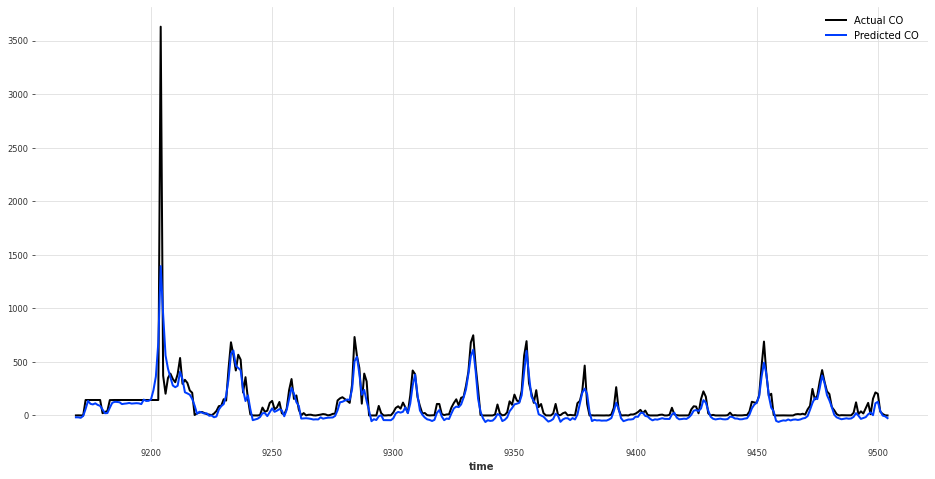

In [5]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,8))
val_reindex.plot(label='Actual CO')
res.plot(label='Predicted CO')

In [36]:
res.to_csv(r'C:/jintu/DATA/Predictions/CPCB/ModwtCB_31days_CO.csv')